In [1]:
%matplotlib inline 
import pickle
import os
import numpy as np
import json
from PIL import Image,ImageDraw
import sys

import cv2
import matplotlib.pyplot as plt  
import matplotlib.patches as patches

from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
from skimage.measure import find_contours

from shapely.geometry import Polygon
from shapely.geometry import Point
from shapely.geometry import box

In [2]:
from random import sample

In [3]:
imagePath = r'C:\Users\jiali\Desktop\choroColorRead\generatedMaps\quantiles'
imageName = 'us_Blues_4_nonAuto.jpg'
# testImages = os.listdir(imagePath)

In [4]:
# read detection results from pickle file
detectResultsPath = r'D:\OneDrive - The Ohio State University\choroColorRead'
detectResultFileName = 'detectResultSpatialPattern.pickle'
with open(detectResultsPath + '\\' + detectResultFileName, 'rb') as f:
    detectResults = pickle.load(f)

In [5]:
detectResult = detectResults[-1]

In [6]:
property = detectResult[1]
boxes = property['rois']
masks = property['masks']
class_ids = property['class_ids']

# extract mask for mapping area
N = boxes.shape[0]
if not N:
    print("\n*** No instances to display *** \n")
else:
    assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

image = cv2.imread(imagePath + '\\' + imageName)
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

masked_image = image.astype(np.uint32).copy()
maskPolyList = []

In [7]:
image.shape

(966, 1695, 3)

In [8]:
height = image.shape[0]
print(height)
width = image.shape[1]
print(width)

966
1695


In [9]:
# get the polygon for mapping area
for i in range(N):
#     if i > 0:
#         continue
    if class_ids[i] != 3:
        continue
    # Bounding box
    if not np.any(boxes[i]):
        # Skip this instance. Has no bbox. Likely lost in image cropping.
        continue
    y1, x1, y2, x2 = boxes[i]
    bboxMap = box(x1, y1, x2, y2)
    # Mask
    mask = masks[:, :, i]

    # Mask Polygon
    # Pad to ensure proper polygons for masks that touch image edges.
    padded_mask = np.zeros((mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
    padded_mask[1:-1, 1:-1] = mask
    contours = find_contours(padded_mask, 0.5)
    for verts in contours:
        # Subtract the padding and flip (y, x) to (x, y)
        verts = np.fliplr(verts) - 1
        vertList = [(vert[0],vert[1]) for vert in verts]
        maskPolygon = Polygon(vertList)
        maskPolyList.append(maskPolygon)

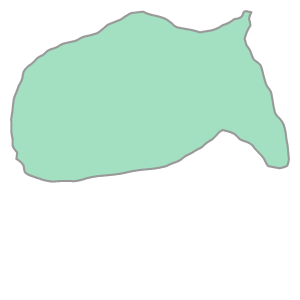

In [10]:
maskPolygon

In [11]:
# rgb color list
colorList = [[191, 214, 230], [107, 174, 216], [33, 114, 180], [239, 243, 255]]

In [12]:
def bgr2rgb(value):
    return value[2],value[0],value[1]
def valueEqualColor(value,color):
    colorR, colorG, colorB = color[0], color[1], color[2]
    valueR, valueG, valueB = value[0], value[1], value[2]
    if abs(colorR - valueR) > 10 or abs(colorB - valueB) > 10 or abs(colorG - valueG) > 10:
        return False
    else:
        return True

In [13]:
def rgb2Grey(dominantColor):
    rgb_weights = [0.2989, 0.5870, 0.1140]
    dominantColorGrey = int(np.dot(dominantColor, rgb_weights))
    return dominantColorGrey

In [14]:
# traverse the whole image
colorGrey0 = rgb2Grey(colorList[0])
colorGrey1 = rgb2Grey(colorList[1])
colorGrey2 = rgb2Grey(colorList[2])
colorGrey3 = rgb2Grey(colorList[3])

In [15]:
pixelCoordList0, pixelCoordList1, pixelCoordList2, pixelCoordList3 = [],[],[],[]
for i in range(height):
    for j in range(mask.shape[1]):
        # test x,y axis
#         if i != 148 or j != 257:
#             continue
        point = Point(j,i)
#         if bboxMap.contains(point) and maskPolygon.contains(point):
        if mask[i,j] == True:
#             print('yes!')
            value =  imageGray[i,j]
            print(value)
            b, g, r = image[i,j]
#             value_rgb = value
#             print(value_rgb)
            if not (abs(b - g) < 10 and abs(b-r) < 10 and abs(g - r)<10):
                if abs(value - colorGrey0) <= 10:
                    print('0: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList0.append((j,i))  
                elif abs(value - colorGrey1) <= 10:
                    print('1: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList1.append((j,i))  
                elif abs(value - colorGrey2) <= 10:
                    print('0: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList2.append((j,i))  
                elif abs(value - colorGrey3) <= 10:
                    print('0: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList3.append((j,i))  

96
0: j: 245 i: 130
95
0: j: 246 i: 130
95
0: j: 247 i: 130
97
0: j: 248 i: 130
97
0: j: 249 i: 130
97
0: j: 250 i: 130
97
0: j: 251 i: 130
97
0: j: 252 i: 130
97
0: j: 253 i: 130
97
0: j: 254 i: 130
97
0: j: 255 i: 130
95
0: j: 256 i: 130
99
0: j: 257 i: 130
96
0: j: 258 i: 130
95
0: j: 259 i: 130
99
0: j: 260 i: 130
96
0: j: 261 i: 130
98
0: j: 262 i: 130
112
124
92
0: j: 239 i: 131
92
0: j: 240 i: 131
95
0: j: 241 i: 131
97
0: j: 242 i: 131
97
0: j: 243 i: 131
95
0: j: 244 i: 131
95
0: j: 245 i: 131
96
0: j: 246 i: 131
99
0: j: 247 i: 131
97
0: j: 248 i: 131
97
0: j: 249 i: 131
97
0: j: 250 i: 131
97
0: j: 251 i: 131
97
0: j: 252 i: 131
97
0: j: 253 i: 131
97
0: j: 254 i: 131
97
0: j: 255 i: 131
95
0: j: 256 i: 131
100
0: j: 257 i: 131
96
0: j: 258 i: 131
95
0: j: 259 i: 131
99
0: j: 260 i: 131
96
0: j: 261 i: 131
100
0: j: 262 i: 131
116
123
158
1: j: 265 i: 131
203
0: j: 266 i: 131
212
0: j: 267 i: 131
208
0: j: 268 i: 131
207
0: j: 269 i: 131
210
0: j: 270 i: 131
210
0: j: 271 i:

C:\Users\jiali\anaconda3\envs\imageProcess\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in ubyte_scalars
  app.launch_new_instance()


142
160
1: j: 223 i: 135
165
1: j: 224 i: 135
157
1: j: 225 i: 135
155
1: j: 226 i: 135
160
1: j: 227 i: 135
161
1: j: 228 i: 135
157
1: j: 229 i: 135
157
1: j: 230 i: 135
162
1: j: 231 i: 135
160
1: j: 232 i: 135
161
1: j: 233 i: 135
157
1: j: 234 i: 135
159
1: j: 235 i: 135
157
1: j: 236 i: 135
137
122
127
97
0: j: 240 i: 135
96
0: j: 241 i: 135
99
0: j: 242 i: 135
110
122
126
119
110
97
0: j: 248 i: 135
97
0: j: 249 i: 135
97
0: j: 250 i: 135
97
0: j: 251 i: 135
97
0: j: 252 i: 135
97
0: j: 253 i: 135
97
0: j: 254 i: 135
97
0: j: 255 i: 135
94
0: j: 256 i: 135
100
0: j: 257 i: 135
97
0: j: 258 i: 135
94
0: j: 259 i: 135
97
0: j: 260 i: 135
97
0: j: 261 i: 135
108
130
143
213
0: j: 265 i: 135
207
0: j: 266 i: 135
210
0: j: 267 i: 135
200
0: j: 268 i: 135
214
0: j: 269 i: 135
212
0: j: 270 i: 135
204
0: j: 271 i: 135
215
0: j: 272 i: 135
200
0: j: 273 i: 135
196
133
116
104
0: j: 277 i: 135
93
0: j: 278 i: 135
95
0: j: 279 i: 135
99
0: j: 280 i: 135
96
0: j: 281 i: 135
96
0: j: 282 i:

206
0: j: 199 i: 142
212
0: j: 200 i: 142
212
0: j: 201 i: 142
212
0: j: 202 i: 142
212
0: j: 203 i: 142
211
0: j: 204 i: 142
211
0: j: 205 i: 142
211
0: j: 206 i: 142
210
0: j: 207 i: 142
212
0: j: 208 i: 142
211
0: j: 209 i: 142
209
0: j: 210 i: 142
208
0: j: 211 i: 142
207
0: j: 212 i: 142
207
0: j: 213 i: 142
208
0: j: 214 i: 142
208
0: j: 215 i: 142
202
0: j: 216 i: 142
150
1: j: 217 i: 142
125
125
145
167
1: j: 221 i: 142
153
1: j: 222 i: 142
161
1: j: 223 i: 142
159
1: j: 224 i: 142
159
1: j: 225 i: 142
159
1: j: 226 i: 142
159
1: j: 227 i: 142
159
1: j: 228 i: 142
159
1: j: 229 i: 142
159
1: j: 230 i: 142
159
1: j: 231 i: 142
163
1: j: 232 i: 142
163
1: j: 233 i: 142
160
1: j: 234 i: 142
154
1: j: 235 i: 142
153
1: j: 236 i: 142
155
1: j: 237 i: 142
153
1: j: 238 i: 142
149
1: j: 239 i: 142
132
128
113
100
0: j: 243 i: 142
98
0: j: 244 i: 142
96
0: j: 245 i: 142
92
0: j: 246 i: 142
95
0: j: 247 i: 142
99
0: j: 248 i: 142
96
0: j: 249 i: 142
97
0: j: 250 i: 142
99
0: j: 251 i: 1

155
1: j: 190 i: 145
150
1: j: 191 i: 145
155
1: j: 192 i: 145
138
119
172
213
0: j: 196 i: 145
203
0: j: 197 i: 145
212
0: j: 198 i: 145
213
0: j: 199 i: 145
209
0: j: 200 i: 145
209
0: j: 201 i: 145
209
0: j: 202 i: 145
209
0: j: 203 i: 145
209
0: j: 204 i: 145
209
0: j: 205 i: 145
209
0: j: 206 i: 145
209
0: j: 207 i: 145
213
0: j: 208 i: 145
203
0: j: 209 i: 145
205
0: j: 210 i: 145
211
0: j: 211 i: 145
202
0: j: 212 i: 145
179
148
1: j: 214 i: 145
120
136
124
125
144
159
1: j: 220 i: 145
159
1: j: 221 i: 145
158
1: j: 222 i: 145
161
1: j: 223 i: 145
163
1: j: 224 i: 145
159
1: j: 225 i: 145
158
1: j: 226 i: 145
162
1: j: 227 i: 145
162
1: j: 228 i: 145
158
1: j: 229 i: 145
157
1: j: 230 i: 145
160
1: j: 231 i: 145
166
1: j: 232 i: 145
151
1: j: 233 i: 145
135
125
120
116
113
112
104
0: j: 240 i: 145
98
0: j: 241 i: 145
95
0: j: 242 i: 145
96
0: j: 243 i: 145
97
0: j: 244 i: 145
95
0: j: 245 i: 145
95
0: j: 246 i: 145
98
0: j: 247 i: 145
97
0: j: 248 i: 145
103
0: j: 249 i: 145
102

254
254
185
126
128
178
181
123
130
161
1: j: 190 i: 148
134
130
120
136
145
159
1: j: 196 i: 148
194
211
0: j: 198 i: 148
214
0: j: 199 i: 148
209
0: j: 200 i: 148
209
0: j: 201 i: 148
209
0: j: 202 i: 148
209
0: j: 203 i: 148
209
0: j: 204 i: 148
209
0: j: 205 i: 148
209
0: j: 206 i: 148
209
0: j: 207 i: 148
203
0: j: 208 i: 148
187
138
108
132
156
1: j: 213 i: 148
157
1: j: 214 i: 148
157
1: j: 215 i: 148
160
1: j: 216 i: 148
158
1: j: 217 i: 148
142
125
134
159
1: j: 221 i: 148
166
1: j: 222 i: 148
155
1: j: 223 i: 148
156
1: j: 224 i: 148
159
1: j: 225 i: 148
161
1: j: 226 i: 148
161
1: j: 227 i: 148
160
1: j: 228 i: 148
160
1: j: 229 i: 148
159
1: j: 230 i: 148
159
1: j: 231 i: 148
141
138
124
106
0: j: 235 i: 148
97
0: j: 236 i: 148
98
0: j: 237 i: 148
98
0: j: 238 i: 148
94
0: j: 239 i: 148
101
0: j: 240 i: 148
97
0: j: 241 i: 148
95
0: j: 242 i: 148
99
0: j: 243 i: 148
100
0: j: 244 i: 148
98
0: j: 245 i: 148
96
0: j: 246 i: 148
97
0: j: 247 i: 148
102
0: j: 248 i: 148
89
0: j

158
1: j: 391 i: 150
159
1: j: 392 i: 150
159
1: j: 393 i: 150
159
1: j: 394 i: 150
159
1: j: 395 i: 150
159
1: j: 396 i: 150
159
1: j: 397 i: 150
159
1: j: 398 i: 150
159
1: j: 399 i: 150
136
136
146
213
0: j: 403 i: 150
205
0: j: 404 i: 150
210
0: j: 405 i: 150
209
0: j: 406 i: 150
208
0: j: 407 i: 150
208
0: j: 408 i: 150
206
0: j: 409 i: 150
131
128
151
1: j: 412 i: 150
162
1: j: 413 i: 150
153
1: j: 414 i: 150
163
1: j: 415 i: 150
158
1: j: 416 i: 150
158
1: j: 417 i: 150
158
1: j: 418 i: 150
158
1: j: 419 i: 150
158
1: j: 420 i: 150
159
1: j: 421 i: 150
159
1: j: 422 i: 150
159
1: j: 423 i: 150
159
1: j: 424 i: 150
159
1: j: 425 i: 150
159
1: j: 426 i: 150
88
0: j: 172 i: 151
98
0: j: 173 i: 151
120
129
128
146
148
1: j: 178 i: 151
140
113
131
123
134
128
121
147
187
203
0: j: 188 i: 151
206
0: j: 189 i: 151
209
0: j: 190 i: 151
209
0: j: 191 i: 151
204
0: j: 192 i: 151
216
0: j: 193 i: 151
200
0: j: 194 i: 151
187
129
117
196
207
0: j: 199 i: 151
209
0: j: 200 i: 151
209
0: j: 2

166
1: j: 228 i: 153
158
1: j: 229 i: 153
138
128
102
0: j: 232 i: 153
97
0: j: 233 i: 153
98
0: j: 234 i: 153
104
0: j: 235 i: 153
102
0: j: 236 i: 153
93
0: j: 237 i: 153
92
0: j: 238 i: 153
99
0: j: 239 i: 153
97
0: j: 240 i: 153
95
0: j: 241 i: 153
93
0: j: 242 i: 153
96
0: j: 243 i: 153
109
124
127
122
125
138
155
1: j: 250 i: 153
174
209
0: j: 252 i: 153
207
0: j: 253 i: 153
206
0: j: 254 i: 153
151
1: j: 255 i: 153
126
141
155
1: j: 258 i: 153
160
1: j: 259 i: 153
159
1: j: 260 i: 153
159
1: j: 261 i: 153
160
1: j: 262 i: 153
159
1: j: 263 i: 153
159
1: j: 264 i: 153
159
1: j: 265 i: 153
159
1: j: 266 i: 153
159
1: j: 267 i: 153
159
1: j: 268 i: 153
159
1: j: 269 i: 153
159
1: j: 270 i: 153
159
1: j: 271 i: 153
160
1: j: 272 i: 153
144
141
146
141
134
131
128
133
133
126
122
134
153
1: j: 285 i: 153
162
1: j: 286 i: 153
158
1: j: 287 i: 153
160
1: j: 288 i: 153
156
1: j: 289 i: 153
162
1: j: 290 i: 153
158
1: j: 291 i: 153
136
126
138
148
1: j: 295 i: 153
140
138
136
133
131
130

1: j: 415 i: 155
159
1: j: 416 i: 155
159
1: j: 417 i: 155
159
1: j: 418 i: 155
159
1: j: 419 i: 155
159
1: j: 420 i: 155
159
1: j: 421 i: 155
159
1: j: 422 i: 155
159
1: j: 423 i: 155
161
1: j: 424 i: 155
159
1: j: 425 i: 155
158
1: j: 426 i: 155
159
1: j: 427 i: 155
160
1: j: 428 i: 155
160
1: j: 429 i: 155
159
1: j: 430 i: 155
157
1: j: 431 i: 155
128
129
148
1: j: 434 i: 155
163
1: j: 435 i: 155
159
1: j: 436 i: 155
156
1: j: 437 i: 155
160
1: j: 438 i: 155
159
1: j: 439 i: 155
159
1: j: 440 i: 155
159
1: j: 441 i: 155
159
1: j: 442 i: 155
159
1: j: 443 i: 155
159
1: j: 444 i: 155
159
1: j: 445 i: 155
159
1: j: 446 i: 155
159
1: j: 447 i: 155
160
1: j: 448 i: 155
155
1: j: 449 i: 155
157
1: j: 450 i: 155
163
1: j: 451 i: 155
161
1: j: 452 i: 155
153
1: j: 453 i: 155
140
126
119
195
204
0: j: 458 i: 155
206
0: j: 459 i: 155
214
0: j: 460 i: 155
204
0: j: 461 i: 155
212
0: j: 462 i: 155
210
0: j: 463 i: 155
209
0: j: 464 i: 155
209
0: j: 465 i: 155
209
0: j: 466 i: 155
209
0: j: 467 

159
1: j: 442 i: 157
159
1: j: 443 i: 157
159
1: j: 444 i: 157
159
1: j: 445 i: 157
159
1: j: 446 i: 157
159
1: j: 447 i: 157
160
1: j: 448 i: 157
160
1: j: 449 i: 157
156
1: j: 450 i: 157
159
1: j: 451 i: 157
160
1: j: 452 i: 157
139
125
134
167
1: j: 456 i: 157
206
0: j: 457 i: 157
209
0: j: 458 i: 157
206
0: j: 459 i: 157
213
0: j: 460 i: 157
209
0: j: 461 i: 157
210
0: j: 462 i: 157
210
0: j: 463 i: 157
209
0: j: 464 i: 157
209
0: j: 465 i: 157
209
0: j: 466 i: 157
209
0: j: 467 i: 157
209
0: j: 468 i: 157
209
0: j: 469 i: 157
209
0: j: 470 i: 157
209
0: j: 471 i: 157
209
0: j: 472 i: 157
208
0: j: 473 i: 157
128
126
211
0: j: 476 i: 157
239
0: j: 477 i: 157
246
0: j: 478 i: 157
245
0: j: 479 i: 157
244
0: j: 480 i: 157
244
0: j: 481 i: 157
245
0: j: 482 i: 157
246
0: j: 483 i: 157
246
0: j: 484 i: 157
245
0: j: 485 i: 157
244
0: j: 486 i: 157
243
0: j: 487 i: 157
235
0: j: 488 i: 157
239
0: j: 489 i: 157
250
254
254
156
129
142
138
129
146
121
125
214
0: j: 160 i: 158
232
241
0: j

159
1: j: 447 i: 159
158
1: j: 448 i: 159
162
1: j: 449 i: 159
157
1: j: 450 i: 159
159
1: j: 451 i: 159
161
1: j: 452 i: 159
138
132
159
1: j: 455 i: 159
219
198
0: j: 457 i: 159
213
0: j: 458 i: 159
208
0: j: 459 i: 159
206
0: j: 460 i: 159
218
0: j: 461 i: 159
205
0: j: 462 i: 159
210
0: j: 463 i: 159
209
0: j: 464 i: 159
209
0: j: 465 i: 159
209
0: j: 466 i: 159
209
0: j: 467 i: 159
209
0: j: 468 i: 159
209
0: j: 469 i: 159
209
0: j: 470 i: 159
209
0: j: 471 i: 159
206
0: j: 472 i: 159
203
0: j: 473 i: 159
131
122
246
0: j: 476 i: 159
234
0: j: 477 i: 159
248
0: j: 478 i: 159
242
0: j: 479 i: 159
243
0: j: 480 i: 159
242
0: j: 481 i: 159
240
0: j: 482 i: 159
238
0: j: 483 i: 159
239
0: j: 484 i: 159
240
0: j: 485 i: 159
243
0: j: 486 i: 159
245
0: j: 487 i: 159
247
0: j: 488 i: 159
241
0: j: 489 i: 159
246
0: j: 490 i: 159
242
0: j: 491 i: 159
254
193
184
144
134
171
240
0: j: 498 i: 159
249
0: j: 499 i: 159
238
0: j: 500 i: 159
243
0: j: 501 i: 159
235
0: j: 502 i: 159
241
0: j: 5

158
1: j: 430 i: 161
145
124
131
145
158
1: j: 435 i: 161
161
1: j: 436 i: 161
157
1: j: 437 i: 161
157
1: j: 438 i: 161
161
1: j: 439 i: 161
159
1: j: 440 i: 161
159
1: j: 441 i: 161
159
1: j: 442 i: 161
159
1: j: 443 i: 161
159
1: j: 444 i: 161
159
1: j: 445 i: 161
159
1: j: 446 i: 161
159
1: j: 447 i: 161
153
1: j: 448 i: 161
167
1: j: 449 i: 161
162
1: j: 450 i: 161
160
1: j: 451 i: 161
150
1: j: 452 i: 161
125
128
179
209
0: j: 456 i: 161
209
0: j: 457 i: 161
209
0: j: 458 i: 161
209
0: j: 459 i: 161
209
0: j: 460 i: 161
209
0: j: 461 i: 161
209
0: j: 462 i: 161
209
0: j: 463 i: 161
210
0: j: 464 i: 161
211
0: j: 465 i: 161
210
0: j: 466 i: 161
204
0: j: 467 i: 161
208
0: j: 468 i: 161
210
0: j: 469 i: 161
204
0: j: 470 i: 161
209
0: j: 471 i: 161
205
0: j: 472 i: 161
168
1: j: 473 i: 161
141
146
242
0: j: 476 i: 161
251
239
243
0: j: 479 i: 161
243
0: j: 480 i: 161
243
0: j: 481 i: 161
243
0: j: 482 i: 161
243
0: j: 483 i: 161
243
0: j: 484 i: 161
243
0: j: 485 i: 161
243
0: j: 4

207
0: j: 327 i: 163
204
0: j: 328 i: 163
151
1: j: 329 i: 163
141
134
133
134
115
127
130
137
136
135
180
191
179
159
1: j: 343 i: 163
124
121
131
130
139
254
182
125
126
141
156
1: j: 354 i: 163
157
1: j: 355 i: 163
151
1: j: 356 i: 163
158
1: j: 357 i: 163
165
1: j: 358 i: 163
162
1: j: 359 i: 163
158
1: j: 360 i: 163
157
1: j: 361 i: 163
159
1: j: 362 i: 163
162
1: j: 363 i: 163
160
1: j: 364 i: 163
149
1: j: 365 i: 163
136
129
133
140
144
142
138
136
133
129
134
131
127
123
121
119
116
114
94
0: j: 384 i: 163
98
0: j: 385 i: 163
95
0: j: 386 i: 163
94
0: j: 387 i: 163
98
0: j: 388 i: 163
95
0: j: 389 i: 163
101
0: j: 390 i: 163
119
128
129
131
132
132
130
123
117
153
1: j: 400 i: 163
203
0: j: 401 i: 163
208
0: j: 402 i: 163
213
0: j: 403 i: 163
206
0: j: 404 i: 163
213
0: j: 405 i: 163
203
0: j: 406 i: 163
212
0: j: 407 i: 163
126
129
135
126
132
120
129
137
127
134
143
152
1: j: 419 i: 163
156
1: j: 420 i: 163
155
1: j: 421 i: 163
150
1: j: 422 i: 163
147
155
1: j: 424 i: 163
15

159
1: j: 295 i: 165
160
1: j: 296 i: 165
158
1: j: 297 i: 165
161
1: j: 298 i: 165
160
1: j: 299 i: 165
156
1: j: 300 i: 165
160
1: j: 301 i: 165
155
1: j: 302 i: 165
136
125
147
157
1: j: 306 i: 165
158
1: j: 307 i: 165
163
1: j: 308 i: 165
159
1: j: 309 i: 165
155
1: j: 310 i: 165
161
1: j: 311 i: 165
158
1: j: 312 i: 165
156
1: j: 313 i: 165
129
121
178
206
0: j: 317 i: 165
208
0: j: 318 i: 165
212
0: j: 319 i: 165
208
0: j: 320 i: 165
208
0: j: 321 i: 165
207
0: j: 322 i: 165
206
0: j: 323 i: 165
205
0: j: 324 i: 165
208
0: j: 325 i: 165
213
0: j: 326 i: 165
217
0: j: 327 i: 165
210
0: j: 328 i: 165
205
0: j: 329 i: 165
219
210
0: j: 331 i: 165
201
0: j: 332 i: 165
218
0: j: 333 i: 165
205
0: j: 334 i: 165
170
129
128
125
129
222
246
0: j: 341 i: 165
254
249
0: j: 343 i: 165
249
0: j: 344 i: 165
250
0: j: 345 i: 165
242
0: j: 346 i: 165
237
238
250
0: j: 349 i: 165
247
0: j: 350 i: 165
219
127
117
140
166
1: j: 355 i: 165
160
1: j: 356 i: 165
157
1: j: 357 i: 165
161
1: j: 358 i: 

255
255
255
255
255
255
255
255
166
1: j: 152 i: 167
121
127
150
1: j: 155 i: 167
235
0: j: 156 i: 167
241
0: j: 157 i: 167
230
141
125
123
128
142
173
228
169
122
154
1: j: 168 i: 167
208
0: j: 169 i: 167
211
0: j: 170 i: 167
212
0: j: 171 i: 167
213
0: j: 172 i: 167
201
0: j: 173 i: 167
213
0: j: 174 i: 167
215
0: j: 175 i: 167
208
0: j: 176 i: 167
208
0: j: 177 i: 167
209
0: j: 178 i: 167
210
0: j: 179 i: 167
209
0: j: 180 i: 167
208
0: j: 181 i: 167
206
0: j: 182 i: 167
205
0: j: 183 i: 167
218
0: j: 184 i: 167
206
0: j: 185 i: 167
213
0: j: 186 i: 167
215
0: j: 187 i: 167
200
0: j: 188 i: 167
202
0: j: 189 i: 167
214
0: j: 190 i: 167
209
0: j: 191 i: 167
215
0: j: 192 i: 167
207
0: j: 193 i: 167
205
0: j: 194 i: 167
195
157
1: j: 196 i: 167
125
144
188
189
173
140
121
127
128
111
98
0: j: 207 i: 167
98
0: j: 208 i: 167
97
0: j: 209 i: 167
98
0: j: 210 i: 167
99
0: j: 211 i: 167
97
0: j: 212 i: 167
96
0: j: 213 i: 167
101
0: j: 214 i: 167
109
121
123
125
126
127
135
147
157
1: j: 2

205
0: j: 525 i: 168
207
0: j: 526 i: 168
207
0: j: 527 i: 168
206
0: j: 528 i: 168
209
0: j: 529 i: 168
194
122
117
152
1: j: 533 i: 168
132
118
130
129
127
126
126
128
130
131
135
126
129
133
132
138
148
1: j: 550 i: 168
147
130
135
99
0: j: 554 i: 168
97
0: j: 555 i: 168
86
98
0: j: 557 i: 168
255
255
255
255
255
255
255
255
255
255
231
191
178
123
151
169
154
133
138
142
151
1: j: 162 i: 169
150
1: j: 163 i: 169
139
136
133
119
121
149
1: j: 169 i: 169
171
194
211
0: j: 172 i: 169
213
0: j: 173 i: 169
211
0: j: 174 i: 169
207
0: j: 175 i: 169
216
0: j: 176 i: 169
215
0: j: 177 i: 169
210
0: j: 178 i: 169
203
0: j: 179 i: 169
200
0: j: 180 i: 169
204
0: j: 181 i: 169
209
0: j: 182 i: 169
211
0: j: 183 i: 169
206
0: j: 184 i: 169
204
0: j: 185 i: 169
202
0: j: 186 i: 169
201
0: j: 187 i: 169
204
0: j: 188 i: 169
207
0: j: 189 i: 169
211
0: j: 190 i: 169
212
0: j: 191 i: 169
206
0: j: 192 i: 169
206
0: j: 193 i: 169
205
0: j: 194 i: 169
205
0: j: 195 i: 169
205
0: j: 196 i: 169
208
0:

143
159
1: j: 432 i: 171
159
1: j: 433 i: 171
159
1: j: 434 i: 171
159
1: j: 435 i: 171
159
1: j: 436 i: 171
159
1: j: 437 i: 171
159
1: j: 438 i: 171
159
1: j: 439 i: 171
159
1: j: 440 i: 171
159
1: j: 441 i: 171
159
1: j: 442 i: 171
159
1: j: 443 i: 171
159
1: j: 444 i: 171
159
1: j: 445 i: 171
159
1: j: 446 i: 171
159
1: j: 447 i: 171
158
1: j: 448 i: 171
149
1: j: 449 i: 171
129
122
190
207
0: j: 453 i: 171
210
0: j: 454 i: 171
211
0: j: 455 i: 171
209
0: j: 456 i: 171
209
0: j: 457 i: 171
209
0: j: 458 i: 171
209
0: j: 459 i: 171
209
0: j: 460 i: 171
209
0: j: 461 i: 171
209
0: j: 462 i: 171
209
0: j: 463 i: 171
207
0: j: 464 i: 171
206
0: j: 465 i: 171
213
0: j: 466 i: 171
203
0: j: 467 i: 171
211
0: j: 468 i: 171
154
1: j: 469 i: 171
134
127
124
161
245
246
0: j: 475 i: 171
246
0: j: 476 i: 171
242
0: j: 477 i: 171
244
0: j: 478 i: 171
237
0: j: 479 i: 171
243
0: j: 480 i: 171
243
0: j: 481 i: 171
243
0: j: 482 i: 171
243
0: j: 483 i: 171
243
0: j: 484 i: 171
243
0: j: 485 i: 17

255
255
254
254
255
255
255
255
254
254
250
0: j: 152 i: 173
148
1: j: 153 i: 173
140
122
104
0: j: 156 i: 173
133
142
113
144
128
123
127
130
140
152
1: j: 166 i: 173
153
1: j: 167 i: 173
116
134
234
0: j: 170 i: 173
245
0: j: 171 i: 173
247
0: j: 172 i: 173
233
0: j: 173 i: 173
240
0: j: 174 i: 173
244
0: j: 175 i: 173
183
152
1: j: 177 i: 173
127
127
133
133
134
139
163
1: j: 184 i: 173
177
196
209
0: j: 187 i: 173
213
0: j: 188 i: 173
211
0: j: 189 i: 173
209
0: j: 190 i: 173
209
0: j: 191 i: 173
215
0: j: 192 i: 173
215
0: j: 193 i: 173
212
0: j: 194 i: 173
209
0: j: 195 i: 173
206
0: j: 196 i: 173
207
0: j: 197 i: 173
210
0: j: 198 i: 173
214
0: j: 199 i: 173
216
0: j: 200 i: 173
202
0: j: 201 i: 173
189
132
132
108
100
0: j: 206 i: 173
96
0: j: 207 i: 173
97
0: j: 208 i: 173
97
0: j: 209 i: 173
97
0: j: 210 i: 173
97
0: j: 211 i: 173
97
0: j: 212 i: 173
97
0: j: 213 i: 173
97
0: j: 214 i: 173
97
0: j: 215 i: 173
98
0: j: 216 i: 173
99
0: j: 217 i: 173
97
0: j: 218 i: 173
97
0: j

255
255
255
255
255
255
255
255
255
254
253
224
130
119
94
0: j: 155 i: 175
127
113
102
0: j: 158 i: 175
92
0: j: 159 i: 175
99
0: j: 160 i: 175
92
0: j: 161 i: 175
104
0: j: 162 i: 175
120
123
126
131
130
120
124
228
227
244
249
253
239
0: j: 175 i: 175
244
244
241
0: j: 178 i: 175
241
0: j: 179 i: 175
248
250
228
200
0: j: 183 i: 175
144
137
129
125
127
130
131
131
163
1: j: 192 i: 175
180
201
0: j: 194 i: 175
213
0: j: 195 i: 175
213
0: j: 196 i: 175
208
0: j: 197 i: 175
207
0: j: 198 i: 175
209
0: j: 199 i: 175
203
0: j: 200 i: 175
204
0: j: 201 i: 175
121
123
107
0: j: 204 i: 175
102
0: j: 205 i: 175
86
101
0: j: 207 i: 175
97
0: j: 208 i: 175
97
0: j: 209 i: 175
97
0: j: 210 i: 175
97
0: j: 211 i: 175
97
0: j: 212 i: 175
97
0: j: 213 i: 175
97
0: j: 214 i: 175
97
0: j: 215 i: 175
95
0: j: 216 i: 175
99
0: j: 217 i: 175
98
0: j: 218 i: 175
94
0: j: 219 i: 175
95
0: j: 220 i: 175
102
0: j: 221 i: 175
104
0: j: 222 i: 175
101
0: j: 223 i: 175
112
115
120
124
127
127
127
126
135
149


215
0: j: 282 i: 177
205
0: j: 283 i: 177
209
0: j: 284 i: 177
211
0: j: 285 i: 177
185
131
129
138
189
204
0: j: 291 i: 177
200
0: j: 292 i: 177
213
0: j: 293 i: 177
211
0: j: 294 i: 177
212
0: j: 295 i: 177
210
0: j: 296 i: 177
212
0: j: 297 i: 177
211
0: j: 298 i: 177
211
0: j: 299 i: 177
183
126
135
158
1: j: 303 i: 177
159
1: j: 304 i: 177
159
1: j: 305 i: 177
159
1: j: 306 i: 177
159
1: j: 307 i: 177
159
1: j: 308 i: 177
159
1: j: 309 i: 177
159
1: j: 310 i: 177
159
1: j: 311 i: 177
158
1: j: 312 i: 177
161
1: j: 313 i: 177
156
1: j: 314 i: 177
142
126
115
108
103
0: j: 319 i: 177
94
0: j: 320 i: 177
97
0: j: 321 i: 177
93
0: j: 322 i: 177
94
0: j: 323 i: 177
104
0: j: 324 i: 177
112
118
129
171
204
0: j: 329 i: 177
213
0: j: 330 i: 177
210
0: j: 331 i: 177
219
218
0: j: 333 i: 177
203
0: j: 334 i: 177
199
0: j: 335 i: 177
210
0: j: 336 i: 177
207
0: j: 337 i: 177
140
129
134
188
236
0: j: 342 i: 177
235
0: j: 343 i: 177
240
0: j: 344 i: 177
228
133
126
152
1: j: 348 i: 177
208
0

161
1: j: 359 i: 179
153
1: j: 360 i: 179
136
129
143
158
1: j: 364 i: 179
161
1: j: 365 i: 179
156
1: j: 366 i: 179
153
1: j: 367 i: 179
143
143
143
144
143
138
130
124
143
156
1: j: 377 i: 179
161
1: j: 378 i: 179
155
1: j: 379 i: 179
155
1: j: 380 i: 179
160
1: j: 381 i: 179
155
1: j: 382 i: 179
142
145
161
1: j: 385 i: 179
157
1: j: 386 i: 179
162
1: j: 387 i: 179
130
117
121
133
132
135
123
130
131
126
149
1: j: 398 i: 179
164
1: j: 399 i: 179
194
214
0: j: 401 i: 179
238
0: j: 402 i: 179
242
0: j: 403 i: 179
249
246
0: j: 405 i: 179
254
246
0: j: 407 i: 179
243
0: j: 408 i: 179
243
0: j: 409 i: 179
243
0: j: 410 i: 179
243
0: j: 411 i: 179
243
0: j: 412 i: 179
243
0: j: 413 i: 179
243
0: j: 414 i: 179
243
0: j: 415 i: 179
242
0: j: 416 i: 179
241
0: j: 417 i: 179
245
0: j: 418 i: 179
242
0: j: 419 i: 179
246
0: j: 420 i: 179
250
239
245
254
242
0: j: 425 i: 179
236
0: j: 426 i: 179
239
0: j: 427 i: 179
141
132
140
159
1: j: 431 i: 179
159
1: j: 432 i: 179
157
1: j: 433 i: 179
156

209
0: j: 576 i: 180
209
0: j: 577 i: 180
209
0: j: 578 i: 180
209
0: j: 579 i: 180
210
0: j: 580 i: 180
210
0: j: 581 i: 180
211
0: j: 582 i: 180
211
0: j: 583 i: 180
188
136
122
141
206
0: j: 588 i: 180
207
0: j: 589 i: 180
211
0: j: 590 i: 180
204
0: j: 591 i: 180
209
0: j: 592 i: 180
205
0: j: 593 i: 180
213
0: j: 594 i: 180
205
0: j: 595 i: 180
208
0: j: 596 i: 180
209
0: j: 597 i: 180
205
0: j: 598 i: 180
128
136
142
227
251
240
0: j: 604 i: 180
251
246
0: j: 606 i: 180
136
124
129
119
126
138
121
110
122
121
127
133
142
127
126
129
109
135
183
211
0: j: 626 i: 180
207
0: j: 627 i: 180
208
0: j: 628 i: 180
215
0: j: 629 i: 180
213
0: j: 630 i: 180
209
0: j: 631 i: 180
210
0: j: 632 i: 180
204
0: j: 633 i: 180
212
0: j: 634 i: 180
128
126
224
238
0: j: 638 i: 180
242
0: j: 639 i: 180
243
0: j: 640 i: 180
244
0: j: 641 i: 180
244
0: j: 642 i: 180
245
0: j: 643 i: 180
245
0: j: 644 i: 180
246
0: j: 645 i: 180
246
0: j: 646 i: 180
246
0: j: 647 i: 180
255
255
255
255
254
255
250
0: j

138
125
117
99
0: j: 322 i: 182
90
0: j: 323 i: 182
96
0: j: 324 i: 182
98
0: j: 325 i: 182
95
0: j: 326 i: 182
97
0: j: 327 i: 182
120
133
133
129
126
118
139
186
201
0: j: 336 i: 182
212
0: j: 337 i: 182
217
0: j: 338 i: 182
187
142
140
231
240
0: j: 343 i: 182
248
0: j: 344 i: 182
227
146
119
169
204
0: j: 349 i: 182
211
0: j: 350 i: 182
203
0: j: 351 i: 182
217
0: j: 352 i: 182
181
130
125
155
1: j: 356 i: 182
153
1: j: 357 i: 182
160
1: j: 358 i: 182
156
1: j: 359 i: 182
162
1: j: 360 i: 182
139
125
136
155
1: j: 364 i: 182
163
1: j: 365 i: 182
162
1: j: 366 i: 182
160
1: j: 367 i: 182
159
1: j: 368 i: 182
157
1: j: 369 i: 182
156
1: j: 370 i: 182
158
1: j: 371 i: 182
159
1: j: 372 i: 182
157
1: j: 373 i: 182
151
1: j: 374 i: 182
146
121
124
129
132
133
132
129
127
126
194
203
185
165
172
239
0: j: 390 i: 182
251
0: j: 391 i: 182
237
0: j: 392 i: 182
247
0: j: 393 i: 182
248
0: j: 394 i: 182
248
0: j: 395 i: 182
237
0: j: 396 i: 182
240
0: j: 397 i: 182
245
0: j: 398 i: 182
210
0:

245
0: j: 667 i: 183
245
0: j: 668 i: 183
245
0: j: 669 i: 183
245
0: j: 670 i: 183
131
255
255
255
255
255
251
254
245
253
0: j: 147 i: 184
254
153
1: j: 149 i: 184
115
134
129
118
147
114
110
98
0: j: 157 i: 184
89
0: j: 158 i: 184
99
0: j: 159 i: 184
103
0: j: 160 i: 184
118
120
180
238
0: j: 164 i: 184
239
244
0: j: 166 i: 184
248
0: j: 167 i: 184
248
0: j: 168 i: 184
228
254
243
0: j: 171 i: 184
149
1: j: 172 i: 184
122
191
237
247
236
230
202
223
251
147
124
129
122
212
0: j: 186 i: 184
209
0: j: 187 i: 184
207
0: j: 188 i: 184
218
0: j: 189 i: 184
207
0: j: 190 i: 184
205
0: j: 191 i: 184
215
0: j: 192 i: 184
214
0: j: 193 i: 184
207
0: j: 194 i: 184
209
0: j: 195 i: 184
207
0: j: 196 i: 184
203
0: j: 197 i: 184
133
126
97
0: j: 200 i: 184
97
0: j: 201 i: 184
98
0: j: 202 i: 184
99
0: j: 203 i: 184
99
0: j: 204 i: 184
99
0: j: 205 i: 184
98
0: j: 206 i: 184
97
0: j: 207 i: 184
97
0: j: 208 i: 184
97
0: j: 209 i: 184
98
0: j: 210 i: 184
98
0: j: 211 i: 184
98
0: j: 212 i: 184
97


97
0: j: 225 i: 185
103
0: j: 226 i: 185
92
0: j: 227 i: 185
103
0: j: 228 i: 185
97
0: j: 229 i: 185
122
130
215
0: j: 232 i: 185
237
0: j: 233 i: 185
250
244
0: j: 235 i: 185
238
0: j: 236 i: 185
243
0: j: 237 i: 185
245
0: j: 238 i: 185
240
0: j: 239 i: 185
237
0: j: 240 i: 185
176
128
137
158
1: j: 244 i: 185
160
1: j: 245 i: 185
160
1: j: 246 i: 185
154
1: j: 247 i: 185
161
1: j: 248 i: 185
159
1: j: 249 i: 185
158
1: j: 250 i: 185
159
1: j: 251 i: 185
161
1: j: 252 i: 185
162
1: j: 253 i: 185
161
1: j: 254 i: 185
160
1: j: 255 i: 185
160
1: j: 256 i: 185
158
1: j: 257 i: 185
157
1: j: 258 i: 185
159
1: j: 259 i: 185
157
1: j: 260 i: 185
150
1: j: 261 i: 185
140
132
166
1: j: 264 i: 185
204
0: j: 265 i: 185
217
0: j: 266 i: 185
201
0: j: 267 i: 185
199
0: j: 268 i: 185
208
0: j: 269 i: 185
211
0: j: 270 i: 185
212
0: j: 271 i: 185
213
0: j: 272 i: 185
212
0: j: 273 i: 185
210
0: j: 274 i: 185
219
203
0: j: 276 i: 185
200
0: j: 277 i: 185
222
200
0: j: 279 i: 185
210
0: j: 280 i: 1

119
129
130
172
221
245
0: j: 491 i: 186
251
239
0: j: 493 i: 186
242
0: j: 494 i: 186
249
0: j: 495 i: 186
235
0: j: 496 i: 186
237
0: j: 497 i: 186
242
0: j: 498 i: 186
240
0: j: 499 i: 186
240
0: j: 500 i: 186
237
0: j: 501 i: 186
239
0: j: 502 i: 186
239
0: j: 503 i: 186
253
241
245
252
125
121
155
1: j: 510 i: 186
153
1: j: 511 i: 186
162
1: j: 512 i: 186
162
1: j: 513 i: 186
161
1: j: 514 i: 186
160
1: j: 515 i: 186
159
1: j: 516 i: 186
158
1: j: 517 i: 186
157
1: j: 518 i: 186
157
1: j: 519 i: 186
162
1: j: 520 i: 186
162
1: j: 521 i: 186
161
1: j: 522 i: 186
156
1: j: 523 i: 186
148
1: j: 524 i: 186
140
134
131
129
124
129
139
213
0: j: 532 i: 186
160
1: j: 533 i: 186
106
0: j: 534 i: 186
130
127
125
120
116
122
132
131
123
124
119
112
104
0: j: 547 i: 186
96
0: j: 548 i: 186
94
0: j: 549 i: 186
103
0: j: 550 i: 186
114
105
0: j: 552 i: 186
131
107
0: j: 554 i: 186
133
124
239
0: j: 557 i: 186
235
0: j: 558 i: 186
248
0: j: 559 i: 186
243
0: j: 560 i: 186
243
0: j: 561 i: 186
2

255
255
255
255
255
255
255
255
254
254
254
255
255
254
254
254
252
0: j: 1160 i: 187
136
122
135
85
96
0: j: 1165 i: 187
94
0: j: 1166 i: 187
106
0: j: 1167 i: 187
99
0: j: 1168 i: 187
94
0: j: 1169 i: 187
92
0: j: 1170 i: 187
100
0: j: 1171 i: 187
113
124
130
132
153
1: j: 1176 i: 187
159
1: j: 1177 i: 187
255
255
255
255
255
253
250
244
254
201
0: j: 148 i: 188
119
150
1: j: 150 i: 188
238
0: j: 151 i: 188
249
235
0: j: 153 i: 188
248
0: j: 154 i: 188
238
0: j: 155 i: 188
251
208
0: j: 157 i: 188
139
135
127
121
127
131
132
133
127
123
153
1: j: 168 i: 188
245
245
0: j: 170 i: 188
197
144
124
129
198
0: j: 175 i: 188
233
0: j: 176 i: 188
239
0: j: 177 i: 188
245
0: j: 178 i: 188
253
224
206
0: j: 181 i: 188
156
1: j: 182 i: 188
121
135
214
0: j: 185 i: 188
204
0: j: 186 i: 188
214
0: j: 187 i: 188
210
0: j: 188 i: 188
207
0: j: 189 i: 188
206
0: j: 190 i: 188
211
0: j: 191 i: 188
208
0: j: 192 i: 188
218
0: j: 193 i: 188
191
131
132
121
129
124
109
107
0: j: 201 i: 188
105
0: j: 202

217
0: j: 231 i: 189
241
0: j: 232 i: 189
242
0: j: 233 i: 189
243
0: j: 234 i: 189
244
0: j: 235 i: 189
243
0: j: 236 i: 189
239
0: j: 237 i: 189
241
0: j: 238 i: 189
246
0: j: 239 i: 189
231
122
130
160
1: j: 243 i: 189
151
1: j: 244 i: 189
160
1: j: 245 i: 189
159
1: j: 246 i: 189
161
1: j: 247 i: 189
155
1: j: 248 i: 189
158
1: j: 249 i: 189
161
1: j: 250 i: 189
162
1: j: 251 i: 189
157
1: j: 252 i: 189
145
131
121
98
0: j: 256 i: 189
100
0: j: 257 i: 189
98
0: j: 258 i: 189
95
0: j: 259 i: 189
104
0: j: 260 i: 189
120
129
128
125
124
121
128
134
124
120
134
90
0: j: 272 i: 189
105
0: j: 273 i: 189
111
117
138
128
137
215
0: j: 279 i: 189
211
0: j: 280 i: 189
211
0: j: 281 i: 189
213
0: j: 282 i: 189
203
0: j: 283 i: 189
136
130
185
209
0: j: 287 i: 189
209
0: j: 288 i: 189
209
0: j: 289 i: 189
209
0: j: 290 i: 189
209
0: j: 291 i: 189
209
0: j: 292 i: 189
209
0: j: 293 i: 189
209
0: j: 294 i: 189
209
0: j: 295 i: 189
216
0: j: 296 i: 189
196
131
126
200
0: j: 300 i: 189
219
215
0:

202
0: j: 434 i: 190
213
0: j: 435 i: 190
217
0: j: 436 i: 190
208
0: j: 437 i: 190
218
0: j: 438 i: 190
210
0: j: 439 i: 190
218
0: j: 440 i: 190
204
0: j: 441 i: 190
197
170
149
1: j: 444 i: 190
140
122
121
125
140
158
1: j: 450 i: 190
170
174
176
181
186
211
0: j: 456 i: 190
205
0: j: 457 i: 190
206
0: j: 458 i: 190
211
0: j: 459 i: 190
202
0: j: 460 i: 190
175
148
1: j: 462 i: 190
135
130
145
139
132
117
129
154
1: j: 470 i: 190
176
186
201
0: j: 473 i: 190
233
0: j: 474 i: 190
216
0: j: 475 i: 190
148
1: j: 476 i: 190
118
130
133
123
123
129
110
91
0: j: 484 i: 190
102
0: j: 485 i: 190
98
0: j: 486 i: 190
103
0: j: 487 i: 190
127
130
245
0: j: 490 i: 190
246
0: j: 491 i: 190
249
0: j: 492 i: 190
250
253
251
0: j: 495 i: 190
247
0: j: 496 i: 190
248
0: j: 497 i: 190
241
0: j: 498 i: 190
245
0: j: 499 i: 190
239
0: j: 500 i: 190
244
0: j: 501 i: 190
238
0: j: 502 i: 190
239
0: j: 503 i: 190
191
168
1: j: 505 i: 190
174
117
129
144
169
166
1: j: 511 i: 190
159
1: j: 512 i: 190
159
1:

208
0: j: 441 i: 191
216
0: j: 442 i: 191
209
0: j: 443 i: 191
206
0: j: 444 i: 191
186
141
128
124
126
128
127
126
127
130
134
131
167
1: j: 457 i: 191
210
0: j: 458 i: 191
219
181
134
119
129
132
124
122
129
126
121
134
129
135
117
130
139
122
124
126
102
0: j: 479 i: 191
104
0: j: 480 i: 191
99
0: j: 481 i: 191
104
0: j: 482 i: 191
85
109
91
0: j: 485 i: 191
87
0: j: 486 i: 191
116
132
135
242
0: j: 490 i: 191
245
251
237
0: j: 493 i: 191
243
0: j: 494 i: 191
237
0: j: 495 i: 191
238
0: j: 496 i: 191
241
0: j: 497 i: 191
243
0: j: 498 i: 191
245
0: j: 499 i: 191
243
0: j: 500 i: 191
243
0: j: 501 i: 191
244
0: j: 502 i: 191
245
0: j: 503 i: 191
154
1: j: 504 i: 191
114
134
132
125
154
1: j: 509 i: 191
161
1: j: 510 i: 191
150
1: j: 511 i: 191
159
1: j: 512 i: 191
159
1: j: 513 i: 191
157
1: j: 514 i: 191
157
1: j: 515 i: 191
157
1: j: 516 i: 191
159
1: j: 517 i: 191
161
1: j: 518 i: 191
162
1: j: 519 i: 191
162
1: j: 520 i: 191
159
1: j: 521 i: 191
157
1: j: 522 i: 191
158
1: j: 523

187
126
127
149
1: j: 609 i: 192
164
1: j: 610 i: 192
161
1: j: 611 i: 192
156
1: j: 612 i: 192
159
1: j: 613 i: 192
161
1: j: 614 i: 192
158
1: j: 615 i: 192
158
1: j: 616 i: 192
164
1: j: 617 i: 192
155
1: j: 618 i: 192
156
1: j: 619 i: 192
165
1: j: 620 i: 192
147
127
134
134
127
129
138
125
134
156
1: j: 630 i: 192
129
122
132
129
152
1: j: 635 i: 192
166
1: j: 636 i: 192
153
1: j: 637 i: 192
157
1: j: 638 i: 192
162
1: j: 639 i: 192
161
1: j: 640 i: 192
157
1: j: 641 i: 192
134
120
135
239
0: j: 645 i: 192
239
0: j: 646 i: 192
245
243
0: j: 648 i: 192
243
0: j: 649 i: 192
243
0: j: 650 i: 192
243
0: j: 651 i: 192
242
0: j: 652 i: 192
243
0: j: 653 i: 192
243
0: j: 654 i: 192
243
0: j: 655 i: 192
233
208
133
130
242
246
232
248
245
0: j: 664 i: 192
247
239
249
0: j: 667 i: 192
128
125
158
1: j: 670 i: 192
232
241
0: j: 672 i: 192
242
0: j: 673 i: 192
244
0: j: 674 i: 192
245
0: j: 675 i: 192
243
0: j: 676 i: 192
240
0: j: 677 i: 192
240
0: j: 678 i: 192
243
0: j: 679 i: 192
254
244

255
255
253
253
254
254
255
254
253
0: j: 1158 i: 193
253
0: j: 1159 i: 193
251
0: j: 1160 i: 193
254
199
0: j: 1162 i: 193
127
134
92
0: j: 1165 i: 193
103
0: j: 1166 i: 193
98
0: j: 1167 i: 193
94
0: j: 1168 i: 193
97
0: j: 1169 i: 193
98
0: j: 1170 i: 193
98
0: j: 1171 i: 193
107
0: j: 1172 i: 193
119
126
125
148
1: j: 1176 i: 193
157
1: j: 1177 i: 193
162
1: j: 1178 i: 193
160
1: j: 1179 i: 193
157
1: j: 1180 i: 193
159
1: j: 1181 i: 193
159
1: j: 1182 i: 193
157
1: j: 1183 i: 193
160
1: j: 1184 i: 193
157
1: j: 1185 i: 193
158
1: j: 1186 i: 193
162
1: j: 1187 i: 193
158
1: j: 1188 i: 193
145
133
255
255
255
255
255
255
255
255
249
159
128
168
1: j: 148 i: 194
193
224
242
0: j: 151 i: 194
250
239
0: j: 153 i: 194
243
0: j: 154 i: 194
247
154
117
112
131
132
136
150
1: j: 162 i: 194
159
1: j: 163 i: 194
159
1: j: 164 i: 194
162
1: j: 165 i: 194
153
1: j: 166 i: 194
130
124
129
148
1: j: 170 i: 194
120
129
183
234
0: j: 174 i: 194
253
228
249
0: j: 177 i: 194
250
0: j: 178 i: 194
236

98
0: j: 205 i: 195
98
0: j: 206 i: 195
97
0: j: 207 i: 195
100
0: j: 208 i: 195
99
0: j: 209 i: 195
97
0: j: 210 i: 195
96
0: j: 211 i: 195
96
0: j: 212 i: 195
97
0: j: 213 i: 195
99
0: j: 214 i: 195
100
0: j: 215 i: 195
101
0: j: 216 i: 195
108
118
128
133
132
129
126
120
119
112
116
134
145
245
0: j: 230 i: 195
243
0: j: 231 i: 195
243
0: j: 232 i: 195
243
0: j: 233 i: 195
243
0: j: 234 i: 195
243
0: j: 235 i: 195
242
0: j: 236 i: 195
243
0: j: 237 i: 195
243
0: j: 238 i: 195
243
0: j: 239 i: 195
241
0: j: 240 i: 195
199
0: j: 241 i: 195
142
129
128
139
126
121
124
123
118
110
101
0: j: 252 i: 195
97
0: j: 253 i: 195
98
0: j: 254 i: 195
101
0: j: 255 i: 195
96
0: j: 256 i: 195
93
0: j: 257 i: 195
95
0: j: 258 i: 195
111
127
122
105
0: j: 262 i: 195
95
0: j: 263 i: 195
96
0: j: 264 i: 195
98
0: j: 265 i: 195
94
0: j: 266 i: 195
91
0: j: 267 i: 195
102
0: j: 268 i: 195
121
131
129
105
0: j: 272 i: 195
100
0: j: 273 i: 195
91
0: j: 274 i: 195
93
0: j: 275 i: 195
101
0: j: 276 i: 195
94

237
0: j: 386 i: 196
238
0: j: 387 i: 196
239
0: j: 388 i: 196
233
0: j: 389 i: 196
244
0: j: 390 i: 196
247
0: j: 391 i: 196
247
0: j: 392 i: 196
240
0: j: 393 i: 196
240
0: j: 394 i: 196
247
0: j: 395 i: 196
250
0: j: 396 i: 196
245
0: j: 397 i: 196
243
0: j: 398 i: 196
246
0: j: 399 i: 196
246
0: j: 400 i: 196
239
0: j: 401 i: 196
162
1: j: 402 i: 196
126
127
210
0: j: 405 i: 196
197
205
0: j: 407 i: 196
209
0: j: 408 i: 196
204
0: j: 409 i: 196
209
0: j: 410 i: 196
210
0: j: 411 i: 196
207
0: j: 412 i: 196
211
0: j: 413 i: 196
186
134
126
127
136
185
201
0: j: 420 i: 196
200
0: j: 421 i: 196
219
198
0: j: 423 i: 196
209
0: j: 424 i: 196
209
0: j: 425 i: 196
209
0: j: 426 i: 196
209
0: j: 427 i: 196
209
0: j: 428 i: 196
209
0: j: 429 i: 196
209
0: j: 430 i: 196
209
0: j: 431 i: 196
209
0: j: 432 i: 196
209
0: j: 433 i: 196
209
0: j: 434 i: 196
209
0: j: 435 i: 196
209
0: j: 436 i: 196
209
0: j: 437 i: 196
209
0: j: 438 i: 196
209
0: j: 439 i: 196
209
0: j: 440 i: 196
211
0: j: 441 i

109
113
113
110
108
106
0: j: 551 i: 197
98
0: j: 552 i: 197
104
0: j: 553 i: 197
124
130
162
188
167
1: j: 558 i: 197
142
149
1: j: 560 i: 197
124
114
136
238
0: j: 564 i: 197
249
246
243
248
248
243
0: j: 570 i: 197
245
0: j: 571 i: 197
253
0: j: 572 i: 197
249
0: j: 573 i: 197
242
0: j: 574 i: 197
246
0: j: 575 i: 197
238
0: j: 576 i: 197
238
0: j: 577 i: 197
239
0: j: 578 i: 197
239
0: j: 579 i: 197
240
0: j: 580 i: 197
241
0: j: 581 i: 197
241
0: j: 582 i: 197
242
0: j: 583 i: 197
243
0: j: 584 i: 197
241
0: j: 585 i: 197
237
0: j: 586 i: 197
236
0: j: 587 i: 197
237
0: j: 588 i: 197
238
0: j: 589 i: 197
240
0: j: 590 i: 197
241
0: j: 591 i: 197
172
131
149
1: j: 594 i: 197
201
0: j: 595 i: 197
208
0: j: 596 i: 197
194
195
198
0: j: 599 i: 197
183
192
133
135
135
115
107
0: j: 606 i: 197
124
127
128
128
128
128
128
127
126
122
117
127
136
129
127
130
126
124
132
125
130
130
127
134
122
127
158
1: j: 633 i: 197
159
1: j: 634 i: 197
158
1: j: 635 i: 197
159
1: j: 636 i: 197
156
1: j

0: j: 699 i: 198
97
0: j: 700 i: 198
97
0: j: 701 i: 198
97
0: j: 702 i: 198
97
0: j: 703 i: 198
102
0: j: 704 i: 198
93
0: j: 705 i: 198
116
127
116
141
122
137
128
134
141
141
137
134
136
138
191
226
245
0: j: 722 i: 198
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
250
215
0: j: 1161 i: 198
131
124
113
89
0: j: 1165 i: 198
96
0: j: 1166 i: 198
98
0: j: 1167 i: 198
95
0: j: 1168 i: 198
95
0: j: 1169 i: 198
98
0: j: 1170 i: 198
100
0: j: 1171 i: 198
97
0: j: 1172 i: 198
93
0: j: 1173 i: 198
99
0: j: 1174 i: 198
109
125
132
145
159
1: j: 1179 i: 198
162
1: j: 1180 i: 198
157
1: j: 1181 i: 198
157
1: j: 1182 i: 198
161
1: j: 1183 i: 198
157
1: j: 1184 i: 198
160
1: j: 1185 i: 198
160
1: j: 1186 i: 198
157
1: j: 1187 i: 198
158
1: j: 1188 i: 198
159
1: j: 1189 i: 198
155
1: j: 1190 i: 198
148
1: j: 1191 i: 198
152
1: j: 1192 i: 198
255


255
255
241
255
250
255
253
254
174
120
165
246
178
210
239
0: j: 150 i: 200
247
0: j: 151 i: 200
241
0: j: 152 i: 200
253
177
118
141
208
0: j: 157 i: 200
205
0: j: 158 i: 200
205
0: j: 159 i: 200
218
0: j: 160 i: 200
188
146
122
119
134
149
1: j: 166 i: 200
158
1: j: 167 i: 200
153
1: j: 168 i: 200
133
127
131
130
137
157
1: j: 174 i: 200
169
208
0: j: 176 i: 200
187
157
133
124
127
134
139
156
130
130
123
93
0: j: 188 i: 200
92
0: j: 189 i: 200
104
0: j: 190 i: 200
92
0: j: 191 i: 200
96
0: j: 192 i: 200
92
0: j: 193 i: 200
100
0: j: 194 i: 200
132
115
145
108
122
109
98
0: j: 201 i: 200
92
0: j: 202 i: 200
92
0: j: 203 i: 200
100
0: j: 204 i: 200
97
0: j: 205 i: 200
97
0: j: 206 i: 200
95
0: j: 207 i: 200
101
0: j: 208 i: 200
98
0: j: 209 i: 200
102
0: j: 210 i: 200
100
0: j: 211 i: 200
90
0: j: 212 i: 200
93
0: j: 213 i: 200
101
0: j: 214 i: 200
98
0: j: 215 i: 200
93
0: j: 216 i: 200
104
0: j: 217 i: 200
92
0: j: 218 i: 200
88
0: j: 219 i: 200
97
0: j: 220 i: 200
99
0: j: 221 i: 

236
0: j: 278 i: 201
241
0: j: 279 i: 201
245
0: j: 280 i: 201
204
0: j: 281 i: 201
134
119
235
0: j: 284 i: 201
249
0: j: 285 i: 201
232
241
0: j: 287 i: 201
186
214
0: j: 289 i: 201
232
243
0: j: 291 i: 201
248
0: j: 292 i: 201
240
0: j: 293 i: 201
140
136
115
127
147
139
214
0: j: 300 i: 201
210
0: j: 301 i: 201
205
0: j: 302 i: 201
213
0: j: 303 i: 201
217
0: j: 304 i: 201
210
0: j: 305 i: 201
206
0: j: 306 i: 201
210
0: j: 307 i: 201
185
164
1: j: 309 i: 201
169
154
1: j: 311 i: 201
151
1: j: 312 i: 201
150
1: j: 313 i: 201
148
1: j: 314 i: 201
145
141
138
136
135
130
127
126
129
132
130
121
113
128
133
131
127
132
123
120
126
133
142
158
1: j: 338 i: 201
176
192
203
0: j: 341 i: 201
208
0: j: 342 i: 201
209
0: j: 343 i: 201
214
0: j: 344 i: 201
203
0: j: 345 i: 201
177
158
1: j: 347 i: 201
153
1: j: 348 i: 201
140
126
125
137
139
133
126
132
150
1: j: 357 i: 201
161
1: j: 358 i: 201
160
1: j: 359 i: 201
156
1: j: 360 i: 201
161
1: j: 361 i: 201
156
1: j: 362 i: 201
139
127
128
13

217
0: j: 416 i: 202
200
0: j: 417 i: 202
204
0: j: 418 i: 202
221
209
0: j: 420 i: 202
125
127
207
0: j: 423 i: 202
209
0: j: 424 i: 202
209
0: j: 425 i: 202
209
0: j: 426 i: 202
209
0: j: 427 i: 202
209
0: j: 428 i: 202
209
0: j: 429 i: 202
209
0: j: 430 i: 202
209
0: j: 431 i: 202
207
0: j: 432 i: 202
204
0: j: 433 i: 202
210
0: j: 434 i: 202
212
0: j: 435 i: 202
205
0: j: 436 i: 202
208
0: j: 437 i: 202
213
0: j: 438 i: 202
208
0: j: 439 i: 202
134
123
117
100
0: j: 443 i: 202
100
0: j: 444 i: 202
90
0: j: 445 i: 202
95
0: j: 446 i: 202
93
0: j: 447 i: 202
93
0: j: 448 i: 202
94
0: j: 449 i: 202
97
0: j: 450 i: 202
98
0: j: 451 i: 202
97
0: j: 452 i: 202
100
0: j: 453 i: 202
114
129
126
98
0: j: 457 i: 202
99
0: j: 458 i: 202
97
0: j: 459 i: 202
94
0: j: 460 i: 202
100
0: j: 461 i: 202
95
0: j: 462 i: 202
98
0: j: 463 i: 202
97
0: j: 464 i: 202
97
0: j: 465 i: 202
97
0: j: 466 i: 202
97
0: j: 467 i: 202
97
0: j: 468 i: 202
97
0: j: 469 i: 202
97
0: j: 470 i: 202
97
0: j: 471 i: 202

238
0: j: 581 i: 203
232
241
0: j: 583 i: 203
245
0: j: 584 i: 203
242
0: j: 585 i: 203
243
0: j: 586 i: 203
244
0: j: 587 i: 203
251
243
0: j: 589 i: 203
197
121
151
1: j: 592 i: 203
219
237
0: j: 594 i: 203
248
0: j: 595 i: 203
243
0: j: 596 i: 203
247
0: j: 597 i: 203
237
0: j: 598 i: 203
239
0: j: 599 i: 203
246
0: j: 600 i: 203
241
153
1: j: 602 i: 203
125
127
92
0: j: 605 i: 203
101
0: j: 606 i: 203
93
0: j: 607 i: 203
97
0: j: 608 i: 203
97
0: j: 609 i: 203
97
0: j: 610 i: 203
97
0: j: 611 i: 203
97
0: j: 612 i: 203
97
0: j: 613 i: 203
97
0: j: 614 i: 203
97
0: j: 615 i: 203
114
122
133
243
0: j: 619 i: 203
235
0: j: 620 i: 203
252
0: j: 621 i: 203
238
0: j: 622 i: 203
251
242
0: j: 624 i: 203
237
0: j: 625 i: 203
238
0: j: 626 i: 203
240
0: j: 627 i: 203
240
0: j: 628 i: 203
237
0: j: 629 i: 203
199
0: j: 630 i: 203
141
113
139
130
128
134
127
129
128
137
124
135
133
129
134
129
135
132
130
123
123
132
134
131
132
132
113
127
131
126
117
139
227
242
0: j: 664 i: 203
236
0: j: 6

243
0: j: 725 i: 204
243
0: j: 726 i: 204
243
0: j: 727 i: 204
241
0: j: 728 i: 204
247
0: j: 729 i: 204
244
0: j: 730 i: 204
227
132
130
238
0: j: 734 i: 204
244
0: j: 735 i: 204
243
0: j: 736 i: 204
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
250
0: j: 1152 i: 204
254
254
253
255
255
184
137
137
138
132
117
103
0: j: 1164 i: 204
97
0: j: 1165 i: 204
98
0: j: 1166 i: 204
100
0: j: 1167 i: 204
97
0: j: 1168 i: 204
97
0: j: 1169 i: 204
96
0: j: 1170 i: 204
97
0: j: 1171 i: 204
99
0: j: 1172 i: 204
100
0: j: 1173 i: 204
98
0: j: 1174 i: 204
94
0: j: 1175 i: 204
102
0: j: 1176 i: 204
123
128
136
159
1: j: 1180 i: 204
165
1: j: 1181 i: 204
156
1: j: 1182 i: 204
160
1: j: 1183 i: 204
159
1: j: 1184 i: 204
159
1: j: 1185 i: 204
159
1: j: 1186 i: 204
159
1: j: 1187 i: 204
159
1: j: 1188 i: 204
159
1: j: 1189 i: 204
159
1: j: 1190 i: 204
159
1: j: 1191 i: 204


255
255
255
255
255
255
255
255
246
251
255
253
200
125
139
127
128
110
134
138
130
116
116
155
1: j: 152 i: 206
179
196
210
0: j: 155 i: 206
209
0: j: 156 i: 206
214
0: j: 157 i: 206
210
0: j: 158 i: 206
213
0: j: 159 i: 206
193
147
127
123
174
172
162
1: j: 166 i: 206
128
128
136
155
1: j: 170 i: 206
163
1: j: 171 i: 206
156
1: j: 172 i: 206
156
1: j: 173 i: 206
162
1: j: 174 i: 206
159
1: j: 175 i: 206
160
1: j: 176 i: 206
162
1: j: 177 i: 206
165
1: j: 178 i: 206
168
1: j: 179 i: 206
167
1: j: 180 i: 206
163
1: j: 181 i: 206
156
1: j: 182 i: 206
152
1: j: 183 i: 206
165
1: j: 184 i: 206
147
130
129
126
105
0: j: 189 i: 206
91
0: j: 190 i: 206
97
0: j: 191 i: 206
109
123
128
187
238
0: j: 196 i: 206
243
0: j: 197 i: 206
246
0: j: 198 i: 206
244
0: j: 199 i: 206
235
0: j: 200 i: 206
235
0: j: 201 i: 206
239
0: j: 202 i: 206
244
0: j: 203 i: 206
151
1: j: 204 i: 206
134
116
106
0: j: 207 i: 206
90
0: j: 208 i: 206
99
0: j: 209 i: 206
89
0: j: 210 i: 206
93
0: j: 211 i: 206
119
127
143

102
0: j: 207 i: 207
95
0: j: 208 i: 207
106
0: j: 209 i: 207
93
0: j: 210 i: 207
91
0: j: 211 i: 207
110
113
129
175
217
0: j: 216 i: 207
199
0: j: 217 i: 207
215
0: j: 218 i: 207
207
0: j: 219 i: 207
217
0: j: 220 i: 207
209
0: j: 221 i: 207
138
122
111
91
0: j: 225 i: 207
95
0: j: 226 i: 207
98
0: j: 227 i: 207
103
0: j: 228 i: 207
104
0: j: 229 i: 207
91
0: j: 230 i: 207
99
0: j: 231 i: 207
112
116
135
176
211
0: j: 236 i: 207
210
0: j: 237 i: 207
201
0: j: 238 i: 207
210
0: j: 239 i: 207
209
0: j: 240 i: 207
203
0: j: 241 i: 207
207
0: j: 242 i: 207
212
0: j: 243 i: 207
207
0: j: 244 i: 207
208
0: j: 245 i: 207
213
0: j: 246 i: 207
210
0: j: 247 i: 207
211
0: j: 248 i: 207
212
0: j: 249 i: 207
208
0: j: 250 i: 207
202
0: j: 251 i: 207
204
0: j: 252 i: 207
212
0: j: 253 i: 207
214
0: j: 254 i: 207
210
0: j: 255 i: 207
208
0: j: 256 i: 207
210
0: j: 257 i: 207
197
171
148
1: j: 260 i: 207
136
126
116
134
129
127
120
115
126
134
124
124
164
1: j: 273 i: 207
241
251
238
237
0: j: 277 

137
165
1: j: 306 i: 208
199
0: j: 307 i: 208
215
0: j: 308 i: 208
211
0: j: 309 i: 208
206
0: j: 310 i: 208
208
0: j: 311 i: 208
209
0: j: 312 i: 208
209
0: j: 313 i: 208
209
0: j: 314 i: 208
209
0: j: 315 i: 208
209
0: j: 316 i: 208
209
0: j: 317 i: 208
209
0: j: 318 i: 208
209
0: j: 319 i: 208
212
0: j: 320 i: 208
210
0: j: 321 i: 208
207
0: j: 322 i: 208
208
0: j: 323 i: 208
210
0: j: 324 i: 208
212
0: j: 325 i: 208
211
0: j: 326 i: 208
210
0: j: 327 i: 208
208
0: j: 328 i: 208
217
0: j: 329 i: 208
208
0: j: 330 i: 208
126
128
147
151
1: j: 334 i: 208
163
1: j: 335 i: 208
162
1: j: 336 i: 208
160
1: j: 337 i: 208
157
1: j: 338 i: 208
160
1: j: 339 i: 208
160
1: j: 340 i: 208
141
127
133
161
1: j: 344 i: 208
159
1: j: 345 i: 208
158
1: j: 346 i: 208
158
1: j: 347 i: 208
159
1: j: 348 i: 208
159
1: j: 349 i: 208
159
1: j: 350 i: 208
159
1: j: 351 i: 208
158
1: j: 352 i: 208
163
1: j: 353 i: 208
160
1: j: 354 i: 208
158
1: j: 355 i: 208
157
1: j: 356 i: 208
143
129
132
159
1: j: 360 i

216
0: j: 410 i: 209
214
0: j: 411 i: 209
210
0: j: 412 i: 209
208
0: j: 413 i: 209
210
0: j: 414 i: 209
213
0: j: 415 i: 209
209
0: j: 416 i: 209
201
0: j: 417 i: 209
183
133
124
138
202
0: j: 422 i: 209
214
0: j: 423 i: 209
198
0: j: 424 i: 209
213
0: j: 425 i: 209
205
0: j: 426 i: 209
212
0: j: 427 i: 209
218
0: j: 428 i: 209
207
0: j: 429 i: 209
209
0: j: 430 i: 209
207
0: j: 431 i: 209
203
0: j: 432 i: 209
203
0: j: 433 i: 209
205
0: j: 434 i: 209
206
0: j: 435 i: 209
207
0: j: 436 i: 209
208
0: j: 437 i: 209
209
0: j: 438 i: 209
209
0: j: 439 i: 209
209
0: j: 440 i: 209
147
130
117
94
0: j: 444 i: 209
97
0: j: 445 i: 209
98
0: j: 446 i: 209
95
0: j: 447 i: 209
98
0: j: 448 i: 209
96
0: j: 449 i: 209
95
0: j: 450 i: 209
97
0: j: 451 i: 209
97
0: j: 452 i: 209
100
0: j: 453 i: 209
113
128
129
100
0: j: 457 i: 209
90
0: j: 458 i: 209
99
0: j: 459 i: 209
99
0: j: 460 i: 209
96
0: j: 461 i: 209
97
0: j: 462 i: 209
96
0: j: 463 i: 209
97
0: j: 464 i: 209
97
0: j: 465 i: 209
97
0: j: 46

159
1: j: 361 i: 210
159
1: j: 362 i: 210
159
1: j: 363 i: 210
159
1: j: 364 i: 210
159
1: j: 365 i: 210
159
1: j: 366 i: 210
159
1: j: 367 i: 210
159
1: j: 368 i: 210
160
1: j: 369 i: 210
156
1: j: 370 i: 210
136
124
143
162
1: j: 374 i: 210
158
1: j: 375 i: 210
148
1: j: 376 i: 210
157
1: j: 377 i: 210
152
1: j: 378 i: 210
159
1: j: 379 i: 210
162
1: j: 380 i: 210
156
1: j: 381 i: 210
157
1: j: 382 i: 210
140
122
157
1: j: 385 i: 210
251
0: j: 386 i: 210
155
1: j: 387 i: 210
132
133
99
0: j: 390 i: 210
95
0: j: 391 i: 210
97
0: j: 392 i: 210
97
0: j: 393 i: 210
97
0: j: 394 i: 210
97
0: j: 395 i: 210
97
0: j: 396 i: 210
97
0: j: 397 i: 210
97
0: j: 398 i: 210
97
0: j: 399 i: 210
93
0: j: 400 i: 210
95
0: j: 401 i: 210
103
0: j: 402 i: 210
118
130
139
169
212
0: j: 407 i: 210
203
0: j: 408 i: 210
195
198
0: j: 410 i: 210
209
0: j: 411 i: 210
210
0: j: 412 i: 210
202
0: j: 413 i: 210
205
0: j: 414 i: 210
217
0: j: 415 i: 210
204
0: j: 416 i: 210
217
0: j: 417 i: 210
143
137
113
142
211

125
120
92
0: j: 444 i: 211
96
0: j: 445 i: 211
103
0: j: 446 i: 211
96
0: j: 447 i: 211
96
0: j: 448 i: 211
97
0: j: 449 i: 211
97
0: j: 450 i: 211
95
0: j: 451 i: 211
95
0: j: 452 i: 211
102
0: j: 453 i: 211
116
127
121
100
0: j: 457 i: 211
94
0: j: 458 i: 211
101
0: j: 459 i: 211
98
0: j: 460 i: 211
97
0: j: 461 i: 211
99
0: j: 462 i: 211
97
0: j: 463 i: 211
98
0: j: 464 i: 211
98
0: j: 465 i: 211
98
0: j: 466 i: 211
98
0: j: 467 i: 211
98
0: j: 468 i: 211
97
0: j: 469 i: 211
97
0: j: 470 i: 211
97
0: j: 471 i: 211
97
0: j: 472 i: 211
97
0: j: 473 i: 211
97
0: j: 474 i: 211
97
0: j: 475 i: 211
97
0: j: 476 i: 211
97
0: j: 477 i: 211
97
0: j: 478 i: 211
97
0: j: 479 i: 211
99
0: j: 480 i: 211
98
0: j: 481 i: 211
97
0: j: 482 i: 211
96
0: j: 483 i: 211
96
0: j: 484 i: 211
97
0: j: 485 i: 211
97
0: j: 486 i: 211
98
0: j: 487 i: 211
108
139
132
132
101
132
123
136
248
0: j: 496 i: 211
246
0: j: 497 i: 211
232
254
233
0: j: 500 i: 211
212
201
0: j: 502 i: 211
130
122
177
206
0: j: 506 i:

209
0: j: 436 i: 212
208
0: j: 437 i: 212
207
0: j: 438 i: 212
207
0: j: 439 i: 212
192
131
123
116
92
0: j: 444 i: 212
97
0: j: 445 i: 212
102
0: j: 446 i: 212
96
0: j: 447 i: 212
96
0: j: 448 i: 212
99
0: j: 449 i: 212
99
0: j: 450 i: 212
96
0: j: 451 i: 212
96
0: j: 452 i: 212
105
0: j: 453 i: 212
119
129
116
99
0: j: 457 i: 212
96
0: j: 458 i: 212
101
0: j: 459 i: 212
97
0: j: 460 i: 212
96
0: j: 461 i: 212
99
0: j: 462 i: 212
97
0: j: 463 i: 212
97
0: j: 464 i: 212
97
0: j: 465 i: 212
97
0: j: 466 i: 212
98
0: j: 467 i: 212
98
0: j: 468 i: 212
98
0: j: 469 i: 212
98
0: j: 470 i: 212
99
0: j: 471 i: 212
97
0: j: 472 i: 212
97
0: j: 473 i: 212
97
0: j: 474 i: 212
97
0: j: 475 i: 212
97
0: j: 476 i: 212
97
0: j: 477 i: 212
97
0: j: 478 i: 212
97
0: j: 479 i: 212
98
0: j: 480 i: 212
98
0: j: 481 i: 212
97
0: j: 482 i: 212
96
0: j: 483 i: 212
96
0: j: 484 i: 212
96
0: j: 485 i: 212
96
0: j: 486 i: 212
96
0: j: 487 i: 212
105
0: j: 488 i: 212
121
120
153
1: j: 491 i: 212
125
136
128
143

96
0: j: 462 i: 213
94
0: j: 463 i: 213
92
0: j: 464 i: 213
92
0: j: 465 i: 213
93
0: j: 466 i: 213
94
0: j: 467 i: 213
95
0: j: 468 i: 213
96
0: j: 469 i: 213
97
0: j: 470 i: 213
97
0: j: 471 i: 213
97
0: j: 472 i: 213
97
0: j: 473 i: 213
97
0: j: 474 i: 213
97
0: j: 475 i: 213
97
0: j: 476 i: 213
97
0: j: 477 i: 213
97
0: j: 478 i: 213
97
0: j: 479 i: 213
97
0: j: 480 i: 213
97
0: j: 481 i: 213
97
0: j: 482 i: 213
97
0: j: 483 i: 213
96
0: j: 484 i: 213
96
0: j: 485 i: 213
96
0: j: 486 i: 213
96
0: j: 487 i: 213
106
0: j: 488 i: 213
120
146
241
0: j: 491 i: 213
243
0: j: 492 i: 213
241
0: j: 493 i: 213
217
0: j: 494 i: 213
212
0: j: 495 i: 213
240
0: j: 496 i: 213
245
0: j: 497 i: 213
241
0: j: 498 i: 213
241
0: j: 499 i: 213
236
0: j: 500 i: 213
248
254
134
136
194
206
0: j: 506 i: 213
205
0: j: 507 i: 213
211
0: j: 508 i: 213
208
0: j: 509 i: 213
210
0: j: 510 i: 213
208
0: j: 511 i: 213
209
0: j: 512 i: 213
209
0: j: 513 i: 213
209
0: j: 514 i: 213
209
0: j: 515 i: 213
209
0: j: 5

101
0: j: 468 i: 214
100
0: j: 469 i: 214
99
0: j: 470 i: 214
99
0: j: 471 i: 214
97
0: j: 472 i: 214
97
0: j: 473 i: 214
97
0: j: 474 i: 214
97
0: j: 475 i: 214
97
0: j: 476 i: 214
97
0: j: 477 i: 214
97
0: j: 478 i: 214
97
0: j: 479 i: 214
95
0: j: 480 i: 214
96
0: j: 481 i: 214
96
0: j: 482 i: 214
97
0: j: 483 i: 214
97
0: j: 484 i: 214
97
0: j: 485 i: 214
96
0: j: 486 i: 214
96
0: j: 487 i: 214
121
124
142
241
0: j: 491 i: 214
244
0: j: 492 i: 214
248
0: j: 493 i: 214
241
0: j: 494 i: 214
240
0: j: 495 i: 214
239
0: j: 496 i: 214
241
0: j: 497 i: 214
251
242
0: j: 499 i: 214
236
0: j: 500 i: 214
239
0: j: 501 i: 214
232
119
129
194
207
0: j: 506 i: 214
203
0: j: 507 i: 214
212
0: j: 508 i: 214
207
0: j: 509 i: 214
208
0: j: 510 i: 214
210
0: j: 511 i: 214
209
0: j: 512 i: 214
209
0: j: 513 i: 214
209
0: j: 514 i: 214
209
0: j: 515 i: 214
209
0: j: 516 i: 214
209
0: j: 517 i: 214
209
0: j: 518 i: 214
209
0: j: 519 i: 214
208
0: j: 520 i: 214
191
128
125
199
0: j: 524 i: 214
202
0: j

133
206
0: j: 536 i: 215
209
0: j: 537 i: 215
207
0: j: 538 i: 215
210
0: j: 539 i: 215
217
0: j: 540 i: 215
210
0: j: 541 i: 215
205
0: j: 542 i: 215
213
0: j: 543 i: 215
208
0: j: 544 i: 215
197
120
132
240
0: j: 548 i: 215
239
0: j: 549 i: 215
246
0: j: 550 i: 215
243
0: j: 551 i: 215
243
0: j: 552 i: 215
243
0: j: 553 i: 215
243
0: j: 554 i: 215
243
0: j: 555 i: 215
243
0: j: 556 i: 215
243
0: j: 557 i: 215
243
0: j: 558 i: 215
243
0: j: 559 i: 215
247
0: j: 560 i: 215
243
0: j: 561 i: 215
175
125
137
154
1: j: 565 i: 215
166
1: j: 566 i: 215
152
1: j: 567 i: 215
157
1: j: 568 i: 215
141
130
137
152
1: j: 572 i: 215
160
1: j: 573 i: 215
159
1: j: 574 i: 215
156
1: j: 575 i: 215
152
1: j: 576 i: 215
159
1: j: 577 i: 215
151
1: j: 578 i: 215
148
1: j: 579 i: 215
157
1: j: 580 i: 215
153
1: j: 581 i: 215
149
1: j: 582 i: 215
163
1: j: 583 i: 215
139
132
158
1: j: 586 i: 215
237
0: j: 587 i: 215
185
124
148
1: j: 590 i: 215
205
0: j: 591 i: 215
207
0: j: 592 i: 215
206
0: j: 593 i: 215

248
0: j: 608 i: 216
236
0: j: 609 i: 216
246
0: j: 610 i: 216
243
0: j: 611 i: 216
166
1: j: 612 i: 216
129
138
158
1: j: 615 i: 216
159
1: j: 616 i: 216
159
1: j: 617 i: 216
159
1: j: 618 i: 216
159
1: j: 619 i: 216
159
1: j: 620 i: 216
159
1: j: 621 i: 216
159
1: j: 622 i: 216
159
1: j: 623 i: 216
158
1: j: 624 i: 216
161
1: j: 625 i: 216
156
1: j: 626 i: 216
162
1: j: 627 i: 216
159
1: j: 628 i: 216
157
1: j: 629 i: 216
158
1: j: 630 i: 216
130
129
131
129
126
127
130
129
125
129
128
122
125
134
129
123
130
128
128
128
128
128
128
128
128
126
130
127
128
133
127
124
134
158
1: j: 664 i: 216
158
1: j: 665 i: 216
159
1: j: 666 i: 216
160
1: j: 667 i: 216
161
1: j: 668 i: 216
161
1: j: 669 i: 216
160
1: j: 670 i: 216
160
1: j: 671 i: 216
153
1: j: 672 i: 216
157
1: j: 673 i: 216
154
1: j: 674 i: 216
160
1: j: 675 i: 216
125
134
144
163
1: j: 679 i: 216
159
1: j: 680 i: 216
159
1: j: 681 i: 216
159
1: j: 682 i: 216
161
1: j: 683 i: 216
159
1: j: 684 i: 216
150
1: j: 685 i: 216
135
123


159
1: j: 574 i: 217
156
1: j: 575 i: 217
158
1: j: 576 i: 217
158
1: j: 577 i: 217
159
1: j: 578 i: 217
160
1: j: 579 i: 217
160
1: j: 580 i: 217
161
1: j: 581 i: 217
162
1: j: 582 i: 217
162
1: j: 583 i: 217
156
1: j: 584 i: 217
132
120
131
133
130
159
1: j: 590 i: 217
206
0: j: 591 i: 217
209
0: j: 592 i: 217
209
0: j: 593 i: 217
209
0: j: 594 i: 217
209
0: j: 595 i: 217
209
0: j: 596 i: 217
209
0: j: 597 i: 217
209
0: j: 598 i: 217
209
0: j: 599 i: 217
168
1: j: 600 i: 217
128
143
239
248
0: j: 604 i: 217
239
0: j: 605 i: 217
243
0: j: 606 i: 217
244
0: j: 607 i: 217
246
0: j: 608 i: 217
236
0: j: 609 i: 217
243
0: j: 610 i: 217
243
0: j: 611 i: 217
163
1: j: 612 i: 217
129
138
159
1: j: 615 i: 217
159
1: j: 616 i: 217
159
1: j: 617 i: 217
159
1: j: 618 i: 217
159
1: j: 619 i: 217
159
1: j: 620 i: 217
159
1: j: 621 i: 217
159
1: j: 622 i: 217
159
1: j: 623 i: 217
158
1: j: 624 i: 217
161
1: j: 625 i: 217
156
1: j: 626 i: 217
162
1: j: 627 i: 217
159
1: j: 628 i: 217
157
1: j: 629 i

157
1: j: 648 i: 218
157
1: j: 649 i: 218
157
1: j: 650 i: 218
157
1: j: 651 i: 218
157
1: j: 652 i: 218
157
1: j: 653 i: 218
157
1: j: 654 i: 218
157
1: j: 655 i: 218
155
1: j: 656 i: 218
158
1: j: 657 i: 218
154
1: j: 658 i: 218
153
1: j: 659 i: 218
154
1: j: 660 i: 218
142
130
134
150
1: j: 664 i: 218
151
1: j: 665 i: 218
152
1: j: 666 i: 218
153
1: j: 667 i: 218
153
1: j: 668 i: 218
153
1: j: 669 i: 218
153
1: j: 670 i: 218
152
1: j: 671 i: 218
149
1: j: 672 i: 218
151
1: j: 673 i: 218
144
145
126
130
137
154
1: j: 679 i: 218
154
1: j: 680 i: 218
153
1: j: 681 i: 218
152
1: j: 682 i: 218
153
1: j: 683 i: 218
151
1: j: 684 i: 218
146
136
128
184
188
180
184
173
126
124
234
0: j: 695 i: 218
242
0: j: 696 i: 218
243
0: j: 697 i: 218
243
0: j: 698 i: 218
241
0: j: 699 i: 218
246
0: j: 700 i: 218
241
0: j: 701 i: 218
153
1: j: 702 i: 218
128
140
159
1: j: 705 i: 218
163
1: j: 706 i: 218
157
1: j: 707 i: 218
159
1: j: 708 i: 218
161
1: j: 709 i: 218
158
1: j: 710 i: 218
160
1: j: 711 i: 

209
0: j: 599 i: 219
155
1: j: 600 i: 219
136
158
1: j: 602 i: 219
242
0: j: 603 i: 219
245
0: j: 604 i: 219
243
0: j: 605 i: 219
245
0: j: 606 i: 219
239
0: j: 607 i: 219
244
0: j: 608 i: 219
240
0: j: 609 i: 219
243
245
0: j: 611 i: 219
154
1: j: 612 i: 219
133
138
163
1: j: 615 i: 219
159
1: j: 616 i: 219
159
1: j: 617 i: 219
159
1: j: 618 i: 219
159
1: j: 619 i: 219
159
1: j: 620 i: 219
159
1: j: 621 i: 219
159
1: j: 622 i: 219
159
1: j: 623 i: 219
158
1: j: 624 i: 219
161
1: j: 625 i: 219
156
1: j: 626 i: 219
162
1: j: 627 i: 219
159
1: j: 628 i: 219
157
1: j: 629 i: 219
158
1: j: 630 i: 219
130
127
144
160
1: j: 634 i: 219
164
1: j: 635 i: 219
161
1: j: 636 i: 219
160
1: j: 637 i: 219
161
1: j: 638 i: 219
162
1: j: 639 i: 219
158
1: j: 640 i: 219
161
1: j: 641 i: 219
161
1: j: 642 i: 219
162
1: j: 643 i: 219
157
1: j: 644 i: 219
137
129
143
162
1: j: 648 i: 219
162
1: j: 649 i: 219
162
1: j: 650 i: 219
162
1: j: 651 i: 219
162
1: j: 652 i: 219
162
1: j: 653 i: 219
162
1: j: 654 i

237
0: j: 607 i: 220
243
0: j: 608 i: 220
243
0: j: 609 i: 220
243
0: j: 610 i: 220
247
0: j: 611 i: 220
149
1: j: 612 i: 220
135
138
164
1: j: 615 i: 220
159
1: j: 616 i: 220
159
1: j: 617 i: 220
159
1: j: 618 i: 220
159
1: j: 619 i: 220
159
1: j: 620 i: 220
159
1: j: 621 i: 220
159
1: j: 622 i: 220
159
1: j: 623 i: 220
158
1: j: 624 i: 220
161
1: j: 625 i: 220
156
1: j: 626 i: 220
162
1: j: 627 i: 220
159
1: j: 628 i: 220
157
1: j: 629 i: 220
158
1: j: 630 i: 220
130
125
142
157
1: j: 634 i: 220
159
1: j: 635 i: 220
155
1: j: 636 i: 220
155
1: j: 637 i: 220
158
1: j: 638 i: 220
160
1: j: 639 i: 220
153
1: j: 640 i: 220
156
1: j: 641 i: 220
157
1: j: 642 i: 220
161
1: j: 643 i: 220
154
1: j: 644 i: 220
132
124
140
155
1: j: 648 i: 220
155
1: j: 649 i: 220
155
1: j: 650 i: 220
155
1: j: 651 i: 220
155
1: j: 652 i: 220
155
1: j: 653 i: 220
155
1: j: 654 i: 220
155
1: j: 655 i: 220
155
1: j: 656 i: 220
158
1: j: 657 i: 220
156
1: j: 658 i: 220
157
1: j: 659 i: 220
158
1: j: 660 i: 220
14

133
130
156
1: j: 664 i: 221
157
1: j: 665 i: 221
158
1: j: 666 i: 221
159
1: j: 667 i: 221
159
1: j: 668 i: 221
159
1: j: 669 i: 221
159
1: j: 670 i: 221
158
1: j: 671 i: 221
162
1: j: 672 i: 221
154
1: j: 673 i: 221
143
148
1: j: 675 i: 221
197
204
0: j: 677 i: 221
203
209
0: j: 679 i: 221
209
0: j: 680 i: 221
208
0: j: 681 i: 221
208
0: j: 682 i: 221
208
0: j: 683 i: 221
207
0: j: 684 i: 221
207
0: j: 685 i: 221
207
0: j: 686 i: 221
207
0: j: 687 i: 221
208
0: j: 688 i: 221
211
0: j: 689 i: 221
202
0: j: 690 i: 221
202
186
134
127
235
0: j: 695 i: 221
242
0: j: 696 i: 221
243
0: j: 697 i: 221
243
0: j: 698 i: 221
241
0: j: 699 i: 221
246
0: j: 700 i: 221
241
0: j: 701 i: 221
153
1: j: 702 i: 221
128
140
159
1: j: 705 i: 221
163
1: j: 706 i: 221
157
1: j: 707 i: 221
159
1: j: 708 i: 221
161
1: j: 709 i: 221
158
1: j: 710 i: 221
160
1: j: 711 i: 221
160
1: j: 712 i: 221
159
1: j: 713 i: 221
161
1: j: 714 i: 221
158
1: j: 715 i: 221
157
1: j: 716 i: 221
163
1: j: 717 i: 221
153
1: j: 7

136
132
132
161
1: j: 615 i: 222
159
1: j: 616 i: 222
159
1: j: 617 i: 222
159
1: j: 618 i: 222
159
1: j: 619 i: 222
159
1: j: 620 i: 222
159
1: j: 621 i: 222
159
1: j: 622 i: 222
159
1: j: 623 i: 222
158
1: j: 624 i: 222
161
1: j: 625 i: 222
156
1: j: 626 i: 222
162
1: j: 627 i: 222
159
1: j: 628 i: 222
157
1: j: 629 i: 222
158
1: j: 630 i: 222
130
128
142
156
1: j: 634 i: 222
159
1: j: 635 i: 222
158
1: j: 636 i: 222
157
1: j: 637 i: 222
158
1: j: 638 i: 222
157
1: j: 639 i: 222
157
1: j: 640 i: 222
154
1: j: 641 i: 222
152
1: j: 642 i: 222
159
1: j: 643 i: 222
155
1: j: 644 i: 222
131
123
140
158
1: j: 648 i: 222
158
1: j: 649 i: 222
158
1: j: 650 i: 222
158
1: j: 651 i: 222
158
1: j: 652 i: 222
158
1: j: 653 i: 222
158
1: j: 654 i: 222
158
1: j: 655 i: 222
155
1: j: 656 i: 222
157
1: j: 657 i: 222
154
1: j: 658 i: 222
157
1: j: 659 i: 222
161
1: j: 660 i: 222
147
128
125
158
1: j: 664 i: 222
158
1: j: 665 i: 222
159
1: j: 666 i: 222
160
1: j: 667 i: 222
161
1: j: 668 i: 222
161
1: 

159
1: j: 644 i: 223
134
126
143
159
1: j: 648 i: 223
159
1: j: 649 i: 223
159
1: j: 650 i: 223
159
1: j: 651 i: 223
159
1: j: 652 i: 223
159
1: j: 653 i: 223
159
1: j: 654 i: 223
159
1: j: 655 i: 223
159
1: j: 656 i: 223
161
1: j: 657 i: 223
157
1: j: 658 i: 223
160
1: j: 659 i: 223
165
1: j: 660 i: 223
150
1: j: 661 i: 223
131
128
156
1: j: 664 i: 223
156
1: j: 665 i: 223
157
1: j: 666 i: 223
158
1: j: 667 i: 223
159
1: j: 668 i: 223
159
1: j: 669 i: 223
158
1: j: 670 i: 223
158
1: j: 671 i: 223
165
1: j: 672 i: 223
149
1: j: 673 i: 223
131
136
211
0: j: 676 i: 223
215
0: j: 677 i: 223
205
0: j: 678 i: 223
200
0: j: 679 i: 223
206
0: j: 680 i: 223
207
0: j: 681 i: 223
209
0: j: 682 i: 223
209
0: j: 683 i: 223
209
0: j: 684 i: 223
209
0: j: 685 i: 223
211
0: j: 686 i: 223
212
0: j: 687 i: 223
212
0: j: 688 i: 223
205
0: j: 689 i: 223
215
0: j: 690 i: 223
208
0: j: 691 i: 223
205
0: j: 692 i: 223
122
127
239
0: j: 695 i: 223
241
0: j: 696 i: 223
242
0: j: 697 i: 223
242
0: j: 698 i: 22

239
0: j: 697 i: 224
239
0: j: 698 i: 224
251
239
0: j: 700 i: 224
250
0: j: 701 i: 224
149
1: j: 702 i: 224
126
136
153
1: j: 705 i: 224
160
1: j: 706 i: 224
159
1: j: 707 i: 224
160
1: j: 708 i: 224
156
1: j: 709 i: 224
154
1: j: 710 i: 224
163
1: j: 711 i: 224
151
1: j: 712 i: 224
160
1: j: 713 i: 224
159
1: j: 714 i: 224
166
1: j: 715 i: 224
159
1: j: 716 i: 224
154
1: j: 717 i: 224
154
1: j: 718 i: 224
127
116
201
204
214
0: j: 723 i: 224
210
0: j: 724 i: 224
217
0: j: 725 i: 224
216
0: j: 726 i: 224
220
226
214
0: j: 729 i: 224
227
224
191
129
133
246
242
0: j: 736 i: 224
243
0: j: 737 i: 224
243
0: j: 738 i: 224
243
0: j: 739 i: 224
243
0: j: 740 i: 224
243
0: j: 741 i: 224
242
0: j: 742 i: 224
242
0: j: 743 i: 224
249
0: j: 744 i: 224
227
252
0: j: 746 i: 224
244
0: j: 747 i: 224
248
0: j: 748 i: 224
243
0: j: 749 i: 224
248
244
0: j: 751 i: 224
249
0: j: 752 i: 224
247
0: j: 753 i: 224
231
229
150
1: j: 756 i: 224
120
141
219
253
253
0: j: 761 i: 224
253
0: j: 762 i: 224
254
2

155
1: j: 574 i: 225
155
1: j: 575 i: 225
159
1: j: 576 i: 225
159
1: j: 577 i: 225
159
1: j: 578 i: 225
159
1: j: 579 i: 225
159
1: j: 580 i: 225
159
1: j: 581 i: 225
159
1: j: 582 i: 225
159
1: j: 583 i: 225
159
1: j: 584 i: 225
145
123
142
198
0: j: 588 i: 225
209
0: j: 589 i: 225
213
0: j: 590 i: 225
208
0: j: 591 i: 225
209
0: j: 592 i: 225
209
0: j: 593 i: 225
209
0: j: 594 i: 225
209
0: j: 595 i: 225
209
0: j: 596 i: 225
209
0: j: 597 i: 225
209
0: j: 598 i: 225
209
0: j: 599 i: 225
182
126
130
243
0: j: 603 i: 225
242
0: j: 604 i: 225
244
243
0: j: 606 i: 225
246
0: j: 607 i: 225
243
0: j: 608 i: 225
246
0: j: 609 i: 225
242
0: j: 610 i: 225
253
173
131
134
157
1: j: 615 i: 225
159
1: j: 616 i: 225
159
1: j: 617 i: 225
159
1: j: 618 i: 225
159
1: j: 619 i: 225
159
1: j: 620 i: 225
159
1: j: 621 i: 225
159
1: j: 622 i: 225
159
1: j: 623 i: 225
158
1: j: 624 i: 225
162
1: j: 625 i: 225
156
1: j: 626 i: 225
162
1: j: 627 i: 225
159
1: j: 628 i: 225
158
1: j: 629 i: 225
160
1: j: 6

159
1: j: 616 i: 226
159
1: j: 617 i: 226
159
1: j: 618 i: 226
159
1: j: 619 i: 226
159
1: j: 620 i: 226
159
1: j: 621 i: 226
159
1: j: 622 i: 226
159
1: j: 623 i: 226
158
1: j: 624 i: 226
162
1: j: 625 i: 226
156
1: j: 626 i: 226
162
1: j: 627 i: 226
159
1: j: 628 i: 226
158
1: j: 629 i: 226
160
1: j: 630 i: 226
133
127
143
157
1: j: 634 i: 226
161
1: j: 635 i: 226
159
1: j: 636 i: 226
159
1: j: 637 i: 226
160
1: j: 638 i: 226
159
1: j: 639 i: 226
159
1: j: 640 i: 226
159
1: j: 641 i: 226
156
1: j: 642 i: 226
159
1: j: 643 i: 226
160
1: j: 644 i: 226
142
126
130
159
1: j: 648 i: 226
159
1: j: 649 i: 226
159
1: j: 650 i: 226
159
1: j: 651 i: 226
159
1: j: 652 i: 226
159
1: j: 653 i: 226
159
1: j: 654 i: 226
159
1: j: 655 i: 226
161
1: j: 656 i: 226
158
1: j: 657 i: 226
157
1: j: 658 i: 226
159
1: j: 659 i: 226
160
1: j: 660 i: 226
154
1: j: 661 i: 226
139
126
130
152
1: j: 665 i: 226
161
1: j: 666 i: 226
157
1: j: 667 i: 226
160
1: j: 668 i: 226
160
1: j: 669 i: 226
157
1: j: 670 i: 22

159
1: j: 616 i: 227
159
1: j: 617 i: 227
159
1: j: 618 i: 227
159
1: j: 619 i: 227
159
1: j: 620 i: 227
159
1: j: 621 i: 227
159
1: j: 622 i: 227
159
1: j: 623 i: 227
158
1: j: 624 i: 227
162
1: j: 625 i: 227
156
1: j: 626 i: 227
162
1: j: 627 i: 227
159
1: j: 628 i: 227
158
1: j: 629 i: 227
160
1: j: 630 i: 227
133
127
143
157
1: j: 634 i: 227
161
1: j: 635 i: 227
159
1: j: 636 i: 227
159
1: j: 637 i: 227
160
1: j: 638 i: 227
159
1: j: 639 i: 227
160
1: j: 640 i: 227
159
1: j: 641 i: 227
155
1: j: 642 i: 227
159
1: j: 643 i: 227
162
1: j: 644 i: 227
145
129
131
159
1: j: 648 i: 227
159
1: j: 649 i: 227
159
1: j: 650 i: 227
159
1: j: 651 i: 227
159
1: j: 652 i: 227
159
1: j: 653 i: 227
159
1: j: 654 i: 227
159
1: j: 655 i: 227
160
1: j: 656 i: 227
159
1: j: 657 i: 227
158
1: j: 658 i: 227
159
1: j: 659 i: 227
161
1: j: 660 i: 227
157
1: j: 661 i: 227
142
128
127
150
1: j: 665 i: 227
160
1: j: 666 i: 227
158
1: j: 667 i: 227
161
1: j: 668 i: 227
160
1: j: 669 i: 227
156
1: j: 670 i: 22

212
0: j: 552 i: 228
212
0: j: 553 i: 228
212
0: j: 554 i: 228
213
0: j: 555 i: 228
213
0: j: 556 i: 228
213
0: j: 557 i: 228
214
0: j: 558 i: 228
214
0: j: 559 i: 228
208
0: j: 560 i: 228
202
0: j: 561 i: 228
154
1: j: 562 i: 228
120
130
143
145
146
151
1: j: 568 i: 228
152
1: j: 569 i: 228
155
1: j: 570 i: 228
158
1: j: 571 i: 228
159
1: j: 572 i: 228
158
1: j: 573 i: 228
155
1: j: 574 i: 228
153
1: j: 575 i: 228
159
1: j: 576 i: 228
159
1: j: 577 i: 228
159
1: j: 578 i: 228
159
1: j: 579 i: 228
159
1: j: 580 i: 228
159
1: j: 581 i: 228
159
1: j: 582 i: 228
159
1: j: 583 i: 228
162
1: j: 584 i: 228
158
1: j: 585 i: 228
146
123
129
206
0: j: 589 i: 228
208
210
0: j: 591 i: 228
209
0: j: 592 i: 228
209
0: j: 593 i: 228
209
0: j: 594 i: 228
209
0: j: 595 i: 228
209
0: j: 596 i: 228
209
0: j: 597 i: 228
209
0: j: 598 i: 228
209
0: j: 599 i: 228
180
131
135
243
0: j: 603 i: 228
240
0: j: 604 i: 228
244
0: j: 605 i: 228
242
0: j: 606 i: 228
241
0: j: 607 i: 228
246
0: j: 608 i: 228
247
0: 

245
0: j: 609 i: 229
244
0: j: 610 i: 229
249
0: j: 611 i: 229
188
125
130
164
1: j: 615 i: 229
159
1: j: 616 i: 229
159
1: j: 617 i: 229
159
1: j: 618 i: 229
159
1: j: 619 i: 229
159
1: j: 620 i: 229
159
1: j: 621 i: 229
159
1: j: 622 i: 229
159
1: j: 623 i: 229
158
1: j: 624 i: 229
162
1: j: 625 i: 229
156
1: j: 626 i: 229
162
1: j: 627 i: 229
159
1: j: 628 i: 229
158
1: j: 629 i: 229
160
1: j: 630 i: 229
133
127
143
157
1: j: 634 i: 229
161
1: j: 635 i: 229
159
1: j: 636 i: 229
159
1: j: 637 i: 229
160
1: j: 638 i: 229
159
1: j: 639 i: 229
159
1: j: 640 i: 229
159
1: j: 641 i: 229
156
1: j: 642 i: 229
160
1: j: 643 i: 229
161
1: j: 644 i: 229
144
129
133
159
1: j: 648 i: 229
159
1: j: 649 i: 229
159
1: j: 650 i: 229
159
1: j: 651 i: 229
159
1: j: 652 i: 229
159
1: j: 653 i: 229
159
1: j: 654 i: 229
159
1: j: 655 i: 229
158
1: j: 656 i: 229
161
1: j: 657 i: 229
160
1: j: 658 i: 229
157
1: j: 659 i: 229
159
1: j: 660 i: 229
159
1: j: 661 i: 229
144
126
130
152
1: j: 665 i: 229
161
1: 

200
0: j: 561 i: 230
153
1: j: 562 i: 230
135
143
137
140
137
133
126
121
130
147
160
1: j: 573 i: 230
163
1: j: 574 i: 230
160
1: j: 575 i: 230
159
1: j: 576 i: 230
159
1: j: 577 i: 230
159
1: j: 578 i: 230
159
1: j: 579 i: 230
159
1: j: 580 i: 230
159
1: j: 581 i: 230
159
1: j: 582 i: 230
159
1: j: 583 i: 230
158
1: j: 584 i: 230
157
1: j: 585 i: 230
150
1: j: 586 i: 230
131
126
152
1: j: 589 i: 230
202
0: j: 590 i: 230
201
209
0: j: 592 i: 230
209
0: j: 593 i: 230
209
0: j: 594 i: 230
209
0: j: 595 i: 230
209
0: j: 596 i: 230
209
0: j: 597 i: 230
209
0: j: 598 i: 230
209
0: j: 599 i: 230
165
1: j: 600 i: 230
130
144
250
0: j: 603 i: 230
239
0: j: 604 i: 230
241
0: j: 605 i: 230
242
0: j: 606 i: 230
243
0: j: 607 i: 230
235
0: j: 608 i: 230
242
0: j: 609 i: 230
239
0: j: 610 i: 230
253
172
129
132
156
1: j: 615 i: 230
159
1: j: 616 i: 230
159
1: j: 617 i: 230
159
1: j: 618 i: 230
159
1: j: 619 i: 230
159
1: j: 620 i: 230
159
1: j: 621 i: 230
159
1: j: 622 i: 230
159
1: j: 623 i: 230


236
252
160
1: j: 612 i: 231
134
140
158
1: j: 615 i: 231
159
1: j: 616 i: 231
159
1: j: 617 i: 231
159
1: j: 618 i: 231
159
1: j: 619 i: 231
159
1: j: 620 i: 231
159
1: j: 621 i: 231
159
1: j: 622 i: 231
159
1: j: 623 i: 231
158
1: j: 624 i: 231
162
1: j: 625 i: 231
156
1: j: 626 i: 231
162
1: j: 627 i: 231
159
1: j: 628 i: 231
158
1: j: 629 i: 231
160
1: j: 630 i: 231
133
127
143
157
1: j: 634 i: 231
161
1: j: 635 i: 231
159
1: j: 636 i: 231
159
1: j: 637 i: 231
160
1: j: 638 i: 231
159
1: j: 639 i: 231
156
1: j: 640 i: 231
160
1: j: 641 i: 231
160
1: j: 642 i: 231
161
1: j: 643 i: 231
158
1: j: 644 i: 231
138
126
133
159
1: j: 648 i: 231
159
1: j: 649 i: 231
159
1: j: 650 i: 231
159
1: j: 651 i: 231
159
1: j: 652 i: 231
159
1: j: 653 i: 231
159
1: j: 654 i: 231
159
1: j: 655 i: 231
157
1: j: 656 i: 231
162
1: j: 657 i: 231
161
1: j: 658 i: 231
156
1: j: 659 i: 231
157
1: j: 660 i: 231
157
1: j: 661 i: 231
143
123
136
157
1: j: 665 i: 231
163
1: j: 666 i: 231
157
1: j: 667 i: 231
159

162
1: j: 625 i: 232
163
1: j: 626 i: 232
158
1: j: 627 i: 232
160
1: j: 628 i: 232
163
1: j: 629 i: 232
153
1: j: 630 i: 232
137
125
144
156
1: j: 634 i: 232
160
1: j: 635 i: 232
164
1: j: 636 i: 232
157
1: j: 637 i: 232
154
1: j: 638 i: 232
162
1: j: 639 i: 232
153
1: j: 640 i: 232
163
1: j: 641 i: 232
159
1: j: 642 i: 232
160
1: j: 643 i: 232
163
1: j: 644 i: 232
141
123
135
161
1: j: 648 i: 232
161
1: j: 649 i: 232
160
1: j: 650 i: 232
157
1: j: 651 i: 232
156
1: j: 652 i: 232
156
1: j: 653 i: 232
159
1: j: 654 i: 232
162
1: j: 655 i: 232
167
1: j: 656 i: 232
164
1: j: 657 i: 232
159
1: j: 658 i: 232
158
1: j: 659 i: 232
161
1: j: 660 i: 232
159
1: j: 661 i: 232
146
131
135
172
146
161
1: j: 667 i: 232
159
1: j: 668 i: 232
162
1: j: 669 i: 232
157
1: j: 670 i: 232
157
1: j: 671 i: 232
162
1: j: 672 i: 232
160
1: j: 673 i: 232
128
126
131
131
144
127
134
134
134
134
134
134
134
134
126
141
134
117
133
123
132
115
98
0: j: 696 i: 232
95
0: j: 697 i: 232
98
0: j: 698 i: 232
96
0: j: 6

1: j: 584 i: 233
157
1: j: 585 i: 233
158
1: j: 586 i: 233
158
1: j: 587 i: 233
147
131
124
125
136
131
130
128
124
128
131
126
133
116
112
143
134
138
133
143
144
146
155
1: j: 610 i: 233
156
1: j: 611 i: 233
139
119
123
142
146
139
141
140
142
150
1: j: 621 i: 233
153
1: j: 622 i: 233
156
1: j: 623 i: 233
152
1: j: 624 i: 233
157
1: j: 625 i: 233
157
1: j: 626 i: 233
152
1: j: 627 i: 233
154
1: j: 628 i: 233
157
1: j: 629 i: 233
148
1: j: 630 i: 233
134
133
147
154
1: j: 634 i: 233
156
1: j: 635 i: 233
158
1: j: 636 i: 233
157
1: j: 637 i: 233
157
1: j: 638 i: 233
163
1: j: 639 i: 233
157
1: j: 640 i: 233
164
1: j: 641 i: 233
159
1: j: 642 i: 233
160
1: j: 643 i: 233
163
1: j: 644 i: 233
144
129
140
158
1: j: 648 i: 233
160
1: j: 649 i: 233
161
1: j: 650 i: 233
161
1: j: 651 i: 233
160
1: j: 652 i: 233
160
1: j: 653 i: 233
161
1: j: 654 i: 233
163
1: j: 655 i: 233
154
1: j: 656 i: 233
156
1: j: 657 i: 233
156
1: j: 658 i: 233
157
1: j: 659 i: 233
159
1: j: 660 i: 233
154
1: j: 661 i:

124
125
129
133
131
127
128
133
126
123
128
133
129
129
130
123
129
133
134
131
135
140
136
126
122
129
132
129
130
135
136
134
137
138
134
137
141
128
119
129
134
137
140
140
139
138
137
138
145
149
1: j: 657 i: 234
152
1: j: 658 i: 234
152
1: j: 659 i: 234
153
1: j: 660 i: 234
151
1: j: 661 i: 234
140
128
130
161
1: j: 665 i: 234
154
1: j: 666 i: 234
160
1: j: 667 i: 234
153
1: j: 668 i: 234
155
1: j: 669 i: 234
156
1: j: 670 i: 234
159
1: j: 671 i: 234
154
1: j: 672 i: 234
158
1: j: 673 i: 234
131
136
168
1: j: 676 i: 234
177
179
176
179
179
179
179
179
179
179
179
176
183
182
178
184
142
131
114
98
0: j: 696 i: 234
95
0: j: 697 i: 234
98
0: j: 698 i: 234
96
0: j: 699 i: 234
126
128
147
160
1: j: 703 i: 234
160
1: j: 704 i: 234
158
1: j: 705 i: 234
158
1: j: 706 i: 234
165
1: j: 707 i: 234
139
129
150
242
241
245
0: j: 713 i: 234
246
0: j: 714 i: 234
245
0: j: 715 i: 234
246
0: j: 716 i: 234
240
0: j: 717 i: 234
252
0: j: 718 i: 234
178
135
150
1: j: 721 i: 234
251
242
0: j: 723 i: 

99
0: j: 556 i: 235
98
0: j: 557 i: 235
98
0: j: 558 i: 235
98
0: j: 559 i: 235
94
0: j: 560 i: 235
94
0: j: 561 i: 235
99
0: j: 562 i: 235
127
131
158
1: j: 565 i: 235
159
1: j: 566 i: 235
157
1: j: 567 i: 235
158
1: j: 568 i: 235
160
1: j: 569 i: 235
161
1: j: 570 i: 235
161
1: j: 571 i: 235
160
1: j: 572 i: 235
159
1: j: 573 i: 235
160
1: j: 574 i: 235
160
1: j: 575 i: 235
159
1: j: 576 i: 235
137
126
139
157
1: j: 580 i: 235
161
1: j: 581 i: 235
159
1: j: 582 i: 235
159
1: j: 583 i: 235
160
1: j: 584 i: 235
159
1: j: 585 i: 235
157
1: j: 586 i: 235
157
1: j: 587 i: 235
159
1: j: 588 i: 235
156
1: j: 589 i: 235
146
136
141
176
203
0: j: 594 i: 235
209
0: j: 595 i: 235
210
0: j: 596 i: 235
209
0: j: 597 i: 235
207
0: j: 598 i: 235
207
0: j: 599 i: 235
184
192
188
162
1: j: 603 i: 235
131
138
148
1: j: 606 i: 235
144
150
1: j: 608 i: 235
150
1: j: 609 i: 235
147
142
141
140
135
129
135
135
138
142
126
123
139
132
125
128
126
123
125
130
128
121
130
131
131
126
125
132
130
114
132
126


242
0: j: 481 i: 236
247
0: j: 482 i: 236
241
0: j: 483 i: 236
240
0: j: 484 i: 236
122
128
238
0: j: 487 i: 236
243
0: j: 488 i: 236
243
0: j: 489 i: 236
243
0: j: 490 i: 236
243
0: j: 491 i: 236
243
0: j: 492 i: 236
243
0: j: 493 i: 236
243
0: j: 494 i: 236
242
0: j: 495 i: 236
242
0: j: 496 i: 236
242
0: j: 497 i: 236
242
0: j: 498 i: 236
242
0: j: 499 i: 236
242
0: j: 500 i: 236
243
0: j: 501 i: 236
243
0: j: 502 i: 236
243
0: j: 503 i: 236
238
0: j: 504 i: 236
247
0: j: 505 i: 236
241
0: j: 506 i: 236
250
175
127
141
206
0: j: 511 i: 236
209
0: j: 512 i: 236
201
0: j: 513 i: 236
204
0: j: 514 i: 236
208
0: j: 515 i: 236
204
0: j: 516 i: 236
207
0: j: 517 i: 236
215
0: j: 518 i: 236
214
0: j: 519 i: 236
205
0: j: 520 i: 236
207
0: j: 521 i: 236
208
0: j: 522 i: 236
208
0: j: 523 i: 236
215
0: j: 524 i: 236
131
124
103
0: j: 527 i: 236
98
0: j: 528 i: 236
97
0: j: 529 i: 236
96
0: j: 530 i: 236
98
0: j: 531 i: 236
100
0: j: 532 i: 236
102
0: j: 533 i: 236
100
0: j: 534 i: 236
98
0: 

242
0: j: 499 i: 237
243
0: j: 500 i: 237
243
0: j: 501 i: 237
243
0: j: 502 i: 237
243
0: j: 503 i: 237
242
0: j: 504 i: 237
243
0: j: 505 i: 237
246
0: j: 506 i: 237
246
0: j: 507 i: 237
166
1: j: 508 i: 237
123
135
189
221
214
0: j: 513 i: 237
216
0: j: 514 i: 237
216
0: j: 515 i: 237
208
0: j: 516 i: 237
209
0: j: 517 i: 237
212
0: j: 518 i: 237
207
0: j: 519 i: 237
207
0: j: 520 i: 237
210
0: j: 521 i: 237
211
0: j: 522 i: 237
209
0: j: 523 i: 237
211
0: j: 524 i: 237
126
121
102
0: j: 527 i: 237
94
0: j: 528 i: 237
93
0: j: 529 i: 237
93
0: j: 530 i: 237
94
0: j: 531 i: 237
97
0: j: 532 i: 237
98
0: j: 533 i: 237
98
0: j: 534 i: 237
97
0: j: 535 i: 237
97
0: j: 536 i: 237
97
0: j: 537 i: 237
97
0: j: 538 i: 237
97
0: j: 539 i: 237
97
0: j: 540 i: 237
97
0: j: 541 i: 237
97
0: j: 542 i: 237
97
0: j: 543 i: 237
93
0: j: 544 i: 237
99
0: j: 545 i: 237
119
127
111
98
0: j: 549 i: 237
97
0: j: 550 i: 237
96
0: j: 551 i: 237
98
0: j: 552 i: 237
98
0: j: 553 i: 237
98
0: j: 554 i: 237
9

96
0: j: 442 i: 238
98
0: j: 443 i: 238
101
0: j: 444 i: 238
101
0: j: 445 i: 238
99
0: j: 446 i: 238
105
0: j: 447 i: 238
97
0: j: 448 i: 238
98
0: j: 449 i: 238
98
0: j: 450 i: 238
97
0: j: 451 i: 238
96
0: j: 452 i: 238
96
0: j: 453 i: 238
96
0: j: 454 i: 238
96
0: j: 455 i: 238
97
0: j: 456 i: 238
89
0: j: 457 i: 238
91
0: j: 458 i: 238
127
117
160
1: j: 461 i: 238
238
0: j: 462 i: 238
233
240
0: j: 464 i: 238
236
0: j: 465 i: 238
241
0: j: 466 i: 238
236
0: j: 467 i: 238
186
123
123
169
243
0: j: 472 i: 238
243
0: j: 473 i: 238
243
0: j: 474 i: 238
243
0: j: 475 i: 238
243
0: j: 476 i: 238
243
0: j: 477 i: 238
243
0: j: 478 i: 238
243
0: j: 479 i: 238
238
0: j: 480 i: 238
246
0: j: 481 i: 238
241
0: j: 482 i: 238
241
0: j: 483 i: 238
193
126
139
242
0: j: 487 i: 238
243
0: j: 488 i: 238
243
0: j: 489 i: 238
243
0: j: 490 i: 238
243
0: j: 491 i: 238
243
0: j: 492 i: 238
243
0: j: 493 i: 238
243
0: j: 494 i: 238
243
0: j: 495 i: 238
243
0: j: 496 i: 238
243
0: j: 497 i: 238
243
0: j

102
0: j: 457 i: 239
122
135
121
206
249
0: j: 462 i: 239
241
0: j: 463 i: 239
241
0: j: 464 i: 239
244
0: j: 465 i: 239
252
0: j: 466 i: 239
235
0: j: 467 i: 239
180
133
122
126
243
0: j: 472 i: 239
243
0: j: 473 i: 239
243
0: j: 474 i: 239
243
0: j: 475 i: 239
243
0: j: 476 i: 239
243
0: j: 477 i: 239
243
0: j: 478 i: 239
243
0: j: 479 i: 239
238
0: j: 480 i: 239
248
237
0: j: 482 i: 239
238
0: j: 483 i: 239
174
127
143
240
0: j: 487 i: 239
243
0: j: 488 i: 239
243
0: j: 489 i: 239
243
0: j: 490 i: 239
243
0: j: 491 i: 239
243
0: j: 492 i: 239
243
0: j: 493 i: 239
243
0: j: 494 i: 239
243
0: j: 495 i: 239
243
0: j: 496 i: 239
243
0: j: 497 i: 239
243
0: j: 498 i: 239
243
0: j: 499 i: 239
243
0: j: 500 i: 239
243
0: j: 501 i: 239
243
0: j: 502 i: 239
243
0: j: 503 i: 239
240
0: j: 504 i: 239
244
0: j: 505 i: 239
240
0: j: 506 i: 239
240
0: j: 507 i: 239
216
0: j: 508 i: 239
138
120
210
0: j: 511 i: 239
213
0: j: 512 i: 239
209
0: j: 513 i: 239
212
0: j: 514 i: 239
213
0: j: 515 i: 239

95
0: j: 435 i: 240
96
0: j: 436 i: 240
97
0: j: 437 i: 240
97
0: j: 438 i: 240
97
0: j: 439 i: 240
97
0: j: 440 i: 240
98
0: j: 441 i: 240
98
0: j: 442 i: 240
95
0: j: 443 i: 240
95
0: j: 444 i: 240
97
0: j: 445 i: 240
98
0: j: 446 i: 240
98
0: j: 447 i: 240
102
0: j: 448 i: 240
99
0: j: 449 i: 240
97
0: j: 450 i: 240
97
0: j: 451 i: 240
96
0: j: 452 i: 240
97
0: j: 453 i: 240
105
0: j: 454 i: 240
115
129
126
136
123
130
137
197
243
0: j: 463 i: 240
242
0: j: 464 i: 240
242
0: j: 465 i: 240
253
0: j: 466 i: 240
237
0: j: 467 i: 240
239
0: j: 468 i: 240
161
1: j: 469 i: 240
116
151
1: j: 471 i: 240
243
0: j: 472 i: 240
243
0: j: 473 i: 240
243
0: j: 474 i: 240
242
0: j: 475 i: 240
242
0: j: 476 i: 240
242
0: j: 477 i: 240
243
0: j: 478 i: 240
243
0: j: 479 i: 240
238
0: j: 480 i: 240
245
0: j: 481 i: 240
242
0: j: 482 i: 240
211
0: j: 483 i: 240
129
121
153
1: j: 486 i: 240
239
0: j: 487 i: 240
243
0: j: 488 i: 240
243
0: j: 489 i: 240
243
0: j: 490 i: 240
243
0: j: 491 i: 240
243
0: j

96
0: j: 436 i: 241
97
0: j: 437 i: 241
97
0: j: 438 i: 241
97
0: j: 439 i: 241
96
0: j: 440 i: 241
97
0: j: 441 i: 241
98
0: j: 442 i: 241
96
0: j: 443 i: 241
95
0: j: 444 i: 241
96
0: j: 445 i: 241
97
0: j: 446 i: 241
97
0: j: 447 i: 241
95
0: j: 448 i: 241
92
0: j: 449 i: 241
93
0: j: 450 i: 241
102
0: j: 451 i: 241
110
116
121
126
131
126
131
116
123
135
200
0: j: 462 i: 241
248
0: j: 463 i: 241
237
0: j: 464 i: 241
243
0: j: 465 i: 241
244
0: j: 466 i: 241
233
0: j: 467 i: 241
248
0: j: 468 i: 241
180
131
142
243
0: j: 472 i: 241
243
0: j: 473 i: 241
242
0: j: 474 i: 241
242
0: j: 475 i: 241
242
0: j: 476 i: 241
242
0: j: 477 i: 241
242
0: j: 478 i: 241
243
0: j: 479 i: 241
243
0: j: 480 i: 241
244
0: j: 481 i: 241
239
0: j: 482 i: 241
200
0: j: 483 i: 241
130
129
181
242
0: j: 487 i: 241
243
0: j: 488 i: 241
243
0: j: 489 i: 241
243
0: j: 490 i: 241
243
0: j: 491 i: 241
242
0: j: 492 i: 241
242
0: j: 493 i: 241
242
0: j: 494 i: 241
243
0: j: 495 i: 241
243
0: j: 496 i: 241
243
0:

97
0: j: 439 i: 242
95
0: j: 440 i: 242
96
0: j: 441 i: 242
98
0: j: 442 i: 242
97
0: j: 443 i: 242
96
0: j: 444 i: 242
95
0: j: 445 i: 242
96
0: j: 446 i: 242
98
0: j: 447 i: 242
103
0: j: 448 i: 242
99
0: j: 449 i: 242
102
0: j: 450 i: 242
115
128
132
130
129
115
102
0: j: 457 i: 242
104
0: j: 458 i: 242
98
0: j: 459 i: 242
121
139
190
223
237
0: j: 464 i: 242
246
0: j: 465 i: 242
240
0: j: 466 i: 242
242
0: j: 467 i: 242
241
0: j: 468 i: 242
160
1: j: 469 i: 242
135
172
243
0: j: 472 i: 242
243
0: j: 473 i: 242
243
0: j: 474 i: 242
242
0: j: 475 i: 242
242
0: j: 476 i: 242
242
0: j: 477 i: 242
243
0: j: 478 i: 242
243
0: j: 479 i: 242
247
0: j: 480 i: 242
244
0: j: 481 i: 242
237
0: j: 482 i: 242
183
131
140
219
244
0: j: 487 i: 242
243
0: j: 488 i: 242
243
0: j: 489 i: 242
243
0: j: 490 i: 242
243
0: j: 491 i: 242
243
0: j: 492 i: 242
243
0: j: 493 i: 242
243
0: j: 494 i: 242
243
0: j: 495 i: 242
243
0: j: 496 i: 242
243
0: j: 497 i: 242
243
0: j: 498 i: 242
243
0: j: 499 i: 242
24

126
98
0: j: 408 i: 243
98
0: j: 409 i: 243
97
0: j: 410 i: 243
96
0: j: 411 i: 243
96
0: j: 412 i: 243
96
0: j: 413 i: 243
97
0: j: 414 i: 243
98
0: j: 415 i: 243
100
0: j: 416 i: 243
96
0: j: 417 i: 243
117
131
126
204
0: j: 421 i: 243
215
0: j: 422 i: 243
202
0: j: 423 i: 243
208
0: j: 424 i: 243
209
0: j: 425 i: 243
214
0: j: 426 i: 243
204
0: j: 427 i: 243
212
0: j: 428 i: 243
209
0: j: 429 i: 243
206
0: j: 430 i: 243
141
129
112
97
0: j: 434 i: 243
96
0: j: 435 i: 243
97
0: j: 436 i: 243
96
0: j: 437 i: 243
95
0: j: 438 i: 243
98
0: j: 439 i: 243
95
0: j: 440 i: 243
95
0: j: 441 i: 243
97
0: j: 442 i: 243
99
0: j: 443 i: 243
96
0: j: 444 i: 243
93
0: j: 445 i: 243
96
0: j: 446 i: 243
100
0: j: 447 i: 243
124
120
122
130
134
129
120
114
131
107
0: j: 457 i: 243
100
0: j: 458 i: 243
95
0: j: 459 i: 243
122
123
135
132
131
150
1: j: 465 i: 243
177
242
0: j: 467 i: 243
246
0: j: 468 i: 243
141
117
181
243
0: j: 472 i: 243
243
0: j: 473 i: 243
242
0: j: 474 i: 243
242
0: j: 475 i: 243

159
1: j: 349 i: 244
159
1: j: 350 i: 244
159
1: j: 351 i: 244
161
1: j: 352 i: 244
160
1: j: 353 i: 244
158
1: j: 354 i: 244
158
1: j: 355 i: 244
161
1: j: 356 i: 244
158
1: j: 357 i: 244
144
128
119
123
129
206
245
0: j: 364 i: 244
247
238
0: j: 366 i: 244
248
0: j: 367 i: 244
243
0: j: 368 i: 244
243
0: j: 369 i: 244
243
0: j: 370 i: 244
243
0: j: 371 i: 244
243
0: j: 372 i: 244
243
0: j: 373 i: 244
242
0: j: 374 i: 244
242
0: j: 375 i: 244
246
0: j: 376 i: 244
244
0: j: 377 i: 244
243
0: j: 378 i: 244
241
0: j: 379 i: 244
254
248
0: j: 381 i: 244
235
0: j: 382 i: 244
208
132
135
211
0: j: 386 i: 244
209
0: j: 387 i: 244
217
0: j: 388 i: 244
214
0: j: 389 i: 244
204
0: j: 390 i: 244
216
0: j: 391 i: 244
214
0: j: 392 i: 244
176
141
131
141
156
1: j: 397 i: 244
163
1: j: 398 i: 244
161
1: j: 399 i: 244
161
1: j: 400 i: 244
157
1: j: 401 i: 244
157
1: j: 402 i: 244
161
1: j: 403 i: 244
158
1: j: 404 i: 244
146
132
124
98
0: j: 408 i: 244
97
0: j: 409 i: 244
96
0: j: 410 i: 244
96
0: j

243
0: j: 334 i: 245
243
0: j: 335 i: 245
236
184
120
137
156
1: j: 340 i: 245
162
1: j: 341 i: 245
157
1: j: 342 i: 245
157
1: j: 343 i: 245
159
1: j: 344 i: 245
159
1: j: 345 i: 245
159
1: j: 346 i: 245
159
1: j: 347 i: 245
159
1: j: 348 i: 245
159
1: j: 349 i: 245
159
1: j: 350 i: 245
159
1: j: 351 i: 245
160
1: j: 352 i: 245
160
1: j: 353 i: 245
159
1: j: 354 i: 245
158
1: j: 355 i: 245
159
1: j: 356 i: 245
158
1: j: 357 i: 245
149
1: j: 358 i: 245
138
141
132
122
174
241
242
0: j: 365 i: 245
239
0: j: 366 i: 245
244
0: j: 367 i: 245
243
0: j: 368 i: 245
243
0: j: 369 i: 245
243
0: j: 370 i: 245
243
0: j: 371 i: 245
243
0: j: 372 i: 245
243
0: j: 373 i: 245
242
0: j: 374 i: 245
242
0: j: 375 i: 245
236
0: j: 376 i: 245
243
0: j: 377 i: 245
240
0: j: 378 i: 245
227
254
240
0: j: 381 i: 245
240
0: j: 382 i: 245
209
123
135
205
0: j: 386 i: 245
198
0: j: 387 i: 245
210
0: j: 388 i: 245
203
0: j: 389 i: 245
206
0: j: 390 i: 245
205
0: j: 391 i: 245
204
0: j: 392 i: 245
148
1: j: 393 i:

98
0: j: 151 i: 246
97
0: j: 152 i: 246
97
0: j: 153 i: 246
97
0: j: 154 i: 246
97
0: j: 155 i: 246
97
0: j: 156 i: 246
97
0: j: 157 i: 246
97
0: j: 158 i: 246
97
0: j: 159 i: 246
99
0: j: 160 i: 246
99
0: j: 161 i: 246
98
0: j: 162 i: 246
97
0: j: 163 i: 246
96
0: j: 164 i: 246
95
0: j: 165 i: 246
95
0: j: 166 i: 246
95
0: j: 167 i: 246
98
0: j: 168 i: 246
98
0: j: 169 i: 246
99
0: j: 170 i: 246
99
0: j: 171 i: 246
97
0: j: 172 i: 246
98
0: j: 173 i: 246
108
120
127
118
99
0: j: 178 i: 246
92
0: j: 179 i: 246
101
0: j: 180 i: 246
101
0: j: 181 i: 246
96
0: j: 182 i: 246
98
0: j: 183 i: 246
99
0: j: 184 i: 246
102
0: j: 185 i: 246
100
0: j: 186 i: 246
97
0: j: 187 i: 246
102
0: j: 188 i: 246
117
131
138
212
0: j: 192 i: 246
212
0: j: 193 i: 246
206
0: j: 194 i: 246
215
0: j: 195 i: 246
209
0: j: 196 i: 246
201
0: j: 197 i: 246
212
0: j: 198 i: 246
205
0: j: 199 i: 246
210
0: j: 200 i: 246
207
0: j: 201 i: 246
208
0: j: 202 i: 246
205
0: j: 203 i: 246
203
0: j: 204 i: 246
208
0: j: 205 

122
96
0: j: 776 i: 246
96
0: j: 777 i: 246
93
0: j: 778 i: 246
94
0: j: 779 i: 246
99
0: j: 780 i: 246
98
0: j: 781 i: 246
106
0: j: 782 i: 246
122
129
122
111
102
0: j: 787 i: 246
96
0: j: 788 i: 246
93
0: j: 789 i: 246
95
0: j: 790 i: 246
98
0: j: 791 i: 246
97
0: j: 792 i: 246
117
128
152
1: j: 795 i: 246
163
1: j: 796 i: 246
159
1: j: 797 i: 246
166
1: j: 798 i: 246
159
1: j: 799 i: 246
168
1: j: 800 i: 246
164
1: j: 801 i: 246
159
1: j: 802 i: 246
156
1: j: 803 i: 246
154
1: j: 804 i: 246
151
1: j: 805 i: 246
146
142
127
125
130
125
130
255
242
0: j: 1077 i: 246
180
121
138
195
238
0: j: 1082 i: 246
246
0: j: 1083 i: 246
247
0: j: 1084 i: 246
249
247
0: j: 1086 i: 246
245
0: j: 1087 i: 246
244
0: j: 1088 i: 246
244
151
1: j: 1090 i: 246
129
154
1: j: 1092 i: 246
213
0: j: 1093 i: 246
214
0: j: 1094 i: 246
215
0: j: 1095 i: 246
208
0: j: 1096 i: 246
211
0: j: 1097 i: 246
209
0: j: 1098 i: 246
207
0: j: 1099 i: 246
212
0: j: 1100 i: 246
201
0: j: 1101 i: 246
184
138
124
158
1: j: 1

209
0: j: 682 i: 247
209
0: j: 683 i: 247
209
0: j: 684 i: 247
209
0: j: 685 i: 247
209
0: j: 686 i: 247
209
0: j: 687 i: 247
208
0: j: 688 i: 247
209
0: j: 689 i: 247
206
0: j: 690 i: 247
213
0: j: 691 i: 247
208
0: j: 692 i: 247
163
1: j: 693 i: 247
133
148
239
0: j: 696 i: 247
243
0: j: 697 i: 247
243
0: j: 698 i: 247
244
0: j: 699 i: 247
229
251
0: j: 701 i: 247
243
0: j: 702 i: 247
134
124
104
0: j: 705 i: 247
99
0: j: 706 i: 247
99
0: j: 707 i: 247
125
126
137
235
0: j: 711 i: 247
246
0: j: 712 i: 247
245
0: j: 713 i: 247
245
0: j: 714 i: 247
241
0: j: 715 i: 247
241
0: j: 716 i: 247
242
0: j: 717 i: 247
241
136
131
124
127
125
125
127
124
130
189
235
0: j: 729 i: 247
252
245
0: j: 731 i: 247
243
0: j: 732 i: 247
145
136
135
162
1: j: 736 i: 247
162
1: j: 737 i: 247
161
1: j: 738 i: 247
161
1: j: 739 i: 247
160
1: j: 740 i: 247
160
1: j: 741 i: 247
159
1: j: 742 i: 247
159
1: j: 743 i: 247
158
1: j: 744 i: 247
158
1: j: 745 i: 247
159
1: j: 746 i: 247
156
1: j: 747 i: 247
129
127

242
0: j: 478 i: 248
246
0: j: 479 i: 248
243
0: j: 480 i: 248
238
0: j: 481 i: 248
235
0: j: 482 i: 248
118
124
248
0: j: 485 i: 248
241
0: j: 486 i: 248
238
0: j: 487 i: 248
240
0: j: 488 i: 248
240
0: j: 489 i: 248
241
0: j: 490 i: 248
242
0: j: 491 i: 248
244
0: j: 492 i: 248
245
0: j: 493 i: 248
245
0: j: 494 i: 248
245
0: j: 495 i: 248
242
0: j: 496 i: 248
240
0: j: 497 i: 248
240
0: j: 498 i: 248
242
0: j: 499 i: 248
245
0: j: 500 i: 248
245
0: j: 501 i: 248
240
0: j: 502 i: 248
236
244
0: j: 504 i: 248
245
0: j: 505 i: 248
240
0: j: 506 i: 248
122
132
205
0: j: 509 i: 248
209
0: j: 510 i: 248
204
0: j: 511 i: 248
214
0: j: 512 i: 248
202
0: j: 513 i: 248
208
0: j: 514 i: 248
220
195
146
126
138
153
1: j: 520 i: 248
168
1: j: 521 i: 248
174
177
135
130
195
205
0: j: 527 i: 248
211
0: j: 528 i: 248
210
0: j: 529 i: 248
210
0: j: 530 i: 248
210
0: j: 531 i: 248
210
0: j: 532 i: 248
209
0: j: 533 i: 248
209
0: j: 534 i: 248
209
0: j: 535 i: 248
213
0: j: 536 i: 248
211
0: j: 537 i:

243
0: j: 369 i: 249
243
0: j: 370 i: 249
243
0: j: 371 i: 249
243
0: j: 372 i: 249
243
0: j: 373 i: 249
242
0: j: 374 i: 249
242
0: j: 375 i: 249
244
0: j: 376 i: 249
240
0: j: 377 i: 249
243
0: j: 378 i: 249
243
0: j: 379 i: 249
243
0: j: 380 i: 249
243
0: j: 381 i: 249
223
134
130
193
199
0: j: 386 i: 249
209
0: j: 387 i: 249
217
0: j: 388 i: 249
215
0: j: 389 i: 249
210
0: j: 390 i: 249
143
127
136
148
1: j: 394 i: 249
156
1: j: 395 i: 249
160
1: j: 396 i: 249
160
1: j: 397 i: 249
159
1: j: 398 i: 249
158
1: j: 399 i: 249
158
1: j: 400 i: 249
157
1: j: 401 i: 249
159
1: j: 402 i: 249
159
1: j: 403 i: 249
159
1: j: 404 i: 249
128
133
101
0: j: 407 i: 249
98
0: j: 408 i: 249
91
0: j: 409 i: 249
111
121
125
134
124
124
111
132
134
138
210
0: j: 420 i: 249
225
215
0: j: 422 i: 249
205
0: j: 423 i: 249
215
0: j: 424 i: 249
213
0: j: 425 i: 249
188
202
0: j: 427 i: 249
198
0: j: 428 i: 249
195
142
117
122
133
119
101
0: j: 435 i: 249
102
0: j: 436 i: 249
100
0: j: 437 i: 249
94
0: j: 438

101
0: j: 189 i: 250
112
120
139
199
0: j: 193 i: 250
219
210
0: j: 195 i: 250
206
0: j: 196 i: 250
212
0: j: 197 i: 250
220
211
0: j: 199 i: 250
209
0: j: 200 i: 250
209
0: j: 201 i: 250
209
0: j: 202 i: 250
209
0: j: 203 i: 250
209
0: j: 204 i: 250
209
0: j: 205 i: 250
209
0: j: 206 i: 250
209
0: j: 207 i: 250
208
0: j: 208 i: 250
208
0: j: 209 i: 250
211
0: j: 210 i: 250
212
0: j: 211 i: 250
204
0: j: 212 i: 250
188
174
168
1: j: 215 i: 250
147
133
125
135
152
1: j: 220 i: 250
159
1: j: 221 i: 250
158
1: j: 222 i: 250
158
1: j: 223 i: 250
159
1: j: 224 i: 250
159
1: j: 225 i: 250
159
1: j: 226 i: 250
159
1: j: 227 i: 250
159
1: j: 228 i: 250
159
1: j: 229 i: 250
159
1: j: 230 i: 250
159
1: j: 231 i: 250
159
1: j: 232 i: 250
159
1: j: 233 i: 250
159
1: j: 234 i: 250
159
1: j: 235 i: 250
159
1: j: 236 i: 250
159
1: j: 237 i: 250
159
1: j: 238 i: 250
159
1: j: 239 i: 250
158
1: j: 240 i: 250
161
1: j: 241 i: 250
152
1: j: 242 i: 250
139
132
119
102
0: j: 246 i: 250
95
0: j: 247 i: 250


145
145
133
127
131
128
126
137
123
158
1: j: 1193 i: 250
158
1: j: 1194 i: 250
255
255
255
255
248
0: j: 112 i: 251
255
254
254
255
249
253
254
254
195
140
123
177
242
0: j: 125 i: 251
240
0: j: 126 i: 251
242
0: j: 127 i: 251
235
0: j: 128 i: 251
237
0: j: 129 i: 251
226
138
122
124
187
205
0: j: 135 i: 251
209
0: j: 136 i: 251
209
0: j: 137 i: 251
209
0: j: 138 i: 251
209
0: j: 139 i: 251
209
0: j: 140 i: 251
209
0: j: 141 i: 251
209
0: j: 142 i: 251
209
0: j: 143 i: 251
206
0: j: 144 i: 251
200
0: j: 145 i: 251
156
1: j: 146 i: 251
122
116
96
0: j: 149 i: 251
94
0: j: 150 i: 251
99
0: j: 151 i: 251
97
0: j: 152 i: 251
97
0: j: 153 i: 251
97
0: j: 154 i: 251
97
0: j: 155 i: 251
97
0: j: 156 i: 251
97
0: j: 157 i: 251
97
0: j: 158 i: 251
97
0: j: 159 i: 251
97
0: j: 160 i: 251
97
0: j: 161 i: 251
97
0: j: 162 i: 251
97
0: j: 163 i: 251
97
0: j: 164 i: 251
97
0: j: 165 i: 251
97
0: j: 166 i: 251
97
0: j: 167 i: 251
95
0: j: 168 i: 251
103
0: j: 169 i: 251
114
124
129
124
107
0: j: 174

108
98
0: j: 777 i: 251
91
0: j: 778 i: 251
98
0: j: 779 i: 251
98
0: j: 780 i: 251
95
0: j: 781 i: 251
95
0: j: 782 i: 251
104
0: j: 783 i: 251
101
0: j: 784 i: 251
108
121
126
116
108
108
111
115
125
131
142
160
1: j: 796 i: 251
163
1: j: 797 i: 251
158
1: j: 798 i: 251
160
1: j: 799 i: 251
157
1: j: 800 i: 251
157
1: j: 801 i: 251
156
1: j: 802 i: 251
156
1: j: 803 i: 251
155
1: j: 804 i: 251
155
1: j: 805 i: 251
155
1: j: 806 i: 251
155
1: j: 807 i: 251
164
1: j: 808 i: 251
152
1: j: 809 i: 251
134
122
127
141
151
1: j: 814 i: 251
153
1: j: 815 i: 251
161
1: j: 816 i: 251
140
132
165
205
255
255
201
143
129
217
251
239
0: j: 1079 i: 251
243
0: j: 1080 i: 251
243
0: j: 1081 i: 251
243
0: j: 1082 i: 251
243
0: j: 1083 i: 251
243
0: j: 1084 i: 251
243
0: j: 1085 i: 251
243
0: j: 1086 i: 251
243
0: j: 1087 i: 251
246
0: j: 1088 i: 251
241
0: j: 1089 i: 251
243
0: j: 1090 i: 251
221
135
137
175
212
0: j: 1095 i: 251
212
0: j: 1096 i: 251
210
0: j: 1097 i: 251
208
0: j: 1098 i: 251
208
0

209
0: j: 138 i: 253
209
0: j: 139 i: 253
209
0: j: 140 i: 253
209
0: j: 141 i: 253
209
0: j: 142 i: 253
209
0: j: 143 i: 253
208
0: j: 144 i: 253
202
0: j: 145 i: 253
133
121
113
98
0: j: 149 i: 253
95
0: j: 150 i: 253
95
0: j: 151 i: 253
98
0: j: 152 i: 253
98
0: j: 153 i: 253
97
0: j: 154 i: 253
97
0: j: 155 i: 253
97
0: j: 156 i: 253
97
0: j: 157 i: 253
96
0: j: 158 i: 253
96
0: j: 159 i: 253
97
0: j: 160 i: 253
97
0: j: 161 i: 253
97
0: j: 162 i: 253
97
0: j: 163 i: 253
97
0: j: 164 i: 253
97
0: j: 165 i: 253
97
0: j: 166 i: 253
97
0: j: 167 i: 253
94
0: j: 168 i: 253
116
131
120
100
0: j: 172 i: 253
93
0: j: 173 i: 253
97
0: j: 174 i: 253
102
0: j: 175 i: 253
97
0: j: 176 i: 253
97
0: j: 177 i: 253
97
0: j: 178 i: 253
97
0: j: 179 i: 253
97
0: j: 180 i: 253
97
0: j: 181 i: 253
97
0: j: 182 i: 253
97
0: j: 183 i: 253
100
0: j: 184 i: 253
100
0: j: 185 i: 253
98
0: j: 186 i: 253
95
0: j: 187 i: 253
96
0: j: 188 i: 253
105
0: j: 189 i: 253
121
133
151
1: j: 192 i: 253
176
184
199
0:

255
255
255
255
255
255
255
255
255
249
0: j: 114 i: 254
255
248
249
239
0: j: 118 i: 254
143
113
181
235
0: j: 122 i: 254
253
0: j: 123 i: 254
243
0: j: 124 i: 254
233
0: j: 125 i: 254
241
0: j: 126 i: 254
238
0: j: 127 i: 254
241
0: j: 128 i: 254
245
0: j: 129 i: 254
243
0: j: 130 i: 254
175
114
127
184
193
209
0: j: 136 i: 254
209
0: j: 137 i: 254
209
0: j: 138 i: 254
209
0: j: 139 i: 254
209
0: j: 140 i: 254
209
0: j: 141 i: 254
209
0: j: 142 i: 254
209
0: j: 143 i: 254
207
0: j: 144 i: 254
200
0: j: 145 i: 254
123
123
119
108
104
0: j: 150 i: 254
101
0: j: 151 i: 254
98
0: j: 152 i: 254
98
0: j: 153 i: 254
98
0: j: 154 i: 254
97
0: j: 155 i: 254
97
0: j: 156 i: 254
96
0: j: 157 i: 254
96
0: j: 158 i: 254
96
0: j: 159 i: 254
97
0: j: 160 i: 254
97
0: j: 161 i: 254
97
0: j: 162 i: 254
97
0: j: 163 i: 254
97
0: j: 164 i: 254
97
0: j: 165 i: 254
97
0: j: 166 i: 254
97
0: j: 167 i: 254
97
0: j: 168 i: 254
118
129
115
97
0: j: 172 i: 254
93
0: j: 173 i: 254
98
0: j: 174 i: 254
100
0: j:

119
126
132
129
125
129
125
121
127
128
127
126
126
127
130
133
134
123
122
122
128
142
156
1: j: 813 i: 254
159
1: j: 814 i: 254
154
1: j: 815 i: 254
151
1: j: 816 i: 254
129
123
159
1: j: 819 i: 254
203
0: j: 820 i: 254
210
0: j: 821 i: 254
202
0: j: 822 i: 254
207
0: j: 823 i: 254
204
0: j: 824 i: 254
209
0: j: 825 i: 254
255
255
255
230
142
128
182
253
247
0: j: 1077 i: 254
246
0: j: 1078 i: 254
237
0: j: 1079 i: 254
243
0: j: 1080 i: 254
243
0: j: 1081 i: 254
243
0: j: 1082 i: 254
243
0: j: 1083 i: 254
243
0: j: 1084 i: 254
243
0: j: 1085 i: 254
243
0: j: 1086 i: 254
243
0: j: 1087 i: 254
241
0: j: 1088 i: 254
242
0: j: 1089 i: 254
242
0: j: 1090 i: 254
253
218
0: j: 1092 i: 254
127
135
184
209
0: j: 1096 i: 254
207
0: j: 1097 i: 254
208
0: j: 1098 i: 254
213
0: j: 1099 i: 254
213
0: j: 1100 i: 254
201
0: j: 1101 i: 254
177
158
1: j: 1103 i: 254
130
128
122
124
134
140
148
1: j: 1110 i: 254
162
1: j: 1111 i: 254
157
1: j: 1112 i: 254
160
1: j: 1113 i: 254
166
1: j: 1114 i: 254
157

0: j: 684 i: 255
215
0: j: 685 i: 255
203
0: j: 686 i: 255
210
0: j: 687 i: 255
208
0: j: 688 i: 255
214
0: j: 689 i: 255
207
0: j: 690 i: 255
203
0: j: 691 i: 255
219
184
124
132
241
241
0: j: 697 i: 255
243
0: j: 698 i: 255
241
0: j: 699 i: 255
244
0: j: 700 i: 255
245
0: j: 701 i: 255
242
0: j: 702 i: 255
136
125
108
98
0: j: 706 i: 255
101
0: j: 707 i: 255
102
0: j: 708 i: 255
96
0: j: 709 i: 255
97
0: j: 710 i: 255
104
0: j: 711 i: 255
97
0: j: 712 i: 255
84
102
0: j: 714 i: 255
100
0: j: 715 i: 255
96
0: j: 716 i: 255
98
0: j: 717 i: 255
97
0: j: 718 i: 255
129
126
124
194
206
0: j: 723 i: 255
182
125
122
133
143
159
1: j: 729 i: 255
162
1: j: 730 i: 255
153
1: j: 731 i: 255
142
128
123
134
161
1: j: 736 i: 255
160
1: j: 737 i: 255
160
1: j: 738 i: 255
162
1: j: 739 i: 255
161
1: j: 740 i: 255
152
1: j: 741 i: 255
139
128
133
126
163
1: j: 746 i: 255
243
0: j: 747 i: 255
247
0: j: 748 i: 255
249
0: j: 749 i: 255
239
0: j: 750 i: 255
245
0: j: 751 i: 255
232
129
124
143
155
1: j: 

173
125
130
118
140
128
122
126
125
130
121
130
130
129
129
128
127
126
126
127
132
131
124
122
128
130
127
130
134
123
128
130
126
137
132
130
131
136
142
143
141
142
145
141
142
144
144
141
136
132
129
136
137
137
137
137
138
138
138
145
141
133
124
132
244
0: j: 669 i: 256
241
0: j: 670 i: 256
248
0: j: 671 i: 256
164
1: j: 672 i: 256
121
131
154
1: j: 675 i: 256
159
1: j: 676 i: 256
162
1: j: 677 i: 256
155
1: j: 678 i: 256
156
1: j: 679 i: 256
165
1: j: 680 i: 256
145
138
128
203
0: j: 684 i: 256
205
0: j: 685 i: 256
213
0: j: 686 i: 256
204
0: j: 687 i: 256
207
0: j: 688 i: 256
210
0: j: 689 i: 256
206
0: j: 690 i: 256
215
0: j: 691 i: 256
208
0: j: 692 i: 256
187
126
128
247
0: j: 696 i: 256
245
0: j: 697 i: 256
241
0: j: 698 i: 256
247
0: j: 699 i: 256
247
0: j: 700 i: 256
240
0: j: 701 i: 256
243
0: j: 702 i: 256
140
125
109
94
0: j: 706 i: 256
91
0: j: 707 i: 256
95
0: j: 708 i: 256
99
0: j: 709 i: 256
101
0: j: 710 i: 256
101
0: j: 711 i: 256
98
0: j: 712 i: 256
94
0: j: 713

210
0: j: 511 i: 257
209
0: j: 512 i: 257
209
0: j: 513 i: 257
209
0: j: 514 i: 257
209
0: j: 515 i: 257
209
0: j: 516 i: 257
209
0: j: 517 i: 257
209
0: j: 518 i: 257
209
0: j: 519 i: 257
207
0: j: 520 i: 257
213
0: j: 521 i: 257
208
0: j: 522 i: 257
137
134
185
242
245
243
0: j: 528 i: 257
243
0: j: 529 i: 257
243
0: j: 530 i: 257
243
0: j: 531 i: 257
243
0: j: 532 i: 257
243
0: j: 533 i: 257
243
0: j: 534 i: 257
243
0: j: 535 i: 257
243
0: j: 536 i: 257
243
0: j: 537 i: 257
243
0: j: 538 i: 257
243
0: j: 539 i: 257
243
0: j: 540 i: 257
243
0: j: 541 i: 257
243
0: j: 542 i: 257
243
0: j: 543 i: 257
181
128
123
97
0: j: 547 i: 257
96
0: j: 548 i: 257
95
0: j: 549 i: 257
98
0: j: 550 i: 257
97
0: j: 551 i: 257
97
0: j: 552 i: 257
97
0: j: 553 i: 257
97
0: j: 554 i: 257
97
0: j: 555 i: 257
97
0: j: 556 i: 257
97
0: j: 557 i: 257
97
0: j: 558 i: 257
97
0: j: 559 i: 257
97
0: j: 560 i: 257
94
0: j: 561 i: 257
116
130
155
242
0: j: 565 i: 257
246
0: j: 566 i: 257
240
0: j: 567 i: 257
243
0

242
0: j: 428 i: 258
242
0: j: 429 i: 258
242
0: j: 430 i: 258
242
0: j: 431 i: 258
242
0: j: 432 i: 258
145
129
102
0: j: 435 i: 258
104
0: j: 436 i: 258
92
0: j: 437 i: 258
96
0: j: 438 i: 258
95
0: j: 439 i: 258
100
0: j: 440 i: 258
100
0: j: 441 i: 258
100
0: j: 442 i: 258
99
0: j: 443 i: 258
98
0: j: 444 i: 258
96
0: j: 445 i: 258
94
0: j: 446 i: 258
93
0: j: 447 i: 258
97
0: j: 448 i: 258
97
0: j: 449 i: 258
97
0: j: 450 i: 258
97
0: j: 451 i: 258
97
0: j: 452 i: 258
97
0: j: 453 i: 258
97
0: j: 454 i: 258
97
0: j: 455 i: 258
97
0: j: 456 i: 258
97
0: j: 457 i: 258
97
0: j: 458 i: 258
97
0: j: 459 i: 258
97
0: j: 460 i: 258
97
0: j: 461 i: 258
97
0: j: 462 i: 258
97
0: j: 463 i: 258
98
0: j: 464 i: 258
99
0: j: 465 i: 258
95
0: j: 466 i: 258
97
0: j: 467 i: 258
102
0: j: 468 i: 258
97
0: j: 469 i: 258
100
0: j: 470 i: 258
117
131
161
1: j: 473 i: 258
248
0: j: 474 i: 258
237
0: j: 475 i: 258
243
0: j: 476 i: 258
241
0: j: 477 i: 258
245
0: j: 478 i: 258
242
0: j: 479 i: 258
239
1

127
115
128
151
1: j: 408 i: 259
216
0: j: 409 i: 259
208
0: j: 410 i: 259
205
0: j: 411 i: 259
211
0: j: 412 i: 259
204
0: j: 413 i: 259
144
125
116
146
228
244
0: j: 419 i: 259
246
0: j: 420 i: 259
234
0: j: 421 i: 259
244
0: j: 422 i: 259
247
0: j: 423 i: 259
243
0: j: 424 i: 259
243
0: j: 425 i: 259
243
0: j: 426 i: 259
243
0: j: 427 i: 259
242
0: j: 428 i: 259
242
0: j: 429 i: 259
242
0: j: 430 i: 259
243
0: j: 431 i: 259
239
0: j: 432 i: 259
126
131
98
0: j: 435 i: 259
103
0: j: 436 i: 259
94
0: j: 437 i: 259
100
0: j: 438 i: 259
100
0: j: 439 i: 259
92
0: j: 440 i: 259
93
0: j: 441 i: 259
94
0: j: 442 i: 259
95
0: j: 443 i: 259
96
0: j: 444 i: 259
97
0: j: 445 i: 259
98
0: j: 446 i: 259
98
0: j: 447 i: 259
97
0: j: 448 i: 259
97
0: j: 449 i: 259
97
0: j: 450 i: 259
97
0: j: 451 i: 259
97
0: j: 452 i: 259
97
0: j: 453 i: 259
97
0: j: 454 i: 259
97
0: j: 455 i: 259
97
0: j: 456 i: 259
97
0: j: 457 i: 259
97
0: j: 458 i: 259
97
0: j: 459 i: 259
97
0: j: 460 i: 259
97
0: j: 461 i: 2

159
1: j: 299 i: 260
160
1: j: 300 i: 260
160
1: j: 301 i: 260
150
1: j: 302 i: 260
138
127
112
122
180
240
0: j: 308 i: 260
251
244
0: j: 310 i: 260
249
0: j: 311 i: 260
250
0: j: 312 i: 260
239
0: j: 313 i: 260
136
113
147
169
230
253
215
0: j: 320 i: 260
135
135
153
1: j: 323 i: 260
211
0: j: 324 i: 260
129
127
129
161
1: j: 328 i: 260
232
238
0: j: 330 i: 260
246
0: j: 331 i: 260
240
0: j: 332 i: 260
246
0: j: 333 i: 260
246
0: j: 334 i: 260
242
0: j: 335 i: 260
239
0: j: 336 i: 260
241
0: j: 337 i: 260
239
0: j: 338 i: 260
240
0: j: 339 i: 260
149
1: j: 340 i: 260
131
130
153
1: j: 343 i: 260
145
157
1: j: 345 i: 260
163
1: j: 346 i: 260
160
1: j: 347 i: 260
160
1: j: 348 i: 260
164
1: j: 349 i: 260
161
1: j: 350 i: 260
152
1: j: 351 i: 260
159
1: j: 352 i: 260
159
1: j: 353 i: 260
159
1: j: 354 i: 260
159
1: j: 355 i: 260
159
1: j: 356 i: 260
159
1: j: 357 i: 260
159
1: j: 358 i: 260
159
1: j: 359 i: 260
161
1: j: 360 i: 260
156
1: j: 361 i: 260
148
1: j: 362 i: 260
144
135
124
1

158
1: j: 1136 i: 260
158
1: j: 1137 i: 260
157
1: j: 1138 i: 260
157
1: j: 1139 i: 260
159
1: j: 1140 i: 260
161
1: j: 1141 i: 260
160
1: j: 1142 i: 260
158
1: j: 1143 i: 260
129
126
140
156
1: j: 1147 i: 260
160
1: j: 1148 i: 260
162
1: j: 1149 i: 260
163
1: j: 1150 i: 260
156
1: j: 1151 i: 260
152
1: j: 1152 i: 260
163
1: j: 1153 i: 260
162
1: j: 1154 i: 260
144
128
121
108
91
0: j: 1159 i: 260
95
0: j: 1160 i: 260
94
0: j: 1161 i: 260
96
0: j: 1162 i: 260
100
0: j: 1163 i: 260
98
0: j: 1164 i: 260
95
0: j: 1165 i: 260
101
0: j: 1166 i: 260
112
132
121
165
1: j: 1170 i: 260
155
1: j: 1171 i: 260
160
1: j: 1172 i: 260
153
1: j: 1173 i: 260
143
135
138
129
127
123
182
209
196
139
123
214
255
255
255
250
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
0: j: 112 i: 261
254
254
212
0: j: 115 i: 261
123
145
216
242
247
0: j: 120 i: 261
241
0: j: 121 i: 261
241
0: j: 122 i: 261
246
0: j: 123 i: 261
244
0: j: 124 i: 261
241
0: j: 125 i: 261
242
0: j: 126 i: 261
245
0: j:

176
181
170
171
171
172
128
133
145
141
147
132
142
143
144
115
127
127
123
119
120
127
133
135
129
134
137
136
135
138
139
138
134
128
158
1: j: 722 i: 261
213
0: j: 723 i: 261
205
0: j: 724 i: 261
124
134
143
150
1: j: 728 i: 261
150
1: j: 729 i: 261
150
1: j: 730 i: 261
145
134
127
133
144
134
154
1: j: 737 i: 261
131
135
117
213
240
0: j: 742 i: 261
240
0: j: 743 i: 261
168
1: j: 744 i: 261
169
163
154
156
1: j: 748 i: 261
163
1: j: 749 i: 261
160
1: j: 750 i: 261
150
1: j: 751 i: 261
171
157
1: j: 753 i: 261
126
135
160
1: j: 756 i: 261
161
1: j: 757 i: 261
161
1: j: 758 i: 261
157
1: j: 759 i: 261
158
1: j: 760 i: 261
162
1: j: 761 i: 261
145
123
132
204
0: j: 765 i: 261
217
0: j: 766 i: 261
219
207
0: j: 768 i: 261
207
0: j: 769 i: 261
206
0: j: 770 i: 261
206
0: j: 771 i: 261
206
0: j: 772 i: 261
205
0: j: 773 i: 261
205
0: j: 774 i: 261
205
0: j: 775 i: 261
216
0: j: 776 i: 261
218
0: j: 777 i: 261
205
0: j: 778 i: 261
149
1: j: 779 i: 261
123
114
98
0: j: 782 i: 261
100
0: j:

243
0: j: 574 i: 262
243
243
0: j: 576 i: 262
243
0: j: 577 i: 262
243
0: j: 578 i: 262
243
0: j: 579 i: 262
243
0: j: 580 i: 262
243
0: j: 581 i: 262
243
0: j: 582 i: 262
243
0: j: 583 i: 262
246
0: j: 584 i: 262
246
0: j: 585 i: 262
242
0: j: 586 i: 262
238
0: j: 587 i: 262
239
0: j: 588 i: 262
243
0: j: 589 i: 262
244
0: j: 590 i: 262
242
0: j: 591 i: 262
245
0: j: 592 i: 262
235
0: j: 593 i: 262
198
0: j: 594 i: 262
134
134
238
0: j: 597 i: 262
241
0: j: 598 i: 262
247
0: j: 599 i: 262
244
0: j: 600 i: 262
247
0: j: 601 i: 262
246
0: j: 602 i: 262
233
0: j: 603 i: 262
239
0: j: 604 i: 262
249
0: j: 605 i: 262
125
140
214
0: j: 608 i: 262
244
0: j: 609 i: 262
244
0: j: 610 i: 262
242
0: j: 611 i: 262
244
0: j: 612 i: 262
241
0: j: 613 i: 262
244
0: j: 614 i: 262
237
0: j: 615 i: 262
242
0: j: 616 i: 262
242
0: j: 617 i: 262
242
0: j: 618 i: 262
243
0: j: 619 i: 262
244
0: j: 620 i: 262
244
0: j: 621 i: 262
245
0: j: 622 i: 262
246
0: j: 623 i: 262
249
0: j: 624 i: 262
150
1: j: 625 

152
1: j: 380 i: 263
138
153
1: j: 382 i: 263
209
0: j: 383 i: 263
206
0: j: 384 i: 263
210
0: j: 385 i: 263
141
135
124
127
126
131
125
128
133
139
146
153
1: j: 397 i: 263
158
1: j: 398 i: 263
161
1: j: 399 i: 263
156
1: j: 400 i: 263
163
1: j: 401 i: 263
155
1: j: 402 i: 263
159
1: j: 403 i: 263
167
1: j: 404 i: 263
159
1: j: 405 i: 263
159
1: j: 406 i: 263
162
1: j: 407 i: 263
164
1: j: 408 i: 263
148
1: j: 409 i: 263
165
1: j: 410 i: 263
123
138
192
234
0: j: 414 i: 263
236
0: j: 415 i: 263
236
246
0: j: 417 i: 263
244
0: j: 418 i: 263
245
0: j: 419 i: 263
236
0: j: 420 i: 263
252
235
0: j: 422 i: 263
251
243
0: j: 424 i: 263
243
0: j: 425 i: 263
243
0: j: 426 i: 263
243
0: j: 427 i: 263
243
0: j: 428 i: 263
243
0: j: 429 i: 263
243
0: j: 430 i: 263
243
0: j: 431 i: 263
152
1: j: 432 i: 263
140
120
128
132
129
131
125
124
121
116
111
105
0: j: 444 i: 263
101
0: j: 445 i: 263
99
0: j: 446 i: 263
98
0: j: 447 i: 263
97
0: j: 448 i: 263
97
0: j: 449 i: 263
97
0: j: 450 i: 263
97
0: j

176
134
133
155
1: j: 214 i: 264
163
1: j: 215 i: 264
159
1: j: 216 i: 264
159
1: j: 217 i: 264
159
1: j: 218 i: 264
159
1: j: 219 i: 264
159
1: j: 220 i: 264
159
1: j: 221 i: 264
159
1: j: 222 i: 264
159
1: j: 223 i: 264
157
1: j: 224 i: 264
154
1: j: 225 i: 264
150
1: j: 226 i: 264
143
136
130
125
122
133
146
160
1: j: 234 i: 264
163
1: j: 235 i: 264
153
1: j: 236 i: 264
140
133
132
126
123
125
127
125
176
241
0: j: 246 i: 264
243
0: j: 247 i: 264
243
0: j: 248 i: 264
243
0: j: 249 i: 264
243
0: j: 250 i: 264
243
0: j: 251 i: 264
243
0: j: 252 i: 264
243
0: j: 253 i: 264
243
0: j: 254 i: 264
243
0: j: 255 i: 264
243
0: j: 256 i: 264
243
0: j: 257 i: 264
243
0: j: 258 i: 264
243
0: j: 259 i: 264
243
0: j: 260 i: 264
243
0: j: 261 i: 264
243
0: j: 262 i: 264
243
0: j: 263 i: 264
246
0: j: 264 i: 264
206
0: j: 265 i: 264
144
136
121
122
143
164
1: j: 271 i: 264
160
1: j: 272 i: 264
160
1: j: 273 i: 264
169
152
1: j: 275 i: 264
165
1: j: 276 i: 264
155
1: j: 277 i: 264
162
1: j: 278 i: 2

209
0: j: 149 i: 265
209
0: j: 150 i: 265
209
0: j: 151 i: 265
209
0: j: 152 i: 265
209
0: j: 153 i: 265
209
0: j: 154 i: 265
209
0: j: 155 i: 265
209
0: j: 156 i: 265
209
0: j: 157 i: 265
209
0: j: 158 i: 265
209
0: j: 159 i: 265
205
0: j: 160 i: 265
208
0: j: 161 i: 265
216
0: j: 162 i: 265
200
0: j: 163 i: 265
162
1: j: 164 i: 265
123
130
156
1: j: 167 i: 265
159
1: j: 168 i: 265
159
1: j: 169 i: 265
159
1: j: 170 i: 265
159
1: j: 171 i: 265
159
1: j: 172 i: 265
159
1: j: 173 i: 265
159
1: j: 174 i: 265
159
1: j: 175 i: 265
160
1: j: 176 i: 265
160
1: j: 177 i: 265
156
1: j: 178 i: 265
145
120
153
1: j: 181 i: 265
243
0: j: 182 i: 265
232
235
241
231
196
155
1: j: 188 i: 265
132
130
135
131
124
116
111
106
0: j: 196 i: 265
100
0: j: 197 i: 265
100
0: j: 198 i: 265
102
0: j: 199 i: 265
95
0: j: 200 i: 265
107
0: j: 201 i: 265
119
124
130
145
165
1: j: 206 i: 265
180
205
0: j: 208 i: 265
212
0: j: 209 i: 265
207
0: j: 210 i: 265
172
134
134
152
1: j: 214 i: 265
155
1: j: 215 i: 265
15

241
0: j: 1090 i: 265
236
0: j: 1091 i: 265
240
0: j: 1092 i: 265
243
0: j: 1093 i: 265
242
0: j: 1094 i: 265
244
0: j: 1095 i: 265
136
136
142
130
114
133
127
128
148
1: j: 1104 i: 265
156
1: j: 1105 i: 265
156
1: j: 1106 i: 265
158
1: j: 1107 i: 265
164
1: j: 1108 i: 265
160
1: j: 1109 i: 265
154
1: j: 1110 i: 265
160
1: j: 1111 i: 265
155
1: j: 1112 i: 265
159
1: j: 1113 i: 265
160
1: j: 1114 i: 265
159
1: j: 1115 i: 265
163
1: j: 1116 i: 265
165
1: j: 1117 i: 265
149
1: j: 1118 i: 265
128
133
191
213
0: j: 1122 i: 265
217
0: j: 1123 i: 265
212
0: j: 1124 i: 265
219
201
0: j: 1126 i: 265
197
215
0: j: 1128 i: 265
137
110
131
119
196
253
201
168
1: j: 1136 i: 265
148
147
134
130
134
125
123
125
137
152
1: j: 1146 i: 265
162
1: j: 1147 i: 265
162
1: j: 1148 i: 265
159
1: j: 1149 i: 265
160
1: j: 1150 i: 265
162
1: j: 1151 i: 265
148
1: j: 1152 i: 265
150
1: j: 1153 i: 265
168
1: j: 1154 i: 265
145
122
125
113
112
117
125
129
124
111
103
0: j: 1165 i: 265
104
0: j: 1166 i: 265
108
114


206
0: j: 770 i: 266
209
0: j: 771 i: 266
214
0: j: 772 i: 266
217
0: j: 773 i: 266
215
0: j: 774 i: 266
212
0: j: 775 i: 266
209
0: j: 776 i: 266
216
0: j: 777 i: 266
215
0: j: 778 i: 266
195
129
121
95
0: j: 782 i: 266
101
0: j: 783 i: 266
94
0: j: 784 i: 266
94
0: j: 785 i: 266
93
0: j: 786 i: 266
93
0: j: 787 i: 266
93
0: j: 788 i: 266
94
0: j: 789 i: 266
94
0: j: 790 i: 266
95
0: j: 791 i: 266
129
128
116
109
114
111
105
0: j: 798 i: 266
109
98
0: j: 800 i: 266
98
0: j: 801 i: 266
94
0: j: 802 i: 266
106
0: j: 803 i: 266
130
135
123
118
131
130
131
134
131
129
132
138
157
1: j: 816 i: 266
161
1: j: 817 i: 266
167
1: j: 818 i: 266
165
1: j: 819 i: 266
160
1: j: 820 i: 266
168
1: j: 821 i: 266
161
1: j: 822 i: 266
135
131
109
100
0: j: 826 i: 266
102
0: j: 827 i: 266
98
0: j: 828 i: 266
97
0: j: 829 i: 266
100
0: j: 830 i: 266
97
0: j: 831 i: 266
91
0: j: 832 i: 266
105
0: j: 833 i: 266
124
124
113
114
116
106
0: j: 839 i: 266
96
0: j: 840 i: 266
97
0: j: 841 i: 266
106
0: j: 842 i:

215
0: j: 730 i: 267
211
0: j: 731 i: 267
139
121
118
124
114
127
134
133
130
121
105
0: j: 742 i: 267
94
0: j: 743 i: 267
94
0: j: 744 i: 267
98
0: j: 745 i: 267
97
0: j: 746 i: 267
97
0: j: 747 i: 267
99
0: j: 748 i: 267
94
0: j: 749 i: 267
102
0: j: 750 i: 267
125
126
110
96
0: j: 754 i: 267
93
0: j: 755 i: 267
96
0: j: 756 i: 267
95
0: j: 757 i: 267
92
0: j: 758 i: 267
91
0: j: 759 i: 267
101
0: j: 760 i: 267
96
0: j: 761 i: 267
97
0: j: 762 i: 267
123
132
187
214
0: j: 766 i: 267
215
0: j: 767 i: 267
209
0: j: 768 i: 267
211
0: j: 769 i: 267
210
0: j: 770 i: 267
208
0: j: 771 i: 267
207
0: j: 772 i: 267
208
0: j: 773 i: 267
207
0: j: 774 i: 267
204
0: j: 775 i: 267
209
0: j: 776 i: 267
213
0: j: 777 i: 267
203
0: j: 778 i: 267
194
129
131
95
0: j: 782 i: 267
97
0: j: 783 i: 267
101
0: j: 784 i: 267
101
0: j: 785 i: 267
100
0: j: 786 i: 267
99
0: j: 787 i: 267
99
0: j: 788 i: 267
99
0: j: 789 i: 267
100
0: j: 790 i: 267
100
0: j: 791 i: 267
125
122
106
0: j: 794 i: 267
96
0: j: 795

240
0: j: 702 i: 268
244
0: j: 703 i: 268
245
0: j: 704 i: 268
240
0: j: 705 i: 268
239
0: j: 706 i: 268
243
0: j: 707 i: 268
245
0: j: 708 i: 268
243
0: j: 709 i: 268
243
0: j: 710 i: 268
246
0: j: 711 i: 268
193
130
122
133
127
126
123
127
127
126
125
122
121
119
133
170
204
0: j: 728 i: 268
207
0: j: 729 i: 268
211
0: j: 730 i: 268
204
0: j: 731 i: 268
151
1: j: 732 i: 268
132
127
129
120
115
116
125
134
132
113
88
0: j: 743 i: 268
91
0: j: 744 i: 268
97
0: j: 745 i: 268
98
0: j: 746 i: 268
99
0: j: 747 i: 268
100
0: j: 748 i: 268
94
0: j: 749 i: 268
101
0: j: 750 i: 268
123
130
113
98
0: j: 754 i: 268
95
0: j: 755 i: 268
99
0: j: 756 i: 268
100
0: j: 757 i: 268
97
0: j: 758 i: 268
96
0: j: 759 i: 268
102
0: j: 760 i: 268
96
0: j: 761 i: 268
98
0: j: 762 i: 268
122
130
183
208
0: j: 766 i: 268
207
0: j: 767 i: 268
209
0: j: 768 i: 268
215
0: j: 769 i: 268
216
0: j: 770 i: 268
210
0: j: 771 i: 268
206
0: j: 772 i: 268
208
0: j: 773 i: 268
211
0: j: 774 i: 268
210
0: j: 775 i: 268
207

130
127
135
122
120
138
125
122
128
126
132
153
1: j: 596 i: 269
163
1: j: 597 i: 269
158
1: j: 598 i: 269
156
1: j: 599 i: 269
160
1: j: 600 i: 269
160
1: j: 601 i: 269
155
1: j: 602 i: 269
160
1: j: 603 i: 269
158
1: j: 604 i: 269
165
1: j: 605 i: 269
130
131
193
202
0: j: 609 i: 269
209
0: j: 610 i: 269
209
0: j: 611 i: 269
208
0: j: 612 i: 269
209
0: j: 613 i: 269
209
0: j: 614 i: 269
208
0: j: 615 i: 269
216
0: j: 616 i: 269
215
0: j: 617 i: 269
214
0: j: 618 i: 269
212
0: j: 619 i: 269
210
0: j: 620 i: 269
209
0: j: 621 i: 269
207
0: j: 622 i: 269
206
0: j: 623 i: 269
208
0: j: 624 i: 269
137
121
174
210
0: j: 628 i: 269
205
0: j: 629 i: 269
201
0: j: 630 i: 269
206
0: j: 631 i: 269
210
0: j: 632 i: 269
205
0: j: 633 i: 269
214
0: j: 634 i: 269
207
0: j: 635 i: 269
209
0: j: 636 i: 269
208
0: j: 637 i: 269
207
0: j: 638 i: 269
136
135
147
158
1: j: 642 i: 269
160
1: j: 643 i: 269
159
1: j: 644 i: 269
160
1: j: 645 i: 269
160
1: j: 646 i: 269
159
1: j: 647 i: 269
153
1: j: 648 i: 

196
240
242
0: j: 483 i: 270
244
0: j: 484 i: 270
246
0: j: 485 i: 270
243
0: j: 486 i: 270
246
0: j: 487 i: 270
243
0: j: 488 i: 270
243
0: j: 489 i: 270
243
0: j: 490 i: 270
243
0: j: 491 i: 270
243
0: j: 492 i: 270
243
0: j: 493 i: 270
243
0: j: 494 i: 270
243
0: j: 495 i: 270
243
0: j: 496 i: 270
241
0: j: 497 i: 270
242
0: j: 498 i: 270
244
0: j: 499 i: 270
242
0: j: 500 i: 270
241
0: j: 501 i: 270
243
0: j: 502 i: 270
131
131
186
211
0: j: 506 i: 270
210
0: j: 507 i: 270
206
0: j: 508 i: 270
208
0: j: 509 i: 270
214
0: j: 510 i: 270
205
0: j: 511 i: 270
209
0: j: 512 i: 270
209
0: j: 513 i: 270
209
0: j: 514 i: 270
209
0: j: 515 i: 270
209
0: j: 516 i: 270
209
0: j: 517 i: 270
209
0: j: 518 i: 270
209
0: j: 519 i: 270
208
0: j: 520 i: 270
212
0: j: 521 i: 270
131
131
196
244
0: j: 525 i: 270
241
243
243
0: j: 528 i: 270
243
0: j: 529 i: 270
243
0: j: 530 i: 270
243
0: j: 531 i: 270
243
0: j: 532 i: 270
243
0: j: 533 i: 270
243
0: j: 534 i: 270
243
0: j: 535 i: 270
246
0: j: 536 i

159
1: j: 352 i: 271
159
1: j: 353 i: 271
159
1: j: 354 i: 271
159
1: j: 355 i: 271
159
1: j: 356 i: 271
159
1: j: 357 i: 271
159
1: j: 358 i: 271
159
1: j: 359 i: 271
158
1: j: 360 i: 271
153
1: j: 361 i: 271
151
1: j: 362 i: 271
156
1: j: 363 i: 271
160
1: j: 364 i: 271
160
1: j: 365 i: 271
158
1: j: 366 i: 271
159
1: j: 367 i: 271
164
1: j: 368 i: 271
159
1: j: 369 i: 271
152
1: j: 370 i: 271
162
1: j: 371 i: 271
152
1: j: 372 i: 271
164
1: j: 373 i: 271
139
135
126
128
121
133
133
121
162
1: j: 382 i: 271
211
0: j: 383 i: 271
210
0: j: 384 i: 271
131
133
201
0: j: 387 i: 271
239
0: j: 388 i: 271
250
244
0: j: 390 i: 271
237
0: j: 391 i: 271
234
0: j: 392 i: 271
238
0: j: 393 i: 271
243
0: j: 394 i: 271
245
0: j: 395 i: 271
247
0: j: 396 i: 271
244
0: j: 397 i: 271
240
0: j: 398 i: 271
237
0: j: 399 i: 271
242
0: j: 400 i: 271
244
0: j: 401 i: 271
246
0: j: 402 i: 271
247
0: j: 403 i: 271
246
0: j: 404 i: 271
244
0: j: 405 i: 271
241
239
0: j: 407 i: 271
248
0: j: 408 i: 271
241
0: 

97
0: j: 291 i: 272
97
0: j: 292 i: 272
97
0: j: 293 i: 272
97
0: j: 294 i: 272
97
0: j: 295 i: 272
100
0: j: 296 i: 272
92
0: j: 297 i: 272
93
0: j: 298 i: 272
102
0: j: 299 i: 272
99
0: j: 300 i: 272
93
0: j: 301 i: 272
104
0: j: 302 i: 272
125
127
165
1: j: 305 i: 272
246
0: j: 306 i: 272
252
0: j: 307 i: 272
229
248
0: j: 309 i: 272
252
245
0: j: 311 i: 272
243
0: j: 312 i: 272
243
0: j: 313 i: 272
243
0: j: 314 i: 272
243
0: j: 315 i: 272
243
0: j: 316 i: 272
243
0: j: 317 i: 272
243
0: j: 318 i: 272
243
0: j: 319 i: 272
243
0: j: 320 i: 272
243
0: j: 321 i: 272
243
0: j: 322 i: 272
243
0: j: 323 i: 272
243
0: j: 324 i: 272
243
0: j: 325 i: 272
243
0: j: 326 i: 272
243
0: j: 327 i: 272
239
0: j: 328 i: 272
243
0: j: 329 i: 272
244
0: j: 330 i: 272
245
0: j: 331 i: 272
246
0: j: 332 i: 272
232
191
149
1: j: 335 i: 272
129
118
136
123
227
249
0: j: 341 i: 272
239
0: j: 342 i: 272
247
0: j: 343 i: 272
233
0: j: 344 i: 272
246
0: j: 345 i: 272
139
133
130
161
1: j: 349 i: 272
152
1: j

159
1: j: 223 i: 273
159
1: j: 224 i: 273
159
1: j: 225 i: 273
159
1: j: 226 i: 273
159
1: j: 227 i: 273
159
1: j: 228 i: 273
159
1: j: 229 i: 273
159
1: j: 230 i: 273
159
1: j: 231 i: 273
159
1: j: 232 i: 273
159
1: j: 233 i: 273
159
1: j: 234 i: 273
159
1: j: 235 i: 273
159
1: j: 236 i: 273
159
1: j: 237 i: 273
159
1: j: 238 i: 273
159
1: j: 239 i: 273
158
1: j: 240 i: 273
135
131
173
245
0: j: 244 i: 273
243
0: j: 245 i: 273
243
0: j: 246 i: 273
243
0: j: 247 i: 273
243
0: j: 248 i: 273
243
0: j: 249 i: 273
243
0: j: 250 i: 273
243
0: j: 251 i: 273
243
0: j: 252 i: 273
243
0: j: 253 i: 273
243
0: j: 254 i: 273
243
0: j: 255 i: 273
242
0: j: 256 i: 273
242
0: j: 257 i: 273
242
0: j: 258 i: 273
242
0: j: 259 i: 273
243
0: j: 260 i: 273
243
0: j: 261 i: 273
243
0: j: 262 i: 273
243
0: j: 263 i: 273
249
252
185
124
140
233
0: j: 269 i: 273
245
252
144
136
134
126
130
135
114
99
0: j: 279 i: 273
100
0: j: 280 i: 273
126
126
104
0: j: 283 i: 273
97
0: j: 284 i: 273
100
0: j: 285 i: 273
98

255
255
255
255
255
255
255
255
255
255
253
253
255
255
255
253
253
230
135
131
250
0: j: 115 i: 274
239
236
217
0: j: 118 i: 274
120
133
134
136
121
137
124
142
128
119
148
1: j: 129 i: 274
182
203
0: j: 131 i: 274
211
0: j: 132 i: 274
215
0: j: 133 i: 274
219
220
198
0: j: 136 i: 274
204
0: j: 137 i: 274
207
0: j: 138 i: 274
208
0: j: 139 i: 274
211
0: j: 140 i: 274
216
0: j: 141 i: 274
216
0: j: 142 i: 274
214
0: j: 143 i: 274
211
0: j: 144 i: 274
213
0: j: 145 i: 274
216
0: j: 146 i: 274
215
0: j: 147 i: 274
211
0: j: 148 i: 274
208
0: j: 149 i: 274
208
0: j: 150 i: 274
209
0: j: 151 i: 274
204
0: j: 152 i: 274
192
142
145
147
123
133
128
119
123
123
134
157
1: j: 164 i: 274
165
1: j: 165 i: 274
159
1: j: 166 i: 274
159
1: j: 167 i: 274
160
1: j: 168 i: 274
157
1: j: 169 i: 274
157
1: j: 170 i: 274
159
1: j: 171 i: 274
160
1: j: 172 i: 274
158
1: j: 173 i: 274
159
1: j: 174 i: 274
162
1: j: 175 i: 274
147
127
139
238
0: j: 179 i: 274
236
0: j: 180 i: 274
247
0: j: 181 i: 274
243
0:

209
0: j: 1132 i: 274
200
0: j: 1133 i: 274
154
1: j: 1134 i: 274
132
131
254
247
0: j: 1138 i: 274
238
0: j: 1139 i: 274
247
0: j: 1140 i: 274
241
0: j: 1141 i: 274
136
125
148
1: j: 1144 i: 274
161
1: j: 1145 i: 274
163
1: j: 1146 i: 274
161
1: j: 1147 i: 274
157
1: j: 1148 i: 274
142
126
126
219
250
247
238
0: j: 1155 i: 274
250
0: j: 1156 i: 274
247
0: j: 1157 i: 274
235
0: j: 1158 i: 274
233
0: j: 1159 i: 274
242
0: j: 1160 i: 274
234
0: j: 1161 i: 274
218
0: j: 1162 i: 274
173
139
123
116
140
174
239
0: j: 1169 i: 274
244
254
238
0: j: 1172 i: 274
159
1: j: 1173 i: 274
127
136
132
153
1: j: 1177 i: 274
161
1: j: 1178 i: 274
128
123
241
0: j: 1181 i: 274
253
0: j: 1182 i: 274
250
0: j: 1183 i: 274
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
254
255
253
252
254
254
214
0: j: 112 i: 275
128
147
254
246
232
218
0: j: 118 i: 275
149
1: j: 119 i: 275
126
118
137
120
116
233
0: j: 125 i: 275
130
119
145
123
114
141
184
208
0: j: 133 i: 275
204
0: 

0: j: 796 i: 275
96
0: j: 797 i: 275
98
0: j: 798 i: 275
96
0: j: 799 i: 275
101
0: j: 800 i: 275
92
0: j: 801 i: 275
90
0: j: 802 i: 275
91
0: j: 803 i: 275
109
118
142
211
0: j: 807 i: 275
197
208
0: j: 809 i: 275
208
0: j: 810 i: 275
214
0: j: 811 i: 275
215
0: j: 812 i: 275
213
0: j: 813 i: 275
220
215
0: j: 815 i: 275
202
0: j: 816 i: 275
205
0: j: 817 i: 275
205
0: j: 818 i: 275
136
133
129
157
1: j: 822 i: 275
148
1: j: 823 i: 275
145
163
1: j: 825 i: 275
152
1: j: 826 i: 275
148
1: j: 827 i: 275
144
128
124
117
100
0: j: 832 i: 275
97
0: j: 833 i: 275
96
0: j: 834 i: 275
98
0: j: 835 i: 275
101
0: j: 836 i: 275
107
0: j: 837 i: 275
120
131
128
136
183
252
0: j: 843 i: 275
252
0: j: 844 i: 275
252
0: j: 845 i: 275
178
132
115
118
121
119
149
248
255
255
255
255
255
255
255
255
255
255
250
0: j: 1056 i: 275
255
255
253
0: j: 1059 i: 275
255
232
173
135
126
123
125
138
171
218
0: j: 1069 i: 275
195
212
0: j: 1071 i: 275
208
0: j: 1072 i: 275
213
0: j: 1073 i: 275
211
0: j: 1074 i:

162
1: j: 733 i: 276
152
1: j: 734 i: 276
126
125
135
138
133
124
130
119
98
0: j: 743 i: 276
100
0: j: 744 i: 276
99
0: j: 745 i: 276
99
0: j: 746 i: 276
100
0: j: 747 i: 276
99
0: j: 748 i: 276
100
0: j: 749 i: 276
106
0: j: 750 i: 276
114
129
116
104
0: j: 754 i: 276
100
0: j: 755 i: 276
99
0: j: 756 i: 276
97
0: j: 757 i: 276
96
0: j: 758 i: 276
97
0: j: 759 i: 276
99
0: j: 760 i: 276
94
0: j: 761 i: 276
97
0: j: 762 i: 276
114
128
121
108
105
0: j: 767 i: 276
108
100
0: j: 769 i: 276
98
0: j: 770 i: 276
102
0: j: 771 i: 276
98
0: j: 772 i: 276
91
0: j: 773 i: 276
95
0: j: 774 i: 276
107
0: j: 775 i: 276
134
134
161
1: j: 778 i: 276
164
1: j: 779 i: 276
158
1: j: 780 i: 276
163
1: j: 781 i: 276
157
1: j: 782 i: 276
158
1: j: 783 i: 276
160
1: j: 784 i: 276
160
1: j: 785 i: 276
160
1: j: 786 i: 276
160
1: j: 787 i: 276
161
1: j: 788 i: 276
163
1: j: 789 i: 276
164
1: j: 790 i: 276
165
1: j: 791 i: 276
136
130
116
101
0: j: 795 i: 276
95
0: j: 796 i: 276
97
0: j: 797 i: 276
99
0: j: 

127
135
142
137
130
152
1: j: 659 i: 277
225
227
233
0: j: 662 i: 277
217
0: j: 663 i: 277
221
215
0: j: 665 i: 277
220
208
0: j: 667 i: 277
163
1: j: 668 i: 277
125
125
138
141
144
150
1: j: 674 i: 277
131
132
156
1: j: 677 i: 277
157
1: j: 678 i: 277
159
1: j: 679 i: 277
158
1: j: 680 i: 277
158
1: j: 681 i: 277
158
1: j: 682 i: 277
158
1: j: 683 i: 277
158
1: j: 684 i: 277
157
1: j: 685 i: 277
157
1: j: 686 i: 277
157
1: j: 687 i: 277
159
1: j: 688 i: 277
155
1: j: 689 i: 277
159
1: j: 690 i: 277
142
129
123
101
0: j: 694 i: 277
96
0: j: 695 i: 277
98
0: j: 696 i: 277
100
0: j: 697 i: 277
102
0: j: 698 i: 277
104
0: j: 699 i: 277
94
0: j: 700 i: 277
123
138
179
229
227
219
225
208
148
1: j: 709 i: 277
143
121
129
122
189
245
0: j: 715 i: 277
252
0: j: 716 i: 277
249
0: j: 717 i: 277
242
0: j: 718 i: 277
251
0: j: 719 i: 277
195
174
166
1: j: 722 i: 277
147
132
124
115
129
154
1: j: 728 i: 277
155
1: j: 729 i: 277
160
1: j: 730 i: 277
160
1: j: 731 i: 277
161
1: j: 732 i: 277
168
1: 

202
0: j: 573 i: 278
241
0: j: 574 i: 278
243
0: j: 575 i: 278
243
0: j: 576 i: 278
243
0: j: 577 i: 278
243
0: j: 578 i: 278
243
0: j: 579 i: 278
243
0: j: 580 i: 278
243
0: j: 581 i: 278
243
0: j: 582 i: 278
243
0: j: 583 i: 278
243
0: j: 584 i: 278
243
0: j: 585 i: 278
243
0: j: 586 i: 278
243
0: j: 587 i: 278
243
0: j: 588 i: 278
243
0: j: 589 i: 278
243
0: j: 590 i: 278
242
0: j: 591 i: 278
238
0: j: 592 i: 278
244
0: j: 593 i: 278
174
126
122
101
0: j: 597 i: 278
106
0: j: 598 i: 278
102
0: j: 599 i: 278
94
0: j: 600 i: 278
99
0: j: 601 i: 278
97
0: j: 602 i: 278
98
0: j: 603 i: 278
102
0: j: 604 i: 278
97
0: j: 605 i: 278
95
0: j: 606 i: 278
105
0: j: 607 i: 278
127
135
154
1: j: 610 i: 278
172
173
162
1: j: 613 i: 278
159
1: j: 614 i: 278
165
1: j: 615 i: 278
160
1: j: 616 i: 278
158
1: j: 617 i: 278
155
1: j: 618 i: 278
151
1: j: 619 i: 278
147
142
139
138
134
123
120
141
127
134
125
122
125
133
134
125
136
127
141
119
130
147
160
1: j: 642 i: 278
160
1: j: 643 i: 278
157
1: j

209
0: j: 377 i: 279
206
0: j: 378 i: 279
202
0: j: 379 i: 279
209
0: j: 380 i: 279
216
0: j: 381 i: 279
202
0: j: 382 i: 279
179
129
125
207
249
253
234
0: j: 389 i: 279
244
0: j: 390 i: 279
247
0: j: 391 i: 279
240
0: j: 392 i: 279
249
240
0: j: 394 i: 279
246
0: j: 395 i: 279
248
0: j: 396 i: 279
182
123
133
148
1: j: 400 i: 279
233
0: j: 401 i: 279
251
231
247
0: j: 404 i: 279
247
0: j: 405 i: 279
233
0: j: 406 i: 279
250
243
0: j: 408 i: 279
243
0: j: 409 i: 279
243
0: j: 410 i: 279
243
0: j: 411 i: 279
243
0: j: 412 i: 279
243
0: j: 413 i: 279
243
0: j: 414 i: 279
243
0: j: 415 i: 279
243
0: j: 416 i: 279
243
0: j: 417 i: 279
243
0: j: 418 i: 279
243
0: j: 419 i: 279
243
0: j: 420 i: 279
243
0: j: 421 i: 279
243
0: j: 422 i: 279
243
0: j: 423 i: 279
243
0: j: 424 i: 279
243
0: j: 425 i: 279
243
0: j: 426 i: 279
243
0: j: 427 i: 279
243
0: j: 428 i: 279
243
0: j: 429 i: 279
243
0: j: 430 i: 279
243
0: j: 431 i: 279
149
131
172
246
0: j: 435 i: 279
237
0: j: 436 i: 279
243
0: j: 43

108
110
111
116
126
120
149
1: j: 523 i: 280
214
0: j: 524 i: 280
200
0: j: 525 i: 280
216
0: j: 526 i: 280
202
0: j: 527 i: 280
209
0: j: 528 i: 280
209
0: j: 529 i: 280
209
0: j: 530 i: 280
209
0: j: 531 i: 280
209
0: j: 532 i: 280
209
0: j: 533 i: 280
209
0: j: 534 i: 280
209
0: j: 535 i: 280
206
0: j: 536 i: 280
211
0: j: 537 i: 280
212
0: j: 538 i: 280
205
0: j: 539 i: 280
207
0: j: 540 i: 280
213
0: j: 541 i: 280
143
132
128
132
132
128
126
127
128
126
130
129
128
128
127
126
125
125
124
125
130
195
243
0: j: 564 i: 280
238
0: j: 565 i: 280
252
240
0: j: 567 i: 280
248
0: j: 568 i: 280
244
0: j: 569 i: 280
226
133
126
221
245
0: j: 574 i: 280
240
0: j: 575 i: 280
246
0: j: 576 i: 280
236
0: j: 577 i: 280
244
0: j: 578 i: 280
250
236
0: j: 580 i: 280
239
0: j: 581 i: 280
246
0: j: 582 i: 280
241
0: j: 583 i: 280
244
0: j: 584 i: 280
243
0: j: 585 i: 280
246
0: j: 586 i: 280
239
0: j: 587 i: 280
237
0: j: 588 i: 280
244
0: j: 589 i: 280
241
0: j: 590 i: 280
244
251
0: j: 592 i: 280

125
128
132
138
136
126
124
207
0: j: 792 i: 281
208
0: j: 793 i: 281
209
0: j: 794 i: 281
210
0: j: 795 i: 281
210
0: j: 796 i: 281
210
0: j: 797 i: 281
210
0: j: 798 i: 281
209
0: j: 799 i: 281
209
0: j: 800 i: 281
209
0: j: 801 i: 281
209
0: j: 802 i: 281
209
0: j: 803 i: 281
209
0: j: 804 i: 281
209
0: j: 805 i: 281
209
0: j: 806 i: 281
209
0: j: 807 i: 281
204
0: j: 808 i: 281
128
127
157
171
150
135
137
156
1: j: 816 i: 281
145
147
147
143
154
1: j: 821 i: 281
153
1: j: 822 i: 281
127
132
149
1: j: 825 i: 281
163
1: j: 826 i: 281
164
1: j: 827 i: 281
161
1: j: 828 i: 281
160
1: j: 829 i: 281
158
1: j: 830 i: 281
154
1: j: 831 i: 281
162
1: j: 832 i: 281
164
1: j: 833 i: 281
147
159
1: j: 835 i: 281
123
122
163
1: j: 838 i: 281
192
244
0: j: 840 i: 281
254
253
0: j: 842 i: 281
216
0: j: 843 i: 281
148
1: j: 844 i: 281
120
112
99
0: j: 847 i: 281
116
116
184
252
254
252
255
255
255
254
254
254
254
255
255
255
251
0: j: 864 i: 281
254
255
255
255
255
255
255
255
255
255
255
255
255


252
0: j: 1180 i: 282
254
253
0: j: 1182 i: 282
253
0: j: 1183 i: 282
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
255
255
204
131
147
250
238
0: j: 113 i: 283
241
0: j: 114 i: 283
243
0: j: 115 i: 283
251
150
133
133
139
154
1: j: 121 i: 283
162
1: j: 122 i: 283
157
1: j: 123 i: 283
155
1: j: 124 i: 283
161
1: j: 125 i: 283
161
1: j: 126 i: 283
154
1: j: 127 i: 283
159
1: j: 128 i: 283
158
1: j: 129 i: 283
156
1: j: 130 i: 283
158
1: j: 131 i: 283
163
1: j: 132 i: 283
162
1: j: 133 i: 283
148
1: j: 134 i: 283
132
130
106
0: j: 137 i: 283
92
0: j: 138 i: 283
96
0: j: 139 i: 283
101
0: j: 140 i: 283
95
0: j: 141 i: 283
92
0: j: 142 i: 283
97
0: j: 143 i: 283
95
0: j: 144 i: 283
95
0: j: 145 i: 283
95
0: j: 146 i: 283
95
0: j: 147 i: 283
95
0: j: 148 i: 283
96
0: j: 149 i: 283
96
0: j: 150 i: 283
96
0: j: 151 i: 283
94
0: j: 152 i: 283
104
0: j: 153 i: 283
101
0: j: 154 i: 283
129
132
154
1: j: 157 i: 283
157
1: j: 158 i: 283
164
1: j: 159 i: 283
159
1:

0: j: 650 i: 283
97
0: j: 651 i: 283
96
0: j: 652 i: 283
98
0: j: 653 i: 283
97
0: j: 654 i: 283
95
0: j: 655 i: 283
104
0: j: 656 i: 283
99
0: j: 657 i: 283
99
0: j: 658 i: 283
110
116
121
167
1: j: 662 i: 283
234
0: j: 663 i: 283
249
247
248
0: j: 666 i: 283
243
0: j: 667 i: 283
169
131
130
159
1: j: 671 i: 283
156
1: j: 672 i: 283
159
1: j: 673 i: 283
161
1: j: 674 i: 283
160
1: j: 675 i: 283
152
1: j: 676 i: 283
139
129
124
210
0: j: 680 i: 283
231
250
0: j: 682 i: 283
252
0: j: 683 i: 283
245
0: j: 684 i: 283
244
0: j: 685 i: 283
247
0: j: 686 i: 283
250
0: j: 687 i: 283
242
0: j: 688 i: 283
238
0: j: 689 i: 283
231
240
0: j: 691 i: 283
134
132
109
93
0: j: 695 i: 283
96
0: j: 696 i: 283
98
0: j: 697 i: 283
96
0: j: 698 i: 283
99
0: j: 699 i: 283
95
0: j: 700 i: 283
120
131
178
244
0: j: 704 i: 283
238
0: j: 705 i: 283
236
0: j: 706 i: 283
245
0: j: 707 i: 283
233
0: j: 708 i: 283
241
0: j: 709 i: 283
247
0: j: 710 i: 283
161
1: j: 711 i: 283
118
178
232
247
245
0: j: 716 i: 283
2

125
118
117
114
130
127
135
125
123
119
127
135
120
126
146
199
0: j: 1142 i: 284
215
0: j: 1143 i: 284
128
118
132
126
117
126
128
135
130
120
158
1: j: 1154 i: 284
156
1: j: 1155 i: 284
137
151
1: j: 1157 i: 284
153
1: j: 1158 i: 284
161
1: j: 1159 i: 284
138
122
140
125
125
127
127
119
96
0: j: 1168 i: 284
94
0: j: 1169 i: 284
95
0: j: 1170 i: 284
97
0: j: 1171 i: 284
98
0: j: 1172 i: 284
97
0: j: 1173 i: 284
98
0: j: 1174 i: 284
100
0: j: 1175 i: 284
121
109
127
137
254
254
247
0: j: 1182 i: 284
254
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
255
255
255
251
155
130
205
242
0: j: 112 i: 285
239
0: j: 113 i: 285
250
0: j: 114 i: 285
238
0: j: 115 i: 285
237
175
143
121
120
132
150
1: j: 122 i: 285
161
1: j: 123 i: 285
161
1: j: 124 i: 285
156
1: j: 125 i: 285
156
1: j: 126 i: 285
161
1: j: 127 i: 285
158
1: j: 128 i: 285
159
1: j: 129 i: 285
159
1: j: 130 i: 285
159
1: j: 131 i: 285
160
1: j: 132 i: 285
156
1: j: 133 i: 285
141
126
115
102
0: j: 137 i: 28

98
0: j: 598 i: 285
96
0: j: 599 i: 285
100
0: j: 600 i: 285
100
0: j: 601 i: 285
99
0: j: 602 i: 285
99
0: j: 603 i: 285
98
0: j: 604 i: 285
97
0: j: 605 i: 285
97
0: j: 606 i: 285
96
0: j: 607 i: 285
121
129
188
221
217
0: j: 612 i: 285
217
0: j: 613 i: 285
212
0: j: 614 i: 285
212
0: j: 615 i: 285
212
0: j: 616 i: 285
212
0: j: 617 i: 285
212
0: j: 618 i: 285
211
0: j: 619 i: 285
210
0: j: 620 i: 285
210
0: j: 621 i: 285
209
0: j: 622 i: 285
209
0: j: 623 i: 285
172
128
136
244
0: j: 627 i: 285
240
0: j: 628 i: 285
245
0: j: 629 i: 285
244
0: j: 630 i: 285
242
0: j: 631 i: 285
245
0: j: 632 i: 285
242
0: j: 633 i: 285
243
0: j: 634 i: 285
244
0: j: 635 i: 285
246
0: j: 636 i: 285
241
0: j: 637 i: 285
233
0: j: 638 i: 285
126
126
247
0: j: 641 i: 285
240
0: j: 642 i: 285
239
0: j: 643 i: 285
241
0: j: 644 i: 285
240
0: j: 645 i: 285
242
0: j: 646 i: 285
236
0: j: 647 i: 285
145
129
109
96
0: j: 651 i: 285
94
0: j: 652 i: 285
97
0: j: 653 i: 285
99
0: j: 654 i: 285
98
0: j: 655 i: 285

255
255
255
255
255
255
255
251
145
130
111
143
144
137
232
254
226
129
119
194
212
0: j: 1079 i: 286
213
0: j: 1080 i: 286
205
0: j: 1081 i: 286
206
0: j: 1082 i: 286
214
0: j: 1083 i: 286
210
0: j: 1084 i: 286
181
142
116
123
104
0: j: 1089 i: 286
133
131
234
0: j: 1092 i: 286
251
244
0: j: 1094 i: 286
245
134
134
176
209
0: j: 1099 i: 286
210
0: j: 1100 i: 286
210
0: j: 1101 i: 286
210
0: j: 1102 i: 286
211
0: j: 1103 i: 286
204
0: j: 1104 i: 286
208
0: j: 1105 i: 286
212
0: j: 1106 i: 286
212
0: j: 1107 i: 286
168
1: j: 1108 i: 286
131
123
116
128
150
1: j: 1113 i: 286
155
1: j: 1114 i: 286
139
106
0: j: 1116 i: 286
163
192
131
130
126
142
207
0: j: 1123 i: 286
206
0: j: 1124 i: 286
210
0: j: 1125 i: 286
215
0: j: 1126 i: 286
146
116
112
101
0: j: 1130 i: 286
98
0: j: 1131 i: 286
101
0: j: 1132 i: 286
95
0: j: 1133 i: 286
102
0: j: 1134 i: 286
124
112
136
254
236
0: j: 1139 i: 286
243
0: j: 1140 i: 286
239
0: j: 1141 i: 286
245
0: j: 1142 i: 286
245
0: j: 1143 i: 286
156
1: j: 1144

127
126
128
113
138
146
133
137
140
145
155
1: j: 616 i: 287
156
1: j: 617 i: 287
160
1: j: 618 i: 287
164
1: j: 619 i: 287
169
173
176
178
169
128
138
244
239
0: j: 628 i: 287
245
0: j: 629 i: 287
244
0: j: 630 i: 287
242
0: j: 631 i: 287
245
0: j: 632 i: 287
241
0: j: 633 i: 287
243
0: j: 634 i: 287
245
0: j: 635 i: 287
246
0: j: 636 i: 287
239
230
124
129
246
0: j: 641 i: 287
243
0: j: 642 i: 287
251
240
0: j: 644 i: 287
233
0: j: 645 i: 287
252
0: j: 646 i: 287
240
0: j: 647 i: 287
142
130
113
100
0: j: 651 i: 287
95
0: j: 652 i: 287
94
0: j: 653 i: 287
96
0: j: 654 i: 287
97
0: j: 655 i: 287
99
0: j: 656 i: 287
96
0: j: 657 i: 287
88
0: j: 658 i: 287
97
0: j: 659 i: 287
122
132
128
128
133
133
120
133
125
127
128
160
1: j: 671 i: 287
159
1: j: 672 i: 287
161
1: j: 673 i: 287
159
1: j: 674 i: 287
154
1: j: 675 i: 287
156
1: j: 676 i: 287
162
1: j: 677 i: 287
163
1: j: 678 i: 287
159
1: j: 679 i: 287
147
132
124
150
1: j: 683 i: 287
205
0: j: 684 i: 287
248
0: j: 685 i: 287
249
0: j

0: j: 419 i: 288
243
0: j: 420 i: 288
243
0: j: 421 i: 288
243
0: j: 422 i: 288
243
0: j: 423 i: 288
245
0: j: 424 i: 288
238
0: j: 425 i: 288
250
231
246
0: j: 428 i: 288
252
230
179
125
148
1: j: 433 i: 288
254
242
0: j: 435 i: 288
234
0: j: 436 i: 288
252
0: j: 437 i: 288
245
0: j: 438 i: 288
235
0: j: 439 i: 288
241
0: j: 440 i: 288
242
0: j: 441 i: 288
243
0: j: 442 i: 288
242
0: j: 443 i: 288
240
0: j: 444 i: 288
240
0: j: 445 i: 288
242
0: j: 446 i: 288
243
0: j: 447 i: 288
243
0: j: 448 i: 288
243
0: j: 449 i: 288
243
0: j: 450 i: 288
242
0: j: 451 i: 288
243
0: j: 452 i: 288
243
0: j: 453 i: 288
243
0: j: 454 i: 288
243
0: j: 455 i: 288
148
1: j: 456 i: 288
114
145
147
161
1: j: 460 i: 288
149
1: j: 461 i: 288
140
147
136
135
133
131
129
127
125
125
128
128
129
129
130
130
130
131
140
142
134
134
150
1: j: 484 i: 288
158
1: j: 485 i: 288
157
1: j: 486 i: 288
161
1: j: 487 i: 288
159
1: j: 488 i: 288
159
1: j: 489 i: 288
159
1: j: 490 i: 288
159
1: j: 491 i: 288
159
1: j: 492 i

206
0: j: 795 i: 289
205
0: j: 796 i: 289
205
0: j: 797 i: 289
204
0: j: 798 i: 289
203
0: j: 799 i: 289
208
0: j: 800 i: 289
208
0: j: 801 i: 289
208
0: j: 802 i: 289
209
0: j: 803 i: 289
209
0: j: 804 i: 289
210
0: j: 805 i: 289
210
0: j: 806 i: 289
210
0: j: 807 i: 289
198
142
125
160
199
0: j: 812 i: 289
212
0: j: 813 i: 289
208
0: j: 814 i: 289
209
0: j: 815 i: 289
213
0: j: 816 i: 289
209
0: j: 817 i: 289
206
0: j: 818 i: 289
202
0: j: 819 i: 289
197
192
190
192
212
0: j: 824 i: 289
215
0: j: 825 i: 289
210
0: j: 826 i: 289
203
0: j: 827 i: 289
185
119
127
141
118
126
119
139
253
0: j: 836 i: 289
241
0: j: 837 i: 289
145
118
131
111
132
120
118
135
125
183
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
0: j: 865 i: 289
254
210
0: j: 867 i: 289
132
152
196
201
0: j: 871 i: 289
208
0: j: 872 i: 289
206
0: j: 873 i: 289
195
176
128
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253


239
0: j: 434 i: 290
245
0: j: 435 i: 290
249
240
0: j: 437 i: 290
243
0: j: 438 i: 290
245
0: j: 439 i: 290
242
0: j: 440 i: 290
242
0: j: 441 i: 290
243
0: j: 442 i: 290
243
0: j: 443 i: 290
244
0: j: 444 i: 290
243
0: j: 445 i: 290
242
0: j: 446 i: 290
239
0: j: 447 i: 290
243
0: j: 448 i: 290
243
0: j: 449 i: 290
243
0: j: 450 i: 290
242
0: j: 451 i: 290
243
0: j: 452 i: 290
243
0: j: 453 i: 290
243
0: j: 454 i: 290
243
0: j: 455 i: 290
191
159
1: j: 457 i: 290
115
123
139
158
1: j: 461 i: 290
164
1: j: 462 i: 290
158
1: j: 463 i: 290
164
1: j: 464 i: 290
164
1: j: 465 i: 290
163
1: j: 466 i: 290
163
1: j: 467 i: 290
162
1: j: 468 i: 290
161
1: j: 469 i: 290
160
1: j: 470 i: 290
160
1: j: 471 i: 290
161
1: j: 472 i: 290
160
1: j: 473 i: 290
158
1: j: 474 i: 290
156
1: j: 475 i: 290
154
1: j: 476 i: 290
151
1: j: 477 i: 290
150
1: j: 478 i: 290
149
1: j: 479 i: 290
141
135
122
127
150
1: j: 484 i: 290
161
1: j: 485 i: 290
160
1: j: 486 i: 290
162
1: j: 487 i: 290
159
1: j: 488 i: 29

245
0: j: 290 i: 291
244
0: j: 291 i: 291
243
0: j: 292 i: 291
242
0: j: 293 i: 291
243
0: j: 294 i: 291
245
0: j: 295 i: 291
243
0: j: 296 i: 291
240
0: j: 297 i: 291
247
0: j: 298 i: 291
248
0: j: 299 i: 291
228
161
1: j: 301 i: 291
123
132
107
0: j: 304 i: 291
96
0: j: 305 i: 291
95
0: j: 306 i: 291
98
0: j: 307 i: 291
99
0: j: 308 i: 291
114
133
137
211
206
206
0: j: 314 i: 291
209
0: j: 315 i: 291
208
0: j: 316 i: 291
210
0: j: 317 i: 291
211
0: j: 318 i: 291
208
0: j: 319 i: 291
158
130
119
131
125
227
234
0: j: 326 i: 291
246
0: j: 327 i: 291
251
238
0: j: 329 i: 291
230
242
0: j: 331 i: 291
253
240
0: j: 333 i: 291
180
123
123
138
153
1: j: 338 i: 291
157
1: j: 339 i: 291
157
1: j: 340 i: 291
160
1: j: 341 i: 291
160
1: j: 342 i: 291
159
1: j: 343 i: 291
159
1: j: 344 i: 291
162
1: j: 345 i: 291
159
1: j: 346 i: 291
161
1: j: 347 i: 291
158
1: j: 348 i: 291
135
132
160
1: j: 351 i: 291
210
0: j: 352 i: 291
210
0: j: 353 i: 291
209
0: j: 354 i: 291
208
0: j: 355 i: 291
207
0: j:

162
1: j: 207 i: 292
159
1: j: 208 i: 292
159
1: j: 209 i: 292
159
1: j: 210 i: 292
159
1: j: 211 i: 292
159
1: j: 212 i: 292
159
1: j: 213 i: 292
159
1: j: 214 i: 292
159
1: j: 215 i: 292
159
1: j: 216 i: 292
159
1: j: 217 i: 292
159
1: j: 218 i: 292
159
1: j: 219 i: 292
159
1: j: 220 i: 292
159
1: j: 221 i: 292
159
1: j: 222 i: 292
159
1: j: 223 i: 292
159
1: j: 224 i: 292
159
1: j: 225 i: 292
159
1: j: 226 i: 292
159
1: j: 227 i: 292
159
1: j: 228 i: 292
159
1: j: 229 i: 292
159
1: j: 230 i: 292
159
1: j: 231 i: 292
160
1: j: 232 i: 292
150
1: j: 233 i: 292
166
1: j: 234 i: 292
154
1: j: 235 i: 292
151
1: j: 236 i: 292
130
130
239
0: j: 239 i: 292
243
0: j: 240 i: 292
243
0: j: 241 i: 292
243
0: j: 242 i: 292
243
0: j: 243 i: 292
243
0: j: 244 i: 292
243
0: j: 245 i: 292
243
0: j: 246 i: 292
243
0: j: 247 i: 292
243
0: j: 248 i: 292
243
0: j: 249 i: 292
243
0: j: 250 i: 292
243
0: j: 251 i: 292
243
0: j: 252 i: 292
243
0: j: 253 i: 292
243
0: j: 254 i: 292
243
0: j: 255 i: 292
242
0

237
0: j: 875 i: 292
156
1: j: 876 i: 292
140
161
1: j: 878 i: 292
218
0: j: 879 i: 292
203
0: j: 880 i: 292
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
0: j: 1056 i: 292
254
254
251
0: j: 1059 i: 292
249
0: j: 1060 i: 292
255
247
189
121
140
152
1: j: 1066 i: 292
208
0: j: 1067 i: 292
244
0: j: 1068 i: 292
238
0: j: 1069 i: 292
243
0: j: 1070 i: 292
240
0: j: 1071 i: 292
243
0: j: 1072 i: 292
241
0: j: 1073 i: 292
242
0: j: 1074 i: 292
237
0: j: 1075 i: 292
124
132
101
0: j: 1078 i: 292
105
0: j: 1079 i: 292
108
105
0: j: 1081 i: 292
104
0: j: 1082 i: 292
104
0: j: 1083 i: 292
97
0: j: 1084 i: 292
87
0: j: 1085 i: 292
86
90
0: j: 1087 i: 292
87
0: j: 1088 i: 292
103
0: j: 1089 i: 292
118
138
124
130
249
0: j: 1094 i: 292
246
0: j: 1095 i: 292
236
0: j: 1096 i: 292
205
0: j: 1097 i: 292
172
136
127
141
129
126
121
122
128
134
135
135
135
131
123
155
1: j: 1113 i: 292
161


0: j: 624 i: 293
132
130
246
0: j: 627 i: 293
241
0: j: 628 i: 293
244
0: j: 629 i: 293
244
0: j: 630 i: 293
244
0: j: 631 i: 293
246
0: j: 632 i: 293
239
0: j: 633 i: 293
243
0: j: 634 i: 293
243
0: j: 635 i: 293
243
0: j: 636 i: 293
242
0: j: 637 i: 293
199
127
143
244
0: j: 641 i: 293
243
0: j: 642 i: 293
242
0: j: 643 i: 293
242
246
244
0: j: 646 i: 293
242
0: j: 647 i: 293
142
137
162
1: j: 650 i: 293
185
178
177
184
178
174
172
172
170
133
128
139
158
1: j: 663 i: 293
160
1: j: 664 i: 293
159
1: j: 665 i: 293
165
1: j: 666 i: 293
159
1: j: 667 i: 293
139
129
123
110
110
110
110
110
110
110
110
110
114
116
104
0: j: 682 i: 293
100
0: j: 683 i: 293
104
0: j: 684 i: 293
96
0: j: 685 i: 293
103
0: j: 686 i: 293
135
136
137
141
149
1: j: 691 i: 293
157
1: j: 692 i: 293
161
1: j: 693 i: 293
158
1: j: 694 i: 293
154
1: j: 695 i: 293
161
1: j: 696 i: 293
160
1: j: 697 i: 293
158
1: j: 698 i: 293
157
1: j: 699 i: 293
157
1: j: 700 i: 293
158
1: j: 701 i: 293
159
1: j: 702 i: 293
160
1: j:

159
1: j: 344 i: 294
165
1: j: 345 i: 294
154
1: j: 346 i: 294
158
1: j: 347 i: 294
159
1: j: 348 i: 294
123
132
204
0: j: 351 i: 294
211
0: j: 352 i: 294
211
0: j: 353 i: 294
210
0: j: 354 i: 294
210
0: j: 355 i: 294
209
0: j: 356 i: 294
208
0: j: 357 i: 294
208
0: j: 358 i: 294
208
0: j: 359 i: 294
221
212
0: j: 361 i: 294
210
0: j: 362 i: 294
128
118
149
1: j: 365 i: 294
131
134
109
129
149
1: j: 370 i: 294
150
1: j: 371 i: 294
136
125
129
138
122
122
135
131
129
131
122
131
246
0: j: 384 i: 294
242
0: j: 385 i: 294
243
0: j: 386 i: 294
243
0: j: 387 i: 294
246
0: j: 388 i: 294
245
0: j: 389 i: 294
240
0: j: 390 i: 294
245
0: j: 391 i: 294
243
0: j: 392 i: 294
243
0: j: 393 i: 294
243
0: j: 394 i: 294
243
0: j: 395 i: 294
243
0: j: 396 i: 294
243
0: j: 397 i: 294
243
0: j: 398 i: 294
243
0: j: 399 i: 294
236
0: j: 400 i: 294
147
138
181
243
0: j: 404 i: 294
242
232
248
0: j: 407 i: 294
241
0: j: 408 i: 294
242
0: j: 409 i: 294
243
243
0: j: 411 i: 294
243
0: j: 412 i: 294
243
0: j: 

1: j: 172 i: 295
162
1: j: 173 i: 295
162
1: j: 174 i: 295
158
1: j: 175 i: 295
159
1: j: 176 i: 295
161
1: j: 177 i: 295
165
1: j: 178 i: 295
154
1: j: 179 i: 295
151
1: j: 180 i: 295
127
139
241
0: j: 183 i: 295
243
0: j: 184 i: 295
243
0: j: 185 i: 295
243
0: j: 186 i: 295
243
0: j: 187 i: 295
243
0: j: 188 i: 295
243
0: j: 189 i: 295
243
0: j: 190 i: 295
243
0: j: 191 i: 295
243
0: j: 192 i: 295
243
0: j: 193 i: 295
243
0: j: 194 i: 295
243
0: j: 195 i: 295
243
0: j: 196 i: 295
243
0: j: 197 i: 295
243
0: j: 198 i: 295
243
0: j: 199 i: 295
190
121
121
137
147
140
169
151
1: j: 207 i: 295
159
1: j: 208 i: 295
159
1: j: 209 i: 295
159
1: j: 210 i: 295
159
1: j: 211 i: 295
159
1: j: 212 i: 295
159
1: j: 213 i: 295
159
1: j: 214 i: 295
159
1: j: 215 i: 295
159
1: j: 216 i: 295
159
1: j: 217 i: 295
159
1: j: 218 i: 295
159
1: j: 219 i: 295
159
1: j: 220 i: 295
159
1: j: 221 i: 295
159
1: j: 222 i: 295
159
1: j: 223 i: 295
159
1: j: 224 i: 295
159
1: j: 225 i: 295
159
1: j: 226 i: 295
15

150
1: j: 1114 i: 295
166
1: j: 1115 i: 295
154
1: j: 1116 i: 295
153
1: j: 1117 i: 295
162
1: j: 1118 i: 295
158
1: j: 1119 i: 295
159
1: j: 1120 i: 295
160
1: j: 1121 i: 295
138
125
143
185
139
129
151
1: j: 1128 i: 295
107
0: j: 1129 i: 295
123
118
92
0: j: 1132 i: 295
98
0: j: 1133 i: 295
110
125
125
121
177
241
0: j: 1139 i: 295
245
237
0: j: 1141 i: 295
243
0: j: 1142 i: 295
241
0: j: 1143 i: 295
161
1: j: 1144 i: 295
138
123
100
0: j: 1147 i: 295
95
0: j: 1148 i: 295
103
0: j: 1149 i: 295
93
0: j: 1150 i: 295
95
0: j: 1151 i: 295
91
0: j: 1152 i: 295
109
108
108
125
127
121
129
126
127
132
141
156
1: j: 1164 i: 295
177
198
0: j: 1166 i: 295
211
0: j: 1167 i: 295
204
0: j: 1168 i: 295
221
203
0: j: 1170 i: 295
183
158
1: j: 1172 i: 295
131
129
128
133
132
206
0: j: 1178 i: 295
199
0: j: 1179 i: 295
148
1: j: 1180 i: 295
133
157
1: j: 1182 i: 295
253
245
255
245
251
255
255
255
255
255
255
255
255
255
255
255
255
236
255
240
255
250
157
128
181
205
0: j: 113 i: 296
187
161
1: j: 1

0: j: 725 i: 296
253
239
0: j: 727 i: 296
247
0: j: 728 i: 296
210
0: j: 729 i: 296
133
124
126
157
1: j: 733 i: 296
162
1: j: 734 i: 296
153
1: j: 735 i: 296
149
1: j: 736 i: 296
162
1: j: 737 i: 296
164
1: j: 738 i: 296
168
1: j: 739 i: 296
126
132
127
136
126
138
152
1: j: 746 i: 296
164
1: j: 747 i: 296
150
1: j: 748 i: 296
159
1: j: 749 i: 296
174
159
1: j: 751 i: 296
150
1: j: 752 i: 296
131
127
141
141
126
121
132
131
121
132
126
123
135
129
126
127
127
133
128
131
127
129
124
138
116
141
243
0: j: 779 i: 296
235
250
236
0: j: 782 i: 296
246
0: j: 783 i: 296
244
0: j: 784 i: 296
244
0: j: 785 i: 296
248
0: j: 786 i: 296
245
0: j: 787 i: 296
163
1: j: 788 i: 296
129
133
162
1: j: 791 i: 296
158
1: j: 792 i: 296
158
1: j: 793 i: 296
158
1: j: 794 i: 296
160
1: j: 795 i: 296
158
1: j: 796 i: 296
149
1: j: 797 i: 296
134
122
171
164
1: j: 801 i: 296
199
0: j: 802 i: 296
213
0: j: 803 i: 296
203
0: j: 804 i: 296
208
0: j: 805 i: 296
208
0: j: 806 i: 296
209
0: j: 807 i: 296
211
0: j:

98
0: j: 513 i: 297
95
0: j: 514 i: 297
98
0: j: 515 i: 297
103
0: j: 516 i: 297
96
0: j: 517 i: 297
96
0: j: 518 i: 297
111
128
139
214
0: j: 522 i: 297
208
0: j: 523 i: 297
206
0: j: 524 i: 297
212
0: j: 525 i: 297
207
0: j: 526 i: 297
209
0: j: 527 i: 297
212
0: j: 528 i: 297
163
1: j: 529 i: 297
125
137
156
1: j: 532 i: 297
158
1: j: 533 i: 297
160
1: j: 534 i: 297
160
1: j: 535 i: 297
159
1: j: 536 i: 297
159
1: j: 537 i: 297
159
1: j: 538 i: 297
159
1: j: 539 i: 297
159
1: j: 540 i: 297
159
1: j: 541 i: 297
159
1: j: 542 i: 297
159
1: j: 543 i: 297
159
1: j: 544 i: 297
159
1: j: 545 i: 297
159
1: j: 546 i: 297
159
1: j: 547 i: 297
159
1: j: 548 i: 297
159
1: j: 549 i: 297
159
1: j: 550 i: 297
159
1: j: 551 i: 297
163
1: j: 552 i: 297
159
1: j: 553 i: 297
158
1: j: 554 i: 297
154
1: j: 555 i: 297
150
1: j: 556 i: 297
153
1: j: 557 i: 297
152
1: j: 558 i: 297
139
128
126
136
141
123
134
175
191
200
0: j: 568 i: 297
193
189
195
208
0: j: 572 i: 297
217
0: j: 573 i: 297
216
0: j: 574

0: j: 248 i: 298
243
0: j: 249 i: 298
243
0: j: 250 i: 298
243
0: j: 251 i: 298
243
0: j: 252 i: 298
243
0: j: 253 i: 298
243
0: j: 254 i: 298
243
0: j: 255 i: 298
242
0: j: 256 i: 298
241
0: j: 257 i: 298
247
0: j: 258 i: 298
227
132
129
223
247
0: j: 263 i: 298
237
0: j: 264 i: 298
245
0: j: 265 i: 298
247
0: j: 266 i: 298
242
0: j: 267 i: 298
241
0: j: 268 i: 298
246
0: j: 269 i: 298
248
246
0: j: 271 i: 298
253
152
1: j: 273 i: 298
117
188
225
254
228
246
248
178
125
148
1: j: 283 i: 298
241
0: j: 284 i: 298
246
0: j: 285 i: 298
240
0: j: 286 i: 298
240
0: j: 287 i: 298
243
243
0: j: 289 i: 298
243
0: j: 290 i: 298
242
0: j: 291 i: 298
242
0: j: 292 i: 298
242
0: j: 293 i: 298
243
0: j: 294 i: 298
243
0: j: 295 i: 298
241
0: j: 296 i: 298
247
0: j: 297 i: 298
239
0: j: 298 i: 298
205
0: j: 299 i: 298
117
127
96
0: j: 302 i: 298
107
0: j: 303 i: 298
95
0: j: 304 i: 298
97
0: j: 305 i: 298
100
0: j: 306 i: 298
99
0: j: 307 i: 298
95
0: j: 308 i: 298
96
0: j: 309 i: 298
109
124
122
16

243
0: j: 610 i: 299
238
0: j: 611 i: 299
190
123
127
100
0: j: 615 i: 299
97
0: j: 616 i: 299
97
0: j: 617 i: 299
97
0: j: 618 i: 299
97
0: j: 619 i: 299
97
0: j: 620 i: 299
97
0: j: 621 i: 299
97
0: j: 622 i: 299
97
0: j: 623 i: 299
112
127
119
99
0: j: 627 i: 299
95
0: j: 628 i: 299
98
0: j: 629 i: 299
97
0: j: 630 i: 299
98
0: j: 631 i: 299
94
0: j: 632 i: 299
94
0: j: 633 i: 299
95
0: j: 634 i: 299
96
0: j: 635 i: 299
97
0: j: 636 i: 299
98
0: j: 637 i: 299
98
0: j: 638 i: 299
99
0: j: 639 i: 299
93
0: j: 640 i: 299
121
118
146
147
151
1: j: 645 i: 299
153
1: j: 646 i: 299
163
1: j: 647 i: 299
132
131
149
1: j: 650 i: 299
159
1: j: 651 i: 299
156
1: j: 652 i: 299
160
1: j: 653 i: 299
163
1: j: 654 i: 299
163
1: j: 655 i: 299
161
1: j: 656 i: 299
154
1: j: 657 i: 299
149
1: j: 658 i: 299
162
1: j: 659 i: 299
128
133
134
145
135
137
145
137
136
153
1: j: 669 i: 299
147
239
0: j: 671 i: 299
238
0: j: 672 i: 299
241
0: j: 673 i: 299
241
0: j: 674 i: 299
189
150
1: j: 676 i: 299
148
1:

213
0: j: 825 i: 300
208
0: j: 826 i: 300
205
0: j: 827 i: 300
214
0: j: 828 i: 300
213
0: j: 829 i: 300
175
128
134
215
0: j: 833 i: 300
214
0: j: 834 i: 300
219
170
121
119
121
132
133
134
131
129
163
1: j: 845 i: 300
254
249
0: j: 847 i: 300
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 865 i: 300
209
133
135
209
0: j: 869 i: 300
197
204
0: j: 871 i: 300
177
165
1: j: 873 i: 300
159
1: j: 874 i: 300
150
1: j: 875 i: 300
159
1: j: 876 i: 300
122
113
126
129
135
126
123
128
124
123
127
133
135
130
138
126
127
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
245
255
255
245
242
250
255
255
255
254
252
253
255
255
255
255
255
255
255
255
255
250
246
253
255
251
250
255
255
252
235
219
172
131
124
171
134
136
124
120
130
118
142
140
124
125
122
132
114
124
131
125
127
134
133
120
126
124
126
125
110
92
0: j: 1085 i: 300
92
0: j: 1086 i: 300
105
0: j: 1087 i: 300
97
0: j: 1088 i: 300
100
0: j: 1089 i: 300
108
1

136
144
208
0: j: 112 i: 302
203
0: j: 113 i: 302
203
0: j: 114 i: 302
215
0: j: 115 i: 302
211
0: j: 116 i: 302
216
0: j: 117 i: 302
204
0: j: 118 i: 302
142
133
131
137
151
1: j: 123 i: 302
164
1: j: 124 i: 302
168
1: j: 125 i: 302
161
1: j: 126 i: 302
149
1: j: 127 i: 302
159
1: j: 128 i: 302
160
1: j: 129 i: 302
162
1: j: 130 i: 302
164
1: j: 131 i: 302
164
1: j: 132 i: 302
158
1: j: 133 i: 302
148
1: j: 134 i: 302
141
140
138
134
130
126
123
121
120
107
0: j: 144 i: 302
108
103
0: j: 146 i: 302
96
0: j: 147 i: 302
100
0: j: 148 i: 302
115
132
140
158
1: j: 152 i: 302
158
1: j: 153 i: 302
159
1: j: 154 i: 302
160
1: j: 155 i: 302
159
1: j: 156 i: 302
157
1: j: 157 i: 302
158
1: j: 158 i: 302
159
1: j: 159 i: 302
159
1: j: 160 i: 302
159
1: j: 161 i: 302
159
1: j: 162 i: 302
159
1: j: 163 i: 302
159
1: j: 164 i: 302
159
1: j: 165 i: 302
159
1: j: 166 i: 302
159
1: j: 167 i: 302
159
1: j: 168 i: 302
159
1: j: 169 i: 302
159
1: j: 170 i: 302
159
1: j: 171 i: 302
159
1: j: 172 i: 302
1

134
143
252
0: j: 846 i: 302
252
0: j: 847 i: 302
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
228
130
128
140
121
133
119
129
132
127
162
1: j: 875 i: 302
160
1: j: 876 i: 302
178
172
190
208
0: j: 880 i: 302
207
0: j: 881 i: 302
155
1: j: 882 i: 302
125
129
144
167
1: j: 886 i: 302
160
1: j: 887 i: 302
155
1: j: 888 i: 302
162
1: j: 889 i: 302
151
1: j: 890 i: 302
152
1: j: 891 i: 302
122
130
206
0: j: 894 i: 302
216
0: j: 895 i: 302
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
242
244
255
255
236
208
193
160
149
135
127
125
126
127
126
127
180
229
251
255
255
209
148
132
133
131
125
121
128
145
159
182
216
0: j: 1057 i: 302
243
0: j: 1058 i: 302
251
0: j: 1059 i: 302
172
130
155
1: j: 1062 i: 302
237
0: j: 1063 i: 302
244
0: j: 1064 i: 302
154
1: j: 1065 i: 302
126
99
0: j: 1067 i: 302
87
0: j: 1068 i: 302
108
99
0: j: 1070 i: 302
101
0: j: 1071 i: 302
94
0: j: 1072 i: 302
102
0: j: 1073 i: 302
96


205
0: j: 574 i: 303
207
0: j: 575 i: 303
130
125
113
99
0: j: 579 i: 303
95
0: j: 580 i: 303
99
0: j: 581 i: 303
99
0: j: 582 i: 303
95
0: j: 583 i: 303
94
0: j: 584 i: 303
99
0: j: 585 i: 303
109
104
0: j: 587 i: 303
87
0: j: 588 i: 303
87
0: j: 589 i: 303
103
0: j: 590 i: 303
111
125
163
1: j: 593 i: 303
215
0: j: 594 i: 303
247
0: j: 595 i: 303
249
240
0: j: 597 i: 303
240
0: j: 598 i: 303
248
0: j: 599 i: 303
246
0: j: 600 i: 303
230
250
0: j: 602 i: 303
245
0: j: 603 i: 303
239
0: j: 604 i: 303
198
0: j: 605 i: 303
123
134
243
0: j: 608 i: 303
235
0: j: 609 i: 303
250
0: j: 610 i: 303
240
0: j: 611 i: 303
211
0: j: 612 i: 303
121
131
97
0: j: 615 i: 303
97
0: j: 616 i: 303
97
0: j: 617 i: 303
97
0: j: 618 i: 303
97
0: j: 619 i: 303
97
0: j: 620 i: 303
97
0: j: 621 i: 303
97
0: j: 622 i: 303
97
0: j: 623 i: 303
114
128
119
97
0: j: 627 i: 303
93
0: j: 628 i: 303
96
0: j: 629 i: 303
95
0: j: 630 i: 303
97
0: j: 631 i: 303
95
0: j: 632 i: 303
95
0: j: 633 i: 303
96
0: j: 634 i: 303


149
1: j: 210 i: 304
125
142
162
1: j: 213 i: 304
155
1: j: 214 i: 304
160
1: j: 215 i: 304
159
1: j: 216 i: 304
159
1: j: 217 i: 304
159
1: j: 218 i: 304
159
1: j: 219 i: 304
159
1: j: 220 i: 304
159
1: j: 221 i: 304
159
1: j: 222 i: 304
159
1: j: 223 i: 304
159
1: j: 224 i: 304
159
1: j: 225 i: 304
159
1: j: 226 i: 304
159
1: j: 227 i: 304
159
1: j: 228 i: 304
159
1: j: 229 i: 304
159
1: j: 230 i: 304
159
1: j: 231 i: 304
152
1: j: 232 i: 304
167
1: j: 233 i: 304
125
128
195
254
232
248
243
0: j: 240 i: 304
243
0: j: 241 i: 304
243
0: j: 242 i: 304
243
0: j: 243 i: 304
243
0: j: 244 i: 304
243
0: j: 245 i: 304
243
0: j: 246 i: 304
243
0: j: 247 i: 304
243
0: j: 248 i: 304
243
0: j: 249 i: 304
243
0: j: 250 i: 304
243
0: j: 251 i: 304
243
0: j: 252 i: 304
243
0: j: 253 i: 304
243
0: j: 254 i: 304
243
0: j: 255 i: 304
241
0: j: 256 i: 304
251
189
130
130
250
246
0: j: 262 i: 304
243
0: j: 263 i: 304
243
0: j: 264 i: 304
243
0: j: 265 i: 304
243
0: j: 266 i: 304
243
0: j: 267 i: 304
243

135
117
122
90
0: j: 1068 i: 304
101
0: j: 1069 i: 304
98
0: j: 1070 i: 304
85
97
0: j: 1072 i: 304
99
0: j: 1073 i: 304
98
0: j: 1074 i: 304
95
0: j: 1075 i: 304
97
0: j: 1076 i: 304
113
140
162
1: j: 1079 i: 304
210
0: j: 1080 i: 304
208
0: j: 1081 i: 304
202
0: j: 1082 i: 304
189
184
128
126
124
127
96
0: j: 1089 i: 304
95
0: j: 1090 i: 304
111
132
139
124
129
156
189
144
115
127
129
135
124
142
165
1: j: 1105 i: 304
193
222
235
0: j: 1108 i: 304
205
0: j: 1109 i: 304
157
131
124
147
155
1: j: 1114 i: 304
145
135
124
121
129
118
150
1: j: 1121 i: 304
146
125
140
210
0: j: 1125 i: 304
212
0: j: 1126 i: 304
209
0: j: 1127 i: 304
217
0: j: 1128 i: 304
197
210
0: j: 1130 i: 304
124
131
146
159
1: j: 1134 i: 304
162
1: j: 1135 i: 304
156
1: j: 1136 i: 304
162
1: j: 1137 i: 304
126
142
159
1: j: 1140 i: 304
158
1: j: 1141 i: 304
203
0: j: 1142 i: 304
216
0: j: 1143 i: 304
212
0: j: 1144 i: 304
208
0: j: 1145 i: 304
212
0: j: 1146 i: 304
213
0: j: 1147 i: 304
209
0: j: 1148 i: 304
214
0: j

249
0: j: 743 i: 305
244
0: j: 744 i: 305
129
134
146
164
1: j: 748 i: 305
184
206
0: j: 750 i: 305
218
0: j: 751 i: 305
207
0: j: 752 i: 305
212
0: j: 753 i: 305
211
0: j: 754 i: 305
202
0: j: 755 i: 305
181
146
131
143
157
1: j: 760 i: 305
168
1: j: 761 i: 305
157
1: j: 762 i: 305
151
1: j: 763 i: 305
166
1: j: 764 i: 305
129
122
220
242
0: j: 768 i: 305
236
0: j: 769 i: 305
238
247
143
126
135
164
1: j: 775 i: 305
159
1: j: 776 i: 305
160
1: j: 777 i: 305
160
1: j: 778 i: 305
158
1: j: 779 i: 305
157
1: j: 780 i: 305
156
1: j: 781 i: 305
156
1: j: 782 i: 305
155
1: j: 783 i: 305
156
1: j: 784 i: 305
157
1: j: 785 i: 305
157
1: j: 786 i: 305
159
1: j: 787 i: 305
152
1: j: 788 i: 305
128
118
133
131
121
120
126
127
130
127
117
122
124
138
120
125
134
132
132
125
126
127
128
129
131
132
132
135
130
130
138
146
149
1: j: 821 i: 305
150
1: j: 822 i: 305
153
1: j: 823 i: 305
162
1: j: 824 i: 305
157
1: j: 825 i: 305
149
1: j: 826 i: 305
141
140
198
0: j: 829 i: 305
207
0: j: 830 i: 305
20

147
172
134
135
238
249
0: j: 383 i: 306
243
0: j: 384 i: 306
243
0: j: 385 i: 306
243
0: j: 386 i: 306
243
0: j: 387 i: 306
243
0: j: 388 i: 306
243
0: j: 389 i: 306
243
0: j: 390 i: 306
243
0: j: 391 i: 306
245
0: j: 392 i: 306
239
0: j: 393 i: 306
247
0: j: 394 i: 306
236
0: j: 395 i: 306
246
0: j: 396 i: 306
240
0: j: 397 i: 306
238
0: j: 398 i: 306
209
0: j: 399 i: 306
130
119
103
0: j: 402 i: 306
92
0: j: 403 i: 306
94
0: j: 404 i: 306
100
0: j: 405 i: 306
100
0: j: 406 i: 306
95
0: j: 407 i: 306
100
0: j: 408 i: 306
95
0: j: 409 i: 306
94
0: j: 410 i: 306
97
0: j: 411 i: 306
96
0: j: 412 i: 306
93
0: j: 413 i: 306
98
0: j: 414 i: 306
107
0: j: 415 i: 306
122
149
1: j: 417 i: 306
186
244
234
242
251
242
0: j: 423 i: 306
245
0: j: 424 i: 306
245
0: j: 425 i: 306
244
0: j: 426 i: 306
242
0: j: 427 i: 306
240
0: j: 428 i: 306
240
0: j: 429 i: 306
242
0: j: 430 i: 306
244
0: j: 431 i: 306
248
0: j: 432 i: 306
222
168
1: j: 434 i: 306
129
127
129
139
164
1: j: 439 i: 306
183
207
0: j:

241
0: j: 393 i: 307
246
0: j: 394 i: 307
237
0: j: 395 i: 307
245
0: j: 396 i: 307
241
0: j: 397 i: 307
240
0: j: 398 i: 307
191
130
117
101
0: j: 402 i: 307
93
0: j: 403 i: 307
94
0: j: 404 i: 307
97
0: j: 405 i: 307
97
0: j: 406 i: 307
94
0: j: 407 i: 307
101
0: j: 408 i: 307
95
0: j: 409 i: 307
93
0: j: 410 i: 307
97
0: j: 411 i: 307
98
0: j: 412 i: 307
95
0: j: 413 i: 307
95
0: j: 414 i: 307
99
0: j: 415 i: 307
121
129
156
233
248
250
245
235
243
242
0: j: 425 i: 307
240
0: j: 426 i: 307
239
0: j: 427 i: 307
240
0: j: 428 i: 307
242
0: j: 429 i: 307
244
0: j: 430 i: 307
246
0: j: 431 i: 307
243
0: j: 432 i: 307
240
206
0: j: 434 i: 307
180
171
136
106
0: j: 438 i: 307
119
122
132
139
167
1: j: 443 i: 307
202
0: j: 444 i: 307
208
0: j: 445 i: 307
202
0: j: 446 i: 307
203
0: j: 447 i: 307
209
0: j: 448 i: 307
209
0: j: 449 i: 307
209
0: j: 450 i: 307
209
0: j: 451 i: 307
209
0: j: 452 i: 307
209
0: j: 453 i: 307
209
0: j: 454 i: 307
209
0: j: 455 i: 307
211
0: j: 456 i: 307
205
0: j

244
0: j: 513 i: 308
231
247
0: j: 515 i: 308
238
0: j: 516 i: 308
235
0: j: 517 i: 308
223
116
133
152
1: j: 521 i: 308
156
1: j: 522 i: 308
150
1: j: 523 i: 308
153
1: j: 524 i: 308
155
1: j: 525 i: 308
155
1: j: 526 i: 308
159
1: j: 527 i: 308
158
1: j: 528 i: 308
157
1: j: 529 i: 308
158
1: j: 530 i: 308
159
1: j: 531 i: 308
157
1: j: 532 i: 308
152
1: j: 533 i: 308
151
1: j: 534 i: 308
153
1: j: 535 i: 308
147
146
144
143
141
139
137
137
129
128
127
126
126
126
127
127
130
134
154
1: j: 554 i: 308
162
1: j: 555 i: 308
154
1: j: 556 i: 308
159
1: j: 557 i: 308
156
1: j: 558 i: 308
129
129
182
209
0: j: 562 i: 308
208
0: j: 563 i: 308
209
0: j: 564 i: 308
208
0: j: 565 i: 308
208
0: j: 566 i: 308
209
0: j: 567 i: 308
206
0: j: 568 i: 308
210
0: j: 569 i: 308
213
0: j: 570 i: 308
208
0: j: 571 i: 308
205
0: j: 572 i: 308
213
0: j: 573 i: 308
201
0: j: 574 i: 308
169
127
128
123
131
126
122
134
122
119
116
113
111
111
112
114
115
129
127
125
123
119
116
119
123
133
106
0: j: 601 i: 30

1: j: 812 i: 309
163
1: j: 813 i: 309
163
1: j: 814 i: 309
163
1: j: 815 i: 309
162
1: j: 816 i: 309
139
127
141
159
1: j: 820 i: 309
161
1: j: 821 i: 309
158
1: j: 822 i: 309
158
1: j: 823 i: 309
151
1: j: 824 i: 309
160
1: j: 825 i: 309
153
1: j: 826 i: 309
128
122
192
212
0: j: 830 i: 309
212
0: j: 831 i: 309
215
0: j: 832 i: 309
216
0: j: 833 i: 309
136
128
145
158
1: j: 837 i: 309
160
1: j: 838 i: 309
160
1: j: 839 i: 309
156
1: j: 840 i: 309
136
135
178
254
250
0: j: 845 i: 309
254
253
0: j: 847 i: 309
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
158
1: j: 865 i: 309
142
123
156
1: j: 868 i: 309
164
1: j: 869 i: 309
167
1: j: 870 i: 309
154
1: j: 871 i: 309
163
1: j: 872 i: 309
146
124
130
204
215
0: j: 877 i: 309
212
0: j: 878 i: 309
217
0: j: 879 i: 309
216
0: j: 880 i: 309
211
0: j: 881 i: 309
201
0: j: 882 i: 309
133
135
141
158
1: j: 886 i: 309
165
1: j: 887 i: 309
159
1: j: 888 i: 309
151
1: j: 889 i: 309
142
144
145
128
123
142
135
139
130
133
118
13

200
0: j: 1081 i: 310
209
0: j: 1082 i: 310
215
0: j: 1083 i: 310
201
0: j: 1084 i: 310
207
0: j: 1085 i: 310
194
175
151
1: j: 1088 i: 310
135
133
123
123
125
103
0: j: 1094 i: 310
95
0: j: 1095 i: 310
92
0: j: 1096 i: 310
94
0: j: 1097 i: 310
93
0: j: 1098 i: 310
101
0: j: 1099 i: 310
99
0: j: 1100 i: 310
97
0: j: 1101 i: 310
105
0: j: 1102 i: 310
95
0: j: 1103 i: 310
123
134
121
97
0: j: 1107 i: 310
93
0: j: 1108 i: 310
99
0: j: 1109 i: 310
100
0: j: 1110 i: 310
101
0: j: 1111 i: 310
102
0: j: 1112 i: 310
120
130
139
154
1: j: 1116 i: 310
159
1: j: 1117 i: 310
156
1: j: 1118 i: 310
159
1: j: 1119 i: 310
160
1: j: 1120 i: 310
159
1: j: 1121 i: 310
143
136
141
166
1: j: 1125 i: 310
136
131
115
127
126
125
131
149
1: j: 1133 i: 310
163
1: j: 1134 i: 310
160
1: j: 1135 i: 310
161
1: j: 1136 i: 310
149
1: j: 1137 i: 310
130
122
138
150
1: j: 1141 i: 310
149
1: j: 1142 i: 310
157
1: j: 1143 i: 310
160
1: j: 1144 i: 310
154
1: j: 1145 i: 310
149
1: j: 1146 i: 310
139
136
154
1: j: 1149 i: 

248
0: j: 847 i: 311
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
249
0: j: 864 i: 311
251
0: j: 865 i: 311
116
131
163
1: j: 868 i: 311
153
1: j: 869 i: 311
147
158
1: j: 871 i: 311
141
145
126
115
167
1: j: 876 i: 311
156
138
142
127
129
132
124
129
137
124
133
118
134
131
125
129
126
133
161
1: j: 895 i: 311
190
194
191
218
0: j: 899 i: 311
211
0: j: 900 i: 311
208
0: j: 901 i: 311
171
128
128
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
252
0: j: 1008 i: 311
253
254
250
0: j: 1011 i: 311
252
0: j: 1012 i: 311
252
0: j: 1013 i: 311
161
1: j: 1014 i: 311
143
138
155
1: j: 1017 i: 311
166
1: j: 1018 i: 311
162
1: j: 1019 i: 311
158
1: j: 1020 i: 311
160
1: j: 1021 i: 311
162
1: j: 1022 i: 311
159
1: j: 1023 i: 311
159
1: j: 1024 i: 311
161
1: j: 1025 i: 311
125
134
127
130
123
126
143
139
174
205
0: j: 1035 i: 311
215
0: j: 1036 i: 311
136
141
120
97
0: j: 1040 i: 311
96
0: j: 1041 i: 311
97
0: j: 1042 i: 311
97
0: j: 1043 i: 311
97
0: j: 

159
1: j: 491 i: 312
159
1: j: 492 i: 312
159
1: j: 493 i: 312
159
1: j: 494 i: 312
159
1: j: 495 i: 312
152
1: j: 496 i: 312
172
120
129
214
0: j: 500 i: 312
245
0: j: 501 i: 312
237
0: j: 502 i: 312
248
0: j: 503 i: 312
242
0: j: 504 i: 312
242
0: j: 505 i: 312
243
0: j: 506 i: 312
243
243
0: j: 508 i: 312
243
0: j: 509 i: 312
242
0: j: 510 i: 312
242
0: j: 511 i: 312
246
0: j: 512 i: 312
240
0: j: 513 i: 312
239
0: j: 514 i: 312
251
237
242
188
127
138
151
1: j: 521 i: 312
162
1: j: 522 i: 312
162
1: j: 523 i: 312
159
1: j: 524 i: 312
158
1: j: 525 i: 312
159
1: j: 526 i: 312
159
1: j: 527 i: 312
162
1: j: 528 i: 312
160
1: j: 529 i: 312
158
1: j: 530 i: 312
156
1: j: 531 i: 312
156
1: j: 532 i: 312
158
1: j: 533 i: 312
161
1: j: 534 i: 312
163
1: j: 535 i: 312
160
1: j: 536 i: 312
160
1: j: 537 i: 312
160
1: j: 538 i: 312
160
1: j: 539 i: 312
159
1: j: 540 i: 312
159
1: j: 541 i: 312
158
1: j: 542 i: 312
158
1: j: 543 i: 312
159
1: j: 544 i: 312
156
1: j: 545 i: 312
156
1: j: 546 i

103
0: j: 604 i: 313
105
0: j: 605 i: 313
111
116
132
126
165
1: j: 610 i: 313
192
205
0: j: 612 i: 313
215
0: j: 613 i: 313
206
0: j: 614 i: 313
212
0: j: 615 i: 313
209
0: j: 616 i: 313
208
0: j: 617 i: 313
213
0: j: 618 i: 313
169
133
134
245
0: j: 622 i: 313
235
0: j: 623 i: 313
237
241
240
0: j: 626 i: 313
239
0: j: 627 i: 313
241
0: j: 628 i: 313
241
0: j: 629 i: 313
245
0: j: 630 i: 313
144
124
173
206
0: j: 634 i: 313
208
0: j: 635 i: 313
207
0: j: 636 i: 313
209
0: j: 637 i: 313
208
0: j: 638 i: 313
210
0: j: 639 i: 313
191
131
129
97
0: j: 643 i: 313
94
0: j: 644 i: 313
98
0: j: 645 i: 313
97
0: j: 646 i: 313
97
0: j: 647 i: 313
97
0: j: 648 i: 313
101
0: j: 649 i: 313
122
128
141
159
1: j: 653 i: 313
153
1: j: 654 i: 313
156
1: j: 655 i: 313
159
1: j: 656 i: 313
158
1: j: 657 i: 313
158
1: j: 658 i: 313
154
1: j: 659 i: 313
129
127
96
0: j: 662 i: 313
98
0: j: 663 i: 313
98
0: j: 664 i: 313
95
0: j: 665 i: 313
101
0: j: 666 i: 313
98
0: j: 667 i: 313
123
126
165
1: j: 670 i:

0: j: 382 i: 314
253
0: j: 383 i: 314
250
0: j: 384 i: 314
253
0: j: 385 i: 314
245
0: j: 386 i: 314
245
0: j: 387 i: 314
254
243
0: j: 389 i: 314
231
243
168
131
128
132
135
138
126
125
134
143
140
143
136
131
129
97
0: j: 407 i: 314
97
0: j: 408 i: 314
97
0: j: 409 i: 314
97
0: j: 410 i: 314
97
0: j: 411 i: 314
97
0: j: 412 i: 314
97
0: j: 413 i: 314
97
0: j: 414 i: 314
97
0: j: 415 i: 314
100
0: j: 416 i: 314
99
0: j: 417 i: 314
97
0: j: 418 i: 314
95
0: j: 419 i: 314
94
0: j: 420 i: 314
95
0: j: 421 i: 314
96
0: j: 422 i: 314
96
0: j: 423 i: 314
113
117
136
112
130
141
210
0: j: 430 i: 314
248
0: j: 431 i: 314
235
0: j: 432 i: 314
238
0: j: 433 i: 314
241
0: j: 434 i: 314
243
0: j: 435 i: 314
244
0: j: 436 i: 314
245
0: j: 437 i: 314
246
0: j: 438 i: 314
247
0: j: 439 i: 314
241
0: j: 440 i: 314
240
0: j: 441 i: 314
245
0: j: 442 i: 314
249
0: j: 443 i: 314
240
0: j: 444 i: 314
171
139
111
125
139
197
206
0: j: 451 i: 314
213
0: j: 452 i: 314
207
0: j: 453 i: 314
210
0: j: 454 i: 3

94
0: j: 376 i: 315
94
0: j: 377 i: 315
118
126
127
136
165
1: j: 382 i: 315
234
0: j: 383 i: 315
235
0: j: 384 i: 315
248
0: j: 385 i: 315
234
0: j: 386 i: 315
229
246
241
0: j: 389 i: 315
238
0: j: 390 i: 315
253
157
1: j: 392 i: 315
125
127
129
126
128
125
136
144
159
1: j: 401 i: 315
157
1: j: 402 i: 315
153
1: j: 403 i: 315
137
128
124
92
0: j: 407 i: 315
97
0: j: 408 i: 315
97
0: j: 409 i: 315
97
0: j: 410 i: 315
97
0: j: 411 i: 315
97
0: j: 412 i: 315
97
0: j: 413 i: 315
97
0: j: 414 i: 315
97
0: j: 415 i: 315
97
0: j: 416 i: 315
97
0: j: 417 i: 315
97
0: j: 418 i: 315
96
0: j: 419 i: 315
96
0: j: 420 i: 315
95
0: j: 421 i: 315
95
0: j: 422 i: 315
95
0: j: 423 i: 315
91
0: j: 424 i: 315
102
0: j: 425 i: 315
129
121
130
120
143
153
1: j: 431 i: 315
224
235
0: j: 433 i: 315
245
0: j: 434 i: 315
248
0: j: 435 i: 315
243
0: j: 436 i: 315
238
0: j: 437 i: 315
239
0: j: 438 i: 315
242
0: j: 439 i: 315
247
0: j: 440 i: 315
239
0: j: 441 i: 315
240
0: j: 442 i: 315
239
0: j: 443 i: 315


177
165
1: j: 290 i: 316
152
1: j: 291 i: 316
113
116
120
120
139
118
123
122
135
131
209
0: j: 302 i: 316
210
0: j: 303 i: 316
211
0: j: 304 i: 316
164
1: j: 305 i: 316
127
130
116
129
126
129
160
1: j: 312 i: 316
233
0: j: 313 i: 316
250
248
242
233
244
0: j: 318 i: 316
231
248
0: j: 320 i: 316
233
0: j: 321 i: 316
253
0: j: 322 i: 316
241
0: j: 323 i: 316
128
130
104
0: j: 326 i: 316
98
0: j: 327 i: 316
104
0: j: 328 i: 316
97
0: j: 329 i: 316
132
120
164
1: j: 332 i: 316
173
123
140
210
0: j: 336 i: 316
215
0: j: 337 i: 316
174
137
144
246
0: j: 341 i: 316
243
0: j: 342 i: 316
236
0: j: 343 i: 316
243
0: j: 344 i: 316
240
0: j: 345 i: 316
241
0: j: 346 i: 316
249
252
249
245
0: j: 350 i: 316
243
0: j: 351 i: 316
244
0: j: 352 i: 316
243
0: j: 353 i: 316
242
0: j: 354 i: 316
241
0: j: 355 i: 316
241
0: j: 356 i: 316
241
0: j: 357 i: 316
243
0: j: 358 i: 316
244
0: j: 359 i: 316
253
243
0: j: 361 i: 316
251
0: j: 362 i: 316
242
0: j: 363 i: 316
246
0: j: 364 i: 316
245
0: j: 365 i: 3

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
246
253
253
255
253
0: j: 1014 i: 316
217
0: j: 1015 i: 316
213
208
150
1: j: 1018 i: 316
124
129
113
105
0: j: 1022 i: 316
98
0: j: 1023 i: 316
103
0: j: 1024 i: 316
100
0: j: 1025 i: 316
108
124
124
195
246
0: j: 1030 i: 316
232
242
0: j: 1032 i: 316
243
0: j: 1033 i: 316
245
0: j: 1034 i: 316
243
0: j: 1035 i: 316
235
0: j: 1036 i: 316
200
126
127
171
244
0: j: 1041 i: 316
237
0: j: 1042 i: 316
249
249
0: j: 1044 i: 316
132
122
127
99
0: j: 1048 i: 316
99
0: j: 1049 i: 316
98
0: j: 1050 i: 316
97
0: j: 1051 i: 316
97
0: j: 1052 i: 316
100
0: j: 1053 i: 316
104
0: j: 1054 i: 316
105
0: j: 1055 i: 316
117
120
128
129
112
97
0: j: 1061 i: 316
107
0: j: 1062 i: 316
128
143
241
0: j: 1065 i: 316
251
0: j: 1066 i: 316
226
242
0: j: 1068 i: 316
240
0: j: 1069 i: 316
237
0: j: 1070 i: 316
235
143
137
181
248
0: j: 1075 i: 316
237
0: j: 1076 i: 316
223
246
0: j: 1078 i: 316
241
0: j: 1079 

153
1: j: 728 i: 317
127
156
211
0: j: 731 i: 317
208
0: j: 732 i: 317
207
0: j: 733 i: 317
212
0: j: 734 i: 317
163
1: j: 735 i: 317
131
149
1: j: 737 i: 317
209
0: j: 738 i: 317
215
0: j: 739 i: 317
207
0: j: 740 i: 317
209
0: j: 741 i: 317
202
0: j: 742 i: 317
132
126
229
243
237
0: j: 747 i: 317
244
0: j: 748 i: 317
243
0: j: 749 i: 317
246
0: j: 750 i: 317
245
0: j: 751 i: 317
245
0: j: 752 i: 317
251
0: j: 753 i: 317
192
135
118
101
0: j: 757 i: 317
99
0: j: 758 i: 317
102
0: j: 759 i: 317
96
0: j: 760 i: 317
101
0: j: 761 i: 317
95
0: j: 762 i: 317
93
0: j: 763 i: 317
103
0: j: 764 i: 317
103
0: j: 765 i: 317
95
0: j: 766 i: 317
94
0: j: 767 i: 317
87
0: j: 768 i: 317
118
118
195
232
253
243
0: j: 774 i: 317
235
0: j: 775 i: 317
240
0: j: 776 i: 317
236
124
128
149
1: j: 780 i: 317
161
1: j: 781 i: 317
158
1: j: 782 i: 317
163
1: j: 783 i: 317
159
1: j: 784 i: 317
160
1: j: 785 i: 317
156
1: j: 786 i: 317
159
1: j: 787 i: 317
164
1: j: 788 i: 317
149
1: j: 789 i: 317
130
127
161

182
124
126
97
0: j: 643 i: 318
96
0: j: 644 i: 318
101
0: j: 645 i: 318
99
0: j: 646 i: 318
98
0: j: 647 i: 318
97
0: j: 648 i: 318
101
0: j: 649 i: 318
122
129
144
162
1: j: 653 i: 318
157
1: j: 654 i: 318
160
1: j: 655 i: 318
161
1: j: 656 i: 318
160
1: j: 657 i: 318
159
1: j: 658 i: 318
154
1: j: 659 i: 318
128
126
95
0: j: 662 i: 318
97
0: j: 663 i: 318
97
0: j: 664 i: 318
92
0: j: 665 i: 318
97
0: j: 666 i: 318
95
0: j: 667 i: 318
121
127
169
209
0: j: 671 i: 318
208
0: j: 672 i: 318
210
0: j: 673 i: 318
208
0: j: 674 i: 318
211
0: j: 675 i: 318
128
132
217
0: j: 678 i: 318
245
0: j: 679 i: 318
246
0: j: 680 i: 318
243
0: j: 681 i: 318
245
0: j: 682 i: 318
246
0: j: 683 i: 318
242
0: j: 684 i: 318
245
0: j: 685 i: 318
244
0: j: 686 i: 318
230
127
131
96
0: j: 690 i: 318
100
0: j: 691 i: 318
94
0: j: 692 i: 318
98
0: j: 693 i: 318
95
0: j: 694 i: 318
98
0: j: 695 i: 318
97
0: j: 696 i: 318
94
0: j: 697 i: 318
95
0: j: 698 i: 318
108
128
120
215
0: j: 702 i: 318
205
0: j: 703 i: 31

96
0: j: 603 i: 319
97
0: j: 604 i: 319
98
0: j: 605 i: 319
98
0: j: 606 i: 319
98
0: j: 607 i: 319
87
0: j: 608 i: 319
96
0: j: 609 i: 319
98
0: j: 610 i: 319
122
128
137
177
180
181
161
1: j: 617 i: 319
163
1: j: 618 i: 319
171
162
1: j: 620 i: 319
155
134
125
121
115
123
107
0: j: 627 i: 319
123
116
120
130
128
177
210
0: j: 634 i: 319
210
0: j: 635 i: 319
209
0: j: 636 i: 319
209
0: j: 637 i: 319
208
0: j: 638 i: 319
209
0: j: 639 i: 319
181
123
125
97
0: j: 643 i: 319
96
0: j: 644 i: 319
101
0: j: 645 i: 319
99
0: j: 646 i: 319
98
0: j: 647 i: 319
98
0: j: 648 i: 319
101
0: j: 649 i: 319
123
129
144
162
1: j: 653 i: 319
156
1: j: 654 i: 319
160
1: j: 655 i: 319
158
1: j: 656 i: 319
158
1: j: 657 i: 319
158
1: j: 658 i: 319
154
1: j: 659 i: 319
129
128
97
0: j: 662 i: 319
99
0: j: 663 i: 319
99
0: j: 664 i: 319
94
0: j: 665 i: 319
98
0: j: 666 i: 319
95
0: j: 667 i: 319
120
126
168
1: j: 670 i: 319
207
0: j: 671 i: 319
210
0: j: 672 i: 319
210
0: j: 673 i: 319
206
0: j: 674 i: 319


148
1: j: 475 i: 320
162
1: j: 476 i: 320
150
1: j: 477 i: 320
146
128
136
149
1: j: 481 i: 320
160
1: j: 482 i: 320
161
1: j: 483 i: 320
159
1: j: 484 i: 320
160
1: j: 485 i: 320
162
1: j: 486 i: 320
163
1: j: 487 i: 320
158
1: j: 488 i: 320
159
1: j: 489 i: 320
159
1: j: 490 i: 320
159
1: j: 491 i: 320
158
1: j: 492 i: 320
157
1: j: 493 i: 320
156
1: j: 494 i: 320
156
1: j: 495 i: 320
152
1: j: 496 i: 320
135
119
193
240
0: j: 500 i: 320
249
0: j: 501 i: 320
239
0: j: 502 i: 320
245
0: j: 503 i: 320
241
0: j: 504 i: 320
242
0: j: 505 i: 320
243
0: j: 506 i: 320
246
0: j: 507 i: 320
246
0: j: 508 i: 320
245
0: j: 509 i: 320
243
0: j: 510 i: 320
242
0: j: 511 i: 320
245
0: j: 512 i: 320
239
0: j: 513 i: 320
242
0: j: 514 i: 320
245
0: j: 515 i: 320
251
194
122
147
245
244
0: j: 521 i: 320
243
0: j: 522 i: 320
242
0: j: 523 i: 320
243
0: j: 524 i: 320
245
0: j: 525 i: 320
247
0: j: 526 i: 320
248
0: j: 527 i: 320
241
0: j: 528 i: 320
241
0: j: 529 i: 320
242
0: j: 530 i: 320
241
0: j: 5

128
118
111
108
105
0: j: 373 i: 321
100
0: j: 374 i: 321
95
0: j: 375 i: 321
104
0: j: 376 i: 321
113
131
117
101
0: j: 380 i: 321
99
0: j: 381 i: 321
91
0: j: 382 i: 321
100
0: j: 383 i: 321
94
0: j: 384 i: 321
101
0: j: 385 i: 321
113
130
133
163
1: j: 389 i: 321
152
1: j: 390 i: 321
161
1: j: 391 i: 321
159
1: j: 392 i: 321
159
1: j: 393 i: 321
159
1: j: 394 i: 321
159
1: j: 395 i: 321
159
1: j: 396 i: 321
159
1: j: 397 i: 321
159
1: j: 398 i: 321
159
1: j: 399 i: 321
159
1: j: 400 i: 321
157
1: j: 401 i: 321
159
1: j: 402 i: 321
162
1: j: 403 i: 321
154
1: j: 404 i: 321
136
121
115
95
0: j: 408 i: 321
97
0: j: 409 i: 321
97
0: j: 410 i: 321
96
0: j: 411 i: 321
96
0: j: 412 i: 321
97
0: j: 413 i: 321
98
0: j: 414 i: 321
98
0: j: 415 i: 321
97
0: j: 416 i: 321
97
0: j: 417 i: 321
97
0: j: 418 i: 321
97
0: j: 419 i: 321
97
0: j: 420 i: 321
97
0: j: 421 i: 321
97
0: j: 422 i: 321
97
0: j: 423 i: 321
97
0: j: 424 i: 321
97
0: j: 425 i: 321
97
0: j: 426 i: 321
97
0: j: 427 i: 321
97
0: 

255
255
255
255
255
254
252
0: j: 96 i: 322
252
0: j: 97 i: 322
254
253
0: j: 99 i: 322
251
0: j: 100 i: 322
252
0: j: 101 i: 322
252
0: j: 102 i: 322
237
125
133
147
159
1: j: 107 i: 322
163
1: j: 108 i: 322
160
1: j: 109 i: 322
159
1: j: 110 i: 322
162
1: j: 111 i: 322
159
1: j: 112 i: 322
156
1: j: 113 i: 322
159
1: j: 114 i: 322
160
1: j: 115 i: 322
157
1: j: 116 i: 322
161
1: j: 117 i: 322
154
1: j: 118 i: 322
132
131
139
158
1: j: 122 i: 322
154
1: j: 123 i: 322
150
1: j: 124 i: 322
156
1: j: 125 i: 322
152
1: j: 126 i: 322
160
1: j: 127 i: 322
146
156
1: j: 129 i: 322
160
1: j: 130 i: 322
163
1: j: 131 i: 322
166
1: j: 132 i: 322
159
1: j: 133 i: 322
151
1: j: 134 i: 322
153
1: j: 135 i: 322
160
1: j: 136 i: 322
115
146
133
148
1: j: 140 i: 322
159
1: j: 141 i: 322
163
1: j: 142 i: 322
159
1: j: 143 i: 322
159
1: j: 144 i: 322
159
1: j: 145 i: 322
159
1: j: 146 i: 322
159
1: j: 147 i: 322
159
1: j: 148 i: 322
159
1: j: 149 i: 322
159
1: j: 150 i: 322
159
1: j: 151 i: 322
159
1: 

130
145
162
1: j: 1126 i: 322
157
1: j: 1127 i: 322
161
1: j: 1128 i: 322
161
1: j: 1129 i: 322
159
1: j: 1130 i: 322
130
123
120
131
125
126
122
124
131
132
126
125
129
125
131
123
109
100
0: j: 1148 i: 322
91
0: j: 1149 i: 322
90
0: j: 1150 i: 322
102
0: j: 1151 i: 322
130
121
107
0: j: 1154 i: 322
95
0: j: 1155 i: 322
93
0: j: 1156 i: 322
103
0: j: 1157 i: 322
119
131
138
183
209
0: j: 1162 i: 322
202
0: j: 1163 i: 322
216
0: j: 1164 i: 322
208
0: j: 1165 i: 322
215
0: j: 1166 i: 322
132
106
0: j: 1168 i: 322
213
244
0: j: 1170 i: 322
219
167
1: j: 1172 i: 322
121
131
137
125
133
111
130
130
129
137
155
1: j: 1183 i: 322
155
1: j: 1184 i: 322
255
255
255
255
255
254
253
0: j: 96 i: 323
249
0: j: 97 i: 323
254
254
249
0: j: 100 i: 323
249
0: j: 101 i: 323
253
0: j: 102 i: 323
240
124
136
152
1: j: 106 i: 323
161
1: j: 107 i: 323
161
1: j: 108 i: 323
156
1: j: 109 i: 323
155
1: j: 110 i: 323
157
1: j: 111 i: 323
161
1: j: 112 i: 323
160
1: j: 113 i: 323
161
1: j: 114 i: 323
161
1: j: 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
252
0: j: 1011 i: 323
252
0: j: 1012 i: 323
253
254
254
250
0: j: 1016 i: 323
252
0: j: 1017 i: 323
253
0: j: 1018 i: 323
235
0: j: 1019 i: 323
139
135
104
0: j: 1022 i: 323
98
0: j: 1023 i: 323
99
0: j: 1024 i: 323
95
0: j: 1025 i: 323
101
0: j: 1026 i: 323
88
0: j: 1027 i: 323
120
127
139
243
0: j: 1031 i: 323
240
0: j: 1032 i: 323
246
0: j: 1033 i: 323
238
0: j: 1034 i: 323
247
0: j: 1035 i: 323
245
0: j: 1036 i: 323
251
237
0: j: 1038 i: 323
138
123
197
246
0: j: 1042 i: 323
249
0: j: 1043 i: 323
238
0: j: 1044 i: 323
245
0: j: 1045 i: 323
180
180
136
125
122
129
132
127
126
131
127
125
97
0: j: 1058 i: 323
88
0: j: 1059 i: 323
111
113
117
148
1: j: 1063 i: 323
160
1: j: 1064 i: 323
111
132
112
99
0: j: 1068 i: 323
93
0: j: 1069 i: 323
100
0: j: 1070 i: 323
99
0: j: 1071 i: 323
95
0: j: 1072 i: 323
103
0: j: 1073 i: 323
133
119
174


147
156
1: j: 691 i: 324
157
1: j: 692 i: 324
155
1: j: 693 i: 324
156
1: j: 694 i: 324
158
1: j: 695 i: 324
165
1: j: 696 i: 324
164
1: j: 697 i: 324
160
1: j: 698 i: 324
164
1: j: 699 i: 324
128
124
98
0: j: 702 i: 324
90
0: j: 703 i: 324
100
0: j: 704 i: 324
100
0: j: 705 i: 324
100
0: j: 706 i: 324
101
0: j: 707 i: 324
101
0: j: 708 i: 324
101
0: j: 709 i: 324
101
0: j: 710 i: 324
101
0: j: 711 i: 324
124
127
113
96
0: j: 715 i: 324
96
0: j: 716 i: 324
96
0: j: 717 i: 324
94
0: j: 718 i: 324
97
0: j: 719 i: 324
98
0: j: 720 i: 324
95
0: j: 721 i: 324
96
0: j: 722 i: 324
98
0: j: 723 i: 324
123
137
201
0: j: 726 i: 324
210
0: j: 727 i: 324
210
0: j: 728 i: 324
204
0: j: 729 i: 324
207
0: j: 730 i: 324
210
0: j: 731 i: 324
208
0: j: 732 i: 324
211
0: j: 733 i: 324
205
0: j: 734 i: 324
187
135
136
213
0: j: 738 i: 324
216
0: j: 739 i: 324
212
0: j: 740 i: 324
213
0: j: 741 i: 324
210
0: j: 742 i: 324
210
0: j: 743 i: 324
204
0: j: 744 i: 324
212
0: j: 745 i: 324
206
0: j: 746 i: 324
1

129
138
137
132
107
0: j: 607 i: 325
106
0: j: 608 i: 325
125
129
123
201
0: j: 612 i: 325
213
0: j: 613 i: 325
197
213
0: j: 615 i: 325
209
0: j: 616 i: 325
209
0: j: 617 i: 325
210
0: j: 618 i: 325
209
0: j: 619 i: 325
208
0: j: 620 i: 325
203
0: j: 621 i: 325
132
127
102
0: j: 624 i: 325
94
0: j: 625 i: 325
98
0: j: 626 i: 325
95
0: j: 627 i: 325
98
0: j: 628 i: 325
97
0: j: 629 i: 325
95
0: j: 630 i: 325
125
126
182
202
0: j: 634 i: 325
202
0: j: 635 i: 325
206
0: j: 636 i: 325
207
0: j: 637 i: 325
144
132
172
248
0: j: 641 i: 325
239
0: j: 642 i: 325
242
243
161
127
164
1: j: 647 i: 325
212
0: j: 648 i: 325
215
0: j: 649 i: 325
206
0: j: 650 i: 325
213
0: j: 651 i: 325
205
0: j: 652 i: 325
212
0: j: 653 i: 325
210
0: j: 654 i: 325
132
133
211
0: j: 657 i: 325
251
0: j: 658 i: 325
244
0: j: 659 i: 325
244
0: j: 660 i: 325
246
0: j: 661 i: 325
238
0: j: 662 i: 325
237
0: j: 663 i: 325
243
0: j: 664 i: 325
243
0: j: 665 i: 325
247
241
146
127
112
97
0: j: 671 i: 325
96
0: j: 672 i: 3

0: j: 657 i: 326
238
0: j: 658 i: 326
233
0: j: 659 i: 326
244
0: j: 660 i: 326
248
0: j: 661 i: 326
240
0: j: 662 i: 326
242
0: j: 663 i: 326
238
0: j: 664 i: 326
241
0: j: 665 i: 326
237
0: j: 666 i: 326
235
0: j: 667 i: 326
146
131
109
99
0: j: 671 i: 326
98
0: j: 672 i: 326
102
0: j: 673 i: 326
99
0: j: 674 i: 326
102
0: j: 675 i: 326
114
124
140
163
1: j: 679 i: 326
158
1: j: 680 i: 326
158
1: j: 681 i: 326
158
1: j: 682 i: 326
157
1: j: 683 i: 326
157
1: j: 684 i: 326
157
1: j: 685 i: 326
157
1: j: 686 i: 326
157
1: j: 687 i: 326
123
133
145
155
1: j: 691 i: 326
158
1: j: 692 i: 326
158
1: j: 693 i: 326
157
1: j: 694 i: 326
157
1: j: 695 i: 326
164
1: j: 696 i: 326
160
1: j: 697 i: 326
159
1: j: 698 i: 326
164
1: j: 699 i: 326
120
131
91
0: j: 702 i: 326
92
0: j: 703 i: 326
98
0: j: 704 i: 326
98
0: j: 705 i: 326
99
0: j: 706 i: 326
99
0: j: 707 i: 326
99
0: j: 708 i: 326
98
0: j: 709 i: 326
98
0: j: 710 i: 326
97
0: j: 711 i: 326
119
125
112
94
0: j: 715 i: 326
94
0: j: 716 i: 3

210
0: j: 758 i: 327
210
0: j: 759 i: 327
207
0: j: 760 i: 327
209
0: j: 761 i: 327
144
131
146
164
1: j: 765 i: 327
156
1: j: 766 i: 327
159
1: j: 767 i: 327
159
1: j: 768 i: 327
161
1: j: 769 i: 327
160
1: j: 770 i: 327
154
1: j: 771 i: 327
125
125
97
0: j: 774 i: 327
105
0: j: 775 i: 327
101
0: j: 776 i: 327
97
0: j: 777 i: 327
97
0: j: 778 i: 327
92
0: j: 779 i: 327
97
0: j: 780 i: 327
101
0: j: 781 i: 327
104
0: j: 782 i: 327
126
125
127
129
130
129
129
129
130
123
128
136
205
0: j: 795 i: 327
215
0: j: 796 i: 327
210
0: j: 797 i: 327
203
0: j: 798 i: 327
215
0: j: 799 i: 327
204
0: j: 800 i: 327
214
0: j: 801 i: 327
180
178
145
125
116
101
0: j: 807 i: 327
103
0: j: 808 i: 327
101
0: j: 809 i: 327
99
0: j: 810 i: 327
99
0: j: 811 i: 327
97
0: j: 812 i: 327
95
0: j: 813 i: 327
95
0: j: 814 i: 327
96
0: j: 815 i: 327
122
120
178
206
0: j: 819 i: 327
204
0: j: 820 i: 327
210
0: j: 821 i: 327
203
0: j: 822 i: 327
209
0: j: 823 i: 327
209
0: j: 824 i: 327
200
0: j: 825 i: 327
207
0: j

1: j: 902 i: 328
154
1: j: 903 i: 328
159
1: j: 904 i: 328
156
1: j: 905 i: 328
164
1: j: 906 i: 328
159
1: j: 907 i: 328
150
1: j: 908 i: 328
136
132
138
155
1: j: 912 i: 328
140
134
126
124
125
121
129
168
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
249
0: j: 1008 i: 328
253
0: j: 1009 i: 328
254
249
0: j: 1011 i: 328
254
254
252
0: j: 1014 i: 328
249
0: j: 1015 i: 328
236
135
122
96
0: j: 1019 i: 328
107
0: j: 1020 i: 328
105
0: j: 1021 i: 328
91
0: j: 1022 i: 328
97
0: j: 1023 i: 328
96
0: j: 1024 i: 328
90
0: j: 1025 i: 328
92
0: j: 1026 i: 328
100
0: j: 1027 i: 328
104
0: j: 1028 i: 328
108
123
142
192
155
1: j: 1033 i: 328
130
121
128
136
129
129
122
146
129
119
121
126
130
92
0: j: 1047 i: 328
97
0: j: 1048 i: 328
97
0: j: 1049 i: 328
97
0: j: 1050 i: 328
97
0: j: 1051 i: 328
97
0: j: 1052 i: 328
97
0: j: 1053 i: 328
97
0: j: 1054 i: 32

209
0: j: 508 i: 329
209
0: j: 509 i: 329
209
0: j: 510 i: 329
209
0: j: 511 i: 329
209
0: j: 512 i: 329
207
0: j: 513 i: 329
211
0: j: 514 i: 329
210
0: j: 515 i: 329
206
0: j: 516 i: 329
127
127
198
0: j: 519 i: 329
206
0: j: 520 i: 329
207
0: j: 521 i: 329
207
0: j: 522 i: 329
208
0: j: 523 i: 329
208
0: j: 524 i: 329
207
0: j: 525 i: 329
207
0: j: 526 i: 329
206
0: j: 527 i: 329
212
0: j: 528 i: 329
211
0: j: 529 i: 329
209
0: j: 530 i: 329
206
0: j: 531 i: 329
204
0: j: 532 i: 329
201
0: j: 533 i: 329
199
0: j: 534 i: 329
198
190
183
135
132
111
93
0: j: 541 i: 329
101
0: j: 542 i: 329
91
0: j: 543 i: 329
97
0: j: 544 i: 329
97
0: j: 545 i: 329
97
0: j: 546 i: 329
97
0: j: 547 i: 329
97
0: j: 548 i: 329
97
0: j: 549 i: 329
97
0: j: 550 i: 329
97
0: j: 551 i: 329
101
0: j: 552 i: 329
101
0: j: 553 i: 329
94
0: j: 554 i: 329
122
119
137
205
0: j: 558 i: 329
207
0: j: 559 i: 329
212
0: j: 560 i: 329
211
0: j: 561 i: 329
210
0: j: 562 i: 329
208
0: j: 563 i: 329
207
0: j: 564 i: 329
2

127
125
129
119
118
118
115
112
110
107
0: j: 1165 i: 329
104
0: j: 1166 i: 329
101
0: j: 1167 i: 329
102
0: j: 1168 i: 329
128
140
200
0: j: 1171 i: 329
213
0: j: 1172 i: 329
221
210
0: j: 1174 i: 329
206
0: j: 1175 i: 329
171
128
150
1: j: 1178 i: 329
137
139
144
115
142
252
251
255
255
255
254
253
0: j: 95 i: 330
253
0: j: 96 i: 330
253
0: j: 97 i: 330
245
185
120
130
162
1: j: 102 i: 330
152
1: j: 103 i: 330
159
1: j: 104 i: 330
159
1: j: 105 i: 330
159
1: j: 106 i: 330
159
1: j: 107 i: 330
159
1: j: 108 i: 330
159
1: j: 109 i: 330
159
1: j: 110 i: 330
159
1: j: 111 i: 330
155
1: j: 112 i: 330
138
123
136
113
141
171
245
0: j: 119 i: 330
254
248
245
0: j: 122 i: 330
252
0: j: 123 i: 330
234
0: j: 124 i: 330
133
111
135
131
121
214
250
248
245
0: j: 133 i: 330
249
0: j: 134 i: 330
244
0: j: 135 i: 330
189
160
127
130
164
1: j: 140 i: 330
178
158
1: j: 142 i: 330
137
122
121
120
123
131
143
155
1: j: 150 i: 330
163
1: j: 151 i: 330
148
1: j: 152 i: 330
156
1: j: 153 i: 330
164
1: j: 

140
124
114
104
0: j: 1146 i: 330
99
0: j: 1147 i: 330
97
0: j: 1148 i: 330
96
0: j: 1149 i: 330
98
0: j: 1150 i: 330
102
0: j: 1151 i: 330
125
101
0: j: 1153 i: 330
112
129
131
127
123
130
100
0: j: 1160 i: 330
98
0: j: 1161 i: 330
95
0: j: 1162 i: 330
96
0: j: 1163 i: 330
97
0: j: 1164 i: 330
97
0: j: 1165 i: 330
95
0: j: 1166 i: 330
94
0: j: 1167 i: 330
101
0: j: 1168 i: 330
123
122
191
200
0: j: 1172 i: 330
214
0: j: 1173 i: 330
201
0: j: 1174 i: 330
214
0: j: 1175 i: 330
192
127
121
139
115
155
1: j: 1181 i: 330
161
1: j: 1182 i: 330
231
255
254
254
254
252
251
252
0: j: 95 i: 331
253
0: j: 96 i: 331
254
198
0: j: 98 i: 331
130
132
148
1: j: 101 i: 331
150
1: j: 102 i: 331
166
1: j: 103 i: 331
159
1: j: 104 i: 331
159
1: j: 105 i: 331
159
1: j: 106 i: 331
159
1: j: 107 i: 331
159
1: j: 108 i: 331
159
1: j: 109 i: 331
159
1: j: 110 i: 331
159
1: j: 111 i: 331
159
1: j: 112 i: 331
133
124
171
174
200
0: j: 117 i: 331
213
0: j: 118 i: 331
253
0: j: 119 i: 331
242
0: j: 120 i: 331
243

141
119
157
242
0: j: 596 i: 331
232
246
0: j: 598 i: 331
244
0: j: 599 i: 331
244
0: j: 600 i: 331
241
0: j: 601 i: 331
237
0: j: 602 i: 331
248
0: j: 603 i: 331
236
162
146
115
127
126
114
120
125
134
138
124
136
125
123
128
133
136
122
129
138
130
120
120
128
130
131
135
120
143
150
1: j: 634 i: 331
141
150
1: j: 636 i: 331
150
1: j: 637 i: 331
118
124
134
156
1: j: 641 i: 331
155
1: j: 642 i: 331
166
153
1: j: 644 i: 331
120
126
135
159
156
146
156
1: j: 651 i: 331
155
1: j: 652 i: 331
154
160
129
121
152
1: j: 657 i: 331
169
151
150
159
173
174
175
165
161
1: j: 666 i: 331
167
1: j: 667 i: 331
136
133
120
106
0: j: 671 i: 331
115
114
113
114
120
129
139
145
138
137
137
135
135
144
148
1: j: 686 i: 331
140
131
125
144
143
137
145
141
142
132
133
135
137
121
130
106
0: j: 702 i: 331
110
119
111
115
111
113
111
118
113
121
127
123
115
114
116
115
116
119
120
123
115
125
114
144
136
126
123
121
123
126
129
132
135
129
120
138
133
134
135
126
135
127
134
125
128
126
124
134
124
130
132

132
117
120
131
135
139
130
140
124
142
122
122
144
148
158
1: j: 750 i: 332
167
1: j: 751 i: 332
173
177
179
156
1: j: 755 i: 332
127
132
150
1: j: 758 i: 332
151
1: j: 759 i: 332
157
1: j: 760 i: 332
157
1: j: 761 i: 332
158
1: j: 762 i: 332
161
1: j: 763 i: 332
153
1: j: 764 i: 332
126
136
194
200
0: j: 768 i: 332
197
201
0: j: 770 i: 332
206
0: j: 771 i: 332
152
1: j: 772 i: 332
132
124
128
128
126
127
131
131
128
128
131
127
122
99
0: j: 786 i: 332
97
0: j: 787 i: 332
96
0: j: 788 i: 332
92
0: j: 789 i: 332
100
0: j: 790 i: 332
93
0: j: 791 i: 332
97
0: j: 792 i: 332
126
126
185
212
0: j: 796 i: 332
207
0: j: 797 i: 332
208
0: j: 798 i: 332
207
0: j: 799 i: 332
206
0: j: 800 i: 332
218
0: j: 801 i: 332
201
0: j: 802 i: 332
152
1: j: 803 i: 332
137
120
126
104
0: j: 807 i: 332
89
0: j: 808 i: 332
94
0: j: 809 i: 332
99
0: j: 810 i: 332
98
0: j: 811 i: 332
92
0: j: 812 i: 332
90
0: j: 813 i: 332
93
0: j: 814 i: 332
98
0: j: 815 i: 332
112
120
141
208
0: j: 819 i: 332
213
0: j: 820 i

255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
249
0: j: 865 i: 333
251
0: j: 866 i: 333
252
0: j: 867 i: 333
252
247
253
0: j: 870 i: 333
144
125
141
133
121
126
122
116
127
123
121
127
142
154
1: j: 884 i: 333
156
1: j: 885 i: 333
154
1: j: 886 i: 333
152
1: j: 887 i: 333
160
1: j: 888 i: 333
160
1: j: 889 i: 333
154
1: j: 890 i: 333
125
126
106
0: j: 893 i: 333
105
0: j: 894 i: 333
104
0: j: 895 i: 333
101
0: j: 896 i: 333
99
0: j: 897 i: 333
97
0: j: 898 i: 333
94
0: j: 899 i: 333
106
0: j: 900 i: 333
134
161
1: j: 902 i: 333
250
0: j: 903 i: 333
244
0: j: 904 i: 333
246
0: j: 905 i: 333
243
0: j: 906 i: 333
242
0: j: 907 i: 333
241
0: j: 908 i: 333
239
0: j: 909 i: 333
130
122
209
0: j: 912 i: 333
238
0: j: 913 i: 333
248
0: j: 914 i: 333
253
247
0: j: 916 i: 333
251
229
122
133
213
0: j: 921 i: 333
238
0: j: 922 i: 333
246
0: j: 923 i: 333
241
0: j: 924 i: 333
254
244
0: j: 926 i: 333
234
0: j: 927 i: 333
189
127
123
135
110
97
0: j: 946 i: 333
89
0: j: 947 i: 333
11

244
0: j: 922 i: 334
251
227
237
0: j: 925 i: 334
204
0: j: 926 i: 334
188
154
1: j: 928 i: 334
128
122
141
147
152
1: j: 940 i: 334
157
1: j: 941 i: 334
161
1: j: 942 i: 334
138
131
123
100
0: j: 946 i: 334
94
0: j: 947 i: 334
110
126
158
1: j: 950 i: 334
253
0: j: 951 i: 334
252
0: j: 952 i: 334
252
0: j: 953 i: 334
254
254
252
0: j: 956 i: 334
253
0: j: 957 i: 334
254
253
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
248
0: j: 1009 i: 334
252
0: j: 1010 i: 334
238
0: j: 1011 i: 334
163
1: j: 1012 i: 334
118
133
151
1: j: 1015 i: 334
163
1: j: 1016 i: 334
157
1: j: 1017 i: 334
139
127
138
170
128
127
162
1: j: 1024 i: 334
213
0: j: 1025 i: 334
248
0: j: 1026 i: 334
241
0: j: 1027 i: 334
229
239
0: j: 1029 i: 334
251
0: j: 1030 i: 334
252
245
0: j: 1032 i: 334
238
0: j: 1033 i: 334
134
134
230
254
248
0: j: 1038 i: 334
234
0: j: 1039 i: 

212
0: j: 1076 i: 335
217
0: j: 1077 i: 335
210
0: j: 1078 i: 335
179
124
138
161
1: j: 1082 i: 335
139
134
114
129
132
129
131
130
149
1: j: 1091 i: 335
146
135
124
94
0: j: 1095 i: 335
112
132
131
108
105
0: j: 1100 i: 335
127
136
126
160
1: j: 1104 i: 335
160
1: j: 1105 i: 335
160
1: j: 1106 i: 335
158
1: j: 1107 i: 335
159
1: j: 1108 i: 335
161
1: j: 1109 i: 335
159
1: j: 1110 i: 335
156
1: j: 1111 i: 335
146
137
133
186
209
0: j: 1116 i: 335
216
0: j: 1117 i: 335
200
0: j: 1118 i: 335
220
209
0: j: 1120 i: 335
207
0: j: 1121 i: 335
213
0: j: 1122 i: 335
207
0: j: 1123 i: 335
192
135
124
234
0: j: 1127 i: 335
246
0: j: 1128 i: 335
233
0: j: 1129 i: 335
246
0: j: 1130 i: 335
246
0: j: 1131 i: 335
246
0: j: 1132 i: 335
209
0: j: 1133 i: 335
127
127
135
154
1: j: 1137 i: 335
165
1: j: 1138 i: 335
159
1: j: 1139 i: 335
157
1: j: 1140 i: 335
159
1: j: 1141 i: 335
145
123
128
133
134
127
125
129
132
130
158
1: j: 1152 i: 335
237
235
0: j: 1154 i: 335
247
0: j: 1155 i: 335
243
0: j: 1156 

239
0: j: 621 i: 336
247
0: j: 622 i: 336
156
1: j: 623 i: 336
133
127
123
135
168
1: j: 628 i: 336
201
0: j: 629 i: 336
213
0: j: 630 i: 336
208
0: j: 631 i: 336
198
0: j: 632 i: 336
211
0: j: 633 i: 336
211
0: j: 634 i: 336
143
121
108
103
0: j: 638 i: 336
101
0: j: 639 i: 336
96
0: j: 640 i: 336
96
0: j: 641 i: 336
96
0: j: 642 i: 336
96
0: j: 643 i: 336
96
0: j: 644 i: 336
96
0: j: 645 i: 336
96
0: j: 646 i: 336
96
0: j: 647 i: 336
94
0: j: 648 i: 336
112
130
120
96
0: j: 652 i: 336
94
0: j: 653 i: 336
101
0: j: 654 i: 336
97
0: j: 655 i: 336
97
0: j: 656 i: 336
98
0: j: 657 i: 336
96
0: j: 658 i: 336
130
121
226
240
240
0: j: 663 i: 336
245
0: j: 664 i: 336
234
0: j: 665 i: 336
186
122
130
244
0: j: 669 i: 336
227
244
0: j: 671 i: 336
242
0: j: 672 i: 336
242
0: j: 673 i: 336
242
0: j: 674 i: 336
241
0: j: 675 i: 336
241
0: j: 676 i: 336
241
0: j: 677 i: 336
241
0: j: 678 i: 336
242
0: j: 679 i: 336
144
120
212
0: j: 682 i: 336
242
0: j: 683 i: 336
240
0: j: 684 i: 336
238
0: j: 6

175
239
0: j: 596 i: 337
243
238
0: j: 598 i: 337
248
0: j: 599 i: 337
241
0: j: 600 i: 337
247
238
0: j: 602 i: 337
248
0: j: 603 i: 337
241
0: j: 604 i: 337
244
0: j: 605 i: 337
232
130
126
237
0: j: 609 i: 337
243
0: j: 610 i: 337
243
0: j: 611 i: 337
243
0: j: 612 i: 337
247
0: j: 613 i: 337
239
0: j: 614 i: 337
231
139
119
162
1: j: 618 i: 337
230
241
0: j: 620 i: 337
250
0: j: 621 i: 337
253
225
246
0: j: 624 i: 337
178
129
132
134
129
161
1: j: 630 i: 337
215
0: j: 631 i: 337
217
0: j: 632 i: 337
213
0: j: 633 i: 337
204
0: j: 634 i: 337
129
127
113
103
0: j: 638 i: 337
84
99
0: j: 640 i: 337
99
0: j: 641 i: 337
98
0: j: 642 i: 337
98
0: j: 643 i: 337
97
0: j: 644 i: 337
96
0: j: 645 i: 337
95
0: j: 646 i: 337
95
0: j: 647 i: 337
93
0: j: 648 i: 337
111
130
120
96
0: j: 652 i: 337
93
0: j: 653 i: 337
99
0: j: 654 i: 337
96
0: j: 655 i: 337
96
0: j: 656 i: 337
97
0: j: 657 i: 337
96
0: j: 658 i: 337
130
122
227
241
0: j: 662 i: 337
241
0: j: 663 i: 337
242
0: j: 664 i: 337
245
0:

229
243
242
0: j: 663 i: 338
239
0: j: 664 i: 338
213
0: j: 665 i: 338
147
132
142
242
0: j: 669 i: 338
252
228
240
0: j: 672 i: 338
240
0: j: 673 i: 338
240
0: j: 674 i: 338
240
0: j: 675 i: 338
240
0: j: 676 i: 338
240
0: j: 677 i: 338
240
0: j: 678 i: 338
240
0: j: 679 i: 338
138
146
200
0: j: 682 i: 338
230
249
0: j: 684 i: 338
243
0: j: 685 i: 338
250
0: j: 686 i: 338
244
0: j: 687 i: 338
230
156
1: j: 689 i: 338
128
139
156
1: j: 692 i: 338
164
1: j: 693 i: 338
156
1: j: 694 i: 338
162
1: j: 695 i: 338
170
158
1: j: 697 i: 338
160
1: j: 698 i: 338
142
139
196
200
0: j: 702 i: 338
206
0: j: 703 i: 338
219
218
0: j: 705 i: 338
207
0: j: 706 i: 338
204
0: j: 707 i: 338
139
131
105
0: j: 710 i: 338
88
0: j: 711 i: 338
97
0: j: 712 i: 338
100
0: j: 713 i: 338
95
0: j: 714 i: 338
99
0: j: 715 i: 338
96
0: j: 716 i: 338
104
0: j: 717 i: 338
131
127
185
186
178
183
180
177
174
143
126
148
1: j: 729 i: 338
177
169
159
1: j: 732 i: 338
161
1: j: 733 i: 338
151
1: j: 734 i: 338
150
1: j: 73

145
153
1: j: 788 i: 339
119
128
178
162
1: j: 792 i: 339
143
123
132
127
122
155
1: j: 798 i: 339
176
160
125
131
216
0: j: 803 i: 339
206
0: j: 804 i: 339
214
0: j: 805 i: 339
199
0: j: 806 i: 339
211
0: j: 807 i: 339
209
0: j: 808 i: 339
209
0: j: 809 i: 339
209
0: j: 810 i: 339
209
0: j: 811 i: 339
209
0: j: 812 i: 339
209
0: j: 813 i: 339
209
0: j: 814 i: 339
209
0: j: 815 i: 339
211
0: j: 816 i: 339
136
125
109
100
0: j: 820 i: 339
90
0: j: 821 i: 339
97
0: j: 822 i: 339
92
0: j: 823 i: 339
90
0: j: 824 i: 339
102
0: j: 825 i: 339
110
131
126
100
0: j: 829 i: 339
99
0: j: 830 i: 339
97
0: j: 831 i: 339
103
0: j: 832 i: 339
99
0: j: 833 i: 339
103
0: j: 834 i: 339
95
0: j: 835 i: 339
120
126
173
203
0: j: 839 i: 339
125
140
223
253
250
0: j: 844 i: 339
250
0: j: 845 i: 339
252
0: j: 846 i: 339
253
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
254
254
255
254
234
0: j: 872 i: 339
124
121
97
0: j: 875 i: 339
97
0: j: 876 i: 339
98
0: j: 877 i: 339
9

100
0: j: 880 i: 340
100
0: j: 881 i: 340
129
126
151
1: j: 884 i: 340
158
1: j: 885 i: 340
159
1: j: 886 i: 340
157
1: j: 887 i: 340
159
1: j: 888 i: 340
156
1: j: 889 i: 340
162
1: j: 890 i: 340
144
130
123
101
0: j: 894 i: 340
97
0: j: 895 i: 340
94
0: j: 896 i: 340
97
0: j: 897 i: 340
91
0: j: 898 i: 340
97
0: j: 899 i: 340
102
0: j: 900 i: 340
119
126
169
214
0: j: 904 i: 340
219
202
0: j: 906 i: 340
176
158
1: j: 908 i: 340
151
1: j: 909 i: 340
140
119
113
136
138
127
129
121
122
130
120
143
160
200
0: j: 923 i: 340
206
0: j: 924 i: 340
132
131
95
0: j: 927 i: 340
100
0: j: 928 i: 340
100
0: j: 929 i: 340
100
0: j: 930 i: 340
100
0: j: 931 i: 340
99
0: j: 932 i: 340
98
0: j: 933 i: 340
96
0: j: 934 i: 340
95
0: j: 935 i: 340
101
0: j: 936 i: 340
123
134
155
1: j: 939 i: 340
163
1: j: 940 i: 340
157
1: j: 941 i: 340
152
1: j: 942 i: 340
131
123
173
114
121
138
136
183
253
254
254
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
25

90
0: j: 733 i: 341
96
0: j: 734 i: 341
89
0: j: 735 i: 341
109
121
132
115
117
114
124
122
104
0: j: 744 i: 341
108
122
136
177
212
0: j: 749 i: 341
213
0: j: 750 i: 341
223
235
0: j: 752 i: 341
238
230
208
0: j: 755 i: 341
137
136
147
158
1: j: 759 i: 341
164
1: j: 760 i: 341
161
1: j: 761 i: 341
158
1: j: 762 i: 341
160
1: j: 763 i: 341
156
1: j: 764 i: 341
138
134
151
1: j: 767 i: 341
213
0: j: 768 i: 341
207
0: j: 769 i: 341
207
0: j: 770 i: 341
203
0: j: 771 i: 341
211
0: j: 772 i: 341
196
148
1: j: 774 i: 341
128
106
0: j: 776 i: 341
103
0: j: 777 i: 341
95
0: j: 778 i: 341
91
0: j: 779 i: 341
102
0: j: 780 i: 341
118
121
112
145
208
0: j: 785 i: 341
249
0: j: 786 i: 341
254
236
0: j: 788 i: 341
136
131
195
217
0: j: 792 i: 341
211
0: j: 793 i: 341
204
0: j: 794 i: 341
211
0: j: 795 i: 341
201
0: j: 796 i: 341
192
211
0: j: 798 i: 341
213
0: j: 799 i: 341
191
126
130
214
0: j: 803 i: 341
207
0: j: 804 i: 341
211
0: j: 805 i: 341
207
0: j: 806 i: 341
212
0: j: 807 i: 341
209
0: j

1: j: 569 i: 342
154
1: j: 570 i: 342
159
1: j: 571 i: 342
145
127
121
97
0: j: 575 i: 342
97
0: j: 576 i: 342
97
0: j: 577 i: 342
97
0: j: 578 i: 342
97
0: j: 579 i: 342
97
0: j: 580 i: 342
97
0: j: 581 i: 342
97
0: j: 582 i: 342
97
0: j: 583 i: 342
97
0: j: 584 i: 342
97
0: j: 585 i: 342
97
0: j: 586 i: 342
97
0: j: 587 i: 342
97
0: j: 588 i: 342
97
0: j: 589 i: 342
97
0: j: 590 i: 342
97
0: j: 591 i: 342
100
0: j: 592 i: 342
125
124
167
1: j: 595 i: 342
231
245
243
0: j: 598 i: 342
247
0: j: 599 i: 342
242
0: j: 600 i: 342
244
0: j: 601 i: 342
243
0: j: 602 i: 342
237
0: j: 603 i: 342
245
0: j: 604 i: 342
245
0: j: 605 i: 342
192
130
144
242
0: j: 609 i: 342
241
0: j: 610 i: 342
244
0: j: 611 i: 342
245
246
243
244
240
244
235
0: j: 618 i: 342
241
0: j: 619 i: 342
145
118
119
156
1: j: 623 i: 342
225
233
0: j: 625 i: 342
240
0: j: 626 i: 342
243
0: j: 627 i: 342
248
0: j: 628 i: 342
250
0: j: 629 i: 342
244
0: j: 630 i: 342
234
0: j: 631 i: 342
251
0: j: 632 i: 342
239
215
0: j: 634

0: j: 262 i: 343
243
0: j: 263 i: 343
242
0: j: 264 i: 343
243
0: j: 265 i: 343
245
0: j: 266 i: 343
246
0: j: 267 i: 343
245
0: j: 268 i: 343
243
0: j: 269 i: 343
240
0: j: 270 i: 343
238
0: j: 271 i: 343
247
0: j: 272 i: 343
244
0: j: 273 i: 343
240
0: j: 274 i: 343
240
0: j: 275 i: 343
244
0: j: 276 i: 343
246
0: j: 277 i: 343
246
0: j: 278 i: 343
243
0: j: 279 i: 343
246
0: j: 280 i: 343
244
0: j: 281 i: 343
242
0: j: 282 i: 343
240
0: j: 283 i: 343
240
0: j: 284 i: 343
241
0: j: 285 i: 343
243
0: j: 286 i: 343
245
0: j: 287 i: 343
241
0: j: 288 i: 343
240
0: j: 289 i: 343
252
242
0: j: 291 i: 343
250
236
0: j: 293 i: 343
245
0: j: 294 i: 343
242
0: j: 295 i: 343
244
0: j: 296 i: 343
244
0: j: 297 i: 343
246
0: j: 298 i: 343
246
0: j: 299 i: 343
235
0: j: 300 i: 343
208
0: j: 301 i: 343
171
144
136
131
130
134
111
134
130
139
133
149
1: j: 313 i: 343
177
206
0: j: 315 i: 343
229
242
0: j: 317 i: 343
246
0: j: 318 i: 343
247
0: j: 319 i: 343
243
0: j: 320 i: 343
243
0: j: 321 i: 343

252
253
253
190
122
144
157
1: j: 95 i: 344
155
1: j: 96 i: 344
159
1: j: 97 i: 344
163
1: j: 98 i: 344
162
1: j: 99 i: 344
158
1: j: 100 i: 344
156
1: j: 101 i: 344
157
1: j: 102 i: 344
160
1: j: 103 i: 344
160
1: j: 104 i: 344
153
1: j: 105 i: 344
157
1: j: 106 i: 344
164
1: j: 107 i: 344
160
1: j: 108 i: 344
154
1: j: 109 i: 344
142
124
201
0: j: 112 i: 344
238
0: j: 113 i: 344
252
240
0: j: 115 i: 344
237
0: j: 116 i: 344
243
0: j: 117 i: 344
244
0: j: 118 i: 344
243
0: j: 119 i: 344
240
0: j: 120 i: 344
248
0: j: 121 i: 344
242
0: j: 122 i: 344
241
0: j: 123 i: 344
245
0: j: 124 i: 344
243
0: j: 125 i: 344
235
0: j: 126 i: 344
215
0: j: 127 i: 344
133
125
164
1: j: 130 i: 344
206
0: j: 131 i: 344
205
0: j: 132 i: 344
208
0: j: 133 i: 344
217
0: j: 134 i: 344
205
0: j: 135 i: 344
209
0: j: 136 i: 344
209
0: j: 137 i: 344
209
0: j: 138 i: 344
209
0: j: 139 i: 344
209
0: j: 140 i: 344
209
0: j: 141 i: 344
209
0: j: 142 i: 344
209
0: j: 143 i: 344
209
0: j: 144 i: 344
209
0: j: 145 i:

127
121
117
132
129
157
1: j: 780 i: 344
217
0: j: 781 i: 344
240
0: j: 782 i: 344
244
0: j: 783 i: 344
239
0: j: 784 i: 344
245
0: j: 785 i: 344
245
0: j: 786 i: 344
240
0: j: 787 i: 344
243
0: j: 788 i: 344
128
125
190
208
0: j: 792 i: 344
209
0: j: 793 i: 344
209
0: j: 794 i: 344
209
0: j: 795 i: 344
209
0: j: 796 i: 344
209
0: j: 797 i: 344
209
0: j: 798 i: 344
209
0: j: 799 i: 344
209
0: j: 800 i: 344
128
124
188
212
0: j: 804 i: 344
206
0: j: 805 i: 344
210
0: j: 806 i: 344
212
0: j: 807 i: 344
213
0: j: 808 i: 344
206
0: j: 809 i: 344
209
0: j: 810 i: 344
216
0: j: 811 i: 344
207
0: j: 812 i: 344
208
0: j: 813 i: 344
212
0: j: 814 i: 344
211
0: j: 815 i: 344
209
0: j: 816 i: 344
155
1: j: 817 i: 344
125
118
102
0: j: 820 i: 344
96
0: j: 821 i: 344
103
0: j: 822 i: 344
99
0: j: 823 i: 344
97
0: j: 824 i: 344
95
0: j: 825 i: 344
99
0: j: 826 i: 344
128
127
95
0: j: 829 i: 344
93
0: j: 830 i: 344
97
0: j: 831 i: 344
94
0: j: 832 i: 344
91
0: j: 833 i: 344
95
0: j: 834 i: 344
103
0:

243
0: j: 688 i: 345
148
1: j: 689 i: 345
128
149
1: j: 691 i: 345
151
1: j: 692 i: 345
158
1: j: 693 i: 345
159
1: j: 694 i: 345
157
1: j: 695 i: 345
158
1: j: 696 i: 345
159
1: j: 697 i: 345
157
1: j: 698 i: 345
130
127
101
0: j: 701 i: 345
98
0: j: 702 i: 345
100
0: j: 703 i: 345
95
0: j: 704 i: 345
102
0: j: 705 i: 345
98
0: j: 706 i: 345
100
0: j: 707 i: 345
121
129
113
99
0: j: 711 i: 345
93
0: j: 712 i: 345
94
0: j: 713 i: 345
95
0: j: 714 i: 345
94
0: j: 715 i: 345
95
0: j: 716 i: 345
103
0: j: 717 i: 345
116
127
155
1: j: 720 i: 345
160
1: j: 721 i: 345
159
1: j: 722 i: 345
154
1: j: 723 i: 345
157
1: j: 724 i: 345
162
1: j: 725 i: 345
156
1: j: 726 i: 345
143
126
115
100
0: j: 730 i: 345
91
0: j: 731 i: 345
90
0: j: 732 i: 345
93
0: j: 733 i: 345
95
0: j: 734 i: 345
94
0: j: 735 i: 345
98
0: j: 736 i: 345
136
128
97
0: j: 739 i: 345
98
0: j: 740 i: 345
101
0: j: 741 i: 345
93
0: j: 742 i: 345
98
0: j: 743 i: 345
110
100
0: j: 745 i: 345
125
131
179
243
0: j: 749 i: 345
240
0:

243
0: j: 277 i: 346
243
0: j: 278 i: 346
243
0: j: 279 i: 346
243
0: j: 280 i: 346
243
0: j: 281 i: 346
243
0: j: 282 i: 346
243
0: j: 283 i: 346
243
0: j: 284 i: 346
243
0: j: 285 i: 346
243
0: j: 286 i: 346
243
0: j: 287 i: 346
242
0: j: 288 i: 346
242
0: j: 289 i: 346
242
0: j: 290 i: 346
242
0: j: 291 i: 346
242
0: j: 292 i: 346
242
0: j: 293 i: 346
242
0: j: 294 i: 346
243
0: j: 295 i: 346
243
0: j: 296 i: 346
243
0: j: 297 i: 346
242
0: j: 298 i: 346
243
0: j: 299 i: 346
243
0: j: 300 i: 346
243
0: j: 301 i: 346
243
0: j: 302 i: 346
243
0: j: 303 i: 346
239
0: j: 304 i: 346
243
0: j: 305 i: 346
242
0: j: 306 i: 346
247
0: j: 307 i: 346
251
0: j: 308 i: 346
252
0: j: 309 i: 346
245
162
1: j: 311 i: 346
129
114
103
0: j: 314 i: 346
105
0: j: 315 i: 346
107
0: j: 316 i: 346
105
0: j: 317 i: 346
106
0: j: 318 i: 346
111
120
125
129
127
123
121
125
130
136
140
152
1: j: 330 i: 346
186
192
139
133
199
0: j: 335 i: 346
240
0: j: 336 i: 346
243
0: j: 337 i: 346
246
0: j: 338 i: 346
244


255
254
247
253
210
0: j: 93 i: 347
127
130
154
1: j: 96 i: 347
155
1: j: 97 i: 347
158
1: j: 98 i: 347
159
1: j: 99 i: 347
160
1: j: 100 i: 347
160
1: j: 101 i: 347
159
1: j: 102 i: 347
159
1: j: 103 i: 347
159
1: j: 104 i: 347
164
1: j: 105 i: 347
156
1: j: 106 i: 347
160
1: j: 107 i: 347
161
1: j: 108 i: 347
130
133
187
244
0: j: 112 i: 347
240
0: j: 113 i: 347
245
0: j: 114 i: 347
248
0: j: 115 i: 347
240
0: j: 116 i: 347
237
0: j: 117 i: 347
246
0: j: 118 i: 347
253
251
198
0: j: 121 i: 347
152
1: j: 122 i: 347
130
129
130
138
170
214
0: j: 128 i: 347
205
0: j: 129 i: 347
210
0: j: 130 i: 347
215
0: j: 131 i: 347
207
0: j: 132 i: 347
207
0: j: 133 i: 347
212
0: j: 134 i: 347
204
0: j: 135 i: 347
209
0: j: 136 i: 347
209
0: j: 137 i: 347
209
0: j: 138 i: 347
209
0: j: 139 i: 347
209
0: j: 140 i: 347
209
0: j: 141 i: 347
209
0: j: 142 i: 347
209
0: j: 143 i: 347
209
0: j: 144 i: 347
209
0: j: 145 i: 347
209
0: j: 146 i: 347
209
0: j: 147 i: 347
209
0: j: 148 i: 347
209
0: j: 149 i: 

154
1: j: 595 i: 347
149
1: j: 596 i: 347
159
1: j: 597 i: 347
146
140
138
133
128
127
126
125
127
132
126
134
126
134
119
130
134
141
130
129
127
128
132
135
136
136
138
131
123
122
114
172
228
251
0: j: 631 i: 347
244
0: j: 632 i: 347
245
0: j: 633 i: 347
238
121
130
95
0: j: 637 i: 347
99
0: j: 638 i: 347
97
0: j: 639 i: 347
94
0: j: 640 i: 347
91
0: j: 641 i: 347
97
0: j: 642 i: 347
94
0: j: 643 i: 347
108
125
132
161
1: j: 647 i: 347
160
1: j: 648 i: 347
156
1: j: 649 i: 347
160
1: j: 650 i: 347
154
1: j: 651 i: 347
161
1: j: 652 i: 347
157
1: j: 653 i: 347
129
128
198
0: j: 656 i: 347
206
0: j: 657 i: 347
208
0: j: 658 i: 347
213
0: j: 659 i: 347
206
0: j: 660 i: 347
144
134
143
158
1: j: 664 i: 347
156
1: j: 665 i: 347
154
1: j: 666 i: 347
129
139
115
106
0: j: 670 i: 347
93
0: j: 671 i: 347
99
0: j: 672 i: 347
99
0: j: 673 i: 347
99
0: j: 674 i: 347
99
0: j: 675 i: 347
99
0: j: 676 i: 347
99
0: j: 677 i: 347
99
0: j: 678 i: 347
99
0: j: 679 i: 347
133
138
224
240
0: j: 683 i: 3

95
0: j: 189 i: 348
102
0: j: 190 i: 348
94
0: j: 191 i: 348
97
0: j: 192 i: 348
95
0: j: 193 i: 348
96
0: j: 194 i: 348
99
0: j: 195 i: 348
98
0: j: 196 i: 348
94
0: j: 197 i: 348
96
0: j: 198 i: 348
102
0: j: 199 i: 348
128
123
105
0: j: 202 i: 348
93
0: j: 203 i: 348
98
0: j: 204 i: 348
99
0: j: 205 i: 348
94
0: j: 206 i: 348
97
0: j: 207 i: 348
97
0: j: 208 i: 348
97
0: j: 209 i: 348
97
0: j: 210 i: 348
97
0: j: 211 i: 348
97
0: j: 212 i: 348
97
0: j: 213 i: 348
97
0: j: 214 i: 348
97
0: j: 215 i: 348
97
0: j: 216 i: 348
97
0: j: 217 i: 348
97
0: j: 218 i: 348
97
0: j: 219 i: 348
97
0: j: 220 i: 348
97
0: j: 221 i: 348
97
0: j: 222 i: 348
97
0: j: 223 i: 348
97
0: j: 224 i: 348
97
0: j: 225 i: 348
97
0: j: 226 i: 348
97
0: j: 227 i: 348
97
0: j: 228 i: 348
97
0: j: 229 i: 348
97
0: j: 230 i: 348
97
0: j: 231 i: 348
97
0: j: 232 i: 348
97
0: j: 233 i: 348
97
0: j: 234 i: 348
97
0: j: 235 i: 348
97
0: j: 236 i: 348
97
0: j: 237 i: 348
97
0: j: 238 i: 348
97
0: j: 239 i: 348
97
0: j: 

99
0: j: 735 i: 348
105
0: j: 736 i: 348
124
127
113
104
0: j: 740 i: 348
101
0: j: 741 i: 348
100
0: j: 742 i: 348
100
0: j: 743 i: 348
107
0: j: 744 i: 348
113
124
128
153
1: j: 748 i: 348
186
185
176
164
1: j: 752 i: 348
170
171
163
1: j: 755 i: 348
122
124
141
159
1: j: 759 i: 348
160
1: j: 760 i: 348
162
1: j: 761 i: 348
159
1: j: 762 i: 348
161
1: j: 763 i: 348
161
1: j: 764 i: 348
145
133
141
232
240
0: j: 769 i: 348
242
0: j: 770 i: 348
238
0: j: 771 i: 348
245
0: j: 772 i: 348
236
0: j: 773 i: 348
230
133
133
183
253
0: j: 778 i: 348
241
0: j: 779 i: 348
238
0: j: 780 i: 348
254
239
0: j: 782 i: 348
246
0: j: 783 i: 348
245
0: j: 784 i: 348
241
0: j: 785 i: 348
245
0: j: 786 i: 348
241
0: j: 787 i: 348
242
0: j: 788 i: 348
143
135
160
1: j: 791 i: 348
216
0: j: 792 i: 348
215
0: j: 793 i: 348
214
0: j: 794 i: 348
212
0: j: 795 i: 348
210
0: j: 796 i: 348
209
0: j: 797 i: 348
207
0: j: 798 i: 348
206
0: j: 799 i: 348
202
0: j: 800 i: 348
163
134
130
131
129
127
125
125
134
136


115
147
148
1: j: 631 i: 349
221
243
219
130
128
105
0: j: 637 i: 349
103
0: j: 638 i: 349
93
0: j: 639 i: 349
96
0: j: 640 i: 349
92
0: j: 641 i: 349
96
0: j: 642 i: 349
92
0: j: 643 i: 349
107
0: j: 644 i: 349
124
133
162
1: j: 647 i: 349
164
1: j: 648 i: 349
161
1: j: 649 i: 349
165
1: j: 650 i: 349
159
1: j: 651 i: 349
165
1: j: 652 i: 349
159
1: j: 653 i: 349
129
126
191
204
0: j: 657 i: 349
208
0: j: 658 i: 349
202
0: j: 659 i: 349
212
0: j: 660 i: 349
133
125
144
166
1: j: 664 i: 349
165
1: j: 665 i: 349
152
1: j: 666 i: 349
126
122
107
0: j: 669 i: 349
100
0: j: 670 i: 349
98
0: j: 671 i: 349
102
0: j: 672 i: 349
102
0: j: 673 i: 349
102
0: j: 674 i: 349
102
0: j: 675 i: 349
102
0: j: 676 i: 349
102
0: j: 677 i: 349
102
0: j: 678 i: 349
102
0: j: 679 i: 349
131
142
198
0: j: 682 i: 349
210
0: j: 683 i: 349
226
225
226
225
208
0: j: 688 i: 349
153
1: j: 689 i: 349
133
137
150
1: j: 692 i: 349
159
1: j: 693 i: 349
149
1: j: 694 i: 349
150
1: j: 695 i: 349
149
1: j: 696 i: 349
148

243
0: j: 266 i: 350
243
0: j: 267 i: 350
243
0: j: 268 i: 350
243
0: j: 269 i: 350
243
0: j: 270 i: 350
243
0: j: 271 i: 350
243
0: j: 272 i: 350
243
0: j: 273 i: 350
243
0: j: 274 i: 350
243
0: j: 275 i: 350
243
0: j: 276 i: 350
243
0: j: 277 i: 350
243
0: j: 278 i: 350
243
0: j: 279 i: 350
243
0: j: 280 i: 350
243
0: j: 281 i: 350
243
0: j: 282 i: 350
243
0: j: 283 i: 350
243
0: j: 284 i: 350
243
0: j: 285 i: 350
243
0: j: 286 i: 350
243
0: j: 287 i: 350
243
0: j: 288 i: 350
243
0: j: 289 i: 350
243
0: j: 290 i: 350
243
0: j: 291 i: 350
243
0: j: 292 i: 350
243
0: j: 293 i: 350
243
0: j: 294 i: 350
243
0: j: 295 i: 350
243
0: j: 296 i: 350
243
0: j: 297 i: 350
243
0: j: 298 i: 350
243
0: j: 299 i: 350
243
0: j: 300 i: 350
243
0: j: 301 i: 350
243
0: j: 302 i: 350
242
0: j: 303 i: 350
248
0: j: 304 i: 350
247
0: j: 305 i: 350
240
0: j: 306 i: 350
242
0: j: 307 i: 350
237
0: j: 308 i: 350
239
0: j: 309 i: 350
195
133
118
102
0: j: 313 i: 350
92
0: j: 314 i: 350
94
0: j: 315 i: 350
97


209
0: j: 139 i: 351
209
0: j: 140 i: 351
209
0: j: 141 i: 351
209
0: j: 142 i: 351
209
0: j: 143 i: 351
209
0: j: 144 i: 351
209
0: j: 145 i: 351
209
0: j: 146 i: 351
209
0: j: 147 i: 351
209
0: j: 148 i: 351
209
0: j: 149 i: 351
209
0: j: 150 i: 351
209
0: j: 151 i: 351
205
0: j: 152 i: 351
210
0: j: 153 i: 351
213
0: j: 154 i: 351
204
0: j: 155 i: 351
138
121
106
0: j: 158 i: 351
101
0: j: 159 i: 351
96
0: j: 160 i: 351
97
0: j: 161 i: 351
97
0: j: 162 i: 351
97
0: j: 163 i: 351
97
0: j: 164 i: 351
96
0: j: 165 i: 351
95
0: j: 166 i: 351
94
0: j: 167 i: 351
97
0: j: 168 i: 351
97
0: j: 169 i: 351
97
0: j: 170 i: 351
97
0: j: 171 i: 351
97
0: j: 172 i: 351
97
0: j: 173 i: 351
97
0: j: 174 i: 351
97
0: j: 175 i: 351
97
0: j: 176 i: 351
97
0: j: 177 i: 351
97
0: j: 178 i: 351
97
0: j: 179 i: 351
97
0: j: 180 i: 351
97
0: j: 181 i: 351
97
0: j: 182 i: 351
97
0: j: 183 i: 351
96
0: j: 184 i: 351
140
126
92
0: j: 187 i: 351
102
0: j: 188 i: 351
102
0: j: 189 i: 351
90
0: j: 190 i: 351
101

157
1: j: 1121 i: 351
155
1: j: 1122 i: 351
156
1: j: 1123 i: 351
152
1: j: 1124 i: 351
130
139
184
182
134
113
190
249
0: j: 1132 i: 351
240
0: j: 1133 i: 351
237
0: j: 1134 i: 351
126
119
136
208
0: j: 1138 i: 351
211
0: j: 1139 i: 351
192
140
128
131
202
254
248
254
250
0: j: 1148 i: 351
254
254
252
0: j: 1151 i: 351
217
0: j: 1152 i: 351
187
149
1: j: 1154 i: 351
127
127
133
133
129
131
122
129
101
0: j: 1163 i: 351
129
130
143
199
0: j: 1167 i: 351
255
249
255
251
246
255
254
255
255
255
255
254
254
255
255
255
255
254
175
123
138
162
1: j: 99 i: 352
171
150
1: j: 101 i: 352
168
1: j: 102 i: 352
158
1: j: 103 i: 352
165
1: j: 104 i: 352
163
1: j: 105 i: 352
151
1: j: 106 i: 352
147
128
134
243
0: j: 110 i: 352
238
0: j: 111 i: 352
246
0: j: 112 i: 352
246
0: j: 113 i: 352
239
0: j: 114 i: 352
249
0: j: 115 i: 352
234
0: j: 116 i: 352
235
0: j: 117 i: 352
175
118
134
129
125
124
117
112
120
135
128
126
124
123
128
143
163
1: j: 134 i: 352
178
202
0: j: 136 i: 352
206
0: j: 137 i: 3

254
254
253
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 864 i: 352
253
0: j: 865 i: 352
255
254
253
253
253
254
254
240
0: j: 873 i: 352
122
133
242
0: j: 876 i: 352
228
249
0: j: 878 i: 352
250
0: j: 879 i: 352
247
0: j: 880 i: 352
236
0: j: 881 i: 352
239
0: j: 882 i: 352
245
0: j: 883 i: 352
239
0: j: 884 i: 352
238
0: j: 885 i: 352
243
0: j: 886 i: 352
243
0: j: 887 i: 352
145
137
176
233
0: j: 891 i: 352
233
0: j: 892 i: 352
190
161
1: j: 894 i: 352
156
1: j: 895 i: 352
151
1: j: 896 i: 352
141
130
128
129
130
130
130
120
122
137
131
128
125
119
121
116
109
107
0: j: 914 i: 352
104
0: j: 915 i: 352
96
0: j: 916 i: 352
134
126
148
1: j: 919 i: 352
158
1: j: 920 i: 352
158
1: j: 921 i: 352
159
1: j: 922 i: 352
159
1: j: 923 i: 352
158
1: j: 924 i: 352
157
1: j: 925 i: 352
156
1: j: 926 i: 352
155
1: j: 927 i: 352
157
1: j: 928 i: 352
135
126
192
244
0: j: 932 i: 352
240
0: j: 933 i: 352
238
0: j: 934 i: 352
247
0: j: 935 i: 352
248
0: j: 936 i: 352
241


136
163
1: j: 710 i: 353
215
0: j: 711 i: 353
214
0: j: 712 i: 353
205
0: j: 713 i: 353
210
0: j: 714 i: 353
207
0: j: 715 i: 353
205
0: j: 716 i: 353
210
0: j: 717 i: 353
138
125
108
94
0: j: 721 i: 353
99
0: j: 722 i: 353
96
0: j: 723 i: 353
96
0: j: 724 i: 353
99
0: j: 725 i: 353
96
0: j: 726 i: 353
112
129
130
159
1: j: 730 i: 353
163
1: j: 731 i: 353
156
1: j: 732 i: 353
161
1: j: 733 i: 353
158
1: j: 734 i: 353
161
1: j: 735 i: 353
156
1: j: 736 i: 353
138
126
115
98
0: j: 740 i: 353
93
0: j: 741 i: 353
97
0: j: 742 i: 353
96
0: j: 743 i: 353
102
0: j: 744 i: 353
98
0: j: 745 i: 353
109
123
131
90
0: j: 749 i: 353
96
0: j: 750 i: 353
93
0: j: 751 i: 353
93
0: j: 752 i: 353
93
0: j: 753 i: 353
90
0: j: 754 i: 353
99
0: j: 755 i: 353
121
134
143
158
1: j: 759 i: 353
156
1: j: 760 i: 353
159
1: j: 761 i: 353
158
1: j: 762 i: 353
163
1: j: 763 i: 353
158
1: j: 764 i: 353
162
1: j: 765 i: 353
126
129
248
246
0: j: 769 i: 353
244
0: j: 770 i: 353
245
0: j: 771 i: 353
245
0: j: 772 i: 3

0: j: 345 i: 354
97
0: j: 346 i: 354
100
0: j: 347 i: 354
98
0: j: 348 i: 354
99
0: j: 349 i: 354
113
131
133
214
0: j: 353 i: 354
210
0: j: 354 i: 354
205
0: j: 355 i: 354
219
203
0: j: 357 i: 354
204
0: j: 358 i: 354
201
0: j: 359 i: 354
204
0: j: 360 i: 354
202
0: j: 361 i: 354
194
128
135
130
146
116
128
113
124
135
125
121
115
93
0: j: 375 i: 354
97
0: j: 376 i: 354
97
0: j: 377 i: 354
97
0: j: 378 i: 354
97
0: j: 379 i: 354
97
0: j: 380 i: 354
97
0: j: 381 i: 354
97
0: j: 382 i: 354
97
0: j: 383 i: 354
97
0: j: 384 i: 354
97
0: j: 385 i: 354
97
0: j: 386 i: 354
97
0: j: 387 i: 354
97
0: j: 388 i: 354
97
0: j: 389 i: 354
97
0: j: 390 i: 354
97
0: j: 391 i: 354
108
128
139
241
0: j: 395 i: 354
241
0: j: 396 i: 354
246
0: j: 397 i: 354
241
0: j: 398 i: 354
245
244
0: j: 400 i: 354
244
0: j: 401 i: 354
245
0: j: 402 i: 354
245
0: j: 403 i: 354
246
0: j: 404 i: 354
246
0: j: 405 i: 354
247
0: j: 406 i: 354
247
0: j: 407 i: 354
245
0: j: 408 i: 354
242
0: j: 409 i: 354
239
0: j: 410 i:

255
255
255
255
255
255
254
245
0: j: 96 i: 355
141
125
126
122
133
129
132
134
139
144
130
136
234
0: j: 109 i: 355
246
0: j: 110 i: 355
225
236
0: j: 112 i: 355
242
0: j: 113 i: 355
246
0: j: 114 i: 355
244
0: j: 115 i: 355
248
0: j: 116 i: 355
241
0: j: 117 i: 355
240
0: j: 118 i: 355
143
132
114
99
0: j: 122 i: 355
97
0: j: 123 i: 355
98
0: j: 124 i: 355
95
0: j: 125 i: 355
96
0: j: 126 i: 355
101
0: j: 127 i: 355
95
0: j: 128 i: 355
94
0: j: 129 i: 355
94
0: j: 130 i: 355
97
0: j: 131 i: 355
101
0: j: 132 i: 355
103
0: j: 133 i: 355
102
0: j: 134 i: 355
100
0: j: 135 i: 355
102
0: j: 136 i: 355
104
0: j: 137 i: 355
105
0: j: 138 i: 355
105
0: j: 139 i: 355
104
0: j: 140 i: 355
104
0: j: 141 i: 355
107
0: j: 142 i: 355
110
115
116
120
120
118
122
128
130
134
139
157
1: j: 154 i: 355
123
131
105
0: j: 157 i: 355
110
89
0: j: 159 i: 355
93
0: j: 160 i: 355
93
0: j: 161 i: 355
92
0: j: 162 i: 355
93
0: j: 163 i: 355
95
0: j: 164 i: 355
97
0: j: 165 i: 355
98
0: j: 166 i: 355
98
0: j: 

237
0: j: 1016 i: 355
240
0: j: 1017 i: 355
246
0: j: 1018 i: 355
249
0: j: 1019 i: 355
248
245
0: j: 1021 i: 355
241
0: j: 1022 i: 355
241
0: j: 1023 i: 355
152
1: j: 1024 i: 355
124
191
250
234
0: j: 1028 i: 355
245
0: j: 1029 i: 355
250
254
246
0: j: 1032 i: 355
237
0: j: 1033 i: 355
241
0: j: 1034 i: 355
238
0: j: 1035 i: 355
243
0: j: 1036 i: 355
252
232
213
0: j: 1039 i: 355
140
120
102
0: j: 1042 i: 355
97
0: j: 1043 i: 355
98
0: j: 1044 i: 355
96
0: j: 1045 i: 355
91
0: j: 1046 i: 355
88
0: j: 1047 i: 355
102
0: j: 1048 i: 355
102
0: j: 1049 i: 355
99
0: j: 1050 i: 355
98
0: j: 1051 i: 355
123
118
157
1: j: 1054 i: 355
156
1: j: 1055 i: 355
130
128
128
129
130
130
128
126
118
115
104
0: j: 1066 i: 355
92
0: j: 1067 i: 355
91
0: j: 1068 i: 355
106
0: j: 1069 i: 355
122
131
99
0: j: 1072 i: 355
99
0: j: 1073 i: 355
99
0: j: 1074 i: 355
100
0: j: 1075 i: 355
100
0: j: 1076 i: 355
98
0: j: 1077 i: 355
95
0: j: 1078 i: 355
92
0: j: 1079 i: 355
123
127
130
127
125
125
124
122
107
0: 

121
145
163
1: j: 615 i: 356
158
1: j: 616 i: 356
160
1: j: 617 i: 356
161
1: j: 618 i: 356
158
1: j: 619 i: 356
157
1: j: 620 i: 356
158
1: j: 621 i: 356
158
1: j: 622 i: 356
155
1: j: 623 i: 356
163
1: j: 624 i: 356
160
1: j: 625 i: 356
156
1: j: 626 i: 356
154
1: j: 627 i: 356
155
1: j: 628 i: 356
158
1: j: 629 i: 356
149
1: j: 630 i: 356
132
126
154
1: j: 633 i: 356
164
1: j: 634 i: 356
155
1: j: 635 i: 356
156
1: j: 636 i: 356
159
1: j: 637 i: 356
157
1: j: 638 i: 356
156
1: j: 639 i: 356
156
1: j: 640 i: 356
155
1: j: 641 i: 356
159
1: j: 642 i: 356
158
1: j: 643 i: 356
154
1: j: 644 i: 356
159
1: j: 645 i: 356
155
1: j: 646 i: 356
136
133
115
99
0: j: 650 i: 356
95
0: j: 651 i: 356
96
0: j: 652 i: 356
97
0: j: 653 i: 356
100
0: j: 654 i: 356
104
0: j: 655 i: 356
117
130
127
112
119
135
129
143
134
130
118
103
0: j: 667 i: 356
97
0: j: 668 i: 356
98
0: j: 669 i: 356
98
0: j: 670 i: 356
95
0: j: 671 i: 356
97
0: j: 672 i: 356
97
0: j: 673 i: 356
97
0: j: 674 i: 356
97
0: j: 675 i:

247
0: j: 400 i: 357
246
0: j: 401 i: 357
245
0: j: 402 i: 357
243
0: j: 403 i: 357
241
0: j: 404 i: 357
240
0: j: 405 i: 357
238
0: j: 406 i: 357
238
0: j: 407 i: 357
249
246
0: j: 409 i: 357
242
0: j: 410 i: 357
237
0: j: 411 i: 357
235
0: j: 412 i: 357
234
0: j: 413 i: 357
235
0: j: 414 i: 357
236
0: j: 415 i: 357
241
0: j: 416 i: 357
241
0: j: 417 i: 357
242
0: j: 418 i: 357
244
0: j: 419 i: 357
248
0: j: 420 i: 357
250
251
249
0: j: 423 i: 357
242
0: j: 424 i: 357
241
0: j: 425 i: 357
240
0: j: 426 i: 357
240
0: j: 427 i: 357
241
0: j: 428 i: 357
241
0: j: 429 i: 357
240
0: j: 430 i: 357
239
0: j: 431 i: 357
246
0: j: 432 i: 357
247
0: j: 433 i: 357
247
0: j: 434 i: 357
246
0: j: 435 i: 357
242
0: j: 436 i: 357
237
0: j: 437 i: 357
232
229
193
179
176
159
1: j: 443 i: 357
126
126
148
1: j: 446 i: 357
152
1: j: 447 i: 357
162
1: j: 448 i: 357
161
1: j: 449 i: 357
161
1: j: 450 i: 357
160
1: j: 451 i: 357
159
1: j: 452 i: 357
158
1: j: 453 i: 357
157
1: j: 454 i: 357
157
1: j: 455 i

255
255
255
255
255
255
255
254
243
0: j: 97 i: 358
144
115
103
0: j: 100 i: 358
92
0: j: 101 i: 358
91
0: j: 102 i: 358
101
0: j: 103 i: 358
83
92
0: j: 105 i: 358
123
126
131
130
132
137
163
1: j: 112 i: 358
197
238
0: j: 114 i: 358
240
0: j: 115 i: 358
245
241
0: j: 117 i: 358
161
1: j: 118 i: 358
128
118
102
0: j: 121 i: 358
92
0: j: 122 i: 358
96
0: j: 123 i: 358
100
0: j: 124 i: 358
98
0: j: 125 i: 358
97
0: j: 126 i: 358
100
0: j: 127 i: 358
101
0: j: 128 i: 358
101
0: j: 129 i: 358
99
0: j: 130 i: 358
97
0: j: 131 i: 358
95
0: j: 132 i: 358
94
0: j: 133 i: 358
94
0: j: 134 i: 358
95
0: j: 135 i: 358
98
0: j: 136 i: 358
97
0: j: 137 i: 358
96
0: j: 138 i: 358
96
0: j: 139 i: 358
98
0: j: 140 i: 358
99
0: j: 141 i: 358
99
0: j: 142 i: 358
99
0: j: 143 i: 358
94
0: j: 144 i: 358
103
0: j: 145 i: 358
97
0: j: 146 i: 358
95
0: j: 147 i: 358
103
0: j: 148 i: 358
99
0: j: 149 i: 358
103
0: j: 150 i: 358
125
125
115
97
0: j: 154 i: 358
102
0: j: 155 i: 358
97
0: j: 156 i: 358
111
113
1

154
1: j: 633 i: 358
162
1: j: 634 i: 358
158
1: j: 635 i: 358
158
1: j: 636 i: 358
155
1: j: 637 i: 358
152
1: j: 638 i: 358
157
1: j: 639 i: 358
160
1: j: 640 i: 358
157
1: j: 641 i: 358
158
1: j: 642 i: 358
156
1: j: 643 i: 358
153
1: j: 644 i: 358
158
1: j: 645 i: 358
153
1: j: 646 i: 358
133
130
111
97
0: j: 650 i: 358
98
0: j: 651 i: 358
101
0: j: 652 i: 358
97
0: j: 653 i: 358
95
0: j: 654 i: 358
98
0: j: 655 i: 358
104
0: j: 656 i: 358
122
135
204
0: j: 659 i: 358
193
145
120
120
132
130
132
130
117
99
0: j: 669 i: 358
94
0: j: 670 i: 358
98
0: j: 671 i: 358
97
0: j: 672 i: 358
97
0: j: 673 i: 358
97
0: j: 674 i: 358
97
0: j: 675 i: 358
97
0: j: 676 i: 358
97
0: j: 677 i: 358
97
0: j: 678 i: 358
97
0: j: 679 i: 358
128
127
153
1: j: 682 i: 358
159
1: j: 683 i: 358
156
1: j: 684 i: 358
163
1: j: 685 i: 358
157
1: j: 686 i: 358
158
1: j: 687 i: 358
160
1: j: 688 i: 358
139
126
167
1: j: 691 i: 358
244
0: j: 692 i: 358
242
0: j: 693 i: 358
245
0: j: 694 i: 358
242
0: j: 695 i: 358

106
0: j: 909 i: 359
92
0: j: 910 i: 359
101
0: j: 911 i: 359
96
0: j: 912 i: 359
104
0: j: 913 i: 359
100
0: j: 914 i: 359
90
0: j: 915 i: 359
103
0: j: 916 i: 359
92
0: j: 917 i: 359
130
126
155
1: j: 920 i: 359
156
1: j: 921 i: 359
158
1: j: 922 i: 359
157
1: j: 923 i: 359
154
1: j: 924 i: 359
149
1: j: 925 i: 359
143
140
129
142
126
128
132
125
127
126
131
130
115
170
254
250
254
252
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
253
0: j: 978 i: 359
255
254
229
166
1: j: 982 i: 359
107
0: j: 983 i: 359
128
135
154
1: j: 986 i: 359
164
1: j: 987 i: 359
156
1: j: 988 i: 359
151
1: j: 989 i: 359
159
1: j: 990 i: 359
165
1: j: 991 i: 359
131
128
143
160
1: j: 995 i: 359
159
1: j: 996 i: 359
157
1: j: 997 i: 359
160
1: j: 998 i: 359
158
1: j: 999 i: 359
158
1: j: 1000 i: 359
158
1: j: 1001 i: 359
158
1: j: 1002 i: 359
159
1: j: 1003 i: 359
159
1: j: 1004 i: 359
160
1: j: 1005 i: 359
160
1: j: 1006 

0: j: 591 i: 360
203
0: j: 592 i: 360
129
127
202
0: j: 595 i: 360
206
0: j: 596 i: 360
210
0: j: 597 i: 360
207
0: j: 598 i: 360
205
0: j: 599 i: 360
207
0: j: 600 i: 360
207
0: j: 601 i: 360
211
0: j: 602 i: 360
131
132
199
0: j: 605 i: 360
240
0: j: 606 i: 360
242
0: j: 607 i: 360
239
0: j: 608 i: 360
244
0: j: 609 i: 360
243
0: j: 610 i: 360
241
0: j: 611 i: 360
132
126
154
1: j: 614 i: 360
157
1: j: 615 i: 360
159
1: j: 616 i: 360
159
1: j: 617 i: 360
159
1: j: 618 i: 360
159
1: j: 619 i: 360
159
1: j: 620 i: 360
159
1: j: 621 i: 360
159
1: j: 622 i: 360
159
1: j: 623 i: 360
160
1: j: 624 i: 360
157
1: j: 625 i: 360
161
1: j: 626 i: 360
161
1: j: 627 i: 360
158
1: j: 628 i: 360
161
1: j: 629 i: 360
152
1: j: 630 i: 360
130
129
155
1: j: 633 i: 360
155
1: j: 634 i: 360
158
1: j: 635 i: 360
160
1: j: 636 i: 360
152
1: j: 637 i: 360
160
1: j: 638 i: 360
161
1: j: 639 i: 360
159
1: j: 640 i: 360
159
1: j: 641 i: 360
162
1: j: 642 i: 360
159
1: j: 643 i: 360
155
1: j: 644 i: 360
162
1:

127
124
133
128
125
122
136
129
119
117
120
128
132
126
122
138
162
1: j: 711 i: 361
157
1: j: 712 i: 361
163
1: j: 713 i: 361
156
1: j: 714 i: 361
156
1: j: 715 i: 361
167
1: j: 716 i: 361
154
1: j: 717 i: 361
131
128
124
130
127
125
128
125
124
135
123
124
132
140
139
134
133
132
146
131
120
119
131
124
130
127
132
131
131
127
119
199
0: j: 749 i: 361
216
0: j: 750 i: 361
220
208
0: j: 752 i: 361
209
0: j: 753 i: 361
210
0: j: 754 i: 361
212
0: j: 755 i: 361
168
1: j: 756 i: 361
136
145
241
0: j: 759 i: 361
245
0: j: 760 i: 361
244
0: j: 761 i: 361
232
242
0: j: 763 i: 361
242
0: j: 764 i: 361
247
0: j: 765 i: 361
148
1: j: 766 i: 361
140
136
163
1: j: 769 i: 361
159
1: j: 770 i: 361
157
1: j: 771 i: 361
161
1: j: 772 i: 361
158
1: j: 773 i: 361
157
1: j: 774 i: 361
144
134
155
1: j: 777 i: 361
243
0: j: 778 i: 361
244
0: j: 779 i: 361
245
0: j: 780 i: 361
247
0: j: 781 i: 361
235
0: j: 782 i: 361
242
0: j: 783 i: 361
243
0: j: 784 i: 361
182
124
111
117
113
104
0: j: 790 i: 361
101


97
0: j: 334 i: 362
97
0: j: 335 i: 362
97
0: j: 336 i: 362
97
0: j: 337 i: 362
97
0: j: 338 i: 362
97
0: j: 339 i: 362
97
0: j: 340 i: 362
97
0: j: 341 i: 362
97
0: j: 342 i: 362
97
0: j: 343 i: 362
96
0: j: 344 i: 362
97
0: j: 345 i: 362
99
0: j: 346 i: 362
99
0: j: 347 i: 362
96
0: j: 348 i: 362
98
0: j: 349 i: 362
110
124
143
208
0: j: 353 i: 362
210
0: j: 354 i: 362
209
0: j: 355 i: 362
201
0: j: 356 i: 362
212
0: j: 357 i: 362
211
0: j: 358 i: 362
213
0: j: 359 i: 362
210
0: j: 360 i: 362
204
0: j: 361 i: 362
208
0: j: 362 i: 362
139
127
175
205
0: j: 366 i: 362
213
0: j: 367 i: 362
204
0: j: 368 i: 362
211
0: j: 369 i: 362
185
133
120
96
0: j: 373 i: 362
92
0: j: 374 i: 362
95
0: j: 375 i: 362
95
0: j: 376 i: 362
95
0: j: 377 i: 362
96
0: j: 378 i: 362
97
0: j: 379 i: 362
97
0: j: 380 i: 362
97
0: j: 381 i: 362
97
0: j: 382 i: 362
97
0: j: 383 i: 362
96
0: j: 384 i: 362
97
0: j: 385 i: 362
94
0: j: 386 i: 362
96
0: j: 387 i: 362
101
0: j: 388 i: 362
95
0: j: 389 i: 362
97
0: j: 

156
1: j: 882 i: 362
163
1: j: 883 i: 362
156
1: j: 884 i: 362
133
121
100
0: j: 887 i: 362
111
108
93
0: j: 890 i: 362
93
0: j: 891 i: 362
88
0: j: 892 i: 362
87
0: j: 893 i: 362
118
134
173
235
0: j: 897 i: 362
236
0: j: 898 i: 362
235
0: j: 899 i: 362
232
212
0: j: 901 i: 362
214
0: j: 902 i: 362
203
0: j: 903 i: 362
176
177
139
131
128
122
142
132
129
125
131
132
124
123
127
123
119
118
113
104
0: j: 923 i: 362
101
0: j: 924 i: 362
110
121
128
101
0: j: 928 i: 362
95
0: j: 929 i: 362
92
0: j: 930 i: 362
96
0: j: 931 i: 362
99
0: j: 932 i: 362
96
0: j: 933 i: 362
93
0: j: 934 i: 362
93
0: j: 935 i: 362
101
0: j: 936 i: 362
129
149
1: j: 938 i: 362
252
252
0: j: 940 i: 362
252
0: j: 941 i: 362
248
0: j: 942 i: 362
253
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
240
255
255
240
255
253
225
168
1: j: 978 i: 362
125
124
146
147
131
131
148
1: j: 985 i: 362
161
1: j: 986 i: 362
160
1: j: 987 i: 362
157
1: j: 988 i: 362
159
1

0: j: 704 i: 363
239
0: j: 705 i: 363
247
0: j: 706 i: 363
235
180
134
132
144
159
1: j: 712 i: 363
161
1: j: 713 i: 363
158
1: j: 714 i: 363
157
1: j: 715 i: 363
160
1: j: 716 i: 363
154
1: j: 717 i: 363
137
124
136
181
208
0: j: 722 i: 363
207
0: j: 723 i: 363
209
0: j: 724 i: 363
213
0: j: 725 i: 363
208
0: j: 726 i: 363
203
0: j: 727 i: 363
123
129
170
235
0: j: 731 i: 363
244
0: j: 732 i: 363
249
0: j: 733 i: 363
246
0: j: 734 i: 363
250
0: j: 735 i: 363
238
0: j: 736 i: 363
153
1: j: 737 i: 363
132
127
161
1: j: 740 i: 363
159
1: j: 741 i: 363
163
1: j: 742 i: 363
161
1: j: 743 i: 363
157
1: j: 744 i: 363
153
1: j: 745 i: 363
164
1: j: 746 i: 363
131
126
156
1: j: 749 i: 363
207
0: j: 750 i: 363
211
0: j: 751 i: 363
209
0: j: 752 i: 363
216
0: j: 753 i: 363
211
0: j: 754 i: 363
205
0: j: 755 i: 363
187
130
119
217
0: j: 759 i: 363
238
0: j: 760 i: 363
240
0: j: 761 i: 363
239
0: j: 762 i: 363
248
242
0: j: 764 i: 363
226
143
119
129
158
1: j: 769 i: 363
158
1: j: 770 i: 363
159
1

243
0: j: 677 i: 364
243
0: j: 678 i: 364
243
0: j: 679 i: 364
244
0: j: 680 i: 364
242
0: j: 681 i: 364
167
1: j: 682 i: 364
133
119
128
170
161
1: j: 687 i: 364
160
1: j: 688 i: 364
144
119
115
138
212
212
0: j: 694 i: 364
213
0: j: 695 i: 364
207
0: j: 696 i: 364
214
0: j: 697 i: 364
211
0: j: 698 i: 364
151
122
122
193
246
0: j: 703 i: 364
247
0: j: 704 i: 364
242
0: j: 705 i: 364
250
243
0: j: 707 i: 364
194
139
124
138
160
1: j: 712 i: 364
159
1: j: 713 i: 364
159
1: j: 714 i: 364
159
1: j: 715 i: 364
158
1: j: 716 i: 364
156
1: j: 717 i: 364
143
125
123
179
213
0: j: 722 i: 364
211
0: j: 723 i: 364
212
0: j: 724 i: 364
217
0: j: 725 i: 364
213
0: j: 726 i: 364
206
0: j: 727 i: 364
129
121
160
1: j: 730 i: 364
237
0: j: 731 i: 364
239
0: j: 732 i: 364
244
0: j: 733 i: 364
239
0: j: 734 i: 364
244
0: j: 735 i: 364
243
0: j: 736 i: 364
167
1: j: 737 i: 364
128
123
154
1: j: 740 i: 364
154
1: j: 741 i: 364
157
1: j: 742 i: 364
157
1: j: 743 i: 364
154
1: j: 744 i: 364
151
1: j: 745 

125
121
155
1: j: 353 i: 365
173
215
0: j: 355 i: 365
210
0: j: 356 i: 365
211
0: j: 357 i: 365
209
0: j: 358 i: 365
208
0: j: 359 i: 365
208
0: j: 360 i: 365
214
0: j: 361 i: 365
167
1: j: 362 i: 365
126
137
196
210
0: j: 366 i: 365
205
0: j: 367 i: 365
210
0: j: 368 i: 365
209
0: j: 369 i: 365
143
128
114
94
0: j: 373 i: 365
92
0: j: 374 i: 365
95
0: j: 375 i: 365
95
0: j: 376 i: 365
95
0: j: 377 i: 365
95
0: j: 378 i: 365
95
0: j: 379 i: 365
96
0: j: 380 i: 365
97
0: j: 381 i: 365
99
0: j: 382 i: 365
99
0: j: 383 i: 365
96
0: j: 384 i: 365
99
0: j: 385 i: 365
96
0: j: 386 i: 365
96
0: j: 387 i: 365
99
0: j: 388 i: 365
95
0: j: 389 i: 365
103
0: j: 390 i: 365
125
130
227
241
0: j: 394 i: 365
245
0: j: 395 i: 365
244
0: j: 396 i: 365
241
0: j: 397 i: 365
244
0: j: 398 i: 365
244
0: j: 399 i: 365
243
0: j: 400 i: 365
243
0: j: 401 i: 365
243
0: j: 402 i: 365
243
0: j: 403 i: 365
243
0: j: 404 i: 365
243
0: j: 405 i: 365
243
0: j: 406 i: 365
243
0: j: 407 i: 365
243
0: j: 408 i: 365
243

255
255
255
255
255
255
255
253
0: j: 96 i: 366
254
170
128
111
95
0: j: 101 i: 366
99
0: j: 102 i: 366
97
0: j: 103 i: 366
98
0: j: 104 i: 366
97
0: j: 105 i: 366
97
0: j: 106 i: 366
97
0: j: 107 i: 366
97
0: j: 108 i: 366
97
0: j: 109 i: 366
97
0: j: 110 i: 366
96
0: j: 111 i: 366
96
0: j: 112 i: 366
99
0: j: 113 i: 366
96
0: j: 114 i: 366
93
0: j: 115 i: 366
108
127
127
112
106
0: j: 120 i: 366
103
0: j: 121 i: 366
102
0: j: 122 i: 366
102
0: j: 123 i: 366
99
0: j: 124 i: 366
94
0: j: 125 i: 366
93
0: j: 126 i: 366
96
0: j: 127 i: 366
97
0: j: 128 i: 366
97
0: j: 129 i: 366
97
0: j: 130 i: 366
97
0: j: 131 i: 366
97
0: j: 132 i: 366
97
0: j: 133 i: 366
97
0: j: 134 i: 366
97
0: j: 135 i: 366
97
0: j: 136 i: 366
97
0: j: 137 i: 366
97
0: j: 138 i: 366
97
0: j: 139 i: 366
97
0: j: 140 i: 366
97
0: j: 141 i: 366
97
0: j: 142 i: 366
97
0: j: 143 i: 366
94
0: j: 144 i: 366
115
129
133
137
135
128
128
129
94
0: j: 153 i: 366
98
0: j: 154 i: 366
102
0: j: 155 i: 366
94
0: j: 156 i: 366
98


126
122
105
0: j: 652 i: 366
102
0: j: 653 i: 366
104
0: j: 654 i: 366
98
0: j: 655 i: 366
107
0: j: 656 i: 366
127
136
212
0: j: 659 i: 366
215
0: j: 660 i: 366
206
0: j: 661 i: 366
190
114
127
101
0: j: 665 i: 366
98
0: j: 666 i: 366
89
0: j: 667 i: 366
94
0: j: 668 i: 366
126
126
224
243
0: j: 672 i: 366
243
0: j: 673 i: 366
242
0: j: 674 i: 366
242
0: j: 675 i: 366
243
0: j: 676 i: 366
243
0: j: 677 i: 366
243
0: j: 678 i: 366
243
0: j: 679 i: 366
248
0: j: 680 i: 366
243
0: j: 681 i: 366
237
0: j: 682 i: 366
214
0: j: 683 i: 366
133
131
154
1: j: 686 i: 366
158
1: j: 687 i: 366
155
1: j: 688 i: 366
165
1: j: 689 i: 366
156
1: j: 690 i: 366
134
128
216
0: j: 693 i: 366
205
0: j: 694 i: 366
215
0: j: 695 i: 366
217
0: j: 696 i: 366
217
0: j: 697 i: 366
209
0: j: 698 i: 366
192
146
138
184
250
0: j: 703 i: 366
247
0: j: 704 i: 366
251
242
0: j: 706 i: 366
247
0: j: 707 i: 366
241
0: j: 708 i: 366
172
122
142
161
1: j: 712 i: 366
156
1: j: 713 i: 366
162
1: j: 714 i: 366
162
1: j: 715

0: j: 271 i: 367
243
0: j: 272 i: 367
243
0: j: 273 i: 367
243
0: j: 274 i: 367
243
0: j: 275 i: 367
243
0: j: 276 i: 367
243
0: j: 277 i: 367
243
0: j: 278 i: 367
243
0: j: 279 i: 367
243
0: j: 280 i: 367
243
0: j: 281 i: 367
243
0: j: 282 i: 367
243
0: j: 283 i: 367
243
0: j: 284 i: 367
243
0: j: 285 i: 367
243
0: j: 286 i: 367
243
0: j: 287 i: 367
243
0: j: 288 i: 367
243
0: j: 289 i: 367
243
0: j: 290 i: 367
243
0: j: 291 i: 367
243
0: j: 292 i: 367
243
0: j: 293 i: 367
243
0: j: 294 i: 367
243
0: j: 295 i: 367
243
0: j: 296 i: 367
243
0: j: 297 i: 367
243
0: j: 298 i: 367
243
0: j: 299 i: 367
243
0: j: 300 i: 367
243
0: j: 301 i: 367
243
0: j: 302 i: 367
243
0: j: 303 i: 367
241
247
241
0: j: 306 i: 367
155
1: j: 307 i: 367
134
112
95
0: j: 310 i: 367
99
0: j: 311 i: 367
97
0: j: 312 i: 367
97
0: j: 313 i: 367
97
0: j: 314 i: 367
97
0: j: 315 i: 367
97
0: j: 316 i: 367
97
0: j: 317 i: 367
97
0: j: 318 i: 367
97
0: j: 319 i: 367
97
0: j: 320 i: 367
97
0: j: 321 i: 367
97
0: j: 322 

0: j: 1157 i: 367
251
0: j: 1158 i: 367
253
0: j: 1159 i: 367
253
0: j: 1160 i: 367
254
254
254
255
255
255
255
255
255
255
255
248
255
255
251
255
255
254
249
0: j: 96 i: 368
254
122
139
103
0: j: 100 i: 368
95
0: j: 101 i: 368
95
0: j: 102 i: 368
98
0: j: 103 i: 368
99
0: j: 104 i: 368
98
0: j: 105 i: 368
96
0: j: 106 i: 368
96
0: j: 107 i: 368
97
0: j: 108 i: 368
97
0: j: 109 i: 368
97
0: j: 110 i: 368
97
0: j: 111 i: 368
96
0: j: 112 i: 368
100
0: j: 113 i: 368
101
0: j: 114 i: 368
103
0: j: 115 i: 368
116
131
129
117
126
128
129
130
130
127
120
113
92
0: j: 128 i: 368
101
0: j: 129 i: 368
101
0: j: 130 i: 368
98
0: j: 131 i: 368
97
0: j: 132 i: 368
92
0: j: 133 i: 368
97
0: j: 134 i: 368
115
120
115
91
0: j: 138 i: 368
99
0: j: 139 i: 368
95
0: j: 140 i: 368
83
112
126
130
128
115
160
1: j: 147 i: 368
202
0: j: 148 i: 368
166
1: j: 149 i: 368
130
127
124
105
0: j: 153 i: 368
92
0: j: 154 i: 368
96
0: j: 155 i: 368
101
0: j: 156 i: 368
97
0: j: 157 i: 368
95
0: j: 158 i: 368
99
0: 

131
213
0: j: 888 i: 368
212
0: j: 889 i: 368
207
0: j: 890 i: 368
212
0: j: 891 i: 368
206
0: j: 892 i: 368
209
0: j: 893 i: 368
204
0: j: 894 i: 368
156
1: j: 895 i: 368
126
124
99
0: j: 898 i: 368
99
0: j: 899 i: 368
101
0: j: 900 i: 368
90
0: j: 901 i: 368
97
0: j: 902 i: 368
101
0: j: 903 i: 368
100
0: j: 904 i: 368
132
125
101
0: j: 907 i: 368
102
0: j: 908 i: 368
94
0: j: 909 i: 368
87
0: j: 910 i: 368
103
0: j: 911 i: 368
96
0: j: 912 i: 368
99
0: j: 913 i: 368
104
0: j: 914 i: 368
131
126
95
0: j: 917 i: 368
96
0: j: 918 i: 368
101
0: j: 919 i: 368
94
0: j: 920 i: 368
93
0: j: 921 i: 368
97
0: j: 922 i: 368
100
0: j: 923 i: 368
95
0: j: 924 i: 368
92
0: j: 925 i: 368
107
0: j: 926 i: 368
128
131
106
0: j: 929 i: 368
92
0: j: 930 i: 368
98
0: j: 931 i: 368
100
0: j: 932 i: 368
98
0: j: 933 i: 368
113
137
238
0: j: 936 i: 368
245
0: j: 937 i: 368
251
0: j: 938 i: 368
253
252
0: j: 940 i: 368
253
0: j: 941 i: 368
254
255
248
254
255
250
0: j: 947 i: 368
254
254
251
0: j: 950 i: 3

124
118
146
160
1: j: 687 i: 369
163
1: j: 688 i: 369
162
1: j: 689 i: 369
156
1: j: 690 i: 369
123
130
211
0: j: 693 i: 369
211
0: j: 694 i: 369
220
208
0: j: 696 i: 369
201
0: j: 697 i: 369
207
0: j: 698 i: 369
213
0: j: 699 i: 369
140
129
183
242
0: j: 703 i: 369
234
0: j: 704 i: 369
246
0: j: 705 i: 369
243
0: j: 706 i: 369
248
0: j: 707 i: 369
240
0: j: 708 i: 369
175
122
135
156
1: j: 712 i: 369
149
1: j: 713 i: 369
166
1: j: 714 i: 369
157
1: j: 715 i: 369
161
1: j: 716 i: 369
155
1: j: 717 i: 369
156
1: j: 718 i: 369
124
117
168
1: j: 721 i: 369
208
0: j: 722 i: 369
212
0: j: 723 i: 369
208
0: j: 724 i: 369
207
0: j: 725 i: 369
209
0: j: 726 i: 369
212
0: j: 727 i: 369
168
1: j: 728 i: 369
126
143
247
0: j: 731 i: 369
248
0: j: 732 i: 369
248
0: j: 733 i: 369
234
0: j: 734 i: 369
250
0: j: 735 i: 369
252
0: j: 736 i: 369
242
0: j: 737 i: 369
134
129
149
1: j: 740 i: 369
154
1: j: 741 i: 369
147
118
124
134
133
130
136
136
133
137
136
123
132
107
0: j: 755 i: 369
115
112
109
106

195
202
0: j: 802 i: 370
208
0: j: 803 i: 370
194
161
131
121
96
0: j: 808 i: 370
96
0: j: 809 i: 370
96
0: j: 810 i: 370
96
0: j: 811 i: 370
96
0: j: 812 i: 370
96
0: j: 813 i: 370
96
0: j: 814 i: 370
96
0: j: 815 i: 370
113
110
110
112
104
0: j: 820 i: 370
130
129
151
1: j: 823 i: 370
160
1: j: 824 i: 370
155
1: j: 825 i: 370
157
1: j: 826 i: 370
144
133
140
217
0: j: 830 i: 370
244
0: j: 831 i: 370
236
0: j: 832 i: 370
249
0: j: 833 i: 370
216
0: j: 834 i: 370
122
124
191
251
246
0: j: 839 i: 370
249
230
237
223
252
251
234
131
123
238
0: j: 849 i: 370
252
0: j: 850 i: 370
255
242
255
254
253
0: j: 855 i: 370
254
254
255
255
255
255
254
255
243
0: j: 864 i: 370
254
248
0: j: 866 i: 370
253
0: j: 867 i: 370
250
0: j: 868 i: 370
152
1: j: 869 i: 370
120
154
1: j: 871 i: 370
165
1: j: 872 i: 370
157
1: j: 873 i: 370
159
1: j: 874 i: 370
156
1: j: 875 i: 370
137
131
145
158
1: j: 879 i: 370
159
1: j: 880 i: 370
158
1: j: 881 i: 370
164
1: j: 882 i: 370
158
1: j: 883 i: 370
162
1: j: 884

130
130
133
128
129
130
131
123
116
124
126
134
125
137
132
125
126
117
113
137
122
137
130
126
129
136
127
115
122
132
122
128
132
154
1: j: 745 i: 371
163
1: j: 746 i: 371
159
1: j: 747 i: 371
161
1: j: 748 i: 371
161
1: j: 749 i: 371
159
1: j: 750 i: 371
164
1: j: 751 i: 371
145
126
125
91
0: j: 755 i: 371
95
0: j: 756 i: 371
94
0: j: 757 i: 371
96
0: j: 758 i: 371
97
0: j: 759 i: 371
100
0: j: 760 i: 371
97
0: j: 761 i: 371
121
134
191
211
0: j: 765 i: 371
206
0: j: 766 i: 371
201
0: j: 767 i: 371
208
0: j: 768 i: 371
208
0: j: 769 i: 371
210
0: j: 770 i: 371
146
125
141
163
1: j: 774 i: 371
159
1: j: 775 i: 371
157
1: j: 776 i: 371
162
1: j: 777 i: 371
158
1: j: 778 i: 371
160
1: j: 779 i: 371
155
1: j: 780 i: 371
128
129
169
207
0: j: 784 i: 371
207
0: j: 785 i: 371
209
0: j: 786 i: 371
212
0: j: 787 i: 371
212
0: j: 788 i: 371
208
0: j: 789 i: 371
208
0: j: 790 i: 371
211
0: j: 791 i: 371
227
193
169
139
115
150
1: j: 797 i: 371
203
0: j: 798 i: 371
212
0: j: 799 i: 371
208
0: j

243
0: j: 280 i: 372
243
0: j: 281 i: 372
243
0: j: 282 i: 372
243
0: j: 283 i: 372
243
0: j: 284 i: 372
243
0: j: 285 i: 372
243
0: j: 286 i: 372
243
0: j: 287 i: 372
243
0: j: 288 i: 372
243
0: j: 289 i: 372
243
0: j: 290 i: 372
243
0: j: 291 i: 372
243
0: j: 292 i: 372
243
0: j: 293 i: 372
243
0: j: 294 i: 372
243
0: j: 295 i: 372
243
0: j: 296 i: 372
243
0: j: 297 i: 372
243
0: j: 298 i: 372
243
0: j: 299 i: 372
243
0: j: 300 i: 372
243
0: j: 301 i: 372
243
0: j: 302 i: 372
243
0: j: 303 i: 372
242
0: j: 304 i: 372
243
0: j: 305 i: 372
164
1: j: 306 i: 372
125
114
99
0: j: 309 i: 372
92
0: j: 310 i: 372
92
0: j: 311 i: 372
95
0: j: 312 i: 372
96
0: j: 313 i: 372
96
0: j: 314 i: 372
96
0: j: 315 i: 372
97
0: j: 316 i: 372
98
0: j: 317 i: 372
98
0: j: 318 i: 372
98
0: j: 319 i: 372
97
0: j: 320 i: 372
97
0: j: 321 i: 372
97
0: j: 322 i: 372
97
0: j: 323 i: 372
97
0: j: 324 i: 372
97
0: j: 325 i: 372
97
0: j: 326 i: 372
97
0: j: 327 i: 372
97
0: j: 328 i: 372
97
0: j: 329 i: 372
97
0:

255
249
255
254
254
254
201
123
129
104
0: j: 98 i: 373
92
0: j: 99 i: 373
96
0: j: 100 i: 373
98
0: j: 101 i: 373
96
0: j: 102 i: 373
94
0: j: 103 i: 373
97
0: j: 104 i: 373
99
0: j: 105 i: 373
100
0: j: 106 i: 373
98
0: j: 107 i: 373
94
0: j: 108 i: 373
93
0: j: 109 i: 373
96
0: j: 110 i: 373
99
0: j: 111 i: 373
110
107
0: j: 113 i: 373
107
0: j: 114 i: 373
114
124
128
122
113
106
0: j: 120 i: 373
97
0: j: 121 i: 373
94
0: j: 122 i: 373
99
0: j: 123 i: 373
100
0: j: 124 i: 373
95
0: j: 125 i: 373
95
0: j: 126 i: 373
100
0: j: 127 i: 373
96
0: j: 128 i: 373
98
0: j: 129 i: 373
91
0: j: 130 i: 373
89
0: j: 131 i: 373
95
0: j: 132 i: 373
98
0: j: 133 i: 373
107
0: j: 134 i: 373
126
132
153
1: j: 137 i: 373
197
212
0: j: 139 i: 373
209
0: j: 140 i: 373
206
0: j: 141 i: 373
195
198
0: j: 143 i: 373
203
0: j: 144 i: 373
216
0: j: 145 i: 373
208
0: j: 146 i: 373
214
0: j: 147 i: 373
140
133
127
108
98
0: j: 152 i: 373
99
0: j: 153 i: 373
100
0: j: 154 i: 373
100
0: j: 155 i: 373
98
0: j: 15

1: j: 875 i: 373
138
126
140
154
1: j: 879 i: 373
160
1: j: 880 i: 373
157
1: j: 881 i: 373
158
1: j: 882 i: 373
150
1: j: 883 i: 373
155
1: j: 884 i: 373
152
1: j: 885 i: 373
128
130
152
1: j: 888 i: 373
182
179
171
162
1: j: 892 i: 373
146
145
140
120
139
126
125
130
123
130
134
125
126
126
127
126
124
128
136
119
127
123
133
134
128
135
129
128
122
114
110
111
118
128
136
157
1: j: 928 i: 373
158
1: j: 929 i: 373
154
1: j: 930 i: 373
143
133
129
128
127
133
125
121
126
129
131
140
152
1: j: 943 i: 373
241
0: j: 944 i: 373
247
231
224
205
0: j: 948 i: 373
219
253
0: j: 950 i: 373
254
255
252
249
0: j: 954 i: 373
249
0: j: 955 i: 373
251
254
254
254
247
0: j: 960 i: 373
195
142
122
133
135
127
115
122
123
132
147
158
1: j: 972 i: 373
160
1: j: 973 i: 373
159
1: j: 974 i: 373
160
1: j: 975 i: 373
166
1: j: 976 i: 373
120
121
162
1: j: 979 i: 373
248
0: j: 980 i: 373
239
0: j: 981 i: 373
249
0: j: 982 i: 373
230
182
140
143
210
0: j: 987 i: 373
225
213
0: j: 989 i: 373
201
0: j: 990 i: 

148
1: j: 616 i: 374
148
1: j: 617 i: 374
148
1: j: 618 i: 374
148
1: j: 619 i: 374
148
1: j: 620 i: 374
148
1: j: 621 i: 374
148
1: j: 622 i: 374
148
1: j: 623 i: 374
148
1: j: 624 i: 374
147
151
1: j: 626 i: 374
150
1: j: 627 i: 374
147
152
1: j: 629 i: 374
149
1: j: 630 i: 374
130
129
213
0: j: 633 i: 374
208
0: j: 634 i: 374
212
0: j: 635 i: 374
207
0: j: 636 i: 374
208
0: j: 637 i: 374
209
0: j: 638 i: 374
206
0: j: 639 i: 374
135
124
110
102
0: j: 643 i: 374
101
0: j: 644 i: 374
101
0: j: 645 i: 374
100
0: j: 646 i: 374
98
0: j: 647 i: 374
103
0: j: 648 i: 374
112
132
149
1: j: 651 i: 374
198
0: j: 652 i: 374
206
0: j: 653 i: 374
214
0: j: 654 i: 374
214
0: j: 655 i: 374
205
0: j: 656 i: 374
214
0: j: 657 i: 374
213
0: j: 658 i: 374
203
0: j: 659 i: 374
175
120
137
246
241
0: j: 664 i: 374
249
0: j: 665 i: 374
254
251
0: j: 667 i: 374
244
0: j: 668 i: 374
243
0: j: 669 i: 374
166
117
133
202
0: j: 673 i: 374
246
0: j: 674 i: 374
242
0: j: 675 i: 374
240
0: j: 676 i: 374
248
0: j:

128
132
125
125
136
149
1: j: 444 i: 375
157
1: j: 445 i: 375
156
1: j: 446 i: 375
158
1: j: 447 i: 375
159
1: j: 448 i: 375
159
1: j: 449 i: 375
159
1: j: 450 i: 375
159
1: j: 451 i: 375
159
1: j: 452 i: 375
159
1: j: 453 i: 375
159
1: j: 454 i: 375
159
1: j: 455 i: 375
159
1: j: 456 i: 375
159
1: j: 457 i: 375
159
1: j: 458 i: 375
159
1: j: 459 i: 375
159
1: j: 460 i: 375
159
1: j: 461 i: 375
159
1: j: 462 i: 375
159
1: j: 463 i: 375
162
1: j: 464 i: 375
159
1: j: 465 i: 375
157
1: j: 466 i: 375
158
1: j: 467 i: 375
161
1: j: 468 i: 375
159
1: j: 469 i: 375
153
1: j: 470 i: 375
147
128
141
204
0: j: 474 i: 375
211
0: j: 475 i: 375
209
0: j: 476 i: 375
205
0: j: 477 i: 375
214
0: j: 478 i: 375
209
0: j: 479 i: 375
209
0: j: 480 i: 375
209
0: j: 481 i: 375
209
0: j: 482 i: 375
209
0: j: 483 i: 375
209
0: j: 484 i: 375
209
0: j: 485 i: 375
209
0: j: 486 i: 375
209
0: j: 487 i: 375
132
123
205
0: j: 490 i: 375
208
0: j: 491 i: 375
206
0: j: 492 i: 375
211
0: j: 493 i: 375
211
0: j: 494 i

128
128
97
0: j: 97 i: 376
97
0: j: 98 i: 376
98
0: j: 99 i: 376
96
0: j: 100 i: 376
99
0: j: 101 i: 376
93
0: j: 102 i: 376
100
0: j: 103 i: 376
97
0: j: 104 i: 376
94
0: j: 105 i: 376
95
0: j: 106 i: 376
99
0: j: 107 i: 376
94
0: j: 108 i: 376
91
0: j: 109 i: 376
105
0: j: 110 i: 376
125
131
116
121
106
0: j: 115 i: 376
107
0: j: 116 i: 376
103
0: j: 117 i: 376
127
130
106
0: j: 120 i: 376
103
0: j: 121 i: 376
98
0: j: 122 i: 376
96
0: j: 123 i: 376
96
0: j: 124 i: 376
96
0: j: 125 i: 376
96
0: j: 126 i: 376
95
0: j: 127 i: 376
94
0: j: 128 i: 376
98
0: j: 129 i: 376
100
0: j: 130 i: 376
96
0: j: 131 i: 376
92
0: j: 132 i: 376
97
0: j: 133 i: 376
110
123
125
132
196
221
201
0: j: 140 i: 376
209
0: j: 141 i: 376
214
0: j: 142 i: 376
204
0: j: 143 i: 376
208
0: j: 144 i: 376
209
0: j: 145 i: 376
212
0: j: 146 i: 376
208
0: j: 147 i: 376
212
0: j: 148 i: 376
137
111
131
106
0: j: 152 i: 376
97
0: j: 153 i: 376
102
0: j: 154 i: 376
101
0: j: 155 i: 376
90
0: j: 156 i: 376
99
0: j: 157 i:

236
0: j: 790 i: 376
246
0: j: 791 i: 376
247
245
0: j: 793 i: 376
245
0: j: 794 i: 376
244
0: j: 795 i: 376
191
121
132
168
1: j: 799 i: 376
158
1: j: 800 i: 376
163
1: j: 801 i: 376
150
1: j: 802 i: 376
144
132
121
131
126
127
120
112
118
120
124
126
106
0: j: 815 i: 376
113
112
117
108
124
114
136
133
161
1: j: 824 i: 376
161
1: j: 825 i: 376
157
1: j: 826 i: 376
155
1: j: 827 i: 376
129
131
198
0: j: 830 i: 376
248
0: j: 831 i: 376
242
0: j: 832 i: 376
238
0: j: 833 i: 376
252
0: j: 834 i: 376
154
1: j: 835 i: 376
129
156
1: j: 837 i: 376
210
0: j: 838 i: 376
212
0: j: 839 i: 376
203
0: j: 840 i: 376
210
0: j: 841 i: 376
151
1: j: 842 i: 376
129
181
247
0: j: 845 i: 376
237
0: j: 846 i: 376
240
0: j: 847 i: 376
205
0: j: 848 i: 376
123
139
255
249
238
255
242
252
246
255
255
246
255
255
249
231
147
126
135
128
128
130
137
124
126
127
125
123
124
128
133
123
127
131
167
1: j: 883 i: 376
158
1: j: 884 i: 376
175
193
186
165
1: j: 888 i: 376
136
145
241
244
0: j: 892 i: 376
238
0: j: 

0: j: 639 i: 377
134
132
117
108
114
113
109
114
112
115
127
144
178
189
192
189
170
120
131
107
0: j: 659 i: 377
106
0: j: 660 i: 377
112
111
111
111
114
135
120
147
161
1: j: 669 i: 377
150
1: j: 670 i: 377
127
125
118
183
236
0: j: 675 i: 377
251
0: j: 676 i: 377
238
0: j: 677 i: 377
235
0: j: 678 i: 377
245
0: j: 679 i: 377
237
0: j: 680 i: 377
243
0: j: 681 i: 377
237
0: j: 682 i: 377
241
0: j: 683 i: 377
129
131
155
1: j: 686 i: 377
160
1: j: 687 i: 377
156
1: j: 688 i: 377
155
1: j: 689 i: 377
154
1: j: 690 i: 377
155
1: j: 691 i: 377
156
1: j: 692 i: 377
156
1: j: 693 i: 377
154
1: j: 694 i: 377
152
1: j: 695 i: 377
139
132
248
0: j: 698 i: 377
245
0: j: 699 i: 377
243
0: j: 700 i: 377
243
242
0: j: 702 i: 377
239
0: j: 703 i: 377
237
0: j: 704 i: 377
134
128
212
0: j: 707 i: 377
245
0: j: 708 i: 377
240
0: j: 709 i: 377
244
0: j: 710 i: 377
243
0: j: 711 i: 377
242
0: j: 712 i: 377
241
0: j: 713 i: 377
190
126
154
1: j: 716 i: 377
211
0: j: 717 i: 377
211
0: j: 718 i: 377
207


209
0: j: 248 i: 378
209
0: j: 249 i: 378
208
0: j: 250 i: 378
144
122
167
1: j: 253 i: 378
214
0: j: 254 i: 378
208
0: j: 255 i: 378
206
0: j: 256 i: 378
212
0: j: 257 i: 378
209
0: j: 258 i: 378
206
0: j: 259 i: 378
211
0: j: 260 i: 378
133
127
203
0: j: 263 i: 378
243
0: j: 264 i: 378
243
0: j: 265 i: 378
243
0: j: 266 i: 378
243
0: j: 267 i: 378
243
0: j: 268 i: 378
243
0: j: 269 i: 378
243
0: j: 270 i: 378
243
0: j: 271 i: 378
243
0: j: 272 i: 378
243
0: j: 273 i: 378
243
0: j: 274 i: 378
243
0: j: 275 i: 378
243
0: j: 276 i: 378
243
0: j: 277 i: 378
243
0: j: 278 i: 378
243
0: j: 279 i: 378
243
0: j: 280 i: 378
243
0: j: 281 i: 378
243
0: j: 282 i: 378
243
0: j: 283 i: 378
243
0: j: 284 i: 378
243
0: j: 285 i: 378
243
0: j: 286 i: 378
243
0: j: 287 i: 378
243
0: j: 288 i: 378
243
0: j: 289 i: 378
243
0: j: 290 i: 378
243
0: j: 291 i: 378
243
0: j: 292 i: 378
243
0: j: 293 i: 378
243
0: j: 294 i: 378
243
0: j: 295 i: 378
243
0: j: 296 i: 378
243
0: j: 297 i: 378
243
0: j: 298 i: 3

164
1: j: 909 i: 378
160
1: j: 910 i: 378
163
1: j: 911 i: 378
157
1: j: 912 i: 378
165
1: j: 913 i: 378
161
1: j: 914 i: 378
131
128
131
108
101
0: j: 919 i: 378
104
0: j: 920 i: 378
110
117
121
122
122
125
129
143
129
128
111
96
0: j: 932 i: 378
93
0: j: 933 i: 378
96
0: j: 934 i: 378
120
130
132
125
122
128
127
122
127
131
133
137
129
138
141
204
195
152
119
120
150
1: j: 955 i: 378
181
170
136
142
235
0: j: 960 i: 378
234
0: j: 961 i: 378
249
248
0: j: 963 i: 378
234
181
131
120
117
126
131
145
139
129
136
124
184
187
130
143
211
0: j: 980 i: 378
207
0: j: 981 i: 378
216
0: j: 982 i: 378
199
0: j: 983 i: 378
202
0: j: 984 i: 378
141
127
140
213
0: j: 988 i: 378
212
0: j: 989 i: 378
222
202
0: j: 991 i: 378
214
0: j: 992 i: 378
213
0: j: 993 i: 378
209
0: j: 994 i: 378
154
1: j: 995 i: 378
138
116
106
0: j: 998 i: 378
108
120
123
130
131
114
116
122
125
102
0: j: 1008 i: 378
96
0: j: 1009 i: 378
108
90
0: j: 1011 i: 378
101
0: j: 1012 i: 378
131
126
141
236
0: j: 1016 i: 378
249
0: 

0: j: 662 i: 379
90
0: j: 663 i: 379
93
0: j: 664 i: 379
91
0: j: 665 i: 379
125
132
160
1: j: 668 i: 379
166
1: j: 669 i: 379
170
174
136
134
101
0: j: 674 i: 379
142
174
244
0: j: 677 i: 379
252
0: j: 678 i: 379
241
0: j: 679 i: 379
238
0: j: 680 i: 379
243
0: j: 681 i: 379
237
0: j: 682 i: 379
250
0: j: 683 i: 379
120
134
161
1: j: 686 i: 379
165
1: j: 687 i: 379
158
1: j: 688 i: 379
157
1: j: 689 i: 379
156
1: j: 690 i: 379
157
1: j: 691 i: 379
158
1: j: 692 i: 379
158
1: j: 693 i: 379
155
1: j: 694 i: 379
153
1: j: 695 i: 379
133
117
251
251
231
248
234
0: j: 702 i: 379
236
0: j: 703 i: 379
246
0: j: 704 i: 379
130
126
213
0: j: 707 i: 379
241
0: j: 708 i: 379
241
0: j: 709 i: 379
248
0: j: 710 i: 379
239
0: j: 711 i: 379
238
0: j: 712 i: 379
243
203
0: j: 714 i: 379
132
146
208
0: j: 717 i: 379
213
0: j: 718 i: 379
198
0: j: 719 i: 379
208
0: j: 720 i: 379
210
0: j: 721 i: 379
211
0: j: 722 i: 379
205
0: j: 723 i: 379
139
136
151
1: j: 726 i: 379
169
158
1: j: 728 i: 379
162
1: j

243
0: j: 570 i: 380
250
0: j: 571 i: 380
242
0: j: 572 i: 380
240
0: j: 573 i: 380
244
0: j: 574 i: 380
248
0: j: 575 i: 380
235
0: j: 576 i: 380
238
169
134
158
1: j: 580 i: 380
209
0: j: 581 i: 380
208
0: j: 582 i: 380
208
0: j: 583 i: 380
210
0: j: 584 i: 380
206
0: j: 585 i: 380
212
0: j: 586 i: 380
211
0: j: 587 i: 380
207
0: j: 588 i: 380
209
0: j: 589 i: 380
141
127
186
243
242
0: j: 594 i: 380
246
0: j: 595 i: 380
240
0: j: 596 i: 380
245
0: j: 597 i: 380
241
0: j: 598 i: 380
243
0: j: 599 i: 380
246
0: j: 600 i: 380
243
0: j: 601 i: 380
164
1: j: 602 i: 380
124
118
93
0: j: 605 i: 380
94
0: j: 606 i: 380
94
0: j: 607 i: 380
94
0: j: 608 i: 380
97
0: j: 609 i: 380
92
0: j: 610 i: 380
111
126
133
155
1: j: 614 i: 380
159
1: j: 615 i: 380
165
1: j: 616 i: 380
161
1: j: 617 i: 380
157
1: j: 618 i: 380
168
1: j: 619 i: 380
163
1: j: 620 i: 380
128
132
183
212
0: j: 624 i: 380
213
0: j: 625 i: 380
210
0: j: 626 i: 380
208
0: j: 627 i: 380
212
0: j: 628 i: 380
204
0: j: 629 i: 380
1

134
121
130
134
121
127
132
129
125
108
97
0: j: 643 i: 381
99
0: j: 644 i: 381
97
0: j: 645 i: 381
92
0: j: 646 i: 381
96
0: j: 647 i: 381
99
0: j: 648 i: 381
111
130
130
245
0: j: 652 i: 381
236
0: j: 653 i: 381
243
0: j: 654 i: 381
245
199
0: j: 656 i: 381
130
125
98
0: j: 659 i: 381
96
0: j: 660 i: 381
96
0: j: 661 i: 381
95
0: j: 662 i: 381
100
0: j: 663 i: 381
100
0: j: 664 i: 381
101
0: j: 665 i: 381
128
128
177
213
0: j: 669 i: 381
220
206
0: j: 671 i: 381
213
0: j: 672 i: 381
197
147
140
155
1: j: 676 i: 381
240
0: j: 677 i: 381
238
0: j: 678 i: 381
253
246
0: j: 680 i: 381
251
0: j: 681 i: 381
240
0: j: 682 i: 381
236
0: j: 683 i: 381
145
138
158
1: j: 686 i: 381
160
1: j: 687 i: 381
158
1: j: 688 i: 381
157
1: j: 689 i: 381
157
1: j: 690 i: 381
157
1: j: 691 i: 381
158
1: j: 692 i: 381
158
1: j: 693 i: 381
156
1: j: 694 i: 381
154
1: j: 695 i: 381
131
139
226
240
0: j: 699 i: 381
230
245
237
0: j: 702 i: 381
246
0: j: 703 i: 381
234
0: j: 704 i: 381
149
1: j: 705 i: 381
138


0: j: 608 i: 382
100
0: j: 609 i: 382
95
0: j: 610 i: 382
114
128
134
154
1: j: 614 i: 382
157
1: j: 615 i: 382
160
1: j: 616 i: 382
162
1: j: 617 i: 382
158
1: j: 618 i: 382
163
1: j: 619 i: 382
158
1: j: 620 i: 382
130
136
183
205
0: j: 624 i: 382
208
0: j: 625 i: 382
208
0: j: 626 i: 382
210
0: j: 627 i: 382
216
0: j: 628 i: 382
207
0: j: 629 i: 382
168
1: j: 630 i: 382
125
131
142
137
146
149
1: j: 636 i: 382
143
152
1: j: 638 i: 382
149
1: j: 639 i: 382
130
125
107
0: j: 642 i: 382
95
0: j: 643 i: 382
98
0: j: 644 i: 382
96
0: j: 645 i: 382
92
0: j: 646 i: 382
97
0: j: 647 i: 382
98
0: j: 648 i: 382
108
128
139
243
0: j: 652 i: 382
243
0: j: 653 i: 382
248
0: j: 654 i: 382
247
0: j: 655 i: 382
203
0: j: 656 i: 382
130
121
95
0: j: 659 i: 382
95
0: j: 660 i: 382
96
0: j: 661 i: 382
94
0: j: 662 i: 382
99
0: j: 663 i: 382
95
0: j: 664 i: 382
98
0: j: 665 i: 382
127
131
177
209
0: j: 669 i: 382
217
0: j: 670 i: 382
209
0: j: 671 i: 382
216
0: j: 672 i: 382
209
0: j: 673 i: 382
139
12

159
1: j: 457 i: 383
159
1: j: 458 i: 383
159
1: j: 459 i: 383
159
1: j: 460 i: 383
159
1: j: 461 i: 383
159
1: j: 462 i: 383
159
1: j: 463 i: 383
157
1: j: 464 i: 383
161
1: j: 465 i: 383
156
1: j: 466 i: 383
162
1: j: 467 i: 383
159
1: j: 468 i: 383
156
1: j: 469 i: 383
155
1: j: 470 i: 383
127
130
207
0: j: 473 i: 383
204
0: j: 474 i: 383
213
0: j: 475 i: 383
208
0: j: 476 i: 383
210
0: j: 477 i: 383
205
0: j: 478 i: 383
208
0: j: 479 i: 383
210
0: j: 480 i: 383
205
0: j: 481 i: 383
209
0: j: 482 i: 383
213
0: j: 483 i: 383
200
0: j: 484 i: 383
216
0: j: 485 i: 383
211
0: j: 486 i: 383
135
128
155
1: j: 489 i: 383
159
1: j: 490 i: 383
164
1: j: 491 i: 383
162
1: j: 492 i: 383
157
1: j: 493 i: 383
159
1: j: 494 i: 383
164
1: j: 495 i: 383
164
1: j: 496 i: 383
154
1: j: 497 i: 383
163
1: j: 498 i: 383
154
1: j: 499 i: 383
136
128
134
167
1: j: 503 i: 383
180
185
194
203
0: j: 507 i: 383
208
0: j: 508 i: 383
209
0: j: 509 i: 383
208
0: j: 510 i: 383
206
0: j: 511 i: 383
144
133
114
98


255
244
255
255
255
228
127
122
106
0: j: 97 i: 384
92
0: j: 98 i: 384
91
0: j: 99 i: 384
97
0: j: 100 i: 384
100
0: j: 101 i: 384
98
0: j: 102 i: 384
96
0: j: 103 i: 384
99
0: j: 104 i: 384
97
0: j: 105 i: 384
94
0: j: 106 i: 384
97
0: j: 107 i: 384
112
129
131
123
115
103
0: j: 113 i: 384
95
0: j: 114 i: 384
100
0: j: 115 i: 384
113
127
141
151
1: j: 119 i: 384
161
1: j: 120 i: 384
162
1: j: 121 i: 384
160
1: j: 122 i: 384
156
1: j: 123 i: 384
157
1: j: 124 i: 384
160
1: j: 125 i: 384
159
1: j: 126 i: 384
154
1: j: 127 i: 384
148
1: j: 128 i: 384
124
131
129
132
135
120
137
117
198
0: j: 137 i: 384
198
0: j: 138 i: 384
208
0: j: 139 i: 384
206
0: j: 140 i: 384
214
0: j: 141 i: 384
207
0: j: 142 i: 384
204
0: j: 143 i: 384
203
0: j: 144 i: 384
222
204
0: j: 146 i: 384
157
1: j: 147 i: 384
131
128
129
130
128
133
129
128
158
1: j: 156 i: 384
202
0: j: 157 i: 384
217
0: j: 158 i: 384
206
0: j: 159 i: 384
214
0: j: 160 i: 384
206
0: j: 161 i: 384
169
195
186
172
149
1: j: 166 i: 384
126


120
119
121
127
129
125
129
127
121
129
136
129
121
121
127
130
116
100
0: j: 1053 i: 384
105
0: j: 1054 i: 384
123
127
149
1: j: 1057 i: 384
238
0: j: 1058 i: 384
237
0: j: 1059 i: 384
143
135
104
0: j: 1062 i: 384
221
241
0: j: 1064 i: 384
248
0: j: 1065 i: 384
192
137
122
154
1: j: 1069 i: 384
181
134
127
148
1: j: 1073 i: 384
230
199
0: j: 1075 i: 384
212
0: j: 1076 i: 384
212
0: j: 1077 i: 384
143
128
130
99
0: j: 1081 i: 384
94
0: j: 1082 i: 384
120
128
115
127
160
1: j: 1087 i: 384
201
0: j: 1088 i: 384
213
0: j: 1089 i: 384
216
0: j: 1090 i: 384
208
0: j: 1091 i: 384
205
0: j: 1092 i: 384
212
0: j: 1093 i: 384
213
0: j: 1094 i: 384
206
0: j: 1095 i: 384
213
0: j: 1096 i: 384
198
0: j: 1097 i: 384
208
0: j: 1098 i: 384
212
0: j: 1099 i: 384
181
120
131
96
0: j: 1103 i: 384
95
0: j: 1104 i: 384
103
0: j: 1105 i: 384
116
125
127
128
137
149
1: j: 1111 i: 384
159
1: j: 1112 i: 384
164
1: j: 1113 i: 384
152
1: j: 1114 i: 384
166
1: j: 1115 i: 384
154
1: j: 1116 i: 384
122
132
130
14

124
123
124
127
129
132
133
121
130
132
125
134
131
138
127
129
129
137
131
121
147
150
1: j: 624 i: 385
142
148
1: j: 626 i: 385
143
149
1: j: 628 i: 385
155
1: j: 629 i: 385
133
123
131
159
1: j: 633 i: 385
158
1: j: 634 i: 385
159
1: j: 635 i: 385
162
1: j: 636 i: 385
156
1: j: 637 i: 385
163
1: j: 638 i: 385
160
1: j: 639 i: 385
129
120
109
103
0: j: 643 i: 385
102
0: j: 644 i: 385
103
0: j: 645 i: 385
104
0: j: 646 i: 385
104
0: j: 647 i: 385
101
0: j: 648 i: 385
106
0: j: 649 i: 385
131
137
223
219
231
226
182
146
122
100
0: j: 659 i: 385
95
0: j: 660 i: 385
97
0: j: 661 i: 385
90
0: j: 662 i: 385
100
0: j: 663 i: 385
101
0: j: 664 i: 385
104
0: j: 665 i: 385
120
135
187
198
0: j: 669 i: 385
209
0: j: 670 i: 385
208
0: j: 671 i: 385
214
0: j: 672 i: 385
206
0: j: 673 i: 385
210
0: j: 674 i: 385
158
1: j: 675 i: 385
132
135
227
240
0: j: 679 i: 385
239
0: j: 680 i: 385
242
0: j: 681 i: 385
243
0: j: 682 i: 385
240
0: j: 683 i: 385
241
0: j: 684 i: 385
238
0: j: 685 i: 385
155
1: j

121
129
126
127
133
125
133
120
119
125
124
137
132
161
1: j: 670 i: 386
197
207
0: j: 672 i: 386
209
0: j: 673 i: 386
207
0: j: 674 i: 386
142
131
164
1: j: 677 i: 386
254
246
0: j: 679 i: 386
244
0: j: 680 i: 386
243
0: j: 681 i: 386
244
0: j: 682 i: 386
244
0: j: 683 i: 386
251
245
0: j: 685 i: 386
152
1: j: 686 i: 386
122
144
155
1: j: 689 i: 386
163
1: j: 690 i: 386
161
1: j: 691 i: 386
161
1: j: 692 i: 386
163
1: j: 693 i: 386
160
1: j: 694 i: 386
152
1: j: 695 i: 386
129
132
249
0: j: 698 i: 386
239
0: j: 699 i: 386
247
0: j: 700 i: 386
248
240
129
130
153
1: j: 705 i: 386
161
1: j: 706 i: 386
158
1: j: 707 i: 386
162
1: j: 708 i: 386
163
1: j: 709 i: 386
161
1: j: 710 i: 386
164
1: j: 711 i: 386
135
126
110
97
0: j: 715 i: 386
94
0: j: 716 i: 386
98
0: j: 717 i: 386
97
0: j: 718 i: 386
92
0: j: 719 i: 386
99
0: j: 720 i: 386
99
0: j: 721 i: 386
123
123
218
0: j: 724 i: 386
239
0: j: 725 i: 386
243
0: j: 726 i: 386
246
0: j: 727 i: 386
240
0: j: 728 i: 386
244
0: j: 729 i: 386
2

156
1: j: 637 i: 387
162
1: j: 638 i: 387
159
1: j: 639 i: 387
117
121
126
130
132
132
131
130
127
121
130
130
120
125
139
138
118
119
133
126
126
134
123
125
132
137
138
129
122
114
143
186
193
192
189
130
129
166
1: j: 677 i: 387
251
0: j: 678 i: 387
230
241
0: j: 680 i: 387
239
0: j: 681 i: 387
236
0: j: 682 i: 387
236
0: j: 683 i: 387
245
0: j: 684 i: 387
243
0: j: 685 i: 387
153
1: j: 686 i: 387
125
142
153
1: j: 689 i: 387
160
1: j: 690 i: 387
157
1: j: 691 i: 387
156
1: j: 692 i: 387
159
1: j: 693 i: 387
156
1: j: 694 i: 387
149
1: j: 695 i: 387
129
132
250
0: j: 698 i: 387
226
234
0: j: 700 i: 387
242
0: j: 701 i: 387
239
0: j: 702 i: 387
132
126
149
1: j: 705 i: 387
157
1: j: 706 i: 387
155
1: j: 707 i: 387
158
1: j: 708 i: 387
159
1: j: 709 i: 387
156
1: j: 710 i: 387
159
1: j: 711 i: 387
140
130
112
98
0: j: 715 i: 387
96
0: j: 716 i: 387
100
0: j: 717 i: 387
100
0: j: 718 i: 387
96
0: j: 719 i: 387
100
0: j: 720 i: 387
96
0: j: 721 i: 387
126
120
220
240
0: j: 725 i: 387
23

244
0: j: 301 i: 388
235
0: j: 302 i: 388
151
1: j: 303 i: 388
128
169
253
231
249
245
0: j: 309 i: 388
237
0: j: 310 i: 388
245
0: j: 311 i: 388
243
0: j: 312 i: 388
243
0: j: 313 i: 388
243
0: j: 314 i: 388
243
0: j: 315 i: 388
243
0: j: 316 i: 388
243
0: j: 317 i: 388
243
0: j: 318 i: 388
243
0: j: 319 i: 388
243
0: j: 320 i: 388
243
0: j: 321 i: 388
243
0: j: 322 i: 388
243
0: j: 323 i: 388
243
0: j: 324 i: 388
243
0: j: 325 i: 388
243
0: j: 326 i: 388
243
0: j: 327 i: 388
243
0: j: 328 i: 388
243
0: j: 329 i: 388
243
0: j: 330 i: 388
243
0: j: 331 i: 388
243
0: j: 332 i: 388
243
0: j: 333 i: 388
243
0: j: 334 i: 388
243
0: j: 335 i: 388
236
0: j: 336 i: 388
248
0: j: 337 i: 388
252
241
0: j: 339 i: 388
247
0: j: 340 i: 388
140
124
132
145
158
1: j: 345 i: 388
162
1: j: 346 i: 388
158
1: j: 347 i: 388
139
128
135
128
140
130
125
126
130
135
127
109
98
0: j: 360 i: 388
95
0: j: 361 i: 388
94
0: j: 362 i: 388
97
0: j: 363 i: 388
99
0: j: 364 i: 388
97
0: j: 365 i: 388
95
0: j: 366 i:

128
125
113
238
0: j: 976 i: 388
233
0: j: 977 i: 388
173
123
128
232
245
0: j: 982 i: 388
246
0: j: 983 i: 388
233
0: j: 984 i: 388
157
1: j: 985 i: 388
126
126
123
131
135
136
129
144
156
1: j: 994 i: 388
174
185
144
137
132
128
135
160
1: j: 1002 i: 388
171
180
136
129
97
0: j: 1007 i: 388
101
0: j: 1008 i: 388
101
0: j: 1009 i: 388
100
0: j: 1010 i: 388
97
0: j: 1011 i: 388
93
0: j: 1012 i: 388
96
0: j: 1013 i: 388
112
128
121
101
0: j: 1017 i: 388
91
0: j: 1018 i: 388
97
0: j: 1019 i: 388
98
0: j: 1020 i: 388
93
0: j: 1021 i: 388
104
0: j: 1022 i: 388
123
122
200
0: j: 1025 i: 388
247
0: j: 1026 i: 388
240
0: j: 1027 i: 388
240
0: j: 1028 i: 388
247
0: j: 1029 i: 388
235
246
220
124
129
162
1: j: 1035 i: 388
164
1: j: 1036 i: 388
154
1: j: 1037 i: 388
168
1: j: 1038 i: 388
161
1: j: 1039 i: 388
158
1: j: 1040 i: 388
127
121
117
90
0: j: 1044 i: 388
90
0: j: 1045 i: 388
117
128
130
121
106
0: j: 1050 i: 388
94
0: j: 1051 i: 388
93
0: j: 1052 i: 388
105
0: j: 1053 i: 388
120
129
186

123
117
133
132
129
124
126
124
122
134
140
128
134
127
144
143
141
160
1: j: 933 i: 389
173
189
168
1: j: 936 i: 389
131
125
216
0: j: 939 i: 389
216
0: j: 940 i: 389
212
0: j: 941 i: 389
216
0: j: 942 i: 389
208
0: j: 943 i: 389
203
0: j: 944 i: 389
218
0: j: 945 i: 389
219
214
0: j: 947 i: 389
191
138
129
180
207
0: j: 952 i: 389
201
0: j: 953 i: 389
183
171
161
1: j: 956 i: 389
132
131
117
96
0: j: 960 i: 389
94
0: j: 961 i: 389
99
0: j: 962 i: 389
129
124
136
128
123
126
120
115
117
121
106
0: j: 973 i: 389
131
138
117
130
124
126
142
253
244
0: j: 982 i: 389
244
0: j: 983 i: 389
246
179
121
135
178
193
196
201
0: j: 991 i: 389
243
0: j: 992 i: 389
243
249
0: j: 994 i: 389
248
241
0: j: 996 i: 389
149
1: j: 997 i: 389
123
137
208
0: j: 1000 i: 389
209
0: j: 1001 i: 389
211
0: j: 1002 i: 389
202
0: j: 1003 i: 389
193
140
130
110
94
0: j: 1008 i: 389
92
0: j: 1009 i: 389
92
0: j: 1010 i: 389
93
0: j: 1011 i: 389
94
0: j: 1012 i: 389
100
0: j: 1013 i: 389
114
128
122
108
98
0: j: 101

158
1: j: 492 i: 390
159
1: j: 493 i: 390
157
1: j: 494 i: 390
160
1: j: 495 i: 390
159
1: j: 496 i: 390
160
1: j: 497 i: 390
160
1: j: 498 i: 390
160
1: j: 499 i: 390
160
1: j: 500 i: 390
159
1: j: 501 i: 390
158
1: j: 502 i: 390
158
1: j: 503 i: 390
156
1: j: 504 i: 390
157
1: j: 505 i: 390
157
1: j: 506 i: 390
157
1: j: 507 i: 390
157
1: j: 508 i: 390
155
1: j: 509 i: 390
153
1: j: 510 i: 390
152
1: j: 511 i: 390
132
138
129
121
125
126
123
126
115
111
110
110
110
111
119
128
117
125
125
135
133
130
141
130
137
144
150
1: j: 538 i: 390
151
1: j: 539 i: 390
161
1: j: 540 i: 390
144
132
181
243
0: j: 544 i: 390
243
0: j: 545 i: 390
243
0: j: 546 i: 390
243
0: j: 547 i: 390
243
0: j: 548 i: 390
243
0: j: 549 i: 390
243
0: j: 550 i: 390
243
0: j: 551 i: 390
245
0: j: 552 i: 390
240
0: j: 553 i: 390
162
1: j: 554 i: 390
129
119
96
0: j: 557 i: 390
104
0: j: 558 i: 390
96
0: j: 559 i: 390
100
0: j: 560 i: 390
98
0: j: 561 i: 390
98
0: j: 562 i: 390
98
0: j: 563 i: 390
98
0: j: 564 i: 390


152
1: j: 141 i: 391
151
1: j: 142 i: 391
158
1: j: 143 i: 391
155
1: j: 144 i: 391
160
1: j: 145 i: 391
152
1: j: 146 i: 391
137
127
120
130
154
1: j: 151 i: 391
158
1: j: 152 i: 391
149
1: j: 153 i: 391
151
1: j: 154 i: 391
163
1: j: 155 i: 391
166
1: j: 156 i: 391
159
1: j: 157 i: 391
157
1: j: 158 i: 391
164
1: j: 159 i: 391
157
1: j: 160 i: 391
159
1: j: 161 i: 391
179
130
123
125
128
131
141
161
1: j: 169 i: 391
179
200
0: j: 171 i: 391
222
211
0: j: 173 i: 391
163
1: j: 174 i: 391
123
124
96
0: j: 177 i: 391
93
0: j: 178 i: 391
103
0: j: 179 i: 391
96
0: j: 180 i: 391
96
0: j: 181 i: 391
100
0: j: 182 i: 391
91
0: j: 183 i: 391
105
0: j: 184 i: 391
110
115
115
113
114
118
123
126
135
125
117
136
158
1: j: 197 i: 391
162
1: j: 198 i: 391
159
1: j: 199 i: 391
158
1: j: 200 i: 391
159
1: j: 201 i: 391
161
1: j: 202 i: 391
162
1: j: 203 i: 391
162
1: j: 204 i: 391
160
1: j: 205 i: 391
159
1: j: 206 i: 391
157
1: j: 207 i: 391
159
1: j: 208 i: 391
159
1: j: 209 i: 391
159
1: j: 210 i

242
0: j: 682 i: 391
237
0: j: 683 i: 391
243
0: j: 684 i: 391
240
152
1: j: 686 i: 391
126
122
139
154
1: j: 690 i: 391
159
1: j: 691 i: 391
161
1: j: 692 i: 391
162
1: j: 693 i: 391
155
1: j: 694 i: 391
144
131
117
142
241
0: j: 699 i: 391
247
0: j: 700 i: 391
244
0: j: 701 i: 391
242
0: j: 702 i: 391
129
119
144
155
1: j: 706 i: 391
155
1: j: 707 i: 391
160
1: j: 708 i: 391
161
1: j: 709 i: 391
158
1: j: 710 i: 391
160
1: j: 711 i: 391
132
133
127
111
98
0: j: 716 i: 391
94
0: j: 717 i: 391
94
0: j: 718 i: 391
93
0: j: 719 i: 391
100
0: j: 720 i: 391
93
0: j: 721 i: 391
129
123
130
241
0: j: 725 i: 391
242
0: j: 726 i: 391
241
0: j: 727 i: 391
247
0: j: 728 i: 391
243
0: j: 729 i: 391
235
0: j: 730 i: 391
225
129
118
172
204
0: j: 735 i: 391
210
0: j: 736 i: 391
207
0: j: 737 i: 391
206
0: j: 738 i: 391
215
0: j: 739 i: 391
209
0: j: 740 i: 391
210
0: j: 741 i: 391
208
0: j: 742 i: 391
168
134
123
98
0: j: 746 i: 391
98
0: j: 747 i: 391
99
0: j: 748 i: 391
94
0: j: 749 i: 391
104
0:

127
126
131
138
146
150
1: j: 791 i: 392
125
129
105
0: j: 794 i: 392
98
0: j: 795 i: 392
98
0: j: 796 i: 392
90
0: j: 797 i: 392
97
0: j: 798 i: 392
100
0: j: 799 i: 392
102
0: j: 800 i: 392
96
0: j: 801 i: 392
94
0: j: 802 i: 392
103
0: j: 803 i: 392
132
132
161
1: j: 806 i: 392
159
1: j: 807 i: 392
159
1: j: 808 i: 392
158
1: j: 809 i: 392
153
1: j: 810 i: 392
157
1: j: 811 i: 392
165
1: j: 812 i: 392
158
1: j: 813 i: 392
151
1: j: 814 i: 392
158
1: j: 815 i: 392
158
1: j: 816 i: 392
163
1: j: 817 i: 392
119
126
100
0: j: 820 i: 392
87
0: j: 821 i: 392
99
0: j: 822 i: 392
96
0: j: 823 i: 392
97
0: j: 824 i: 392
98
0: j: 825 i: 392
98
0: j: 826 i: 392
95
0: j: 827 i: 392
97
0: j: 828 i: 392
112
137
156
232
248
0: j: 833 i: 392
239
0: j: 834 i: 392
244
0: j: 835 i: 392
217
0: j: 836 i: 392
127
127
250
248
0: j: 840 i: 392
243
0: j: 841 i: 392
233
0: j: 842 i: 392
219
202
0: j: 844 i: 392
183
165
1: j: 846 i: 392
154
1: j: 847 i: 392
143
139
126
131
130
145
250
232
242
0: j: 856 i: 392

146
198
0: j: 583 i: 393
220
211
0: j: 585 i: 393
200
0: j: 586 i: 393
209
0: j: 587 i: 393
209
0: j: 588 i: 393
205
0: j: 589 i: 393
146
128
107
0: j: 592 i: 393
95
0: j: 593 i: 393
95
0: j: 594 i: 393
100
0: j: 595 i: 393
97
0: j: 596 i: 393
97
0: j: 597 i: 393
99
0: j: 598 i: 393
94
0: j: 599 i: 393
97
0: j: 600 i: 393
97
0: j: 601 i: 393
97
0: j: 602 i: 393
97
0: j: 603 i: 393
97
0: j: 604 i: 393
97
0: j: 605 i: 393
97
0: j: 606 i: 393
97
0: j: 607 i: 393
92
0: j: 608 i: 393
94
0: j: 609 i: 393
99
0: j: 610 i: 393
125
134
138
159
1: j: 614 i: 393
155
1: j: 615 i: 393
152
1: j: 616 i: 393
159
1: j: 617 i: 393
153
1: j: 618 i: 393
146
147
140
124
230
250
0: j: 624 i: 393
245
0: j: 625 i: 393
239
233
236
0: j: 628 i: 393
242
0: j: 629 i: 393
150
1: j: 630 i: 393
128
139
146
125
141
132
135
136
138
114
140
132
132
146
152
1: j: 645 i: 393
158
1: j: 646 i: 393
149
1: j: 647 i: 393
158
1: j: 648 i: 393
154
1: j: 649 i: 393
166
1: j: 650 i: 393
157
1: j: 651 i: 393
126
134
159
1: j: 654 i

176
181
196
196
192
135
119
111
98
0: j: 593 i: 394
96
0: j: 594 i: 394
99
0: j: 595 i: 394
95
0: j: 596 i: 394
95
0: j: 597 i: 394
99
0: j: 598 i: 394
95
0: j: 599 i: 394
97
0: j: 600 i: 394
97
0: j: 601 i: 394
97
0: j: 602 i: 394
97
0: j: 603 i: 394
97
0: j: 604 i: 394
97
0: j: 605 i: 394
97
0: j: 606 i: 394
97
0: j: 607 i: 394
105
0: j: 608 i: 394
95
0: j: 609 i: 394
91
0: j: 610 i: 394
116
124
127
151
1: j: 614 i: 394
154
1: j: 615 i: 394
164
1: j: 616 i: 394
166
1: j: 617 i: 394
162
1: j: 618 i: 394
166
1: j: 619 i: 394
163
1: j: 620 i: 394
122
117
252
0: j: 623 i: 394
246
0: j: 624 i: 394
239
0: j: 625 i: 394
246
248
239
0: j: 628 i: 394
254
139
129
125
138
114
126
123
130
129
130
147
174
141
119
137
150
1: j: 645 i: 394
161
1: j: 646 i: 394
166
1: j: 647 i: 394
159
1: j: 648 i: 394
155
1: j: 649 i: 394
162
1: j: 650 i: 394
152
1: j: 651 i: 394
125
132
156
1: j: 654 i: 394
159
1: j: 655 i: 394
153
1: j: 656 i: 394
155
1: j: 657 i: 394
149
1: j: 658 i: 394
124
124
158
1: j: 661 i:

153
1: j: 568 i: 395
127
114
140
132
137
126
125
127
126
129
130
121
113
119
132
125
131
128
126
120
137
120
136
115
100
0: j: 593 i: 395
96
0: j: 594 i: 395
98
0: j: 595 i: 395
93
0: j: 596 i: 395
94
0: j: 597 i: 395
99
0: j: 598 i: 395
95
0: j: 599 i: 395
97
0: j: 600 i: 395
97
0: j: 601 i: 395
97
0: j: 602 i: 395
97
0: j: 603 i: 395
97
0: j: 604 i: 395
97
0: j: 605 i: 395
97
0: j: 606 i: 395
97
0: j: 607 i: 395
101
0: j: 608 i: 395
90
0: j: 609 i: 395
89
0: j: 610 i: 395
120
132
135
159
1: j: 614 i: 395
163
1: j: 615 i: 395
143
139
147
160
1: j: 619 i: 395
157
1: j: 620 i: 395
123
131
238
0: j: 623 i: 395
238
0: j: 624 i: 395
239
0: j: 625 i: 395
248
246
0: j: 627 i: 395
236
0: j: 628 i: 395
243
0: j: 629 i: 395
144
138
123
169
150
1: j: 634 i: 395
145
160
1: j: 636 i: 395
214
0: j: 637 i: 395
247
0: j: 638 i: 395
253
0: j: 639 i: 395
232
244
0: j: 641 i: 395
179
128
142
153
1: j: 645 i: 395
161
1: j: 646 i: 395
170
163
1: j: 648 i: 395
156
1: j: 649 i: 395
156
1: j: 650 i: 395
144


135
123
131
123
118
132
140
132
125
142
204
0: j: 673 i: 396
199
0: j: 674 i: 396
192
215
0: j: 676 i: 396
182
133
132
129
152
1: j: 681 i: 396
159
1: j: 682 i: 396
154
1: j: 683 i: 396
156
1: j: 684 i: 396
158
1: j: 685 i: 396
158
1: j: 686 i: 396
163
1: j: 687 i: 396
157
1: j: 688 i: 396
157
1: j: 689 i: 396
157
1: j: 690 i: 396
158
1: j: 691 i: 396
161
1: j: 692 i: 396
158
1: j: 693 i: 396
143
126
143
213
0: j: 697 i: 396
209
0: j: 698 i: 396
207
0: j: 699 i: 396
208
0: j: 700 i: 396
216
0: j: 701 i: 396
208
0: j: 702 i: 396
215
0: j: 703 i: 396
126
133
197
208
0: j: 707 i: 396
214
0: j: 708 i: 396
207
0: j: 709 i: 396
207
0: j: 710 i: 396
208
0: j: 711 i: 396
206
0: j: 712 i: 396
151
1: j: 713 i: 396
119
139
208
0: j: 716 i: 396
213
0: j: 717 i: 396
210
0: j: 718 i: 396
210
0: j: 719 i: 396
218
0: j: 720 i: 396
207
0: j: 721 i: 396
166
1: j: 722 i: 396
130
137
204
0: j: 725 i: 396
207
0: j: 726 i: 396
205
0: j: 727 i: 396
213
0: j: 728 i: 396
218
0: j: 729 i: 396
224
208
0: j: 731 

128
127
129
130
127
126
129
110
134
131
128
130
199
0: j: 661 i: 397
190
183
165
1: j: 664 i: 397
169
153
134
131
129
124
124
125
119
138
129
126
141
130
126
141
163
1: j: 681 i: 397
169
162
1: j: 683 i: 397
162
1: j: 684 i: 397
159
1: j: 685 i: 397
153
1: j: 686 i: 397
154
1: j: 687 i: 397
163
1: j: 688 i: 397
161
1: j: 689 i: 397
156
1: j: 690 i: 397
155
1: j: 691 i: 397
158
1: j: 692 i: 397
157
1: j: 693 i: 397
144
129
148
1: j: 696 i: 397
215
0: j: 697 i: 397
210
0: j: 698 i: 397
207
0: j: 699 i: 397
205
0: j: 700 i: 397
214
0: j: 701 i: 397
206
0: j: 702 i: 397
209
0: j: 703 i: 397
127
130
203
0: j: 706 i: 397
211
0: j: 707 i: 397
208
0: j: 708 i: 397
205
0: j: 709 i: 397
207
0: j: 710 i: 397
211
0: j: 711 i: 397
216
0: j: 712 i: 397
169
136
148
1: j: 715 i: 397
212
0: j: 716 i: 397
208
0: j: 717 i: 397
200
0: j: 718 i: 397
205
0: j: 719 i: 397
209
0: j: 720 i: 397
208
0: j: 721 i: 397
166
1: j: 722 i: 397
128
144
216
216
0: j: 726 i: 397
210
0: j: 727 i: 397
209
0: j: 728 i: 397


159
1: j: 538 i: 398
162
1: j: 539 i: 398
156
1: j: 540 i: 398
133
121
132
133
132
131
129
127
126
125
124
133
121
146
246
0: j: 555 i: 398
244
0: j: 556 i: 398
248
0: j: 557 i: 398
233
241
247
246
0: j: 561 i: 398
244
0: j: 562 i: 398
243
0: j: 563 i: 398
242
0: j: 564 i: 398
241
0: j: 565 i: 398
241
0: j: 566 i: 398
242
238
121
119
231
246
239
0: j: 573 i: 398
238
0: j: 574 i: 398
243
0: j: 575 i: 398
242
0: j: 576 i: 398
246
0: j: 577 i: 398
247
0: j: 578 i: 398
243
0: j: 579 i: 398
243
245
0: j: 581 i: 398
244
0: j: 582 i: 398
240
0: j: 583 i: 398
253
251
238
0: j: 586 i: 398
241
0: j: 587 i: 398
243
0: j: 588 i: 398
240
0: j: 589 i: 398
163
1: j: 590 i: 398
122
114
100
0: j: 593 i: 398
97
0: j: 594 i: 398
100
0: j: 595 i: 398
95
0: j: 596 i: 398
96
0: j: 597 i: 398
100
0: j: 598 i: 398
96
0: j: 599 i: 398
97
0: j: 600 i: 398
97
0: j: 601 i: 398
97
0: j: 602 i: 398
97
0: j: 603 i: 398
97
0: j: 604 i: 398
97
0: j: 605 i: 398
97
0: j: 606 i: 398
97
0: j: 607 i: 398
93
0: j: 608 i: 39

158
1: j: 277 i: 399
154
1: j: 278 i: 399
152
1: j: 279 i: 399
158
1: j: 280 i: 399
159
1: j: 281 i: 399
160
1: j: 282 i: 399
160
1: j: 283 i: 399
157
1: j: 284 i: 399
152
1: j: 285 i: 399
146
143
131
131
130
129
127
127
127
128
131
168
1: j: 297 i: 399
189
236
0: j: 299 i: 399
254
136
133
188
245
0: j: 304 i: 399
238
0: j: 305 i: 399
247
0: j: 306 i: 399
244
0: j: 307 i: 399
237
0: j: 308 i: 399
244
0: j: 309 i: 399
243
0: j: 310 i: 399
238
0: j: 311 i: 399
243
0: j: 312 i: 399
243
0: j: 313 i: 399
243
0: j: 314 i: 399
243
0: j: 315 i: 399
243
0: j: 316 i: 399
243
0: j: 317 i: 399
243
0: j: 318 i: 399
243
0: j: 319 i: 399
243
0: j: 320 i: 399
243
0: j: 321 i: 399
243
0: j: 322 i: 399
243
0: j: 323 i: 399
243
0: j: 324 i: 399
243
0: j: 325 i: 399
243
0: j: 326 i: 399
243
0: j: 327 i: 399
243
0: j: 328 i: 399
243
0: j: 329 i: 399
243
0: j: 330 i: 399
243
0: j: 331 i: 399
243
0: j: 332 i: 399
243
0: j: 333 i: 399
243
0: j: 334 i: 399
243
0: j: 335 i: 399
242
0: j: 336 i: 399
249
0: j: 33

255
255
255
254
251
0: j: 96 i: 400
248
0: j: 97 i: 400
125
133
150
1: j: 100 i: 400
166
1: j: 101 i: 400
151
1: j: 102 i: 400
162
1: j: 103 i: 400
159
1: j: 104 i: 400
159
1: j: 105 i: 400
159
1: j: 106 i: 400
159
1: j: 107 i: 400
159
1: j: 108 i: 400
159
1: j: 109 i: 400
159
1: j: 110 i: 400
159
1: j: 111 i: 400
139
128
125
99
0: j: 115 i: 400
103
0: j: 116 i: 400
96
0: j: 117 i: 400
121
131
124
171
126
129
94
0: j: 124 i: 400
99
0: j: 125 i: 400
94
0: j: 126 i: 400
99
0: j: 127 i: 400
95
0: j: 128 i: 400
95
0: j: 129 i: 400
103
0: j: 130 i: 400
95
0: j: 131 i: 400
126
134
137
239
0: j: 135 i: 400
246
0: j: 136 i: 400
142
134
135
120
131
129
147
155
1: j: 144 i: 400
140
128
128
127
122
124
131
150
1: j: 152 i: 400
153
1: j: 153 i: 400
157
1: j: 154 i: 400
160
1: j: 155 i: 400
161
1: j: 156 i: 400
159
1: j: 157 i: 400
157
1: j: 158 i: 400
155
1: j: 159 i: 400
164
1: j: 160 i: 400
162
1: j: 161 i: 400
160
1: j: 162 i: 400
158
1: j: 163 i: 400
157
1: j: 164 i: 400
157
1: j: 165 i: 400
1

128
172
244
0: j: 672 i: 400
239
0: j: 673 i: 400
241
0: j: 674 i: 400
233
0: j: 675 i: 400
251
0: j: 676 i: 400
241
0: j: 677 i: 400
219
133
129
134
153
1: j: 682 i: 400
164
1: j: 683 i: 400
160
1: j: 684 i: 400
159
1: j: 685 i: 400
163
1: j: 686 i: 400
158
1: j: 687 i: 400
156
1: j: 688 i: 400
150
1: j: 689 i: 400
169
156
1: j: 691 i: 400
160
1: j: 692 i: 400
165
1: j: 693 i: 400
141
134
147
209
0: j: 697 i: 400
212
0: j: 698 i: 400
201
0: j: 699 i: 400
211
0: j: 700 i: 400
209
0: j: 701 i: 400
207
0: j: 702 i: 400
205
0: j: 703 i: 400
131
128
198
0: j: 706 i: 400
211
0: j: 707 i: 400
199
0: j: 708 i: 400
219
208
0: j: 710 i: 400
207
0: j: 711 i: 400
212
0: j: 712 i: 400
173
136
137
209
0: j: 716 i: 400
209
0: j: 717 i: 400
204
0: j: 718 i: 400
212
0: j: 719 i: 400
209
0: j: 720 i: 400
210
0: j: 721 i: 400
184
121
137
204
0: j: 725 i: 400
213
0: j: 726 i: 400
209
0: j: 727 i: 400
215
0: j: 728 i: 400
205
0: j: 729 i: 400
203
0: j: 730 i: 400
203
0: j: 731 i: 400
172
127
143
205
0: j:

168
1: j: 554 i: 401
238
0: j: 555 i: 401
245
0: j: 556 i: 401
243
0: j: 557 i: 401
253
249
0: j: 559 i: 401
240
0: j: 560 i: 401
241
0: j: 561 i: 401
241
0: j: 562 i: 401
241
0: j: 563 i: 401
241
0: j: 564 i: 401
241
241
0: j: 566 i: 401
241
0: j: 567 i: 401
207
0: j: 568 i: 401
123
137
246
0: j: 571 i: 401
237
0: j: 572 i: 401
246
0: j: 573 i: 401
239
0: j: 574 i: 401
243
0: j: 575 i: 401
243
0: j: 576 i: 401
243
0: j: 577 i: 401
243
0: j: 578 i: 401
243
0: j: 579 i: 401
243
0: j: 580 i: 401
243
0: j: 581 i: 401
243
0: j: 582 i: 401
243
0: j: 583 i: 401
241
0: j: 584 i: 401
244
0: j: 585 i: 401
241
0: j: 586 i: 401
243
0: j: 587 i: 401
241
0: j: 588 i: 401
247
138
130
109
100
0: j: 593 i: 401
94
0: j: 594 i: 401
96
0: j: 595 i: 401
99
0: j: 596 i: 401
98
0: j: 597 i: 401
97
0: j: 598 i: 401
98
0: j: 599 i: 401
99
0: j: 600 i: 401
99
0: j: 601 i: 401
99
0: j: 602 i: 401
99
0: j: 603 i: 401
99
0: j: 604 i: 401
99
0: j: 605 i: 401
99
0: j: 606 i: 401
99
0: j: 607 i: 401
105
0: j: 608 i:

0: j: 234 i: 402
209
0: j: 235 i: 402
209
0: j: 236 i: 402
209
0: j: 237 i: 402
209
0: j: 238 i: 402
209
0: j: 239 i: 402
208
0: j: 240 i: 402
211
0: j: 241 i: 402
211
0: j: 242 i: 402
206
0: j: 243 i: 402
212
0: j: 244 i: 402
198
0: j: 245 i: 402
126
130
195
209
0: j: 249 i: 402
216
0: j: 250 i: 402
212
0: j: 251 i: 402
208
0: j: 252 i: 402
210
0: j: 253 i: 402
210
0: j: 254 i: 402
207
0: j: 255 i: 402
206
0: j: 256 i: 402
213
0: j: 257 i: 402
203
0: j: 258 i: 402
211
0: j: 259 i: 402
211
0: j: 260 i: 402
218
0: j: 261 i: 402
192
134
131
146
159
1: j: 266 i: 402
162
1: j: 267 i: 402
159
1: j: 268 i: 402
159
1: j: 269 i: 402
160
1: j: 270 i: 402
159
1: j: 271 i: 402
159
1: j: 272 i: 402
159
1: j: 273 i: 402
159
1: j: 274 i: 402
159
1: j: 275 i: 402
159
1: j: 276 i: 402
159
1: j: 277 i: 402
159
1: j: 278 i: 402
159
1: j: 279 i: 402
159
1: j: 280 i: 402
159
1: j: 281 i: 402
159
1: j: 282 i: 402
159
1: j: 283 i: 402
159
1: j: 284 i: 402
159
1: j: 285 i: 402
159
1: j: 286 i: 402
159
1: j: 

0: j: 131 i: 403
100
0: j: 132 i: 403
122
129
146
215
0: j: 136 i: 403
252
237
0: j: 138 i: 403
142
113
154
1: j: 141 i: 403
160
1: j: 142 i: 403
160
1: j: 143 i: 403
156
1: j: 144 i: 403
164
1: j: 145 i: 403
164
1: j: 146 i: 403
152
1: j: 147 i: 403
142
140
136
128
133
128
121
119
125
138
152
1: j: 158 i: 403
162
1: j: 159 i: 403
164
1: j: 160 i: 403
150
1: j: 161 i: 403
136
131
138
148
1: j: 165 i: 403
155
1: j: 166 i: 403
157
1: j: 167 i: 403
137
137
147
134
126
130
123
130
135
184
200
0: j: 178 i: 403
143
111
130
145
165
1: j: 183 i: 403
218
0: j: 184 i: 403
211
0: j: 185 i: 403
207
0: j: 186 i: 403
210
0: j: 187 i: 403
211
0: j: 188 i: 403
207
0: j: 189 i: 403
206
0: j: 190 i: 403
209
0: j: 191 i: 403
191
128
130
127
145
159
1: j: 197 i: 403
158
1: j: 198 i: 403
158
1: j: 199 i: 403
159
1: j: 200 i: 403
159
1: j: 201 i: 403
159
1: j: 202 i: 403
159
1: j: 203 i: 403
159
1: j: 204 i: 403
159
1: j: 205 i: 403
159
1: j: 206 i: 403
159
1: j: 207 i: 403
159
1: j: 208 i: 403
159
1: j: 20

128
133
124
100
0: j: 1002 i: 403
87
0: j: 1003 i: 403
95
0: j: 1004 i: 403
103
0: j: 1005 i: 403
110
122
127
131
126
122
121
113
113
128
133
146
155
1: j: 1018 i: 403
155
1: j: 1019 i: 403
153
1: j: 1020 i: 403
156
1: j: 1021 i: 403
159
1: j: 1022 i: 403
159
1: j: 1023 i: 403
158
1: j: 1024 i: 403
160
1: j: 1025 i: 403
163
1: j: 1026 i: 403
162
1: j: 1027 i: 403
152
1: j: 1028 i: 403
138
124
117
90
0: j: 1032 i: 403
93
0: j: 1033 i: 403
102
0: j: 1034 i: 403
102
0: j: 1035 i: 403
90
0: j: 1036 i: 403
95
0: j: 1037 i: 403
114
123
135
157
1: j: 1041 i: 403
162
1: j: 1042 i: 403
156
1: j: 1043 i: 403
159
1: j: 1044 i: 403
161
1: j: 1045 i: 403
158
1: j: 1046 i: 403
159
1: j: 1047 i: 403
154
1: j: 1048 i: 403
132
129
139
211
0: j: 1052 i: 403
199
0: j: 1053 i: 403
206
0: j: 1054 i: 403
186
131
115
224
252
0: j: 1059 i: 403
235
0: j: 1060 i: 403
244
242
0: j: 1062 i: 403
220
151
1: j: 1064 i: 403
128
127
132
147
158
1: j: 1069 i: 403
152
1: j: 1070 i: 403
164
1: j: 1071 i: 403
164
1: j: 10

135
131
137
134
124
131
125
125
129
132
131
126
122
122
124
118
129
129
110
95
0: j: 932 i: 404
95
0: j: 933 i: 404
97
0: j: 934 i: 404
95
0: j: 935 i: 404
94
0: j: 936 i: 404
101
0: j: 937 i: 404
111
120
131
212
0: j: 941 i: 404
204
0: j: 942 i: 404
213
0: j: 943 i: 404
206
0: j: 944 i: 404
207
0: j: 945 i: 404
198
0: j: 946 i: 404
212
0: j: 947 i: 404
165
1: j: 948 i: 404
129
138
214
0: j: 951 i: 404
216
0: j: 952 i: 404
201
0: j: 953 i: 404
208
0: j: 954 i: 404
126
125
120
128
135
143
133
146
157
1: j: 963 i: 404
144
135
128
109
113
114
115
119
117
117
126
127
124
140
156
1: j: 978 i: 404
161
1: j: 979 i: 404
158
1: j: 980 i: 404
156
1: j: 981 i: 404
156
1: j: 982 i: 404
156
1: j: 983 i: 404
129
126
130
140
146
146
145
147
140
127
134
153
1: j: 995 i: 404
164
1: j: 996 i: 404
152
1: j: 997 i: 404
130
122
129
124
105
0: j: 1002 i: 404
92
0: j: 1003 i: 404
96
0: j: 1004 i: 404
97
0: j: 1005 i: 404
97
0: j: 1006 i: 404
105
0: j: 1007 i: 404
116
120
119
123
131
127
119
124
124
137
152
1

154
1: j: 761 i: 405
158
1: j: 762 i: 405
154
1: j: 763 i: 405
161
1: j: 764 i: 405
157
1: j: 765 i: 405
133
133
100
0: j: 768 i: 405
98
0: j: 769 i: 405
97
0: j: 770 i: 405
90
0: j: 771 i: 405
95
0: j: 772 i: 405
135
117
137
129
134
130
133
142
133
122
127
140
122
122
130
128
129
133
126
131
122
150
1: j: 794 i: 405
245
0: j: 795 i: 405
238
0: j: 796 i: 405
241
0: j: 797 i: 405
241
0: j: 798 i: 405
240
0: j: 799 i: 405
247
0: j: 800 i: 405
221
128
120
174
160
150
1: j: 806 i: 405
150
1: j: 807 i: 405
127
122
121
143
123
126
138
219
252
0: j: 816 i: 405
246
0: j: 817 i: 405
238
0: j: 818 i: 405
237
0: j: 819 i: 405
230
147
135
123
123
143
249
243
0: j: 827 i: 405
249
0: j: 828 i: 405
250
241
0: j: 830 i: 405
233
0: j: 831 i: 405
245
0: j: 832 i: 405
242
0: j: 833 i: 405
243
0: j: 834 i: 405
250
0: j: 835 i: 405
245
0: j: 836 i: 405
233
0: j: 837 i: 405
126
128
124
130
147
244
0: j: 843 i: 405
243
0: j: 844 i: 405
241
0: j: 845 i: 405
245
0: j: 846 i: 405
240
0: j: 847 i: 405
246
0: j: 

157
1: j: 465 i: 406
154
1: j: 466 i: 406
147
169
138
122
136
239
0: j: 472 i: 406
242
0: j: 473 i: 406
246
0: j: 474 i: 406
246
0: j: 475 i: 406
243
0: j: 476 i: 406
241
0: j: 477 i: 406
241
0: j: 478 i: 406
241
0: j: 479 i: 406
236
0: j: 480 i: 406
237
0: j: 481 i: 406
239
0: j: 482 i: 406
242
0: j: 483 i: 406
245
247
0: j: 485 i: 406
249
0: j: 486 i: 406
250
0: j: 487 i: 406
237
0: j: 488 i: 406
238
0: j: 489 i: 406
240
0: j: 490 i: 406
239
0: j: 491 i: 406
144
131
114
103
0: j: 495 i: 406
101
0: j: 496 i: 406
101
0: j: 497 i: 406
100
0: j: 498 i: 406
99
0: j: 499 i: 406
98
0: j: 500 i: 406
97
0: j: 501 i: 406
97
0: j: 502 i: 406
96
0: j: 503 i: 406
101
0: j: 504 i: 406
99
0: j: 505 i: 406
99
0: j: 506 i: 406
99
0: j: 507 i: 406
100
0: j: 508 i: 406
99
0: j: 509 i: 406
99
0: j: 510 i: 406
99
0: j: 511 i: 406
102
0: j: 512 i: 406
102
0: j: 513 i: 406
101
0: j: 514 i: 406
101
0: j: 515 i: 406
100
0: j: 516 i: 406
98
0: j: 517 i: 406
97
0: j: 518 i: 406
98
0: j: 519 i: 406
111
122
141


209
0: j: 190 i: 407
217
0: j: 191 i: 407
202
0: j: 192 i: 407
218
0: j: 193 i: 407
178
129
132
119
156
1: j: 198 i: 407
159
1: j: 199 i: 407
159
1: j: 200 i: 407
159
1: j: 201 i: 407
159
1: j: 202 i: 407
159
1: j: 203 i: 407
159
1: j: 204 i: 407
159
1: j: 205 i: 407
159
1: j: 206 i: 407
159
1: j: 207 i: 407
159
1: j: 208 i: 407
159
1: j: 209 i: 407
159
1: j: 210 i: 407
159
1: j: 211 i: 407
159
1: j: 212 i: 407
159
1: j: 213 i: 407
159
1: j: 214 i: 407
159
1: j: 215 i: 407
158
1: j: 216 i: 407
161
1: j: 217 i: 407
160
1: j: 218 i: 407
150
1: j: 219 i: 407
135
125
124
126
181
222
199
0: j: 226 i: 407
215
0: j: 227 i: 407
212
0: j: 228 i: 407
211
0: j: 229 i: 407
208
0: j: 230 i: 407
210
0: j: 231 i: 407
209
0: j: 232 i: 407
209
0: j: 233 i: 407
209
0: j: 234 i: 407
209
0: j: 235 i: 407
209
0: j: 236 i: 407
209
0: j: 237 i: 407
209
0: j: 238 i: 407
209
0: j: 239 i: 407
210
0: j: 240 i: 407
208
0: j: 241 i: 407
210
0: j: 242 i: 407
209
0: j: 243 i: 407
200
0: j: 244 i: 407
118
133
200
0: 

203
0: j: 907 i: 407
216
0: j: 908 i: 407
209
0: j: 909 i: 407
127
133
145
157
1: j: 913 i: 407
156
1: j: 914 i: 407
164
1: j: 915 i: 407
158
1: j: 916 i: 407
138
132
116
90
0: j: 920 i: 407
92
0: j: 921 i: 407
95
0: j: 922 i: 407
97
0: j: 923 i: 407
99
0: j: 924 i: 407
99
0: j: 925 i: 407
98
0: j: 926 i: 407
97
0: j: 927 i: 407
110
124
132
127
120
122
127
129
135
123
130
134
124
125
137
125
140
208
0: j: 945 i: 407
202
0: j: 946 i: 407
185
125
127
135
205
0: j: 951 i: 407
210
0: j: 952 i: 407
211
0: j: 953 i: 407
201
0: j: 954 i: 407
172
134
134
155
1: j: 958 i: 407
167
1: j: 959 i: 407
158
1: j: 960 i: 407
160
1: j: 961 i: 407
155
1: j: 962 i: 407
159
1: j: 963 i: 407
161
1: j: 964 i: 407
137
130
157
1: j: 967 i: 407
204
0: j: 968 i: 407
215
0: j: 969 i: 407
206
0: j: 970 i: 407
207
0: j: 971 i: 407
207
0: j: 972 i: 407
216
0: j: 973 i: 407
206
0: j: 974 i: 407
132
131
125
126
139
155
1: j: 980 i: 407
161
1: j: 981 i: 407
155
1: j: 982 i: 407
147
133
127
133
152
1: j: 987 i: 407
162


97
0: j: 501 i: 408
97
0: j: 502 i: 408
97
0: j: 503 i: 408
97
0: j: 504 i: 408
97
0: j: 505 i: 408
97
0: j: 506 i: 408
97
0: j: 507 i: 408
97
0: j: 508 i: 408
97
0: j: 509 i: 408
97
0: j: 510 i: 408
97
0: j: 511 i: 408
94
0: j: 512 i: 408
96
0: j: 513 i: 408
98
0: j: 514 i: 408
98
0: j: 515 i: 408
96
0: j: 516 i: 408
95
0: j: 517 i: 408
95
0: j: 518 i: 408
96
0: j: 519 i: 408
125
125
142
158
1: j: 523 i: 408
159
1: j: 524 i: 408
159
1: j: 525 i: 408
161
1: j: 526 i: 408
156
1: j: 527 i: 408
159
1: j: 528 i: 408
159
1: j: 529 i: 408
159
1: j: 530 i: 408
159
1: j: 531 i: 408
159
1: j: 532 i: 408
159
1: j: 533 i: 408
159
1: j: 534 i: 408
159
1: j: 535 i: 408
163
1: j: 536 i: 408
164
1: j: 537 i: 408
155
1: j: 538 i: 408
142
120
169
252
0: j: 542 i: 408
247
0: j: 543 i: 408
242
0: j: 544 i: 408
239
0: j: 545 i: 408
248
0: j: 546 i: 408
251
0: j: 547 i: 408
243
0: j: 548 i: 408
240
0: j: 549 i: 408
242
0: j: 550 i: 408
239
0: j: 551 i: 408
127
128
102
0: j: 554 i: 408
97
0: j: 555 i: 408
1

158
1: j: 179 i: 409
163
1: j: 180 i: 409
158
1: j: 181 i: 409
149
1: j: 182 i: 409
151
1: j: 183 i: 409
143
131
131
207
0: j: 187 i: 409
205
0: j: 188 i: 409
207
0: j: 189 i: 409
211
0: j: 190 i: 409
212
0: j: 191 i: 409
204
0: j: 192 i: 409
194
194
169
146
129
115
141
155
1: j: 200 i: 409
157
1: j: 201 i: 409
160
1: j: 202 i: 409
162
1: j: 203 i: 409
162
1: j: 204 i: 409
160
1: j: 205 i: 409
157
1: j: 206 i: 409
154
1: j: 207 i: 409
161
1: j: 208 i: 409
162
1: j: 209 i: 409
162
1: j: 210 i: 409
160
1: j: 211 i: 409
158
1: j: 212 i: 409
157
1: j: 213 i: 409
157
1: j: 214 i: 409
158
1: j: 215 i: 409
159
1: j: 216 i: 409
158
1: j: 217 i: 409
157
1: j: 218 i: 409
142
138
152
1: j: 221 i: 409
191
219
203
0: j: 224 i: 409
205
0: j: 225 i: 409
208
0: j: 226 i: 409
211
0: j: 227 i: 409
212
0: j: 228 i: 409
213
0: j: 229 i: 409
212
0: j: 230 i: 409
211
0: j: 231 i: 409
209
0: j: 232 i: 409
209
0: j: 233 i: 409
209
0: j: 234 i: 409
209
0: j: 235 i: 409
209
0: j: 236 i: 409
209
0: j: 237 i: 409

255
255
255
252
0: j: 96 i: 410
254
252
0: j: 98 i: 410
255
254
171
126
129
125
135
142
153
1: j: 107 i: 410
165
1: j: 108 i: 410
162
1: j: 109 i: 410
155
1: j: 110 i: 410
160
1: j: 111 i: 410
162
1: j: 112 i: 410
155
1: j: 113 i: 410
126
129
164
1: j: 116 i: 410
206
0: j: 117 i: 410
210
0: j: 118 i: 410
210
0: j: 119 i: 410
205
0: j: 120 i: 410
205
0: j: 121 i: 410
143
132
136
119
124
140
119
109
117
117
115
94
0: j: 133 i: 410
95
0: j: 134 i: 410
132
135
139
195
208
0: j: 139 i: 410
211
0: j: 140 i: 410
206
0: j: 141 i: 410
194
201
0: j: 143 i: 410
158
1: j: 144 i: 410
125
125
99
0: j: 147 i: 410
98
0: j: 148 i: 410
92
0: j: 149 i: 410
96
0: j: 150 i: 410
98
0: j: 151 i: 410
97
0: j: 152 i: 410
97
0: j: 153 i: 410
97
0: j: 154 i: 410
97
0: j: 155 i: 410
97
0: j: 156 i: 410
97
0: j: 157 i: 410
97
0: j: 158 i: 410
97
0: j: 159 i: 410
99
0: j: 160 i: 410
98
0: j: 161 i: 410
96
0: j: 162 i: 410
95
0: j: 163 i: 410
94
0: j: 164 i: 410
94
0: j: 165 i: 410
95
0: j: 166 i: 410
96
0: j: 167 i

207
0: j: 629 i: 410
131
123
130
125
129
171
206
0: j: 636 i: 410
217
208
0: j: 638 i: 410
169
128
138
151
1: j: 642 i: 410
158
1: j: 643 i: 410
157
1: j: 644 i: 410
155
1: j: 645 i: 410
154
1: j: 646 i: 410
156
1: j: 647 i: 410
157
1: j: 648 i: 410
140
135
186
232
243
0: j: 653 i: 410
250
0: j: 654 i: 410
245
0: j: 655 i: 410
239
0: j: 656 i: 410
228
186
142
137
152
1: j: 661 i: 410
156
1: j: 662 i: 410
153
1: j: 663 i: 410
156
1: j: 664 i: 410
153
1: j: 665 i: 410
156
1: j: 666 i: 410
148
1: j: 667 i: 410
131
130
141
144
139
135
134
140
150
1: j: 676 i: 410
156
1: j: 677 i: 410
157
1: j: 678 i: 410
154
1: j: 679 i: 410
140
121
135
202
0: j: 683 i: 410
215
0: j: 684 i: 410
216
0: j: 685 i: 410
203
0: j: 686 i: 410
212
0: j: 687 i: 410
213
0: j: 688 i: 410
204
0: j: 689 i: 410
135
131
95
0: j: 692 i: 410
95
0: j: 693 i: 410
96
0: j: 694 i: 410
91
0: j: 695 i: 410
101
0: j: 696 i: 410
102
0: j: 697 i: 410
100
0: j: 698 i: 410
117
131
161
1: j: 701 i: 410
204
0: j: 702 i: 410
206
0: j: 7

243
0: j: 487 i: 411
244
0: j: 488 i: 411
241
0: j: 489 i: 411
243
0: j: 490 i: 411
205
129
128
93
0: j: 494 i: 411
100
0: j: 495 i: 411
97
0: j: 496 i: 411
97
0: j: 497 i: 411
97
0: j: 498 i: 411
97
0: j: 499 i: 411
97
0: j: 500 i: 411
97
0: j: 501 i: 411
97
0: j: 502 i: 411
97
0: j: 503 i: 411
97
0: j: 504 i: 411
97
0: j: 505 i: 411
97
0: j: 506 i: 411
97
0: j: 507 i: 411
97
0: j: 508 i: 411
97
0: j: 509 i: 411
97
0: j: 510 i: 411
97
0: j: 511 i: 411
95
0: j: 512 i: 411
97
0: j: 513 i: 411
98
0: j: 514 i: 411
97
0: j: 515 i: 411
96
0: j: 516 i: 411
96
0: j: 517 i: 411
97
0: j: 518 i: 411
99
0: j: 519 i: 411
126
128
146
161
1: j: 523 i: 411
159
1: j: 524 i: 411
158
1: j: 525 i: 411
161
1: j: 526 i: 411
158
1: j: 527 i: 411
159
1: j: 528 i: 411
159
1: j: 529 i: 411
159
1: j: 530 i: 411
159
1: j: 531 i: 411
159
1: j: 532 i: 411
159
1: j: 533 i: 411
159
1: j: 534 i: 411
159
1: j: 535 i: 411
163
1: j: 536 i: 411
160
1: j: 537 i: 411
153
1: j: 538 i: 411
134
126
178
236
0: j: 542 i: 411
23

255
255
255
251
0: j: 96 i: 412
254
255
249
0: j: 99 i: 412
255
244
178
130
140
136
127
135
154
1: j: 108 i: 412
160
1: j: 109 i: 412
158
1: j: 110 i: 412
163
1: j: 111 i: 412
154
1: j: 112 i: 412
159
1: j: 113 i: 412
136
133
145
210
0: j: 117 i: 412
220
206
0: j: 119 i: 412
199
0: j: 120 i: 412
175
117
125
195
172
204
0: j: 126 i: 412
202
0: j: 127 i: 412
208
0: j: 128 i: 412
176
168
1: j: 130 i: 412
120
123
112
106
0: j: 134 i: 412
124
124
148
1: j: 137 i: 412
214
0: j: 138 i: 412
212
0: j: 139 i: 412
219
210
0: j: 141 i: 412
205
0: j: 142 i: 412
203
0: j: 143 i: 412
204
0: j: 144 i: 412
139
126
104
0: j: 147 i: 412
98
0: j: 148 i: 412
94
0: j: 149 i: 412
103
0: j: 150 i: 412
98
0: j: 151 i: 412
97
0: j: 152 i: 412
97
0: j: 153 i: 412
97
0: j: 154 i: 412
97
0: j: 155 i: 412
97
0: j: 156 i: 412
97
0: j: 157 i: 412
97
0: j: 158 i: 412
97
0: j: 159 i: 412
95
0: j: 160 i: 412
96
0: j: 161 i: 412
97
0: j: 162 i: 412
97
0: j: 163 i: 412
98
0: j: 164 i: 412
97
0: j: 165 i: 412
97
0: j: 166 

128
129
149
1: j: 670 i: 412
161
1: j: 671 i: 412
164
1: j: 672 i: 412
156
1: j: 673 i: 412
155
1: j: 674 i: 412
162
1: j: 675 i: 412
163
1: j: 676 i: 412
157
1: j: 677 i: 412
157
1: j: 678 i: 412
164
1: j: 679 i: 412
142
127
116
134
123
132
124
122
133
136
119
129
123
129
132
132
123
134
128
130
126
120
128
119
122
134
133
127
140
120
134
132
127
129
127
125
125
128
126
121
119
139
126
136
120
126
131
131
121
117
126
124
125
125
126
124
130
124
116
122
135
133
130
139
132
140
137
118
116
135
143
142
150
1: j: 752 i: 412
150
1: j: 753 i: 412
158
1: j: 754 i: 412
159
1: j: 755 i: 412
142
127
134
148
1: j: 759 i: 412
144
144
146
148
1: j: 763 i: 412
148
1: j: 764 i: 412
144
138
133
127
114
103
0: j: 770 i: 412
116
114
125
130
175
248
235
0: j: 777 i: 412
239
0: j: 778 i: 412
153
1: j: 779 i: 412
131
179
244
0: j: 782 i: 412
235
0: j: 783 i: 412
244
0: j: 784 i: 412
154
1: j: 785 i: 412
129
164
1: j: 787 i: 412
211
0: j: 788 i: 412
205
0: j: 789 i: 412
212
0: j: 790 i: 412
209
0: j: 791 i

158
1: j: 459 i: 413
161
1: j: 460 i: 413
161
1: j: 461 i: 413
157
1: j: 462 i: 413
159
1: j: 463 i: 413
161
1: j: 464 i: 413
158
1: j: 465 i: 413
161
1: j: 466 i: 413
160
1: j: 467 i: 413
158
1: j: 468 i: 413
163
1: j: 469 i: 413
157
1: j: 470 i: 413
135
128
132
238
0: j: 474 i: 413
247
0: j: 475 i: 413
243
0: j: 476 i: 413
237
250
0: j: 478 i: 413
233
0: j: 479 i: 413
243
0: j: 480 i: 413
243
0: j: 481 i: 413
243
0: j: 482 i: 413
243
0: j: 483 i: 413
243
0: j: 484 i: 413
243
0: j: 485 i: 413
243
0: j: 486 i: 413
243
0: j: 487 i: 413
242
0: j: 488 i: 413
242
0: j: 489 i: 413
245
0: j: 490 i: 413
175
131
119
97
0: j: 494 i: 413
99
0: j: 495 i: 413
97
0: j: 496 i: 413
97
0: j: 497 i: 413
97
0: j: 498 i: 413
97
0: j: 499 i: 413
97
0: j: 500 i: 413
97
0: j: 501 i: 413
97
0: j: 502 i: 413
97
0: j: 503 i: 413
97
0: j: 504 i: 413
97
0: j: 505 i: 413
97
0: j: 506 i: 413
97
0: j: 507 i: 413
97
0: j: 508 i: 413
97
0: j: 509 i: 413
97
0: j: 510 i: 413
97
0: j: 511 i: 413
96
0: j: 512 i: 413
97
0

212
0: j: 142 i: 414
208
0: j: 143 i: 414
212
0: j: 144 i: 414
132
123
112
102
0: j: 148 i: 414
95
0: j: 149 i: 414
106
0: j: 150 i: 414
98
0: j: 151 i: 414
97
0: j: 152 i: 414
97
0: j: 153 i: 414
97
0: j: 154 i: 414
97
0: j: 155 i: 414
97
0: j: 156 i: 414
97
0: j: 157 i: 414
97
0: j: 158 i: 414
97
0: j: 159 i: 414
99
0: j: 160 i: 414
97
0: j: 161 i: 414
95
0: j: 162 i: 414
94
0: j: 163 i: 414
96
0: j: 164 i: 414
100
0: j: 165 i: 414
105
0: j: 166 i: 414
109
117
134
132
141
225
241
152
1: j: 174 i: 414
127
136
155
1: j: 177 i: 414
162
1: j: 178 i: 414
158
1: j: 179 i: 414
150
1: j: 180 i: 414
132
121
125
219
221
210
0: j: 186 i: 414
213
0: j: 187 i: 414
205
0: j: 188 i: 414
210
0: j: 189 i: 414
143
129
154
1: j: 192 i: 414
198
0: j: 193 i: 414
208
0: j: 194 i: 414
216
0: j: 195 i: 414
219
213
0: j: 197 i: 414
215
0: j: 198 i: 414
198
0: j: 199 i: 414
203
0: j: 200 i: 414
205
0: j: 201 i: 414
206
0: j: 202 i: 414
200
0: j: 203 i: 414
184
161
1: j: 205 i: 414
138
123
130
126
123
126
134


0: j: 707 i: 414
218
0: j: 708 i: 414
144
137
148
1: j: 711 i: 414
159
1: j: 712 i: 414
158
1: j: 713 i: 414
156
1: j: 714 i: 414
155
1: j: 715 i: 414
158
1: j: 716 i: 414
157
1: j: 717 i: 414
146
133
172
235
0: j: 721 i: 414
238
0: j: 722 i: 414
247
0: j: 723 i: 414
244
0: j: 724 i: 414
245
0: j: 725 i: 414
239
0: j: 726 i: 414
248
0: j: 727 i: 414
124
129
191
199
0: j: 731 i: 414
207
0: j: 732 i: 414
208
0: j: 733 i: 414
213
0: j: 734 i: 414
211
0: j: 735 i: 414
204
0: j: 736 i: 414
162
1: j: 737 i: 414
132
156
1: j: 739 i: 414
202
0: j: 740 i: 414
214
0: j: 741 i: 414
208
0: j: 742 i: 414
214
0: j: 743 i: 414
206
0: j: 744 i: 414
215
0: j: 745 i: 414
203
0: j: 746 i: 414
138
123
176
204
0: j: 750 i: 414
217
0: j: 751 i: 414
208
0: j: 752 i: 414
201
0: j: 753 i: 414
213
0: j: 754 i: 414
208
0: j: 755 i: 414
160
1: j: 756 i: 414
127
140
161
1: j: 759 i: 414
158
1: j: 760 i: 414
157
1: j: 761 i: 414
157
1: j: 762 i: 414
160
1: j: 763 i: 414
161
1: j: 764 i: 414
153
1: j: 765 i: 414
137

246
236
227
119
127
96
0: j: 592 i: 415
97
0: j: 593 i: 415
97
0: j: 594 i: 415
98
0: j: 595 i: 415
98
0: j: 596 i: 415
97
0: j: 597 i: 415
97
0: j: 598 i: 415
96
0: j: 599 i: 415
98
0: j: 600 i: 415
97
0: j: 601 i: 415
97
0: j: 602 i: 415
97
0: j: 603 i: 415
95
0: j: 604 i: 415
100
0: j: 605 i: 415
117
133
141
160
1: j: 609 i: 415
163
1: j: 610 i: 415
157
1: j: 611 i: 415
160
1: j: 612 i: 415
162
1: j: 613 i: 415
159
1: j: 614 i: 415
161
1: j: 615 i: 415
160
1: j: 616 i: 415
154
1: j: 617 i: 415
157
1: j: 618 i: 415
160
1: j: 619 i: 415
154
1: j: 620 i: 415
121
126
208
0: j: 623 i: 415
211
0: j: 624 i: 415
206
0: j: 625 i: 415
205
0: j: 626 i: 415
206
0: j: 627 i: 415
212
0: j: 628 i: 415
209
0: j: 629 i: 415
133
124
185
208
0: j: 633 i: 415
212
0: j: 634 i: 415
210
0: j: 635 i: 415
207
0: j: 636 i: 415
212
0: j: 637 i: 415
207
0: j: 638 i: 415
163
1: j: 639 i: 415
125
136
151
1: j: 642 i: 415
160
1: j: 643 i: 415
161
1: j: 644 i: 415
158
1: j: 645 i: 415
156
1: j: 646 i: 415
156
1: j

124
127
104
0: j: 692 i: 416
98
0: j: 693 i: 416
97
0: j: 694 i: 416
98
0: j: 695 i: 416
95
0: j: 696 i: 416
87
0: j: 697 i: 416
95
0: j: 698 i: 416
131
128
164
1: j: 701 i: 416
243
0: j: 702 i: 416
248
240
0: j: 704 i: 416
248
0: j: 705 i: 416
249
0: j: 706 i: 416
234
0: j: 707 i: 416
238
0: j: 708 i: 416
134
122
153
1: j: 711 i: 416
159
1: j: 712 i: 416
160
1: j: 713 i: 416
160
1: j: 714 i: 416
159
1: j: 715 i: 416
159
1: j: 716 i: 416
155
1: j: 717 i: 416
143
130
161
235
0: j: 721 i: 416
245
0: j: 722 i: 416
247
0: j: 723 i: 416
240
0: j: 724 i: 416
247
0: j: 725 i: 416
242
0: j: 726 i: 416
239
0: j: 727 i: 416
140
121
192
215
0: j: 731 i: 416
199
0: j: 732 i: 416
216
0: j: 733 i: 416
207
0: j: 734 i: 416
206
0: j: 735 i: 416
212
0: j: 736 i: 416
176
121
135
217
0: j: 740 i: 416
212
0: j: 741 i: 416
205
0: j: 742 i: 416
209
0: j: 743 i: 416
209
0: j: 744 i: 416
213
0: j: 745 i: 416
201
0: j: 746 i: 416
141
132
164
1: j: 749 i: 416
212
0: j: 750 i: 416
209
0: j: 751 i: 416
208
0: j: 

135
199
0: j: 387 i: 417
207
0: j: 388 i: 417
210
0: j: 389 i: 417
213
0: j: 390 i: 417
205
0: j: 391 i: 417
209
0: j: 392 i: 417
209
0: j: 393 i: 417
209
0: j: 394 i: 417
209
0: j: 395 i: 417
209
0: j: 396 i: 417
209
0: j: 397 i: 417
209
0: j: 398 i: 417
209
0: j: 399 i: 417
207
0: j: 400 i: 417
210
0: j: 401 i: 417
210
0: j: 402 i: 417
210
0: j: 403 i: 417
140
134
137
152
1: j: 407 i: 417
155
1: j: 408 i: 417
153
1: j: 409 i: 417
150
1: j: 410 i: 417
146
142
138
136
134
131
129
125
123
123
126
130
133
123
126
132
143
159
1: j: 428 i: 417
177
194
203
0: j: 431 i: 417
238
0: j: 432 i: 417
247
0: j: 433 i: 417
245
0: j: 434 i: 417
238
0: j: 435 i: 417
242
0: j: 436 i: 417
235
0: j: 437 i: 417
186
129
154
1: j: 440 i: 417
241
0: j: 441 i: 417
247
244
247
0: j: 444 i: 417
238
0: j: 445 i: 417
250
0: j: 446 i: 417
239
0: j: 447 i: 417
243
0: j: 448 i: 417
239
0: j: 449 i: 417
237
0: j: 450 i: 417
243
0: j: 451 i: 417
239
0: j: 452 i: 417
238
0: j: 453 i: 417
249
129
134
133
137
128
122
133

255
255
253
253
0: j: 97 i: 418
248
0: j: 98 i: 418
246
0: j: 99 i: 418
172
132
119
147
153
1: j: 104 i: 418
168
1: j: 105 i: 418
160
1: j: 106 i: 418
159
1: j: 107 i: 418
162
1: j: 108 i: 418
160
1: j: 109 i: 418
152
1: j: 110 i: 418
125
131
134
129
126
132
130
126
132
137
196
220
206
0: j: 123 i: 418
204
0: j: 124 i: 418
205
0: j: 125 i: 418
205
0: j: 126 i: 418
216
0: j: 127 i: 418
199
0: j: 128 i: 418
177
127
137
135
124
128
145
223
205
0: j: 137 i: 418
211
0: j: 138 i: 418
218
0: j: 139 i: 418
206
0: j: 140 i: 418
208
0: j: 141 i: 418
216
0: j: 142 i: 418
206
0: j: 143 i: 418
173
123
135
155
1: j: 147 i: 418
148
1: j: 148 i: 418
153
1: j: 149 i: 418
157
1: j: 150 i: 418
157
1: j: 151 i: 418
137
130
122
118
121
125
128
128
127
131
131
131
131
123
120
133
245
0: j: 168 i: 418
248
0: j: 169 i: 418
237
0: j: 170 i: 418
245
0: j: 171 i: 418
246
0: j: 172 i: 418
238
246
0: j: 174 i: 418
244
0: j: 175 i: 418
138
133
132
145
152
1: j: 180 i: 418
134
123
134
201
0: j: 184 i: 418
211
0: j: 

0: j: 733 i: 418
203
0: j: 734 i: 418
200
0: j: 735 i: 418
209
0: j: 736 i: 418
175
126
136
210
0: j: 740 i: 418
210
0: j: 741 i: 418
211
0: j: 742 i: 418
212
0: j: 743 i: 418
194
209
0: j: 745 i: 418
208
0: j: 746 i: 418
146
127
153
1: j: 749 i: 418
207
0: j: 750 i: 418
213
0: j: 751 i: 418
199
0: j: 752 i: 418
202
0: j: 753 i: 418
208
0: j: 754 i: 418
200
0: j: 755 i: 418
167
1: j: 756 i: 418
135
138
162
1: j: 759 i: 418
161
1: j: 760 i: 418
159
1: j: 761 i: 418
155
1: j: 762 i: 418
155
1: j: 763 i: 418
159
1: j: 764 i: 418
159
1: j: 765 i: 418
148
1: j: 766 i: 418
135
135
208
0: j: 769 i: 418
215
0: j: 770 i: 418
202
0: j: 771 i: 418
215
0: j: 772 i: 418
210
0: j: 773 i: 418
182
149
1: j: 775 i: 418
130
124
110
127
121
133
139
126
131
135
136
132
128
128
127
124
122
117
134
157
1: j: 795 i: 418
162
1: j: 796 i: 418
161
1: j: 797 i: 418
161
1: j: 798 i: 418
153
1: j: 799 i: 418
163
1: j: 800 i: 418
158
1: j: 801 i: 418
148
1: j: 802 i: 418
145
144
130
127
143
140
135
128
118
105
0: j

0: j: 481 i: 419
238
240
0: j: 483 i: 419
242
0: j: 484 i: 419
244
0: j: 485 i: 419
245
0: j: 486 i: 419
246
0: j: 487 i: 419
245
0: j: 488 i: 419
229
219
134
127
97
0: j: 493 i: 419
97
0: j: 494 i: 419
102
0: j: 495 i: 419
97
0: j: 496 i: 419
97
0: j: 497 i: 419
97
0: j: 498 i: 419
97
0: j: 499 i: 419
97
0: j: 500 i: 419
97
0: j: 501 i: 419
97
0: j: 502 i: 419
97
0: j: 503 i: 419
102
0: j: 504 i: 419
98
0: j: 505 i: 419
95
0: j: 506 i: 419
108
125
119
103
0: j: 510 i: 419
102
0: j: 511 i: 419
100
0: j: 512 i: 419
102
0: j: 513 i: 419
105
0: j: 514 i: 419
106
0: j: 515 i: 419
108
111
116
119
122
124
128
137
153
1: j: 524 i: 419
166
1: j: 525 i: 419
166
1: j: 526 i: 419
159
1: j: 527 i: 419
156
1: j: 528 i: 419
156
1: j: 529 i: 419
156
1: j: 530 i: 419
156
1: j: 531 i: 419
156
1: j: 532 i: 419
156
1: j: 533 i: 419
156
1: j: 534 i: 419
156
1: j: 535 i: 419
161
1: j: 536 i: 419
159
1: j: 537 i: 419
138
127
153
242
0: j: 541 i: 419
242
0: j: 542 i: 419
233
0: j: 543 i: 419
246
0: j: 544 i:

250
245
0: j: 234 i: 420
242
0: j: 235 i: 420
241
0: j: 236 i: 420
240
0: j: 237 i: 420
237
0: j: 238 i: 420
235
0: j: 239 i: 420
254
216
0: j: 241 i: 420
162
1: j: 242 i: 420
137
133
133
132
124
117
124
134
147
160
1: j: 252 i: 420
175
188
196
188
130
124
157
1: j: 259 i: 420
160
1: j: 260 i: 420
157
1: j: 261 i: 420
162
1: j: 262 i: 420
154
1: j: 263 i: 420
159
1: j: 264 i: 420
159
1: j: 265 i: 420
159
1: j: 266 i: 420
159
1: j: 267 i: 420
159
1: j: 268 i: 420
159
1: j: 269 i: 420
159
1: j: 270 i: 420
159
1: j: 271 i: 420
159
1: j: 272 i: 420
159
1: j: 273 i: 420
159
1: j: 274 i: 420
159
1: j: 275 i: 420
159
1: j: 276 i: 420
159
1: j: 277 i: 420
159
1: j: 278 i: 420
159
1: j: 279 i: 420
159
1: j: 280 i: 420
159
1: j: 281 i: 420
159
1: j: 282 i: 420
159
1: j: 283 i: 420
159
1: j: 284 i: 420
159
1: j: 285 i: 420
159
1: j: 286 i: 420
159
1: j: 287 i: 420
159
1: j: 288 i: 420
159
1: j: 289 i: 420
159
1: j: 290 i: 420
159
1: j: 291 i: 420
159
1: j: 292 i: 420
159
1: j: 293 i: 420
159
1: j

97
0: j: 1070 i: 420
103
0: j: 1071 i: 420
94
0: j: 1072 i: 420
98
0: j: 1073 i: 420
107
0: j: 1074 i: 420
131
125
128
120
121
130
126
121
139
120
138
121
102
0: j: 1087 i: 420
117
120
126
165
116
168
255
229
126
143
111
105
0: j: 1099 i: 420
139
136
145
157
1: j: 1103 i: 420
157
1: j: 1104 i: 420
123
130
157
1: j: 1107 i: 420
210
0: j: 1108 i: 420
208
0: j: 1109 i: 420
208
0: j: 1110 i: 420
209
0: j: 1111 i: 420
204
0: j: 1112 i: 420
147
137
202
255
254
246
0: j: 1118 i: 420
254
254
255
252
205
129
141
134
133
197
254
246
250
255
246
0: j: 1133 i: 420
255
255
255
255
255
255
254
253
253
255
252
0: j: 99 i: 421
247
0: j: 100 i: 421
217
0: j: 101 i: 421
229
228
129
122
153
1: j: 106 i: 421
165
1: j: 107 i: 421
156
1: j: 108 i: 421
159
1: j: 109 i: 421
146
129
135
233
0: j: 113 i: 421
255
199
0: j: 115 i: 421
137
129
133
127
129
124
126
144
175
204
0: j: 125 i: 421
215
0: j: 126 i: 421
212
0: j: 127 i: 421
226
187
166
1: j: 130 i: 421
130
125
129
132
119
134
170
165
1: j: 138 i: 421
163


121
128
120
134
149
1: j: 1050 i: 421
157
1: j: 1051 i: 421
148
1: j: 1052 i: 421
127
131
160
1: j: 1055 i: 421
159
1: j: 1056 i: 421
153
1: j: 1057 i: 421
167
1: j: 1058 i: 421
150
1: j: 1059 i: 421
125
139
124
125
149
1: j: 1064 i: 421
127
131
96
0: j: 1067 i: 421
94
0: j: 1068 i: 421
96
0: j: 1069 i: 421
102
0: j: 1070 i: 421
98
0: j: 1071 i: 421
93
0: j: 1072 i: 421
105
0: j: 1073 i: 421
116
128
127
128
129
138
143
141
134
124
120
134
130
108
128
129
126
147
119
164
251
0: j: 1094 i: 421
228
126
122
91
0: j: 1098 i: 421
124
127
138
164
1: j: 1102 i: 421
160
1: j: 1103 i: 421
148
1: j: 1104 i: 421
118
134
138
207
0: j: 1108 i: 421
207
0: j: 1109 i: 421
211
0: j: 1110 i: 421
211
0: j: 1111 i: 421
213
0: j: 1112 i: 421
169
129
163
238
254
253
0: j: 1118 i: 421
254
254
255
253
0: j: 1122 i: 421
186
119
124
123
147
240
254
245
255
255
248
0: j: 1133 i: 421
255
255
255
255
255
255
254
248
0: j: 96 i: 422
246
0: j: 97 i: 422
251
255
254
253
0: j: 101 i: 422
252
0: j: 102 i: 422
254
171
12

128
145
130
116
134
138
127
134
140
131
124
132
137
127
134
162
1: j: 1055 i: 422
162
1: j: 1056 i: 422
155
1: j: 1057 i: 422
155
1: j: 1058 i: 422
136
132
124
123
131
121
119
130
101
0: j: 1067 i: 422
98
0: j: 1068 i: 422
94
0: j: 1069 i: 422
98
0: j: 1070 i: 422
93
0: j: 1071 i: 422
102
0: j: 1072 i: 422
116
124
125
131
136
144
155
1: j: 1079 i: 422
151
1: j: 1080 i: 422
161
1: j: 1081 i: 422
161
1: j: 1082 i: 422
146
126
127
130
131
132
130
125
135
154
190
243
0: j: 1094 i: 422
218
132
106
0: j: 1097 i: 422
104
0: j: 1098 i: 422
135
125
146
162
1: j: 1102 i: 422
151
1: j: 1103 i: 422
133
119
132
128
191
211
0: j: 1109 i: 422
207
0: j: 1110 i: 422
208
0: j: 1111 i: 422
207
0: j: 1112 i: 422
178
136
123
162
1: j: 1116 i: 422
220
251
0: j: 1118 i: 422
254
245
0: j: 1120 i: 422
252
0: j: 1121 i: 422
252
0: j: 1122 i: 422
168
1: j: 1123 i: 422
128
132
145
195
255
254
252
0: j: 1130 i: 422
255
255
254
255
255
255
255
255
254
249
0: j: 96 i: 423
252
0: j: 97 i: 423
254
254
249
0: j: 100 i:

193
221
209
0: j: 950 i: 423
205
0: j: 951 i: 423
219
193
149
1: j: 954 i: 423
121
134
132
122
129
121
128
129
131
122
133
120
145
131
123
196
210
0: j: 971 i: 423
211
0: j: 972 i: 423
203
0: j: 973 i: 423
210
0: j: 974 i: 423
208
0: j: 975 i: 423
205
0: j: 976 i: 423
211
0: j: 977 i: 423
124
130
127
124
168
1: j: 982 i: 423
206
0: j: 983 i: 423
214
0: j: 984 i: 423
218
0: j: 985 i: 423
117
134
100
0: j: 988 i: 423
85
101
0: j: 990 i: 423
95
0: j: 991 i: 423
101
0: j: 992 i: 423
97
0: j: 993 i: 423
103
0: j: 994 i: 423
109
125
121
151
1: j: 998 i: 423
116
130
120
124
143
129
136
123
129
102
0: j: 1008 i: 423
98
0: j: 1009 i: 423
99
0: j: 1010 i: 423
96
0: j: 1011 i: 423
92
0: j: 1012 i: 423
99
0: j: 1013 i: 423
103
0: j: 1014 i: 423
91
0: j: 1015 i: 423
97
0: j: 1016 i: 423
97
0: j: 1017 i: 423
110
129
125
104
0: j: 1021 i: 423
95
0: j: 1022 i: 423
102
0: j: 1023 i: 423
93
0: j: 1024 i: 423
119
128
149
1: j: 1027 i: 423
213
0: j: 1028 i: 423
208
0: j: 1029 i: 423
211
0: j: 1030 i: 423


123
129
197
209
0: j: 652 i: 424
207
0: j: 653 i: 424
216
0: j: 654 i: 424
203
0: j: 655 i: 424
208
0: j: 656 i: 424
213
0: j: 657 i: 424
174
133
127
120
125
130
132
113
133
132
125
141
131
117
126
131
113
134
128
132
128
120
117
141
125
126
134
121
133
160
1: j: 687 i: 424
157
1: j: 688 i: 424
155
1: j: 689 i: 424
158
1: j: 690 i: 424
164
1: j: 691 i: 424
160
1: j: 692 i: 424
145
132
127
104
0: j: 696 i: 424
91
0: j: 697 i: 424
95
0: j: 698 i: 424
104
0: j: 699 i: 424
99
0: j: 700 i: 424
96
0: j: 701 i: 424
98
0: j: 702 i: 424
97
0: j: 703 i: 424
96
0: j: 704 i: 424
110
131
132
237
0: j: 708 i: 424
246
0: j: 709 i: 424
236
0: j: 710 i: 424
246
241
0: j: 712 i: 424
248
0: j: 713 i: 424
140
130
122
95
0: j: 717 i: 424
95
0: j: 718 i: 424
99
0: j: 719 i: 424
104
0: j: 720 i: 424
96
0: j: 721 i: 424
92
0: j: 722 i: 424
110
137
143
251
0: j: 726 i: 424
243
0: j: 727 i: 424
239
0: j: 728 i: 424
246
0: j: 729 i: 424
238
0: j: 730 i: 424
237
0: j: 731 i: 424
177
130
157
1: j: 734 i: 424
254
2

101
0: j: 532 i: 425
95
0: j: 533 i: 425
97
0: j: 534 i: 425
113
132
120
104
0: j: 538 i: 425
94
0: j: 539 i: 425
95
0: j: 540 i: 425
99
0: j: 541 i: 425
98
0: j: 542 i: 425
95
0: j: 543 i: 425
95
0: j: 544 i: 425
99
0: j: 545 i: 425
97
0: j: 546 i: 425
99
0: j: 547 i: 425
102
0: j: 548 i: 425
98
0: j: 549 i: 425
104
0: j: 550 i: 425
126
118
140
146
161
1: j: 555 i: 425
162
1: j: 556 i: 425
176
170
191
190
218
221
240
238
206
137
126
212
0: j: 568 i: 425
213
0: j: 569 i: 425
214
0: j: 570 i: 425
212
0: j: 571 i: 425
208
0: j: 572 i: 425
205
0: j: 573 i: 425
204
0: j: 574 i: 425
205
0: j: 575 i: 425
221
168
1: j: 577 i: 425
128
130
155
1: j: 580 i: 425
165
1: j: 581 i: 425
158
1: j: 582 i: 425
161
1: j: 583 i: 425
163
1: j: 584 i: 425
163
1: j: 585 i: 425
162
1: j: 586 i: 425
161
1: j: 587 i: 425
160
1: j: 588 i: 425
160
1: j: 589 i: 425
159
1: j: 590 i: 425
159
1: j: 591 i: 425
131
128
127
134
146
156
1: j: 597 i: 425
159
1: j: 598 i: 425
158
1: j: 599 i: 425
155
1: j: 600 i: 425
130
1

0: j: 223 i: 426
243
0: j: 224 i: 426
243
0: j: 225 i: 426
243
0: j: 226 i: 426
243
0: j: 227 i: 426
243
0: j: 228 i: 426
243
0: j: 229 i: 426
243
0: j: 230 i: 426
243
0: j: 231 i: 426
243
0: j: 232 i: 426
243
0: j: 233 i: 426
243
0: j: 234 i: 426
243
0: j: 235 i: 426
243
0: j: 236 i: 426
243
0: j: 237 i: 426
243
0: j: 238 i: 426
243
0: j: 239 i: 426
243
0: j: 240 i: 426
243
0: j: 241 i: 426
243
0: j: 242 i: 426
243
0: j: 243 i: 426
243
0: j: 244 i: 426
243
0: j: 245 i: 426
243
0: j: 246 i: 426
243
0: j: 247 i: 426
243
0: j: 248 i: 426
243
0: j: 249 i: 426
243
0: j: 250 i: 426
243
0: j: 251 i: 426
243
0: j: 252 i: 426
243
0: j: 253 i: 426
243
0: j: 254 i: 426
243
0: j: 255 i: 426
247
0: j: 256 i: 426
243
0: j: 257 i: 426
235
0: j: 258 i: 426
159
1: j: 259 i: 426
135
121
159
1: j: 262 i: 426
156
1: j: 263 i: 426
158
1: j: 264 i: 426
158
1: j: 265 i: 426
158
1: j: 266 i: 426
158
1: j: 267 i: 426
158
1: j: 268 i: 426
158
1: j: 269 i: 426
158
1: j: 270 i: 426
158
1: j: 271 i: 426
159
1: j:

159
1: j: 1078 i: 426
130
128
122
126
139
120
122
178
208
0: j: 1087 i: 426
205
0: j: 1088 i: 426
220
219
189
136
116
244
0: j: 1094 i: 426
209
0: j: 1095 i: 426
176
201
0: j: 1097 i: 426
141
121
169
172
141
138
128
149
1: j: 1105 i: 426
158
1: j: 1106 i: 426
125
129
176
215
0: j: 1110 i: 426
205
0: j: 1111 i: 426
203
0: j: 1112 i: 426
176
124
119
148
1: j: 1116 i: 426
131
120
163
232
254
255
254
254
255
253
0: j: 1126 i: 426
254
254
254
255
255
255
255
254
255
255
255
255
255
255
255
255
255
255
255
255
255
247
0: j: 105 i: 427
255
240
132
120
143
143
213
0: j: 112 i: 427
153
1: j: 113 i: 427
125
128
133
158
1: j: 117 i: 427
177
163
1: j: 119 i: 427
160
1: j: 120 i: 427
158
1: j: 121 i: 427
157
1: j: 122 i: 427
157
1: j: 123 i: 427
158
1: j: 124 i: 427
154
1: j: 125 i: 427
147
141
127
141
137
127
136
234
0: j: 133 i: 427
241
0: j: 134 i: 427
249
0: j: 135 i: 427
242
0: j: 136 i: 427
249
239
0: j: 138 i: 427
241
0: j: 139 i: 427
246
0: j: 140 i: 427
244
0: j: 141 i: 427
237
0: j: 142 i

156
1: j: 693 i: 427
141
128
125
101
0: j: 697 i: 427
91
0: j: 698 i: 427
96
0: j: 699 i: 427
96
0: j: 700 i: 427
97
0: j: 701 i: 427
101
0: j: 702 i: 427
98
0: j: 703 i: 427
94
0: j: 704 i: 427
96
0: j: 705 i: 427
129
122
160
1: j: 708 i: 427
190
207
0: j: 710 i: 427
198
198
203
143
131
126
97
0: j: 717 i: 427
99
0: j: 718 i: 427
99
0: j: 719 i: 427
104
0: j: 720 i: 427
97
0: j: 721 i: 427
95
0: j: 722 i: 427
96
0: j: 723 i: 427
127
136
232
246
0: j: 727 i: 427
242
0: j: 728 i: 427
239
0: j: 729 i: 427
245
0: j: 730 i: 427
240
0: j: 731 i: 427
159
1: j: 732 i: 427
120
131
168
162
159
1: j: 737 i: 427
152
1: j: 738 i: 427
157
1: j: 739 i: 427
151
1: j: 740 i: 427
143
147
140
156
1: j: 744 i: 427
198
138
141
120
99
0: j: 749 i: 427
107
0: j: 750 i: 427
102
0: j: 751 i: 427
105
0: j: 752 i: 427
118
126
138
158
1: j: 756 i: 427
163
1: j: 757 i: 427
158
1: j: 758 i: 427
160
1: j: 759 i: 427
161
1: j: 760 i: 427
163
1: j: 761 i: 427
131
128
102
0: j: 764 i: 427
98
0: j: 765 i: 427
99
0: j: 

141
195
212
0: j: 652 i: 428
206
0: j: 653 i: 428
210
0: j: 654 i: 428
211
0: j: 655 i: 428
210
0: j: 656 i: 428
199
0: j: 657 i: 428
164
1: j: 658 i: 428
134
146
237
0: j: 661 i: 428
246
0: j: 662 i: 428
241
0: j: 663 i: 428
235
0: j: 664 i: 428
241
0: j: 665 i: 428
242
236
0: j: 667 i: 428
130
123
254
247
0: j: 671 i: 428
245
237
0: j: 673 i: 428
243
0: j: 674 i: 428
250
160
1: j: 676 i: 428
130
174
208
0: j: 679 i: 428
202
0: j: 680 i: 428
203
0: j: 681 i: 428
204
0: j: 682 i: 428
206
0: j: 683 i: 428
196
125
128
157
1: j: 687 i: 428
161
1: j: 688 i: 428
158
1: j: 689 i: 428
156
1: j: 690 i: 428
158
1: j: 691 i: 428
161
1: j: 692 i: 428
156
1: j: 693 i: 428
141
127
120
98
0: j: 697 i: 428
91
0: j: 698 i: 428
97
0: j: 699 i: 428
97
0: j: 700 i: 428
98
0: j: 701 i: 428
100
0: j: 702 i: 428
96
0: j: 703 i: 428
105
0: j: 704 i: 428
98
0: j: 705 i: 428
129
125
126
127
132
130
119
141
128
132
131
96
0: j: 717 i: 428
93
0: j: 718 i: 428
87
0: j: 719 i: 428
91
0: j: 720 i: 428
92
0: j: 721 

162
1: j: 435 i: 429
153
1: j: 436 i: 429
132
121
125
122
114
98
0: j: 442 i: 429
98
0: j: 443 i: 429
119
131
131
134
135
129
145
155
1: j: 451 i: 429
173
181
138
134
198
0: j: 456 i: 429
211
0: j: 457 i: 429
203
0: j: 458 i: 429
202
0: j: 459 i: 429
200
0: j: 460 i: 429
202
0: j: 461 i: 429
214
0: j: 462 i: 429
203
0: j: 463 i: 429
207
0: j: 464 i: 429
208
0: j: 465 i: 429
210
0: j: 466 i: 429
211
0: j: 467 i: 429
211
0: j: 468 i: 429
210
0: j: 469 i: 429
208
0: j: 470 i: 429
207
0: j: 471 i: 429
209
0: j: 472 i: 429
206
0: j: 473 i: 429
162
1: j: 474 i: 429
130
122
235
0: j: 477 i: 429
232
250
0: j: 479 i: 429
245
0: j: 480 i: 429
239
0: j: 481 i: 429
238
0: j: 482 i: 429
245
0: j: 483 i: 429
237
0: j: 484 i: 429
248
0: j: 485 i: 429
248
0: j: 486 i: 429
190
130
124
115
105
0: j: 491 i: 429
98
0: j: 492 i: 429
95
0: j: 493 i: 429
94
0: j: 494 i: 429
95
0: j: 495 i: 429
97
0: j: 496 i: 429
96
0: j: 497 i: 429
95
0: j: 498 i: 429
94
0: j: 499 i: 429
94
0: j: 500 i: 429
96
0: j: 501 i: 

231
244
0: j: 134 i: 430
249
241
0: j: 136 i: 430
244
0: j: 137 i: 430
244
0: j: 138 i: 430
246
0: j: 139 i: 430
239
0: j: 140 i: 430
247
0: j: 141 i: 430
242
0: j: 142 i: 430
180
129
125
113
99
0: j: 147 i: 430
93
0: j: 148 i: 430
95
0: j: 149 i: 430
95
0: j: 150 i: 430
92
0: j: 151 i: 430
97
0: j: 152 i: 430
93
0: j: 153 i: 430
94
0: j: 154 i: 430
106
0: j: 155 i: 430
122
127
119
108
93
0: j: 160 i: 430
96
0: j: 161 i: 430
99
0: j: 162 i: 430
98
0: j: 163 i: 430
95
0: j: 164 i: 430
94
0: j: 165 i: 430
96
0: j: 166 i: 430
99
0: j: 167 i: 430
99
0: j: 168 i: 430
103
0: j: 169 i: 430
99
0: j: 170 i: 430
88
0: j: 171 i: 430
106
0: j: 172 i: 430
134
124
98
0: j: 175 i: 430
97
0: j: 176 i: 430
95
0: j: 177 i: 430
96
0: j: 178 i: 430
99
0: j: 179 i: 430
98
0: j: 180 i: 430
95
0: j: 181 i: 430
99
0: j: 182 i: 430
107
0: j: 183 i: 430
127
124
110
129
127
130
124
199
0: j: 191 i: 430
207
0: j: 192 i: 430
208
0: j: 193 i: 430
210
0: j: 194 i: 430
212
0: j: 195 i: 430
211
0: j: 196 i: 430
208
0:

156
1: j: 691 i: 430
156
1: j: 692 i: 430
154
1: j: 693 i: 430
143
131
120
102
0: j: 697 i: 430
97
0: j: 698 i: 430
101
0: j: 699 i: 430
96
0: j: 700 i: 430
94
0: j: 701 i: 430
98
0: j: 702 i: 430
97
0: j: 703 i: 430
91
0: j: 704 i: 430
96
0: j: 705 i: 430
121
132
145
160
1: j: 709 i: 430
156
1: j: 710 i: 430
165
1: j: 711 i: 430
165
1: j: 712 i: 430
156
1: j: 713 i: 430
143
121
118
92
0: j: 717 i: 430
105
0: j: 718 i: 430
104
0: j: 719 i: 430
101
0: j: 720 i: 430
99
0: j: 721 i: 430
105
0: j: 722 i: 430
89
0: j: 723 i: 430
126
134
204
0: j: 726 i: 430
238
0: j: 727 i: 430
235
0: j: 728 i: 430
247
245
0: j: 730 i: 430
240
0: j: 731 i: 430
175
132
143
209
0: j: 735 i: 430
204
0: j: 736 i: 430
211
0: j: 737 i: 430
198
0: j: 738 i: 430
211
0: j: 739 i: 430
206
0: j: 740 i: 430
205
0: j: 741 i: 430
208
0: j: 742 i: 430
135
134
137
135
138
145
148
1: j: 749 i: 430
151
1: j: 750 i: 430
150
1: j: 751 i: 430
153
1: j: 752 i: 430
144
128
123
131
127
122
129
125
136
119
133
120
123
123
122
136
1

128
133
129
120
114
116
121
109
106
0: j: 497 i: 431
103
0: j: 498 i: 431
99
0: j: 499 i: 431
97
0: j: 500 i: 431
96
0: j: 501 i: 431
96
0: j: 502 i: 431
97
0: j: 503 i: 431
96
0: j: 504 i: 431
102
0: j: 505 i: 431
108
130
124
95
0: j: 509 i: 431
95
0: j: 510 i: 431
98
0: j: 511 i: 431
97
0: j: 512 i: 431
97
0: j: 513 i: 431
97
0: j: 514 i: 431
97
0: j: 515 i: 431
97
0: j: 516 i: 431
97
0: j: 517 i: 431
97
0: j: 518 i: 431
97
0: j: 519 i: 431
97
0: j: 520 i: 431
128
130
103
0: j: 523 i: 431
94
0: j: 524 i: 431
100
0: j: 525 i: 431
100
0: j: 526 i: 431
97
0: j: 527 i: 431
96
0: j: 528 i: 431
100
0: j: 529 i: 431
97
0: j: 530 i: 431
97
0: j: 531 i: 431
98
0: j: 532 i: 431
93
0: j: 533 i: 431
102
0: j: 534 i: 431
125
124
106
0: j: 537 i: 431
94
0: j: 538 i: 431
97
0: j: 539 i: 431
100
0: j: 540 i: 431
95
0: j: 541 i: 431
94
0: j: 542 i: 431
98
0: j: 543 i: 431
95
0: j: 544 i: 431
97
0: j: 545 i: 431
94
0: j: 546 i: 431
94
0: j: 547 i: 431
99
0: j: 548 i: 431
98
0: j: 549 i: 431
109
133
14

243
0: j: 230 i: 432
243
0: j: 231 i: 432
243
0: j: 232 i: 432
243
0: j: 233 i: 432
243
0: j: 234 i: 432
243
0: j: 235 i: 432
243
0: j: 236 i: 432
243
0: j: 237 i: 432
243
0: j: 238 i: 432
243
0: j: 239 i: 432
243
0: j: 240 i: 432
243
0: j: 241 i: 432
243
0: j: 242 i: 432
243
0: j: 243 i: 432
243
0: j: 244 i: 432
243
0: j: 245 i: 432
243
0: j: 246 i: 432
243
0: j: 247 i: 432
243
0: j: 248 i: 432
243
0: j: 249 i: 432
243
0: j: 250 i: 432
243
0: j: 251 i: 432
243
0: j: 252 i: 432
243
0: j: 253 i: 432
243
0: j: 254 i: 432
243
0: j: 255 i: 432
242
0: j: 256 i: 432
243
0: j: 257 i: 432
243
0: j: 258 i: 432
243
0: j: 259 i: 432
243
0: j: 260 i: 432
243
0: j: 261 i: 432
243
0: j: 262 i: 432
243
0: j: 263 i: 432
195
133
115
149
1: j: 267 i: 432
151
1: j: 268 i: 432
158
1: j: 269 i: 432
162
1: j: 270 i: 432
158
1: j: 271 i: 432
161
1: j: 272 i: 432
162
1: j: 273 i: 432
161
1: j: 274 i: 432
159
1: j: 275 i: 432
157
1: j: 276 i: 432
157
1: j: 277 i: 432
160
1: j: 278 i: 432
162
1: j: 279 i: 432
1

123
134
111
110
106
0: j: 825 i: 432
122
115
108
123
137
127
138
201
0: j: 833 i: 432
207
0: j: 834 i: 432
177
128
126
203
0: j: 838 i: 432
214
0: j: 839 i: 432
201
0: j: 840 i: 432
211
0: j: 841 i: 432
215
0: j: 842 i: 432
210
0: j: 843 i: 432
211
0: j: 844 i: 432
202
0: j: 845 i: 432
164
1: j: 846 i: 432
122
160
240
247
245
0: j: 851 i: 432
235
0: j: 852 i: 432
241
0: j: 853 i: 432
243
0: j: 854 i: 432
137
131
127
129
148
1: j: 859 i: 432
183
174
170
164
1: j: 863 i: 432
128
128
137
154
1: j: 867 i: 432
163
1: j: 868 i: 432
161
1: j: 869 i: 432
158
1: j: 870 i: 432
159
1: j: 871 i: 432
134
130
127
132
128
128
128
134
124
130
128
128
133
133
121
124
119
131
137
158
1: j: 891 i: 432
207
0: j: 892 i: 432
241
0: j: 893 i: 432
249
0: j: 894 i: 432
241
0: j: 895 i: 432
143
121
132
162
1: j: 899 i: 432
160
1: j: 900 i: 432
158
1: j: 901 i: 432
160
1: j: 902 i: 432
160
1: j: 903 i: 432
133
129
129
167
1: j: 907 i: 432
153
1: j: 908 i: 432
157
1: j: 909 i: 432
163
1: j: 910 i: 432
152
1: j: 9

158
1: j: 710 i: 433
161
1: j: 711 i: 433
164
1: j: 712 i: 433
166
1: j: 713 i: 433
140
131
120
97
0: j: 717 i: 433
95
0: j: 718 i: 433
95
0: j: 719 i: 433
96
0: j: 720 i: 433
93
0: j: 721 i: 433
94
0: j: 722 i: 433
102
0: j: 723 i: 433
118
128
123
113
101
0: j: 728 i: 433
112
102
0: j: 730 i: 433
109
120
133
137
212
0: j: 735 i: 433
205
0: j: 736 i: 433
200
0: j: 737 i: 433
204
0: j: 738 i: 433
214
0: j: 739 i: 433
206
0: j: 740 i: 433
218
0: j: 741 i: 433
212
0: j: 742 i: 433
141
128
147
161
1: j: 746 i: 433
160
1: j: 747 i: 433
156
1: j: 748 i: 433
159
1: j: 749 i: 433
160
1: j: 750 i: 433
156
1: j: 751 i: 433
164
1: j: 752 i: 433
151
1: j: 753 i: 433
129
128
150
1: j: 756 i: 433
160
1: j: 757 i: 433
156
1: j: 758 i: 433
156
1: j: 759 i: 433
158
1: j: 760 i: 433
151
1: j: 761 i: 433
131
125
144
157
1: j: 765 i: 433
156
1: j: 766 i: 433
157
1: j: 767 i: 433
158
1: j: 768 i: 433
158
1: j: 769 i: 433
157
1: j: 770 i: 433
132
125
148
1: j: 773 i: 433
163
1: j: 774 i: 433
176
179
180
183

159
1: j: 656 i: 434
162
1: j: 657 i: 434
138
125
158
1: j: 660 i: 434
238
0: j: 661 i: 434
242
0: j: 662 i: 434
243
0: j: 663 i: 434
241
0: j: 664 i: 434
242
0: j: 665 i: 434
245
0: j: 666 i: 434
227
131
124
101
0: j: 670 i: 434
102
0: j: 671 i: 434
104
0: j: 672 i: 434
103
0: j: 673 i: 434
102
0: j: 674 i: 434
101
0: j: 675 i: 434
105
0: j: 676 i: 434
116
132
144
212
0: j: 680 i: 434
212
0: j: 681 i: 434
212
0: j: 682 i: 434
212
0: j: 683 i: 434
212
0: j: 684 i: 434
212
0: j: 685 i: 434
212
0: j: 686 i: 434
212
0: j: 687 i: 434
170
134
134
252
0: j: 691 i: 434
235
252
235
0: j: 694 i: 434
238
0: j: 695 i: 434
193
133
129
104
0: j: 699 i: 434
104
0: j: 700 i: 434
102
0: j: 701 i: 434
100
0: j: 702 i: 434
102
0: j: 703 i: 434
99
0: j: 704 i: 434
99
0: j: 705 i: 434
117
124
141
162
1: j: 709 i: 434
156
1: j: 710 i: 434
158
1: j: 711 i: 434
162
1: j: 712 i: 434
161
1: j: 713 i: 434
135
127
121
102
0: j: 717 i: 434
100
0: j: 718 i: 434
99
0: j: 719 i: 434
100
0: j: 720 i: 434
99
0: j: 721

159
1: j: 304 i: 435
159
1: j: 305 i: 435
159
1: j: 306 i: 435
159
1: j: 307 i: 435
159
1: j: 308 i: 435
159
1: j: 309 i: 435
159
1: j: 310 i: 435
159
1: j: 311 i: 435
159
1: j: 312 i: 435
159
1: j: 313 i: 435
159
1: j: 314 i: 435
159
1: j: 315 i: 435
159
1: j: 316 i: 435
159
1: j: 317 i: 435
159
1: j: 318 i: 435
159
1: j: 319 i: 435
159
1: j: 320 i: 435
159
1: j: 321 i: 435
159
1: j: 322 i: 435
159
1: j: 323 i: 435
159
1: j: 324 i: 435
159
1: j: 325 i: 435
159
1: j: 326 i: 435
159
1: j: 327 i: 435
155
1: j: 328 i: 435
160
1: j: 329 i: 435
161
1: j: 330 i: 435
157
1: j: 331 i: 435
157
1: j: 332 i: 435
161
1: j: 333 i: 435
162
1: j: 334 i: 435
159
1: j: 335 i: 435
163
1: j: 336 i: 435
152
1: j: 337 i: 435
138
126
113
100
0: j: 341 i: 435
93
0: j: 342 i: 435
93
0: j: 343 i: 435
94
0: j: 344 i: 435
94
0: j: 345 i: 435
96
0: j: 346 i: 435
97
0: j: 347 i: 435
97
0: j: 348 i: 435
97
0: j: 349 i: 435
97
0: j: 350 i: 435
97
0: j: 351 i: 435
99
0: j: 352 i: 435
104
0: j: 353 i: 435
123
138
218


130
126
136
121
131
141
116
134
138
139
125
119
124
129
128
154
1: j: 915 i: 435
215
0: j: 916 i: 435
204
0: j: 917 i: 435
213
0: j: 918 i: 435
219
142
131
193
236
0: j: 923 i: 435
243
0: j: 924 i: 435
240
0: j: 925 i: 435
236
0: j: 926 i: 435
242
0: j: 927 i: 435
154
1: j: 928 i: 435
134
109
92
0: j: 931 i: 435
88
0: j: 932 i: 435
90
0: j: 933 i: 435
91
0: j: 934 i: 435
91
0: j: 935 i: 435
92
0: j: 936 i: 435
115
130
121
100
0: j: 940 i: 435
89
0: j: 941 i: 435
91
0: j: 942 i: 435
97
0: j: 943 i: 435
100
0: j: 944 i: 435
97
0: j: 945 i: 435
109
125
117
97
0: j: 949 i: 435
90
0: j: 950 i: 435
93
0: j: 951 i: 435
96
0: j: 952 i: 435
93
0: j: 953 i: 435
96
0: j: 954 i: 435
115
124
120
124
129
154
1: j: 960 i: 435
166
1: j: 961 i: 435
228
239
235
245
249
0: j: 966 i: 435
179
147
149
133
129
129
126
127
134
123
139
117
165
1: j: 979 i: 435
197
223
254
241
0: j: 983 i: 435
184
115
131
132
153
1: j: 988 i: 435
141
122
150
1: j: 991 i: 435
203
0: j: 992 i: 435
180
150
1: j: 994 i: 435
133
111

97
0: j: 672 i: 436
98
0: j: 673 i: 436
97
0: j: 674 i: 436
96
0: j: 675 i: 436
99
0: j: 676 i: 436
112
132
147
210
0: j: 680 i: 436
210
0: j: 681 i: 436
210
0: j: 682 i: 436
210
0: j: 683 i: 436
210
0: j: 684 i: 436
210
0: j: 685 i: 436
210
0: j: 686 i: 436
210
0: j: 687 i: 436
207
0: j: 688 i: 436
168
1: j: 689 i: 436
120
135
219
240
0: j: 693 i: 436
252
244
0: j: 695 i: 436
240
0: j: 696 i: 436
130
132
125
125
131
127
126
129
123
132
130
143
163
1: j: 709 i: 436
160
1: j: 710 i: 436
164
1: j: 711 i: 436
163
1: j: 712 i: 436
161
1: j: 713 i: 436
135
132
135
124
128
130
129
131
129
128
133
135
118
95
0: j: 727 i: 436
97
0: j: 728 i: 436
95
0: j: 729 i: 436
91
0: j: 730 i: 436
101
0: j: 731 i: 436
104
0: j: 732 i: 436
128
146
212
0: j: 735 i: 436
205
211
0: j: 737 i: 436
205
0: j: 738 i: 436
205
0: j: 739 i: 436
202
0: j: 740 i: 436
207
0: j: 741 i: 436
196
141
131
143
154
1: j: 746 i: 436
157
1: j: 747 i: 436
156
1: j: 748 i: 436
156
1: j: 749 i: 436
156
1: j: 750 i: 436
155
1: j: 751

100
0: j: 670 i: 437
98
0: j: 671 i: 437
97
0: j: 672 i: 437
99
0: j: 673 i: 437
100
0: j: 674 i: 437
99
0: j: 675 i: 437
100
0: j: 676 i: 437
111
129
144
210
0: j: 680 i: 437
210
0: j: 681 i: 437
210
0: j: 682 i: 437
210
0: j: 683 i: 437
210
0: j: 684 i: 437
210
0: j: 685 i: 437
210
0: j: 686 i: 437
210
0: j: 687 i: 437
204
0: j: 688 i: 437
199
0: j: 689 i: 437
120
118
186
243
0: j: 693 i: 437
241
0: j: 694 i: 437
238
0: j: 695 i: 437
240
0: j: 696 i: 437
138
130
127
126
122
126
124
117
115
127
126
136
154
1: j: 709 i: 437
151
1: j: 710 i: 437
157
1: j: 711 i: 437
157
1: j: 712 i: 437
159
1: j: 713 i: 437
135
131
130
113
114
114
111
116
115
114
123
129
115
93
0: j: 727 i: 437
96
0: j: 728 i: 437
96
0: j: 729 i: 437
95
0: j: 730 i: 437
102
0: j: 731 i: 437
100
0: j: 732 i: 437
128
141
189
212
0: j: 736 i: 437
215
0: j: 737 i: 437
202
0: j: 738 i: 437
198
0: j: 739 i: 437
191
185
175
137
127
133
140
141
139
136
135
135
131
136
129
127
146
161
1: j: 757 i: 437
161
1: j: 758 i: 437
160
1:

95
0: j: 546 i: 438
101
0: j: 547 i: 438
94
0: j: 548 i: 438
98
0: j: 549 i: 438
127
129
154
1: j: 552 i: 438
149
1: j: 553 i: 438
155
1: j: 554 i: 438
153
1: j: 555 i: 438
148
1: j: 556 i: 438
151
1: j: 557 i: 438
150
1: j: 558 i: 438
146
147
143
148
1: j: 562 i: 438
134
129
130
118
124
131
131
131
130
130
129
129
128
126
130
133
134
134
134
134
133
123
130
127
125
131
130
126
131
129
129
129
129
129
129
129
129
152
1: j: 600 i: 438
112
117
133
155
152
1: j: 605 i: 438
166
1: j: 606 i: 438
159
1: j: 607 i: 438
173
177
161
1: j: 610 i: 438
130
144
182
194
199
0: j: 615 i: 438
215
0: j: 616 i: 438
210
0: j: 617 i: 438
204
0: j: 618 i: 438
196
140
125
109
96
0: j: 623 i: 438
96
0: j: 624 i: 438
100
0: j: 625 i: 438
98
0: j: 626 i: 438
106
0: j: 627 i: 438
102
0: j: 628 i: 438
107
0: j: 629 i: 438
133
132
249
0: j: 632 i: 438
241
0: j: 633 i: 438
251
0: j: 634 i: 438
249
0: j: 635 i: 438
247
0: j: 636 i: 438
237
0: j: 637 i: 438
237
0: j: 638 i: 438
174
131
143
154
1: j: 642 i: 438
157
1:

159
1: j: 306 i: 439
159
1: j: 307 i: 439
159
1: j: 308 i: 439
159
1: j: 309 i: 439
159
1: j: 310 i: 439
159
1: j: 311 i: 439
159
1: j: 312 i: 439
159
1: j: 313 i: 439
159
1: j: 314 i: 439
159
1: j: 315 i: 439
159
1: j: 316 i: 439
159
1: j: 317 i: 439
159
1: j: 318 i: 439
159
1: j: 319 i: 439
159
1: j: 320 i: 439
159
1: j: 321 i: 439
159
1: j: 322 i: 439
159
1: j: 323 i: 439
159
1: j: 324 i: 439
159
1: j: 325 i: 439
159
1: j: 326 i: 439
159
1: j: 327 i: 439
156
1: j: 328 i: 439
154
1: j: 329 i: 439
155
1: j: 330 i: 439
159
1: j: 331 i: 439
162
1: j: 332 i: 439
161
1: j: 333 i: 439
159
1: j: 334 i: 439
158
1: j: 335 i: 439
157
1: j: 336 i: 439
147
132
117
102
0: j: 340 i: 439
91
0: j: 341 i: 439
91
0: j: 342 i: 439
97
0: j: 343 i: 439
93
0: j: 344 i: 439
94
0: j: 345 i: 439
96
0: j: 346 i: 439
97
0: j: 347 i: 439
97
0: j: 348 i: 439
96
0: j: 349 i: 439
94
0: j: 350 i: 439
93
0: j: 351 i: 439
98
0: j: 352 i: 439
132
125
195
209
0: j: 356 i: 439
203
0: j: 357 i: 439
209
0: j: 358 i: 439
2

254
254
254
255
254
254
253
0: j: 102 i: 440
253
0: j: 103 i: 440
251
0: j: 104 i: 440
249
0: j: 105 i: 440
254
145
120
152
1: j: 109 i: 440
156
1: j: 110 i: 440
162
1: j: 111 i: 440
150
1: j: 112 i: 440
134
128
129
128
138
154
1: j: 118 i: 440
159
1: j: 119 i: 440
162
1: j: 120 i: 440
159
1: j: 121 i: 440
156
1: j: 122 i: 440
156
1: j: 123 i: 440
161
1: j: 124 i: 440
161
1: j: 125 i: 440
149
1: j: 126 i: 440
135
131
237
250
234
163
125
125
128
121
202
0: j: 137 i: 440
236
226
210
165
163
227
237
0: j: 144 i: 440
238
0: j: 145 i: 440
246
0: j: 146 i: 440
242
0: j: 147 i: 440
168
1: j: 148 i: 440
123
134
93
0: j: 151 i: 440
99
0: j: 152 i: 440
99
0: j: 153 i: 440
98
0: j: 154 i: 440
95
0: j: 155 i: 440
93
0: j: 156 i: 440
93
0: j: 157 i: 440
96
0: j: 158 i: 440
99
0: j: 159 i: 440
101
0: j: 160 i: 440
98
0: j: 161 i: 440
96
0: j: 162 i: 440
96
0: j: 163 i: 440
98
0: j: 164 i: 440
98
0: j: 165 i: 440
95
0: j: 166 i: 440
91
0: j: 167 i: 440
102
0: j: 168 i: 440
96
0: j: 169 i: 440
96
0: j

128
129
140
129
135
139
163
1: j: 1092 i: 440
133
116
233
0: j: 1095 i: 440
254
255
253
0: j: 1098 i: 440
175
125
134
114
139
129
190
241
237
234
0: j: 1108 i: 440
129
125
125
129
141
135
129
120
126
141
120
124
130
152
1: j: 1122 i: 440
151
1: j: 1123 i: 440
117
138
118
228
255
255
255
255
255
255
255
254
254
254
255
254
254
253
0: j: 102 i: 441
253
0: j: 103 i: 441
253
0: j: 104 i: 441
254
254
145
119
153
1: j: 109 i: 441
158
1: j: 110 i: 441
156
1: j: 111 i: 441
135
124
125
128
122
125
134
135
128
135
145
155
1: j: 123 i: 441
162
1: j: 124 i: 441
158
1: j: 125 i: 441
141
123
131
252
198
131
126
131
147
213
0: j: 135 i: 441
224
245
0: j: 137 i: 441
237
0: j: 138 i: 441
235
253
239
224
248
0: j: 143 i: 441
251
0: j: 144 i: 441
237
0: j: 145 i: 441
245
0: j: 146 i: 441
249
214
0: j: 148 i: 441
156
121
127
96
0: j: 152 i: 441
97
0: j: 153 i: 441
99
0: j: 154 i: 441
102
0: j: 155 i: 441
107
0: j: 156 i: 441
110
113
114
120
113
103
0: j: 162 i: 441
96
0: j: 163 i: 441
94
0: j: 164 i: 441


110
100
0: j: 892 i: 441
97
0: j: 893 i: 441
97
0: j: 894 i: 441
102
0: j: 895 i: 441
128
136
207
0: j: 898 i: 441
248
0: j: 899 i: 441
246
0: j: 900 i: 441
244
0: j: 901 i: 441
242
0: j: 902 i: 441
142
141
192
225
214
0: j: 907 i: 441
209
0: j: 908 i: 441
135
119
165
1: j: 911 i: 441
155
1: j: 912 i: 441
145
130
122
117
102
0: j: 917 i: 441
94
0: j: 918 i: 441
101
0: j: 919 i: 441
101
0: j: 920 i: 441
105
0: j: 921 i: 441
101
0: j: 922 i: 441
105
0: j: 923 i: 441
122
123
104
0: j: 926 i: 441
92
0: j: 927 i: 441
100
0: j: 928 i: 441
104
0: j: 929 i: 441
100
0: j: 930 i: 441
118
132
137
156
1: j: 934 i: 441
158
1: j: 935 i: 441
160
1: j: 936 i: 441
163
1: j: 937 i: 441
164
1: j: 938 i: 441
154
1: j: 939 i: 441
132
110
105
0: j: 942 i: 441
110
111
126
133
194
248
0: j: 948 i: 441
241
0: j: 949 i: 441
248
0: j: 950 i: 441
244
246
0: j: 952 i: 441
248
0: j: 953 i: 441
243
0: j: 954 i: 441
242
240
243
0: j: 957 i: 441
129
133
123
139
152
1: j: 962 i: 441
196
220
241
0: j: 965 i: 441
229
232

180
221
230
225
226
229
219
208
0: j: 681 i: 442
135
127
150
1: j: 684 i: 442
151
1: j: 685 i: 442
154
1: j: 686 i: 442
152
1: j: 687 i: 442
153
1: j: 688 i: 442
154
1: j: 689 i: 442
150
1: j: 690 i: 442
143
132
124
127
135
162
1: j: 696 i: 442
218
0: j: 697 i: 442
158
1: j: 698 i: 442
124
133
112
95
0: j: 702 i: 442
107
0: j: 703 i: 442
95
0: j: 704 i: 442
104
0: j: 705 i: 442
121
132
123
104
0: j: 709 i: 442
96
0: j: 710 i: 442
100
0: j: 711 i: 442
99
0: j: 712 i: 442
97
0: j: 713 i: 442
97
0: j: 714 i: 442
123
127
105
0: j: 717 i: 442
102
0: j: 718 i: 442
99
0: j: 719 i: 442
96
0: j: 720 i: 442
96
0: j: 721 i: 442
89
0: j: 722 i: 442
95
0: j: 723 i: 442
116
128
130
137
140
141
143
141
143
126
135
207
0: j: 735 i: 442
209
0: j: 736 i: 442
208
0: j: 737 i: 442
206
0: j: 738 i: 442
214
0: j: 739 i: 442
209
0: j: 740 i: 442
210
0: j: 741 i: 442
207
0: j: 742 i: 442
164
1: j: 743 i: 442
130
131
159
1: j: 746 i: 442
163
1: j: 747 i: 442
156
1: j: 748 i: 442
161
1: j: 749 i: 442
157
1: j: 

129
118
140
171
188
140
128
224
227
242
0: j: 826 i: 443
248
0: j: 827 i: 443
237
0: j: 828 i: 443
134
124
134
101
0: j: 832 i: 443
101
0: j: 833 i: 443
92
0: j: 834 i: 443
96
0: j: 835 i: 443
119
127
113
101
0: j: 839 i: 443
102
0: j: 840 i: 443
107
0: j: 841 i: 443
110
112
118
127
134
137
131
196
214
0: j: 850 i: 443
210
0: j: 851 i: 443
210
0: j: 852 i: 443
205
0: j: 853 i: 443
211
0: j: 854 i: 443
211
0: j: 855 i: 443
126
127
184
135
136
109
112
99
0: j: 863 i: 443
115
116
115
134
127
99
0: j: 869 i: 443
98
0: j: 870 i: 443
99
0: j: 871 i: 443
94
0: j: 872 i: 443
100
0: j: 873 i: 443
108
132
125
136
132
135
153
1: j: 880 i: 443
182
190
163
1: j: 883 i: 443
130
151
1: j: 885 i: 443
203
0: j: 886 i: 443
212
0: j: 887 i: 443
213
0: j: 888 i: 443
181
130
123
104
0: j: 892 i: 443
95
0: j: 893 i: 443
92
0: j: 894 i: 443
96
0: j: 895 i: 443
120
132
186
244
0: j: 899 i: 443
248
0: j: 900 i: 443
244
0: j: 901 i: 443
237
0: j: 902 i: 443
180
127
132
130
123
128
126
122
118
125
111
120
126
10

129
113
112
92
0: j: 703 i: 444
102
0: j: 704 i: 444
108
120
126
116
98
0: j: 709 i: 444
91
0: j: 710 i: 444
97
0: j: 711 i: 444
95
0: j: 712 i: 444
99
0: j: 713 i: 444
100
0: j: 714 i: 444
124
127
106
0: j: 717 i: 444
100
0: j: 718 i: 444
90
0: j: 719 i: 444
97
0: j: 720 i: 444
98
0: j: 721 i: 444
94
0: j: 722 i: 444
101
0: j: 723 i: 444
118
129
141
161
1: j: 727 i: 444
162
1: j: 728 i: 444
162
1: j: 729 i: 444
164
1: j: 730 i: 444
159
1: j: 731 i: 444
152
1: j: 732 i: 444
124
130
207
0: j: 735 i: 444
210
0: j: 736 i: 444
210
0: j: 737 i: 444
207
0: j: 738 i: 444
213
0: j: 739 i: 444
206
0: j: 740 i: 444
208
0: j: 741 i: 444
209
0: j: 742 i: 444
168
1: j: 743 i: 444
130
131
159
1: j: 746 i: 444
163
1: j: 747 i: 444
156
1: j: 748 i: 444
161
1: j: 749 i: 444
157
1: j: 750 i: 444
160
1: j: 751 i: 444
160
1: j: 752 i: 444
160
1: j: 753 i: 444
158
1: j: 754 i: 444
141
125
137
158
1: j: 758 i: 444
163
1: j: 759 i: 444
160
1: j: 760 i: 444
155
1: j: 761 i: 444
157
1: j: 762 i: 444
165
1: j: 

100
0: j: 544 i: 445
93
0: j: 545 i: 445
96
0: j: 546 i: 445
99
0: j: 547 i: 445
98
0: j: 548 i: 445
111
129
133
159
1: j: 552 i: 445
159
1: j: 553 i: 445
159
1: j: 554 i: 445
159
1: j: 555 i: 445
159
1: j: 556 i: 445
159
1: j: 557 i: 445
159
1: j: 558 i: 445
159
1: j: 559 i: 445
160
1: j: 560 i: 445
157
1: j: 561 i: 445
163
1: j: 562 i: 445
129
129
111
97
0: j: 566 i: 445
98
0: j: 567 i: 445
97
0: j: 568 i: 445
97
0: j: 569 i: 445
97
0: j: 570 i: 445
97
0: j: 571 i: 445
97
0: j: 572 i: 445
97
0: j: 573 i: 445
97
0: j: 574 i: 445
97
0: j: 575 i: 445
98
0: j: 576 i: 445
119
129
115
98
0: j: 580 i: 445
95
0: j: 581 i: 445
97
0: j: 582 i: 445
96
0: j: 583 i: 445
96
0: j: 584 i: 445
98
0: j: 585 i: 445
99
0: j: 586 i: 445
94
0: j: 587 i: 445
98
0: j: 588 i: 445
121
129
112
98
0: j: 592 i: 445
98
0: j: 593 i: 445
97
0: j: 594 i: 445
97
0: j: 595 i: 445
97
0: j: 596 i: 445
97
0: j: 597 i: 445
96
0: j: 598 i: 445
96
0: j: 599 i: 445
100
0: j: 600 i: 445
132
126
236
0: j: 603 i: 445
239
0: j: 

121
121
104
0: j: 517 i: 446
104
0: j: 518 i: 446
99
0: j: 519 i: 446
96
0: j: 520 i: 446
96
0: j: 521 i: 446
95
0: j: 522 i: 446
94
0: j: 523 i: 446
93
0: j: 524 i: 446
92
0: j: 525 i: 446
92
0: j: 526 i: 446
91
0: j: 527 i: 446
101
0: j: 528 i: 446
100
0: j: 529 i: 446
94
0: j: 530 i: 446
100
0: j: 531 i: 446
97
0: j: 532 i: 446
103
0: j: 533 i: 446
128
126
97
0: j: 536 i: 446
95
0: j: 537 i: 446
95
0: j: 538 i: 446
96
0: j: 539 i: 446
97
0: j: 540 i: 446
98
0: j: 541 i: 446
96
0: j: 542 i: 446
95
0: j: 543 i: 446
100
0: j: 544 i: 446
93
0: j: 545 i: 446
95
0: j: 546 i: 446
99
0: j: 547 i: 446
99
0: j: 548 i: 446
113
130
133
159
1: j: 552 i: 446
159
1: j: 553 i: 446
159
1: j: 554 i: 446
159
1: j: 555 i: 446
159
1: j: 556 i: 446
159
1: j: 557 i: 446
159
1: j: 558 i: 446
159
1: j: 559 i: 446
160
1: j: 560 i: 446
157
1: j: 561 i: 446
162
1: j: 562 i: 446
128
128
110
97
0: j: 566 i: 446
98
0: j: 567 i: 446
97
0: j: 568 i: 446
97
0: j: 569 i: 446
97
0: j: 570 i: 446
97
0: j: 571 i: 446
97

99
0: j: 165 i: 447
98
0: j: 166 i: 447
96
0: j: 167 i: 447
95
0: j: 168 i: 447
95
0: j: 169 i: 447
99
0: j: 170 i: 447
104
0: j: 171 i: 447
99
0: j: 172 i: 447
95
0: j: 173 i: 447
106
0: j: 174 i: 447
122
133
122
130
129
104
0: j: 180 i: 447
95
0: j: 181 i: 447
100
0: j: 182 i: 447
92
0: j: 183 i: 447
97
0: j: 184 i: 447
94
0: j: 185 i: 447
95
0: j: 186 i: 447
98
0: j: 187 i: 447
98
0: j: 188 i: 447
96
0: j: 189 i: 447
97
0: j: 190 i: 447
101
0: j: 191 i: 447
90
0: j: 192 i: 447
108
107
0: j: 194 i: 447
134
148
1: j: 196 i: 447
195
132
129
131
145
157
1: j: 202 i: 447
160
1: j: 203 i: 447
159
1: j: 204 i: 447
160
1: j: 205 i: 447
159
1: j: 206 i: 447
156
1: j: 207 i: 447
160
1: j: 208 i: 447
159
1: j: 209 i: 447
159
1: j: 210 i: 447
159
1: j: 211 i: 447
161
1: j: 212 i: 447
161
1: j: 213 i: 447
160
1: j: 214 i: 447
159
1: j: 215 i: 447
163
1: j: 216 i: 447
155
1: j: 217 i: 447
164
1: j: 218 i: 447
166
1: j: 219 i: 447
129
134
154
1: j: 222 i: 447
242
0: j: 223 i: 447
243
0: j: 224 i: 

253
0: j: 97 i: 448
254
255
255
255
255
254
253
0: j: 104 i: 448
254
202
0: j: 106 i: 448
137
119
129
133
125
130
123
128
147
161
1: j: 116 i: 448
160
1: j: 117 i: 448
157
1: j: 118 i: 448
160
1: j: 119 i: 448
156
1: j: 120 i: 448
160
1: j: 121 i: 448
162
1: j: 122 i: 448
161
1: j: 123 i: 448
161
1: j: 124 i: 448
160
1: j: 125 i: 448
154
1: j: 126 i: 448
146
123
137
251
0: j: 130 i: 448
235
247
243
0: j: 133 i: 448
240
0: j: 134 i: 448
239
0: j: 135 i: 448
251
0: j: 136 i: 448
225
196
166
1: j: 139 i: 448
136
127
131
129
126
128
133
138
143
148
1: j: 149 i: 448
151
1: j: 150 i: 448
152
1: j: 151 i: 448
128
123
104
0: j: 154 i: 448
90
0: j: 155 i: 448
97
0: j: 156 i: 448
100
0: j: 157 i: 448
95
0: j: 158 i: 448
95
0: j: 159 i: 448
97
0: j: 160 i: 448
98
0: j: 161 i: 448
98
0: j: 162 i: 448
97
0: j: 163 i: 448
98
0: j: 164 i: 448
99
0: j: 165 i: 448
98
0: j: 166 i: 448
95
0: j: 167 i: 448
93
0: j: 168 i: 448
104
0: j: 169 i: 448
97
0: j: 170 i: 448
92
0: j: 171 i: 448
95
0: j: 172 i: 448

209
0: j: 695 i: 448
209
0: j: 696 i: 448
203
0: j: 697 i: 448
209
0: j: 698 i: 448
187
116
128
141
158
1: j: 703 i: 448
240
0: j: 704 i: 448
245
0: j: 705 i: 448
166
123
134
126
128
134
123
133
133
124
125
140
151
1: j: 718 i: 448
150
1: j: 719 i: 448
151
1: j: 720 i: 448
157
1: j: 721 i: 448
151
1: j: 722 i: 448
148
1: j: 723 i: 448
145
124
128
164
1: j: 727 i: 448
163
1: j: 728 i: 448
157
1: j: 729 i: 448
158
1: j: 730 i: 448
163
1: j: 731 i: 448
151
1: j: 732 i: 448
129
121
128
126
128
127
126
129
133
130
125
126
127
138
127
141
141
160
1: j: 750 i: 448
161
1: j: 751 i: 448
151
1: j: 752 i: 448
160
1: j: 753 i: 448
157
1: j: 754 i: 448
140
134
142
141
157
1: j: 759 i: 448
149
1: j: 760 i: 448
146
143
141
140
138
135
132
128
122
127
131
124
124
127
123
129
122
140
183
212
0: j: 780 i: 448
213
0: j: 781 i: 448
207
0: j: 782 i: 448
210
0: j: 783 i: 448
207
0: j: 784 i: 448
213
0: j: 785 i: 448
205
0: j: 786 i: 448
208
0: j: 787 i: 448
212
0: j: 788 i: 448
212
0: j: 789 i: 448
189
129


125
126
126
125
123
122
122
128
127
138
144
137
137
143
143
142
137
131
140
175
212
0: j: 781 i: 449
217
0: j: 782 i: 449
200
0: j: 783 i: 449
206
0: j: 784 i: 449
213
0: j: 785 i: 449
207
0: j: 786 i: 449
211
0: j: 787 i: 449
212
0: j: 788 i: 449
212
0: j: 789 i: 449
201
0: j: 790 i: 449
157
1: j: 791 i: 449
118
145
207
0: j: 794 i: 449
218
0: j: 795 i: 449
204
0: j: 796 i: 449
177
124
113
202
0: j: 800 i: 449
214
0: j: 801 i: 449
209
0: j: 802 i: 449
207
0: j: 803 i: 449
203
0: j: 804 i: 449
159
1: j: 805 i: 449
123
133
215
0: j: 808 i: 449
210
0: j: 809 i: 449
213
0: j: 810 i: 449
204
0: j: 811 i: 449
198
0: j: 812 i: 449
198
0: j: 813 i: 449
134
139
182
212
0: j: 817 i: 449
205
0: j: 818 i: 449
204
0: j: 819 i: 449
214
0: j: 820 i: 449
209
0: j: 821 i: 449
215
0: j: 822 i: 449
221
194
127
130
159
1: j: 827 i: 449
160
1: j: 828 i: 449
155
1: j: 829 i: 449
143
138
125
125
126
126
115
131
125
165
1: j: 839 i: 449
162
1: j: 840 i: 449
164
1: j: 841 i: 449
164
1: j: 842 i: 449
163
1: j:

232
228
223
219
223
195
192
186
179
172
165
1: j: 541 i: 450
160
1: j: 542 i: 450
157
1: j: 543 i: 450
136
130
132
139
142
122
120
135
130
129
128
127
126
125
124
123
139
135
130
127
135
122
115
121
118
117
116
114
112
110
109
108
103
0: j: 576 i: 450
120
128
114
98
0: j: 580 i: 450
94
0: j: 581 i: 450
99
0: j: 582 i: 450
101
0: j: 583 i: 450
102
0: j: 584 i: 450
99
0: j: 585 i: 450
98
0: j: 586 i: 450
96
0: j: 587 i: 450
100
0: j: 588 i: 450
119
124
108
101
0: j: 592 i: 450
101
0: j: 593 i: 450
100
0: j: 594 i: 450
99
0: j: 595 i: 450
99
0: j: 596 i: 450
98
0: j: 597 i: 450
98
0: j: 598 i: 450
97
0: j: 599 i: 450
109
129
148
1: j: 602 i: 450
244
0: j: 603 i: 450
248
0: j: 604 i: 450
242
0: j: 605 i: 450
239
0: j: 606 i: 450
237
0: j: 607 i: 450
247
0: j: 608 i: 450
242
0: j: 609 i: 450
241
0: j: 610 i: 450
252
183
120
144
248
246
245
0: j: 617 i: 450
244
0: j: 618 i: 450
243
0: j: 619 i: 450
242
0: j: 620 i: 450
242
0: j: 621 i: 450
241
0: j: 622 i: 450
240
0: j: 623 i: 450
163
1: j: 

207
0: j: 499 i: 451
211
0: j: 500 i: 451
211
0: j: 501 i: 451
207
0: j: 502 i: 451
210
0: j: 503 i: 451
210
0: j: 504 i: 451
210
0: j: 505 i: 451
209
0: j: 506 i: 451
208
0: j: 507 i: 451
208
0: j: 508 i: 451
207
0: j: 509 i: 451
206
0: j: 510 i: 451
206
0: j: 511 i: 451
210
0: j: 512 i: 451
191
136
123
98
0: j: 516 i: 451
97
0: j: 517 i: 451
100
0: j: 518 i: 451
101
0: j: 519 i: 451
96
0: j: 520 i: 451
99
0: j: 521 i: 451
94
0: j: 522 i: 451
98
0: j: 523 i: 451
89
0: j: 524 i: 451
94
0: j: 525 i: 451
125
130
210
239
0: j: 529 i: 451
249
241
0: j: 531 i: 451
241
0: j: 532 i: 451
242
0: j: 533 i: 451
239
0: j: 534 i: 451
239
0: j: 535 i: 451
247
0: j: 536 i: 451
247
0: j: 537 i: 451
246
0: j: 538 i: 451
246
0: j: 539 i: 451
245
0: j: 540 i: 451
245
0: j: 541 i: 451
244
0: j: 542 i: 451
244
0: j: 543 i: 451
253
246
0: j: 545 i: 451
240
0: j: 546 i: 451
233
0: j: 547 i: 451
218
0: j: 548 i: 451
145
123
153
1: j: 551 i: 451
178
176
172
166
1: j: 555 i: 451
160
1: j: 556 i: 451
154
1: j: 5

240
0: j: 266 i: 452
245
0: j: 267 i: 452
247
0: j: 268 i: 452
245
129
131
216
0: j: 272 i: 452
247
0: j: 273 i: 452
244
0: j: 274 i: 452
239
0: j: 275 i: 452
245
0: j: 276 i: 452
243
0: j: 277 i: 452
243
0: j: 278 i: 452
241
0: j: 279 i: 452
243
0: j: 280 i: 452
243
0: j: 281 i: 452
243
0: j: 282 i: 452
243
0: j: 283 i: 452
243
0: j: 284 i: 452
243
0: j: 285 i: 452
243
0: j: 286 i: 452
243
0: j: 287 i: 452
242
0: j: 288 i: 452
241
0: j: 289 i: 452
235
0: j: 290 i: 452
123
128
157
1: j: 293 i: 452
163
1: j: 294 i: 452
159
1: j: 295 i: 452
158
1: j: 296 i: 452
158
1: j: 297 i: 452
158
1: j: 298 i: 452
159
1: j: 299 i: 452
160
1: j: 300 i: 452
161
1: j: 301 i: 452
162
1: j: 302 i: 452
163
1: j: 303 i: 452
160
1: j: 304 i: 452
159
1: j: 305 i: 452
157
1: j: 306 i: 452
154
1: j: 307 i: 452
149
1: j: 308 i: 452
143
138
135
132
131
131
129
128
127
127
126
137
143
145
148
1: j: 323 i: 452
144
127
124
142
120
129
130
145
186
213
0: j: 333 i: 452
216
0: j: 334 i: 452
215
0: j: 335 i: 452
209
0:

254
255
255
255
255
255
254
254
245
0: j: 106 i: 453
254
171
109
121
92
0: j: 111 i: 453
99
0: j: 112 i: 453
93
0: j: 113 i: 453
97
0: j: 114 i: 453
111
117
119
132
151
1: j: 119 i: 453
158
1: j: 120 i: 453
160
1: j: 121 i: 453
160
1: j: 122 i: 453
160
1: j: 123 i: 453
161
1: j: 124 i: 453
156
1: j: 125 i: 453
141
125
121
143
159
1: j: 130 i: 453
237
0: j: 131 i: 453
227
167
1: j: 133 i: 453
122
116
134
144
160
1: j: 138 i: 453
163
1: j: 139 i: 453
158
1: j: 140 i: 453
164
1: j: 141 i: 453
168
1: j: 142 i: 453
157
1: j: 143 i: 453
160
1: j: 144 i: 453
161
1: j: 145 i: 453
161
1: j: 146 i: 453
161
1: j: 147 i: 453
160
1: j: 148 i: 453
159
1: j: 149 i: 453
158
1: j: 150 i: 453
158
1: j: 151 i: 453
132
131
113
96
0: j: 155 i: 453
97
0: j: 156 i: 453
97
0: j: 157 i: 453
93
0: j: 158 i: 453
97
0: j: 159 i: 453
103
0: j: 160 i: 453
96
0: j: 161 i: 453
92
0: j: 162 i: 453
93
0: j: 163 i: 453
92
0: j: 164 i: 453
92
0: j: 165 i: 453
102
0: j: 166 i: 453
115
123
133
188
208
0: j: 171 i: 453
211


142
138
160
1: j: 699 i: 453
230
242
230
249
247
234
196
137
128
150
1: j: 709 i: 453
146
144
158
1: j: 712 i: 453
162
1: j: 713 i: 453
154
1: j: 714 i: 453
135
130
143
152
1: j: 718 i: 453
152
1: j: 719 i: 453
157
1: j: 720 i: 453
154
1: j: 721 i: 453
159
1: j: 722 i: 453
157
1: j: 723 i: 453
143
137
131
116
112
111
109
106
0: j: 731 i: 453
104
0: j: 732 i: 453
108
118
126
131
146
159
1: j: 738 i: 453
162
1: j: 739 i: 453
159
1: j: 740 i: 453
158
1: j: 741 i: 453
158
1: j: 742 i: 453
157
1: j: 743 i: 453
158
1: j: 744 i: 453
155
1: j: 745 i: 453
157
1: j: 746 i: 453
132
128
108
109
100
0: j: 751 i: 453
97
0: j: 752 i: 453
91
0: j: 753 i: 453
100
0: j: 754 i: 453
105
0: j: 755 i: 453
126
138
229
241
0: j: 759 i: 453
235
0: j: 760 i: 453
239
0: j: 761 i: 453
243
0: j: 762 i: 453
244
0: j: 763 i: 453
242
0: j: 764 i: 453
240
0: j: 765 i: 453
241
0: j: 766 i: 453
242
0: j: 767 i: 453
143
128
137
159
1: j: 771 i: 453
164
1: j: 772 i: 453
157
1: j: 773 i: 453
148
1: j: 774 i: 453
137
127
13

132
145
157
1: j: 738 i: 454
161
1: j: 739 i: 454
161
1: j: 740 i: 454
161
1: j: 741 i: 454
161
1: j: 742 i: 454
159
1: j: 743 i: 454
164
1: j: 744 i: 454
160
1: j: 745 i: 454
160
1: j: 746 i: 454
132
124
101
0: j: 749 i: 454
99
0: j: 750 i: 454
88
0: j: 751 i: 454
103
0: j: 752 i: 454
92
0: j: 753 i: 454
99
0: j: 754 i: 454
103
0: j: 755 i: 454
125
135
241
0: j: 758 i: 454
251
0: j: 759 i: 454
242
0: j: 760 i: 454
243
0: j: 761 i: 454
244
0: j: 762 i: 454
244
244
0: j: 764 i: 454
243
0: j: 765 i: 454
242
0: j: 766 i: 454
242
0: j: 767 i: 454
148
1: j: 768 i: 454
132
140
160
1: j: 771 i: 454
160
1: j: 772 i: 454
148
1: j: 773 i: 454
138
130
138
149
1: j: 777 i: 454
157
1: j: 778 i: 454
158
1: j: 779 i: 454
159
1: j: 780 i: 454
156
1: j: 781 i: 454
140
121
180
201
0: j: 785 i: 454
208
0: j: 786 i: 454
213
0: j: 787 i: 454
207
208
0: j: 789 i: 454
210
180
133
126
91
0: j: 794 i: 454
94
0: j: 795 i: 454
98
0: j: 796 i: 454
91
0: j: 797 i: 454
104
0: j: 798 i: 454
88
0: j: 799 i: 454
94
0:

242
0: j: 540 i: 455
241
0: j: 541 i: 455
240
0: j: 542 i: 455
239
0: j: 543 i: 455
242
0: j: 544 i: 455
242
0: j: 545 i: 455
242
0: j: 546 i: 455
231
251
0: j: 548 i: 455
131
122
220
243
0: j: 552 i: 455
243
0: j: 553 i: 455
243
0: j: 554 i: 455
242
0: j: 555 i: 455
242
0: j: 556 i: 455
242
0: j: 557 i: 455
242
0: j: 558 i: 455
241
0: j: 559 i: 455
246
0: j: 560 i: 455
235
0: j: 561 i: 455
243
0: j: 562 i: 455
140
125
107
0: j: 565 i: 455
94
0: j: 566 i: 455
94
0: j: 567 i: 455
97
0: j: 568 i: 455
97
0: j: 569 i: 455
98
0: j: 570 i: 455
98
0: j: 571 i: 455
99
0: j: 572 i: 455
100
0: j: 573 i: 455
100
0: j: 574 i: 455
100
0: j: 575 i: 455
97
0: j: 576 i: 455
122
130
109
95
0: j: 580 i: 455
100
0: j: 581 i: 455
101
0: j: 582 i: 455
91
0: j: 583 i: 455
100
0: j: 584 i: 455
95
0: j: 585 i: 455
96
0: j: 586 i: 455
98
0: j: 587 i: 455
99
0: j: 588 i: 455
118
141
147
159
1: j: 592 i: 455
159
1: j: 593 i: 455
159
1: j: 594 i: 455
159
1: j: 595 i: 455
159
1: j: 596 i: 455
160
1: j: 597 i: 455


158
1: j: 307 i: 456
159
1: j: 308 i: 456
159
1: j: 309 i: 456
160
1: j: 310 i: 456
160
1: j: 311 i: 456
159
1: j: 312 i: 456
159
1: j: 313 i: 456
159
1: j: 314 i: 456
159
1: j: 315 i: 456
159
1: j: 316 i: 456
159
1: j: 317 i: 456
159
1: j: 318 i: 456
159
1: j: 319 i: 456
157
1: j: 320 i: 456
163
1: j: 321 i: 456
156
1: j: 322 i: 456
136
128
134
132
120
125
123
129
145
160
1: j: 332 i: 456
172
185
196
205
0: j: 336 i: 456
204
0: j: 337 i: 456
209
0: j: 338 i: 456
215
0: j: 339 i: 456
213
0: j: 340 i: 456
206
0: j: 341 i: 456
206
0: j: 342 i: 456
212
0: j: 343 i: 456
208
0: j: 344 i: 456
209
0: j: 345 i: 456
209
0: j: 346 i: 456
208
0: j: 347 i: 456
213
0: j: 348 i: 456
212
0: j: 349 i: 456
124
125
186
197
207
0: j: 354 i: 456
209
0: j: 355 i: 456
208
0: j: 356 i: 456
208
0: j: 357 i: 456
209
0: j: 358 i: 456
208
0: j: 359 i: 456
208
0: j: 360 i: 456
209
0: j: 361 i: 456
210
0: j: 362 i: 456
211
0: j: 363 i: 456
212
0: j: 364 i: 456
212
0: j: 365 i: 456
211
0: j: 366 i: 456
211
0: j: 36

1: j: 900 i: 456
207
0: j: 901 i: 456
115
138
157
1: j: 904 i: 456
160
1: j: 905 i: 456
159
1: j: 906 i: 456
159
1: j: 907 i: 456
158
1: j: 908 i: 456
128
124
183
203
0: j: 912 i: 456
182
126
130
134
214
0: j: 917 i: 456
211
0: j: 918 i: 456
190
134
122
200
0: j: 922 i: 456
135
132
121
144
123
150
1: j: 928 i: 456
216
0: j: 929 i: 456
204
0: j: 930 i: 456
217
0: j: 931 i: 456
178
110
127
102
0: j: 935 i: 456
95
0: j: 936 i: 456
106
0: j: 937 i: 456
91
0: j: 938 i: 456
97
0: j: 939 i: 456
120
132
219
246
243
0: j: 944 i: 456
243
0: j: 945 i: 456
239
0: j: 946 i: 456
241
0: j: 947 i: 456
232
122
125
243
0: j: 951 i: 456
245
0: j: 952 i: 456
240
0: j: 953 i: 456
241
0: j: 954 i: 456
247
0: j: 955 i: 456
240
0: j: 956 i: 456
240
0: j: 957 i: 456
243
0: j: 958 i: 456
215
0: j: 959 i: 456
142
124
141
113
126
130
127
135
150
1: j: 968 i: 456
138
168
1: j: 970 i: 456
161
1: j: 971 i: 456
122
134
185
232
243
0: j: 976 i: 456
241
0: j: 977 i: 456
232
232
138
127
131
160
1: j: 983 i: 456
156
1: j

159
1: j: 772 i: 457
150
1: j: 773 i: 457
129
135
156
1: j: 776 i: 457
162
1: j: 777 i: 457
151
1: j: 778 i: 457
155
1: j: 779 i: 457
157
1: j: 780 i: 457
156
1: j: 781 i: 457
168
1: j: 782 i: 457
161
1: j: 783 i: 457
153
1: j: 784 i: 457
127
121
127
125
130
131
116
129
123
100
0: j: 794 i: 457
98
0: j: 795 i: 457
99
0: j: 796 i: 457
95
0: j: 797 i: 457
102
0: j: 798 i: 457
93
0: j: 799 i: 457
93
0: j: 800 i: 457
107
0: j: 801 i: 457
126
122
100
0: j: 804 i: 457
94
0: j: 805 i: 457
99
0: j: 806 i: 457
97
0: j: 807 i: 457
97
0: j: 808 i: 457
99
0: j: 809 i: 457
92
0: j: 810 i: 457
128
128
143
150
1: j: 814 i: 457
145
149
1: j: 816 i: 457
155
1: j: 817 i: 457
145
154
1: j: 819 i: 457
161
1: j: 820 i: 457
157
1: j: 821 i: 457
154
1: j: 822 i: 457
132
135
144
152
1: j: 826 i: 457
155
1: j: 827 i: 457
157
1: j: 828 i: 457
161
1: j: 829 i: 457
159
1: j: 830 i: 457
154
1: j: 831 i: 457
165
1: j: 832 i: 457
171
159
1: j: 834 i: 457
151
1: j: 835 i: 457
156
1: j: 836 i: 457
125
139
120
93
0: j:

161
1: j: 782 i: 458
153
1: j: 783 i: 458
167
1: j: 784 i: 458
150
1: j: 785 i: 458
143
137
126
133
153
1: j: 790 i: 458
162
1: j: 791 i: 458
130
123
99
0: j: 794 i: 458
96
0: j: 795 i: 458
97
0: j: 796 i: 458
94
0: j: 797 i: 458
102
0: j: 798 i: 458
94
0: j: 799 i: 458
97
0: j: 800 i: 458
109
125
122
100
0: j: 804 i: 458
94
0: j: 805 i: 458
99
0: j: 806 i: 458
97
0: j: 807 i: 458
98
0: j: 808 i: 458
98
0: j: 809 i: 458
92
0: j: 810 i: 458
123
127
144
160
1: j: 814 i: 458
157
1: j: 815 i: 458
157
1: j: 816 i: 458
163
1: j: 817 i: 458
155
1: j: 818 i: 458
162
1: j: 819 i: 458
164
1: j: 820 i: 458
155
1: j: 821 i: 458
151
1: j: 822 i: 458
131
125
132
138
138
137
136
132
128
126
128
129
125
138
122
118
113
120
112
118
113
117
125
117
123
114
135
131
126
120
131
124
131
129
135
152
1: j: 858 i: 458
163
1: j: 859 i: 458
162
1: j: 860 i: 458
163
1: j: 861 i: 458
157
1: j: 862 i: 458
141
116
127
141
141
146
150
1: j: 869 i: 458
158
1: j: 870 i: 458
162
1: j: 871 i: 458
186
190
197
159
1: j: 8

245
0: j: 545 i: 459
240
0: j: 546 i: 459
243
0: j: 547 i: 459
223
128
127
243
0: j: 551 i: 459
239
0: j: 552 i: 459
239
0: j: 553 i: 459
240
0: j: 554 i: 459
240
0: j: 555 i: 459
241
0: j: 556 i: 459
241
0: j: 557 i: 459
241
0: j: 558 i: 459
241
0: j: 559 i: 459
243
0: j: 560 i: 459
249
0: j: 561 i: 459
239
0: j: 562 i: 459
135
123
100
0: j: 565 i: 459
96
0: j: 566 i: 459
90
0: j: 567 i: 459
97
0: j: 568 i: 459
97
0: j: 569 i: 459
97
0: j: 570 i: 459
96
0: j: 571 i: 459
96
0: j: 572 i: 459
96
0: j: 573 i: 459
96
0: j: 574 i: 459
96
0: j: 575 i: 459
97
0: j: 576 i: 459
125
128
107
0: j: 579 i: 459
98
0: j: 580 i: 459
98
0: j: 581 i: 459
97
0: j: 582 i: 459
97
0: j: 583 i: 459
96
0: j: 584 i: 459
99
0: j: 585 i: 459
95
0: j: 586 i: 459
97
0: j: 587 i: 459
99
0: j: 588 i: 459
127
126
156
1: j: 591 i: 459
159
1: j: 592 i: 459
159
1: j: 593 i: 459
159
1: j: 594 i: 459
159
1: j: 595 i: 459
159
1: j: 596 i: 459
159
1: j: 597 i: 459
159
1: j: 598 i: 459
159
1: j: 599 i: 459
157
1: j: 600 i: 4

124
124
120
128
119
139
189
208
0: j: 509 i: 460
206
0: j: 510 i: 460
212
0: j: 511 i: 460
203
0: j: 512 i: 460
141
125
110
98
0: j: 516 i: 460
99
0: j: 517 i: 460
95
0: j: 518 i: 460
97
0: j: 519 i: 460
96
0: j: 520 i: 460
98
0: j: 521 i: 460
95
0: j: 522 i: 460
101
0: j: 523 i: 460
95
0: j: 524 i: 460
120
121
173
243
0: j: 528 i: 460
243
0: j: 529 i: 460
243
0: j: 530 i: 460
243
0: j: 531 i: 460
243
0: j: 532 i: 460
243
0: j: 533 i: 460
243
0: j: 534 i: 460
243
0: j: 535 i: 460
243
0: j: 536 i: 460
243
0: j: 537 i: 460
243
0: j: 538 i: 460
243
0: j: 539 i: 460
243
0: j: 540 i: 460
243
0: j: 541 i: 460
243
0: j: 542 i: 460
243
0: j: 543 i: 460
241
0: j: 544 i: 460
249
0: j: 545 i: 460
243
0: j: 546 i: 460
242
0: j: 547 i: 460
201
0: j: 548 i: 460
122
133
243
0: j: 551 i: 460
245
0: j: 552 i: 460
245
0: j: 553 i: 460
245
0: j: 554 i: 460
244
0: j: 555 i: 460
245
0: j: 556 i: 460
244
0: j: 557 i: 460
244
0: j: 558 i: 460
245
0: j: 559 i: 460
236
0: j: 560 i: 460
242
0: j: 561 i: 460
222

238
0: j: 223 i: 461
243
0: j: 224 i: 461
243
0: j: 225 i: 461
243
0: j: 226 i: 461
243
0: j: 227 i: 461
243
0: j: 228 i: 461
243
0: j: 229 i: 461
243
0: j: 230 i: 461
243
0: j: 231 i: 461
243
0: j: 232 i: 461
243
0: j: 233 i: 461
243
0: j: 234 i: 461
243
0: j: 235 i: 461
243
0: j: 236 i: 461
243
0: j: 237 i: 461
243
0: j: 238 i: 461
243
0: j: 239 i: 461
243
0: j: 240 i: 461
243
0: j: 241 i: 461
243
0: j: 242 i: 461
243
0: j: 243 i: 461
243
0: j: 244 i: 461
243
0: j: 245 i: 461
243
0: j: 246 i: 461
243
0: j: 247 i: 461
165
1: j: 248 i: 461
122
164
1: j: 250 i: 461
246
0: j: 251 i: 461
244
0: j: 252 i: 461
243
0: j: 253 i: 461
253
250
246
0: j: 256 i: 461
248
246
0: j: 258 i: 461
241
0: j: 259 i: 461
237
0: j: 260 i: 461
239
0: j: 261 i: 461
242
0: j: 262 i: 461
244
0: j: 263 i: 461
246
0: j: 264 i: 461
248
242
0: j: 266 i: 461
249
238
0: j: 268 i: 461
230
225
247
0: j: 271 i: 461
243
0: j: 272 i: 461
243
0: j: 273 i: 461
243
0: j: 274 i: 461
243
0: j: 275 i: 461
243
0: j: 276 i: 461
24

124
136
154
1: j: 758 i: 461
153
1: j: 759 i: 461
162
1: j: 760 i: 461
154
1: j: 761 i: 461
182
213
0: j: 763 i: 461
211
0: j: 764 i: 461
209
0: j: 765 i: 461
214
0: j: 766 i: 461
207
0: j: 767 i: 461
206
0: j: 768 i: 461
200
0: j: 769 i: 461
206
0: j: 770 i: 461
199
0: j: 771 i: 461
202
0: j: 772 i: 461
200
0: j: 773 i: 461
156
1: j: 774 i: 461
125
139
162
1: j: 777 i: 461
160
1: j: 778 i: 461
153
1: j: 779 i: 461
138
127
130
115
125
131
127
125
128
125
129
145
129
133
119
115
109
106
0: j: 797 i: 461
126
131
128
126
131
125
102
0: j: 804 i: 461
91
0: j: 805 i: 461
97
0: j: 806 i: 461
100
0: j: 807 i: 461
96
0: j: 808 i: 461
92
0: j: 809 i: 461
99
0: j: 810 i: 461
114
130
131
160
1: j: 814 i: 461
154
1: j: 815 i: 461
160
1: j: 816 i: 461
162
1: j: 817 i: 461
154
1: j: 818 i: 461
164
1: j: 819 i: 461
160
1: j: 820 i: 461
137
124
104
0: j: 823 i: 461
100
0: j: 824 i: 461
98
0: j: 825 i: 461
96
0: j: 826 i: 461
96
0: j: 827 i: 461
94
0: j: 828 i: 461
98
0: j: 829 i: 461
111
125
172
230
2

161
1: j: 742 i: 462
129
134
113
147
235
0: j: 747 i: 462
242
0: j: 748 i: 462
232
182
142
133
112
118
129
122
127
130
127
135
121
159
1: j: 762 i: 462
207
0: j: 763 i: 462
207
0: j: 764 i: 462
200
0: j: 765 i: 462
207
0: j: 766 i: 462
203
0: j: 767 i: 462
213
0: j: 768 i: 462
213
0: j: 769 i: 462
220
211
0: j: 771 i: 462
215
0: j: 772 i: 462
213
0: j: 773 i: 462
164
1: j: 774 i: 462
125
130
160
1: j: 777 i: 462
161
1: j: 778 i: 462
148
1: j: 779 i: 462
127
119
134
130
124
135
133
132
138
127
119
132
131
135
122
125
124
119
130
126
115
114
125
126
106
0: j: 804 i: 462
94
0: j: 805 i: 462
97
0: j: 806 i: 462
98
0: j: 807 i: 462
98
0: j: 808 i: 462
92
0: j: 809 i: 462
100
0: j: 810 i: 462
111
130
128
162
1: j: 814 i: 462
157
1: j: 815 i: 462
158
1: j: 816 i: 462
157
1: j: 817 i: 462
148
1: j: 818 i: 462
161
1: j: 819 i: 462
160
1: j: 820 i: 462
135
119
97
0: j: 823 i: 462
99
0: j: 824 i: 462
97
0: j: 825 i: 462
97
0: j: 826 i: 462
97
0: j: 827 i: 462
96
0: j: 828 i: 462
99
0: j: 829 i: 4

159
1: j: 595 i: 463
159
1: j: 596 i: 463
159
1: j: 597 i: 463
159
1: j: 598 i: 463
159
1: j: 599 i: 463
154
1: j: 600 i: 463
125
126
98
0: j: 603 i: 463
96
0: j: 604 i: 463
94
0: j: 605 i: 463
99
0: j: 606 i: 463
96
0: j: 607 i: 463
97
0: j: 608 i: 463
99
0: j: 609 i: 463
98
0: j: 610 i: 463
97
0: j: 611 i: 463
106
0: j: 612 i: 463
132
135
212
0: j: 615 i: 463
209
0: j: 616 i: 463
209
0: j: 617 i: 463
209
0: j: 618 i: 463
209
0: j: 619 i: 463
209
0: j: 620 i: 463
209
0: j: 621 i: 463
209
0: j: 622 i: 463
209
0: j: 623 i: 463
145
122
127
142
137
137
143
135
140
139
154
1: j: 634 i: 463
144
127
130
155
1: j: 638 i: 463
202
0: j: 639 i: 463
201
201
0: j: 641 i: 463
201
0: j: 642 i: 463
201
0: j: 643 i: 463
201
0: j: 644 i: 463
201
0: j: 645 i: 463
201
0: j: 646 i: 463
201
0: j: 647 i: 463
153
1: j: 648 i: 463
130
145
206
0: j: 651 i: 463
208
0: j: 652 i: 463
212
0: j: 653 i: 463
207
0: j: 654 i: 463
211
0: j: 655 i: 463
213
0: j: 656 i: 463
130
127
109
101
0: j: 660 i: 463
95
0: j: 661 i

159
1: j: 331 i: 464
160
1: j: 332 i: 464
161
1: j: 333 i: 464
163
1: j: 334 i: 464
163
1: j: 335 i: 464
154
1: j: 336 i: 464
126
126
151
1: j: 339 i: 464
160
1: j: 340 i: 464
157
1: j: 341 i: 464
158
1: j: 342 i: 464
161
1: j: 343 i: 464
160
1: j: 344 i: 464
160
1: j: 345 i: 464
159
1: j: 346 i: 464
159
1: j: 347 i: 464
159
1: j: 348 i: 464
158
1: j: 349 i: 464
158
1: j: 350 i: 464
158
1: j: 351 i: 464
157
1: j: 352 i: 464
158
1: j: 353 i: 464
158
1: j: 354 i: 464
159
1: j: 355 i: 464
160
1: j: 356 i: 464
161
1: j: 357 i: 464
162
1: j: 358 i: 464
162
1: j: 359 i: 464
159
1: j: 360 i: 464
160
1: j: 361 i: 464
161
1: j: 362 i: 464
160
1: j: 363 i: 464
156
1: j: 364 i: 464
150
1: j: 365 i: 464
144
140
132
130
129
128
129
128
126
124
133
112
140
128
156
1: j: 380 i: 464
188
209
0: j: 382 i: 464
218
0: j: 383 i: 464
243
0: j: 384 i: 464
244
0: j: 385 i: 464
243
0: j: 386 i: 464
240
0: j: 387 i: 464
237
0: j: 388 i: 464
238
0: j: 389 i: 464
242
0: j: 390 i: 464
247
0: j: 391 i: 464
235
0: j

255
254
254
247
0: j: 104 i: 465
255
250
254
254
253
252
226
176
210
0: j: 113 i: 465
152
1: j: 114 i: 465
126
147
152
1: j: 117 i: 465
167
1: j: 118 i: 465
159
1: j: 119 i: 465
154
1: j: 120 i: 465
124
132
122
94
0: j: 124 i: 465
96
0: j: 125 i: 465
99
0: j: 126 i: 465
97
0: j: 127 i: 465
99
0: j: 128 i: 465
109
122
133
145
157
1: j: 133 i: 465
161
1: j: 134 i: 465
159
1: j: 135 i: 465
162
1: j: 136 i: 465
154
1: j: 137 i: 465
147
134
121
133
167
1: j: 142 i: 465
192
175
134
135
214
0: j: 147 i: 465
205
0: j: 148 i: 465
217
0: j: 149 i: 465
205
0: j: 150 i: 465
213
0: j: 151 i: 465
212
0: j: 152 i: 465
211
0: j: 153 i: 465
208
0: j: 154 i: 465
207
0: j: 155 i: 465
208
0: j: 156 i: 465
210
0: j: 157 i: 465
214
0: j: 158 i: 465
216
0: j: 159 i: 465
207
0: j: 160 i: 465
224
202
0: j: 162 i: 465
190
202
0: j: 164 i: 465
165
1: j: 165 i: 465
121
132
125
125
116
118
154
1: j: 172 i: 465
201
0: j: 173 i: 465
219
208
0: j: 175 i: 465
208
0: j: 176 i: 465
209
0: j: 177 i: 465
211
0: j: 178 i: 

255
254
254
251
0: j: 104 i: 466
255
255
246
254
253
205
0: j: 110 i: 466
162
126
142
119
134
156
1: j: 116 i: 466
155
1: j: 117 i: 466
168
1: j: 118 i: 466
159
1: j: 119 i: 466
160
1: j: 120 i: 466
128
133
125
100
0: j: 124 i: 466
96
0: j: 125 i: 466
95
0: j: 126 i: 466
99
0: j: 127 i: 466
95
0: j: 128 i: 466
105
0: j: 129 i: 466
116
124
134
145
151
1: j: 134 i: 466
152
1: j: 135 i: 466
155
1: j: 136 i: 466
134
120
129
151
1: j: 140 i: 466
177
202
0: j: 142 i: 466
219
186
127
127
206
0: j: 147 i: 466
199
0: j: 148 i: 466
211
0: j: 149 i: 466
206
0: j: 150 i: 466
207
0: j: 151 i: 466
206
0: j: 152 i: 466
207
0: j: 153 i: 466
210
0: j: 154 i: 466
211
0: j: 155 i: 466
210
0: j: 156 i: 466
207
0: j: 157 i: 466
203
0: j: 158 i: 466
201
0: j: 159 i: 466
206
0: j: 160 i: 466
210
0: j: 161 i: 466
224
198
0: j: 163 i: 466
137
116
126
122
122
134
146
161
1: j: 171 i: 466
190
219
219
201
0: j: 175 i: 466
209
0: j: 176 i: 466
209
0: j: 177 i: 466
210
0: j: 178 i: 466
210
0: j: 179 i: 466
209
0: j

255
254
254
254
255
255
243
252
242
0: j: 109 i: 467
154
1: j: 110 i: 467
116
121
127
127
152
1: j: 115 i: 467
162
1: j: 116 i: 467
157
1: j: 117 i: 467
167
1: j: 118 i: 467
154
1: j: 119 i: 467
161
1: j: 120 i: 467
130
132
126
106
0: j: 124 i: 467
97
0: j: 125 i: 467
91
0: j: 126 i: 467
99
0: j: 127 i: 467
93
0: j: 128 i: 467
98
0: j: 129 i: 467
104
0: j: 130 i: 467
110
121
133
139
138
130
125
130
162
1: j: 139 i: 467
200
0: j: 140 i: 467
214
0: j: 141 i: 467
209
0: j: 142 i: 467
207
0: j: 143 i: 467
179
125
139
216
0: j: 147 i: 467
206
0: j: 148 i: 467
209
0: j: 149 i: 467
210
0: j: 150 i: 467
211
0: j: 151 i: 467
210
0: j: 152 i: 467
211
0: j: 153 i: 467
212
0: j: 154 i: 467
212
0: j: 155 i: 467
212
0: j: 156 i: 467
211
0: j: 157 i: 467
209
0: j: 158 i: 467
208
0: j: 159 i: 467
212
0: j: 160 i: 467
199
0: j: 161 i: 467
157
1: j: 162 i: 467
127
131
131
126
137
156
1: j: 168 i: 467
180
201
0: j: 170 i: 467
208
0: j: 171 i: 467
212
0: j: 172 i: 467
216
0: j: 173 i: 467
212
0: j: 174 i:

129
141
249
0: j: 754 i: 467
238
0: j: 755 i: 467
245
0: j: 756 i: 467
247
0: j: 757 i: 467
238
0: j: 758 i: 467
229
147
129
124
127
128
132
122
129
126
133
124
134
124
105
0: j: 773 i: 467
104
0: j: 774 i: 467
100
0: j: 775 i: 467
100
0: j: 776 i: 467
107
0: j: 777 i: 467
121
137
187
240
0: j: 781 i: 467
254
235
251
237
0: j: 785 i: 467
246
0: j: 786 i: 467
248
242
0: j: 788 i: 467
228
166
1: j: 790 i: 467
128
132
123
127
108
100
0: j: 796 i: 467
99
0: j: 797 i: 467
97
0: j: 798 i: 467
109
126
126
135
138
127
126
132
131
128
131
132
130
128
130
130
129
146
148
1: j: 817 i: 467
151
1: j: 818 i: 467
153
1: j: 819 i: 467
150
1: j: 820 i: 467
141
129
120
97
0: j: 824 i: 467
100
0: j: 825 i: 467
97
0: j: 826 i: 467
97
0: j: 827 i: 467
97
0: j: 828 i: 467
92
0: j: 829 i: 467
101
0: j: 830 i: 467
126
116
157
1: j: 833 i: 467
146
133
127
128
129
110
123
132
159
1: j: 842 i: 467
202
0: j: 843 i: 467
206
0: j: 844 i: 467
202
0: j: 845 i: 467
219
205
0: j: 847 i: 467
201
0: j: 848 i: 467
136
134

146
140
131
135
124
135
112
124
136
124
130
129
128
127
134
125
134
143
215
0: j: 861 i: 468
242
0: j: 862 i: 468
237
0: j: 863 i: 468
161
1: j: 864 i: 468
143
129
126
135
154
1: j: 869 i: 468
157
1: j: 870 i: 468
139
124
129
208
0: j: 874 i: 468
213
0: j: 875 i: 468
144
121
144
160
1: j: 879 i: 468
162
1: j: 880 i: 468
160
1: j: 881 i: 468
164
1: j: 882 i: 468
165
1: j: 883 i: 468
151
1: j: 884 i: 468
134
129
131
126
130
129
131
121
116
129
128
155
1: j: 896 i: 468
208
0: j: 897 i: 468
134
117
136
132
117
110
126
130
180
134
125
120
132
142
226
158
1: j: 913 i: 468
133
143
123
109
123
135
206
0: j: 920 i: 468
210
0: j: 921 i: 468
210
0: j: 922 i: 468
177
128
139
186
200
0: j: 927 i: 468
181
152
1: j: 929 i: 468
126
129
151
1: j: 932 i: 468
122
129
131
133
108
96
0: j: 938 i: 468
95
0: j: 939 i: 468
90
0: j: 940 i: 468
95
0: j: 941 i: 468
116
132
136
226
254
252
233
244
234
244
0: j: 951 i: 468
142
130
134
123
142
164
1: j: 957 i: 468
202
0: j: 958 i: 468
205
0: j: 959 i: 468
218
0: j:

191
252
0: j: 710 i: 469
232
249
0: j: 712 i: 469
250
0: j: 713 i: 469
247
0: j: 714 i: 469
226
247
0: j: 716 i: 469
211
0: j: 717 i: 469
116
125
92
0: j: 720 i: 469
96
0: j: 721 i: 469
98
0: j: 722 i: 469
97
0: j: 723 i: 469
98
0: j: 724 i: 469
101
0: j: 725 i: 469
101
0: j: 726 i: 469
98
0: j: 727 i: 469
94
0: j: 728 i: 469
102
0: j: 729 i: 469
103
0: j: 730 i: 469
124
129
201
0: j: 733 i: 469
200
0: j: 734 i: 469
202
0: j: 735 i: 469
214
0: j: 736 i: 469
207
0: j: 737 i: 469
214
0: j: 738 i: 469
208
0: j: 739 i: 469
211
0: j: 740 i: 469
183
123
122
123
162
250
254
238
0: j: 748 i: 469
240
0: j: 749 i: 469
235
0: j: 750 i: 469
121
137
218
0: j: 753 i: 469
239
0: j: 754 i: 469
254
233
244
248
196
130
153
1: j: 761 i: 469
228
236
0: j: 763 i: 469
239
0: j: 764 i: 469
246
0: j: 765 i: 469
242
0: j: 766 i: 469
247
0: j: 767 i: 469
246
234
0: j: 769 i: 469
185
136
119
92
0: j: 773 i: 469
99
0: j: 774 i: 469
97
0: j: 775 i: 469
105
0: j: 776 i: 469
99
0: j: 777 i: 469
127
140
136
124
240
0

210
0: j: 592 i: 470
210
0: j: 593 i: 470
211
0: j: 594 i: 470
211
0: j: 595 i: 470
212
0: j: 596 i: 470
213
0: j: 597 i: 470
213
0: j: 598 i: 470
213
0: j: 599 i: 470
179
125
131
166
1: j: 603 i: 470
160
1: j: 604 i: 470
154
1: j: 605 i: 470
160
1: j: 606 i: 470
148
1: j: 607 i: 470
158
1: j: 608 i: 470
155
1: j: 609 i: 470
151
1: j: 610 i: 470
163
1: j: 611 i: 470
145
124
126
99
0: j: 615 i: 470
97
0: j: 616 i: 470
97
0: j: 617 i: 470
96
0: j: 618 i: 470
95
0: j: 619 i: 470
95
0: j: 620 i: 470
94
0: j: 621 i: 470
94
0: j: 622 i: 470
94
0: j: 623 i: 470
124
131
175
243
0: j: 627 i: 470
240
0: j: 628 i: 470
241
0: j: 629 i: 470
236
0: j: 630 i: 470
240
0: j: 631 i: 470
240
0: j: 632 i: 470
242
0: j: 633 i: 470
237
0: j: 634 i: 470
246
0: j: 635 i: 470
147
137
175
206
0: j: 639 i: 470
206
0: j: 640 i: 470
207
0: j: 641 i: 470
207
0: j: 642 i: 470
208
0: j: 643 i: 470
209
0: j: 644 i: 470
210
0: j: 645 i: 470
211
0: j: 646 i: 470
211
0: j: 647 i: 470
131
132
188
246
248
0: j: 652 i: 470


133
110
100
0: j: 551 i: 471
96
0: j: 552 i: 471
96
0: j: 553 i: 471
96
0: j: 554 i: 471
96
0: j: 555 i: 471
95
0: j: 556 i: 471
95
0: j: 557 i: 471
95
0: j: 558 i: 471
95
0: j: 559 i: 471
125
128
111
94
0: j: 563 i: 471
95
0: j: 564 i: 471
99
0: j: 565 i: 471
96
0: j: 566 i: 471
97
0: j: 567 i: 471
98
0: j: 568 i: 471
96
0: j: 569 i: 471
95
0: j: 570 i: 471
96
0: j: 571 i: 471
96
0: j: 572 i: 471
101
0: j: 573 i: 471
114
128
162
1: j: 576 i: 471
246
0: j: 577 i: 471
234
0: j: 578 i: 471
244
0: j: 579 i: 471
243
0: j: 580 i: 471
243
0: j: 581 i: 471
244
0: j: 582 i: 471
236
0: j: 583 i: 471
237
0: j: 584 i: 471
250
0: j: 585 i: 471
243
0: j: 586 i: 471
246
0: j: 587 i: 471
215
0: j: 588 i: 471
127
116
214
0: j: 591 i: 471
209
0: j: 592 i: 471
209
0: j: 593 i: 471
208
0: j: 594 i: 471
208
0: j: 595 i: 471
207
0: j: 596 i: 471
207
0: j: 597 i: 471
206
0: j: 598 i: 471
206
0: j: 599 i: 471
172
122
132
165
1: j: 603 i: 471
155
1: j: 604 i: 471
154
1: j: 605 i: 471
170
162
1: j: 607 i: 471


128
129
130
131
131
128
130
134
139
145
150
1: j: 365 i: 472
154
1: j: 366 i: 472
156
1: j: 367 i: 472
157
1: j: 368 i: 472
159
1: j: 369 i: 472
161
1: j: 370 i: 472
161
1: j: 371 i: 472
159
1: j: 372 i: 472
158
1: j: 373 i: 472
160
1: j: 374 i: 472
161
1: j: 375 i: 472
155
1: j: 376 i: 472
126
141
122
188
251
0: j: 381 i: 472
248
0: j: 382 i: 472
234
0: j: 383 i: 472
243
0: j: 384 i: 472
243
0: j: 385 i: 472
243
0: j: 386 i: 472
243
0: j: 387 i: 472
243
0: j: 388 i: 472
243
0: j: 389 i: 472
243
0: j: 390 i: 472
243
0: j: 391 i: 472
241
0: j: 392 i: 472
247
0: j: 393 i: 472
240
0: j: 394 i: 472
245
0: j: 395 i: 472
183
127
158
237
246
0: j: 400 i: 472
244
0: j: 401 i: 472
243
0: j: 402 i: 472
242
0: j: 403 i: 472
243
0: j: 404 i: 472
244
0: j: 405 i: 472
243
0: j: 406 i: 472
243
0: j: 407 i: 472
248
246
0: j: 409 i: 472
243
0: j: 410 i: 472
242
0: j: 411 i: 472
242
0: j: 412 i: 472
242
0: j: 413 i: 472
242
0: j: 414 i: 472
242
0: j: 415 i: 472
242
0: j: 416 i: 472
237
0: j: 417 i: 472


223
238
0: j: 249 i: 473
247
0: j: 250 i: 473
243
0: j: 251 i: 473
240
0: j: 252 i: 473
244
0: j: 253 i: 473
245
0: j: 254 i: 473
241
0: j: 255 i: 473
243
0: j: 256 i: 473
243
0: j: 257 i: 473
243
0: j: 258 i: 473
243
0: j: 259 i: 473
243
0: j: 260 i: 473
243
0: j: 261 i: 473
243
0: j: 262 i: 473
243
0: j: 263 i: 473
243
0: j: 264 i: 473
243
0: j: 265 i: 473
243
0: j: 266 i: 473
243
0: j: 267 i: 473
243
0: j: 268 i: 473
243
0: j: 269 i: 473
243
0: j: 270 i: 473
243
0: j: 271 i: 473
243
0: j: 272 i: 473
243
0: j: 273 i: 473
243
0: j: 274 i: 473
243
0: j: 275 i: 473
243
0: j: 276 i: 473
243
0: j: 277 i: 473
243
0: j: 278 i: 473
243
0: j: 279 i: 473
245
0: j: 280 i: 473
240
0: j: 281 i: 473
243
0: j: 282 i: 473
243
0: j: 283 i: 473
242
0: j: 284 i: 473
241
0: j: 285 i: 473
219
128
122
227
244
0: j: 290 i: 473
246
0: j: 291 i: 473
254
240
0: j: 293 i: 473
246
0: j: 294 i: 473
239
0: j: 295 i: 473
238
0: j: 296 i: 473
239
0: j: 297 i: 473
241
0: j: 298 i: 473
242
0: j: 299 i: 473
242
0: j: 

0: j: 849 i: 473
185
124
131
157
1: j: 853 i: 473
162
1: j: 854 i: 473
167
1: j: 855 i: 473
171
136
137
127
155
1: j: 860 i: 473
226
247
0: j: 862 i: 473
227
143
128
122
150
1: j: 867 i: 473
148
1: j: 868 i: 473
163
1: j: 869 i: 473
156
1: j: 870 i: 473
150
1: j: 871 i: 473
129
129
207
0: j: 874 i: 473
204
0: j: 875 i: 473
201
0: j: 876 i: 473
136
125
176
214
0: j: 880 i: 473
210
0: j: 881 i: 473
214
0: j: 882 i: 473
208
0: j: 883 i: 473
206
0: j: 884 i: 473
145
128
147
161
1: j: 888 i: 473
161
1: j: 889 i: 473
162
1: j: 890 i: 473
163
1: j: 891 i: 473
162
1: j: 892 i: 473
153
1: j: 893 i: 473
140
129
132
131
118
105
0: j: 899 i: 473
99
0: j: 900 i: 473
94
0: j: 901 i: 473
100
0: j: 902 i: 473
119
131
120
121
158
124
119
103
0: j: 910 i: 473
94
0: j: 911 i: 473
105
0: j: 912 i: 473
118
128
125
113
100
0: j: 917 i: 473
93
0: j: 918 i: 473
90
0: j: 919 i: 473
99
0: j: 920 i: 473
115
133
119
118
130
111
94
0: j: 927 i: 473
97
0: j: 928 i: 473
95
0: j: 929 i: 473
100
0: j: 930 i: 473
113
1

246
0: j: 586 i: 474
238
0: j: 587 i: 474
196
130
131
197
205
0: j: 592 i: 474
205
0: j: 593 i: 474
206
0: j: 594 i: 474
207
0: j: 595 i: 474
208
0: j: 596 i: 474
209
0: j: 597 i: 474
210
0: j: 598 i: 474
210
0: j: 599 i: 474
151
1: j: 600 i: 474
130
134
156
1: j: 603 i: 474
163
1: j: 604 i: 474
160
1: j: 605 i: 474
160
1: j: 606 i: 474
160
1: j: 607 i: 474
161
1: j: 608 i: 474
159
1: j: 609 i: 474
162
1: j: 610 i: 474
155
1: j: 611 i: 474
138
128
117
99
0: j: 615 i: 474
94
0: j: 616 i: 474
95
0: j: 617 i: 474
95
0: j: 618 i: 474
96
0: j: 619 i: 474
96
0: j: 620 i: 474
97
0: j: 621 i: 474
97
0: j: 622 i: 474
97
0: j: 623 i: 474
124
119
137
157
1: j: 627 i: 474
154
1: j: 628 i: 474
147
149
1: j: 630 i: 474
149
1: j: 631 i: 474
155
1: j: 632 i: 474
164
1: j: 633 i: 474
165
1: j: 634 i: 474
171
122
133
193
231
243
0: j: 640 i: 474
242
0: j: 641 i: 474
242
0: j: 642 i: 474
241
0: j: 643 i: 474
240
0: j: 644 i: 474
239
0: j: 645 i: 474
239
238
150
131
176
240
248
240
0: j: 653 i: 474
244
0:

131
127
124
128
128
130
125
107
0: j: 690 i: 475
95
0: j: 691 i: 475
97
0: j: 692 i: 475
93
0: j: 693 i: 475
90
0: j: 694 i: 475
96
0: j: 695 i: 475
94
0: j: 696 i: 475
110
129
123
98
0: j: 700 i: 475
90
0: j: 701 i: 475
97
0: j: 702 i: 475
99
0: j: 703 i: 475
100
0: j: 704 i: 475
96
0: j: 705 i: 475
100
0: j: 706 i: 475
127
125
175
193
187
191
195
189
195
194
152
1: j: 717 i: 475
122
138
147
149
1: j: 721 i: 475
150
1: j: 722 i: 475
150
1: j: 723 i: 475
150
1: j: 724 i: 475
154
1: j: 725 i: 475
161
1: j: 726 i: 475
167
1: j: 727 i: 475
161
1: j: 728 i: 475
159
1: j: 729 i: 475
154
1: j: 730 i: 475
127
126
99
0: j: 733 i: 475
93
0: j: 734 i: 475
91
0: j: 735 i: 475
97
0: j: 736 i: 475
92
0: j: 737 i: 475
98
0: j: 738 i: 475
94
0: j: 739 i: 475
116
126
187
246
0: j: 743 i: 475
242
0: j: 744 i: 475
253
238
0: j: 746 i: 475
248
0: j: 747 i: 475
243
0: j: 748 i: 475
246
0: j: 749 i: 475
248
0: j: 750 i: 475
165
1: j: 751 i: 475
137
122
122
143
179
232
249
210
131
124
237
0: j: 762 i: 475
2

132
128
126
130
130
131
126
108
97
0: j: 691 i: 476
101
0: j: 692 i: 476
102
0: j: 693 i: 476
100
0: j: 694 i: 476
105
0: j: 695 i: 476
91
0: j: 696 i: 476
110
132
128
102
0: j: 700 i: 476
93
0: j: 701 i: 476
100
0: j: 702 i: 476
101
0: j: 703 i: 476
103
0: j: 704 i: 476
92
0: j: 705 i: 476
99
0: j: 706 i: 476
128
122
132
132
130
121
132
131
131
137
127
121
136
161
1: j: 720 i: 476
163
1: j: 721 i: 476
164
1: j: 722 i: 476
161
1: j: 723 i: 476
157
1: j: 724 i: 476
156
1: j: 725 i: 476
159
1: j: 726 i: 476
162
1: j: 727 i: 476
157
1: j: 728 i: 476
157
1: j: 729 i: 476
153
1: j: 730 i: 476
127
127
102
0: j: 733 i: 476
99
0: j: 734 i: 476
99
0: j: 735 i: 476
93
0: j: 736 i: 476
95
0: j: 737 i: 476
106
0: j: 738 i: 476
104
0: j: 739 i: 476
124
130
185
239
0: j: 743 i: 476
236
0: j: 744 i: 476
248
0: j: 745 i: 476
232
241
0: j: 747 i: 476
234
0: j: 748 i: 476
237
0: j: 749 i: 476
240
0: j: 750 i: 476
154
1: j: 751 i: 476
123
106
0: j: 753 i: 476
125
130
150
1: j: 756 i: 476
238
0: j: 757 i:

0: j: 701 i: 477
97
0: j: 702 i: 477
95
0: j: 703 i: 477
99
0: j: 704 i: 477
89
0: j: 705 i: 477
100
0: j: 706 i: 477
128
131
129
128
131
125
135
133
126
127
128
130
137
155
1: j: 720 i: 477
157
1: j: 721 i: 477
158
1: j: 722 i: 477
156
1: j: 723 i: 477
154
1: j: 724 i: 477
152
1: j: 725 i: 477
151
1: j: 726 i: 477
151
1: j: 727 i: 477
159
1: j: 728 i: 477
159
1: j: 729 i: 477
155
1: j: 730 i: 477
128
126
100
0: j: 733 i: 477
98
0: j: 734 i: 477
99
0: j: 735 i: 477
95
0: j: 736 i: 477
92
0: j: 737 i: 477
96
0: j: 738 i: 477
90
0: j: 739 i: 477
116
130
191
247
250
251
238
0: j: 746 i: 477
249
0: j: 747 i: 477
252
245
0: j: 749 i: 477
212
0: j: 750 i: 477
126
130
101
0: j: 753 i: 477
128
133
145
233
0: j: 757 i: 477
240
142
126
176
246
0: j: 762 i: 477
243
239
0: j: 764 i: 477
242
0: j: 765 i: 477
251
249
0: j: 767 i: 477
245
0: j: 768 i: 477
217
0: j: 769 i: 477
174
125
122
98
0: j: 773 i: 477
103
0: j: 774 i: 477
117
130
135
140
147
157
1: j: 780 i: 477
164
1: j: 781 i: 477
160
1: j: 7

240
0: j: 651 i: 478
245
0: j: 652 i: 478
239
0: j: 653 i: 478
245
0: j: 654 i: 478
242
0: j: 655 i: 478
239
0: j: 656 i: 478
220
129
133
148
1: j: 660 i: 478
165
1: j: 661 i: 478
157
1: j: 662 i: 478
164
1: j: 663 i: 478
154
1: j: 664 i: 478
155
1: j: 665 i: 478
157
1: j: 666 i: 478
144
146
123
136
196
237
0: j: 672 i: 478
235
0: j: 673 i: 478
231
236
0: j: 675 i: 478
228
223
206
0: j: 678 i: 478
148
1: j: 679 i: 478
125
103
0: j: 681 i: 478
95
0: j: 682 i: 478
99
0: j: 683 i: 478
96
0: j: 684 i: 478
95
0: j: 685 i: 478
98
0: j: 686 i: 478
95
0: j: 687 i: 478
126
128
115
101
0: j: 691 i: 478
102
0: j: 692 i: 478
102
0: j: 693 i: 478
97
0: j: 694 i: 478
99
0: j: 695 i: 478
107
0: j: 696 i: 478
113
124
122
108
106
0: j: 701 i: 478
109
103
0: j: 703 i: 478
108
107
0: j: 705 i: 478
114
125
137
148
1: j: 709 i: 478
156
1: j: 710 i: 478
157
1: j: 711 i: 478
161
1: j: 712 i: 478
161
1: j: 713 i: 478
160
1: j: 714 i: 478
157
1: j: 715 i: 478
150
1: j: 716 i: 478
138
134
139
159
1: j: 720 i: 4

152
1: j: 713 i: 479
156
1: j: 714 i: 479
166
1: j: 715 i: 479
158
1: j: 716 i: 479
135
127
134
160
1: j: 720 i: 479
156
1: j: 721 i: 479
153
1: j: 722 i: 479
154
1: j: 723 i: 479
158
1: j: 724 i: 479
160
1: j: 725 i: 479
159
1: j: 726 i: 479
157
1: j: 727 i: 479
157
1: j: 728 i: 479
158
1: j: 729 i: 479
154
1: j: 730 i: 479
126
123
96
0: j: 733 i: 479
95
0: j: 734 i: 479
98
0: j: 735 i: 479
97
0: j: 736 i: 479
92
0: j: 737 i: 479
98
0: j: 738 i: 479
99
0: j: 739 i: 479
126
120
137
155
1: j: 743 i: 479
152
1: j: 744 i: 479
154
1: j: 745 i: 479
159
1: j: 746 i: 479
152
1: j: 747 i: 479
153
1: j: 748 i: 479
148
1: j: 749 i: 479
129
133
116
89
0: j: 753 i: 479
114
128
128
132
123
133
135
239
0: j: 761 i: 479
236
0: j: 762 i: 479
245
0: j: 763 i: 479
240
0: j: 764 i: 479
236
0: j: 765 i: 479
187
124
138
115
131
135
135
119
132
124
129
132
131
127
130
142
156
1: j: 782 i: 479
164
1: j: 783 i: 479
153
1: j: 784 i: 479
145
129
159
1: j: 787 i: 479
242
0: j: 788 i: 479
240
195
130
131
134
145


152
1: j: 543 i: 480
145
156
1: j: 545 i: 480
146
135
127
132
211
0: j: 550 i: 480
207
0: j: 551 i: 480
207
0: j: 552 i: 480
216
0: j: 553 i: 480
202
0: j: 554 i: 480
211
0: j: 555 i: 480
214
0: j: 556 i: 480
200
0: j: 557 i: 480
128
125
240
0: j: 560 i: 480
242
0: j: 561 i: 480
243
0: j: 562 i: 480
243
0: j: 563 i: 480
243
0: j: 564 i: 480
236
0: j: 565 i: 480
248
0: j: 566 i: 480
179
124
139
154
1: j: 570 i: 480
158
1: j: 571 i: 480
157
1: j: 572 i: 480
158
1: j: 573 i: 480
159
1: j: 574 i: 480
159
1: j: 575 i: 480
154
1: j: 576 i: 480
129
129
152
1: j: 579 i: 480
161
1: j: 580 i: 480
159
1: j: 581 i: 480
158
1: j: 582 i: 480
156
1: j: 583 i: 480
162
1: j: 584 i: 480
151
1: j: 585 i: 480
135
121
174
205
0: j: 589 i: 480
211
0: j: 590 i: 480
190
186
183
178
172
165
1: j: 596 i: 480
158
1: j: 597 i: 480
154
1: j: 598 i: 480
151
138
112
128
136
126
129
129
131
132
136
118
137
126
126
126
127
129
129
129
128
127
126
125
125
132
127
116
103
0: j: 627 i: 480
99
0: j: 628 i: 480
102
0: j: 6

153
1: j: 576 i: 481
129
130
153
1: j: 579 i: 481
161
1: j: 580 i: 481
159
1: j: 581 i: 481
158
1: j: 582 i: 481
157
1: j: 583 i: 481
158
1: j: 584 i: 481
149
1: j: 585 i: 481
135
128
192
231
246
0: j: 590 i: 481
232
246
246
246
246
246
246
246
246
153
1: j: 600 i: 481
133
166
1: j: 602 i: 481
195
197
200
0: j: 605 i: 481
197
199
0: j: 607 i: 481
192
204
0: j: 609 i: 481
189
188
143
133
163
199
187
186
183
178
174
170
166
1: j: 622 i: 481
165
1: j: 623 i: 481
131
123
108
94
0: j: 627 i: 481
92
0: j: 628 i: 481
96
0: j: 629 i: 481
96
0: j: 630 i: 481
91
0: j: 631 i: 481
90
0: j: 632 i: 481
89
0: j: 633 i: 481
96
0: j: 634 i: 481
93
0: j: 635 i: 481
133
139
215
0: j: 638 i: 481
237
0: j: 639 i: 481
238
0: j: 640 i: 481
239
0: j: 641 i: 481
241
0: j: 642 i: 481
242
0: j: 643 i: 481
244
246
0: j: 645 i: 481
247
0: j: 646 i: 481
247
0: j: 647 i: 481
149
1: j: 648 i: 481
134
179
242
236
0: j: 652 i: 481
248
0: j: 653 i: 481
244
0: j: 654 i: 481
254
250
210
0: j: 657 i: 481
124
116
152
1: j: 

1: j: 444 i: 482
164
1: j: 445 i: 482
157
1: j: 446 i: 482
159
1: j: 447 i: 482
159
1: j: 448 i: 482
159
1: j: 449 i: 482
159
1: j: 450 i: 482
159
1: j: 451 i: 482
159
1: j: 452 i: 482
159
1: j: 453 i: 482
159
1: j: 454 i: 482
159
1: j: 455 i: 482
159
1: j: 456 i: 482
159
1: j: 457 i: 482
159
1: j: 458 i: 482
159
1: j: 459 i: 482
159
1: j: 460 i: 482
159
1: j: 461 i: 482
159
1: j: 462 i: 482
159
1: j: 463 i: 482
162
1: j: 464 i: 482
140
125
148
1: j: 467 i: 482
191
213
0: j: 469 i: 482
212
0: j: 470 i: 482
212
0: j: 471 i: 482
215
0: j: 472 i: 482
213
0: j: 473 i: 482
211
0: j: 474 i: 482
209
0: j: 475 i: 482
205
0: j: 476 i: 482
203
0: j: 477 i: 482
201
0: j: 478 i: 482
199
0: j: 479 i: 482
213
0: j: 480 i: 482
211
0: j: 481 i: 482
214
0: j: 482 i: 482
210
0: j: 483 i: 482
208
0: j: 484 i: 482
126
125
146
159
1: j: 488 i: 482
159
1: j: 489 i: 482
159
1: j: 490 i: 482
159
1: j: 491 i: 482
159
1: j: 492 i: 482
159
1: j: 493 i: 482
159
1: j: 494 i: 482
159
1: j: 495 i: 482
159
1: j: 496 

238
0: j: 305 i: 483
241
218
0: j: 307 i: 483
227
225
156
1: j: 310 i: 483
124
131
140
158
1: j: 314 i: 483
141
121
120
95
0: j: 318 i: 483
93
0: j: 319 i: 483
93
0: j: 320 i: 483
92
0: j: 321 i: 483
91
0: j: 322 i: 483
93
0: j: 323 i: 483
97
0: j: 324 i: 483
100
0: j: 325 i: 483
102
0: j: 326 i: 483
102
0: j: 327 i: 483
98
0: j: 328 i: 483
97
0: j: 329 i: 483
97
0: j: 330 i: 483
96
0: j: 331 i: 483
96
0: j: 332 i: 483
95
0: j: 333 i: 483
95
0: j: 334 i: 483
94
0: j: 335 i: 483
99
0: j: 336 i: 483
99
0: j: 337 i: 483
100
0: j: 338 i: 483
100
0: j: 339 i: 483
99
0: j: 340 i: 483
98
0: j: 341 i: 483
96
0: j: 342 i: 483
95
0: j: 343 i: 483
97
0: j: 344 i: 483
97
0: j: 345 i: 483
97
0: j: 346 i: 483
97
0: j: 347 i: 483
97
0: j: 348 i: 483
97
0: j: 349 i: 483
97
0: j: 350 i: 483
97
0: j: 351 i: 483
97
0: j: 352 i: 483
97
0: j: 353 i: 483
97
0: j: 354 i: 483
97
0: j: 355 i: 483
97
0: j: 356 i: 483
97
0: j: 357 i: 483
97
0: j: 358 i: 483
97
0: j: 359 i: 483
100
0: j: 360 i: 483
100
0: j: 361 

243
0: j: 198 i: 484
243
0: j: 199 i: 484
243
0: j: 200 i: 484
243
0: j: 201 i: 484
243
0: j: 202 i: 484
243
0: j: 203 i: 484
243
0: j: 204 i: 484
243
0: j: 205 i: 484
243
0: j: 206 i: 484
243
0: j: 207 i: 484
233
0: j: 208 i: 484
251
242
0: j: 210 i: 484
246
0: j: 211 i: 484
241
0: j: 212 i: 484
234
0: j: 213 i: 484
249
232
150
1: j: 216 i: 484
131
157
1: j: 218 i: 484
243
0: j: 219 i: 484
235
0: j: 220 i: 484
253
234
0: j: 222 i: 484
246
0: j: 223 i: 484
243
0: j: 224 i: 484
243
0: j: 225 i: 484
243
0: j: 226 i: 484
243
0: j: 227 i: 484
243
0: j: 228 i: 484
243
0: j: 229 i: 484
243
0: j: 230 i: 484
243
0: j: 231 i: 484
243
0: j: 232 i: 484
243
0: j: 233 i: 484
243
0: j: 234 i: 484
243
0: j: 235 i: 484
243
0: j: 236 i: 484
243
0: j: 237 i: 484
243
0: j: 238 i: 484
243
0: j: 239 i: 484
241
0: j: 240 i: 484
248
0: j: 241 i: 484
240
0: j: 242 i: 484
190
123
148
1: j: 245 i: 484
240
0: j: 246 i: 484
244
0: j: 247 i: 484
243
0: j: 248 i: 484
243
0: j: 249 i: 484
243
0: j: 250 i: 484
243
0:

255
255
254
252
0: j: 112 i: 485
169
123
144
161
1: j: 116 i: 485
160
1: j: 117 i: 485
163
1: j: 118 i: 485
162
1: j: 119 i: 485
159
1: j: 120 i: 485
159
1: j: 121 i: 485
159
1: j: 122 i: 485
159
1: j: 123 i: 485
159
1: j: 124 i: 485
160
1: j: 125 i: 485
160
1: j: 126 i: 485
159
1: j: 127 i: 485
158
1: j: 128 i: 485
162
1: j: 129 i: 485
164
1: j: 130 i: 485
156
1: j: 131 i: 485
138
123
123
131
136
180
205
0: j: 138 i: 485
216
210
0: j: 140 i: 485
213
0: j: 141 i: 485
220
210
0: j: 143 i: 485
208
0: j: 144 i: 485
214
0: j: 145 i: 485
209
0: j: 146 i: 485
207
0: j: 147 i: 485
206
0: j: 148 i: 485
218
0: j: 149 i: 485
202
0: j: 150 i: 485
130
125
134
125
125
141
134
118
124
134
116
129
145
156
1: j: 164 i: 485
159
1: j: 165 i: 485
150
1: j: 166 i: 485
159
1: j: 167 i: 485
159
1: j: 168 i: 485
158
1: j: 169 i: 485
156
1: j: 170 i: 485
155
1: j: 171 i: 485
156
1: j: 172 i: 485
158
1: j: 173 i: 485
161
1: j: 174 i: 485
163
1: j: 175 i: 485
161
1: j: 176 i: 485
161
1: j: 177 i: 485
162
1: j: 

225
253
233
0: j: 1033 i: 485
187
129
122
131
145
137
131
136
129
121
169
249
0: j: 1045 i: 485
239
0: j: 1046 i: 485
143
129
132
144
159
1: j: 1051 i: 485
160
1: j: 1052 i: 485
145
129
123
139
141
168
1: j: 1058 i: 485
169
123
128
108
117
117
121
182
219
211
0: j: 1068 i: 485
210
0: j: 1069 i: 485
204
0: j: 1070 i: 485
195
159
1: j: 1072 i: 485
131
121
135
142
127
128
142
227
220
144
128
128
132
118
98
0: j: 1087 i: 485
99
0: j: 1088 i: 485
94
0: j: 1089 i: 485
132
120
129
155
125
137
157
143
123
123
135
130
122
129
132
114
124
125
119
152
1: j: 1109 i: 485
254
245
0: j: 1111 i: 485
247
255
248
0: j: 1114 i: 485
251
0: j: 1115 i: 485
254
254
249
0: j: 1118 i: 485
254
254
255
255
255
255
255
255
254
255
254
253
0: j: 112 i: 486
201
0: j: 113 i: 486
123
135
162
1: j: 116 i: 486
155
1: j: 117 i: 486
167
1: j: 118 i: 486
157
1: j: 119 i: 486
161
1: j: 120 i: 486
160
1: j: 121 i: 486
160
1: j: 122 i: 486
160
1: j: 123 i: 486
159
1: j: 124 i: 486
158
1: j: 125 i: 486
159
1: j: 126 i: 486
16

138
128
119
125
137
133
129
132
129
131
136
129
122
129
207
0: j: 672 i: 486
208
0: j: 673 i: 486
212
0: j: 674 i: 486
211
0: j: 675 i: 486
212
0: j: 676 i: 486
212
0: j: 677 i: 486
179
129
123
96
0: j: 681 i: 486
98
0: j: 682 i: 486
97
0: j: 683 i: 486
94
0: j: 684 i: 486
100
0: j: 685 i: 486
94
0: j: 686 i: 486
98
0: j: 687 i: 486
125
125
98
0: j: 690 i: 486
95
0: j: 691 i: 486
102
0: j: 692 i: 486
97
0: j: 693 i: 486
102
0: j: 694 i: 486
100
0: j: 695 i: 486
97
0: j: 696 i: 486
109
125
122
102
0: j: 700 i: 486
96
0: j: 701 i: 486
100
0: j: 702 i: 486
97
0: j: 703 i: 486
100
0: j: 704 i: 486
94
0: j: 705 i: 486
98
0: j: 706 i: 486
130
128
145
147
153
1: j: 711 i: 486
157
1: j: 712 i: 486
157
1: j: 713 i: 486
158
1: j: 714 i: 486
161
1: j: 715 i: 486
162
1: j: 716 i: 486
159
1: j: 717 i: 486
149
1: j: 718 i: 486
140
145
196
211
0: j: 722 i: 486
202
0: j: 723 i: 486
212
0: j: 724 i: 486
214
0: j: 725 i: 486
206
0: j: 726 i: 486
215
0: j: 727 i: 486
212
0: j: 728 i: 486
206
0: j: 729 i:

213
0: j: 303 i: 487
207
0: j: 304 i: 487
210
0: j: 305 i: 487
210
0: j: 306 i: 487
216
0: j: 307 i: 487
211
0: j: 308 i: 487
189
120
130
159
1: j: 312 i: 487
159
1: j: 313 i: 487
163
1: j: 314 i: 487
152
1: j: 315 i: 487
165
1: j: 316 i: 487
151
1: j: 317 i: 487
166
1: j: 318 i: 487
156
1: j: 319 i: 487
158
1: j: 320 i: 487
153
1: j: 321 i: 487
146
139
134
130
126
124
130
130
129
128
127
127
126
126
117
113
107
0: j: 338 i: 487
101
0: j: 339 i: 487
97
0: j: 340 i: 487
96
0: j: 341 i: 487
97
0: j: 342 i: 487
98
0: j: 343 i: 487
97
0: j: 344 i: 487
97
0: j: 345 i: 487
97
0: j: 346 i: 487
97
0: j: 347 i: 487
97
0: j: 348 i: 487
97
0: j: 349 i: 487
97
0: j: 350 i: 487
97
0: j: 351 i: 487
97
0: j: 352 i: 487
97
0: j: 353 i: 487
97
0: j: 354 i: 487
97
0: j: 355 i: 487
97
0: j: 356 i: 487
97
0: j: 357 i: 487
97
0: j: 358 i: 487
97
0: j: 359 i: 487
95
0: j: 360 i: 487
102
0: j: 361 i: 487
85
125
127
129
220
248
0: j: 367 i: 487
245
0: j: 368 i: 487
244
0: j: 369 i: 487
239
0: j: 370 i: 487
24

219
202
0: j: 143 i: 488
208
0: j: 144 i: 488
219
199
0: j: 146 i: 488
204
0: j: 147 i: 488
218
0: j: 148 i: 488
211
0: j: 149 i: 488
135
129
175
243
0: j: 153 i: 488
239
0: j: 154 i: 488
240
0: j: 155 i: 488
237
0: j: 156 i: 488
249
241
246
238
0: j: 160 i: 488
167
1: j: 161 i: 488
115
127
157
1: j: 164 i: 488
164
1: j: 165 i: 488
160
1: j: 166 i: 488
163
1: j: 167 i: 488
159
1: j: 168 i: 488
159
1: j: 169 i: 488
159
1: j: 170 i: 488
159
1: j: 171 i: 488
159
1: j: 172 i: 488
159
1: j: 173 i: 488
159
1: j: 174 i: 488
159
1: j: 175 i: 488
159
1: j: 176 i: 488
159
1: j: 177 i: 488
159
1: j: 178 i: 488
159
1: j: 179 i: 488
159
1: j: 180 i: 488
159
1: j: 181 i: 488
159
1: j: 182 i: 488
159
1: j: 183 i: 488
161
1: j: 184 i: 488
149
1: j: 185 i: 488
162
1: j: 186 i: 488
154
1: j: 187 i: 488
151
1: j: 188 i: 488
124
125
239
0: j: 191 i: 488
248
240
0: j: 193 i: 488
248
0: j: 194 i: 488
243
0: j: 195 i: 488
237
0: j: 196 i: 488
246
0: j: 197 i: 488
246
0: j: 198 i: 488
244
0: j: 199 i: 488
243

125
131
121
124
125
128
124
112
99
0: j: 691 i: 488
96
0: j: 692 i: 488
101
0: j: 693 i: 488
101
0: j: 694 i: 488
96
0: j: 695 i: 488
95
0: j: 696 i: 488
109
126
121
100
0: j: 700 i: 488
94
0: j: 701 i: 488
99
0: j: 702 i: 488
94
0: j: 703 i: 488
104
0: j: 704 i: 488
92
0: j: 705 i: 488
98
0: j: 706 i: 488
130
116
128
130
132
117
133
143
115
128
120
120
130
127
187
207
0: j: 722 i: 488
211
0: j: 723 i: 488
213
0: j: 724 i: 488
203
0: j: 725 i: 488
207
0: j: 726 i: 488
213
0: j: 727 i: 488
210
0: j: 728 i: 488
212
0: j: 729 i: 488
192
122
129
205
0: j: 733 i: 488
216
0: j: 734 i: 488
202
0: j: 735 i: 488
207
0: j: 736 i: 488
214
0: j: 737 i: 488
201
0: j: 738 i: 488
202
0: j: 739 i: 488
162
1: j: 740 i: 488
130
142
216
0: j: 743 i: 488
206
0: j: 744 i: 488
205
0: j: 745 i: 488
219
205
0: j: 747 i: 488
205
0: j: 748 i: 488
194
140
126
132
130
129
131
125
244
0: j: 757 i: 488
252
0: j: 758 i: 488
227
122
129
123
104
0: j: 763 i: 488
91
0: j: 764 i: 488
94
0: j: 765 i: 488
97
0: j: 766 i: 

165
1: j: 776 i: 489
126
127
174
206
0: j: 780 i: 489
210
0: j: 781 i: 489
210
0: j: 782 i: 489
211
0: j: 783 i: 489
202
0: j: 784 i: 489
205
0: j: 785 i: 489
210
0: j: 786 i: 489
203
0: j: 787 i: 489
214
0: j: 788 i: 489
208
0: j: 789 i: 489
157
1: j: 790 i: 489
129
138
162
1: j: 793 i: 489
159
1: j: 794 i: 489
156
1: j: 795 i: 489
159
1: j: 796 i: 489
164
1: j: 797 i: 489
158
1: j: 798 i: 489
124
130
105
0: j: 801 i: 489
94
0: j: 802 i: 489
97
0: j: 803 i: 489
96
0: j: 804 i: 489
101
0: j: 805 i: 489
113
119
128
126
136
157
1: j: 811 i: 489
157
1: j: 812 i: 489
130
132
166
211
209
0: j: 817 i: 489
207
0: j: 818 i: 489
205
0: j: 819 i: 489
203
0: j: 820 i: 489
200
0: j: 821 i: 489
196
193
168
1: j: 824 i: 489
129
120
144
160
1: j: 828 i: 489
163
1: j: 829 i: 489
163
1: j: 830 i: 489
160
1: j: 831 i: 489
164
1: j: 832 i: 489
163
1: j: 833 i: 489
152
1: j: 834 i: 489
126
129
108
111
108
106
0: j: 840 i: 489
106
0: j: 841 i: 489
124
133
191
244
0: j: 845 i: 489
236
0: j: 846 i: 489
249
2

154
1: j: 678 i: 490
132
146
177
177
176
179
177
182
175
131
131
128
125
126
130
130
126
131
127
130
130
124
129
132
124
131
134
127
127
122
183
212
0: j: 710 i: 490
205
0: j: 711 i: 490
203
0: j: 712 i: 490
205
0: j: 713 i: 490
221
206
0: j: 715 i: 490
211
0: j: 716 i: 490
207
0: j: 717 i: 490
189
130
131
195
213
0: j: 722 i: 490
210
0: j: 723 i: 490
214
0: j: 724 i: 490
212
0: j: 725 i: 490
215
0: j: 726 i: 490
211
0: j: 727 i: 490
213
0: j: 728 i: 490
200
0: j: 729 i: 490
203
0: j: 730 i: 490
132
131
202
0: j: 733 i: 490
201
0: j: 734 i: 490
215
0: j: 735 i: 490
208
0: j: 736 i: 490
210
0: j: 737 i: 490
206
0: j: 738 i: 490
214
0: j: 739 i: 490
167
1: j: 740 i: 490
130
141
212
0: j: 743 i: 490
196
220
210
0: j: 746 i: 490
214
0: j: 747 i: 490
176
114
122
138
210
0: j: 752 i: 490
222
212
0: j: 754 i: 490
128
133
128
131
125
127
121
108
96
0: j: 763 i: 490
98
0: j: 764 i: 490
108
109
102
0: j: 767 i: 490
115
111
117
124
128
142
158
1: j: 774 i: 490
159
1: j: 775 i: 490
165
1: j: 776 i

128
146
212
0: j: 743 i: 491
218
0: j: 744 i: 491
215
0: j: 745 i: 491
197
202
0: j: 747 i: 491
176
125
131
160
195
200
0: j: 753 i: 491
200
0: j: 754 i: 491
140
148
1: j: 756 i: 491
137
142
122
138
134
127
121
125
133
133
128
129
125
129
130
129
143
158
1: j: 774 i: 491
157
1: j: 775 i: 491
156
1: j: 776 i: 491
130
137
177
207
0: j: 780 i: 491
215
0: j: 781 i: 491
210
0: j: 782 i: 491
199
0: j: 783 i: 491
215
0: j: 784 i: 491
211
0: j: 785 i: 491
213
0: j: 786 i: 491
206
0: j: 787 i: 491
210
0: j: 788 i: 491
197
151
1: j: 790 i: 491
133
144
162
1: j: 793 i: 491
157
1: j: 794 i: 491
158
1: j: 795 i: 491
161
1: j: 796 i: 491
161
1: j: 797 i: 491
157
1: j: 798 i: 491
130
124
108
101
0: j: 802 i: 491
98
0: j: 803 i: 491
94
0: j: 804 i: 491
105
0: j: 805 i: 491
121
125
123
128
124
122
128
126
122
128
125
127
130
131
132
132
133
134
128
135
130
134
157
1: j: 828 i: 491
166
1: j: 829 i: 491
157
1: j: 830 i: 491
154
1: j: 831 i: 491
158
1: j: 832 i: 491
148
1: j: 833 i: 491
151
1: j: 834 i: 4

134
121
103
0: j: 700 i: 492
98
0: j: 701 i: 492
102
0: j: 702 i: 492
100
0: j: 703 i: 492
92
0: j: 704 i: 492
94
0: j: 705 i: 492
101
0: j: 706 i: 492
125
130
184
213
0: j: 710 i: 492
215
0: j: 711 i: 492
221
212
0: j: 713 i: 492
214
0: j: 714 i: 492
200
0: j: 715 i: 492
194
204
0: j: 717 i: 492
212
125
129
198
0: j: 721 i: 492
218
0: j: 722 i: 492
214
0: j: 723 i: 492
213
0: j: 724 i: 492
209
0: j: 725 i: 492
214
0: j: 726 i: 492
213
0: j: 727 i: 492
216
0: j: 728 i: 492
208
0: j: 729 i: 492
202
0: j: 730 i: 492
122
127
212
0: j: 733 i: 492
209
0: j: 734 i: 492
207
0: j: 735 i: 492
214
0: j: 736 i: 492
208
0: j: 737 i: 492
204
0: j: 738 i: 492
207
0: j: 739 i: 492
152
1: j: 740 i: 492
124
137
188
208
0: j: 744 i: 492
203
0: j: 745 i: 492
218
0: j: 746 i: 492
209
0: j: 747 i: 492
178
143
143
201
210
0: j: 752 i: 492
207
0: j: 753 i: 492
217
0: j: 754 i: 492
212
0: j: 755 i: 492
206
0: j: 756 i: 492
214
0: j: 757 i: 492
208
0: j: 758 i: 492
153
1: j: 759 i: 492
120
125
128
128
129
131


90
0: j: 701 i: 493
96
0: j: 702 i: 493
98
0: j: 703 i: 493
102
0: j: 704 i: 493
94
0: j: 705 i: 493
97
0: j: 706 i: 493
124
126
170
198
0: j: 710 i: 493
208
0: j: 711 i: 493
197
202
0: j: 713 i: 493
213
0: j: 714 i: 493
215
0: j: 715 i: 493
213
0: j: 716 i: 493
209
0: j: 717 i: 493
212
0: j: 718 i: 493
120
136
192
205
0: j: 722 i: 493
205
0: j: 723 i: 493
210
0: j: 724 i: 493
204
0: j: 725 i: 493
210
0: j: 726 i: 493
212
0: j: 727 i: 493
205
0: j: 728 i: 493
204
0: j: 729 i: 493
187
124
133
206
0: j: 733 i: 493
216
0: j: 734 i: 493
205
0: j: 735 i: 493
207
0: j: 736 i: 493
207
0: j: 737 i: 493
209
0: j: 738 i: 493
209
0: j: 739 i: 493
150
1: j: 740 i: 493
123
122
147
141
166
1: j: 745 i: 493
216
0: j: 746 i: 493
196
148
1: j: 748 i: 493
119
125
200
0: j: 751 i: 493
213
0: j: 752 i: 493
208
0: j: 753 i: 493
203
0: j: 754 i: 493
216
0: j: 755 i: 493
195
222
215
0: j: 758 i: 493
149
1: j: 759 i: 493
132
144
157
1: j: 762 i: 493
162
1: j: 763 i: 493
160
1: j: 764 i: 493
157
1: j: 765 i: 4

119
134
195
218
0: j: 753 i: 494
208
0: j: 754 i: 494
209
0: j: 755 i: 494
195
215
0: j: 757 i: 494
212
0: j: 758 i: 494
162
1: j: 759 i: 494
125
138
153
1: j: 762 i: 494
162
1: j: 763 i: 494
161
1: j: 764 i: 494
157
1: j: 765 i: 494
157
1: j: 766 i: 494
160
1: j: 767 i: 494
165
1: j: 768 i: 494
164
1: j: 769 i: 494
161
1: j: 770 i: 494
145
126
128
133
123
134
130
133
132
126
128
130
119
132
118
114
106
0: j: 787 i: 494
110
109
102
0: j: 790 i: 494
125
126
141
142
155
1: j: 795 i: 494
159
1: j: 796 i: 494
155
1: j: 797 i: 494
163
1: j: 798 i: 494
156
1: j: 799 i: 494
144
131
127
123
111
114
131
140
178
202
0: j: 809 i: 494
209
0: j: 810 i: 494
205
0: j: 811 i: 494
210
0: j: 812 i: 494
211
0: j: 813 i: 494
200
0: j: 814 i: 494
192
123
134
149
1: j: 818 i: 494
158
1: j: 819 i: 494
160
1: j: 820 i: 494
157
1: j: 821 i: 494
155
1: j: 822 i: 494
155
1: j: 823 i: 494
155
1: j: 824 i: 494
137
119
138
186
218
227
234
0: j: 831 i: 494
245
237
0: j: 833 i: 494
240
0: j: 834 i: 494
167
1: j: 835 

100
0: j: 702 i: 495
99
0: j: 703 i: 495
96
0: j: 704 i: 495
97
0: j: 705 i: 495
102
0: j: 706 i: 495
125
127
178
204
0: j: 710 i: 495
204
0: j: 711 i: 495
210
0: j: 712 i: 495
213
0: j: 713 i: 495
201
0: j: 714 i: 495
206
0: j: 715 i: 495
217
0: j: 716 i: 495
204
0: j: 717 i: 495
209
0: j: 718 i: 495
130
125
139
119
121
136
128
126
127
124
133
115
118
135
163
1: j: 733 i: 495
207
0: j: 734 i: 495
212
0: j: 735 i: 495
207
0: j: 736 i: 495
211
0: j: 737 i: 495
213
0: j: 738 i: 495
203
0: j: 739 i: 495
146
136
130
126
126
141
117
123
134
128
135
121
135
202
212
0: j: 754 i: 495
208
0: j: 755 i: 495
214
0: j: 756 i: 495
210
0: j: 757 i: 495
199
0: j: 758 i: 495
161
1: j: 759 i: 495
125
135
149
1: j: 762 i: 495
160
1: j: 763 i: 495
162
1: j: 764 i: 495
158
1: j: 765 i: 495
158
1: j: 766 i: 495
160
1: j: 767 i: 495
158
1: j: 768 i: 495
159
1: j: 769 i: 495
158
1: j: 770 i: 495
142
124
126
130
120
152
1: j: 776 i: 495
153
1: j: 777 i: 495
160
1: j: 778 i: 495
162
1: j: 779 i: 495
156
1: j: 7

160
1: j: 554 i: 496
159
1: j: 555 i: 496
163
1: j: 556 i: 496
132
132
115
96
0: j: 560 i: 496
98
0: j: 561 i: 496
95
0: j: 562 i: 496
95
0: j: 563 i: 496
98
0: j: 564 i: 496
93
0: j: 565 i: 496
101
0: j: 566 i: 496
123
128
151
1: j: 569 i: 496
159
1: j: 570 i: 496
156
1: j: 571 i: 496
159
1: j: 572 i: 496
160
1: j: 573 i: 496
158
1: j: 574 i: 496
161
1: j: 575 i: 496
157
1: j: 576 i: 496
162
1: j: 577 i: 496
159
1: j: 578 i: 496
159
1: j: 579 i: 496
162
1: j: 580 i: 496
154
1: j: 581 i: 496
151
1: j: 582 i: 496
161
1: j: 583 i: 496
164
1: j: 584 i: 496
166
1: j: 585 i: 496
125
128
201
0: j: 588 i: 496
245
0: j: 589 i: 496
240
0: j: 590 i: 496
247
0: j: 591 i: 496
242
0: j: 592 i: 496
243
0: j: 593 i: 496
242
0: j: 594 i: 496
243
0: j: 595 i: 496
244
0: j: 596 i: 496
245
0: j: 597 i: 496
245
0: j: 598 i: 496
245
0: j: 599 i: 496
132
140
147
152
1: j: 603 i: 496
157
1: j: 604 i: 496
164
1: j: 605 i: 496
165
1: j: 606 i: 496
163
1: j: 607 i: 496
160
1: j: 608 i: 496
158
1: j: 609 i: 496


138
147
147
142
146
156
1: j: 607 i: 497
156
1: j: 608 i: 497
156
1: j: 609 i: 497
161
1: j: 610 i: 497
163
1: j: 611 i: 497
153
1: j: 612 i: 497
166
1: j: 613 i: 497
130
125
179
241
0: j: 617 i: 497
248
238
0: j: 619 i: 497
244
0: j: 620 i: 497
243
245
244
0: j: 623 i: 497
117
120
148
1: j: 626 i: 497
140
144
129
126
121
125
126
128
130
130
128
126
125
130
120
123
135
137
131
130
132
135
135
130
137
134
112
154
1: j: 654 i: 497
249
0: j: 655 i: 497
244
0: j: 656 i: 497
250
233
0: j: 658 i: 497
177
129
134
156
1: j: 662 i: 497
158
1: j: 663 i: 497
158
1: j: 664 i: 497
160
1: j: 665 i: 497
158
1: j: 666 i: 497
154
1: j: 667 i: 497
159
1: j: 668 i: 497
152
1: j: 669 i: 497
134
134
132
131
130
129
129
129
128
128
162
1: j: 680 i: 497
208
0: j: 681 i: 497
215
0: j: 682 i: 497
200
0: j: 683 i: 497
209
0: j: 684 i: 497
211
0: j: 685 i: 497
204
0: j: 686 i: 497
212
0: j: 687 i: 497
123
136
152
1: j: 690 i: 497
160
1: j: 691 i: 497
159
1: j: 692 i: 497
157
1: j: 693 i: 497
158
1: j: 694 i: 497

238
0: j: 358 i: 498
244
0: j: 359 i: 498
243
0: j: 360 i: 498
243
243
0: j: 362 i: 498
243
0: j: 363 i: 498
243
0: j: 364 i: 498
243
0: j: 365 i: 498
243
0: j: 366 i: 498
243
0: j: 367 i: 498
243
0: j: 368 i: 498
243
0: j: 369 i: 498
243
0: j: 370 i: 498
243
0: j: 371 i: 498
243
0: j: 372 i: 498
243
0: j: 373 i: 498
243
0: j: 374 i: 498
243
0: j: 375 i: 498
243
0: j: 376 i: 498
243
0: j: 377 i: 498
243
0: j: 378 i: 498
243
0: j: 379 i: 498
243
0: j: 380 i: 498
243
0: j: 381 i: 498
243
0: j: 382 i: 498
243
0: j: 383 i: 498
243
0: j: 384 i: 498
243
0: j: 385 i: 498
243
0: j: 386 i: 498
243
0: j: 387 i: 498
243
0: j: 388 i: 498
243
0: j: 389 i: 498
243
0: j: 390 i: 498
243
0: j: 391 i: 498
240
0: j: 392 i: 498
135
127
173
211
0: j: 396 i: 498
206
0: j: 397 i: 498
209
0: j: 398 i: 498
218
0: j: 399 i: 498
209
0: j: 400 i: 498
211
0: j: 401 i: 498
213
0: j: 402 i: 498
214
0: j: 403 i: 498
215
0: j: 404 i: 498
214
0: j: 405 i: 498
212
0: j: 406 i: 498
210
0: j: 407 i: 498
213
0: j: 408 i: 4

241
0: j: 237 i: 499
245
0: j: 238 i: 499
243
0: j: 239 i: 499
159
1: j: 240 i: 499
121
173
244
0: j: 243 i: 499
243
0: j: 244 i: 499
243
0: j: 245 i: 499
245
0: j: 246 i: 499
242
0: j: 247 i: 499
242
0: j: 248 i: 499
242
0: j: 249 i: 499
243
0: j: 250 i: 499
243
0: j: 251 i: 499
243
0: j: 252 i: 499
243
0: j: 253 i: 499
243
0: j: 254 i: 499
243
0: j: 255 i: 499
241
0: j: 256 i: 499
243
0: j: 257 i: 499
241
0: j: 258 i: 499
238
0: j: 259 i: 499
240
0: j: 260 i: 499
246
0: j: 261 i: 499
247
0: j: 262 i: 499
245
0: j: 263 i: 499
243
0: j: 264 i: 499
244
0: j: 265 i: 499
246
0: j: 266 i: 499
250
245
0: j: 268 i: 499
229
206
0: j: 270 i: 499
190
145
142
136
130
125
125
129
133
135
149
126
121
221
251
245
0: j: 286 i: 499
246
0: j: 287 i: 499
247
246
0: j: 289 i: 499
244
0: j: 290 i: 499
241
0: j: 291 i: 499
239
0: j: 292 i: 499
237
0: j: 293 i: 499
235
0: j: 294 i: 499
235
0: j: 295 i: 499
192
172
145
126
123
130
139
145
130
129
138
137
127
136
151
1: j: 310 i: 499
149
1: j: 311 i: 499
156

121
136
126
127
194
241
0: j: 144 i: 500
244
0: j: 145 i: 500
244
0: j: 146 i: 500
242
0: j: 147 i: 500
242
0: j: 148 i: 500
246
0: j: 149 i: 500
251
253
0: j: 151 i: 500
241
0: j: 152 i: 500
251
0: j: 153 i: 500
238
0: j: 154 i: 500
244
0: j: 155 i: 500
239
0: j: 156 i: 500
137
123
145
161
1: j: 160 i: 500
160
1: j: 161 i: 500
159
1: j: 162 i: 500
158
1: j: 163 i: 500
158
1: j: 164 i: 500
158
1: j: 165 i: 500
159
1: j: 166 i: 500
160
1: j: 167 i: 500
159
1: j: 168 i: 500
159
1: j: 169 i: 500
159
1: j: 170 i: 500
159
1: j: 171 i: 500
159
1: j: 172 i: 500
159
1: j: 173 i: 500
159
1: j: 174 i: 500
159
1: j: 175 i: 500
159
1: j: 176 i: 500
159
1: j: 177 i: 500
159
1: j: 178 i: 500
159
1: j: 179 i: 500
159
1: j: 180 i: 500
159
1: j: 181 i: 500
159
1: j: 182 i: 500
159
1: j: 183 i: 500
159
1: j: 184 i: 500
157
1: j: 185 i: 500
162
1: j: 186 i: 500
155
1: j: 187 i: 500
159
1: j: 188 i: 500
154
1: j: 189 i: 500
126
126
226
248
0: j: 193 i: 500
246
0: j: 194 i: 500
243
0: j: 195 i: 500
241
0: 

99
0: j: 786 i: 500
96
0: j: 787 i: 500
97
0: j: 788 i: 500
97
0: j: 789 i: 500
96
0: j: 790 i: 500
96
0: j: 791 i: 500
92
0: j: 792 i: 500
106
0: j: 793 i: 500
128
146
231
248
0: j: 797 i: 500
220
170
134
124
106
0: j: 802 i: 500
91
0: j: 803 i: 500
90
0: j: 804 i: 500
99
0: j: 805 i: 500
105
0: j: 806 i: 500
105
0: j: 807 i: 500
119
136
150
148
1: j: 811 i: 500
157
1: j: 812 i: 500
190
209
0: j: 814 i: 500
197
125
130
138
144
148
1: j: 820 i: 500
152
1: j: 821 i: 500
153
1: j: 822 i: 500
153
1: j: 823 i: 500
158
1: j: 824 i: 500
160
1: j: 825 i: 500
123
124
152
1: j: 828 i: 500
145
132
126
123
129
127
118
119
126
146
151
1: j: 839 i: 500
162
1: j: 840 i: 500
163
1: j: 841 i: 500
156
1: j: 842 i: 500
136
135
196
212
0: j: 846 i: 500
210
0: j: 847 i: 500
200
0: j: 848 i: 500
126
124
121
140
132
103
0: j: 854 i: 500
140
119
108
121
128
122
104
0: j: 861 i: 500
90
0: j: 862 i: 500
112
100
0: j: 864 i: 500
100
0: j: 865 i: 500
132
120
142
182
146
130
148
1: j: 872 i: 500
190
214
0: j: 874

206
0: j: 635 i: 501
206
0: j: 636 i: 501
207
0: j: 637 i: 501
209
0: j: 638 i: 501
211
0: j: 639 i: 501
168
1: j: 640 i: 501
129
155
1: j: 642 i: 501
210
0: j: 643 i: 501
215
0: j: 644 i: 501
205
0: j: 645 i: 501
212
0: j: 646 i: 501
211
0: j: 647 i: 501
212
0: j: 648 i: 501
206
0: j: 649 i: 501
209
0: j: 650 i: 501
214
0: j: 651 i: 501
179
125
136
201
0: j: 655 i: 501
223
213
0: j: 657 i: 501
213
0: j: 658 i: 501
215
0: j: 659 i: 501
207
0: j: 660 i: 501
207
0: j: 661 i: 501
210
0: j: 662 i: 501
206
0: j: 663 i: 501
205
0: j: 664 i: 501
200
0: j: 665 i: 501
147
127
115
93
0: j: 669 i: 501
102
0: j: 670 i: 501
96
0: j: 671 i: 501
97
0: j: 672 i: 501
99
0: j: 673 i: 501
98
0: j: 674 i: 501
95
0: j: 675 i: 501
94
0: j: 676 i: 501
101
0: j: 677 i: 501
117
130
127
128
130
130
129
129
128
126
128
127
126
127
128
129
127
126
125
131
131
119
134
128
129
130
127
127
138
127
129
133
150
1: j: 710 i: 501
142
114
131
140
121
122
124
146
113
132
188
251
241
0: j: 723 i: 501
251
251
247
0: j: 726 

217
0: j: 662 i: 502
214
0: j: 663 i: 502
214
0: j: 664 i: 502
209
0: j: 665 i: 502
149
1: j: 666 i: 502
129
116
94
0: j: 669 i: 502
110
103
0: j: 671 i: 502
97
0: j: 672 i: 502
98
0: j: 673 i: 502
98
0: j: 674 i: 502
96
0: j: 675 i: 502
96
0: j: 676 i: 502
104
0: j: 677 i: 502
117
128
121
112
111
113
110
112
114
111
133
126
118
113
113
114
114
113
111
124
132
121
147
138
138
138
136
139
150
1: j: 706 i: 502
126
136
159
1: j: 709 i: 502
200
0: j: 710 i: 502
200
0: j: 711 i: 502
220
216
0: j: 713 i: 502
199
0: j: 714 i: 502
152
1: j: 715 i: 502
140
161
1: j: 717 i: 502
190
135
130
186
245
227
235
0: j: 724 i: 502
237
0: j: 725 i: 502
238
0: j: 726 i: 502
238
0: j: 727 i: 502
241
0: j: 728 i: 502
253
0: j: 729 i: 502
225
141
128
150
1: j: 733 i: 502
160
1: j: 734 i: 502
152
1: j: 735 i: 502
163
1: j: 736 i: 502
155
1: j: 737 i: 502
155
1: j: 738 i: 502
166
1: j: 739 i: 502
159
1: j: 740 i: 502
128
126
157
1: j: 743 i: 502
166
1: j: 744 i: 502
164
1: j: 745 i: 502
162
1: j: 746 i: 502
162

129
130
130
131
131
126
128
132
137
142
147
151
1: j: 334 i: 503
153
1: j: 335 i: 503
158
1: j: 336 i: 503
159
1: j: 337 i: 503
161
1: j: 338 i: 503
161
1: j: 339 i: 503
159
1: j: 340 i: 503
154
1: j: 341 i: 503
149
1: j: 342 i: 503
146
135
132
130
131
134
133
127
121
134
215
0: j: 353 i: 503
254
237
0: j: 355 i: 503
246
0: j: 356 i: 503
252
0: j: 357 i: 503
230
242
0: j: 359 i: 503
243
0: j: 360 i: 503
243
0: j: 361 i: 503
243
0: j: 362 i: 503
243
0: j: 363 i: 503
242
0: j: 364 i: 503
242
0: j: 365 i: 503
242
0: j: 366 i: 503
242
0: j: 367 i: 503
242
0: j: 368 i: 503
242
0: j: 369 i: 503
242
0: j: 370 i: 503
242
0: j: 371 i: 503
242
0: j: 372 i: 503
242
0: j: 373 i: 503
242
0: j: 374 i: 503
242
0: j: 375 i: 503
242
0: j: 376 i: 503
242
0: j: 377 i: 503
242
0: j: 378 i: 503
242
0: j: 379 i: 503
242
0: j: 380 i: 503
242
0: j: 381 i: 503
242
0: j: 382 i: 503
243
0: j: 383 i: 503
243
0: j: 384 i: 503
243
0: j: 385 i: 503
243
0: j: 386 i: 503
243
0: j: 387 i: 503
243
0: j: 388 i: 503
243
0

252
0: j: 119 i: 504
189
135
118
83
90
0: j: 124 i: 504
120
94
0: j: 126 i: 504
98
0: j: 127 i: 504
97
0: j: 128 i: 504
97
0: j: 129 i: 504
97
0: j: 130 i: 504
97
0: j: 131 i: 504
97
0: j: 132 i: 504
97
0: j: 133 i: 504
97
0: j: 134 i: 504
97
0: j: 135 i: 504
95
0: j: 136 i: 504
98
0: j: 137 i: 504
103
0: j: 138 i: 504
88
0: j: 139 i: 504
105
0: j: 140 i: 504
126
127
164
1: j: 143 i: 504
157
1: j: 144 i: 504
164
1: j: 145 i: 504
158
1: j: 146 i: 504
149
1: j: 147 i: 504
146
137
128
130
129
128
126
124
125
131
142
151
1: j: 159 i: 504
156
1: j: 160 i: 504
159
1: j: 161 i: 504
162
1: j: 162 i: 504
164
1: j: 163 i: 504
164
1: j: 164 i: 504
161
1: j: 165 i: 504
158
1: j: 166 i: 504
156
1: j: 167 i: 504
157
1: j: 168 i: 504
159
1: j: 169 i: 504
161
1: j: 170 i: 504
163
1: j: 171 i: 504
162
1: j: 172 i: 504
160
1: j: 173 i: 504
158
1: j: 174 i: 504
156
1: j: 175 i: 504
154
1: j: 176 i: 504
155
1: j: 177 i: 504
157
1: j: 178 i: 504
159
1: j: 179 i: 504
160
1: j: 180 i: 504
161
1: j: 181 i: 50

127
132
135
133
133
136
137
139
140
136
139
126
136
208
0: j: 655 i: 504
209
0: j: 656 i: 504
209
0: j: 657 i: 504
209
0: j: 658 i: 504
209
0: j: 659 i: 504
209
0: j: 660 i: 504
209
0: j: 661 i: 504
209
0: j: 662 i: 504
209
0: j: 663 i: 504
209
0: j: 664 i: 504
211
0: j: 665 i: 504
143
129
112
98
0: j: 669 i: 504
96
0: j: 670 i: 504
97
0: j: 671 i: 504
96
0: j: 672 i: 504
99
0: j: 673 i: 504
95
0: j: 674 i: 504
100
0: j: 675 i: 504
93
0: j: 676 i: 504
97
0: j: 677 i: 504
125
126
109
100
0: j: 681 i: 504
93
0: j: 682 i: 504
95
0: j: 683 i: 504
97
0: j: 684 i: 504
95
0: j: 685 i: 504
93
0: j: 686 i: 504
92
0: j: 687 i: 504
130
129
101
0: j: 690 i: 504
97
0: j: 691 i: 504
103
0: j: 692 i: 504
97
0: j: 693 i: 504
99
0: j: 694 i: 504
96
0: j: 695 i: 504
96
0: j: 696 i: 504
111
132
133
161
1: j: 700 i: 504
157
1: j: 701 i: 504
162
1: j: 702 i: 504
160
1: j: 703 i: 504
163
1: j: 704 i: 504
163
1: j: 705 i: 504
162
1: j: 706 i: 504
139
126
163
1: j: 709 i: 504
205
0: j: 710 i: 504
206
0: j: 71

217
0: j: 614 i: 505
234
0: j: 615 i: 505
243
0: j: 616 i: 505
244
247
0: j: 618 i: 505
243
0: j: 619 i: 505
240
0: j: 620 i: 505
247
0: j: 621 i: 505
238
0: j: 622 i: 505
211
0: j: 623 i: 505
138
131
213
0: j: 626 i: 505
203
0: j: 627 i: 505
209
0: j: 628 i: 505
203
0: j: 629 i: 505
211
0: j: 630 i: 505
207
0: j: 631 i: 505
210
0: j: 632 i: 505
209
0: j: 633 i: 505
209
0: j: 634 i: 505
209
0: j: 635 i: 505
209
0: j: 636 i: 505
210
0: j: 637 i: 505
210
0: j: 638 i: 505
211
0: j: 639 i: 505
146
134
125
126
127
125
124
126
124
126
127
124
133
125
137
208
0: j: 655 i: 505
209
0: j: 656 i: 505
209
0: j: 657 i: 505
209
0: j: 658 i: 505
209
0: j: 659 i: 505
209
0: j: 660 i: 505
209
0: j: 661 i: 505
209
0: j: 662 i: 505
209
0: j: 663 i: 505
209
0: j: 664 i: 505
211
0: j: 665 i: 505
143
129
112
98
0: j: 669 i: 505
96
0: j: 670 i: 505
97
0: j: 671 i: 505
96
0: j: 672 i: 505
99
0: j: 673 i: 505
95
0: j: 674 i: 505
100
0: j: 675 i: 505
93
0: j: 676 i: 505
97
0: j: 677 i: 505
125
126
113
104
0: j:

245
0: j: 387 i: 506
246
0: j: 388 i: 506
244
0: j: 389 i: 506
244
0: j: 390 i: 506
244
0: j: 391 i: 506
136
124
186
209
0: j: 395 i: 506
211
0: j: 396 i: 506
205
0: j: 397 i: 506
215
0: j: 398 i: 506
208
0: j: 399 i: 506
209
0: j: 400 i: 506
209
0: j: 401 i: 506
209
0: j: 402 i: 506
209
0: j: 403 i: 506
209
0: j: 404 i: 506
209
0: j: 405 i: 506
209
0: j: 406 i: 506
209
0: j: 407 i: 506
214
0: j: 408 i: 506
208
0: j: 409 i: 506
163
1: j: 410 i: 506
125
140
173
197
218
0: j: 415 i: 506
209
0: j: 416 i: 506
209
0: j: 417 i: 506
209
0: j: 418 i: 506
209
0: j: 419 i: 506
209
0: j: 420 i: 506
209
0: j: 421 i: 506
209
0: j: 422 i: 506
209
0: j: 423 i: 506
214
0: j: 424 i: 506
207
0: j: 425 i: 506
188
126
132
176
168
1: j: 430 i: 506
162
1: j: 431 i: 506
148
1: j: 432 i: 506
149
1: j: 433 i: 506
125
115
139
149
1: j: 437 i: 506
136
134
155
1: j: 440 i: 506
162
179
166
1: j: 443 i: 506
123
113
97
0: j: 446 i: 506
97
0: j: 447 i: 506
99
0: j: 448 i: 506
98
0: j: 449 i: 506
97
0: j: 450 i: 506
9

0: j: 246 i: 507
239
0: j: 247 i: 507
242
0: j: 248 i: 507
242
0: j: 249 i: 507
243
0: j: 250 i: 507
243
0: j: 251 i: 507
243
0: j: 252 i: 507
243
0: j: 253 i: 507
243
0: j: 254 i: 507
243
0: j: 255 i: 507
243
0: j: 256 i: 507
243
0: j: 257 i: 507
243
0: j: 258 i: 507
243
0: j: 259 i: 507
243
0: j: 260 i: 507
243
0: j: 261 i: 507
243
0: j: 262 i: 507
243
0: j: 263 i: 507
243
0: j: 264 i: 507
243
0: j: 265 i: 507
243
0: j: 266 i: 507
243
0: j: 267 i: 507
243
0: j: 268 i: 507
243
0: j: 269 i: 507
243
0: j: 270 i: 507
243
0: j: 271 i: 507
241
0: j: 272 i: 507
243
0: j: 273 i: 507
244
0: j: 274 i: 507
244
0: j: 275 i: 507
242
0: j: 276 i: 507
240
0: j: 277 i: 507
242
0: j: 278 i: 507
244
0: j: 279 i: 507
182
130
140
247
0: j: 283 i: 507
248
241
0: j: 285 i: 507
242
0: j: 286 i: 507
241
0: j: 287 i: 507
243
0: j: 288 i: 507
243
0: j: 289 i: 507
243
0: j: 290 i: 507
243
0: j: 291 i: 507
243
0: j: 292 i: 507
243
0: j: 293 i: 507
243
0: j: 294 i: 507
243
0: j: 295 i: 507
243
0: j: 296 i: 507
2

254
251
0: j: 120 i: 508
254
192
165
1: j: 123 i: 508
126
123
92
0: j: 126 i: 508
93
0: j: 127 i: 508
97
0: j: 128 i: 508
97
0: j: 129 i: 508
97
0: j: 130 i: 508
97
0: j: 131 i: 508
97
0: j: 132 i: 508
97
0: j: 133 i: 508
97
0: j: 134 i: 508
97
0: j: 135 i: 508
97
0: j: 136 i: 508
97
0: j: 137 i: 508
95
0: j: 138 i: 508
99
0: j: 139 i: 508
100
0: j: 140 i: 508
107
0: j: 141 i: 508
121
124
137
158
1: j: 145 i: 508
163
1: j: 146 i: 508
157
1: j: 147 i: 508
159
1: j: 148 i: 508
160
1: j: 149 i: 508
156
1: j: 150 i: 508
157
1: j: 151 i: 508
158
1: j: 152 i: 508
158
1: j: 153 i: 508
158
1: j: 154 i: 508
160
1: j: 155 i: 508
161
1: j: 156 i: 508
162
1: j: 157 i: 508
162
1: j: 158 i: 508
162
1: j: 159 i: 508
160
1: j: 160 i: 508
158
1: j: 161 i: 508
154
1: j: 162 i: 508
149
1: j: 163 i: 508
143
138
135
133
129
126
123
123
129
139
149
1: j: 174 i: 508
157
1: j: 175 i: 508
157
1: j: 176 i: 508
158
1: j: 177 i: 508
160
1: j: 178 i: 508
161
1: j: 179 i: 508
161
1: j: 180 i: 508
160
1: j: 181 i: 5

134
122
164
1: j: 709 i: 508
208
0: j: 710 i: 508
211
0: j: 711 i: 508
209
0: j: 712 i: 508
209
0: j: 713 i: 508
209
0: j: 714 i: 508
209
0: j: 715 i: 508
213
0: j: 716 i: 508
206
0: j: 717 i: 508
212
0: j: 718 i: 508
134
121
194
253
0: j: 722 i: 508
254
224
190
179
189
159
135
120
129
131
122
133
131
120
129
114
129
147
245
0: j: 741 i: 508
241
0: j: 742 i: 508
243
0: j: 743 i: 508
250
0: j: 744 i: 508
177
132
136
241
246
0: j: 749 i: 508
247
0: j: 750 i: 508
247
0: j: 751 i: 508
189
161
1: j: 753 i: 508
210
0: j: 754 i: 508
203
0: j: 755 i: 508
118
132
180
145
158
1: j: 760 i: 508
162
1: j: 761 i: 508
161
1: j: 762 i: 508
154
1: j: 763 i: 508
125
125
159
1: j: 766 i: 508
159
1: j: 767 i: 508
131
126
114
102
0: j: 771 i: 508
98
0: j: 772 i: 508
100
0: j: 773 i: 508
98
0: j: 774 i: 508
94
0: j: 775 i: 508
96
0: j: 776 i: 508
100
0: j: 777 i: 508
107
0: j: 778 i: 508
119
131
138
135
128
133
124
120
124
128
126
123
123
116
121
127
139
230
240
0: j: 797 i: 508
247
0: j: 798 i: 508
252
0: 

0: j: 773 i: 509
98
0: j: 774 i: 509
96
0: j: 775 i: 509
96
0: j: 776 i: 509
94
0: j: 777 i: 509
99
0: j: 778 i: 509
109
119
123
124
125
124
108
97
0: j: 786 i: 509
98
0: j: 787 i: 509
100
0: j: 788 i: 509
99
0: j: 789 i: 509
101
0: j: 790 i: 509
106
0: j: 791 i: 509
102
0: j: 792 i: 509
113
123
111
140
127
125
118
137
145
141
125
121
129
128
117
110
114
117
118
120
124
125
124
119
123
126
124
125
127
126
123
123
132
130
129
135
131
132
147
123
122
131
151
1: j: 835 i: 509
132
131
135
146
147
146
145
126
131
104
0: j: 845 i: 509
99
0: j: 846 i: 509
100
0: j: 847 i: 509
113
106
0: j: 849 i: 509
121
126
118
138
151
1: j: 854 i: 509
126
130
154
1: j: 857 i: 509
158
1: j: 858 i: 509
161
1: j: 859 i: 509
158
1: j: 860 i: 509
150
1: j: 861 i: 509
147
129
131
120
131
112
199
0: j: 868 i: 509
213
0: j: 869 i: 509
210
0: j: 870 i: 509
150
1: j: 871 i: 509
127
119
101
0: j: 874 i: 509
93
0: j: 875 i: 509
101
0: j: 876 i: 509
101
0: j: 877 i: 509
94
0: j: 878 i: 509
94
0: j: 879 i: 509
101
0: j: 

0: j: 726 i: 510
245
0: j: 727 i: 510
217
121
121
173
217
0: j: 732 i: 510
212
0: j: 733 i: 510
215
0: j: 734 i: 510
198
0: j: 735 i: 510
202
0: j: 736 i: 510
201
0: j: 737 i: 510
173
124
127
234
0: j: 741 i: 510
240
0: j: 742 i: 510
246
0: j: 743 i: 510
248
0: j: 744 i: 510
204
121
127
229
250
232
238
0: j: 751 i: 510
254
231
242
0: j: 754 i: 510
203
0: j: 755 i: 510
136
127
130
126
143
154
1: j: 761 i: 510
160
1: j: 762 i: 510
158
1: j: 763 i: 510
129
126
157
1: j: 766 i: 510
155
1: j: 767 i: 510
132
126
113
99
0: j: 771 i: 510
94
0: j: 772 i: 510
98
0: j: 773 i: 510
101
0: j: 774 i: 510
100
0: j: 775 i: 510
102
0: j: 776 i: 510
97
0: j: 777 i: 510
98
0: j: 778 i: 510
105
0: j: 779 i: 510
110
111
116
123
122
106
0: j: 785 i: 510
97
0: j: 786 i: 510
100
0: j: 787 i: 510
104
0: j: 788 i: 510
101
0: j: 789 i: 510
102
0: j: 790 i: 510
108
103
0: j: 792 i: 510
106
0: j: 793 i: 510
128
129
139
130
138
132
119
119
122
129
136
136
129
122
121
129
132
126
123
126
128
127
135
136
132
125
124
1

140
133
135
129
126
131
139
126
120
164
209
211
0: j: 711 i: 511
209
0: j: 712 i: 511
209
0: j: 713 i: 511
209
0: j: 714 i: 511
209
0: j: 715 i: 511
213
0: j: 716 i: 511
206
0: j: 717 i: 511
212
0: j: 718 i: 511
134
124
197
244
0: j: 722 i: 511
241
0: j: 723 i: 511
235
0: j: 724 i: 511
242
0: j: 725 i: 511
244
0: j: 726 i: 511
242
0: j: 727 i: 511
247
0: j: 728 i: 511
136
134
178
210
0: j: 732 i: 511
199
0: j: 733 i: 511
215
0: j: 734 i: 511
213
0: j: 735 i: 511
209
0: j: 736 i: 511
219
198
0: j: 738 i: 511
126
128
239
0: j: 741 i: 511
244
0: j: 742 i: 511
238
0: j: 743 i: 511
239
0: j: 744 i: 511
236
0: j: 745 i: 511
131
134
217
0: j: 748 i: 511
240
0: j: 749 i: 511
248
0: j: 750 i: 511
249
0: j: 751 i: 511
237
0: j: 752 i: 511
243
250
235
0: j: 755 i: 511
228
183
120
133
130
144
155
1: j: 762 i: 511
156
1: j: 763 i: 511
128
124
153
1: j: 766 i: 511
149
1: j: 767 i: 511
137
130
116
100
0: j: 771 i: 511
92
0: j: 772 i: 511
94
0: j: 773 i: 511
96
0: j: 774 i: 511
96
0: j: 775 i: 511
96


124
233
240
0: j: 742 i: 512
246
0: j: 743 i: 512
242
0: j: 744 i: 512
236
0: j: 745 i: 512
132
129
215
0: j: 748 i: 512
244
0: j: 749 i: 512
249
0: j: 750 i: 512
239
0: j: 751 i: 512
239
0: j: 752 i: 512
244
236
0: j: 754 i: 512
253
0: j: 755 i: 512
241
0: j: 756 i: 512
238
0: j: 757 i: 512
231
132
132
134
122
125
125
130
134
128
130
112
139
127
96
0: j: 772 i: 512
100
0: j: 773 i: 512
103
0: j: 774 i: 512
100
0: j: 775 i: 512
98
0: j: 776 i: 512
96
0: j: 777 i: 512
101
0: j: 778 i: 512
116
129
132
129
127
131
128
126
126
124
121
120
121
130
118
93
0: j: 794 i: 512
94
0: j: 795 i: 512
120
129
136
161
1: j: 799 i: 512
161
1: j: 800 i: 512
162
1: j: 801 i: 512
156
1: j: 802 i: 512
156
1: j: 803 i: 512
164
1: j: 804 i: 512
126
125
221
242
0: j: 808 i: 512
240
0: j: 809 i: 512
247
0: j: 810 i: 512
163
126
160
1: j: 813 i: 512
203
0: j: 814 i: 512
212
0: j: 815 i: 512
209
0: j: 816 i: 512
210
0: j: 817 i: 512
202
0: j: 818 i: 512
137
127
165
1: j: 821 i: 512
219
205
0: j: 823 i: 512
207
0:

109
105
0: j: 786 i: 513
103
0: j: 787 i: 513
101
0: j: 788 i: 513
102
0: j: 789 i: 513
107
0: j: 790 i: 513
114
127
117
95
0: j: 794 i: 513
97
0: j: 795 i: 513
124
133
139
163
1: j: 799 i: 513
154
1: j: 800 i: 513
156
1: j: 801 i: 513
152
1: j: 802 i: 513
154
1: j: 803 i: 513
162
1: j: 804 i: 513
127
127
218
0: j: 807 i: 513
242
0: j: 808 i: 513
240
0: j: 809 i: 513
247
166
1: j: 811 i: 513
126
157
1: j: 813 i: 513
204
0: j: 814 i: 513
211
0: j: 815 i: 513
202
0: j: 816 i: 513
215
0: j: 817 i: 513
206
0: j: 818 i: 513
149
1: j: 819 i: 513
125
150
1: j: 821 i: 513
196
205
0: j: 823 i: 513
206
0: j: 824 i: 513
213
0: j: 825 i: 513
209
0: j: 826 i: 513
200
0: j: 827 i: 513
203
0: j: 828 i: 513
132
130
202
0: j: 831 i: 513
247
0: j: 832 i: 513
234
0: j: 833 i: 513
236
235
0: j: 835 i: 513
194
140
132
161
1: j: 839 i: 513
160
1: j: 840 i: 513
157
1: j: 841 i: 513
148
1: j: 842 i: 513
122
133
123
133
141
178
195
197
209
0: j: 851 i: 513
208
0: j: 852 i: 513
160
1: j: 853 i: 513
138
116
128


159
1: j: 505 i: 514
159
1: j: 506 i: 514
159
1: j: 507 i: 514
159
1: j: 508 i: 514
159
1: j: 509 i: 514
159
1: j: 510 i: 514
159
1: j: 511 i: 514
159
1: j: 512 i: 514
159
1: j: 513 i: 514
159
1: j: 514 i: 514
159
1: j: 515 i: 514
159
1: j: 516 i: 514
159
1: j: 517 i: 514
159
1: j: 518 i: 514
159
1: j: 519 i: 514
158
1: j: 520 i: 514
165
1: j: 521 i: 514
150
1: j: 522 i: 514
131
130
221
244
0: j: 526 i: 514
245
0: j: 527 i: 514
243
0: j: 528 i: 514
243
0: j: 529 i: 514
243
0: j: 530 i: 514
243
0: j: 531 i: 514
243
0: j: 532 i: 514
243
0: j: 533 i: 514
243
0: j: 534 i: 514
243
0: j: 535 i: 514
243
0: j: 536 i: 514
243
0: j: 537 i: 514
243
0: j: 538 i: 514
243
0: j: 539 i: 514
243
0: j: 540 i: 514
243
0: j: 541 i: 514
243
0: j: 542 i: 514
243
0: j: 543 i: 514
244
176
130
141
210
0: j: 548 i: 514
221
218
0: j: 550 i: 514
213
0: j: 551 i: 514
205
0: j: 552 i: 514
217
0: j: 553 i: 514
210
0: j: 554 i: 514
210
0: j: 555 i: 514
204
0: j: 556 i: 514
137
133
167
1: j: 559 i: 514
155
1: j: 560 i

159
1: j: 333 i: 515
159
1: j: 334 i: 515
159
1: j: 335 i: 515
159
1: j: 336 i: 515
159
1: j: 337 i: 515
159
1: j: 338 i: 515
159
1: j: 339 i: 515
159
1: j: 340 i: 515
159
1: j: 341 i: 515
159
1: j: 342 i: 515
159
1: j: 343 i: 515
159
1: j: 344 i: 515
159
1: j: 345 i: 515
159
1: j: 346 i: 515
159
1: j: 347 i: 515
159
1: j: 348 i: 515
159
1: j: 349 i: 515
159
1: j: 350 i: 515
159
1: j: 351 i: 515
156
1: j: 352 i: 515
138
128
141
159
1: j: 356 i: 515
160
1: j: 357 i: 515
156
1: j: 358 i: 515
160
1: j: 359 i: 515
159
1: j: 360 i: 515
159
1: j: 361 i: 515
159
1: j: 362 i: 515
159
1: j: 363 i: 515
159
1: j: 364 i: 515
159
1: j: 365 i: 515
159
1: j: 366 i: 515
159
1: j: 367 i: 515
155
1: j: 368 i: 515
150
1: j: 369 i: 515
127
134
247
0: j: 372 i: 515
239
0: j: 373 i: 515
241
0: j: 374 i: 515
240
0: j: 375 i: 515
247
0: j: 376 i: 515
246
243
241
0: j: 379 i: 515
239
0: j: 380 i: 515
239
0: j: 381 i: 515
240
0: j: 382 i: 515
241
0: j: 383 i: 515
240
0: j: 384 i: 515
243
0: j: 385 i: 515
247
0:

134
137
137
135
133
174
193
220
243
0: j: 211 i: 516
252
251
0: j: 213 i: 516
243
0: j: 214 i: 516
237
0: j: 215 i: 516
244
0: j: 216 i: 516
245
0: j: 217 i: 516
246
0: j: 218 i: 516
243
0: j: 219 i: 516
240
0: j: 220 i: 516
238
0: j: 221 i: 516
239
0: j: 222 i: 516
241
0: j: 223 i: 516
242
0: j: 224 i: 516
242
0: j: 225 i: 516
242
0: j: 226 i: 516
242
0: j: 227 i: 516
242
0: j: 228 i: 516
243
0: j: 229 i: 516
243
0: j: 230 i: 516
243
0: j: 231 i: 516
244
0: j: 232 i: 516
242
0: j: 233 i: 516
241
0: j: 234 i: 516
207
0: j: 235 i: 516
134
144
114
253
0: j: 239 i: 516
243
0: j: 240 i: 516
243
0: j: 241 i: 516
243
0: j: 242 i: 516
243
0: j: 243 i: 516
243
0: j: 244 i: 516
243
0: j: 245 i: 516
243
0: j: 246 i: 516
243
0: j: 247 i: 516
243
0: j: 248 i: 516
243
0: j: 249 i: 516
243
0: j: 250 i: 516
243
0: j: 251 i: 516
243
0: j: 252 i: 516
243
0: j: 253 i: 516
243
0: j: 254 i: 516
243
0: j: 255 i: 516
241
0: j: 256 i: 516
242
0: j: 257 i: 516
245
0: j: 258 i: 516
246
0: j: 259 i: 516
241
0: 

209
0: j: 718 i: 516
138
128
188
229
232
229
225
225
234
0: j: 727 i: 516
227
169
119
154
1: j: 731 i: 516
220
208
0: j: 733 i: 516
216
0: j: 734 i: 516
203
0: j: 735 i: 516
200
0: j: 736 i: 516
212
0: j: 737 i: 516
204
124
119
168
1: j: 741 i: 516
144
135
126
135
123
130
143
133
127
128
135
130
125
127
124
133
140
112
125
174
250
0: j: 762 i: 516
238
243
240
0: j: 765 i: 516
237
0: j: 766 i: 516
232
228
246
0: j: 769 i: 516
133
130
103
0: j: 772 i: 516
89
0: j: 773 i: 516
100
0: j: 774 i: 516
108
105
0: j: 776 i: 516
98
0: j: 777 i: 516
96
0: j: 778 i: 516
105
0: j: 779 i: 516
117
123
127
129
101
0: j: 784 i: 516
96
0: j: 785 i: 516
97
0: j: 786 i: 516
103
0: j: 787 i: 516
101
0: j: 788 i: 516
93
0: j: 789 i: 516
96
0: j: 790 i: 516
106
0: j: 791 i: 516
129
125
101
0: j: 794 i: 516
95
0: j: 795 i: 516
117
129
139
162
1: j: 799 i: 516
155
1: j: 800 i: 516
152
1: j: 801 i: 516
157
1: j: 802 i: 516
158
1: j: 803 i: 516
157
1: j: 804 i: 516
134
132
194
244
0: j: 808 i: 516
238
0: j: 809 i

246
0: j: 674 i: 517
243
0: j: 675 i: 517
241
0: j: 676 i: 517
242
0: j: 677 i: 517
161
1: j: 678 i: 517
115
161
1: j: 680 i: 517
236
0: j: 681 i: 517
248
0: j: 682 i: 517
243
0: j: 683 i: 517
241
0: j: 684 i: 517
241
0: j: 685 i: 517
244
0: j: 686 i: 517
206
0: j: 687 i: 517
129
130
159
1: j: 690 i: 517
163
1: j: 691 i: 517
156
1: j: 692 i: 517
161
1: j: 693 i: 517
158
1: j: 694 i: 517
161
1: j: 695 i: 517
162
1: j: 696 i: 517
145
126
134
158
1: j: 700 i: 517
163
1: j: 701 i: 517
157
1: j: 702 i: 517
159
1: j: 703 i: 517
157
1: j: 704 i: 517
156
1: j: 705 i: 517
162
1: j: 706 i: 517
137
124
147
213
0: j: 710 i: 517
203
0: j: 711 i: 517
206
0: j: 712 i: 517
203
0: j: 713 i: 517
202
0: j: 714 i: 517
206
0: j: 715 i: 517
200
0: j: 716 i: 517
213
0: j: 717 i: 517
203
0: j: 718 i: 517
130
126
208
0: j: 721 i: 517
251
0: j: 722 i: 517
247
0: j: 723 i: 517
244
0: j: 724 i: 517
243
0: j: 725 i: 517
238
0: j: 726 i: 517
240
249
165
120
153
1: j: 731 i: 517
213
0: j: 732 i: 517
205
0: j: 733 i:

133
148
1: j: 752 i: 518
150
1: j: 753 i: 518
159
1: j: 754 i: 518
159
1: j: 755 i: 518
155
1: j: 756 i: 518
153
1: j: 757 i: 518
144
137
130
160
1: j: 761 i: 518
251
235
250
237
0: j: 765 i: 518
234
0: j: 766 i: 518
242
0: j: 767 i: 518
237
0: j: 768 i: 518
223
138
130
138
129
133
119
128
127
128
130
126
122
125
131
125
105
0: j: 785 i: 518
92
0: j: 786 i: 518
95
0: j: 787 i: 518
97
0: j: 788 i: 518
94
0: j: 789 i: 518
99
0: j: 790 i: 518
112
127
129
109
100
0: j: 795 i: 518
118
128
134
153
1: j: 799 i: 518
161
1: j: 800 i: 518
152
1: j: 801 i: 518
157
1: j: 802 i: 518
153
1: j: 803 i: 518
146
130
129
174
246
0: j: 808 i: 518
237
0: j: 809 i: 518
245
0: j: 810 i: 518
201
0: j: 811 i: 518
130
129
213
0: j: 814 i: 518
206
0: j: 815 i: 518
207
0: j: 816 i: 518
218
0: j: 817 i: 518
211
0: j: 818 i: 518
157
1: j: 819 i: 518
122
123
144
139
139
126
122
125
161
1: j: 828 i: 518
147
133
123
119
130
147
158
1: j: 835 i: 518
157
1: j: 836 i: 518
145
131
123
137
133
137
157
1: j: 843 i: 518
232


126
129
132
122
133
130
123
174
206
0: j: 744 i: 519
212
0: j: 745 i: 519
211
0: j: 746 i: 519
209
0: j: 747 i: 519
209
0: j: 748 i: 519
170
124
129
156
1: j: 752 i: 519
160
1: j: 753 i: 519
164
1: j: 754 i: 519
152
1: j: 755 i: 519
153
1: j: 756 i: 519
164
1: j: 757 i: 519
155
1: j: 758 i: 519
145
127
154
1: j: 761 i: 519
251
236
252
237
0: j: 765 i: 519
236
0: j: 766 i: 519
251
241
0: j: 768 i: 519
253
223
202
0: j: 771 i: 519
173
127
123
112
111
109
107
0: j: 778 i: 519
105
0: j: 779 i: 519
101
0: j: 780 i: 519
102
0: j: 781 i: 519
113
126
122
101
0: j: 785 i: 519
91
0: j: 786 i: 519
98
0: j: 787 i: 519
102
0: j: 788 i: 519
97
0: j: 789 i: 519
97
0: j: 790 i: 519
105
0: j: 791 i: 519
127
131
112
101
0: j: 795 i: 519
115
121
121
136
131
123
132
133
131
123
127
170
246
0: j: 808 i: 519
237
0: j: 809 i: 519
245
0: j: 810 i: 519
204
0: j: 811 i: 519
131
126
214
0: j: 814 i: 519
205
0: j: 815 i: 519
211
0: j: 816 i: 519
202
0: j: 817 i: 519
203
0: j: 818 i: 519
156
1: j: 819 i: 519
127
1

160
1: j: 753 i: 520
160
1: j: 754 i: 520
157
1: j: 755 i: 520
159
1: j: 756 i: 520
162
1: j: 757 i: 520
153
1: j: 758 i: 520
140
136
145
252
240
242
0: j: 764 i: 520
244
0: j: 765 i: 520
247
0: j: 766 i: 520
240
0: j: 767 i: 520
244
0: j: 768 i: 520
242
0: j: 769 i: 520
243
0: j: 770 i: 520
238
0: j: 771 i: 520
195
124
126
95
0: j: 775 i: 520
98
0: j: 776 i: 520
96
0: j: 777 i: 520
99
0: j: 778 i: 520
102
0: j: 779 i: 520
96
0: j: 780 i: 520
93
0: j: 781 i: 520
108
129
130
115
98
0: j: 786 i: 520
91
0: j: 787 i: 520
94
0: j: 788 i: 520
99
0: j: 789 i: 520
99
0: j: 790 i: 520
96
0: j: 791 i: 520
110
127
128
122
131
121
117
134
125
129
127
146
113
121
154
169
244
0: j: 808 i: 520
239
0: j: 809 i: 520
237
0: j: 810 i: 520
220
136
127
218
0: j: 814 i: 520
207
0: j: 815 i: 520
202
0: j: 816 i: 520
161
1: j: 817 i: 520
135
124
128
133
151
1: j: 822 i: 520
205
0: j: 823 i: 520
206
0: j: 824 i: 520
129
135
159
1: j: 827 i: 520
216
202
0: j: 829 i: 520
194
135
130
123
128
136
146
162
1: j: 837

95
0: j: 733 i: 521
101
0: j: 734 i: 521
92
0: j: 735 i: 521
102
0: j: 736 i: 521
92
0: j: 737 i: 521
101
0: j: 738 i: 521
99
0: j: 739 i: 521
102
0: j: 740 i: 521
119
139
173
209
0: j: 744 i: 521
207
0: j: 745 i: 521
212
0: j: 746 i: 521
212
0: j: 747 i: 521
202
0: j: 748 i: 521
188
123
133
156
1: j: 752 i: 521
160
1: j: 753 i: 521
160
1: j: 754 i: 521
157
1: j: 755 i: 521
159
1: j: 756 i: 521
162
1: j: 757 i: 521
154
1: j: 758 i: 521
141
134
143
250
240
242
244
0: j: 765 i: 521
246
0: j: 766 i: 521
240
0: j: 767 i: 521
244
0: j: 768 i: 521
242
0: j: 769 i: 521
243
0: j: 770 i: 521
238
0: j: 771 i: 521
195
124
127
95
0: j: 775 i: 521
100
0: j: 776 i: 521
96
0: j: 777 i: 521
96
0: j: 778 i: 521
98
0: j: 779 i: 521
94
0: j: 780 i: 521
90
0: j: 781 i: 521
103
0: j: 782 i: 521
121
128
115
102
0: j: 786 i: 521
97
0: j: 787 i: 521
102
0: j: 788 i: 521
105
0: j: 789 i: 521
101
0: j: 790 i: 521
96
0: j: 791 i: 521
124
130
115
115
118
127
142
179
186
197
195
195
135
137
199
249
0: j: 807 i: 52

243
0: j: 726 i: 522
238
0: j: 727 i: 522
225
152
1: j: 729 i: 522
133
113
99
0: j: 732 i: 522
96
0: j: 733 i: 522
103
0: j: 734 i: 522
93
0: j: 735 i: 522
98
0: j: 736 i: 522
92
0: j: 737 i: 522
99
0: j: 738 i: 522
92
0: j: 739 i: 522
98
0: j: 740 i: 522
120
135
158
1: j: 743 i: 522
209
0: j: 744 i: 522
208
0: j: 745 i: 522
211
0: j: 746 i: 522
211
0: j: 747 i: 522
202
0: j: 748 i: 522
189
122
130
154
1: j: 752 i: 522
160
1: j: 753 i: 522
160
1: j: 754 i: 522
157
1: j: 755 i: 522
159
1: j: 756 i: 522
162
1: j: 757 i: 522
154
1: j: 758 i: 522
142
131
139
247
239
0: j: 763 i: 522
242
0: j: 764 i: 522
243
0: j: 765 i: 522
246
0: j: 766 i: 522
241
0: j: 767 i: 522
245
0: j: 768 i: 522
243
0: j: 769 i: 522
244
0: j: 770 i: 522
239
0: j: 771 i: 522
196
125
127
95
0: j: 775 i: 522
101
0: j: 776 i: 522
96
0: j: 777 i: 522
94
0: j: 778 i: 522
96
0: j: 779 i: 522
95
0: j: 780 i: 522
93
0: j: 781 i: 522
101
0: j: 782 i: 522
114
129
119
106
0: j: 786 i: 522
99
0: j: 787 i: 522
99
0: j: 788 i: 522

202
0: j: 681 i: 523
209
0: j: 682 i: 523
211
0: j: 683 i: 523
211
0: j: 684 i: 523
207
0: j: 685 i: 523
212
0: j: 686 i: 523
205
0: j: 687 i: 523
130
128
152
1: j: 690 i: 523
157
1: j: 691 i: 523
154
1: j: 692 i: 523
162
1: j: 693 i: 523
157
1: j: 694 i: 523
158
1: j: 695 i: 523
156
1: j: 696 i: 523
150
1: j: 697 i: 523
133
125
132
132
126
127
128
127
131
131
127
138
149
1: j: 710 i: 523
147
158
1: j: 712 i: 523
154
1: j: 713 i: 523
156
1: j: 714 i: 523
156
1: j: 715 i: 523
151
1: j: 716 i: 523
154
1: j: 717 i: 523
150
1: j: 718 i: 523
133
129
115
130
120
129
124
127
125
143
121
128
121
98
0: j: 732 i: 523
92
0: j: 733 i: 523
101
0: j: 734 i: 523
96
0: j: 735 i: 523
97
0: j: 736 i: 523
98
0: j: 737 i: 523
107
0: j: 738 i: 523
97
0: j: 739 i: 523
103
0: j: 740 i: 523
124
128
138
209
0: j: 744 i: 523
208
0: j: 745 i: 523
210
0: j: 746 i: 523
210
0: j: 747 i: 523
203
0: j: 748 i: 523
192
124
127
152
1: j: 752 i: 523
159
1: j: 753 i: 523
161
1: j: 754 i: 523
157
1: j: 755 i: 523
158
1: j:

99
0: j: 779 i: 524
100
0: j: 780 i: 524
98
0: j: 781 i: 524
97
0: j: 782 i: 524
98
0: j: 783 i: 524
127
132
132
121
104
0: j: 788 i: 524
94
0: j: 789 i: 524
97
0: j: 790 i: 524
103
0: j: 791 i: 524
124
126
138
211
0: j: 795 i: 524
210
0: j: 796 i: 524
221
200
0: j: 798 i: 524
217
0: j: 799 i: 524
208
0: j: 800 i: 524
212
0: j: 801 i: 524
210
0: j: 802 i: 524
213
0: j: 803 i: 524
142
127
187
248
0: j: 807 i: 524
251
253
140
139
123
126
132
125
129
113
102
0: j: 818 i: 524
88
0: j: 819 i: 524
100
0: j: 820 i: 524
117
118
138
155
1: j: 824 i: 524
126
126
135
148
1: j: 828 i: 524
127
115
100
0: j: 831 i: 524
83
112
121
138
233
240
242
0: j: 838 i: 524
203
0: j: 839 i: 524
147
118
132
129
128
135
116
127
125
129
141
157
1: j: 851 i: 524
162
1: j: 852 i: 524
151
1: j: 853 i: 524
134
122
155
1: j: 856 i: 524
201
0: j: 857 i: 524
208
0: j: 858 i: 524
131
115
147
207
0: j: 862 i: 524
219
205
0: j: 864 i: 524
211
0: j: 865 i: 524
217
0: j: 866 i: 524
208
193
117
134
223
237
0: j: 872 i: 524
215

128
129
97
0: j: 775 i: 525
96
0: j: 776 i: 525
96
0: j: 777 i: 525
97
0: j: 778 i: 525
97
0: j: 779 i: 525
96
0: j: 780 i: 525
94
0: j: 781 i: 525
93
0: j: 782 i: 525
93
0: j: 783 i: 525
107
0: j: 784 i: 525
120
133
132
117
103
0: j: 789 i: 525
97
0: j: 790 i: 525
98
0: j: 791 i: 525
133
125
139
201
0: j: 795 i: 525
204
0: j: 796 i: 525
214
0: j: 797 i: 525
203
0: j: 798 i: 525
212
0: j: 799 i: 525
207
0: j: 800 i: 525
206
0: j: 801 i: 525
200
0: j: 802 i: 525
208
0: j: 803 i: 525
146
124
151
1: j: 806 i: 525
178
177
233
137
112
130
137
129
135
110
103
0: j: 817 i: 525
101
0: j: 818 i: 525
92
0: j: 819 i: 525
97
0: j: 820 i: 525
105
0: j: 821 i: 525
106
0: j: 822 i: 525
131
128
128
125
116
124
123
111
90
0: j: 831 i: 525
102
0: j: 832 i: 525
103
0: j: 833 i: 525
120
128
211
0: j: 836 i: 525
235
0: j: 837 i: 525
249
0: j: 838 i: 525
240
0: j: 839 i: 525
220
176
111
121
141
134
143
126
126
131
139
150
1: j: 851 i: 525
161
1: j: 852 i: 525
161
1: j: 853 i: 525
147
130
122
151
1: j: 857 i

132
126
114
103
0: j: 790 i: 526
96
0: j: 791 i: 526
130
126
156
1: j: 794 i: 526
207
0: j: 795 i: 526
211
0: j: 796 i: 526
211
0: j: 797 i: 526
208
0: j: 798 i: 526
206
0: j: 799 i: 526
214
0: j: 800 i: 526
208
0: j: 801 i: 526
199
0: j: 802 i: 526
213
0: j: 803 i: 526
164
1: j: 804 i: 526
136
127
117
135
167
1: j: 809 i: 526
132
119
184
202
131
113
109
100
0: j: 817 i: 526
101
0: j: 818 i: 526
94
0: j: 819 i: 526
96
0: j: 820 i: 526
97
0: j: 821 i: 526
96
0: j: 822 i: 526
126
127
133
128
125
129
124
108
98
0: j: 831 i: 526
79
105
0: j: 833 i: 526
134
119
158
1: j: 836 i: 526
242
0: j: 837 i: 526
243
0: j: 838 i: 526
231
253
218
0: j: 841 i: 526
136
121
138
142
158
1: j: 846 i: 526
142
133
129
135
152
1: j: 851 i: 526
164
1: j: 852 i: 526
159
1: j: 853 i: 526
146
135
135
124
112
133
139
133
150
1: j: 862 i: 526
208
0: j: 863 i: 526
205
0: j: 864 i: 526
213
0: j: 865 i: 526
209
0: j: 866 i: 526
206
0: j: 867 i: 526
203
0: j: 868 i: 526
106
0: j: 869 i: 526
117
238
237
0: j: 872 i: 526


0: j: 579 i: 527
100
0: j: 580 i: 527
94
0: j: 581 i: 527
99
0: j: 582 i: 527
97
0: j: 583 i: 527
98
0: j: 584 i: 527
96
0: j: 585 i: 527
97
0: j: 586 i: 527
113
130
119
100
0: j: 590 i: 527
96
0: j: 591 i: 527
95
0: j: 592 i: 527
94
0: j: 593 i: 527
96
0: j: 594 i: 527
98
0: j: 595 i: 527
96
0: j: 596 i: 527
95
0: j: 597 i: 527
101
0: j: 598 i: 527
109
129
149
1: j: 601 i: 527
216
0: j: 602 i: 527
205
0: j: 603 i: 527
204
0: j: 604 i: 527
209
0: j: 605 i: 527
209
0: j: 606 i: 527
213
0: j: 607 i: 527
207
0: j: 608 i: 527
211
0: j: 609 i: 527
210
0: j: 610 i: 527
177
130
129
212
0: j: 614 i: 527
207
0: j: 615 i: 527
209
0: j: 616 i: 527
207
0: j: 617 i: 527
206
0: j: 618 i: 527
210
0: j: 619 i: 527
212
0: j: 620 i: 527
211
0: j: 621 i: 527
209
0: j: 622 i: 527
208
0: j: 623 i: 527
210
0: j: 624 i: 527
189
139
127
238
241
0: j: 629 i: 527
245
0: j: 630 i: 527
238
0: j: 631 i: 527
252
0: j: 632 i: 527
248
0: j: 633 i: 527
241
0: j: 634 i: 527
240
0: j: 635 i: 527
238
0: j: 636 i: 527
225

130
146
212
0: j: 681 i: 528
197
209
0: j: 683 i: 528
199
0: j: 684 i: 528
211
0: j: 685 i: 528
220
196
125
121
158
1: j: 690 i: 528
156
1: j: 691 i: 528
147
165
1: j: 693 i: 528
163
1: j: 694 i: 528
158
1: j: 695 i: 528
162
1: j: 696 i: 528
160
1: j: 697 i: 528
131
126
161
1: j: 700 i: 528
168
1: j: 701 i: 528
153
1: j: 702 i: 528
161
1: j: 703 i: 528
159
1: j: 704 i: 528
163
1: j: 705 i: 528
158
1: j: 706 i: 528
143
133
138
153
1: j: 710 i: 528
163
1: j: 711 i: 528
158
1: j: 712 i: 528
158
1: j: 713 i: 528
158
1: j: 714 i: 528
158
1: j: 715 i: 528
158
1: j: 716 i: 528
158
1: j: 717 i: 528
158
1: j: 718 i: 528
158
1: j: 719 i: 528
128
118
205
0: j: 722 i: 528
212
0: j: 723 i: 528
203
0: j: 724 i: 528
213
0: j: 725 i: 528
214
0: j: 726 i: 528
206
0: j: 727 i: 528
206
0: j: 728 i: 528
190
131
122
109
109
104
0: j: 734 i: 528
109
108
119
107
0: j: 738 i: 528
109
113
116
125
137
172
175
169
183
208
189
145
127
149
1: j: 752 i: 528
151
1: j: 753 i: 528
153
1: j: 754 i: 528
154
1: j: 755 i:

210
0: j: 619 i: 529
209
0: j: 620 i: 529
210
0: j: 621 i: 529
210
0: j: 622 i: 529
209
0: j: 623 i: 529
210
0: j: 624 i: 529
189
138
133
241
0: j: 628 i: 529
238
0: j: 629 i: 529
241
0: j: 630 i: 529
244
0: j: 631 i: 529
239
0: j: 632 i: 529
233
0: j: 633 i: 529
233
236
241
226
137
135
213
0: j: 640 i: 529
215
0: j: 641 i: 529
215
0: j: 642 i: 529
213
0: j: 643 i: 529
211
0: j: 644 i: 529
210
0: j: 645 i: 529
208
0: j: 646 i: 529
206
0: j: 647 i: 529
212
0: j: 648 i: 529
196
206
0: j: 650 i: 529
196
143
129
171
204
0: j: 655 i: 529
208
0: j: 656 i: 529
208
0: j: 657 i: 529
209
0: j: 658 i: 529
210
0: j: 659 i: 529
210
0: j: 660 i: 529
209
0: j: 661 i: 529
210
0: j: 662 i: 529
211
0: j: 663 i: 529
200
0: j: 664 i: 529
214
0: j: 665 i: 529
131
134
219
237
0: j: 669 i: 529
236
0: j: 670 i: 529
238
0: j: 671 i: 529
246
0: j: 672 i: 529
241
0: j: 673 i: 529
239
0: j: 674 i: 529
231
243
0: j: 676 i: 529
234
0: j: 677 i: 529
173
133
148
1: j: 680 i: 529
218
0: j: 681 i: 529
213
0: j: 682 i: 

214
0: j: 647 i: 530
214
0: j: 648 i: 530
212
0: j: 649 i: 530
225
205
0: j: 651 i: 530
143
124
171
215
0: j: 655 i: 530
204
0: j: 656 i: 530
209
0: j: 657 i: 530
212
0: j: 658 i: 530
210
0: j: 659 i: 530
208
0: j: 660 i: 530
208
0: j: 661 i: 530
210
0: j: 662 i: 530
210
0: j: 663 i: 530
217
0: j: 664 i: 530
209
0: j: 665 i: 530
124
130
221
251
0: j: 669 i: 530
250
0: j: 670 i: 530
247
0: j: 671 i: 530
244
0: j: 672 i: 530
247
0: j: 673 i: 530
253
246
0: j: 675 i: 530
252
238
0: j: 677 i: 530
170
126
143
203
0: j: 681 i: 530
204
0: j: 682 i: 530
214
0: j: 683 i: 530
206
0: j: 684 i: 530
205
0: j: 685 i: 530
208
0: j: 686 i: 530
190
130
123
159
1: j: 690 i: 530
156
1: j: 691 i: 530
163
1: j: 692 i: 530
156
1: j: 693 i: 530
162
1: j: 694 i: 530
159
1: j: 695 i: 530
165
1: j: 696 i: 530
154
1: j: 697 i: 530
129
131
160
1: j: 700 i: 530
164
1: j: 701 i: 530
156
1: j: 702 i: 530
167
1: j: 703 i: 530
162
1: j: 704 i: 530
166
1: j: 705 i: 530
161
1: j: 706 i: 530
144
129
128
137
146
136
136
1

198
0: j: 687 i: 531
133
129
157
1: j: 690 i: 531
152
1: j: 691 i: 531
164
1: j: 692 i: 531
147
161
1: j: 694 i: 531
164
1: j: 695 i: 531
157
1: j: 696 i: 531
147
131
136
157
1: j: 700 i: 531
157
1: j: 701 i: 531
150
1: j: 702 i: 531
157
1: j: 703 i: 531
156
1: j: 704 i: 531
158
1: j: 705 i: 531
153
1: j: 706 i: 531
141
130
127
127
126
127
127
127
127
127
127
127
127
131
137
204
0: j: 722 i: 531
212
0: j: 723 i: 531
208
0: j: 724 i: 531
204
0: j: 725 i: 531
209
0: j: 726 i: 531
203
0: j: 727 i: 531
205
0: j: 728 i: 531
193
128
140
179
202
0: j: 733 i: 531
196
208
0: j: 735 i: 531
200
0: j: 736 i: 531
196
218
0: j: 738 i: 531
211
0: j: 739 i: 531
214
0: j: 740 i: 531
211
0: j: 741 i: 531
214
0: j: 742 i: 531
214
0: j: 743 i: 531
198
0: j: 744 i: 531
161
1: j: 745 i: 531
130
133
151
1: j: 748 i: 531
155
1: j: 749 i: 531
152
1: j: 750 i: 531
156
1: j: 751 i: 531
154
1: j: 752 i: 531
154
1: j: 753 i: 531
155
1: j: 754 i: 531
156
1: j: 755 i: 531
156
1: j: 756 i: 531
155
1: j: 757 i: 531
15

1: j: 753 i: 532
161
1: j: 754 i: 532
161
1: j: 755 i: 532
161
1: j: 756 i: 532
161
1: j: 757 i: 532
161
1: j: 758 i: 532
160
1: j: 759 i: 532
155
1: j: 760 i: 532
164
1: j: 761 i: 532
159
1: j: 762 i: 532
129
121
163
1: j: 765 i: 532
209
0: j: 766 i: 532
221
207
0: j: 768 i: 532
206
0: j: 769 i: 532
208
0: j: 770 i: 532
207
0: j: 771 i: 532
196
131
110
92
0: j: 775 i: 532
97
0: j: 776 i: 532
100
0: j: 777 i: 532
101
0: j: 778 i: 532
98
0: j: 779 i: 532
97
0: j: 780 i: 532
105
0: j: 781 i: 532
118
128
171
241
0: j: 785 i: 532
239
0: j: 786 i: 532
239
0: j: 787 i: 532
235
0: j: 788 i: 532
240
0: j: 789 i: 532
242
0: j: 790 i: 532
254
248
0: j: 792 i: 532
216
0: j: 793 i: 532
140
132
134
130
128
137
124
138
126
143
114
132
157
1: j: 806 i: 532
225
208
0: j: 808 i: 532
212
0: j: 809 i: 532
213
0: j: 810 i: 532
209
0: j: 811 i: 532
210
0: j: 812 i: 532
214
0: j: 813 i: 532
214
0: j: 814 i: 532
209
0: j: 815 i: 532
129
132
125
130
136
118
143
216
0: j: 823 i: 532
242
0: j: 824 i: 532
251
24

245
0: j: 548 i: 533
241
0: j: 549 i: 533
246
0: j: 550 i: 533
244
0: j: 551 i: 533
244
0: j: 552 i: 533
246
0: j: 553 i: 533
243
0: j: 554 i: 533
233
0: j: 555 i: 533
230
237
0: j: 557 i: 533
245
0: j: 558 i: 533
247
0: j: 559 i: 533
241
0: j: 560 i: 533
237
0: j: 561 i: 533
237
0: j: 562 i: 533
238
0: j: 563 i: 533
243
0: j: 564 i: 533
247
0: j: 565 i: 533
248
0: j: 566 i: 533
247
0: j: 567 i: 533
137
130
143
161
1: j: 571 i: 533
161
1: j: 572 i: 533
157
1: j: 573 i: 533
160
1: j: 574 i: 533
161
1: j: 575 i: 533
167
1: j: 576 i: 533
166
1: j: 577 i: 533
165
1: j: 578 i: 533
162
1: j: 579 i: 533
160
1: j: 580 i: 533
159
1: j: 581 i: 533
160
1: j: 582 i: 533
162
1: j: 583 i: 533
153
1: j: 584 i: 533
154
1: j: 585 i: 533
156
1: j: 586 i: 533
156
1: j: 587 i: 533
148
1: j: 588 i: 533
136
123
115
99
0: j: 592 i: 533
98
0: j: 593 i: 533
98
0: j: 594 i: 533
98
0: j: 595 i: 533
97
0: j: 596 i: 533
97
0: j: 597 i: 533
98
0: j: 598 i: 533
99
0: j: 599 i: 533
111
108
117
128
133
142
145
136
135

158
1: j: 572 i: 534
156
1: j: 573 i: 534
158
1: j: 574 i: 534
156
1: j: 575 i: 534
155
1: j: 576 i: 534
154
1: j: 577 i: 534
154
1: j: 578 i: 534
154
1: j: 579 i: 534
157
1: j: 580 i: 534
159
1: j: 581 i: 534
161
1: j: 582 i: 534
162
1: j: 583 i: 534
159
1: j: 584 i: 534
162
1: j: 585 i: 534
165
1: j: 586 i: 534
164
1: j: 587 i: 534
157
1: j: 588 i: 534
142
122
108
96
0: j: 592 i: 534
96
0: j: 593 i: 534
95
0: j: 594 i: 534
95
0: j: 595 i: 534
96
0: j: 596 i: 534
97
0: j: 597 i: 534
97
0: j: 598 i: 534
96
0: j: 599 i: 534
94
0: j: 600 i: 534
95
0: j: 601 i: 534
112
130
138
151
1: j: 605 i: 534
163
1: j: 606 i: 534
162
1: j: 607 i: 534
167
1: j: 608 i: 534
166
1: j: 609 i: 534
161
1: j: 610 i: 534
160
1: j: 611 i: 534
166
1: j: 612 i: 534
163
1: j: 613 i: 534
158
1: j: 614 i: 534
161
1: j: 615 i: 534
163
1: j: 616 i: 534
157
1: j: 617 i: 534
157
1: j: 618 i: 534
162
1: j: 619 i: 534
157
1: j: 620 i: 534
142
135
136
205
0: j: 624 i: 534
209
0: j: 625 i: 534
200
0: j: 626 i: 534
203
0: j

0: j: 509 i: 535
243
0: j: 510 i: 535
242
0: j: 511 i: 535
241
0: j: 512 i: 535
242
0: j: 513 i: 535
242
0: j: 514 i: 535
243
0: j: 515 i: 535
243
0: j: 516 i: 535
245
0: j: 517 i: 535
246
0: j: 518 i: 535
246
0: j: 519 i: 535
246
0: j: 520 i: 535
236
0: j: 521 i: 535
241
0: j: 522 i: 535
129
128
94
0: j: 525 i: 535
95
0: j: 526 i: 535
100
0: j: 527 i: 535
99
0: j: 528 i: 535
99
0: j: 529 i: 535
98
0: j: 530 i: 535
97
0: j: 531 i: 535
96
0: j: 532 i: 535
95
0: j: 533 i: 535
95
0: j: 534 i: 535
94
0: j: 535 i: 535
95
0: j: 536 i: 535
95
0: j: 537 i: 535
95
0: j: 538 i: 535
95
0: j: 539 i: 535
95
0: j: 540 i: 535
95
0: j: 541 i: 535
95
0: j: 542 i: 535
95
0: j: 543 i: 535
127
120
189
246
0: j: 547 i: 535
249
243
0: j: 549 i: 535
244
0: j: 550 i: 535
243
0: j: 551 i: 535
246
0: j: 552 i: 535
238
0: j: 553 i: 535
237
0: j: 554 i: 535
245
0: j: 555 i: 535
246
0: j: 556 i: 535
241
0: j: 557 i: 535
241
0: j: 558 i: 535
246
0: j: 559 i: 535
236
0: j: 560 i: 535
239
0: j: 561 i: 535
243
0: j: 5

159
1: j: 313 i: 536
159
1: j: 314 i: 536
159
1: j: 315 i: 536
159
1: j: 316 i: 536
159
1: j: 317 i: 536
159
1: j: 318 i: 536
159
1: j: 319 i: 536
159
1: j: 320 i: 536
159
1: j: 321 i: 536
159
1: j: 322 i: 536
159
1: j: 323 i: 536
159
1: j: 324 i: 536
159
1: j: 325 i: 536
159
1: j: 326 i: 536
159
1: j: 327 i: 536
159
1: j: 328 i: 536
159
1: j: 329 i: 536
159
1: j: 330 i: 536
159
1: j: 331 i: 536
159
1: j: 332 i: 536
159
1: j: 333 i: 536
159
1: j: 334 i: 536
159
1: j: 335 i: 536
159
1: j: 336 i: 536
159
1: j: 337 i: 536
159
1: j: 338 i: 536
159
1: j: 339 i: 536
159
1: j: 340 i: 536
159
1: j: 341 i: 536
159
1: j: 342 i: 536
159
1: j: 343 i: 536
159
1: j: 344 i: 536
158
1: j: 345 i: 536
154
1: j: 346 i: 536
157
1: j: 347 i: 536
163
1: j: 348 i: 536
149
1: j: 349 i: 536
131
129
159
1: j: 352 i: 536
159
1: j: 353 i: 536
159
1: j: 354 i: 536
159
1: j: 355 i: 536
159
1: j: 356 i: 536
159
1: j: 357 i: 536
159
1: j: 358 i: 536
159
1: j: 359 i: 536
156
1: j: 360 i: 536
160
1: j: 361 i: 536
166
1

111
122
88
0: j: 831 i: 536
99
0: j: 832 i: 536
97
0: j: 833 i: 536
91
0: j: 834 i: 536
99
0: j: 835 i: 536
121
135
145
159
1: j: 839 i: 536
166
1: j: 840 i: 536
164
1: j: 841 i: 536
158
1: j: 842 i: 536
132
122
115
93
0: j: 846 i: 536
98
0: j: 847 i: 536
101
0: j: 848 i: 536
96
0: j: 849 i: 536
95
0: j: 850 i: 536
101
0: j: 851 i: 536
107
0: j: 852 i: 536
116
133
149
142
129
123
127
144
115
128
126
126
135
139
136
138
146
150
1: j: 870 i: 536
146
154
1: j: 872 i: 536
144
125
133
160
1: j: 876 i: 536
159
1: j: 877 i: 536
150
1: j: 878 i: 536
164
1: j: 879 i: 536
164
1: j: 880 i: 536
154
1: j: 881 i: 536
162
1: j: 882 i: 536
164
1: j: 883 i: 536
144
135
128
106
0: j: 887 i: 536
91
0: j: 888 i: 536
100
0: j: 889 i: 536
101
0: j: 890 i: 536
94
0: j: 891 i: 536
96
0: j: 892 i: 536
113
126
128
139
161
1: j: 897 i: 536
160
1: j: 898 i: 536
162
1: j: 899 i: 536
162
1: j: 900 i: 536
158
1: j: 901 i: 536
154
1: j: 902 i: 536
128
125
135
125
129
120
137
130
128
131
131
174
236
244
0: j: 916 i: 5

1: j: 704 i: 537
160
1: j: 705 i: 537
161
1: j: 706 i: 537
153
1: j: 707 i: 537
125
125
91
0: j: 710 i: 537
96
0: j: 711 i: 537
99
0: j: 712 i: 537
98
0: j: 713 i: 537
98
0: j: 714 i: 537
98
0: j: 715 i: 537
97
0: j: 716 i: 537
97
0: j: 717 i: 537
97
0: j: 718 i: 537
97
0: j: 719 i: 537
127
127
100
0: j: 722 i: 537
96
0: j: 723 i: 537
102
0: j: 724 i: 537
96
0: j: 725 i: 537
101
0: j: 726 i: 537
99
0: j: 727 i: 537
100
0: j: 728 i: 537
110
125
131
118
99
0: j: 733 i: 537
96
0: j: 734 i: 537
103
0: j: 735 i: 537
134
127
136
133
123
126
134
139
131
120
113
118
127
131
129
127
130
129
129
128
127
127
126
126
126
123
128
123
119
158
1: j: 765 i: 537
204
0: j: 766 i: 537
212
0: j: 767 i: 537
206
0: j: 768 i: 537
212
0: j: 769 i: 537
208
0: j: 770 i: 537
206
0: j: 771 i: 537
183
127
129
198
207
0: j: 776 i: 537
211
0: j: 777 i: 537
208
0: j: 778 i: 537
203
0: j: 779 i: 537
209
0: j: 780 i: 537
217
0: j: 781 i: 537
206
0: j: 782 i: 537
185
188
137
135
177
198
0: j: 788 i: 537
201
0: j: 789 i:

129
134
131
135
125
119
157
1: j: 765 i: 538
201
0: j: 766 i: 538
208
0: j: 767 i: 538
205
0: j: 768 i: 538
210
0: j: 769 i: 538
205
0: j: 770 i: 538
205
0: j: 771 i: 538
182
126
130
201
0: j: 775 i: 538
212
0: j: 776 i: 538
212
0: j: 777 i: 538
208
0: j: 778 i: 538
203
0: j: 779 i: 538
204
0: j: 780 i: 538
210
0: j: 781 i: 538
213
0: j: 782 i: 538
212
0: j: 783 i: 538
205
0: j: 784 i: 538
131
122
186
220
215
0: j: 789 i: 538
213
0: j: 790 i: 538
216
0: j: 791 i: 538
204
0: j: 792 i: 538
209
0: j: 793 i: 538
210
0: j: 794 i: 538
216
0: j: 795 i: 538
127
134
165
1: j: 798 i: 538
246
0: j: 799 i: 538
237
0: j: 800 i: 538
251
231
248
0: j: 803 i: 538
244
0: j: 804 i: 538
251
0: j: 805 i: 538
172
122
153
1: j: 808 i: 538
200
0: j: 809 i: 538
221
206
0: j: 811 i: 538
201
0: j: 812 i: 538
208
0: j: 813 i: 538
208
0: j: 814 i: 538
204
0: j: 815 i: 538
139
130
140
158
1: j: 819 i: 538
162
1: j: 820 i: 538
160
1: j: 821 i: 538
158
1: j: 822 i: 538
151
1: j: 823 i: 538
127
133
155
1: j: 826 i: 5

152
1: j: 752 i: 539
152
1: j: 753 i: 539
152
1: j: 754 i: 539
153
1: j: 755 i: 539
153
1: j: 756 i: 539
154
1: j: 757 i: 539
154
1: j: 758 i: 539
154
1: j: 759 i: 539
161
1: j: 760 i: 539
157
1: j: 761 i: 539
156
1: j: 762 i: 539
139
128
162
1: j: 765 i: 539
203
0: j: 766 i: 539
206
0: j: 767 i: 539
209
0: j: 768 i: 539
212
0: j: 769 i: 539
206
0: j: 770 i: 539
207
0: j: 771 i: 539
186
129
134
207
0: j: 775 i: 539
210
0: j: 776 i: 539
208
0: j: 777 i: 539
208
0: j: 778 i: 539
210
0: j: 779 i: 539
208
0: j: 780 i: 539
205
0: j: 781 i: 539
206
0: j: 782 i: 539
210
0: j: 783 i: 539
206
0: j: 784 i: 539
132
125
187
212
0: j: 788 i: 539
199
0: j: 789 i: 539
200
0: j: 790 i: 539
211
0: j: 791 i: 539
206
0: j: 792 i: 539
206
0: j: 793 i: 539
207
0: j: 794 i: 539
208
0: j: 795 i: 539
134
122
135
249
237
0: j: 800 i: 539
244
0: j: 801 i: 539
244
0: j: 802 i: 539
240
0: j: 803 i: 539
240
0: j: 804 i: 539
245
0: j: 805 i: 539
184
131
125
149
1: j: 809 i: 539
150
1: j: 810 i: 539
134
136
145
139


95
0: j: 735 i: 540
106
0: j: 736 i: 540
122
138
205
0: j: 739 i: 540
209
0: j: 740 i: 540
214
0: j: 741 i: 540
217
0: j: 742 i: 540
213
0: j: 743 i: 540
220
212
0: j: 745 i: 540
214
0: j: 746 i: 540
209
0: j: 747 i: 540
172
129
131
161
1: j: 751 i: 540
158
1: j: 752 i: 540
159
1: j: 753 i: 540
159
1: j: 754 i: 540
160
1: j: 755 i: 540
161
1: j: 756 i: 540
161
1: j: 757 i: 540
162
1: j: 758 i: 540
162
1: j: 759 i: 540
161
1: j: 760 i: 540
159
1: j: 761 i: 540
158
1: j: 762 i: 540
140
130
168
1: j: 765 i: 540
209
0: j: 766 i: 540
211
0: j: 767 i: 540
211
0: j: 768 i: 540
212
0: j: 769 i: 540
207
0: j: 770 i: 540
210
0: j: 771 i: 540
188
130
135
211
0: j: 775 i: 540
207
0: j: 776 i: 540
203
0: j: 777 i: 540
206
0: j: 778 i: 540
214
0: j: 779 i: 540
217
0: j: 780 i: 540
213
0: j: 781 i: 540
211
0: j: 782 i: 540
213
0: j: 783 i: 540
203
0: j: 784 i: 540
137
131
186
211
0: j: 788 i: 540
205
0: j: 789 i: 540
208
0: j: 790 i: 540
215
0: j: 791 i: 540
218
0: j: 792 i: 540
209
0: j: 793 i: 540


213
0: j: 652 i: 541
208
0: j: 653 i: 541
162
1: j: 654 i: 541
159
1: j: 655 i: 541
165
1: j: 656 i: 541
147
119
131
128
150
1: j: 661 i: 541
150
1: j: 662 i: 541
160
1: j: 663 i: 541
159
1: j: 664 i: 541
159
1: j: 665 i: 541
159
1: j: 666 i: 541
159
1: j: 667 i: 541
159
1: j: 668 i: 541
159
1: j: 669 i: 541
159
1: j: 670 i: 541
159
1: j: 671 i: 541
160
1: j: 672 i: 541
158
1: j: 673 i: 541
160
1: j: 674 i: 541
159
1: j: 675 i: 541
159
1: j: 676 i: 541
131
128
194
241
190
125
146
243
0: j: 684 i: 541
246
0: j: 685 i: 541
239
0: j: 686 i: 541
242
0: j: 687 i: 541
239
0: j: 688 i: 541
244
0: j: 689 i: 541
131
130
188
208
0: j: 693 i: 541
208
0: j: 694 i: 541
211
0: j: 695 i: 541
211
0: j: 696 i: 541
210
0: j: 697 i: 541
205
0: j: 698 i: 541
167
1: j: 699 i: 541
125
132
155
1: j: 702 i: 541
151
1: j: 703 i: 541
152
1: j: 704 i: 541
155
1: j: 705 i: 541
150
1: j: 706 i: 541
139
137
123
144
143
139
139
139
138
138
138
137
137
128
128
100
0: j: 722 i: 541
95
0: j: 723 i: 541
100
0: j: 724 i:

132
126
125
136
126
130
136
125
129
134
121
130
124
125
123
117
118
124
128
127
244
0: j: 856 i: 542
242
0: j: 857 i: 542
237
0: j: 858 i: 542
234
0: j: 859 i: 542
236
0: j: 860 i: 542
249
241
0: j: 862 i: 542
171
125
142
157
1: j: 866 i: 542
159
1: j: 867 i: 542
160
1: j: 868 i: 542
162
1: j: 869 i: 542
158
1: j: 870 i: 542
150
1: j: 871 i: 542
140
118
124
137
125
117
128
135
128
136
127
121
127
117
101
0: j: 886 i: 542
105
0: j: 887 i: 542
100
0: j: 888 i: 542
108
120
131
134
130
124
120
123
128
126
148
1: j: 899 i: 542
167
1: j: 900 i: 542
165
1: j: 901 i: 542
155
1: j: 902 i: 542
127
135
171
186
209
0: j: 907 i: 542
209
0: j: 908 i: 542
200
0: j: 909 i: 542
144
114
138
142
195
213
0: j: 915 i: 542
217
0: j: 916 i: 542
242
0: j: 917 i: 542
229
168
1: j: 919 i: 542
126
148
1: j: 921 i: 542
190
213
0: j: 923 i: 542
155
1: j: 924 i: 542
133
151
1: j: 926 i: 542
199
0: j: 927 i: 542
218
0: j: 928 i: 542
210
0: j: 929 i: 542
189
134
137
128
123
125
115
139
125
121
139
245
245
226
143
108

205
0: j: 794 i: 543
207
0: j: 795 i: 543
206
0: j: 796 i: 543
133
137
154
1: j: 799 i: 543
241
242
251
229
239
204
124
134
148
1: j: 808 i: 543
166
1: j: 809 i: 543
153
1: j: 810 i: 543
125
127
148
1: j: 813 i: 543
158
1: j: 814 i: 543
159
1: j: 815 i: 543
157
1: j: 816 i: 543
157
1: j: 817 i: 543
161
1: j: 818 i: 543
151
1: j: 819 i: 543
129
125
131
130
140
115
128
130
143
125
129
121
125
128
124
124
129
126
125
137
147
149
1: j: 841 i: 543
150
1: j: 842 i: 543
130
124
118
96
0: j: 846 i: 543
99
0: j: 847 i: 543
95
0: j: 848 i: 543
100
0: j: 849 i: 543
100
0: j: 850 i: 543
94
0: j: 851 i: 543
96
0: j: 852 i: 543
110
125
131
199
0: j: 856 i: 543
248
0: j: 857 i: 543
244
0: j: 858 i: 543
254
245
231
182
142
122
139
154
1: j: 866 i: 543
159
1: j: 867 i: 543
160
1: j: 868 i: 543
160
1: j: 869 i: 543
152
1: j: 870 i: 543
140
130
127
167
1: j: 874 i: 543
205
0: j: 875 i: 543
186
149
1: j: 877 i: 543
129
118
120
132
127
125
136
126
109
113
134
129
125
126
130
130
129
129
129
134
129
147
163

127
125
135
125
106
0: j: 827 i: 544
104
0: j: 828 i: 544
107
0: j: 829 i: 544
106
0: j: 830 i: 544
107
0: j: 831 i: 544
101
0: j: 832 i: 544
99
0: j: 833 i: 544
104
0: j: 834 i: 544
111
101
0: j: 836 i: 544
143
116
208
0: j: 839 i: 544
212
0: j: 840 i: 544
206
0: j: 841 i: 544
209
137
135
108
105
0: j: 846 i: 544
97
0: j: 847 i: 544
102
0: j: 848 i: 544
102
0: j: 849 i: 544
90
0: j: 850 i: 544
81
112
103
0: j: 853 i: 544
122
129
128
173
216
0: j: 858 i: 544
249
0: j: 859 i: 544
209
0: j: 860 i: 544
144
133
121
125
134
130
126
136
141
136
135
122
127
141
167
1: j: 875 i: 544
201
0: j: 876 i: 544
219
147
129
125
120
111
107
0: j: 883 i: 544
114
125
127
123
124
131
135
113
124
136
119
139
177
106
0: j: 897 i: 544
136
151
1: j: 899 i: 544
162
1: j: 900 i: 544
159
1: j: 901 i: 544
155
1: j: 902 i: 544
139
118
136
122
125
129
141
123
130
195
140
125
133
131
117
160
1: j: 918 i: 544
163
1: j: 919 i: 544
125
126
130
130
122
126
158
1: j: 926 i: 544
193
204
0: j: 928 i: 544
210
0: j: 929 i: 54

96
0: j: 849 i: 545
103
0: j: 850 i: 545
94
0: j: 851 i: 545
105
0: j: 852 i: 545
119
131
126
112
126
125
137
128
109
123
124
121
131
128
125
132
133
125
124
133
137
121
127
146
214
0: j: 877 i: 545
142
131
115
107
0: j: 881 i: 545
100
0: j: 882 i: 545
100
0: j: 883 i: 545
107
0: j: 884 i: 545
118
126
130
127
115
177
213
0: j: 891 i: 545
204
0: j: 892 i: 545
212
0: j: 893 i: 545
212
0: j: 894 i: 545
207
0: j: 895 i: 545
197
135
130
143
155
1: j: 900 i: 545
161
1: j: 901 i: 545
166
1: j: 902 i: 545
159
1: j: 903 i: 545
136
137
130
144
123
117
133
185
219
213
0: j: 913 i: 545
196
154
1: j: 915 i: 545
130
120
147
120
136
127
124
130
132
127
128
135
177
204
0: j: 929 i: 545
220
200
0: j: 931 i: 545
193
222
208
0: j: 934 i: 545
144
119
129
175
245
0: j: 939 i: 545
254
247
0: j: 941 i: 545
180
127
129
221
234
0: j: 946 i: 545
248
255
228
242
0: j: 950 i: 545
242
0: j: 951 i: 545
131
128
125
122
116
110
102
0: j: 958 i: 545
93
0: j: 959 i: 545
98
0: j: 960 i: 545
130
133
235
0: j: 963 i: 545


102
0: j: 550 i: 546
103
0: j: 551 i: 546
116
125
129
170
163
1: j: 556 i: 546
162
1: j: 557 i: 546
160
1: j: 558 i: 546
152
1: j: 559 i: 546
154
1: j: 560 i: 546
139
139
140
124
115
127
140
135
134
132
129
127
126
126
127
137
129
127
133
125
128
127
124
139
136
131
124
123
132
121
89
0: j: 591 i: 546
95
0: j: 592 i: 546
95
0: j: 593 i: 546
95
0: j: 594 i: 546
95
0: j: 595 i: 546
100
0: j: 596 i: 546
112
128
140
211
0: j: 600 i: 546
207
0: j: 601 i: 546
205
0: j: 602 i: 546
205
0: j: 603 i: 546
204
0: j: 604 i: 546
203
0: j: 605 i: 546
206
0: j: 606 i: 546
211
0: j: 607 i: 546
210
0: j: 608 i: 546
205
0: j: 609 i: 546
219
192
137
130
137
151
1: j: 615 i: 546
149
1: j: 616 i: 546
163
1: j: 617 i: 546
162
1: j: 618 i: 546
162
1: j: 619 i: 546
162
1: j: 620 i: 546
138
127
150
214
0: j: 624 i: 546
208
0: j: 625 i: 546
207
0: j: 626 i: 546
208
0: j: 627 i: 546
212
0: j: 628 i: 546
212
0: j: 629 i: 546
177
125
122
111
109
110
106
0: j: 636 i: 546
109
113
107
0: j: 639 i: 546
107
0: j: 640 i:

99
0: j: 650 i: 547
98
0: j: 651 i: 547
96
0: j: 652 i: 547
100
0: j: 653 i: 547
113
126
122
131
142
118
123
137
123
143
158
1: j: 664 i: 547
162
1: j: 665 i: 547
164
1: j: 666 i: 547
163
1: j: 667 i: 547
159
1: j: 668 i: 547
157
1: j: 669 i: 547
159
1: j: 670 i: 547
162
1: j: 671 i: 547
159
1: j: 672 i: 547
159
1: j: 673 i: 547
156
1: j: 674 i: 547
166
1: j: 675 i: 547
160
1: j: 676 i: 547
125
133
194
249
0: j: 680 i: 547
176
120
129
156
1: j: 684 i: 547
160
1: j: 685 i: 547
156
1: j: 686 i: 547
159
1: j: 687 i: 547
158
1: j: 688 i: 547
158
1: j: 689 i: 547
125
120
130
126
132
136
134
132
143
129
122
151
1: j: 701 i: 547
234
0: j: 702 i: 547
245
0: j: 703 i: 547
234
0: j: 704 i: 547
245
0: j: 705 i: 547
237
0: j: 706 i: 547
247
0: j: 707 i: 547
124
127
143
148
1: j: 711 i: 547
140
140
140
140
139
139
138
138
129
125
119
118
120
118
118
123
122
118
122
132
130
118
115
122
127
133
121
141
141
123
124
125
131
131
135
140
136
119
123
129
125
123
125
132
135
132
132
136
124
128
130
130
130

198
0: j: 588 i: 548
138
116
93
0: j: 591 i: 548
100
0: j: 592 i: 548
100
0: j: 593 i: 548
99
0: j: 594 i: 548
96
0: j: 595 i: 548
98
0: j: 596 i: 548
109
127
142
203
0: j: 600 i: 548
210
0: j: 601 i: 548
211
0: j: 602 i: 548
207
0: j: 603 i: 548
206
0: j: 604 i: 548
210
0: j: 605 i: 548
210
0: j: 606 i: 548
207
0: j: 607 i: 548
211
0: j: 608 i: 548
206
0: j: 609 i: 548
212
0: j: 610 i: 548
199
0: j: 611 i: 548
131
123
114
129
136
140
145
154
1: j: 619 i: 548
156
1: j: 620 i: 548
143
132
134
131
126
129
130
128
132
126
107
123
101
0: j: 633 i: 548
91
0: j: 634 i: 548
95
0: j: 635 i: 548
96
0: j: 636 i: 548
99
0: j: 637 i: 548
100
0: j: 638 i: 548
93
0: j: 639 i: 548
93
0: j: 640 i: 548
94
0: j: 641 i: 548
96
0: j: 642 i: 548
91
0: j: 643 i: 548
96
0: j: 644 i: 548
123
130
106
0: j: 647 i: 548
95
0: j: 648 i: 548
95
0: j: 649 i: 548
97
0: j: 650 i: 548
98
0: j: 651 i: 548
95
0: j: 652 i: 548
96
0: j: 653 i: 548
110
127
123
131
136
120
147
164
1: j: 661 i: 548
127
128
158
1: j: 664 i: 54

168
1: j: 482 i: 549
158
1: j: 483 i: 549
155
1: j: 484 i: 549
150
1: j: 485 i: 549
142
135
134
136
113
127
132
122
137
126
131
120
130
129
137
142
231
239
0: j: 503 i: 549
229
224
243
0: j: 506 i: 549
254
240
0: j: 508 i: 549
239
0: j: 509 i: 549
247
0: j: 510 i: 549
241
0: j: 511 i: 549
242
0: j: 512 i: 549
243
0: j: 513 i: 549
243
0: j: 514 i: 549
243
0: j: 515 i: 549
243
0: j: 516 i: 549
243
0: j: 517 i: 549
243
0: j: 518 i: 549
243
0: j: 519 i: 549
245
137
131
144
163
1: j: 524 i: 549
161
1: j: 525 i: 549
158
1: j: 526 i: 549
163
1: j: 527 i: 549
155
1: j: 528 i: 549
155
1: j: 529 i: 549
155
1: j: 530 i: 549
155
1: j: 531 i: 549
156
1: j: 532 i: 549
156
1: j: 533 i: 549
156
1: j: 534 i: 549
156
1: j: 535 i: 549
161
1: j: 536 i: 549
164
1: j: 537 i: 549
157
1: j: 538 i: 549
158
1: j: 539 i: 549
142
126
122
97
0: j: 543 i: 549
95
0: j: 544 i: 549
94
0: j: 545 i: 549
94
0: j: 546 i: 549
93
0: j: 547 i: 549
93
0: j: 548 i: 549
94
0: j: 549 i: 549
95
0: j: 550 i: 549
95
0: j: 551 i: 54

101
0: j: 405 i: 550
98
0: j: 406 i: 550
95
0: j: 407 i: 550
92
0: j: 408 i: 550
93
0: j: 409 i: 550
95
0: j: 410 i: 550
97
0: j: 411 i: 550
98
0: j: 412 i: 550
99
0: j: 413 i: 550
99
0: j: 414 i: 550
99
0: j: 415 i: 550
88
0: j: 416 i: 550
98
0: j: 417 i: 550
92
0: j: 418 i: 550
91
0: j: 419 i: 550
97
0: j: 420 i: 550
97
0: j: 421 i: 550
101
0: j: 422 i: 550
107
0: j: 423 i: 550
109
123
129
161
1: j: 427 i: 550
208
0: j: 428 i: 550
212
0: j: 429 i: 550
197
210
0: j: 431 i: 550
219
202
0: j: 433 i: 550
194
142
129
121
123
125
129
128
126
125
126
129
132
134
126
124
117
106
0: j: 451 i: 550
95
0: j: 452 i: 550
92
0: j: 453 i: 550
98
0: j: 454 i: 550
105
0: j: 455 i: 550
104
0: j: 456 i: 550
99
0: j: 457 i: 550
97
0: j: 458 i: 550
101
0: j: 459 i: 550
104
0: j: 460 i: 550
108
119
130
137
142
149
1: j: 466 i: 550
145
133
128
174
200
0: j: 471 i: 550
203
0: j: 472 i: 550
206
0: j: 473 i: 550
209
0: j: 474 i: 550
210
0: j: 475 i: 550
210
0: j: 476 i: 550
211
0: j: 477 i: 550
214
0: j: 478 i

163
1: j: 350 i: 551
159
1: j: 351 i: 551
159
1: j: 352 i: 551
159
1: j: 353 i: 551
159
1: j: 354 i: 551
159
1: j: 355 i: 551
159
1: j: 356 i: 551
159
1: j: 357 i: 551
159
1: j: 358 i: 551
159
1: j: 359 i: 551
163
1: j: 360 i: 551
147
165
1: j: 362 i: 551
161
1: j: 363 i: 551
138
134
128
125
114
140
188
233
0: j: 371 i: 551
249
244
0: j: 373 i: 551
241
0: j: 374 i: 551
246
0: j: 375 i: 551
243
0: j: 376 i: 551
243
0: j: 377 i: 551
243
0: j: 378 i: 551
243
0: j: 379 i: 551
243
0: j: 380 i: 551
243
0: j: 381 i: 551
243
0: j: 382 i: 551
243
0: j: 383 i: 551
238
0: j: 384 i: 551
239
0: j: 385 i: 551
127
126
99
0: j: 388 i: 551
96
0: j: 389 i: 551
100
0: j: 390 i: 551
95
0: j: 391 i: 551
94
0: j: 392 i: 551
95
0: j: 393 i: 551
98
0: j: 394 i: 551
99
0: j: 395 i: 551
100
0: j: 396 i: 551
100
0: j: 397 i: 551
99
0: j: 398 i: 551
98
0: j: 399 i: 551
98
0: j: 400 i: 551
97
0: j: 401 i: 551
96
0: j: 402 i: 551
96
0: j: 403 i: 551
95
0: j: 404 i: 551
96
0: j: 405 i: 551
96
0: j: 406 i: 551
97
0: 

209
0: j: 211 i: 552
209
0: j: 212 i: 552
209
0: j: 213 i: 552
209
0: j: 214 i: 552
209
0: j: 215 i: 552
209
0: j: 216 i: 552
209
0: j: 217 i: 552
209
0: j: 218 i: 552
209
0: j: 219 i: 552
209
0: j: 220 i: 552
209
0: j: 221 i: 552
209
0: j: 222 i: 552
209
0: j: 223 i: 552
209
0: j: 224 i: 552
209
0: j: 225 i: 552
209
0: j: 226 i: 552
209
0: j: 227 i: 552
209
0: j: 228 i: 552
209
0: j: 229 i: 552
209
0: j: 230 i: 552
209
0: j: 231 i: 552
209
0: j: 232 i: 552
209
0: j: 233 i: 552
209
0: j: 234 i: 552
209
0: j: 235 i: 552
209
0: j: 236 i: 552
209
0: j: 237 i: 552
209
0: j: 238 i: 552
209
0: j: 239 i: 552
209
0: j: 240 i: 552
209
0: j: 241 i: 552
209
0: j: 242 i: 552
209
0: j: 243 i: 552
209
0: j: 244 i: 552
209
0: j: 245 i: 552
209
0: j: 246 i: 552
209
0: j: 247 i: 552
209
0: j: 248 i: 552
209
0: j: 249 i: 552
209
0: j: 250 i: 552
209
0: j: 251 i: 552
209
0: j: 252 i: 552
209
0: j: 253 i: 552
209
0: j: 254 i: 552
209
0: j: 255 i: 552
207
0: j: 256 i: 552
178
123
121
149
1: j: 260 i: 552
2

97
0: j: 723 i: 552
100
0: j: 724 i: 552
126
133
103
0: j: 727 i: 552
107
0: j: 728 i: 552
95
0: j: 729 i: 552
93
0: j: 730 i: 552
102
0: j: 731 i: 552
100
0: j: 732 i: 552
89
0: j: 733 i: 552
90
0: j: 734 i: 552
103
0: j: 735 i: 552
94
0: j: 736 i: 552
114
122
139
214
0: j: 740 i: 552
216
0: j: 741 i: 552
204
0: j: 742 i: 552
209
0: j: 743 i: 552
199
0: j: 744 i: 552
222
188
135
125
244
0: j: 749 i: 552
250
0: j: 750 i: 552
245
0: j: 751 i: 552
247
0: j: 752 i: 552
149
1: j: 753 i: 552
130
137
129
153
1: j: 757 i: 552
169
151
1: j: 759 i: 552
160
1: j: 760 i: 552
157
1: j: 761 i: 552
158
1: j: 762 i: 552
125
125
159
1: j: 765 i: 552
158
1: j: 766 i: 552
161
1: j: 767 i: 552
160
1: j: 768 i: 552
158
1: j: 769 i: 552
159
1: j: 770 i: 552
160
1: j: 771 i: 552
158
1: j: 772 i: 552
153
1: j: 773 i: 552
153
1: j: 774 i: 552
156
1: j: 775 i: 552
122
131
122
107
0: j: 779 i: 552
105
0: j: 780 i: 552
109
116
127
135
208
0: j: 785 i: 552
253
245
0: j: 787 i: 552
229
242
0: j: 789 i: 552
248
0: 

238
0: j: 751 i: 553
247
0: j: 752 i: 553
245
0: j: 753 i: 553
116
133
119
148
1: j: 757 i: 553
148
1: j: 758 i: 553
171
160
1: j: 760 i: 553
160
1: j: 761 i: 553
161
1: j: 762 i: 553
127
119
141
135
135
133
131
131
134
134
131
132
136
129
128
112
97
0: j: 779 i: 553
103
0: j: 780 i: 553
117
127
134
118
157
212
0: j: 786 i: 553
249
0: j: 787 i: 553
253
246
0: j: 789 i: 553
243
249
219
133
128
138
148
1: j: 796 i: 553
164
183
153
1: j: 799 i: 553
162
1: j: 800 i: 553
162
1: j: 801 i: 553
173
178
118
127
135
126
119
127
139
147
128
128
97
0: j: 814 i: 553
98
0: j: 815 i: 553
96
0: j: 816 i: 553
94
0: j: 817 i: 553
114
129
135
126
124
112
130
148
1: j: 825 i: 553
160
1: j: 826 i: 553
169
170
165
1: j: 829 i: 553
126
116
193
199
0: j: 833 i: 553
199
0: j: 834 i: 553
203
0: j: 835 i: 553
166
1: j: 836 i: 553
116
122
142
149
1: j: 840 i: 553
142
139
129
116
121
134
135
145
146
145
135
130
183
248
0: j: 854 i: 553
242
0: j: 855 i: 553
186
126
131
159
1: j: 859 i: 553
162
1: j: 860 i: 553
164


235
0: j: 585 i: 554
238
0: j: 586 i: 554
237
0: j: 587 i: 554
186
133
120
100
0: j: 591 i: 554
100
0: j: 592 i: 554
97
0: j: 593 i: 554
95
0: j: 594 i: 554
97
0: j: 595 i: 554
101
0: j: 596 i: 554
114
135
154
1: j: 599 i: 554
210
0: j: 600 i: 554
208
0: j: 601 i: 554
206
0: j: 602 i: 554
207
0: j: 603 i: 554
210
0: j: 604 i: 554
211
0: j: 605 i: 554
209
0: j: 606 i: 554
206
0: j: 607 i: 554
202
0: j: 608 i: 554
209
0: j: 609 i: 554
206
0: j: 610 i: 554
190
131
132
102
0: j: 614 i: 554
103
0: j: 615 i: 554
96
0: j: 616 i: 554
100
0: j: 617 i: 554
100
0: j: 618 i: 554
96
0: j: 619 i: 554
96
0: j: 620 i: 554
100
0: j: 621 i: 554
99
0: j: 622 i: 554
93
0: j: 623 i: 554
100
0: j: 624 i: 554
98
0: j: 625 i: 554
99
0: j: 626 i: 554
98
0: j: 627 i: 554
91
0: j: 628 i: 554
90
0: j: 629 i: 554
105
0: j: 630 i: 554
125
123
104
0: j: 633 i: 554
98
0: j: 634 i: 554
101
0: j: 635 i: 554
97
0: j: 636 i: 554
96
0: j: 637 i: 554
100
0: j: 638 i: 554
98
0: j: 639 i: 554
94
0: j: 640 i: 554
96
0: j: 641

126
113
143
202
0: j: 822 i: 555
244
0: j: 823 i: 555
240
0: j: 824 i: 555
252
0: j: 825 i: 555
244
0: j: 826 i: 555
241
0: j: 827 i: 555
241
0: j: 828 i: 555
225
125
120
243
0: j: 832 i: 555
243
0: j: 833 i: 555
238
0: j: 834 i: 555
246
0: j: 835 i: 555
244
0: j: 836 i: 555
235
0: j: 837 i: 555
215
0: j: 838 i: 555
163
1: j: 839 i: 555
135
125
132
146
150
1: j: 844 i: 555
156
1: j: 845 i: 555
162
1: j: 846 i: 555
160
1: j: 847 i: 555
155
1: j: 848 i: 555
155
1: j: 849 i: 555
167
1: j: 850 i: 555
121
121
210
0: j: 853 i: 555
244
0: j: 854 i: 555
222
127
128
157
1: j: 858 i: 555
159
1: j: 859 i: 555
149
1: j: 860 i: 555
160
1: j: 861 i: 555
160
1: j: 862 i: 555
161
1: j: 863 i: 555
163
1: j: 864 i: 555
149
1: j: 865 i: 555
132
126
130
129
127
129
139
124
130
125
102
0: j: 876 i: 555
109
124
109
96
0: j: 880 i: 555
96
0: j: 881 i: 555
91
0: j: 882 i: 555
93
0: j: 883 i: 555
100
0: j: 884 i: 555
98
0: j: 885 i: 555
105
0: j: 886 i: 555
125
125
148
1: j: 889 i: 555
162
1: j: 890 i: 555
158

0: j: 783 i: 556
94
0: j: 784 i: 556
115
132
130
122
121
121
119
131
134
126
117
165
1: j: 796 i: 556
239
0: j: 797 i: 556
242
0: j: 798 i: 556
248
0: j: 799 i: 556
235
0: j: 800 i: 556
237
0: j: 801 i: 556
247
0: j: 802 i: 556
230
212
0: j: 804 i: 556
138
119
134
155
1: j: 808 i: 556
157
1: j: 809 i: 556
158
1: j: 810 i: 556
154
1: j: 811 i: 556
127
125
97
0: j: 814 i: 556
101
0: j: 815 i: 556
102
0: j: 816 i: 556
96
0: j: 817 i: 556
107
0: j: 818 i: 556
126
152
1: j: 820 i: 556
197
236
0: j: 822 i: 556
242
0: j: 823 i: 556
229
242
0: j: 825 i: 556
238
0: j: 826 i: 556
245
0: j: 827 i: 556
251
0: j: 828 i: 556
222
136
137
231
249
0: j: 833 i: 556
246
0: j: 834 i: 556
241
0: j: 835 i: 556
237
0: j: 836 i: 556
245
0: j: 837 i: 556
253
0: j: 838 i: 556
230
137
123
131
151
1: j: 843 i: 556
157
1: j: 844 i: 556
158
1: j: 845 i: 556
160
1: j: 846 i: 556
158
1: j: 847 i: 556
160
1: j: 848 i: 556
153
1: j: 849 i: 556
168
1: j: 850 i: 556
129
122
198
0: j: 853 i: 556
235
0: j: 854 i: 556
229
1

0: j: 778 i: 557
99
0: j: 779 i: 557
98
0: j: 780 i: 557
121
129
102
0: j: 783 i: 557
91
0: j: 784 i: 557
93
0: j: 785 i: 557
105
0: j: 786 i: 557
122
130
126
122
123
105
0: j: 792 i: 557
127
136
126
234
0: j: 796 i: 557
246
0: j: 797 i: 557
248
0: j: 798 i: 557
231
251
0: j: 800 i: 557
243
0: j: 801 i: 557
244
0: j: 802 i: 557
232
137
115
133
155
1: j: 807 i: 557
164
1: j: 808 i: 557
163
1: j: 809 i: 557
162
1: j: 810 i: 557
160
1: j: 811 i: 557
135
132
99
0: j: 814 i: 557
98
0: j: 815 i: 557
96
0: j: 816 i: 557
105
0: j: 817 i: 557
123
127
188
228
254
243
0: j: 823 i: 557
249
0: j: 824 i: 557
250
0: j: 825 i: 557
241
0: j: 826 i: 557
242
0: j: 827 i: 557
237
0: j: 828 i: 557
172
123
125
231
251
0: j: 833 i: 557
243
0: j: 834 i: 557
243
0: j: 835 i: 557
246
0: j: 836 i: 557
238
0: j: 837 i: 557
244
0: j: 838 i: 557
247
0: j: 839 i: 557
149
1: j: 840 i: 557
131
138
160
1: j: 843 i: 557
165
1: j: 844 i: 557
160
1: j: 845 i: 557
160
1: j: 846 i: 557
159
1: j: 847 i: 557
161
1: j: 848 i: 

130
118
189
204
0: j: 727 i: 558
205
0: j: 728 i: 558
209
0: j: 729 i: 558
185
140
121
131
130
113
120
123
120
132
137
145
137
137
123
139
140
121
122
157
1: j: 749 i: 558
207
236
0: j: 751 i: 558
238
0: j: 752 i: 558
252
0: j: 753 i: 558
246
0: j: 754 i: 558
232
237
0: j: 756 i: 558
134
142
127
153
1: j: 760 i: 558
151
1: j: 761 i: 558
129
131
132
132
156
1: j: 766 i: 558
159
1: j: 767 i: 558
160
1: j: 768 i: 558
156
1: j: 769 i: 558
157
1: j: 770 i: 558
161
1: j: 771 i: 558
159
1: j: 772 i: 558
147
133
125
102
0: j: 776 i: 558
93
0: j: 777 i: 558
99
0: j: 778 i: 558
99
0: j: 779 i: 558
96
0: j: 780 i: 558
124
133
100
0: j: 783 i: 558
114
94
0: j: 785 i: 558
83
94
0: j: 787 i: 558
105
0: j: 788 i: 558
102
0: j: 789 i: 558
93
0: j: 790 i: 558
89
0: j: 791 i: 558
108
125
122
159
244
237
255
245
0: j: 799 i: 558
229
237
0: j: 801 i: 558
242
0: j: 802 i: 558
219
132
135
155
1: j: 806 i: 558
158
1: j: 807 i: 558
158
1: j: 808 i: 558
156
1: j: 809 i: 558
155
1: j: 810 i: 558
153
1: j: 811 i

1: j: 772 i: 559
144
132
125
100
0: j: 776 i: 559
89
0: j: 777 i: 559
98
0: j: 778 i: 559
101
0: j: 779 i: 559
100
0: j: 780 i: 559
128
133
92
0: j: 783 i: 559
88
0: j: 784 i: 559
98
0: j: 785 i: 559
104
0: j: 786 i: 559
98
0: j: 787 i: 559
91
0: j: 788 i: 559
92
0: j: 789 i: 559
98
0: j: 790 i: 559
102
0: j: 791 i: 559
107
0: j: 792 i: 559
137
129
243
0: j: 795 i: 559
253
241
0: j: 797 i: 559
238
0: j: 798 i: 559
242
240
0: j: 800 i: 559
248
0: j: 801 i: 559
235
0: j: 802 i: 559
147
126
117
132
130
132
131
131
131
116
133
122
138
131
126
131
119
242
0: j: 820 i: 559
239
0: j: 821 i: 559
226
186
147
165
1: j: 825 i: 559
200
0: j: 826 i: 559
241
0: j: 827 i: 559
241
0: j: 828 i: 559
121
136
128
127
232
251
0: j: 834 i: 559
235
0: j: 835 i: 559
244
0: j: 836 i: 559
238
0: j: 837 i: 559
237
0: j: 838 i: 559
251
0: j: 839 i: 559
151
1: j: 840 i: 559
131
138
163
1: j: 843 i: 559
166
1: j: 844 i: 559
158
1: j: 845 i: 559
161
1: j: 846 i: 559
167
1: j: 847 i: 559
158
1: j: 848 i: 559
165
1: j

157
1: j: 573 i: 560
154
1: j: 574 i: 560
145
127
120
137
134
127
134
129
130
134
127
123
113
141
127
118
101
0: j: 591 i: 560
106
0: j: 592 i: 560
93
0: j: 593 i: 560
92
0: j: 594 i: 560
98
0: j: 595 i: 560
96
0: j: 596 i: 560
96
0: j: 597 i: 560
98
0: j: 598 i: 560
97
0: j: 599 i: 560
92
0: j: 600 i: 560
99
0: j: 601 i: 560
130
130
205
0: j: 604 i: 560
207
0: j: 605 i: 560
210
0: j: 606 i: 560
203
0: j: 607 i: 560
209
0: j: 608 i: 560
209
0: j: 609 i: 560
209
0: j: 610 i: 560
209
0: j: 611 i: 560
209
0: j: 612 i: 560
208
0: j: 613 i: 560
208
0: j: 614 i: 560
208
0: j: 615 i: 560
206
0: j: 616 i: 560
212
0: j: 617 i: 560
179
122
139
239
0: j: 621 i: 560
247
0: j: 622 i: 560
246
0: j: 623 i: 560
243
0: j: 624 i: 560
240
0: j: 625 i: 560
243
0: j: 626 i: 560
242
0: j: 627 i: 560
131
131
100
0: j: 630 i: 560
99
0: j: 631 i: 560
97
0: j: 632 i: 560
97
0: j: 633 i: 560
97
0: j: 634 i: 560
97
0: j: 635 i: 560
97
0: j: 636 i: 560
97
0: j: 637 i: 560
97
0: j: 638 i: 560
97
0: j: 639 i: 560
12

160
1: j: 654 i: 561
157
1: j: 655 i: 561
156
1: j: 656 i: 561
158
1: j: 657 i: 561
156
1: j: 658 i: 561
151
1: j: 659 i: 561
156
1: j: 660 i: 561
161
1: j: 661 i: 561
152
1: j: 662 i: 561
136
131
112
100
0: j: 666 i: 561
99
0: j: 667 i: 561
97
0: j: 668 i: 561
93
0: j: 669 i: 561
104
0: j: 670 i: 561
121
120
128
133
132
130
139
128
198
0: j: 679 i: 561
196
211
0: j: 681 i: 561
168
1: j: 682 i: 561
137
147
209
0: j: 685 i: 561
198
0: j: 686 i: 561
145
126
127
119
120
135
137
128
126
132
131
121
106
0: j: 699 i: 561
97
0: j: 700 i: 561
97
0: j: 701 i: 561
97
0: j: 702 i: 561
95
0: j: 703 i: 561
123
132
108
95
0: j: 707 i: 561
95
0: j: 708 i: 561
99
0: j: 709 i: 561
121
131
122
114
116
114
100
0: j: 716 i: 561
95
0: j: 717 i: 561
98
0: j: 718 i: 561
95
0: j: 719 i: 561
96
0: j: 720 i: 561
100
0: j: 721 i: 561
95
0: j: 722 i: 561
120
126
149
209
210
210
0: j: 728 i: 561
211
0: j: 729 i: 561
207
0: j: 730 i: 561
205
0: j: 731 i: 561
197
198
0: j: 733 i: 561
141
128
138
154
1: j: 737 i: 561

0: j: 686 i: 562
156
1: j: 687 i: 562
161
1: j: 688 i: 562
160
1: j: 689 i: 562
153
1: j: 690 i: 562
156
1: j: 691 i: 562
168
1: j: 692 i: 562
161
1: j: 693 i: 562
140
130
133
124
109
99
0: j: 699 i: 562
98
0: j: 700 i: 562
101
0: j: 701 i: 562
99
0: j: 702 i: 562
93
0: j: 703 i: 562
124
132
107
0: j: 706 i: 562
96
0: j: 707 i: 562
96
0: j: 708 i: 562
98
0: j: 709 i: 562
119
130
114
101
0: j: 713 i: 562
100
0: j: 714 i: 562
102
0: j: 715 i: 562
95
0: j: 716 i: 562
94
0: j: 717 i: 562
97
0: j: 718 i: 562
95
0: j: 719 i: 562
96
0: j: 720 i: 562
100
0: j: 721 i: 562
95
0: j: 722 i: 562
120
126
149
1: j: 725 i: 562
209
0: j: 726 i: 562
210
0: j: 727 i: 562
211
0: j: 728 i: 562
211
0: j: 729 i: 562
205
0: j: 730 i: 562
207
0: j: 731 i: 562
214
0: j: 732 i: 562
215
0: j: 733 i: 562
156
1: j: 734 i: 562
125
139
157
1: j: 737 i: 562
163
1: j: 738 i: 562
161
1: j: 739 i: 562
163
1: j: 740 i: 562
161
1: j: 741 i: 562
159
1: j: 742 i: 562
165
1: j: 743 i: 562
158
1: j: 744 i: 562
156
1: j: 745 i:

159
1: j: 752 i: 563
162
1: j: 753 i: 563
160
1: j: 754 i: 563
160
1: j: 755 i: 563
158
1: j: 756 i: 563
140
126
131
136
140
191
219
171
126
127
133
139
138
155
1: j: 770 i: 563
153
1: j: 771 i: 563
145
130
121
131
131
126
130
129
122
128
128
111
104
0: j: 784 i: 563
111
109
110
119
119
116
123
126
132
145
158
1: j: 795 i: 563
163
1: j: 796 i: 563
159
1: j: 797 i: 563
157
1: j: 798 i: 563
159
1: j: 799 i: 563
163
1: j: 800 i: 563
159
1: j: 801 i: 563
165
1: j: 802 i: 563
163
1: j: 803 i: 563
154
1: j: 804 i: 563
130
129
185
242
0: j: 808 i: 563
251
251
0: j: 810 i: 563
245
243
0: j: 812 i: 563
235
0: j: 813 i: 563
233
0: j: 814 i: 563
244
0: j: 815 i: 563
223
121
126
133
135
191
210
0: j: 822 i: 563
209
0: j: 823 i: 563
210
0: j: 824 i: 563
178
128
130
140
138
155
1: j: 830 i: 563
158
1: j: 831 i: 563
139
137
118
121
125
146
139
137
138
114
131
124
126
126
127
124
136
144
144
140
136
128
133
154
1: j: 855 i: 563
140
141
137
205
0: j: 859 i: 563
194
184
153
1: j: 862 i: 563
136
128
99
0

153
1: j: 748 i: 564
159
1: j: 749 i: 564
163
1: j: 750 i: 564
156
1: j: 751 i: 564
158
1: j: 752 i: 564
160
1: j: 753 i: 564
157
1: j: 754 i: 564
158
1: j: 755 i: 564
157
1: j: 756 i: 564
139
129
139
188
182
207
0: j: 762 i: 564
211
0: j: 763 i: 564
166
1: j: 764 i: 564
135
129
113
116
116
132
138
130
124
112
123
113
115
124
129
128
131
132
126
126
131
127
125
131
128
124
129
124
131
146
160
1: j: 795 i: 564
165
1: j: 796 i: 564
162
1: j: 797 i: 564
159
1: j: 798 i: 564
160
1: j: 799 i: 564
161
1: j: 800 i: 564
153
1: j: 801 i: 564
158
1: j: 802 i: 564
161
1: j: 803 i: 564
158
1: j: 804 i: 564
133
127
181
228
246
0: j: 809 i: 564
247
236
0: j: 811 i: 564
239
244
246
0: j: 814 i: 564
249
226
147
130
118
147
212
0: j: 821 i: 564
214
0: j: 822 i: 564
215
0: j: 823 i: 564
174
126
100
0: j: 826 i: 564
123
149
1: j: 828 i: 564
144
158
1: j: 830 i: 564
161
1: j: 831 i: 564
155
1: j: 832 i: 564
160
1: j: 833 i: 564
167
1: j: 834 i: 564
141
129
115
122
115
123
124
143
111
127
151
1: j: 845 i: 

93
0: j: 709 i: 565
112
126
125
99
0: j: 713 i: 565
91
0: j: 714 i: 565
98
0: j: 715 i: 565
97
0: j: 716 i: 565
96
0: j: 717 i: 565
98
0: j: 718 i: 565
97
0: j: 719 i: 565
96
0: j: 720 i: 565
100
0: j: 721 i: 565
95
0: j: 722 i: 565
120
126
149
1: j: 725 i: 565
209
0: j: 726 i: 565
210
0: j: 727 i: 565
216
0: j: 728 i: 565
205
0: j: 729 i: 565
201
0: j: 730 i: 565
213
0: j: 731 i: 565
203
0: j: 732 i: 565
133
119
129
146
159
1: j: 737 i: 565
161
1: j: 738 i: 565
157
1: j: 739 i: 565
162
1: j: 740 i: 565
161
1: j: 741 i: 565
157
1: j: 742 i: 565
161
1: j: 743 i: 565
160
1: j: 744 i: 565
154
1: j: 745 i: 565
125
131
153
1: j: 748 i: 565
158
1: j: 749 i: 565
163
1: j: 750 i: 565
156
1: j: 751 i: 565
159
1: j: 752 i: 565
159
1: j: 753 i: 565
156
1: j: 754 i: 565
159
1: j: 755 i: 565
158
1: j: 756 i: 565
141
134
148
1: j: 759 i: 565
209
0: j: 760 i: 565
205
0: j: 761 i: 565
214
0: j: 762 i: 565
211
0: j: 763 i: 565
189
179
169
146
141
137
125
133
119
111
101
0: j: 774 i: 565
104
0: j: 775 i

110
98
0: j: 773 i: 566
97
0: j: 774 i: 566
91
0: j: 775 i: 566
92
0: j: 776 i: 566
96
0: j: 777 i: 566
96
0: j: 778 i: 566
98
0: j: 779 i: 566
99
0: j: 780 i: 566
95
0: j: 781 i: 566
99
0: j: 782 i: 566
115
125
125
114
109
121
132
143
158
1: j: 791 i: 566
162
1: j: 792 i: 566
159
1: j: 793 i: 566
159
1: j: 794 i: 566
161
1: j: 795 i: 566
159
1: j: 796 i: 566
156
1: j: 797 i: 566
158
1: j: 798 i: 566
163
1: j: 799 i: 566
168
1: j: 800 i: 566
161
1: j: 801 i: 566
163
1: j: 802 i: 566
163
1: j: 803 i: 566
164
1: j: 804 i: 566
142
124
160
1: j: 807 i: 566
234
0: j: 808 i: 566
235
0: j: 809 i: 566
239
251
0: j: 811 i: 566
249
211
166
149
125
119
146
187
213
0: j: 820 i: 566
220
215
0: j: 822 i: 566
212
0: j: 823 i: 566
129
134
183
199
0: j: 827 i: 566
147
139
138
116
133
139
146
131
140
192
242
0: j: 838 i: 566
241
0: j: 839 i: 566
239
0: j: 840 i: 566
244
0: j: 841 i: 566
237
0: j: 842 i: 566
140
132
138
167
1: j: 846 i: 566
168
1: j: 847 i: 566
161
1: j: 848 i: 566
160
1: j: 849 i: 566
1

215
0: j: 760 i: 567
214
0: j: 761 i: 567
207
0: j: 762 i: 567
206
0: j: 763 i: 567
212
0: j: 764 i: 567
209
0: j: 765 i: 567
207
0: j: 766 i: 567
215
0: j: 767 i: 567
218
0: j: 768 i: 567
200
0: j: 769 i: 567
123
127
104
0: j: 772 i: 567
93
0: j: 773 i: 567
105
0: j: 774 i: 567
95
0: j: 775 i: 567
98
0: j: 776 i: 567
101
0: j: 777 i: 567
97
0: j: 778 i: 567
96
0: j: 779 i: 567
98
0: j: 780 i: 567
94
0: j: 781 i: 567
102
0: j: 782 i: 567
125
130
126
108
99
0: j: 787 i: 567
109
123
139
158
1: j: 791 i: 567
157
1: j: 792 i: 567
156
1: j: 793 i: 567
159
1: j: 794 i: 567
162
1: j: 795 i: 567
162
1: j: 796 i: 567
158
1: j: 797 i: 567
159
1: j: 798 i: 567
163
1: j: 799 i: 567
157
1: j: 800 i: 567
155
1: j: 801 i: 567
161
1: j: 802 i: 567
159
1: j: 803 i: 567
161
1: j: 804 i: 567
142
125
158
1: j: 807 i: 567
250
0: j: 808 i: 567
240
0: j: 809 i: 567
238
246
223
161
1: j: 813 i: 567
123
129
130
148
1: j: 817 i: 567
186
216
0: j: 819 i: 567
207
0: j: 820 i: 567
208
0: j: 821 i: 567
222
199
0: j

164
1: j: 542 i: 568
155
1: j: 543 i: 568
162
1: j: 544 i: 568
158
1: j: 545 i: 568
161
1: j: 546 i: 568
161
1: j: 547 i: 568
160
1: j: 548 i: 568
163
1: j: 549 i: 568
153
1: j: 550 i: 568
129
124
171
210
0: j: 554 i: 568
212
0: j: 555 i: 568
204
0: j: 556 i: 568
206
0: j: 557 i: 568
210
0: j: 558 i: 568
207
0: j: 559 i: 568
208
0: j: 560 i: 568
201
0: j: 561 i: 568
207
0: j: 562 i: 568
161
1: j: 563 i: 568
135
163
1: j: 565 i: 568
232
240
0: j: 567 i: 568
238
0: j: 568 i: 568
245
0: j: 569 i: 568
235
0: j: 570 i: 568
249
0: j: 571 i: 568
239
0: j: 572 i: 568
237
0: j: 573 i: 568
250
188
127
140
153
1: j: 578 i: 568
158
1: j: 579 i: 568
159
1: j: 580 i: 568
161
1: j: 581 i: 568
160
1: j: 582 i: 568
157
1: j: 583 i: 568
157
1: j: 584 i: 568
154
1: j: 585 i: 568
161
1: j: 586 i: 568
152
1: j: 587 i: 568
125
135
233
0: j: 590 i: 568
244
0: j: 591 i: 568
240
0: j: 592 i: 568
244
0: j: 593 i: 568
245
0: j: 594 i: 568
238
0: j: 595 i: 568
229
227
235
0: j: 598 i: 568
243
0: j: 599 i: 568
245

239
0: j: 622 i: 569
242
0: j: 623 i: 569
248
0: j: 624 i: 569
248
0: j: 625 i: 569
244
0: j: 626 i: 569
241
130
121
106
0: j: 630 i: 569
95
0: j: 631 i: 569
97
0: j: 632 i: 569
97
0: j: 633 i: 569
97
0: j: 634 i: 569
97
0: j: 635 i: 569
97
0: j: 636 i: 569
97
0: j: 637 i: 569
97
0: j: 638 i: 569
96
0: j: 639 i: 569
124
132
227
243
0: j: 643 i: 569
243
0: j: 644 i: 569
239
0: j: 645 i: 569
234
0: j: 646 i: 569
236
0: j: 647 i: 569
239
0: j: 648 i: 569
247
244
224
137
129
98
0: j: 654 i: 569
102
0: j: 655 i: 569
96
0: j: 656 i: 569
98
0: j: 657 i: 569
95
0: j: 658 i: 569
97
0: j: 659 i: 569
99
0: j: 660 i: 569
93
0: j: 661 i: 569
97
0: j: 662 i: 569
116
132
117
104
0: j: 666 i: 569
100
0: j: 667 i: 569
101
0: j: 668 i: 569
101
0: j: 669 i: 569
99
0: j: 670 i: 569
99
0: j: 671 i: 569
97
0: j: 672 i: 569
122
130
154
1: j: 675 i: 569
176
176
182
180
177
166
1: j: 681 i: 569
168
1: j: 682 i: 569
130
126
136
133
134
134
133
132
130
128
126
124
124
134
120
130
97
0: j: 699 i: 569
94
0: j: 700

248
0: j: 812 i: 570
217
0: j: 813 i: 570
133
130
141
130
126
130
125
118
130
152
1: j: 823 i: 570
127
129
231
243
0: j: 827 i: 570
236
0: j: 828 i: 570
251
0: j: 829 i: 570
248
241
0: j: 831 i: 570
237
0: j: 832 i: 570
124
124
230
253
0: j: 836 i: 570
244
0: j: 837 i: 570
244
0: j: 838 i: 570
248
0: j: 839 i: 570
246
0: j: 840 i: 570
236
0: j: 841 i: 570
245
0: j: 842 i: 570
161
1: j: 843 i: 570
132
121
137
157
1: j: 847 i: 570
162
1: j: 848 i: 570
154
1: j: 849 i: 570
157
1: j: 850 i: 570
154
1: j: 851 i: 570
130
121
140
160
1: j: 855 i: 570
167
1: j: 856 i: 570
129
122
148
1: j: 859 i: 570
191
185
164
1: j: 862 i: 570
138
136
126
120
97
0: j: 867 i: 570
95
0: j: 868 i: 570
112
109
111
125
132
127
131
123
133
127
126
138
119
125
122
215
0: j: 884 i: 570
240
0: j: 885 i: 570
240
0: j: 886 i: 570
135
117
151
1: j: 889 i: 570
189
212
0: j: 891 i: 570
223
221
201
0: j: 894 i: 570
178
125
137
136
212
211
246
240
238
227
135
128
198
0: j: 907 i: 570
239
0: j: 908 i: 570
254
236
0: j: 910 i

92
0: j: 510 i: 571
100
0: j: 511 i: 571
127
126
241
0: j: 514 i: 571
235
0: j: 515 i: 571
250
0: j: 516 i: 571
245
0: j: 517 i: 571
244
0: j: 518 i: 571
196
117
155
1: j: 521 i: 571
234
0: j: 522 i: 571
244
0: j: 523 i: 571
240
0: j: 524 i: 571
218
0: j: 525 i: 571
200
0: j: 526 i: 571
182
169
166
1: j: 529 i: 571
161
1: j: 530 i: 571
154
1: j: 531 i: 571
148
1: j: 532 i: 571
143
139
137
123
121
134
118
124
125
129
131
125
124
128
125
120
129
131
118
120
124
129
132
132
132
135
138
150
156
1: j: 561 i: 571
164
1: j: 562 i: 571
129
125
148
1: j: 565 i: 571
192
190
212
0: j: 568 i: 571
221
215
0: j: 570 i: 571
221
225
231
226
174
126
141
155
1: j: 578 i: 571
157
1: j: 579 i: 571
154
1: j: 580 i: 571
155
1: j: 581 i: 571
159
1: j: 582 i: 571
161
1: j: 583 i: 571
163
1: j: 584 i: 571
157
1: j: 585 i: 571
157
1: j: 586 i: 571
146
126
144
238
0: j: 590 i: 571
241
0: j: 591 i: 571
241
0: j: 592 i: 571
242
0: j: 593 i: 571
242
0: j: 594 i: 571
243
0: j: 595 i: 571
243
0: j: 596 i: 571
244
0: 

97
0: j: 662 i: 572
116
131
113
96
0: j: 666 i: 572
92
0: j: 667 i: 572
95
0: j: 668 i: 572
97
0: j: 669 i: 572
98
0: j: 670 i: 572
99
0: j: 671 i: 572
98
0: j: 672 i: 572
119
133
174
209
0: j: 676 i: 572
211
0: j: 677 i: 572
214
0: j: 678 i: 572
211
0: j: 679 i: 572
204
0: j: 680 i: 572
211
0: j: 681 i: 572
192
137
127
128
153
1: j: 686 i: 572
151
1: j: 687 i: 572
157
1: j: 688 i: 572
157
1: j: 689 i: 572
157
1: j: 690 i: 572
158
1: j: 691 i: 572
158
1: j: 692 i: 572
158
1: j: 693 i: 572
159
1: j: 694 i: 572
159
1: j: 695 i: 572
162
1: j: 696 i: 572
130
129
102
0: j: 699 i: 572
101
0: j: 700 i: 572
97
0: j: 701 i: 572
100
0: j: 702 i: 572
97
0: j: 703 i: 572
126
120
106
0: j: 706 i: 572
97
0: j: 707 i: 572
96
0: j: 708 i: 572
95
0: j: 709 i: 572
101
0: j: 710 i: 572
113
133
153
1: j: 713 i: 572
218
0: j: 714 i: 572
212
0: j: 715 i: 572
214
0: j: 716 i: 572
214
0: j: 717 i: 572
221
216
0: j: 719 i: 572
223
220
191
126
137
139
129
234
0: j: 727 i: 572
234
0: j: 728 i: 572
134
129
179
20

0: j: 458 i: 573
131
126
98
0: j: 461 i: 573
101
0: j: 462 i: 573
98
0: j: 463 i: 573
97
0: j: 464 i: 573
97
0: j: 465 i: 573
97
0: j: 466 i: 573
97
0: j: 467 i: 573
97
0: j: 468 i: 573
97
0: j: 469 i: 573
97
0: j: 470 i: 573
97
0: j: 471 i: 573
97
0: j: 472 i: 573
97
0: j: 473 i: 573
97
0: j: 474 i: 573
97
0: j: 475 i: 573
97
0: j: 476 i: 573
97
0: j: 477 i: 573
97
0: j: 478 i: 573
97
0: j: 479 i: 573
97
0: j: 480 i: 573
97
0: j: 481 i: 573
97
0: j: 482 i: 573
97
0: j: 483 i: 573
97
0: j: 484 i: 573
97
0: j: 485 i: 573
97
0: j: 486 i: 573
97
0: j: 487 i: 573
97
0: j: 488 i: 573
97
0: j: 489 i: 573
97
0: j: 490 i: 573
97
0: j: 491 i: 573
97
0: j: 492 i: 573
97
0: j: 493 i: 573
97
0: j: 494 i: 573
97
0: j: 495 i: 573
101
0: j: 496 i: 573
95
0: j: 497 i: 573
95
0: j: 498 i: 573
101
0: j: 499 i: 573
98
0: j: 500 i: 573
92
0: j: 501 i: 573
100
0: j: 502 i: 573
116
134
120
108
104
0: j: 507 i: 573
100
0: j: 508 i: 573
93
0: j: 509 i: 573
95
0: j: 510 i: 573
102
0: j: 511 i: 573
130
127
251


255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
249
0: j: 160 i: 574
255
255
253
0: j: 163 i: 574
255
255
242
204
122
161
244
0: j: 170 i: 574
222
163
1: j: 172 i: 574
120
134
161
1: j: 175 i: 574
153
1: j: 176 i: 574
155
1: j: 177 i: 574
157
1: j: 178 i: 574
157
1: j: 179 i: 574
158
1: j: 180 i: 574
160
1: j: 181 i: 574
160
1: j: 182 i: 574
157
1: j: 183 i: 574
123
135
149
1: j: 186 i: 574
157
1: j: 187 i: 574
161
1: j: 188 i: 574
163
1: j: 189 i: 574
165
1: j: 190 i: 574
164
1: j: 191 i: 574
166
1: j: 192 i: 574
162
1: j: 193 i: 574
162
1: j: 194 i: 574
159
1: j: 195 i: 574
156
1: j: 196 i: 574
162
1: j: 197 i: 574
162
1: j: 198 i: 574
152
1: j: 199 i: 574
169
162
1: j: 201 i: 574
160
1: j: 202 i: 574
164
1: j: 203 i: 574
165
1: j: 204 i: 574
160
1: j: 205 i: 574
154
1: j: 206 i: 574
151
1: j: 207 i: 574
155
1: j: 208 i: 574
153
1: j: 209 i: 574
149
1: j: 210 i: 574
144
139
134
131
129
126
127
127
130
142
165
1: j: 221 i: 574
195
216
0: j: 223 i: 574
205
0: j:

215
0: j: 681 i: 574
204
0: j: 682 i: 574
208
0: j: 683 i: 574
130
126
157
1: j: 686 i: 574
164
1: j: 687 i: 574
157
1: j: 688 i: 574
157
1: j: 689 i: 574
157
1: j: 690 i: 574
156
1: j: 691 i: 574
156
1: j: 692 i: 574
156
1: j: 693 i: 574
155
1: j: 694 i: 574
155
1: j: 695 i: 574
161
1: j: 696 i: 574
125
131
121
130
125
127
127
133
128
128
127
123
126
129
124
127
138
242
0: j: 714 i: 574
241
0: j: 715 i: 574
245
0: j: 716 i: 574
237
0: j: 717 i: 574
243
0: j: 718 i: 574
239
0: j: 719 i: 574
210
0: j: 720 i: 574
114
125
143
147
224
254
223
245
0: j: 728 i: 574
125
130
173
200
0: j: 732 i: 574
209
0: j: 733 i: 574
219
204
0: j: 735 i: 574
213
0: j: 736 i: 574
210
0: j: 737 i: 574
212
0: j: 738 i: 574
208
0: j: 739 i: 574
166
1: j: 740 i: 574
126
131
167
1: j: 743 i: 574
201
0: j: 744 i: 574
207
0: j: 745 i: 574
209
0: j: 746 i: 574
207
0: j: 747 i: 574
201
0: j: 748 i: 574
141
123
111
98
0: j: 752 i: 574
90
0: j: 753 i: 574
95
0: j: 754 i: 574
102
0: j: 755 i: 574
97
0: j: 756 i: 574
96


238
0: j: 514 i: 575
250
0: j: 515 i: 575
244
0: j: 516 i: 575
244
0: j: 517 i: 575
244
0: j: 518 i: 575
154
1: j: 519 i: 575
129
174
250
0: j: 522 i: 575
248
0: j: 523 i: 575
243
0: j: 524 i: 575
237
0: j: 525 i: 575
244
0: j: 526 i: 575
241
244
244
243
0: j: 530 i: 575
242
0: j: 531 i: 575
242
242
243
0: j: 534 i: 575
243
0: j: 535 i: 575
248
0: j: 536 i: 575
235
0: j: 537 i: 575
239
0: j: 538 i: 575
129
125
147
162
1: j: 542 i: 575
158
1: j: 543 i: 575
159
1: j: 544 i: 575
156
1: j: 545 i: 575
159
1: j: 546 i: 575
159
1: j: 547 i: 575
158
1: j: 548 i: 575
162
1: j: 549 i: 575
152
1: j: 550 i: 575
128
127
152
1: j: 553 i: 575
165
1: j: 554 i: 575
155
1: j: 555 i: 575
150
1: j: 556 i: 575
159
1: j: 557 i: 575
163
1: j: 558 i: 575
156
1: j: 559 i: 575
158
1: j: 560 i: 575
163
1: j: 561 i: 575
161
1: j: 562 i: 575
129
125
100
0: j: 565 i: 575
98
0: j: 566 i: 575
96
0: j: 567 i: 575
102
0: j: 568 i: 575
91
0: j: 569 i: 575
92
0: j: 570 i: 575
97
0: j: 571 i: 575
102
0: j: 572 i: 575
94
0

128
131
127
123
123
128
139
151
1: j: 230 i: 576
158
1: j: 231 i: 576
205
0: j: 232 i: 576
202
0: j: 233 i: 576
204
0: j: 234 i: 576
209
0: j: 235 i: 576
203
0: j: 236 i: 576
192
194
204
0: j: 239 i: 576
209
0: j: 240 i: 576
209
0: j: 241 i: 576
208
0: j: 242 i: 576
208
0: j: 243 i: 576
208
0: j: 244 i: 576
209
0: j: 245 i: 576
210
0: j: 246 i: 576
210
0: j: 247 i: 576
209
0: j: 248 i: 576
209
0: j: 249 i: 576
210
0: j: 250 i: 576
209
0: j: 251 i: 576
207
0: j: 252 i: 576
207
0: j: 253 i: 576
208
0: j: 254 i: 576
209
0: j: 255 i: 576
202
0: j: 256 i: 576
213
0: j: 257 i: 576
221
216
0: j: 259 i: 576
208
0: j: 260 i: 576
206
0: j: 261 i: 576
209
0: j: 262 i: 576
211
0: j: 263 i: 576
194
136
120
127
142
212
253
244
0: j: 271 i: 576
247
0: j: 272 i: 576
242
0: j: 273 i: 576
238
0: j: 274 i: 576
252
0: j: 275 i: 576
235
0: j: 276 i: 576
248
0: j: 277 i: 576
245
0: j: 278 i: 576
242
0: j: 279 i: 576
233
0: j: 280 i: 576
248
0: j: 281 i: 576
253
185
130
120
99
0: j: 286 i: 576
97
0: j: 287 i

129
116
101
0: j: 1090 i: 576
255
255
255
255
255
255
255
255
255
255
254
253
253
255
255
255
255
238
255
255
239
255
255
247
250
255
253
249
255
255
196
123
135
152
1: j: 177 i: 577
157
1: j: 178 i: 577
154
1: j: 179 i: 577
158
1: j: 180 i: 577
162
1: j: 181 i: 577
160
1: j: 182 i: 577
160
1: j: 183 i: 577
150
1: j: 184 i: 577
132
121
132
153
1: j: 188 i: 577
165
1: j: 189 i: 577
162
1: j: 190 i: 577
156
1: j: 191 i: 577
159
1: j: 192 i: 577
159
1: j: 193 i: 577
159
1: j: 194 i: 577
159
1: j: 195 i: 577
159
1: j: 196 i: 577
159
1: j: 197 i: 577
159
1: j: 198 i: 577
159
1: j: 199 i: 577
159
1: j: 200 i: 577
159
1: j: 201 i: 577
159
1: j: 202 i: 577
159
1: j: 203 i: 577
159
1: j: 204 i: 577
159
1: j: 205 i: 577
159
1: j: 206 i: 577
159
1: j: 207 i: 577
159
1: j: 208 i: 577
159
1: j: 209 i: 577
159
1: j: 210 i: 577
159
1: j: 211 i: 577
159
1: j: 212 i: 577
159
1: j: 213 i: 577
159
1: j: 214 i: 577
159
1: j: 215 i: 577
161
1: j: 216 i: 577
161
1: j: 217 i: 577
160
1: j: 218 i: 577
158
1: 

138
140
156
217
252
163
1: j: 1051 i: 577
130
124
95
0: j: 1054 i: 577
98
0: j: 1055 i: 577
107
0: j: 1056 i: 577
115
125
135
147
159
1: j: 1061 i: 577
165
1: j: 1062 i: 577
164
1: j: 1063 i: 577
132
124
114
106
0: j: 1067 i: 577
101
0: j: 1068 i: 577
100
0: j: 1069 i: 577
99
0: j: 1070 i: 577
98
0: j: 1071 i: 577
97
0: j: 1072 i: 577
97
0: j: 1073 i: 577
100
0: j: 1074 i: 577
105
0: j: 1075 i: 577
113
119
121
121
118
94
0: j: 1081 i: 577
117
137
156
1: j: 1084 i: 577
188
183
108
126
129
101
0: j: 1090 i: 577
255
255
255
255
255
255
255
255
255
255
255
250
252
255
255
248
208
196
243
255
247
253
255
255
255
247
255
255
250
255
248
161
123
139
156
1: j: 178 i: 578
156
1: j: 179 i: 578
153
1: j: 180 i: 578
163
1: j: 181 i: 578
166
1: j: 182 i: 578
153
1: j: 183 i: 578
154
1: j: 184 i: 578
141
126
125
142
159
1: j: 189 i: 578
163
1: j: 190 i: 578
157
1: j: 191 i: 578
159
1: j: 192 i: 578
159
1: j: 193 i: 578
159
1: j: 194 i: 578
159
1: j: 195 i: 578
159
1: j: 196 i: 578
159
1: j: 197 i: 5

124
137
109
127
131
105
0: j: 786 i: 578
86
85
126
139
140
127
128
128
129
129
130
130
131
134
124
123
134
141
138
137
139
131
126
125
130
121
136
118
130
132
127
134
143
127
123
119
159
168
159
182
188
206
0: j: 828 i: 578
212
0: j: 829 i: 578
203
0: j: 830 i: 578
143
132
156
1: j: 833 i: 578
166
1: j: 834 i: 578
165
1: j: 835 i: 578
167
1: j: 836 i: 578
161
1: j: 837 i: 578
149
1: j: 838 i: 578
144
124
128
124
111
183
224
250
242
0: j: 847 i: 578
242
0: j: 848 i: 578
189
129
115
90
0: j: 852 i: 578
96
0: j: 853 i: 578
91
0: j: 854 i: 578
94
0: j: 855 i: 578
99
0: j: 856 i: 578
110
121
133
193
207
0: j: 861 i: 578
210
0: j: 862 i: 578
210
0: j: 863 i: 578
209
0: j: 864 i: 578
207
0: j: 865 i: 578
214
0: j: 866 i: 578
135
131
179
210
0: j: 870 i: 578
207
0: j: 871 i: 578
206
0: j: 872 i: 578
212
0: j: 873 i: 578
204
0: j: 874 i: 578
124
135
134
199
0: j: 878 i: 578
216
0: j: 879 i: 578
208
0: j: 880 i: 578
202
0: j: 881 i: 578
208
0: j: 882 i: 578
216
0: j: 883 i: 578
150
1: j: 884 i: 

132
134
127
115
104
0: j: 787 i: 579
101
0: j: 788 i: 579
124
134
124
151
1: j: 792 i: 579
152
1: j: 793 i: 579
152
1: j: 794 i: 579
154
1: j: 795 i: 579
155
1: j: 796 i: 579
156
1: j: 797 i: 579
157
1: j: 798 i: 579
157
1: j: 799 i: 579
153
1: j: 800 i: 579
133
127
145
159
1: j: 804 i: 579
156
1: j: 805 i: 579
154
1: j: 806 i: 579
160
1: j: 807 i: 579
148
1: j: 808 i: 579
137
131
132
130
169
173
186
196
203
0: j: 817 i: 579
212
0: j: 818 i: 579
208
0: j: 819 i: 579
176
128
136
234
0: j: 823 i: 579
239
226
246
248
249
249
230
129
129
152
1: j: 833 i: 579
160
1: j: 834 i: 579
156
1: j: 835 i: 579
157
1: j: 836 i: 579
157
1: j: 837 i: 579
155
1: j: 838 i: 579
158
1: j: 839 i: 579
131
129
132
131
227
245
0: j: 845 i: 579
253
239
0: j: 847 i: 579
242
0: j: 848 i: 579
182
123
120
101
0: j: 852 i: 579
104
0: j: 853 i: 579
96
0: j: 854 i: 579
100
0: j: 855 i: 579
96
0: j: 856 i: 579
102
0: j: 857 i: 579
122
129
184
206
0: j: 861 i: 579
210
0: j: 862 i: 579
209
0: j: 863 i: 579
209
0: j: 864 i

100
0: j: 565 i: 580
98
0: j: 566 i: 580
98
0: j: 567 i: 580
98
0: j: 568 i: 580
95
0: j: 569 i: 580
100
0: j: 570 i: 580
94
0: j: 571 i: 580
97
0: j: 572 i: 580
99
0: j: 573 i: 580
98
0: j: 574 i: 580
126
130
147
160
1: j: 578 i: 580
160
1: j: 579 i: 580
157
1: j: 580 i: 580
160
1: j: 581 i: 580
161
1: j: 582 i: 580
158
1: j: 583 i: 580
157
1: j: 584 i: 580
163
1: j: 585 i: 580
157
1: j: 586 i: 580
135
124
132
141
140
132
133
136
126
131
132
140
239
0: j: 599 i: 580
244
0: j: 600 i: 580
200
0: j: 601 i: 580
125
136
192
204
0: j: 605 i: 580
203
0: j: 606 i: 580
200
0: j: 607 i: 580
183
182
180
178
176
174
172
171
162
1: j: 616 i: 580
164
1: j: 617 i: 580
141
135
123
96
0: j: 621 i: 580
95
0: j: 622 i: 580
98
0: j: 623 i: 580
99
0: j: 624 i: 580
112
129
124
102
0: j: 628 i: 580
94
0: j: 629 i: 580
98
0: j: 630 i: 580
95
0: j: 631 i: 580
95
0: j: 632 i: 580
94
0: j: 633 i: 580
93
0: j: 634 i: 580
92
0: j: 635 i: 580
94
0: j: 636 i: 580
96
0: j: 637 i: 580
99
0: j: 638 i: 580
101
0: j: 63

144
204
205
0: j: 605 i: 581
203
0: j: 606 i: 581
199
0: j: 607 i: 581
213
0: j: 608 i: 581
212
0: j: 609 i: 581
212
211
210
0: j: 612 i: 581
210
0: j: 613 i: 581
209
0: j: 614 i: 581
209
0: j: 615 i: 581
209
0: j: 616 i: 581
203
0: j: 617 i: 581
161
1: j: 618 i: 581
134
116
96
0: j: 621 i: 581
99
0: j: 622 i: 581
101
0: j: 623 i: 581
100
0: j: 624 i: 581
112
130
130
114
113
120
118
112
111
108
104
0: j: 635 i: 581
102
0: j: 636 i: 581
101
0: j: 637 i: 581
100
0: j: 638 i: 581
100
0: j: 639 i: 581
125
132
112
112
117
109
114
114
116
114
113
109
132
133
204
0: j: 654 i: 581
206
0: j: 655 i: 581
208
0: j: 656 i: 581
210
0: j: 657 i: 581
205
0: j: 658 i: 581
192
130
130
136
142
132
127
131
130
136
126
97
0: j: 670 i: 581
96
0: j: 671 i: 581
106
0: j: 672 i: 581
95
0: j: 673 i: 581
104
0: j: 674 i: 581
114
130
139
187
185
135
129
115
101
0: j: 683 i: 581
95
0: j: 684 i: 581
96
0: j: 685 i: 581
98
0: j: 686 i: 581
99
0: j: 687 i: 581
96
0: j: 688 i: 581
97
0: j: 689 i: 581
94
0: j: 690 i: 5

157
1: j: 544 i: 582
158
1: j: 545 i: 582
159
1: j: 546 i: 582
159
1: j: 547 i: 582
161
1: j: 548 i: 582
157
1: j: 549 i: 582
141
125
136
163
1: j: 553 i: 582
159
1: j: 554 i: 582
159
1: j: 555 i: 582
161
1: j: 556 i: 582
155
1: j: 557 i: 582
162
1: j: 558 i: 582
159
1: j: 559 i: 582
158
1: j: 560 i: 582
156
1: j: 561 i: 582
149
1: j: 562 i: 582
122
122
99
0: j: 565 i: 582
97
0: j: 566 i: 582
98
0: j: 567 i: 582
98
0: j: 568 i: 582
95
0: j: 569 i: 582
100
0: j: 570 i: 582
94
0: j: 571 i: 582
97
0: j: 572 i: 582
99
0: j: 573 i: 582
98
0: j: 574 i: 582
126
130
147
160
1: j: 578 i: 582
160
1: j: 579 i: 582
157
1: j: 580 i: 582
160
1: j: 581 i: 582
161
1: j: 582 i: 582
158
1: j: 583 i: 582
164
1: j: 584 i: 582
161
1: j: 585 i: 582
157
1: j: 586 i: 582
131
124
188
250
0: j: 590 i: 582
251
241
0: j: 592 i: 582
238
0: j: 593 i: 582
243
0: j: 594 i: 582
241
0: j: 595 i: 582
253
248
0: j: 597 i: 582
237
0: j: 598 i: 582
244
0: j: 599 i: 582
236
0: j: 600 i: 582
206
0: j: 601 i: 582
122
143
208


127
124
132
151
1: j: 333 i: 583
162
1: j: 334 i: 583
161
1: j: 335 i: 583
159
1: j: 336 i: 583
157
1: j: 337 i: 583
160
1: j: 338 i: 583
159
1: j: 339 i: 583
155
1: j: 340 i: 583
158
1: j: 341 i: 583
149
1: j: 342 i: 583
126
134
155
1: j: 345 i: 583
166
1: j: 346 i: 583
158
1: j: 347 i: 583
155
1: j: 348 i: 583
162
1: j: 349 i: 583
163
1: j: 350 i: 583
156
1: j: 351 i: 583
159
1: j: 352 i: 583
159
1: j: 353 i: 583
159
1: j: 354 i: 583
159
1: j: 355 i: 583
159
1: j: 356 i: 583
159
1: j: 357 i: 583
159
1: j: 358 i: 583
159
1: j: 359 i: 583
157
1: j: 360 i: 583
157
1: j: 361 i: 583
160
1: j: 362 i: 583
130
123
210
0: j: 365 i: 583
230
250
0: j: 367 i: 583
243
0: j: 368 i: 583
243
0: j: 369 i: 583
243
0: j: 370 i: 583
243
0: j: 371 i: 583
243
0: j: 372 i: 583
243
0: j: 373 i: 583
243
0: j: 374 i: 583
243
0: j: 375 i: 583
245
0: j: 376 i: 583
246
0: j: 377 i: 583
240
0: j: 378 i: 583
244
0: j: 379 i: 583
246
0: j: 380 i: 583
152
135
154
1: j: 383 i: 583
207
0: j: 384 i: 583
208
0: j: 385 i

255
252
250
255
255
255
252
187
135
109
137
135
132
238
255
255
255
255
255
255
255
255
250
0: j: 176 i: 584
253
253
163
1: j: 179 i: 584
127
132
135
129
131
128
127
129
131
138
152
1: j: 190 i: 584
165
1: j: 191 i: 584
158
1: j: 192 i: 584
158
1: j: 193 i: 584
159
1: j: 194 i: 584
159
1: j: 195 i: 584
160
1: j: 196 i: 584
160
1: j: 197 i: 584
161
1: j: 198 i: 584
161
1: j: 199 i: 584
156
1: j: 200 i: 584
156
1: j: 201 i: 584
156
1: j: 202 i: 584
157
1: j: 203 i: 584
158
1: j: 204 i: 584
160
1: j: 205 i: 584
161
1: j: 206 i: 584
162
1: j: 207 i: 584
159
1: j: 208 i: 584
159
1: j: 209 i: 584
159
1: j: 210 i: 584
160
1: j: 211 i: 584
160
1: j: 212 i: 584
160
1: j: 213 i: 584
160
1: j: 214 i: 584
160
1: j: 215 i: 584
159
1: j: 216 i: 584
159
1: j: 217 i: 584
159
1: j: 218 i: 584
159
1: j: 219 i: 584
159
1: j: 220 i: 584
159
1: j: 221 i: 584
159
1: j: 222 i: 584
159
1: j: 223 i: 584
159
1: j: 224 i: 584
159
1: j: 225 i: 584
159
1: j: 226 i: 584
159
1: j: 227 i: 584
159
1: j: 228 i: 584
159

197
245
0: j: 768 i: 584
245
0: j: 769 i: 584
244
0: j: 770 i: 584
241
0: j: 771 i: 584
241
0: j: 772 i: 584
243
0: j: 773 i: 584
245
0: j: 774 i: 584
245
0: j: 775 i: 584
242
0: j: 776 i: 584
253
236
0: j: 778 i: 584
238
0: j: 779 i: 584
175
131
130
128
237
0: j: 784 i: 584
246
0: j: 785 i: 584
238
0: j: 786 i: 584
233
0: j: 787 i: 584
253
172
116
135
157
1: j: 792 i: 584
157
1: j: 793 i: 584
158
1: j: 794 i: 584
158
1: j: 795 i: 584
158
1: j: 796 i: 584
158
1: j: 797 i: 584
158
1: j: 798 i: 584
158
1: j: 799 i: 584
157
1: j: 800 i: 584
139
133
142
160
1: j: 804 i: 584
163
1: j: 805 i: 584
164
1: j: 806 i: 584
163
1: j: 807 i: 584
158
1: j: 808 i: 584
165
1: j: 809 i: 584
144
143
130
164
1: j: 813 i: 584
248
0: j: 814 i: 584
242
0: j: 815 i: 584
246
0: j: 816 i: 584
237
0: j: 817 i: 584
249
0: j: 818 i: 584
245
0: j: 819 i: 584
248
0: j: 820 i: 584
125
125
217
0: j: 823 i: 584
239
0: j: 824 i: 584
242
0: j: 825 i: 584
246
0: j: 826 i: 584
249
250
239
0: j: 829 i: 584
249
149
1: j: 831

145
156
1: j: 583 i: 585
157
1: j: 584 i: 585
160
1: j: 585 i: 585
146
134
126
197
242
0: j: 590 i: 585
245
0: j: 591 i: 585
243
0: j: 592 i: 585
243
0: j: 593 i: 585
241
0: j: 594 i: 585
241
0: j: 595 i: 585
241
0: j: 596 i: 585
241
0: j: 597 i: 585
240
0: j: 598 i: 585
241
0: j: 599 i: 585
242
0: j: 600 i: 585
178
133
143
207
0: j: 604 i: 585
207
0: j: 605 i: 585
205
0: j: 606 i: 585
213
0: j: 607 i: 585
209
0: j: 608 i: 585
209
0: j: 609 i: 585
208
0: j: 610 i: 585
208
0: j: 611 i: 585
209
0: j: 612 i: 585
210
0: j: 613 i: 585
211
0: j: 614 i: 585
211
0: j: 615 i: 585
211
0: j: 616 i: 585
206
0: j: 617 i: 585
162
1: j: 618 i: 585
132
117
100
0: j: 621 i: 585
98
0: j: 622 i: 585
92
0: j: 623 i: 585
95
0: j: 624 i: 585
98
0: j: 625 i: 585
95
0: j: 626 i: 585
100
0: j: 627 i: 585
93
0: j: 628 i: 585
97
0: j: 629 i: 585
126
127
144
160
1: j: 633 i: 585
155
1: j: 634 i: 585
155
1: j: 635 i: 585
152
1: j: 636 i: 585
149
1: j: 637 i: 585
155
1: j: 638 i: 585
143
129
129
130
125
113
99
0: j

157
1: j: 431 i: 586
159
1: j: 432 i: 586
158
1: j: 433 i: 586
157
1: j: 434 i: 586
157
1: j: 435 i: 586
157
1: j: 436 i: 586
159
1: j: 437 i: 586
161
1: j: 438 i: 586
162
1: j: 439 i: 586
143
127
128
138
138
136
136
131
131
139
150
1: j: 450 i: 586
157
1: j: 451 i: 586
159
1: j: 452 i: 586
159
1: j: 453 i: 586
160
1: j: 454 i: 586
161
1: j: 455 i: 586
159
1: j: 456 i: 586
159
1: j: 457 i: 586
159
1: j: 458 i: 586
159
1: j: 459 i: 586
159
1: j: 460 i: 586
159
1: j: 461 i: 586
159
1: j: 462 i: 586
159
1: j: 463 i: 586
157
1: j: 464 i: 586
159
1: j: 465 i: 586
162
1: j: 466 i: 586
128
131
182
243
243
0: j: 471 i: 586
243
0: j: 472 i: 586
243
0: j: 473 i: 586
243
0: j: 474 i: 586
243
0: j: 475 i: 586
243
0: j: 476 i: 586
243
0: j: 477 i: 586
243
0: j: 478 i: 586
243
243
0: j: 480 i: 586
243
0: j: 481 i: 586
243
0: j: 482 i: 586
243
0: j: 483 i: 586
243
0: j: 484 i: 586
243
243
243
244
243
242
244
0: j: 491 i: 586
241
0: j: 492 i: 586
236
0: j: 493 i: 586
130
127
237
0: j: 496 i: 586
244
0

101
0: j: 285 i: 587
99
0: j: 286 i: 587
97
0: j: 287 i: 587
93
0: j: 288 i: 587
92
0: j: 289 i: 587
93
0: j: 290 i: 587
95
0: j: 291 i: 587
99
0: j: 292 i: 587
101
0: j: 293 i: 587
102
0: j: 294 i: 587
101
0: j: 295 i: 587
97
0: j: 296 i: 587
97
0: j: 297 i: 587
98
0: j: 298 i: 587
98
0: j: 299 i: 587
98
0: j: 300 i: 587
97
0: j: 301 i: 587
97
0: j: 302 i: 587
96
0: j: 303 i: 587
94
0: j: 304 i: 587
94
0: j: 305 i: 587
95
0: j: 306 i: 587
96
0: j: 307 i: 587
97
0: j: 308 i: 587
97
0: j: 309 i: 587
98
0: j: 310 i: 587
98
0: j: 311 i: 587
94
0: j: 312 i: 587
99
0: j: 313 i: 587
96
0: j: 314 i: 587
96
0: j: 315 i: 587
100
0: j: 316 i: 587
97
0: j: 317 i: 587
95
0: j: 318 i: 587
105
0: j: 319 i: 587
128
130
114
98
0: j: 323 i: 587
98
0: j: 324 i: 587
99
0: j: 325 i: 587
96
0: j: 326 i: 587
99
0: j: 327 i: 587
93
0: j: 328 i: 587
98
0: j: 329 i: 587
102
0: j: 330 i: 587
99
0: j: 331 i: 587
94
0: j: 332 i: 587
97
0: j: 333 i: 587
110
122
127
133
141
145
146
141
132
125
157
1: j: 344 i: 587


255
253
250
255
255
250
255
243
251
254
252
255
255
253
255
255
255
255
255
255
255
255
251
0: j: 176 i: 588
254
249
0: j: 178 i: 588
253
0: j: 179 i: 588
252
0: j: 180 i: 588
228
133
129
105
0: j: 184 i: 588
98
0: j: 185 i: 588
95
0: j: 186 i: 588
99
0: j: 187 i: 588
104
0: j: 188 i: 588
108
114
121
124
125
128
132
135
139
141
143
157
1: j: 200 i: 588
158
1: j: 201 i: 588
159
1: j: 202 i: 588
160
1: j: 203 i: 588
160
1: j: 204 i: 588
159
1: j: 205 i: 588
158
1: j: 206 i: 588
158
1: j: 207 i: 588
160
1: j: 208 i: 588
160
1: j: 209 i: 588
159
1: j: 210 i: 588
158
1: j: 211 i: 588
157
1: j: 212 i: 588
156
1: j: 213 i: 588
156
1: j: 214 i: 588
155
1: j: 215 i: 588
159
1: j: 216 i: 588
159
1: j: 217 i: 588
159
1: j: 218 i: 588
159
1: j: 219 i: 588
159
1: j: 220 i: 588
159
1: j: 221 i: 588
159
1: j: 222 i: 588
159
1: j: 223 i: 588
159
1: j: 224 i: 588
159
1: j: 225 i: 588
159
1: j: 226 i: 588
159
1: j: 227 i: 588
159
1: j: 228 i: 588
159
1: j: 229 i: 588
159
1: j: 230 i: 588
159
1: j: 231 i

97
0: j: 697 i: 588
98
0: j: 698 i: 588
99
0: j: 699 i: 588
98
0: j: 700 i: 588
112
129
132
131
120
106
0: j: 706 i: 588
96
0: j: 707 i: 588
93
0: j: 708 i: 588
95
0: j: 709 i: 588
96
0: j: 710 i: 588
97
0: j: 711 i: 588
97
0: j: 712 i: 588
130
139
164
1: j: 715 i: 588
155
1: j: 716 i: 588
158
1: j: 717 i: 588
156
1: j: 718 i: 588
150
1: j: 719 i: 588
134
126
151
1: j: 722 i: 588
123
151
1: j: 724 i: 588
153
1: j: 725 i: 588
143
154
1: j: 727 i: 588
156
1: j: 728 i: 588
153
1: j: 729 i: 588
149
1: j: 730 i: 588
143
136
131
128
129
141
189
184
177
194
234
0: j: 741 i: 588
178
116
136
138
125
129
126
127
142
237
0: j: 751 i: 588
237
0: j: 752 i: 588
235
0: j: 753 i: 588
224
201
0: j: 755 i: 588
142
123
110
99
0: j: 759 i: 588
97
0: j: 760 i: 588
98
0: j: 761 i: 588
94
0: j: 762 i: 588
100
0: j: 763 i: 588
94
0: j: 764 i: 588
119
132
171
245
0: j: 768 i: 588
252
247
234
0: j: 771 i: 588
236
0: j: 772 i: 588
250
0: j: 773 i: 588
251
0: j: 774 i: 588
240
0: j: 775 i: 588
230
174
158
1: j: 7

124
127
102
0: j: 704 i: 589
102
0: j: 705 i: 589
100
0: j: 706 i: 589
98
0: j: 707 i: 589
96
0: j: 708 i: 589
96
0: j: 709 i: 589
99
0: j: 710 i: 589
101
0: j: 711 i: 589
105
0: j: 712 i: 589
127
128
161
1: j: 715 i: 589
161
1: j: 716 i: 589
165
1: j: 717 i: 589
153
1: j: 718 i: 589
137
133
121
136
112
141
153
1: j: 725 i: 589
154
1: j: 726 i: 589
165
1: j: 727 i: 589
158
1: j: 728 i: 589
144
128
119
117
121
130
139
205
247
240
0: j: 738 i: 589
253
0: j: 739 i: 589
249
0: j: 740 i: 589
238
0: j: 741 i: 589
218
0: j: 742 i: 589
155
1: j: 743 i: 589
116
117
119
138
148
172
184
243
0: j: 751 i: 589
211
0: j: 752 i: 589
163
1: j: 753 i: 589
123
122
126
129
113
94
0: j: 759 i: 589
97
0: j: 760 i: 589
97
0: j: 761 i: 589
90
0: j: 762 i: 589
102
0: j: 763 i: 589
94
0: j: 764 i: 589
114
124
146
149
1: j: 768 i: 589
190
232
249
247
0: j: 772 i: 589
227
184
141
182
143
124
140
123
130
126
149
1: j: 783 i: 589
180
247
0: j: 785 i: 589
245
0: j: 786 i: 589
234
0: j: 787 i: 589
225
178
128
163
1: 

110
101
0: j: 695 i: 590
95
0: j: 696 i: 590
94
0: j: 697 i: 590
100
0: j: 698 i: 590
100
0: j: 699 i: 590
98
0: j: 700 i: 590
111
124
121
88
0: j: 704 i: 590
92
0: j: 705 i: 590
95
0: j: 706 i: 590
97
0: j: 707 i: 590
98
0: j: 708 i: 590
97
0: j: 709 i: 590
97
0: j: 710 i: 590
97
0: j: 711 i: 590
105
0: j: 712 i: 590
123
123
158
1: j: 715 i: 590
156
1: j: 716 i: 590
153
1: j: 717 i: 590
139
126
128
122
137
141
160
1: j: 724 i: 590
164
1: j: 725 i: 590
162
1: j: 726 i: 590
161
1: j: 727 i: 590
162
1: j: 728 i: 590
139
122
129
151
1: j: 732 i: 590
170
180
184
240
246
0: j: 737 i: 590
235
0: j: 738 i: 590
242
0: j: 739 i: 590
241
0: j: 740 i: 590
241
0: j: 741 i: 590
253
0: j: 742 i: 590
218
0: j: 743 i: 590
138
129
129
132
115
129
117
131
131
123
126
134
133
121
109
101
0: j: 759 i: 590
95
0: j: 760 i: 590
96
0: j: 761 i: 590
91
0: j: 762 i: 590
112
104
0: j: 764 i: 590
118
122
126
129
135
144
147
143
137
133
133
130
130
113
161
1: j: 779 i: 590
128
133
114
120
142
197
194
181
162
1: j:

102
0: j: 547 i: 591
99
0: j: 548 i: 591
104
0: j: 549 i: 591
128
126
230
241
0: j: 553 i: 591
243
0: j: 554 i: 591
243
0: j: 555 i: 591
246
0: j: 556 i: 591
242
0: j: 557 i: 591
240
0: j: 558 i: 591
250
0: j: 559 i: 591
242
0: j: 560 i: 591
246
0: j: 561 i: 591
124
134
145
158
1: j: 565 i: 591
160
1: j: 566 i: 591
162
1: j: 567 i: 591
156
1: j: 568 i: 591
161
1: j: 569 i: 591
160
1: j: 570 i: 591
156
1: j: 571 i: 591
158
1: j: 572 i: 591
160
1: j: 573 i: 591
147
129
129
102
0: j: 577 i: 591
99
0: j: 578 i: 591
105
0: j: 579 i: 591
94
0: j: 580 i: 591
94
0: j: 581 i: 591
103
0: j: 582 i: 591
99
0: j: 583 i: 591
96
0: j: 584 i: 591
90
0: j: 585 i: 591
98
0: j: 586 i: 591
126
116
136
137
130
131
117
101
0: j: 594 i: 591
94
0: j: 595 i: 591
96
0: j: 596 i: 591
99
0: j: 597 i: 591
97
0: j: 598 i: 591
94
0: j: 599 i: 591
100
0: j: 600 i: 591
116
124
142
224
249
0: j: 605 i: 591
246
0: j: 606 i: 591
240
0: j: 607 i: 591
244
0: j: 608 i: 591
236
0: j: 609 i: 591
228
226
227
222
210
0: j: 614 

158
1: j: 357 i: 592
157
1: j: 358 i: 592
157
1: j: 359 i: 592
158
1: j: 360 i: 592
138
133
146
239
0: j: 364 i: 592
235
0: j: 365 i: 592
253
238
0: j: 367 i: 592
243
0: j: 368 i: 592
243
0: j: 369 i: 592
243
0: j: 370 i: 592
243
0: j: 371 i: 592
243
0: j: 372 i: 592
243
0: j: 373 i: 592
243
0: j: 374 i: 592
243
0: j: 375 i: 592
243
0: j: 376 i: 592
245
0: j: 377 i: 592
243
0: j: 378 i: 592
250
127
133
107
0: j: 382 i: 592
96
0: j: 383 i: 592
97
0: j: 384 i: 592
97
0: j: 385 i: 592
97
0: j: 386 i: 592
97
0: j: 387 i: 592
97
0: j: 388 i: 592
97
0: j: 389 i: 592
97
0: j: 390 i: 592
97
0: j: 391 i: 592
97
0: j: 392 i: 592
97
0: j: 393 i: 592
97
0: j: 394 i: 592
97
0: j: 395 i: 592
97
0: j: 396 i: 592
97
0: j: 397 i: 592
97
0: j: 398 i: 592
97
0: j: 399 i: 592
97
0: j: 400 i: 592
97
0: j: 401 i: 592
97
0: j: 402 i: 592
97
0: j: 403 i: 592
97
0: j: 404 i: 592
97
0: j: 405 i: 592
97
0: j: 406 i: 592
97
0: j: 407 i: 592
97
0: j: 408 i: 592
92
0: j: 409 i: 592
109
128
119
104
0: j: 413 i: 592


255
243
255
253
252
255
255
254
255
255
255
255
255
255
255
255
253
254
254
253
0: j: 179 i: 593
255
253
252
0: j: 182 i: 593
253
183
134
115
96
0: j: 187 i: 593
100
0: j: 188 i: 593
90
0: j: 189 i: 593
100
0: j: 190 i: 593
94
0: j: 191 i: 593
97
0: j: 192 i: 593
97
0: j: 193 i: 593
97
0: j: 194 i: 593
97
0: j: 195 i: 593
97
0: j: 196 i: 593
97
0: j: 197 i: 593
97
0: j: 198 i: 593
97
0: j: 199 i: 593
99
0: j: 200 i: 593
98
0: j: 201 i: 593
96
0: j: 202 i: 593
95
0: j: 203 i: 593
96
0: j: 204 i: 593
98
0: j: 205 i: 593
101
0: j: 206 i: 593
103
0: j: 207 i: 593
100
0: j: 208 i: 593
103
0: j: 209 i: 593
108
113
118
122
127
131
127
119
124
126
126
139
152
1: j: 222 i: 593
162
1: j: 223 i: 593
165
1: j: 224 i: 593
162
1: j: 225 i: 593
158
1: j: 226 i: 593
155
1: j: 227 i: 593
154
1: j: 228 i: 593
156
1: j: 229 i: 593
159
1: j: 230 i: 593
162
1: j: 231 i: 593
164
1: j: 232 i: 593
165
1: j: 233 i: 593
163
1: j: 234 i: 593
159
1: j: 235 i: 593
155
1: j: 236 i: 593
154
1: j: 237 i: 593
155
1: j

129
133
126
110
99
0: j: 1039 i: 593
115
117
95
0: j: 1042 i: 593
130
123
131
130
112
101
0: j: 1048 i: 593
96
0: j: 1049 i: 593
96
0: j: 1050 i: 593
99
0: j: 1051 i: 593
96
0: j: 1052 i: 593
95
0: j: 1053 i: 593
108
126
126
116
107
0: j: 1058 i: 593
117
123
160
1: j: 1061 i: 593
183
237
0: j: 1063 i: 593
244
0: j: 1064 i: 593
245
0: j: 1065 i: 593
239
0: j: 1066 i: 593
249
0: j: 1067 i: 593
246
0: j: 1068 i: 593
232
240
245
0: j: 1071 i: 593
241
246
230
160
132
131
200
255
241
249
255
255
255
254
255
246
255
255
253
255
255
255
255
255
255
255
255
254
255
253
0: j: 178 i: 594
253
0: j: 179 i: 594
255
253
252
0: j: 182 i: 594
253
227
140
119
99
0: j: 187 i: 594
95
0: j: 188 i: 594
99
0: j: 189 i: 594
97
0: j: 190 i: 594
93
0: j: 191 i: 594
97
0: j: 192 i: 594
97
0: j: 193 i: 594
97
0: j: 194 i: 594
97
0: j: 195 i: 594
97
0: j: 196 i: 594
97
0: j: 197 i: 594
97
0: j: 198 i: 594
97
0: j: 199 i: 594
99
0: j: 200 i: 594
98
0: j: 201 i: 594
97
0: j: 202 i: 594
95
0: j: 203 i: 594
94
0: j: 2

255
248
255
255
253
255
255
255
255
255
255
255
255
254
254
252
0: j: 178 i: 595
252
0: j: 179 i: 595
255
254
253
253
253
0: j: 184 i: 595
142
123
105
0: j: 187 i: 595
91
0: j: 188 i: 595
105
0: j: 189 i: 595
96
0: j: 190 i: 595
99
0: j: 191 i: 595
97
0: j: 192 i: 595
97
0: j: 193 i: 595
97
0: j: 194 i: 595
97
0: j: 195 i: 595
97
0: j: 196 i: 595
97
0: j: 197 i: 595
97
0: j: 198 i: 595
97
0: j: 199 i: 595
96
0: j: 200 i: 595
97
0: j: 201 i: 595
97
0: j: 202 i: 595
98
0: j: 203 i: 595
98
0: j: 204 i: 595
98
0: j: 205 i: 595
98
0: j: 206 i: 595
98
0: j: 207 i: 595
102
0: j: 208 i: 595
96
0: j: 209 i: 595
97
0: j: 210 i: 595
101
0: j: 211 i: 595
95
0: j: 212 i: 595
87
0: j: 213 i: 595
97
0: j: 214 i: 595
117
130
171
185
179
167
1: j: 220 i: 595
154
1: j: 221 i: 595
142
122
131
128
123
121
125
133
142
148
1: j: 231 i: 595
150
1: j: 232 i: 595
153
1: j: 233 i: 595
156
1: j: 234 i: 595
159
1: j: 235 i: 595
159
1: j: 236 i: 595
159
1: j: 237 i: 595
158
1: j: 238 i: 595
157
1: j: 239 i: 595
15

0: j: 841 i: 595
143
127
132
129
131
132
135
131
134
127
134
128
98
0: j: 854 i: 595
93
0: j: 855 i: 595
113
124
116
98
0: j: 859 i: 595
95
0: j: 860 i: 595
97
0: j: 861 i: 595
100
0: j: 862 i: 595
106
0: j: 863 i: 595
119
119
108
97
0: j: 867 i: 595
95
0: j: 868 i: 595
93
0: j: 869 i: 595
104
0: j: 870 i: 595
126
130
124
104
0: j: 874 i: 595
95
0: j: 875 i: 595
102
0: j: 876 i: 595
99
0: j: 877 i: 595
97
0: j: 878 i: 595
110
123
133
133
148
1: j: 883 i: 595
177
213
0: j: 885 i: 595
200
0: j: 886 i: 595
121
138
226
229
218
0: j: 891 i: 595
212
0: j: 892 i: 595
239
0: j: 893 i: 595
249
0: j: 894 i: 595
247
0: j: 895 i: 595
236
0: j: 896 i: 595
152
1: j: 897 i: 595
120
122
120
125
126
132
196
215
0: j: 905 i: 595
207
0: j: 906 i: 595
155
1: j: 907 i: 595
112
123
152
1: j: 910 i: 595
159
1: j: 911 i: 595
166
1: j: 912 i: 595
157
1: j: 913 i: 595
164
1: j: 914 i: 595
135
131
138
111
102
0: j: 919 i: 595
103
0: j: 920 i: 595
104
0: j: 921 i: 595
101
0: j: 922 i: 595
99
0: j: 923 i: 595
111


135
130
137
136
120
127
149
1: j: 822 i: 596
155
1: j: 823 i: 596
158
1: j: 824 i: 596
158
1: j: 825 i: 596
161
1: j: 826 i: 596
163
1: j: 827 i: 596
156
1: j: 828 i: 596
144
136
134
162
1: j: 832 i: 596
156
1: j: 833 i: 596
152
1: j: 834 i: 596
131
131
227
243
0: j: 838 i: 596
238
0: j: 839 i: 596
241
0: j: 840 i: 596
244
0: j: 841 i: 596
189
125
130
109
106
0: j: 846 i: 596
116
98
0: j: 848 i: 596
94
0: j: 849 i: 596
96
0: j: 850 i: 596
106
0: j: 851 i: 596
122
131
101
0: j: 854 i: 596
101
0: j: 855 i: 596
119
128
118
98
0: j: 859 i: 596
94
0: j: 860 i: 596
95
0: j: 861 i: 596
95
0: j: 862 i: 596
100
0: j: 863 i: 596
95
0: j: 864 i: 596
102
0: j: 865 i: 596
100
0: j: 866 i: 596
95
0: j: 867 i: 596
94
0: j: 868 i: 596
91
0: j: 869 i: 596
99
0: j: 870 i: 596
120
132
120
103
0: j: 874 i: 596
95
0: j: 875 i: 596
97
0: j: 876 i: 596
96
0: j: 877 i: 596
96
0: j: 878 i: 596
103
0: j: 879 i: 596
126
134
126
123
132
164
1: j: 885 i: 596
173
122
114
146
132
131
124
153
1: j: 893 i: 596
196
246

242
0: j: 795 i: 597
241
0: j: 796 i: 597
240
0: j: 797 i: 597
239
0: j: 798 i: 597
238
246
0: j: 800 i: 597
164
1: j: 801 i: 597
129
115
144
147
194
209
0: j: 807 i: 597
216
121
130
130
143
171
189
145
123
121
129
133
126
130
143
150
1: j: 823 i: 597
159
1: j: 824 i: 597
158
1: j: 825 i: 597
159
1: j: 826 i: 597
162
1: j: 827 i: 597
158
1: j: 828 i: 597
145
133
127
163
1: j: 832 i: 597
152
1: j: 833 i: 597
152
1: j: 834 i: 597
132
124
255
243
0: j: 838 i: 597
248
0: j: 839 i: 597
238
0: j: 840 i: 597
243
0: j: 841 i: 597
232
123
127
107
0: j: 845 i: 597
102
0: j: 846 i: 597
96
0: j: 847 i: 597
109
101
0: j: 849 i: 597
100
0: j: 850 i: 597
102
0: j: 851 i: 597
121
130
103
0: j: 854 i: 597
99
0: j: 855 i: 597
119
127
115
96
0: j: 859 i: 597
93
0: j: 860 i: 597
93
0: j: 861 i: 597
92
0: j: 862 i: 597
95
0: j: 863 i: 597
90
0: j: 864 i: 597
97
0: j: 865 i: 597
96
0: j: 866 i: 597
96
0: j: 867 i: 597
100
0: j: 868 i: 597
99
0: j: 869 i: 597
105
0: j: 870 i: 597
123
129
114
101
0: j: 874 i:

1: j: 658 i: 598
224
182
124
125
127
163
1: j: 664 i: 598
160
1: j: 665 i: 598
123
153
1: j: 667 i: 598
120
123
106
0: j: 670 i: 598
92
0: j: 671 i: 598
97
0: j: 672 i: 598
98
0: j: 673 i: 598
98
0: j: 674 i: 598
110
127
121
101
0: j: 678 i: 598
95
0: j: 679 i: 598
97
0: j: 680 i: 598
97
0: j: 681 i: 598
97
0: j: 682 i: 598
97
0: j: 683 i: 598
97
0: j: 684 i: 598
97
0: j: 685 i: 598
97
0: j: 686 i: 598
97
0: j: 687 i: 598
123
137
167
1: j: 690 i: 598
250
0: j: 691 i: 598
229
237
0: j: 693 i: 598
241
0: j: 694 i: 598
246
0: j: 695 i: 598
244
0: j: 696 i: 598
254
215
0: j: 698 i: 598
136
130
124
98
0: j: 702 i: 598
101
0: j: 703 i: 598
97
0: j: 704 i: 598
97
0: j: 705 i: 598
97
0: j: 706 i: 598
97
0: j: 707 i: 598
97
0: j: 708 i: 598
97
0: j: 709 i: 598
97
0: j: 710 i: 598
97
0: j: 711 i: 598
102
0: j: 712 i: 598
126
134
156
1: j: 715 i: 598
170
161
1: j: 717 i: 598
163
1: j: 718 i: 598
162
1: j: 719 i: 598
163
1: j: 720 i: 598
161
1: j: 721 i: 598
160
1: j: 722 i: 598
160
1: j: 723 i: 5

165
1: j: 644 i: 599
163
1: j: 645 i: 599
166
1: j: 646 i: 599
162
1: j: 647 i: 599
163
1: j: 648 i: 599
161
1: j: 649 i: 599
166
1: j: 650 i: 599
165
1: j: 651 i: 599
157
1: j: 652 i: 599
159
1: j: 653 i: 599
155
1: j: 654 i: 599
165
1: j: 655 i: 599
139
139
148
1: j: 658 i: 599
247
0: j: 659 i: 599
250
0: j: 660 i: 599
166
1: j: 661 i: 599
143
204
0: j: 663 i: 599
249
0: j: 664 i: 599
239
0: j: 665 i: 599
171
222
144
141
100
0: j: 670 i: 599
105
0: j: 671 i: 599
97
0: j: 672 i: 599
98
0: j: 673 i: 599
98
0: j: 674 i: 599
111
127
120
101
0: j: 678 i: 599
95
0: j: 679 i: 599
97
0: j: 680 i: 599
97
0: j: 681 i: 599
97
0: j: 682 i: 599
97
0: j: 683 i: 599
97
0: j: 684 i: 599
97
0: j: 685 i: 599
97
0: j: 686 i: 599
97
0: j: 687 i: 599
111
125
159
1: j: 690 i: 599
251
0: j: 691 i: 599
238
0: j: 692 i: 599
251
247
0: j: 694 i: 599
240
0: j: 695 i: 599
249
0: j: 696 i: 599
237
0: j: 697 i: 599
222
140
115
120
120
92
0: j: 703 i: 599
97
0: j: 704 i: 599
97
0: j: 705 i: 599
97
0: j: 706 i: 599

128
129
160
1: j: 715 i: 600
157
1: j: 716 i: 600
163
1: j: 717 i: 600
163
1: j: 718 i: 600
160
1: j: 719 i: 600
160
1: j: 720 i: 600
162
1: j: 721 i: 600
156
1: j: 722 i: 600
160
1: j: 723 i: 600
159
1: j: 724 i: 600
156
1: j: 725 i: 600
162
1: j: 726 i: 600
159
1: j: 727 i: 600
147
132
129
152
1: j: 731 i: 600
181
195
192
186
171
135
125
121
124
136
128
124
134
119
132
134
160
1: j: 748 i: 600
243
0: j: 749 i: 600
240
0: j: 750 i: 600
247
0: j: 751 i: 600
240
0: j: 752 i: 600
172
123
127
131
126
227
247
0: j: 759 i: 600
247
0: j: 760 i: 600
229
251
245
234
0: j: 764 i: 600
242
0: j: 765 i: 600
204
0: j: 766 i: 600
135
129
222
206
0: j: 770 i: 600
199
0: j: 771 i: 600
211
0: j: 772 i: 600
208
0: j: 773 i: 600
208
0: j: 774 i: 600
160
1: j: 775 i: 600
131
146
218
0: j: 778 i: 600
200
0: j: 779 i: 600
221
203
0: j: 781 i: 600
173
127
145
241
0: j: 785 i: 600
251
238
0: j: 787 i: 600
215
0: j: 788 i: 600
142
124
123
227
240
0: j: 793 i: 600
243
0: j: 794 i: 600
242
0: j: 795 i: 600
247
0

211
0: j: 773 i: 601
208
0: j: 774 i: 601
159
1: j: 775 i: 601
125
141
212
0: j: 778 i: 601
210
0: j: 779 i: 601
205
0: j: 780 i: 601
150
1: j: 781 i: 601
138
124
137
248
0: j: 785 i: 601
233
0: j: 786 i: 601
249
237
0: j: 788 i: 601
236
0: j: 789 i: 601
131
134
159
1: j: 792 i: 601
166
1: j: 793 i: 601
160
1: j: 794 i: 601
150
1: j: 795 i: 601
149
1: j: 796 i: 601
145
140
144
148
1: j: 800 i: 601
119
132
120
130
167
1: j: 805 i: 601
203
0: j: 806 i: 601
207
0: j: 807 i: 601
154
1: j: 808 i: 601
123
125
156
1: j: 811 i: 601
166
1: j: 812 i: 601
167
1: j: 813 i: 601
164
1: j: 814 i: 601
157
1: j: 815 i: 601
163
1: j: 816 i: 601
160
1: j: 817 i: 601
157
1: j: 818 i: 601
158
1: j: 819 i: 601
156
1: j: 820 i: 601
145
134
130
156
1: j: 824 i: 601
163
1: j: 825 i: 601
156
1: j: 826 i: 601
156
1: j: 827 i: 601
166
1: j: 828 i: 601
152
1: j: 829 i: 601
129
126
124
129
131
133
131
124
142
126
128
146
156
1: j: 842 i: 601
133
131
113
110
113
108
107
0: j: 849 i: 601
92
0: j: 850 i: 601
94
0: j: 

121
138
126
131
138
143
144
144
139
139
150
1: j: 724 i: 602
148
1: j: 725 i: 602
132
125
124
129
139
149
1: j: 731 i: 602
150
1: j: 732 i: 602
144
141
141
154
1: j: 736 i: 602
117
135
159
1: j: 739 i: 602
156
1: j: 740 i: 602
152
1: j: 741 i: 602
149
1: j: 742 i: 602
161
1: j: 743 i: 602
157
1: j: 744 i: 602
156
1: j: 745 i: 602
138
123
155
1: j: 748 i: 602
229
227
248
0: j: 751 i: 602
241
0: j: 752 i: 602
241
0: j: 753 i: 602
239
0: j: 754 i: 602
231
132
133
117
145
163
1: j: 760 i: 602
246
254
234
0: j: 763 i: 602
232
247
0: j: 765 i: 602
167
1: j: 766 i: 602
130
161
1: j: 768 i: 602
191
228
210
0: j: 771 i: 602
220
209
0: j: 773 i: 602
207
0: j: 774 i: 602
165
1: j: 775 i: 602
133
128
178
214
0: j: 779 i: 602
214
0: j: 780 i: 602
136
130
126
130
244
0: j: 785 i: 602
254
238
0: j: 787 i: 602
251
245
0: j: 789 i: 602
119
129
120
131
127
121
125
126
124
128
121
124
126
127
155
1: j: 804 i: 602
199
0: j: 805 i: 602
203
0: j: 806 i: 602
217
0: j: 807 i: 602
163
1: j: 808 i: 602
128
130


145
126
139
189
219
210
0: j: 806 i: 603
204
0: j: 807 i: 603
159
1: j: 808 i: 603
131
134
132
129
121
137
134
131
137
130
128
133
122
116
132
125
129
126
120
120
124
129
134
131
148
242
0: j: 834 i: 603
235
0: j: 835 i: 603
252
0: j: 836 i: 603
241
0: j: 837 i: 603
237
0: j: 838 i: 603
237
0: j: 839 i: 603
236
0: j: 840 i: 603
243
0: j: 841 i: 603
158
1: j: 842 i: 603
114
131
142
137
128
140
127
126
119
122
135
130
122
127
131
122
103
0: j: 859 i: 603
96
0: j: 860 i: 603
103
0: j: 861 i: 603
101
0: j: 862 i: 603
91
0: j: 863 i: 603
100
0: j: 864 i: 603
101
0: j: 865 i: 603
101
0: j: 866 i: 603
99
0: j: 867 i: 603
95
0: j: 868 i: 603
98
0: j: 869 i: 603
115
133
120
101
0: j: 873 i: 603
95
0: j: 874 i: 603
98
0: j: 875 i: 603
96
0: j: 876 i: 603
99
0: j: 877 i: 603
101
0: j: 878 i: 603
94
0: j: 879 i: 603
120
122
114
97
0: j: 883 i: 603
90
0: j: 884 i: 603
97
0: j: 885 i: 603
101
0: j: 886 i: 603
97
0: j: 887 i: 603
96
0: j: 888 i: 603
102
0: j: 889 i: 603
99
0: j: 890 i: 603
101
0: j: 

244
115
119
137
152
1: j: 845 i: 604
153
1: j: 846 i: 604
139
117
111
138
136
128
143
140
142
134
133
119
100
0: j: 859 i: 604
95
0: j: 860 i: 604
102
0: j: 861 i: 604
100
0: j: 862 i: 604
91
0: j: 863 i: 604
95
0: j: 864 i: 604
95
0: j: 865 i: 604
96
0: j: 866 i: 604
95
0: j: 867 i: 604
92
0: j: 868 i: 604
95
0: j: 869 i: 604
110
126
118
100
0: j: 873 i: 604
95
0: j: 874 i: 604
97
0: j: 875 i: 604
95
0: j: 876 i: 604
97
0: j: 877 i: 604
99
0: j: 878 i: 604
94
0: j: 879 i: 604
123
126
120
108
104
0: j: 884 i: 604
109
113
111
117
124
120
118
125
126
126
135
131
148
1: j: 897 i: 604
158
1: j: 898 i: 604
156
1: j: 899 i: 604
156
1: j: 900 i: 604
161
1: j: 901 i: 604
156
1: j: 902 i: 604
145
124
138
155
1: j: 906 i: 604
164
1: j: 907 i: 604
157
1: j: 908 i: 604
143
130
124
130
106
0: j: 913 i: 604
96
0: j: 914 i: 604
100
0: j: 915 i: 604
96
0: j: 916 i: 604
94
0: j: 917 i: 604
110
129
130
146
158
1: j: 922 i: 604
159
1: j: 923 i: 604
156
1: j: 924 i: 604
157
1: j: 925 i: 604
160
1: j: 926 

135
126
158
1: j: 804 i: 605
194
223
148
1: j: 807 i: 605
126
120
126
141
229
242
0: j: 813 i: 605
247
0: j: 814 i: 605
243
0: j: 815 i: 605
251
250
0: j: 817 i: 605
245
0: j: 818 i: 605
246
0: j: 819 i: 605
211
0: j: 820 i: 605
131
125
203
0: j: 823 i: 605
200
0: j: 824 i: 605
200
0: j: 825 i: 605
206
0: j: 826 i: 605
204
0: j: 827 i: 605
197
203
0: j: 829 i: 605
203
0: j: 830 i: 605
189
107
0: j: 832 i: 605
134
235
238
0: j: 835 i: 605
249
245
239
0: j: 838 i: 605
246
0: j: 839 i: 605
248
0: j: 840 i: 605
246
129
138
141
148
1: j: 845 i: 605
161
1: j: 846 i: 605
158
1: j: 847 i: 605
136
138
193
202
0: j: 851 i: 605
191
208
0: j: 853 i: 605
207
0: j: 854 i: 605
214
0: j: 855 i: 605
152
1: j: 856 i: 605
139
117
98
0: j: 859 i: 605
93
0: j: 860 i: 605
98
0: j: 861 i: 605
100
0: j: 862 i: 605
97
0: j: 863 i: 605
98
0: j: 864 i: 605
98
0: j: 865 i: 605
99
0: j: 866 i: 605
101
0: j: 867 i: 605
101
0: j: 868 i: 605
103
0: j: 869 i: 605
114
126
122
108
107
0: j: 874 i: 605
110
106
0: j: 876 

159
1: j: 743 i: 606
159
1: j: 744 i: 606
167
1: j: 745 i: 606
151
1: j: 746 i: 606
156
1: j: 747 i: 606
141
143
127
121
136
245
0: j: 753 i: 606
245
0: j: 754 i: 606
241
0: j: 755 i: 606
231
251
240
243
216
141
120
131
137
198
0: j: 765 i: 606
233
0: j: 766 i: 606
236
0: j: 767 i: 606
132
140
190
207
0: j: 771 i: 606
206
0: j: 772 i: 606
208
0: j: 773 i: 606
216
0: j: 774 i: 606
211
0: j: 775 i: 606
162
1: j: 776 i: 606
132
122
117
117
128
122
116
129
123
145
167
1: j: 787 i: 606
234
0: j: 788 i: 606
232
155
1: j: 790 i: 606
123
163
1: j: 792 i: 606
209
0: j: 793 i: 606
240
0: j: 794 i: 606
243
0: j: 795 i: 606
244
0: j: 796 i: 606
243
0: j: 797 i: 606
242
0: j: 798 i: 606
244
0: j: 799 i: 606
216
0: j: 800 i: 606
122
130
130
133
163
1: j: 805 i: 606
191
142
133
136
128
133
245
250
0: j: 813 i: 606
237
0: j: 814 i: 606
233
0: j: 815 i: 606
238
0: j: 816 i: 606
239
0: j: 817 i: 606
237
0: j: 818 i: 606
246
0: j: 819 i: 606
217
0: j: 820 i: 606
133
127
214
0: j: 823 i: 606
219
214
0: j:

146
126
128
136
142
131
132
138
133
125
119
142
127
99
0: j: 780 i: 607
101
0: j: 781 i: 607
88
0: j: 782 i: 607
99
0: j: 783 i: 607
101
0: j: 784 i: 607
119
121
122
186
253
138
134
114
175
226
244
0: j: 795 i: 607
249
248
0: j: 797 i: 607
242
0: j: 798 i: 607
242
0: j: 799 i: 607
239
0: j: 800 i: 607
139
124
141
120
126
134
125
121
138
126
122
243
0: j: 812 i: 607
246
0: j: 813 i: 607
237
0: j: 814 i: 607
249
244
0: j: 816 i: 607
245
0: j: 817 i: 607
240
0: j: 818 i: 607
247
0: j: 819 i: 607
222
138
125
206
0: j: 823 i: 607
214
0: j: 824 i: 607
203
0: j: 825 i: 607
207
0: j: 826 i: 607
208
0: j: 827 i: 607
204
0: j: 828 i: 607
216
0: j: 829 i: 607
213
0: j: 830 i: 607
183
126
123
136
130
119
130
129
131
138
113
150
1: j: 842 i: 607
112
153
1: j: 844 i: 607
161
1: j: 845 i: 607
154
1: j: 846 i: 607
147
129
127
202
0: j: 850 i: 607
219
203
0: j: 852 i: 607
216
0: j: 853 i: 607
202
0: j: 854 i: 607
202
0: j: 855 i: 607
156
1: j: 856 i: 607
135
121
124
128
125
125
131
131
127
127
131
131


96
0: j: 782 i: 608
98
0: j: 783 i: 608
89
0: j: 784 i: 608
112
125
132
125
128
143
128
124
155
248
0: j: 794 i: 608
234
0: j: 795 i: 608
243
0: j: 796 i: 608
234
0: j: 797 i: 608
252
243
229
135
125
213
194
138
112
138
122
141
123
127
239
0: j: 812 i: 608
238
0: j: 813 i: 608
246
0: j: 814 i: 608
250
0: j: 815 i: 608
243
0: j: 816 i: 608
244
0: j: 817 i: 608
244
0: j: 818 i: 608
238
0: j: 819 i: 608
243
0: j: 820 i: 608
122
124
194
207
0: j: 824 i: 608
207
0: j: 825 i: 608
206
0: j: 826 i: 608
207
0: j: 827 i: 608
213
0: j: 828 i: 608
214
0: j: 829 i: 608
205
0: j: 830 i: 608
192
129
129
122
121
123
115
113
125
123
123
131
132
164
1: j: 844 i: 608
160
1: j: 845 i: 608
159
1: j: 846 i: 608
153
1: j: 847 i: 608
126
125
194
213
0: j: 851 i: 608
205
0: j: 852 i: 608
214
0: j: 853 i: 608
199
0: j: 854 i: 608
212
0: j: 855 i: 608
157
1: j: 856 i: 608
134
126
132
131
132
136
135
137
146
148
1: j: 866 i: 608
137
137
125
133
199
0: j: 871 i: 608
206
0: j: 872 i: 608
207
0: j: 873 i: 608
207
0:

0: j: 824 i: 609
211
0: j: 825 i: 609
211
0: j: 826 i: 609
209
0: j: 827 i: 609
210
0: j: 828 i: 609
212
0: j: 829 i: 609
208
0: j: 830 i: 609
201
0: j: 831 i: 609
127
123
109
102
0: j: 835 i: 609
103
0: j: 836 i: 609
97
0: j: 837 i: 609
94
0: j: 838 i: 609
105
0: j: 839 i: 609
102
0: j: 840 i: 609
109
123
127
158
1: j: 844 i: 609
155
1: j: 845 i: 609
159
1: j: 846 i: 609
159
1: j: 847 i: 609
137
135
200
0: j: 850 i: 609
218
0: j: 851 i: 609
208
0: j: 852 i: 609
215
0: j: 853 i: 609
201
0: j: 854 i: 609
212
0: j: 855 i: 609
157
1: j: 856 i: 609
135
136
154
1: j: 859 i: 609
159
1: j: 860 i: 609
157
1: j: 861 i: 609
156
1: j: 862 i: 609
154
1: j: 863 i: 609
153
1: j: 864 i: 609
158
1: j: 865 i: 609
160
1: j: 866 i: 609
151
1: j: 867 i: 609
149
1: j: 868 i: 609
131
139
209
0: j: 871 i: 609
207
0: j: 872 i: 609
207
0: j: 873 i: 609
207
0: j: 874 i: 609
208
0: j: 875 i: 609
208
0: j: 876 i: 609
209
0: j: 877 i: 609
209
0: j: 878 i: 609
209
0: j: 879 i: 609
197
125
130
162
1: j: 883 i: 609
1

127
159
1: j: 883 i: 610
159
1: j: 884 i: 610
157
1: j: 885 i: 610
156
1: j: 886 i: 610
162
1: j: 887 i: 610
156
1: j: 888 i: 610
163
1: j: 889 i: 610
154
1: j: 890 i: 610
133
127
133
122
100
0: j: 895 i: 610
95
0: j: 896 i: 610
94
0: j: 897 i: 610
101
0: j: 898 i: 610
117
127
134
147
161
1: j: 903 i: 610
165
1: j: 904 i: 610
161
1: j: 905 i: 610
160
1: j: 906 i: 610
162
1: j: 907 i: 610
161
1: j: 908 i: 610
153
1: j: 909 i: 610
145
141
128
119
108
100
0: j: 915 i: 610
95
0: j: 916 i: 610
93
0: j: 917 i: 610
96
0: j: 918 i: 610
101
0: j: 919 i: 610
127
139
214
0: j: 922 i: 610
240
0: j: 923 i: 610
239
0: j: 924 i: 610
253
0: j: 925 i: 610
246
0: j: 926 i: 610
250
0: j: 927 i: 610
250
0: j: 928 i: 610
225
171
125
127
158
1: j: 933 i: 610
162
1: j: 934 i: 610
142
129
128
200
0: j: 938 i: 610
240
0: j: 939 i: 610
244
0: j: 940 i: 610
240
0: j: 941 i: 610
250
172
123
132
131
125
138
173
206
0: j: 950 i: 610
221
204
0: j: 952 i: 610
205
0: j: 953 i: 610
195
219
145
130
126
125
132
133
126
1

0: j: 679 i: 611
105
0: j: 680 i: 611
106
0: j: 681 i: 611
121
134
164
1: j: 684 i: 611
231
232
251
0: j: 687 i: 611
243
0: j: 688 i: 611
243
0: j: 689 i: 611
241
0: j: 690 i: 611
239
0: j: 691 i: 611
239
0: j: 692 i: 611
241
0: j: 693 i: 611
243
0: j: 694 i: 611
245
0: j: 695 i: 611
236
0: j: 696 i: 611
243
0: j: 697 i: 611
252
168
1: j: 699 i: 611
127
116
102
0: j: 702 i: 611
97
0: j: 703 i: 611
99
0: j: 704 i: 611
99
0: j: 705 i: 611
99
0: j: 706 i: 611
99
0: j: 707 i: 611
99
0: j: 708 i: 611
99
0: j: 709 i: 611
99
0: j: 710 i: 611
99
0: j: 711 i: 611
111
123
130
156
1: j: 715 i: 611
164
1: j: 716 i: 611
156
1: j: 717 i: 611
164
1: j: 718 i: 611
162
1: j: 719 i: 611
170
150
1: j: 721 i: 611
151
1: j: 722 i: 611
159
1: j: 723 i: 611
157
1: j: 724 i: 611
120
135
244
244
241
243
0: j: 730 i: 611
248
0: j: 731 i: 611
248
0: j: 732 i: 611
244
0: j: 733 i: 611
242
0: j: 734 i: 611
246
0: j: 735 i: 611
208
130
121
132
123
128
128
131
133
133
133
130
125
116
105
0: j: 750 i: 611
96
0: j: 75

155
1: j: 684 i: 612
253
0: j: 685 i: 612
250
0: j: 686 i: 612
240
0: j: 687 i: 612
242
0: j: 688 i: 612
242
0: j: 689 i: 612
242
0: j: 690 i: 612
243
0: j: 691 i: 612
243
0: j: 692 i: 612
244
0: j: 693 i: 612
244
0: j: 694 i: 612
244
0: j: 695 i: 612
244
0: j: 696 i: 612
244
0: j: 697 i: 612
245
0: j: 698 i: 612
158
1: j: 699 i: 612
119
111
97
0: j: 702 i: 612
91
0: j: 703 i: 612
95
0: j: 704 i: 612
95
0: j: 705 i: 612
95
0: j: 706 i: 612
95
0: j: 707 i: 612
95
0: j: 708 i: 612
95
0: j: 709 i: 612
95
0: j: 710 i: 612
95
0: j: 711 i: 612
112
124
135
162
1: j: 715 i: 612
167
1: j: 716 i: 612
152
1: j: 717 i: 612
155
1: j: 718 i: 612
152
1: j: 719 i: 612
158
1: j: 720 i: 612
158
1: j: 721 i: 612
160
1: j: 722 i: 612
159
1: j: 723 i: 612
149
1: j: 724 i: 612
121
140
223
233
0: j: 728 i: 612
233
0: j: 729 i: 612
234
0: j: 730 i: 612
234
0: j: 731 i: 612
228
222
222
227
185
136
133
139
124
124
129
132
122
125
127
126
118
107
0: j: 749 i: 612
98
0: j: 750 i: 612
95
0: j: 751 i: 612
99
0: j: 

101
0: j: 681 i: 613
119
128
155
239
0: j: 685 i: 613
240
0: j: 686 i: 613
236
0: j: 687 i: 613
242
0: j: 688 i: 613
243
0: j: 689 i: 613
244
0: j: 690 i: 613
244
0: j: 691 i: 613
244
0: j: 692 i: 613
242
0: j: 693 i: 613
240
0: j: 694 i: 613
240
0: j: 695 i: 613
248
0: j: 696 i: 613
243
0: j: 697 i: 613
246
0: j: 698 i: 613
166
1: j: 699 i: 613
131
120
104
0: j: 702 i: 613
98
0: j: 703 i: 613
99
0: j: 704 i: 613
99
0: j: 705 i: 613
99
0: j: 706 i: 613
99
0: j: 707 i: 613
99
0: j: 708 i: 613
99
0: j: 709 i: 613
99
0: j: 710 i: 613
99
0: j: 711 i: 613
115
126
136
161
1: j: 715 i: 613
160
1: j: 716 i: 613
136
133
129
126
136
129
123
130
126
123
141
128
131
130
123
121
125
129
130
138
119
124
129
111
101
0: j: 741 i: 613
104
0: j: 742 i: 613
100
0: j: 743 i: 613
104
0: j: 744 i: 613
105
0: j: 745 i: 613
109
111
106
0: j: 748 i: 613
98
0: j: 749 i: 613
96
0: j: 750 i: 613
97
0: j: 751 i: 613
87
0: j: 752 i: 613
117
142
158
1: j: 755 i: 613
209
0: j: 756 i: 613
218
0: j: 757 i: 613
208
0: j

0: j: 779 i: 614
102
0: j: 780 i: 614
100
0: j: 781 i: 614
97
0: j: 782 i: 614
94
0: j: 783 i: 614
96
0: j: 784 i: 614
93
0: j: 785 i: 614
93
0: j: 786 i: 614
110
104
0: j: 788 i: 614
99
0: j: 789 i: 614
124
132
111
190
104
0: j: 794 i: 614
126
131
133
143
210
0: j: 799 i: 614
242
0: j: 800 i: 614
246
0: j: 801 i: 614
244
0: j: 802 i: 614
245
0: j: 803 i: 614
160
1: j: 804 i: 614
133
130
160
1: j: 807 i: 614
156
1: j: 808 i: 614
162
1: j: 809 i: 614
156
1: j: 810 i: 614
146
137
137
220
211
0: j: 815 i: 614
156
1: j: 816 i: 614
165
1: j: 817 i: 614
154
1: j: 818 i: 614
163
1: j: 819 i: 614
159
1: j: 820 i: 614
129
121
125
135
133
127
122
125
129
127
121
129
131
115
98
0: j: 835 i: 614
97
0: j: 836 i: 614
98
0: j: 837 i: 614
96
0: j: 838 i: 614
99
0: j: 839 i: 614
96
0: j: 840 i: 614
107
0: j: 841 i: 614
125
127
154
1: j: 844 i: 614
146
149
1: j: 846 i: 614
149
1: j: 847 i: 614
133
125
138
155
1: j: 851 i: 614
141
132
138
128
127
125
139
151
1: j: 859 i: 614
148
1: j: 860 i: 614
148
1: j

201
0: j: 666 i: 615
209
0: j: 667 i: 615
150
1: j: 668 i: 615
127
116
101
0: j: 671 i: 615
99
0: j: 672 i: 615
95
0: j: 673 i: 615
94
0: j: 674 i: 615
97
0: j: 675 i: 615
98
0: j: 676 i: 615
97
0: j: 677 i: 615
99
0: j: 678 i: 615
103
0: j: 679 i: 615
100
0: j: 680 i: 615
93
0: j: 681 i: 615
114
127
153
1: j: 684 i: 615
242
0: j: 685 i: 615
245
0: j: 686 i: 615
233
0: j: 687 i: 615
244
0: j: 688 i: 615
244
0: j: 689 i: 615
243
0: j: 690 i: 615
243
0: j: 691 i: 615
243
0: j: 692 i: 615
243
0: j: 693 i: 615
245
0: j: 694 i: 615
246
0: j: 695 i: 615
250
241
0: j: 697 i: 615
245
0: j: 698 i: 615
172
132
110
96
0: j: 702 i: 615
104
0: j: 703 i: 615
97
0: j: 704 i: 615
97
0: j: 705 i: 615
97
0: j: 706 i: 615
97
0: j: 707 i: 615
97
0: j: 708 i: 615
97
0: j: 709 i: 615
97
0: j: 710 i: 615
97
0: j: 711 i: 615
113
122
131
158
1: j: 715 i: 615
157
1: j: 716 i: 615
133
135
136
231
232
232
237
196
130
135
184
198
0: j: 728 i: 615
208
0: j: 729 i: 615
207
0: j: 730 i: 615
200
0: j: 731 i: 615
205
0

159
1: j: 830 i: 616
162
1: j: 831 i: 616
141
119
128
134
136
115
135
120
127
131
125
140
121
125
123
144
155
1: j: 848 i: 616
159
1: j: 849 i: 616
165
1: j: 850 i: 616
174
184
192
199
0: j: 854 i: 616
202
0: j: 855 i: 616
141
115
124
132
130
128
120
126
151
1: j: 864 i: 616
165
1: j: 865 i: 616
163
1: j: 866 i: 616
157
1: j: 867 i: 616
156
1: j: 868 i: 616
135
119
130
129
126
138
121
127
133
118
131
140
116
131
140
148
1: j: 884 i: 616
165
1: j: 885 i: 616
156
1: j: 886 i: 616
125
127
134
122
103
0: j: 891 i: 616
98
0: j: 892 i: 616
96
0: j: 893 i: 616
95
0: j: 894 i: 616
99
0: j: 895 i: 616
90
0: j: 896 i: 616
101
0: j: 897 i: 616
112
128
124
128
239
0: j: 902 i: 616
162
1: j: 903 i: 616
129
126
130
134
123
115
139
178
212
0: j: 912 i: 616
205
0: j: 913 i: 616
198
0: j: 914 i: 616
188
117
129
133
197
240
0: j: 920 i: 616
181
132
111
94
0: j: 924 i: 616
114
83
102
0: j: 927 i: 616
93
0: j: 928 i: 616
123
132
131
124
123
133
126
130
117
131
133
132
133
119
120
99
0: j: 944 i: 616
113
1

123
117
95
0: j: 784 i: 617
95
0: j: 785 i: 617
94
0: j: 786 i: 617
96
0: j: 787 i: 617
101
0: j: 788 i: 617
112
125
134
135
126
126
132
128
121
130
147
118
138
233
0: j: 802 i: 617
247
0: j: 803 i: 617
185
138
132
137
147
146
143
137
128
117
109
103
0: j: 815 i: 617
109
130
124
155
1: j: 819 i: 617
158
1: j: 820 i: 617
158
1: j: 821 i: 617
155
1: j: 822 i: 617
161
1: j: 823 i: 617
158
1: j: 824 i: 617
150
1: j: 825 i: 617
131
126
144
158
1: j: 829 i: 617
159
1: j: 830 i: 617
161
1: j: 831 i: 617
149
1: j: 832 i: 617
126
128
120
118
128
145
137
148
1: j: 840 i: 617
149
1: j: 841 i: 617
149
176
150
1: j: 844 i: 617
127
151
1: j: 846 i: 617
237
0: j: 847 i: 617
242
0: j: 848 i: 617
242
242
0: j: 850 i: 617
242
0: j: 851 i: 617
243
0: j: 852 i: 617
243
0: j: 853 i: 617
243
0: j: 854 i: 617
244
0: j: 855 i: 617
152
1: j: 856 i: 617
127
139
150
1: j: 859 i: 617
150
1: j: 860 i: 617
146
132
133
144
156
1: j: 865 i: 617
154
1: j: 866 i: 617
151
1: j: 867 i: 617
153
1: j: 868 i: 617
138
127
13

96
0: j: 786 i: 618
100
0: j: 787 i: 618
111
122
127
129
123
122
125
129
128
123
120
121
125
140
239
0: j: 802 i: 618
237
0: j: 803 i: 618
173
121
140
137
139
135
132
131
130
121
107
0: j: 814 i: 618
96
0: j: 815 i: 618
100
0: j: 816 i: 618
126
126
159
1: j: 819 i: 618
164
1: j: 820 i: 618
164
1: j: 821 i: 618
159
1: j: 822 i: 618
163
1: j: 823 i: 618
163
1: j: 824 i: 618
157
1: j: 825 i: 618
137
129
145
157
1: j: 829 i: 618
156
1: j: 830 i: 618
156
1: j: 831 i: 618
161
1: j: 832 i: 618
145
152
1: j: 834 i: 618
138
144
213
0: j: 837 i: 618
235
0: j: 838 i: 618
239
0: j: 839 i: 618
246
0: j: 840 i: 618
250
0: j: 841 i: 618
243
0: j: 842 i: 618
251
204
0: j: 844 i: 618
126
131
241
0: j: 847 i: 618
245
0: j: 848 i: 618
244
0: j: 849 i: 618
244
0: j: 850 i: 618
243
0: j: 851 i: 618
241
0: j: 852 i: 618
240
0: j: 853 i: 618
240
0: j: 854 i: 618
239
0: j: 855 i: 618
152
1: j: 856 i: 618
130
145
159
1: j: 859 i: 618
161
1: j: 860 i: 618
156
1: j: 861 i: 618
135
128
135
141
138
137
140
133
129

246
0: j: 649 i: 619
235
0: j: 650 i: 619
247
0: j: 651 i: 619
237
0: j: 652 i: 619
240
0: j: 653 i: 619
239
0: j: 654 i: 619
139
129
127
129
120
130
139
122
123
137
175
192
157
1: j: 667 i: 619
124
118
124
120
127
120
118
123
126
126
129
134
136
128
115
129
128
138
128
144
138
138
138
138
138
138
138
138
153
1: j: 696 i: 619
119
142
112
99
0: j: 700 i: 619
97
0: j: 701 i: 619
96
0: j: 702 i: 619
98
0: j: 703 i: 619
97
0: j: 704 i: 619
97
0: j: 705 i: 619
97
0: j: 706 i: 619
97
0: j: 707 i: 619
97
0: j: 708 i: 619
97
0: j: 709 i: 619
97
0: j: 710 i: 619
97
0: j: 711 i: 619
115
128
125
130
130
126
134
127
130
134
141
171
229
133
119
125
119
156
1: j: 729 i: 619
207
0: j: 730 i: 619
210
0: j: 731 i: 619
211
0: j: 732 i: 619
205
0: j: 733 i: 619
217
0: j: 734 i: 619
190
124
134
120
93
0: j: 739 i: 619
100
0: j: 740 i: 619
103
0: j: 741 i: 619
89
0: j: 742 i: 619
99
0: j: 743 i: 619
92
0: j: 744 i: 619
114
123
129
121
133
122
145
126
127
131
125
123
123
124
115
120
133
185
196
131
135
196


111
109
109
127
130
193
209
0: j: 752 i: 620
206
0: j: 753 i: 620
208
0: j: 754 i: 620
213
0: j: 755 i: 620
208
0: j: 756 i: 620
210
0: j: 757 i: 620
187
149
1: j: 759 i: 620
131
130
146
145
134
125
129
132
115
132
124
132
141
129
126
122
129
123
116
114
118
123
127
128
108
99
0: j: 785 i: 620
93
0: j: 786 i: 620
102
0: j: 787 i: 620
121
137
141
140
146
140
130
125
134
149
1: j: 797 i: 620
156
1: j: 798 i: 620
153
1: j: 799 i: 620
129
129
215
0: j: 802 i: 620
240
0: j: 803 i: 620
214
0: j: 804 i: 620
141
141
102
0: j: 807 i: 620
100
0: j: 808 i: 620
101
0: j: 809 i: 620
102
0: j: 810 i: 620
102
0: j: 811 i: 620
102
0: j: 812 i: 620
100
0: j: 813 i: 620
97
0: j: 814 i: 620
94
0: j: 815 i: 620
102
0: j: 816 i: 620
132
130
156
1: j: 819 i: 620
157
1: j: 820 i: 620
159
1: j: 821 i: 620
155
1: j: 822 i: 620
158
1: j: 823 i: 620
158
1: j: 824 i: 620
155
1: j: 825 i: 620
135
123
139
158
1: j: 829 i: 620
163
1: j: 830 i: 620
164
1: j: 831 i: 620
169
164
1: j: 833 i: 620
168
1: j: 834 i: 620
13

99
0: j: 778 i: 621
93
0: j: 779 i: 621
98
0: j: 780 i: 621
110
122
129
123
114
107
0: j: 786 i: 621
109
120
131
134
132
134
131
127
130
142
154
1: j: 797 i: 621
158
1: j: 798 i: 621
155
1: j: 799 i: 621
132
128
147
136
130
111
129
89
0: j: 807 i: 621
92
0: j: 808 i: 621
94
0: j: 809 i: 621
97
0: j: 810 i: 621
96
0: j: 811 i: 621
94
0: j: 812 i: 621
93
0: j: 813 i: 621
96
0: j: 814 i: 621
99
0: j: 815 i: 621
94
0: j: 816 i: 621
129
132
159
1: j: 819 i: 621
160
1: j: 820 i: 621
163
1: j: 821 i: 621
158
1: j: 822 i: 621
158
1: j: 823 i: 621
163
1: j: 824 i: 621
163
1: j: 825 i: 621
143
127
140
158
1: j: 829 i: 621
162
1: j: 830 i: 621
162
1: j: 831 i: 621
149
1: j: 832 i: 621
151
1: j: 833 i: 621
158
1: j: 834 i: 621
124
124
211
243
0: j: 838 i: 621
242
0: j: 839 i: 621
241
0: j: 840 i: 621
236
0: j: 841 i: 621
233
0: j: 842 i: 621
244
0: j: 843 i: 621
233
0: j: 844 i: 621
121
121
246
0: j: 847 i: 621
249
0: j: 848 i: 621
248
0: j: 849 i: 621
247
0: j: 850 i: 621
246
0: j: 851 i: 621
246

128
139
152
1: j: 796 i: 622
161
1: j: 797 i: 622
165
1: j: 798 i: 622
166
1: j: 799 i: 622
119
131
125
122
128
127
139
108
97
0: j: 808 i: 622
99
0: j: 809 i: 622
101
0: j: 810 i: 622
100
0: j: 811 i: 622
99
0: j: 812 i: 622
98
0: j: 813 i: 622
100
0: j: 814 i: 622
102
0: j: 815 i: 622
94
0: j: 816 i: 622
128
127
148
1: j: 819 i: 622
146
150
1: j: 821 i: 622
147
148
1: j: 823 i: 622
156
1: j: 824 i: 622
160
1: j: 825 i: 622
144
128
141
157
1: j: 829 i: 622
159
1: j: 830 i: 622
156
1: j: 831 i: 622
163
1: j: 832 i: 622
164
1: j: 833 i: 622
166
1: j: 834 i: 622
132
134
191
244
0: j: 838 i: 622
239
0: j: 839 i: 622
253
0: j: 840 i: 622
246
0: j: 841 i: 622
247
0: j: 842 i: 622
252
0: j: 843 i: 622
243
0: j: 844 i: 622
133
127
227
238
0: j: 848 i: 622
239
0: j: 849 i: 622
238
0: j: 850 i: 622
240
0: j: 851 i: 622
240
0: j: 852 i: 622
241
0: j: 853 i: 622
241
0: j: 854 i: 622
242
0: j: 855 i: 622
139
127
147
156
1: j: 859 i: 622
157
1: j: 860 i: 622
159
1: j: 861 i: 622
140
130
114
94
0: j

208
0: j: 640 i: 623
172
121
121
123
118
124
125
124
120
129
125
123
126
123
132
131
155
225
248
0: j: 659 i: 623
234
0: j: 660 i: 623
248
250
0: j: 662 i: 623
238
0: j: 663 i: 623
134
115
139
218
0: j: 667 i: 623
194
213
0: j: 669 i: 623
206
0: j: 670 i: 623
203
0: j: 671 i: 623
206
0: j: 672 i: 623
212
0: j: 673 i: 623
210
0: j: 674 i: 623
205
0: j: 675 i: 623
213
0: j: 676 i: 623
213
0: j: 677 i: 623
177
131
140
238
250
0: j: 682 i: 623
250
0: j: 683 i: 623
239
0: j: 684 i: 623
240
0: j: 685 i: 623
241
0: j: 686 i: 623
243
0: j: 687 i: 623
243
0: j: 688 i: 623
243
0: j: 689 i: 623
243
0: j: 690 i: 623
243
0: j: 691 i: 623
243
0: j: 692 i: 623
243
0: j: 693 i: 623
243
0: j: 694 i: 623
243
0: j: 695 i: 623
224
140
124
98
0: j: 699 i: 623
98
0: j: 700 i: 623
94
0: j: 701 i: 623
92
0: j: 702 i: 623
100
0: j: 703 i: 623
97
0: j: 704 i: 623
97
0: j: 705 i: 623
97
0: j: 706 i: 623
97
0: j: 707 i: 623
97
0: j: 708 i: 623
97
0: j: 709 i: 623
97
0: j: 710 i: 623
97
0: j: 711 i: 623
114
128
13

233
0: j: 685 i: 624
249
0: j: 686 i: 624
244
0: j: 687 i: 624
248
226
241
0: j: 690 i: 624
255
239
237
250
244
0: j: 695 i: 624
225
133
121
105
0: j: 699 i: 624
99
0: j: 700 i: 624
91
0: j: 701 i: 624
102
0: j: 702 i: 624
92
0: j: 703 i: 624
100
0: j: 704 i: 624
100
0: j: 705 i: 624
99
0: j: 706 i: 624
98
0: j: 707 i: 624
98
0: j: 708 i: 624
97
0: j: 709 i: 624
97
0: j: 710 i: 624
96
0: j: 711 i: 624
113
134
127
161
1: j: 715 i: 624
152
1: j: 716 i: 624
171
148
1: j: 718 i: 624
162
1: j: 719 i: 624
162
1: j: 720 i: 624
138
136
131
241
0: j: 724 i: 624
251
249
0: j: 726 i: 624
162
1: j: 727 i: 624
136
116
121
121
126
169
186
185
177
129
124
127
78
98
0: j: 741 i: 624
101
0: j: 742 i: 624
94
0: j: 743 i: 624
97
0: j: 744 i: 624
99
0: j: 745 i: 624
99
0: j: 746 i: 624
127
131
117
129
239
0: j: 751 i: 624
248
0: j: 752 i: 624
234
244
0: j: 754 i: 624
250
0: j: 755 i: 624
242
0: j: 756 i: 624
236
0: j: 757 i: 624
194
120
126
119
85
96
0: j: 763 i: 624
107
0: j: 764 i: 624
90
0: j: 765 i: 6

118
193
245
240
0: j: 879 i: 625
239
0: j: 880 i: 625
247
0: j: 881 i: 625
175
134
144
121
185
220
216
0: j: 888 i: 625
208
0: j: 889 i: 625
196
217
0: j: 891 i: 625
212
0: j: 892 i: 625
212
0: j: 893 i: 625
214
0: j: 894 i: 625
135
124
127
242
0: j: 898 i: 625
238
0: j: 899 i: 625
238
0: j: 900 i: 625
244
0: j: 901 i: 625
235
0: j: 902 i: 625
135
120
135
231
184
128
110
127
130
130
121
121
126
157
1: j: 916 i: 625
228
255
234
240
0: j: 920 i: 625
237
0: j: 921 i: 625
216
0: j: 922 i: 625
186
127
134
148
1: j: 926 i: 625
156
1: j: 927 i: 625
163
1: j: 928 i: 625
164
1: j: 929 i: 625
164
1: j: 930 i: 625
161
1: j: 931 i: 625
153
1: j: 932 i: 625
144
136
132
121
150
161
1: j: 938 i: 625
154
1: j: 939 i: 625
140
126
152
1: j: 942 i: 625
208
0: j: 943 i: 625
205
0: j: 944 i: 625
122
128
136
136
128
104
0: j: 950 i: 625
93
0: j: 951 i: 625
111
101
0: j: 953 i: 625
106
0: j: 954 i: 625
124
122
125
130
133
119
95
0: j: 961 i: 625
101
0: j: 962 i: 625
94
0: j: 963 i: 625
94
0: j: 964 i: 625
11

106
0: j: 650 i: 626
101
0: j: 651 i: 626
93
0: j: 652 i: 626
94
0: j: 653 i: 626
107
0: j: 654 i: 626
122
146
124
147
227
252
0: j: 660 i: 626
254
223
207
134
125
199
0: j: 666 i: 626
206
0: j: 667 i: 626
210
0: j: 668 i: 626
210
0: j: 669 i: 626
200
0: j: 670 i: 626
207
0: j: 671 i: 626
217
0: j: 672 i: 626
217
0: j: 673 i: 626
199
0: j: 674 i: 626
209
0: j: 675 i: 626
213
0: j: 676 i: 626
205
0: j: 677 i: 626
187
127
133
194
239
0: j: 682 i: 626
233
0: j: 683 i: 626
250
247
0: j: 685 i: 626
176
131
139
194
245
0: j: 690 i: 626
246
239
252
0: j: 693 i: 626
210
0: j: 694 i: 626
121
128
138
119
131
122
78
111
101
0: j: 703 i: 626
95
0: j: 704 i: 626
96
0: j: 705 i: 626
97
0: j: 706 i: 626
97
0: j: 707 i: 626
97
0: j: 708 i: 626
97
0: j: 709 i: 626
96
0: j: 710 i: 626
96
0: j: 711 i: 626
119
128
127
132
137
155
1: j: 717 i: 626
157
1: j: 718 i: 626
158
1: j: 719 i: 626
158
1: j: 720 i: 626
157
1: j: 721 i: 626
127
129
213
0: j: 724 i: 626
244
243
0: j: 726 i: 626
204
0: j: 727 i: 626
12

126
125
147
163
1: j: 859 i: 627
158
1: j: 860 i: 627
162
1: j: 861 i: 627
157
1: j: 862 i: 627
132
128
104
0: j: 865 i: 627
95
0: j: 866 i: 627
97
0: j: 867 i: 627
95
0: j: 868 i: 627
99
0: j: 869 i: 627
112
118
115
115
118
141
128
119
143
158
1: j: 879 i: 627
188
105
0: j: 881 i: 627
129
140
144
199
218
0: j: 886 i: 627
206
0: j: 887 i: 627
198
0: j: 888 i: 627
216
0: j: 889 i: 627
214
0: j: 890 i: 627
207
0: j: 891 i: 627
197
213
0: j: 893 i: 627
211
143
124
113
142
204
0: j: 899 i: 627
239
0: j: 900 i: 627
242
0: j: 901 i: 627
197
104
0: j: 903 i: 627
109
138
248
0: j: 906 i: 627
253
237
0: j: 908 i: 627
243
0: j: 909 i: 627
165
1: j: 910 i: 627
124
117
128
131
123
120
126
130
131
121
123
131
141
132
127
129
137
133
127
127
130
126
122
139
162
1: j: 935 i: 627
241
0: j: 936 i: 627
248
0: j: 937 i: 627
251
254
219
132
114
184
194
182
117
122
124
124
120
132
114
130
130
134
143
183
162
1: j: 958 i: 627
113
120
103
0: j: 961 i: 627
100
0: j: 962 i: 627
96
0: j: 963 i: 627
92
0: j: 964

133
134
133
112
142
157
1: j: 660 i: 628
189
126
128
126
128
205
0: j: 666 i: 628
209
0: j: 667 i: 628
208
0: j: 668 i: 628
209
0: j: 669 i: 628
206
0: j: 670 i: 628
213
0: j: 671 i: 628
213
0: j: 672 i: 628
226
210
0: j: 674 i: 628
205
0: j: 675 i: 628
185
149
1: j: 677 i: 628
138
119
141
127
115
128
130
124
133
127
122
138
139
119
112
131
136
117
146
206
141
123
128
124
143
91
0: j: 703 i: 628
100
0: j: 704 i: 628
99
0: j: 705 i: 628
98
0: j: 706 i: 628
98
0: j: 707 i: 628
97
0: j: 708 i: 628
97
0: j: 709 i: 628
97
0: j: 710 i: 628
97
0: j: 711 i: 628
112
119
134
129
118
130
154
1: j: 718 i: 628
156
1: j: 719 i: 628
159
1: j: 720 i: 628
158
1: j: 721 i: 628
146
137
119
198
246
0: j: 726 i: 628
194
123
139
206
0: j: 730 i: 628
211
0: j: 731 i: 628
215
0: j: 732 i: 628
210
0: j: 733 i: 628
214
0: j: 734 i: 628
197
122
141
188
185
123
127
123
109
107
0: j: 744 i: 628
94
0: j: 745 i: 628
80
93
0: j: 747 i: 628
107
0: j: 748 i: 628
127
119
155
1: j: 751 i: 628
190
200
0: j: 753 i: 628
201

126
140
115
125
133
125
124
132
139
139
134
127
135
122
133
121
95
0: j: 764 i: 629
93
0: j: 765 i: 629
94
0: j: 766 i: 629
92
0: j: 767 i: 629
94
0: j: 768 i: 629
95
0: j: 769 i: 629
109
136
127
127
121
122
126
124
129
125
115
120
128
123
136
154
1: j: 785 i: 629
160
1: j: 786 i: 629
169
153
1: j: 788 i: 629
127
129
126
129
125
139
155
1: j: 795 i: 629
158
1: j: 796 i: 629
160
1: j: 797 i: 629
161
1: j: 798 i: 629
154
1: j: 799 i: 629
135
128
139
162
1: j: 803 i: 629
151
1: j: 804 i: 629
134
130
186
219
128
126
124
127
132
129
215
0: j: 815 i: 629
193
166
1: j: 817 i: 629
159
1: j: 818 i: 629
147
136
138
138
149
1: j: 823 i: 629
129
124
137
102
0: j: 827 i: 629
125
153
192
201
0: j: 831 i: 629
202
0: j: 832 i: 629
217
0: j: 833 i: 629
219
232
233
0: j: 836 i: 629
250
0: j: 837 i: 629
161
1: j: 838 i: 629
120
137
167
1: j: 841 i: 629
168
1: j: 842 i: 629
164
1: j: 843 i: 629
159
1: j: 844 i: 629
146
143
135
133
146
137
122
132
149
1: j: 853 i: 629
152
1: j: 854 i: 629
150
1: j: 855 i: 

147
126
121
138
158
1: j: 667 i: 630
181
189
224
204
0: j: 671 i: 630
218
0: j: 672 i: 630
167
1: j: 673 i: 630
132
106
0: j: 675 i: 630
125
138
113
136
186
127
120
125
129
160
1: j: 685 i: 630
171
157
1: j: 687 i: 630
153
1: j: 688 i: 630
158
1: j: 689 i: 630
154
1: j: 690 i: 630
144
137
129
130
141
242
0: j: 696 i: 630
254
243
0: j: 698 i: 630
240
0: j: 699 i: 630
182
130
115
139
112
108
102
0: j: 706 i: 630
97
0: j: 707 i: 630
95
0: j: 708 i: 630
96
0: j: 709 i: 630
98
0: j: 710 i: 630
100
0: j: 711 i: 630
122
129
154
1: j: 714 i: 630
191
147
141
124
114
125
115
141
134
133
119
187
197
128
138
209
0: j: 730 i: 630
206
0: j: 731 i: 630
220
205
0: j: 733 i: 630
209
0: j: 734 i: 630
183
119
127
191
226
193
163
1: j: 741 i: 630
137
131
118
123
124
123
114
137
125
137
143
132
138
137
116
113
131
136
125
136
131
125
112
102
0: j: 765 i: 630
104
0: j: 766 i: 630
91
0: j: 767 i: 630
97
0: j: 768 i: 630
108
113
130
124
151
1: j: 773 i: 630
144
130
143
142
153
1: j: 778 i: 630
156
1: j: 779 i

140
125
130
143
153
1: j: 854 i: 631
162
1: j: 855 i: 631
125
119
129
133
123
129
135
120
128
122
129
135
130
128
129
123
89
0: j: 872 i: 631
96
0: j: 873 i: 631
104
0: j: 874 i: 631
92
0: j: 875 i: 631
97
0: j: 876 i: 631
95
0: j: 877 i: 631
136
130
127
203
0: j: 881 i: 631
200
0: j: 882 i: 631
215
0: j: 883 i: 631
210
0: j: 884 i: 631
208
0: j: 885 i: 631
203
0: j: 886 i: 631
207
0: j: 887 i: 631
209
0: j: 888 i: 631
219
205
0: j: 890 i: 631
151
1: j: 891 i: 631
120
129
131
127
127
93
0: j: 897 i: 631
101
0: j: 898 i: 631
94
0: j: 899 i: 631
133
124
132
232
242
237
236
0: j: 906 i: 631
245
0: j: 907 i: 631
231
140
123
132
137
159
1: j: 913 i: 631
150
1: j: 914 i: 631
155
1: j: 915 i: 631
168
1: j: 916 i: 631
130
124
192
216
0: j: 920 i: 631
201
0: j: 921 i: 631
207
0: j: 922 i: 631
210
0: j: 923 i: 631
217
0: j: 924 i: 631
148
1: j: 925 i: 631
127
148
1: j: 927 i: 631
211
0: j: 928 i: 631
200
0: j: 929 i: 631
209
0: j: 930 i: 631
219
187
134
125
152
1: j: 935 i: 631
248
0: j: 936 i: 

139
123
128
125
124
127
125
121
132
136
124
132
128
123
122
133
149
1: j: 853 i: 632
158
1: j: 854 i: 632
159
1: j: 855 i: 632
129
121
136
134
127
134
131
133
132
135
124
127
121
107
0: j: 869 i: 632
113
109
95
0: j: 872 i: 632
95
0: j: 873 i: 632
95
0: j: 874 i: 632
96
0: j: 875 i: 632
102
0: j: 876 i: 632
112
124
133
120
164
1: j: 881 i: 632
203
0: j: 882 i: 632
211
0: j: 883 i: 632
207
0: j: 884 i: 632
210
0: j: 885 i: 632
214
0: j: 886 i: 632
213
0: j: 887 i: 632
208
0: j: 888 i: 632
221
195
137
111
125
125
103
0: j: 895 i: 632
92
0: j: 896 i: 632
105
0: j: 897 i: 632
88
0: j: 898 i: 632
92
0: j: 899 i: 632
126
134
126
241
0: j: 903 i: 632
242
0: j: 904 i: 632
243
0: j: 905 i: 632
247
0: j: 906 i: 632
247
0: j: 907 i: 632
239
0: j: 908 i: 632
136
142
125
152
1: j: 912 i: 632
162
1: j: 913 i: 632
157
1: j: 914 i: 632
158
1: j: 915 i: 632
158
1: j: 916 i: 632
128
128
178
206
0: j: 920 i: 632
207
0: j: 921 i: 632
214
0: j: 922 i: 632
198
0: j: 923 i: 632
217
0: j: 924 i: 632
194
115
1

137
126
175
207
0: j: 646 i: 633
212
0: j: 647 i: 633
213
0: j: 648 i: 633
207
0: j: 649 i: 633
150
1: j: 650 i: 633
118
121
126
160
1: j: 654 i: 633
198
0: j: 655 i: 633
126
132
205
0: j: 658 i: 633
210
0: j: 659 i: 633
210
0: j: 660 i: 633
210
0: j: 661 i: 633
209
0: j: 662 i: 633
210
0: j: 663 i: 633
206
0: j: 664 i: 633
211
0: j: 665 i: 633
195
194
168
1: j: 668 i: 633
127
128
130
117
150
1: j: 673 i: 633
173
205
0: j: 675 i: 633
247
0: j: 676 i: 633
250
236
0: j: 678 i: 633
244
0: j: 679 i: 633
241
0: j: 680 i: 633
128
127
157
1: j: 683 i: 633
155
1: j: 684 i: 633
164
1: j: 685 i: 633
160
1: j: 686 i: 633
159
1: j: 687 i: 633
158
1: j: 688 i: 633
160
1: j: 689 i: 633
158
1: j: 690 i: 633
160
1: j: 691 i: 633
159
1: j: 692 i: 633
143
131
139
237
0: j: 696 i: 633
243
0: j: 697 i: 633
242
238
245
252
241
0: j: 702 i: 633
219
162
1: j: 704 i: 633
138
115
123
118
135
124
125
117
125
159
198
0: j: 715 i: 633
213
0: j: 716 i: 633
212
0: j: 717 i: 633
209
0: j: 718 i: 633
204
0: j: 719 i:

136
149
1: j: 850 i: 634
155
1: j: 851 i: 634
159
1: j: 852 i: 634
161
1: j: 853 i: 634
158
1: j: 854 i: 634
153
1: j: 855 i: 634
129
129
156
1: j: 858 i: 634
163
1: j: 859 i: 634
160
1: j: 860 i: 634
168
1: j: 861 i: 634
162
1: j: 862 i: 634
163
1: j: 863 i: 634
163
1: j: 864 i: 634
158
1: j: 865 i: 634
134
126
110
92
0: j: 869 i: 634
97
0: j: 870 i: 634
95
0: j: 871 i: 634
97
0: j: 872 i: 634
97
0: j: 873 i: 634
97
0: j: 874 i: 634
96
0: j: 875 i: 634
96
0: j: 876 i: 634
99
0: j: 877 i: 634
104
0: j: 878 i: 634
108
129
120
125
154
1: j: 883 i: 634
192
215
0: j: 885 i: 634
217
0: j: 886 i: 634
213
0: j: 887 i: 634
164
1: j: 888 i: 634
136
123
131
125
100
0: j: 893 i: 634
88
0: j: 894 i: 634
97
0: j: 895 i: 634
98
0: j: 896 i: 634
91
0: j: 897 i: 634
104
0: j: 898 i: 634
107
0: j: 899 i: 634
118
130
123
241
0: j: 903 i: 634
238
0: j: 904 i: 634
248
0: j: 905 i: 634
141
120
120
126
118
146
158
1: j: 912 i: 634
162
1: j: 913 i: 634
158
1: j: 914 i: 634
161
1: j: 915 i: 634
161
1: j: 916 

109
134
136
121
141
188
202
0: j: 886 i: 635
181
124
130
133
123
102
0: j: 892 i: 635
88
0: j: 893 i: 635
92
0: j: 894 i: 635
104
0: j: 895 i: 635
99
0: j: 896 i: 635
96
0: j: 897 i: 635
102
0: j: 898 i: 635
119
118
130
151
1: j: 902 i: 635
243
0: j: 903 i: 635
251
237
0: j: 905 i: 635
139
129
132
154
1: j: 909 i: 635
143
156
1: j: 911 i: 635
158
1: j: 912 i: 635
159
1: j: 913 i: 635
156
1: j: 914 i: 635
161
1: j: 915 i: 635
162
1: j: 916 i: 635
140
129
146
205
0: j: 920 i: 635
194
213
0: j: 922 i: 635
212
0: j: 923 i: 635
212
0: j: 924 i: 635
217
0: j: 925 i: 635
173
129
131
164
1: j: 929 i: 635
131
131
117
139
167
1: j: 934 i: 635
166
1: j: 935 i: 635
112
133
188
251
0: j: 939 i: 635
244
0: j: 940 i: 635
221
236
0: j: 942 i: 635
227
127
130
153
1: j: 946 i: 635
158
1: j: 947 i: 635
160
1: j: 948 i: 635
158
1: j: 949 i: 635
133
126
103
0: j: 952 i: 635
102
0: j: 953 i: 635
92
0: j: 954 i: 635
127
128
198
0: j: 957 i: 635
209
0: j: 958 i: 635
203
0: j: 959 i: 635
217
0: j: 960 i: 635
1

246
0: j: 834 i: 636
252
0: j: 835 i: 636
237
0: j: 836 i: 636
174
116
136
162
1: j: 840 i: 636
156
1: j: 841 i: 636
157
1: j: 842 i: 636
156
1: j: 843 i: 636
155
1: j: 844 i: 636
162
1: j: 845 i: 636
155
1: j: 846 i: 636
133
128
143
158
1: j: 850 i: 636
161
1: j: 851 i: 636
159
1: j: 852 i: 636
157
1: j: 853 i: 636
154
1: j: 854 i: 636
151
1: j: 855 i: 636
128
129
156
1: j: 858 i: 636
161
1: j: 859 i: 636
155
1: j: 860 i: 636
160
1: j: 861 i: 636
156
1: j: 862 i: 636
158
1: j: 863 i: 636
163
1: j: 864 i: 636
159
1: j: 865 i: 636
138
130
114
94
0: j: 869 i: 636
97
0: j: 870 i: 636
92
0: j: 871 i: 636
96
0: j: 872 i: 636
98
0: j: 873 i: 636
98
0: j: 874 i: 636
97
0: j: 875 i: 636
95
0: j: 876 i: 636
95
0: j: 877 i: 636
96
0: j: 878 i: 636
97
0: j: 879 i: 636
97
0: j: 880 i: 636
112
127
131
130
130
132
132
128
127
116
102
0: j: 891 i: 636
97
0: j: 892 i: 636
102
0: j: 893 i: 636
101
0: j: 894 i: 636
94
0: j: 895 i: 636
96
0: j: 896 i: 636
104
0: j: 897 i: 636
99
0: j: 898 i: 636
131
127


162
1: j: 802 i: 637
156
1: j: 803 i: 637
159
1: j: 804 i: 637
146
129
132
238
0: j: 808 i: 637
239
0: j: 809 i: 637
252
0: j: 810 i: 637
250
0: j: 811 i: 637
212
0: j: 812 i: 637
124
122
123
157
1: j: 816 i: 637
161
1: j: 817 i: 637
158
1: j: 818 i: 637
157
1: j: 819 i: 637
154
1: j: 820 i: 637
137
124
129
119
120
125
149
1: j: 827 i: 637
139
129
120
137
237
0: j: 832 i: 637
236
246
0: j: 834 i: 637
241
0: j: 835 i: 637
248
0: j: 836 i: 637
208
0: j: 837 i: 637
131
133
160
1: j: 840 i: 637
159
1: j: 841 i: 637
163
1: j: 842 i: 637
164
1: j: 843 i: 637
162
1: j: 844 i: 637
166
1: j: 845 i: 637
157
1: j: 846 i: 637
135
124
141
158
1: j: 850 i: 637
166
1: j: 851 i: 637
165
1: j: 852 i: 637
161
1: j: 853 i: 637
155
1: j: 854 i: 637
149
1: j: 855 i: 637
126
128
156
1: j: 858 i: 637
160
1: j: 859 i: 637
154
1: j: 860 i: 637
161
1: j: 861 i: 637
158
1: j: 862 i: 637
162
1: j: 863 i: 637
160
1: j: 864 i: 637
158
1: j: 865 i: 637
139
133
117
96
0: j: 869 i: 637
98
0: j: 870 i: 637
92
0: j: 871

128
132
153
1: j: 908 i: 638
151
1: j: 909 i: 638
159
1: j: 910 i: 638
161
1: j: 911 i: 638
149
1: j: 912 i: 638
143
144
144
137
133
132
126
132
127
125
127
121
123
133
127
129
152
1: j: 929 i: 638
234
0: j: 930 i: 638
244
0: j: 931 i: 638
237
0: j: 932 i: 638
242
0: j: 933 i: 638
239
0: j: 934 i: 638
248
0: j: 935 i: 638
165
1: j: 936 i: 638
124
171
237
0: j: 939 i: 638
242
0: j: 940 i: 638
245
0: j: 941 i: 638
249
234
0: j: 943 i: 638
134
127
139
138
138
137
127
135
132
124
122
127
125
168
1: j: 957 i: 638
205
0: j: 958 i: 638
214
0: j: 959 i: 638
206
0: j: 960 i: 638
222
194
126
134
176
233
0: j: 966 i: 638
245
0: j: 967 i: 638
230
251
0: j: 969 i: 638
227
150
1: j: 971 i: 638
129
128
164
1: j: 974 i: 638
182
203
0: j: 976 i: 638
194
182
140
130
109
105
0: j: 982 i: 638
87
0: j: 983 i: 638
98
0: j: 984 i: 638
103
0: j: 985 i: 638
103
0: j: 986 i: 638
99
0: j: 987 i: 638
98
0: j: 988 i: 638
106
0: j: 989 i: 638
116
122
120
139
134
123
129
122
134
125
127
129
145
158
1: j: 1003 i: 638

1: j: 863 i: 639
165
1: j: 864 i: 639
161
1: j: 865 i: 639
140
132
116
95
0: j: 869 i: 639
99
0: j: 870 i: 639
94
0: j: 871 i: 639
96
0: j: 872 i: 639
97
0: j: 873 i: 639
97
0: j: 874 i: 639
96
0: j: 875 i: 639
94
0: j: 876 i: 639
94
0: j: 877 i: 639
96
0: j: 878 i: 639
98
0: j: 879 i: 639
90
0: j: 880 i: 639
102
0: j: 881 i: 639
123
138
134
121
119
128
111
105
0: j: 889 i: 639
97
0: j: 890 i: 639
92
0: j: 891 i: 639
95
0: j: 892 i: 639
101
0: j: 893 i: 639
99
0: j: 894 i: 639
93
0: j: 895 i: 639
106
0: j: 896 i: 639
83
148
1: j: 898 i: 639
123
123
252
0: j: 901 i: 639
237
0: j: 902 i: 639
214
0: j: 903 i: 639
198
0: j: 904 i: 639
156
1: j: 905 i: 639
121
122
147
141
119
131
131
125
128
130
125
127
131
125
126
129
127
130
121
108
113
114
116
139
246
0: j: 930 i: 639
242
0: j: 931 i: 639
240
0: j: 932 i: 639
250
0: j: 933 i: 639
240
0: j: 934 i: 639
243
0: j: 935 i: 639
172
128
153
1: j: 938 i: 639
244
0: j: 939 i: 639
249
0: j: 940 i: 639
231
254
237
0: j: 943 i: 639
128
120
131
130
12

128
122
132
122
136
125
131
128
117
139
126
129
129
125
129
124
123
122
114
106
0: j: 917 i: 640
112
124
125
121
94
0: j: 922 i: 640
95
0: j: 923 i: 640
101
0: j: 924 i: 640
91
0: j: 925 i: 640
97
0: j: 926 i: 640
100
0: j: 927 i: 640
130
118
223
240
0: j: 931 i: 640
248
238
0: j: 933 i: 640
253
0: j: 934 i: 640
235
0: j: 935 i: 640
197
124
148
1: j: 938 i: 640
248
0: j: 939 i: 640
239
0: j: 940 i: 640
242
0: j: 941 i: 640
245
0: j: 942 i: 640
237
0: j: 943 i: 640
134
123
135
159
1: j: 947 i: 640
184
173
151
174
194
171
122
125
139
127
207
0: j: 958 i: 640
212
0: j: 959 i: 640
200
0: j: 960 i: 640
141
134
130
124
132
126
133
128
130
135
125
123
167
1: j: 973 i: 640
210
212
0: j: 975 i: 640
197
217
0: j: 977 i: 640
214
0: j: 978 i: 640
182
168
1: j: 980 i: 640
125
129
119
137
119
128
140
114
129
133
183
187
124
128
127
92
0: j: 996 i: 640
96
0: j: 997 i: 640
106
0: j: 998 i: 640
94
0: j: 999 i: 640
99
0: j: 1000 i: 640
113
122
138
167
1: j: 1004 i: 640
173
149
1: j: 1006 i: 640
127
130


168
1: j: 735 i: 641
133
128
120
117
124
133
135
132
129
129
143
201
0: j: 747 i: 641
200
0: j: 748 i: 641
207
0: j: 749 i: 641
213
0: j: 750 i: 641
207
0: j: 751 i: 641
207
0: j: 752 i: 641
140
129
119
122
141
148
1: j: 758 i: 641
193
215
0: j: 760 i: 641
197
127
135
119
98
0: j: 765 i: 641
96
0: j: 766 i: 641
90
0: j: 767 i: 641
110
101
0: j: 769 i: 641
114
128
114
141
132
126
122
124
127
119
133
128
138
115
127
155
1: j: 785 i: 641
164
1: j: 786 i: 641
152
1: j: 787 i: 641
144
138
131
131
149
1: j: 792 i: 641
212
0: j: 793 i: 641
253
237
0: j: 795 i: 641
233
0: j: 796 i: 641
236
0: j: 797 i: 641
228
133
140
156
1: j: 801 i: 641
153
1: j: 802 i: 641
135
124
122
122
124
184
127
121
134
137
135
119
114
120
131
143
152
1: j: 819 i: 641
159
1: j: 820 i: 641
163
1: j: 821 i: 641
157
1: j: 822 i: 641
147
137
127
119
129
132
122
125
134
126
127
175
253
0: j: 835 i: 641
247
0: j: 836 i: 641
147
134
127
121
124
123
111
130
125
159
1: j: 846 i: 641
188
196
199
0: j: 849 i: 641
209
0: j: 850 i:

131
129
155
1: j: 858 i: 642
160
1: j: 859 i: 642
157
1: j: 860 i: 642
164
1: j: 861 i: 642
160
1: j: 862 i: 642
161
1: j: 863 i: 642
164
1: j: 864 i: 642
152
1: j: 865 i: 642
146
129
129
94
0: j: 869 i: 642
92
0: j: 870 i: 642
102
0: j: 871 i: 642
100
0: j: 872 i: 642
102
0: j: 873 i: 642
95
0: j: 874 i: 642
91
0: j: 875 i: 642
97
0: j: 876 i: 642
97
0: j: 877 i: 642
98
0: j: 878 i: 642
107
0: j: 879 i: 642
127
134
129
138
234
0: j: 884 i: 642
241
0: j: 885 i: 642
239
0: j: 886 i: 642
163
1: j: 887 i: 642
131
127
127
129
126
125
131
139
128
130
123
140
177
193
189
198
0: j: 903 i: 642
214
0: j: 904 i: 642
211
0: j: 905 i: 642
209
0: j: 906 i: 642
208
0: j: 907 i: 642
201
0: j: 908 i: 642
193
131
132
96
0: j: 912 i: 642
91
0: j: 913 i: 642
91
0: j: 914 i: 642
96
0: j: 915 i: 642
95
0: j: 916 i: 642
92
0: j: 917 i: 642
99
0: j: 918 i: 642
111
125
123
96
0: j: 922 i: 642
94
0: j: 923 i: 642
100
0: j: 924 i: 642
92
0: j: 925 i: 642
98
0: j: 926 i: 642
99
0: j: 927 i: 642
110
120
148
1: j:

131
128
154
1: j: 785 i: 643
164
1: j: 786 i: 643
159
1: j: 787 i: 643
159
1: j: 788 i: 643
152
1: j: 789 i: 643
133
121
127
135
196
227
245
0: j: 796 i: 643
253
0: j: 797 i: 643
236
130
130
137
136
121
114
128
137
127
126
129
142
142
152
1: j: 812 i: 643
158
1: j: 813 i: 643
149
1: j: 814 i: 643
163
1: j: 815 i: 643
157
1: j: 816 i: 643
148
1: j: 817 i: 643
135
124
121
124
128
130
128
226
237
0: j: 826 i: 643
239
0: j: 827 i: 643
243
0: j: 828 i: 643
231
249
237
0: j: 831 i: 643
169
129
159
1: j: 834 i: 643
144
125
127
135
117
89
0: j: 840 i: 643
89
0: j: 841 i: 643
93
0: j: 842 i: 643
96
0: j: 843 i: 643
116
122
163
1: j: 846 i: 643
244
0: j: 847 i: 643
237
0: j: 848 i: 643
238
0: j: 849 i: 643
243
0: j: 850 i: 643
243
0: j: 851 i: 643
239
0: j: 852 i: 643
243
0: j: 853 i: 643
237
217
0: j: 855 i: 643
130
129
156
1: j: 858 i: 643
163
1: j: 859 i: 643
161
1: j: 860 i: 643
168
1: j: 861 i: 643
161
1: j: 862 i: 643
161
1: j: 863 i: 643
158
1: j: 864 i: 643
136
127
122
136
105
0: j: 869 

158
1: j: 805 i: 644
161
1: j: 806 i: 644
145
126
119
132
146
163
1: j: 812 i: 644
162
1: j: 813 i: 644
148
1: j: 814 i: 644
165
1: j: 815 i: 644
159
1: j: 816 i: 644
157
1: j: 817 i: 644
155
1: j: 818 i: 644
154
1: j: 819 i: 644
150
1: j: 820 i: 644
142
133
128
127
234
0: j: 825 i: 644
248
0: j: 826 i: 644
247
0: j: 827 i: 644
247
0: j: 828 i: 644
238
0: j: 829 i: 644
254
248
0: j: 831 i: 644
174
126
153
1: j: 834 i: 644
128
114
126
127
107
0: j: 839 i: 644
95
0: j: 840 i: 644
93
0: j: 841 i: 644
94
0: j: 842 i: 644
100
0: j: 843 i: 644
118
125
149
1: j: 846 i: 644
241
0: j: 847 i: 644
240
0: j: 848 i: 644
238
0: j: 849 i: 644
243
0: j: 850 i: 644
243
0: j: 851 i: 644
243
0: j: 852 i: 644
250
247
0: j: 854 i: 644
228
129
130
158
1: j: 858 i: 644
164
1: j: 859 i: 644
158
1: j: 860 i: 644
161
1: j: 861 i: 644
151
1: j: 862 i: 644
149
1: j: 863 i: 644
134
127
128
122
135
107
0: j: 869 i: 644
100
0: j: 870 i: 644
100
0: j: 871 i: 644
90
0: j: 872 i: 644
97
0: j: 873 i: 644
98
0: j: 874 i:

120
128
128
128
120
109
88
0: j: 711 i: 645
104
0: j: 712 i: 645
109
113
108
101
0: j: 716 i: 645
99
0: j: 717 i: 645
105
0: j: 718 i: 645
113
127
132
117
129
136
154
1: j: 725 i: 645
150
1: j: 726 i: 645
163
1: j: 727 i: 645
157
1: j: 728 i: 645
159
1: j: 729 i: 645
154
1: j: 730 i: 645
125
128
167
1: j: 733 i: 645
209
0: j: 734 i: 645
211
0: j: 735 i: 645
199
0: j: 736 i: 645
154
1: j: 737 i: 645
130
149
1: j: 739 i: 645
166
1: j: 740 i: 645
157
1: j: 741 i: 645
151
1: j: 742 i: 645
158
1: j: 743 i: 645
162
1: j: 744 i: 645
165
1: j: 745 i: 645
164
1: j: 746 i: 645
144
129
142
201
0: j: 750 i: 645
206
0: j: 751 i: 645
207
213
0: j: 753 i: 645
210
0: j: 754 i: 645
209
0: j: 755 i: 645
218
0: j: 756 i: 645
208
0: j: 757 i: 645
167
1: j: 758 i: 645
131
137
125
125
117
129
131
129
103
0: j: 767 i: 645
95
0: j: 768 i: 645
112
135
138
131
200
0: j: 773 i: 645
233
0: j: 774 i: 645
244
0: j: 775 i: 645
244
0: j: 776 i: 645
244
0: j: 777 i: 645
239
0: j: 778 i: 645
241
0: j: 779 i: 645
242
0:

245
0: j: 828 i: 646
247
0: j: 829 i: 646
246
0: j: 830 i: 646
240
0: j: 831 i: 646
191
126
118
124
131
101
0: j: 837 i: 646
98
0: j: 838 i: 646
106
0: j: 839 i: 646
95
0: j: 840 i: 646
100
0: j: 841 i: 646
95
0: j: 842 i: 646
91
0: j: 843 i: 646
104
0: j: 844 i: 646
125
133
243
0: j: 847 i: 646
241
0: j: 848 i: 646
237
0: j: 849 i: 646
240
0: j: 850 i: 646
241
0: j: 851 i: 646
241
0: j: 852 i: 646
249
245
224
127
129
155
1: j: 858 i: 646
152
1: j: 859 i: 646
134
131
124
128
132
182
206
0: j: 866 i: 646
159
136
119
130
132
126
124
118
124
133
129
128
142
126
162
1: j: 881 i: 646
240
0: j: 882 i: 646
243
0: j: 883 i: 646
254
254
236
0: j: 886 i: 646
238
0: j: 887 i: 646
251
0: j: 888 i: 646
198
0: j: 889 i: 646
131
135
196
217
0: j: 893 i: 646
203
0: j: 894 i: 646
207
0: j: 895 i: 646
210
0: j: 896 i: 646
204
0: j: 897 i: 646
142
141
132
208
0: j: 901 i: 646
210
0: j: 902 i: 646
216
0: j: 903 i: 646
208
0: j: 904 i: 646
211
0: j: 905 i: 646
204
0: j: 906 i: 646
216
0: j: 907 i: 646
210


163
1: j: 745 i: 647
163
1: j: 746 i: 647
132
127
145
211
0: j: 750 i: 647
208
0: j: 751 i: 647
209
0: j: 752 i: 647
209
0: j: 753 i: 647
216
0: j: 754 i: 647
219
204
0: j: 756 i: 647
205
0: j: 757 i: 647
218
0: j: 758 i: 647
203
0: j: 759 i: 647
213
0: j: 760 i: 647
202
0: j: 761 i: 647
214
0: j: 762 i: 647
207
0: j: 763 i: 647
210
0: j: 764 i: 647
149
1: j: 765 i: 647
122
138
127
124
175
241
0: j: 771 i: 647
240
0: j: 772 i: 647
245
0: j: 773 i: 647
232
245
0: j: 775 i: 647
238
0: j: 776 i: 647
251
0: j: 777 i: 647
237
0: j: 778 i: 647
242
0: j: 779 i: 647
249
0: j: 780 i: 647
239
0: j: 781 i: 647
243
0: j: 782 i: 647
129
130
154
1: j: 785 i: 647
162
1: j: 786 i: 647
157
1: j: 787 i: 647
158
1: j: 788 i: 647
153
1: j: 789 i: 647
136
125
125
163
1: j: 793 i: 647
243
0: j: 794 i: 647
243
0: j: 795 i: 647
246
0: j: 796 i: 647
250
0: j: 797 i: 647
247
239
0: j: 799 i: 647
228
136
122
188
216
0: j: 804 i: 647
209
0: j: 805 i: 647
210
0: j: 806 i: 647
211
0: j: 807 i: 647
150
1: j: 808 i: 

125
139
127
193
214
0: j: 959 i: 648
206
0: j: 960 i: 648
133
134
128
136
126
133
146
142
119
137
151
1: j: 971 i: 648
173
152
1: j: 973 i: 648
152
1: j: 974 i: 648
138
132
123
163
1: j: 978 i: 648
242
0: j: 979 i: 648
247
0: j: 980 i: 648
233
254
240
0: j: 983 i: 648
244
0: j: 984 i: 648
247
0: j: 985 i: 648
244
0: j: 986 i: 648
244
0: j: 987 i: 648
251
139
132
120
124
126
129
126
115
102
0: j: 997 i: 648
94
0: j: 998 i: 648
94
0: j: 999 i: 648
106
0: j: 1000 i: 648
137
154
1: j: 1002 i: 648
248
0: j: 1003 i: 648
232
228
143
129
126
192
223
205
0: j: 1011 i: 648
202
0: j: 1012 i: 648
216
0: j: 1013 i: 648
214
0: j: 1014 i: 648
199
0: j: 1015 i: 648
129
122
161
1: j: 1018 i: 648
240
255
242
0: j: 1021 i: 648
251
237
0: j: 1023 i: 648
206
0: j: 1024 i: 648
124
127
125
157
1: j: 1028 i: 648
132
135
125
149
1: j: 1032 i: 648
174
123
147
122
113
152
1: j: 1038 i: 648
117
155
211
255
255
251
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255


254
231
133
132
134
234
232
167
180
114
130
149
1: j: 958 i: 649
199
0: j: 959 i: 649
151
1: j: 960 i: 649
116
130
140
120
119
130
167
1: j: 967 i: 649
146
135
128
157
1: j: 971 i: 649
148
1: j: 972 i: 649
154
1: j: 973 i: 649
130
115
125
125
143
242
0: j: 979 i: 649
245
0: j: 980 i: 649
246
242
0: j: 982 i: 649
244
0: j: 983 i: 649
242
0: j: 984 i: 649
246
0: j: 985 i: 649
239
0: j: 986 i: 649
240
240
126
123
132
148
143
135
129
126
121
112
103
0: j: 999 i: 649
129
121
159
1: j: 1002 i: 649
239
0: j: 1003 i: 649
247
0: j: 1004 i: 649
253
204
0: j: 1006 i: 649
138
131
167
1: j: 1009 i: 649
198
0: j: 1010 i: 649
213
0: j: 1011 i: 649
218
0: j: 1012 i: 649
210
0: j: 1013 i: 649
206
0: j: 1014 i: 649
214
0: j: 1015 i: 649
182
126
143
168
1: j: 1019 i: 649
243
232
242
0: j: 1022 i: 649
249
0: j: 1023 i: 649
246
0: j: 1024 i: 649
152
1: j: 1025 i: 649
137
127
149
1: j: 1028 i: 649
119
128
133
163
197
140
117
134
131
126
195
239
0: j: 1040 i: 649
253
255
249
255
255
255
255
255
255
255
255
2

207
0: j: 1016 i: 650
150
1: j: 1017 i: 650
137
121
211
0: j: 1020 i: 650
241
0: j: 1021 i: 650
239
0: j: 1022 i: 650
247
0: j: 1023 i: 650
243
0: j: 1024 i: 650
155
137
129
148
122
133
152
199
0: j: 1032 i: 650
207
0: j: 1033 i: 650
130
111
142
130
127
238
0: j: 1039 i: 650
255
255
255
252
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
254
254
254
254
255
253
255
255
255
255
251
250
0: j: 271 i: 651
253
0: j: 272 i: 651
248
0: j: 273 i: 651
248
0: j: 274 i: 651
225
156
1: j: 276 i: 651
125
135
133
151
1: j: 280 i: 651
153
1: j: 281 i: 651
157
1: j: 282 i: 651
161
1: j: 283 i: 651
163
1: j: 284 i: 651
162
1: j: 285 i: 651
159
1: j: 286 i: 651
156
1: j: 287 i: 651
159
1: j: 288 i: 651
159
1: j: 289 i: 651
159
1: j: 290 i: 651
159
1: j: 291 i: 651
159
1: j: 292 i: 651
159
1: j: 293 i: 651
159
1: j: 294 i: 651
159
1: j: 295 i: 651
159
1: j: 296 i: 651
159
1: j: 297 i: 651
159
1: j: 298 i: 651
159
1: j: 299 i: 651
159
1: j: 300 i

131
140
225
244
0: j: 1003 i: 651
240
0: j: 1004 i: 651
236
0: j: 1005 i: 651
234
144
129
181
211
0: j: 1010 i: 651
208
0: j: 1011 i: 651
207
0: j: 1012 i: 651
212
0: j: 1013 i: 651
210
0: j: 1014 i: 651
208
0: j: 1015 i: 651
213
0: j: 1016 i: 651
197
148
1: j: 1018 i: 651
127
159
1: j: 1020 i: 651
247
0: j: 1021 i: 651
252
0: j: 1022 i: 651
233
0: j: 1023 i: 651
182
130
129
126
147
132
134
146
197
186
116
141
130
117
186
248
0: j: 1039 i: 651
248
0: j: 1040 i: 651
250
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
255
255
255
255
253
248
252
255
255
255
255
247
0: j: 272 i: 652
253
0: j: 273 i: 652
254
253
0: j: 275 i: 652
253
201
0: j: 277 i: 652
136
125
126
144
163
1: j: 282 i: 652
167
1: j: 283 i: 652
159
1: j: 284 i: 652
152
1: j: 285 i: 652
154
1: j: 286 i: 652
161
1: j: 287 i: 652
159
1: j: 288 i: 652
159
1: j: 289 i: 652
159
1: j: 290 i: 652
159
1: j: 291 i: 652
159
1: j: 292 i: 652
159
1: j: 293 i: 652
159
1: j: 

135
149
1: j: 900 i: 652
120
131
126
122
122
118
110
103
0: j: 908 i: 652
102
0: j: 909 i: 652
101
0: j: 910 i: 652
101
0: j: 911 i: 652
100
0: j: 912 i: 652
118
130
112
90
0: j: 916 i: 652
101
0: j: 917 i: 652
125
131
117
105
0: j: 921 i: 652
94
0: j: 922 i: 652
92
0: j: 923 i: 652
97
0: j: 924 i: 652
100
0: j: 925 i: 652
98
0: j: 926 i: 652
95
0: j: 927 i: 652
97
0: j: 928 i: 652
101
0: j: 929 i: 652
92
0: j: 930 i: 652
98
0: j: 931 i: 652
123
127
124
137
126
128
124
125
132
127
121
126
132
121
125
125
125
138
154
248
250
0: j: 952 i: 652
233
0: j: 953 i: 652
243
0: j: 954 i: 652
242
138
137
136
120
133
129
129
123
130
119
140
156
1: j: 967 i: 652
168
1: j: 968 i: 652
138
136
123
133
136
187
215
0: j: 975 i: 652
204
0: j: 976 i: 652
183
120
139
166
1: j: 980 i: 652
243
0: j: 981 i: 652
238
0: j: 982 i: 652
253
243
0: j: 984 i: 652
246
0: j: 985 i: 652
242
0: j: 986 i: 652
250
196
130
142
208
0: j: 991 i: 652
220
203
0: j: 993 i: 652
172
142
128
124
114
100
0: j: 999 i: 652
119
133
16

206
0: j: 872 i: 653
208
0: j: 873 i: 653
213
0: j: 874 i: 653
209
0: j: 875 i: 653
137
126
156
1: j: 878 i: 653
203
0: j: 879 i: 653
210
0: j: 880 i: 653
199
0: j: 881 i: 653
209
0: j: 882 i: 653
207
0: j: 883 i: 653
211
0: j: 884 i: 653
210
0: j: 885 i: 653
211
0: j: 886 i: 653
145
131
169
212
0: j: 890 i: 653
219
216
0: j: 892 i: 653
197
150
1: j: 894 i: 653
129
128
136
129
119
130
134
127
124
97
0: j: 904 i: 653
96
0: j: 905 i: 653
95
0: j: 906 i: 653
96
0: j: 907 i: 653
99
0: j: 908 i: 653
101
0: j: 909 i: 653
101
0: j: 910 i: 653
100
0: j: 911 i: 653
98
0: j: 912 i: 653
114
129
119
100
0: j: 916 i: 653
109
126
128
114
100
0: j: 921 i: 653
88
0: j: 922 i: 653
88
0: j: 923 i: 653
94
0: j: 924 i: 653
97
0: j: 925 i: 653
98
0: j: 926 i: 653
98
0: j: 927 i: 653
96
0: j: 928 i: 653
101
0: j: 929 i: 653
97
0: j: 930 i: 653
99
0: j: 931 i: 653
115
125
126
127
125
132
129
129
135
131
126
132
129
130
140
131
137
131
153
1: j: 950 i: 653
243
233
0: j: 952 i: 653
252
0: j: 953 i: 653
234
0: 

135
129
127
132
122
129
121
105
0: j: 795 i: 654
126
124
205
0: j: 798 i: 654
199
0: j: 799 i: 654
215
0: j: 800 i: 654
187
134
123
124
121
133
128
133
149
1: j: 809 i: 654
162
1: j: 810 i: 654
163
1: j: 811 i: 654
158
1: j: 812 i: 654
153
1: j: 813 i: 654
149
1: j: 814 i: 654
144
125
135
118
122
135
130
122
124
128
128
233
248
246
254
244
0: j: 830 i: 654
237
245
0: j: 832 i: 654
170
126
147
206
0: j: 836 i: 654
201
0: j: 837 i: 654
205
0: j: 838 i: 654
209
0: j: 839 i: 654
218
0: j: 840 i: 654
207
0: j: 841 i: 654
187
134
122
97
0: j: 845 i: 654
95
0: j: 846 i: 654
97
0: j: 847 i: 654
99
0: j: 848 i: 654
98
0: j: 849 i: 654
100
0: j: 850 i: 654
101
0: j: 851 i: 654
97
0: j: 852 i: 654
93
0: j: 853 i: 654
98
0: j: 854 i: 654
108
129
130
251
234
0: j: 859 i: 654
219
135
112
128
135
204
0: j: 865 i: 654
203
0: j: 866 i: 654
149
1: j: 867 i: 654
134
122
152
1: j: 870 i: 654
202
0: j: 871 i: 654
209
0: j: 872 i: 654
205
0: j: 873 i: 654
211
0: j: 874 i: 654
211
0: j: 875 i: 654
154
1: j: 

140
121
140
105
0: j: 820 i: 655
151
1: j: 821 i: 655
146
132
134
123
247
248
230
246
0: j: 829 i: 655
243
0: j: 830 i: 655
247
0: j: 831 i: 655
238
178
130
142
208
0: j: 836 i: 655
215
0: j: 837 i: 655
217
0: j: 838 i: 655
203
0: j: 839 i: 655
205
0: j: 840 i: 655
207
0: j: 841 i: 655
199
0: j: 842 i: 655
132
123
105
0: j: 845 i: 655
95
0: j: 846 i: 655
100
0: j: 847 i: 655
93
0: j: 848 i: 655
93
0: j: 849 i: 655
97
0: j: 850 i: 655
100
0: j: 851 i: 655
97
0: j: 852 i: 655
93
0: j: 853 i: 655
99
0: j: 854 i: 655
110
130
140
241
0: j: 858 i: 655
237
235
0: j: 860 i: 655
213
0: j: 861 i: 655
133
129
153
215
0: j: 865 i: 655
218
0: j: 866 i: 655
127
132
124
133
206
0: j: 871 i: 655
214
0: j: 872 i: 655
203
0: j: 873 i: 655
208
0: j: 874 i: 655
211
0: j: 875 i: 655
169
125
148
1: j: 878 i: 655
208
0: j: 879 i: 655
206
0: j: 880 i: 655
202
0: j: 881 i: 655
213
0: j: 882 i: 655
214
0: j: 883 i: 655
209
0: j: 884 i: 655
205
0: j: 885 i: 655
212
0: j: 886 i: 655
131
126
120
137
128
127
136
12

124
137
127
138
156
1: j: 700 i: 656
158
1: j: 701 i: 656
163
1: j: 702 i: 656
156
1: j: 703 i: 656
147
137
124
157
1: j: 707 i: 656
181
134
143
244
0: j: 711 i: 656
242
0: j: 712 i: 656
244
0: j: 713 i: 656
246
0: j: 714 i: 656
246
0: j: 715 i: 656
244
0: j: 716 i: 656
242
0: j: 717 i: 656
241
0: j: 718 i: 656
241
0: j: 719 i: 656
244
0: j: 720 i: 656
245
0: j: 721 i: 656
238
0: j: 722 i: 656
155
1: j: 723 i: 656
125
144
166
1: j: 726 i: 656
155
1: j: 727 i: 656
130
128
148
1: j: 730 i: 656
211
0: j: 731 i: 656
211
0: j: 732 i: 656
213
0: j: 733 i: 656
193
145
130
128
103
0: j: 738 i: 656
86
100
0: j: 740 i: 656
98
0: j: 741 i: 656
133
123
201
0: j: 744 i: 656
211
0: j: 745 i: 656
204
0: j: 746 i: 656
209
0: j: 747 i: 656
207
0: j: 748 i: 656
203
0: j: 749 i: 656
212
0: j: 750 i: 656
205
0: j: 751 i: 656
199
0: j: 752 i: 656
219
126
131
229
243
0: j: 757 i: 656
238
0: j: 758 i: 656
248
0: j: 759 i: 656
241
235
0: j: 761 i: 656
244
0: j: 762 i: 656
240
0: j: 763 i: 656
248
0: j: 764 i:

0: j: 741 i: 657
128
126
199
0: j: 744 i: 657
209
0: j: 745 i: 657
205
0: j: 746 i: 657
213
0: j: 747 i: 657
213
0: j: 748 i: 657
206
0: j: 749 i: 657
213
0: j: 750 i: 657
207
0: j: 751 i: 657
210
0: j: 752 i: 657
216
0: j: 753 i: 657
121
127
228
247
0: j: 757 i: 657
242
0: j: 758 i: 657
247
252
248
0: j: 761 i: 657
246
0: j: 762 i: 657
229
233
0: j: 764 i: 657
245
0: j: 765 i: 657
230
238
0: j: 767 i: 657
242
0: j: 768 i: 657
129
130
142
158
1: j: 772 i: 657
159
1: j: 773 i: 657
156
1: j: 774 i: 657
162
1: j: 775 i: 657
158
1: j: 776 i: 657
154
1: j: 777 i: 657
163
1: j: 778 i: 657
159
1: j: 779 i: 657
152
1: j: 780 i: 657
137
127
155
1: j: 783 i: 657
184
206
0: j: 785 i: 657
144
125
130
95
0: j: 789 i: 657
104
0: j: 790 i: 657
127
132
115
107
0: j: 794 i: 657
128
125
136
202
0: j: 798 i: 657
186
131
123
127
146
160
1: j: 804 i: 657
159
1: j: 805 i: 657
159
1: j: 806 i: 657
163
1: j: 807 i: 657
158
1: j: 808 i: 657
158
1: j: 809 i: 657
155
1: j: 810 i: 657
153
1: j: 811 i: 657
157
1: 

119
125
120
145
203
0: j: 873 i: 658
214
0: j: 874 i: 658
185
133
129
192
217
0: j: 879 i: 658
209
0: j: 880 i: 658
212
0: j: 881 i: 658
213
0: j: 882 i: 658
204
0: j: 883 i: 658
207
0: j: 884 i: 658
195
145
113
130
159
1: j: 889 i: 658
137
131
151
219
218
0: j: 894 i: 658
204
0: j: 895 i: 658
215
0: j: 896 i: 658
212
0: j: 897 i: 658
213
0: j: 898 i: 658
210
0: j: 899 i: 658
213
0: j: 900 i: 658
205
0: j: 901 i: 658
137
131
106
0: j: 904 i: 658
124
137
123
101
0: j: 908 i: 658
101
0: j: 909 i: 658
102
0: j: 910 i: 658
88
0: j: 911 i: 658
104
0: j: 912 i: 658
112
124
132
130
119
105
0: j: 918 i: 658
95
0: j: 919 i: 658
96
0: j: 920 i: 658
92
0: j: 921 i: 658
97
0: j: 922 i: 658
102
0: j: 923 i: 658
107
0: j: 924 i: 658
123
132
125
128
119
109
104
0: j: 931 i: 658
99
0: j: 932 i: 658
96
0: j: 933 i: 658
100
0: j: 934 i: 658
106
0: j: 935 i: 658
112
133
132
124
118
141
182
185
128
121
96
0: j: 946 i: 658
96
0: j: 947 i: 658
92
0: j: 948 i: 658
119
124
131
122
137
152
1: j: 954 i: 658
208

1: j: 814 i: 659
136
130
126
138
159
1: j: 819 i: 659
164
1: j: 820 i: 659
153
1: j: 821 i: 659
153
1: j: 822 i: 659
164
1: j: 823 i: 659
140
132
217
0: j: 826 i: 659
239
0: j: 827 i: 659
247
0: j: 828 i: 659
239
0: j: 829 i: 659
238
0: j: 830 i: 659
247
0: j: 831 i: 659
242
0: j: 832 i: 659
197
126
125
206
0: j: 836 i: 659
210
0: j: 837 i: 659
209
0: j: 838 i: 659
212
0: j: 839 i: 659
213
0: j: 840 i: 659
213
0: j: 841 i: 659
206
0: j: 842 i: 659
140
126
105
0: j: 845 i: 659
95
0: j: 846 i: 659
96
0: j: 847 i: 659
93
0: j: 848 i: 659
93
0: j: 849 i: 659
93
0: j: 850 i: 659
94
0: j: 851 i: 659
94
0: j: 852 i: 659
96
0: j: 853 i: 659
101
0: j: 854 i: 659
107
0: j: 855 i: 659
127
145
244
0: j: 858 i: 659
241
0: j: 859 i: 659
246
0: j: 860 i: 659
245
0: j: 861 i: 659
218
0: j: 862 i: 659
133
131
125
121
127
136
134
131
136
145
203
211
0: j: 874 i: 659
188
131
135
213
0: j: 878 i: 659
210
0: j: 879 i: 659
204
0: j: 880 i: 659
206
0: j: 881 i: 659
218
0: j: 882 i: 659
209
0: j: 883 i: 659
2

150
1: j: 953 i: 660
128
132
182
237
0: j: 957 i: 660
233
232
150
1: j: 960 i: 660
116
139
97
0: j: 963 i: 660
92
0: j: 964 i: 660
101
0: j: 965 i: 660
106
0: j: 966 i: 660
95
0: j: 967 i: 660
118
131
126
159
1: j: 971 i: 660
160
1: j: 972 i: 660
161
1: j: 973 i: 660
148
1: j: 974 i: 660
134
125
119
216
0: j: 978 i: 660
238
0: j: 979 i: 660
242
0: j: 980 i: 660
254
198
0: j: 982 i: 660
132
122
121
142
179
201
0: j: 988 i: 660
209
0: j: 989 i: 660
236
0: j: 990 i: 660
165
1: j: 991 i: 660
126
134
110
101
0: j: 995 i: 660
131
124
209
0: j: 998 i: 660
205
0: j: 999 i: 660
203
0: j: 1000 i: 660
214
0: j: 1001 i: 660
131
126
191
212
0: j: 1005 i: 660
207
0: j: 1006 i: 660
169
140
120
128
117
127
139
204
243
145
116
144
126
121
155
1: j: 1021 i: 660
149
1: j: 1022 i: 660
167
128
122
126
139
153
1: j: 1028 i: 660
165
1: j: 1029 i: 660
152
1: j: 1030 i: 660
121
128
179
254
252
0: j: 1035 i: 660
254
254
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255


207
0: j: 943 i: 661
129
125
98
0: j: 946 i: 661
93
0: j: 947 i: 661
91
0: j: 948 i: 661
126
130
132
206
0: j: 952 i: 661
199
0: j: 953 i: 661
144
131
120
128
183
171
131
101
0: j: 961 i: 661
121
92
0: j: 963 i: 661
90
0: j: 964 i: 661
96
0: j: 965 i: 661
99
0: j: 966 i: 661
90
0: j: 967 i: 661
105
0: j: 968 i: 661
128
129
157
1: j: 971 i: 661
151
1: j: 972 i: 661
150
1: j: 973 i: 661
139
125
139
103
217
0: j: 978 i: 661
243
0: j: 979 i: 661
251
233
0: j: 981 i: 661
254
150
1: j: 983 i: 661
143
123
125
120
191
217
0: j: 989 i: 661
199
0: j: 990 i: 661
217
0: j: 991 i: 661
143
126
113
100
0: j: 995 i: 661
128
134
211
0: j: 998 i: 661
214
0: j: 999 i: 661
215
0: j: 1000 i: 661
214
0: j: 1001 i: 661
138
126
185
210
0: j: 1005 i: 661
213
0: j: 1006 i: 661
203
0: j: 1007 i: 661
217
0: j: 1008 i: 661
202
0: j: 1009 i: 661
150
1: j: 1010 i: 661
140
122
122
140
213
0: j: 1015 i: 661
203
0: j: 1016 i: 661
143
121
113
134
133
122
200
0: j: 1023 i: 661
140
129
126
125
122
131
140
138
141
183
244


255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
253
255
255
252
249
0: j: 287 i: 663
252
0: j: 288 i: 663
254
254
250
0: j: 291 i: 663
250
0: j: 292 i: 663
254
237
0: j: 294 i: 663
191
120
126
137
147
154
1: j: 300 i: 663
157
1: j: 301 i: 663
157
1: j: 302 i: 663
156
1: j: 303 i: 663
159
1: j: 304 i: 663
159
1: j: 305 i: 663
159
1: j: 306 i: 663
159
1: j: 307 i: 663
159
1: j: 308 i: 663
159
1: j: 309 i: 663
159
1: j: 310 i: 663
159
1: j: 311 i: 663
159
1: j: 312 i: 663
159
1: j: 313 i: 663
159
1: j: 314 i: 663
159
1: j: 315 i: 663
159
1: j: 316 i: 663
159
1: j: 317 i: 663
159
1: j: 318 i: 663
159
1: j: 319 i: 663
159
1: j: 320 i: 663
159
1: j: 321 i: 663
159
1: j: 322 i: 663
159
1: j: 323 i: 663
159
1: j: 324 i: 663
159
1: j: 325 i: 663
159
1: j: 326 i: 663
159
1: j: 327 i: 663
159
1: j: 328 i: 663
159
1: j: 329 i: 663
159
1: j: 330 i: 663
159
1: j: 331 i: 663
159
1: j: 332 i: 663
159
1: j: 333 i: 663
159
1: j: 334 i: 663
159
1: j: 335 i: 663
150
1: j: 3

139
135
141
135
147
141
126
138
141
153
1: j: 847 i: 663
154
1: j: 848 i: 663
160
1: j: 849 i: 663
161
1: j: 850 i: 663
158
1: j: 851 i: 663
158
1: j: 852 i: 663
159
1: j: 853 i: 663
154
1: j: 854 i: 663
146
130
141
252
0: j: 858 i: 663
240
0: j: 859 i: 663
239
0: j: 860 i: 663
242
0: j: 861 i: 663
246
0: j: 862 i: 663
241
0: j: 863 i: 663
242
0: j: 864 i: 663
171
121
127
147
154
1: j: 869 i: 663
149
1: j: 870 i: 663
140
138
121
128
130
126
133
136
142
138
149
1: j: 881 i: 663
152
1: j: 882 i: 663
169
158
1: j: 884 i: 663
153
1: j: 885 i: 663
175
150
1: j: 887 i: 663
157
1: j: 888 i: 663
160
1: j: 889 i: 663
161
1: j: 890 i: 663
164
1: j: 891 i: 663
120
126
127
125
129
129
124
118
145
119
128
138
205
202
0: j: 905 i: 663
208
0: j: 906 i: 663
213
0: j: 907 i: 663
213
0: j: 908 i: 663
217
0: j: 909 i: 663
213
0: j: 910 i: 663
196
138
133
125
116
107
0: j: 916 i: 663
101
0: j: 917 i: 663
97
0: j: 918 i: 663
96
0: j: 919 i: 663
97
0: j: 920 i: 663
98
0: j: 921 i: 663
99
0: j: 922 i: 663
94

136
181
203
0: j: 904 i: 664
216
0: j: 905 i: 664
203
0: j: 906 i: 664
213
0: j: 907 i: 664
206
0: j: 908 i: 664
218
0: j: 909 i: 664
202
0: j: 910 i: 664
208
0: j: 911 i: 664
185
130
122
131
140
101
0: j: 917 i: 664
98
0: j: 918 i: 664
98
0: j: 919 i: 664
106
0: j: 920 i: 664
104
0: j: 921 i: 664
115
114
124
113
135
123
108
91
0: j: 929 i: 664
87
0: j: 930 i: 664
110
100
0: j: 932 i: 664
85
100
0: j: 934 i: 664
92
0: j: 935 i: 664
132
124
140
121
133
136
142
146
120
132
123
131
134
127
127
128
129
127
126
128
134
138
140
139
124
119
105
0: j: 962 i: 664
90
0: j: 963 i: 664
90
0: j: 964 i: 664
100
0: j: 965 i: 664
103
0: j: 966 i: 664
97
0: j: 967 i: 664
105
0: j: 968 i: 664
120
130
125
115
109
105
0: j: 974 i: 664
101
0: j: 975 i: 664
124
112
164
1: j: 978 i: 664
252
0: j: 979 i: 664
242
0: j: 980 i: 664
224
127
132
164
242
242
236
228
157
1: j: 989 i: 664
117
129
154
1: j: 992 i: 664
151
1: j: 993 i: 664
134
132
127
126
130
128
126
129
135
121
128
129
139
211
218
0: j: 1008 i: 664
15

128
134
155
1: j: 867 i: 665
168
1: j: 868 i: 665
163
1: j: 869 i: 665
153
1: j: 870 i: 665
150
1: j: 871 i: 665
156
1: j: 872 i: 665
164
1: j: 873 i: 665
160
1: j: 874 i: 665
154
1: j: 875 i: 665
134
126
140
131
135
156
1: j: 881 i: 665
162
1: j: 882 i: 665
157
1: j: 883 i: 665
159
1: j: 884 i: 665
159
1: j: 885 i: 665
157
1: j: 886 i: 665
161
1: j: 887 i: 665
158
1: j: 888 i: 665
155
1: j: 889 i: 665
161
1: j: 890 i: 665
158
1: j: 891 i: 665
136
123
127
129
137
148
1: j: 897 i: 665
147
142
137
121
125
155
1: j: 903 i: 665
200
0: j: 904 i: 665
219
209
0: j: 906 i: 665
210
0: j: 907 i: 665
201
0: j: 908 i: 665
217
0: j: 909 i: 665
212
0: j: 910 i: 665
222
149
1: j: 912 i: 665
126
127
128
131
129
136
128
132
128
132
125
132
128
127
126
85
98
0: j: 929 i: 665
101
0: j: 930 i: 665
92
0: j: 931 i: 665
84
95
0: j: 933 i: 665
110
103
0: j: 935 i: 665
132
102
0: j: 937 i: 665
130
171
237
0: j: 940 i: 665
251
241
0: j: 942 i: 665
237
0: j: 943 i: 665
134
128
132
122
124
126
131
125
131
130
131

148
1: j: 937 i: 666
211
0: j: 938 i: 666
234
0: j: 939 i: 666
250
0: j: 940 i: 666
234
0: j: 941 i: 666
236
0: j: 942 i: 666
252
146
110
138
116
123
133
141
126
159
1: j: 952 i: 666
158
1: j: 953 i: 666
157
1: j: 954 i: 666
159
1: j: 955 i: 666
162
1: j: 956 i: 666
164
1: j: 957 i: 666
165
1: j: 958 i: 666
165
1: j: 959 i: 666
141
133
126
125
126
125
127
130
128
130
125
111
100
0: j: 972 i: 666
97
0: j: 973 i: 666
99
0: j: 974 i: 666
100
0: j: 975 i: 666
103
0: j: 976 i: 666
125
117
148
1: j: 979 i: 666
162
1: j: 980 i: 666
123
141
215
249
244
0: j: 985 i: 666
234
0: j: 986 i: 666
237
0: j: 987 i: 666
244
0: j: 988 i: 666
254
229
138
118
113
155
1: j: 994 i: 666
208
0: j: 995 i: 666
204
0: j: 996 i: 666
141
119
140
152
1: j: 1000 i: 666
147
145
140
144
129
114
146
132
136
137
178
202
0: j: 1012 i: 666
216
0: j: 1013 i: 666
173
139
118
125
181
235
0: j: 1019 i: 666
254
244
0: j: 1021 i: 666
225
241
230
156
1: j: 1025 i: 666
117
142
125
103
0: j: 1029 i: 666
158
1: j: 1030 i: 666
207
0:

120
112
104
0: j: 821 i: 667
98
0: j: 822 i: 667
94
0: j: 823 i: 667
120
129
150
1: j: 826 i: 667
157
1: j: 827 i: 667
163
1: j: 828 i: 667
160
1: j: 829 i: 667
157
1: j: 830 i: 667
156
1: j: 831 i: 667
157
1: j: 832 i: 667
162
1: j: 833 i: 667
130
128
152
1: j: 836 i: 667
156
1: j: 837 i: 667
158
1: j: 838 i: 667
157
1: j: 839 i: 667
161
1: j: 840 i: 667
161
1: j: 841 i: 667
157
1: j: 842 i: 667
151
1: j: 843 i: 667
126
128
162
1: j: 846 i: 667
159
1: j: 847 i: 667
161
1: j: 848 i: 667
156
1: j: 849 i: 667
159
1: j: 850 i: 667
161
1: j: 851 i: 667
158
1: j: 852 i: 667
161
1: j: 853 i: 667
156
1: j: 854 i: 667
140
130
156
1: j: 857 i: 667
235
0: j: 858 i: 667
243
0: j: 859 i: 667
248
0: j: 860 i: 667
242
0: j: 861 i: 667
243
0: j: 862 i: 667
241
0: j: 863 i: 667
145
134
125
126
136
148
1: j: 869 i: 667
160
1: j: 870 i: 667
168
1: j: 871 i: 667
157
1: j: 872 i: 667
164
1: j: 873 i: 667
161
1: j: 874 i: 667
158
1: j: 875 i: 667
135
121
134
127
131
153
1: j: 881 i: 667
161
1: j: 882 i: 66

192
203
0: j: 787 i: 668
202
0: j: 788 i: 668
213
0: j: 789 i: 668
206
0: j: 790 i: 668
199
0: j: 791 i: 668
135
125
123
130
130
123
123
130
227
241
0: j: 801 i: 668
231
251
119
111
139
170
145
144
152
1: j: 810 i: 668
158
1: j: 811 i: 668
147
128
127
139
137
134
125
112
101
0: j: 820 i: 668
96
0: j: 821 i: 668
96
0: j: 822 i: 668
97
0: j: 823 i: 668
116
130
141
157
1: j: 827 i: 668
159
1: j: 828 i: 668
160
1: j: 829 i: 668
160
1: j: 830 i: 668
159
1: j: 831 i: 668
159
1: j: 832 i: 668
162
1: j: 833 i: 668
130
127
151
1: j: 836 i: 668
156
1: j: 837 i: 668
158
1: j: 838 i: 668
157
1: j: 839 i: 668
160
1: j: 840 i: 668
161
1: j: 841 i: 668
157
1: j: 842 i: 668
152
1: j: 843 i: 668
128
131
164
1: j: 846 i: 668
161
1: j: 847 i: 668
158
1: j: 848 i: 668
155
1: j: 849 i: 668
160
1: j: 850 i: 668
163
1: j: 851 i: 668
160
1: j: 852 i: 668
161
1: j: 853 i: 668
154
1: j: 854 i: 668
136
130
131
154
1: j: 858 i: 668
141
135
126
127
124
132
130
127
127
135
147
156
1: j: 870 i: 668
158
1: j: 871 i: 

129
119
125
128
127
134
148
1: j: 869 i: 669
156
1: j: 870 i: 669
156
1: j: 871 i: 669
159
1: j: 872 i: 669
160
1: j: 873 i: 669
157
1: j: 874 i: 669
163
1: j: 875 i: 669
146
128
132
119
124
139
142
144
158
1: j: 884 i: 669
165
1: j: 885 i: 669
158
1: j: 886 i: 669
154
1: j: 887 i: 669
163
1: j: 888 i: 669
156
1: j: 889 i: 669
151
1: j: 890 i: 669
139
124
127
138
137
161
1: j: 896 i: 669
155
1: j: 897 i: 669
158
1: j: 898 i: 669
159
1: j: 899 i: 669
158
1: j: 900 i: 669
164
1: j: 901 i: 669
158
1: j: 902 i: 669
137
128
172
208
0: j: 906 i: 669
201
0: j: 907 i: 669
208
0: j: 908 i: 669
202
0: j: 909 i: 669
206
0: j: 910 i: 669
205
0: j: 911 i: 669
199
0: j: 912 i: 669
133
136
195
200
0: j: 916 i: 669
208
0: j: 917 i: 669
214
0: j: 918 i: 669
204
0: j: 919 i: 669
203
0: j: 920 i: 669
203
0: j: 921 i: 669
210
0: j: 922 i: 669
209
0: j: 923 i: 669
215
0: j: 924 i: 669
206
0: j: 925 i: 669
143
135
186
247
0: j: 929 i: 669
245
0: j: 930 i: 669
196
147
126
134
123
134
173
245
0: j: 938 i: 669

255
255
255
255
255
255
255
255
255
254
253
0: j: 289 i: 671
254
254
254
255
255
254
250
254
254
251
255
255
255
251
0: j: 303 i: 671
247
0: j: 304 i: 671
252
0: j: 305 i: 671
254
239
180
128
121
139
156
1: j: 312 i: 671
131
122
128
126
125
130
131
142
210
0: j: 321 i: 671
215
0: j: 322 i: 671
201
0: j: 323 i: 671
210
0: j: 324 i: 671
211
0: j: 325 i: 671
213
0: j: 326 i: 671
212
0: j: 327 i: 671
206
0: j: 328 i: 671
208
0: j: 329 i: 671
206
0: j: 330 i: 671
205
0: j: 331 i: 671
212
0: j: 332 i: 671
216
0: j: 333 i: 671
200
0: j: 334 i: 671
178
124
136
239
247
241
0: j: 340 i: 671
242
0: j: 341 i: 671
243
0: j: 342 i: 671
242
0: j: 343 i: 671
243
0: j: 344 i: 671
243
0: j: 345 i: 671
243
0: j: 346 i: 671
243
0: j: 347 i: 671
243
0: j: 348 i: 671
243
0: j: 349 i: 671
243
0: j: 350 i: 671
243
0: j: 351 i: 671
243
0: j: 352 i: 671
243
0: j: 353 i: 671
243
0: j: 354 i: 671
243
0: j: 355 i: 671
243
0: j: 356 i: 671
243
0: j: 357 i: 671
243
0: j: 358 i: 671
243
0: j: 359 i: 671
243
0: j: 360

160
1: j: 901 i: 671
161
1: j: 902 i: 671
134
122
141
170
173
205
0: j: 908 i: 671
200
0: j: 909 i: 671
212
0: j: 910 i: 671
214
0: j: 911 i: 671
212
0: j: 912 i: 671
129
122
128
129
143
204
0: j: 918 i: 671
208
0: j: 919 i: 671
213
0: j: 920 i: 671
207
0: j: 921 i: 671
200
0: j: 922 i: 671
165
140
109
134
132
158
1: j: 928 i: 671
243
0: j: 929 i: 671
245
0: j: 930 i: 671
250
242
0: j: 932 i: 671
243
0: j: 933 i: 671
245
128
130
127
140
125
170
203
0: j: 941 i: 671
191
153
1: j: 943 i: 671
131
118
126
143
121
120
139
124
124
128
131
131
129
127
128
129
124
129
131
130
140
156
1: j: 965 i: 671
162
1: j: 966 i: 671
157
1: j: 967 i: 671
167
1: j: 968 i: 671
150
1: j: 969 i: 671
134
128
126
124
127
133
127
136
121
117
122
121
130
124
129
134
128
119
135
120
135
252
246
0: j: 992 i: 671
235
0: j: 993 i: 671
246
0: j: 994 i: 671
141
122
125
143
155
1: j: 999 i: 671
159
1: j: 1000 i: 671
158
1: j: 1001 i: 671
149
1: j: 1002 i: 671
165
1: j: 1003 i: 671
154
1: j: 1004 i: 671
130
130
106
0: j: 

0: j: 767 i: 672
100
0: j: 768 i: 672
96
0: j: 769 i: 672
96
0: j: 770 i: 672
125
121
145
150
1: j: 774 i: 672
159
1: j: 775 i: 672
156
1: j: 776 i: 672
163
1: j: 777 i: 672
132
134
122
150
1: j: 781 i: 672
157
1: j: 782 i: 672
138
139
112
149
1: j: 786 i: 672
188
209
0: j: 788 i: 672
204
0: j: 789 i: 672
219
203
0: j: 791 i: 672
209
0: j: 792 i: 672
213
0: j: 793 i: 672
214
127
125
129
114
166
231
251
0: j: 801 i: 672
130
126
131
150
1: j: 805 i: 672
151
1: j: 806 i: 672
161
1: j: 807 i: 672
158
1: j: 808 i: 672
159
1: j: 809 i: 672
160
1: j: 810 i: 672
162
1: j: 811 i: 672
162
1: j: 812 i: 672
157
1: j: 813 i: 672
144
131
126
108
95
0: j: 818 i: 672
97
0: j: 819 i: 672
99
0: j: 820 i: 672
93
0: j: 821 i: 672
91
0: j: 822 i: 672
96
0: j: 823 i: 672
93
0: j: 824 i: 672
127
137
149
1: j: 827 i: 672
159
1: j: 828 i: 672
157
1: j: 829 i: 672
162
1: j: 830 i: 672
157
1: j: 831 i: 672
155
1: j: 832 i: 672
142
141
129
127
135
129
136
136
129
126
130
131
129
126
126
123
129
131
134
121
125
14

215
0: j: 921 i: 673
155
1: j: 922 i: 673
134
145
184
201
0: j: 926 i: 673
231
251
0: j: 928 i: 673
254
239
0: j: 930 i: 673
237
0: j: 931 i: 673
246
0: j: 932 i: 673
240
0: j: 933 i: 673
174
123
114
103
0: j: 937 i: 673
112
132
133
127
128
133
120
125
127
126
126
194
210
0: j: 950 i: 673
223
188
156
125
123
163
1: j: 956 i: 673
212
0: j: 957 i: 673
210
0: j: 958 i: 673
219
189
154
1: j: 961 i: 673
129
123
126
136
126
144
123
124
125
123
121
121
123
125
120
126
136
112
93
0: j: 980 i: 673
93
0: j: 981 i: 673
106
0: j: 982 i: 673
95
0: j: 983 i: 673
108
118
140
153
1: j: 987 i: 673
153
1: j: 988 i: 673
128
118
157
130
126
141
106
0: j: 995 i: 673
134
128
131
129
111
141
167
1: j: 1002 i: 673
152
1: j: 1003 i: 673
160
1: j: 1004 i: 673
140
128
111
99
0: j: 1008 i: 673
99
0: j: 1009 i: 673
99
0: j: 1010 i: 673
99
0: j: 1011 i: 673
102
0: j: 1012 i: 673
107
0: j: 1013 i: 673
115
121
130
130
133
138
117
94
0: j: 1021 i: 673
87
0: j: 1022 i: 673
101
0: j: 1023 i: 673
91
0: j: 1024 i: 673
103

154
1: j: 842 i: 674
154
1: j: 843 i: 674
131
137
176
201
0: j: 847 i: 674
205
0: j: 848 i: 674
205
0: j: 849 i: 674
204
0: j: 850 i: 674
214
0: j: 851 i: 674
211
0: j: 852 i: 674
213
0: j: 853 i: 674
210
0: j: 854 i: 674
165
1: j: 855 i: 674
129
117
98
0: j: 858 i: 674
92
0: j: 859 i: 674
99
0: j: 860 i: 674
98
0: j: 861 i: 674
94
0: j: 862 i: 674
101
0: j: 863 i: 674
111
120
133
145
155
1: j: 868 i: 674
161
1: j: 869 i: 674
159
1: j: 870 i: 674
153
1: j: 871 i: 674
159
1: j: 872 i: 674
161
1: j: 873 i: 674
142
135
124
109
107
0: j: 878 i: 674
92
0: j: 879 i: 674
97
0: j: 880 i: 674
94
0: j: 881 i: 674
94
0: j: 882 i: 674
101
0: j: 883 i: 674
113
125
131
133
132
128
137
124
123
128
134
150
1: j: 895 i: 674
148
1: j: 896 i: 674
151
1: j: 897 i: 674
155
1: j: 898 i: 674
162
1: j: 899 i: 674
165
1: j: 900 i: 674
157
1: j: 901 i: 674
140
122
132
127
131
115
138
142
126
118
132
132
126
167
122
145
125
126
154
214
116
130
187
242
0: j: 925 i: 674
246
0: j: 926 i: 674
255
238
0: j: 928 i: 67

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
250
0: j: 304 i: 676
255
255
255
254
254
253
0: j: 310 i: 676
251
0: j: 311 i: 676
254
251
253
249
0: j: 315 i: 676
178
141
137
118
181
192
203
0: j: 322 i: 676
208
0: j: 323 i: 676
211
0: j: 324 i: 676
214
0: j: 325 i: 676
215
0: j: 326 i: 676
215
0: j: 327 i: 676
211
0: j: 328 i: 676
216
0: j: 329 i: 676
208
0: j: 330 i: 676
208
0: j: 331 i: 676
211
0: j: 332 i: 676
217
0: j: 333 i: 676
194
123
118
239
0: j: 337 i: 676
236
0: j: 338 i: 676
249
241
0: j: 340 i: 676
238
0: j: 341 i: 676
243
0: j: 342 i: 676
246
0: j: 343 i: 676
243
0: j: 344 i: 676
243
0: j: 345 i: 676
243
0: j: 346 i: 676
243
0: j: 347 i: 676
243
0: j: 348 i: 676
243
0: j: 349 i: 676
243
0: j: 350 i: 676
243
0: j: 351 i: 676
243
0: j: 352 i: 676
243
0: j: 353 i: 676
243
0: j: 354 i: 676
243
0: j: 355 i: 676
243
0: j: 356 i: 676
243
0: j: 357 i: 676
243
0: j: 358 i: 676
243
0: j: 359 i: 676
243
0: j: 360 i: 676
243
0: j: 361 i: 676
243
0: j: 362 i: 676

234
247
240
244
0: j: 928 i: 676
245
0: j: 929 i: 676
230
236
0: j: 931 i: 676
243
0: j: 932 i: 676
248
133
127
109
113
111
120
135
125
104
0: j: 942 i: 676
100
0: j: 943 i: 676
89
0: j: 944 i: 676
106
0: j: 945 i: 676
97
0: j: 946 i: 676
130
129
145
230
253
236
0: j: 952 i: 676
240
0: j: 953 i: 676
124
135
125
192
216
0: j: 958 i: 676
211
0: j: 959 i: 676
184
119
126
107
0: j: 963 i: 676
93
0: j: 964 i: 676
100
0: j: 965 i: 676
133
129
97
0: j: 968 i: 676
97
0: j: 969 i: 676
97
0: j: 970 i: 676
99
0: j: 971 i: 676
104
0: j: 972 i: 676
114
126
134
239
0: j: 976 i: 676
202
0: j: 977 i: 676
128
125
137
137
124
172
126
130
124
154
1: j: 987 i: 676
163
1: j: 988 i: 676
150
1: j: 989 i: 676
164
1: j: 990 i: 676
154
1: j: 991 i: 676
160
1: j: 992 i: 676
162
1: j: 993 i: 676
119
113
138
239
0: j: 997 i: 676
235
0: j: 998 i: 676
234
0: j: 999 i: 676
246
0: j: 1000 i: 676
234
0: j: 1001 i: 676
182
133
119
132
132
130
113
106
0: j: 1009 i: 676
99
0: j: 1010 i: 676
97
0: j: 1011 i: 676
99
0: j: 1

180
195
200
0: j: 898 i: 677
227
234
0: j: 900 i: 677
232
214
0: j: 902 i: 677
133
128
108
96
0: j: 906 i: 677
100
0: j: 907 i: 677
99
0: j: 908 i: 677
112
127
185
242
0: j: 912 i: 677
247
0: j: 913 i: 677
246
0: j: 914 i: 677
249
254
245
0: j: 917 i: 677
194
143
175
125
133
153
235
245
246
251
245
0: j: 928 i: 677
239
0: j: 929 i: 677
236
0: j: 930 i: 677
252
0: j: 931 i: 677
248
0: j: 932 i: 677
213
0: j: 933 i: 677
122
132
129
130
120
124
133
109
86
96
0: j: 943 i: 677
95
0: j: 944 i: 677
104
0: j: 945 i: 677
91
0: j: 946 i: 677
122
127
113
197
251
243
0: j: 952 i: 677
234
0: j: 953 i: 677
119
133
134
202
0: j: 957 i: 677
215
0: j: 958 i: 677
204
0: j: 959 i: 677
176
122
127
113
87
0: j: 964 i: 677
95
0: j: 965 i: 677
123
127
125
115
102
0: j: 970 i: 677
93
0: j: 971 i: 677
97
0: j: 972 i: 677
115
139
155
1: j: 975 i: 677
233
0: j: 976 i: 677
253
0: j: 977 i: 677
221
200
0: j: 979 i: 677
213
0: j: 980 i: 677
223
220
249
0: j: 983 i: 677
123
127
139
162
1: j: 987 i: 677
161
1: j: 988

255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
255
255
255
253
254
254
248
254
254
254
250
254
246
225
207
188
167
148
136
124
134
126
129
131
127
132
119
120
177
191
198
219
233
241
241
243
243
243
0: j: 346 i: 679
243
0: j: 347 i: 679
243
0: j: 348 i: 679
243
0: j: 349 i: 679
243
0: j: 350 i: 679
243
0: j: 351 i: 679
243
0: j: 352 i: 679
243
0: j: 353 i: 679
243
0: j: 354 i: 679
243
0: j: 355 i: 679
243
0: j: 356 i: 679
243
0: j: 357 i: 679
243
0: j: 358 i: 679
243
0: j: 359 i: 679
243
0: j: 360 i: 679
243
0: j: 361 i: 679
243
0: j: 362 i: 679
243
0: j: 363 i: 679
243
0: j: 364 i: 679
243
0: j: 365 i: 679
243
0: j: 366 i: 679
243
0: j: 367 i: 679
136
132
193
246
0: j: 371 i: 679
241
0: j: 372 i: 679
239
0: j: 373 i: 679
252
240
0: j: 375 i: 679
243
0: j: 376 i: 679
243
0: j: 377 i: 679
243
0: j: 378 i: 679
243
0: j: 379 i: 679
243
0: j: 380 i: 679
243
0: j: 381 i: 679
243
0: j: 382 i: 679
243
0: j: 383 i: 679
241
0: j: 384 i: 679
238
0: j: 385 i: 679
245
0: j: 386 i:

241
0: j: 384 i: 680
246
0: j: 385 i: 680
243
0: j: 386 i: 680
244
0: j: 387 i: 680
151
1: j: 388 i: 680
113
220
249
254
254
254
254
253
0: j: 396 i: 680
253
0: j: 397 i: 680
253
0: j: 398 i: 680
254
254
255
255
254
254
254
255
255
254
254
254
254
255
255
254
255
253
0: j: 416 i: 680
252
0: j: 417 i: 680
252
0: j: 418 i: 680
254
255
255
255
255
254
255
254
255
254
231
177
126
123
141
158
1: j: 434 i: 680
163
1: j: 435 i: 680
159
1: j: 436 i: 680
156
1: j: 437 i: 680
158
1: j: 438 i: 680
156
1: j: 439 i: 680
156
1: j: 440 i: 680
126
127
154
1: j: 443 i: 680
163
1: j: 444 i: 680
157
1: j: 445 i: 680
157
1: j: 446 i: 680
161
1: j: 447 i: 680
159
1: j: 448 i: 680
159
1: j: 449 i: 680
159
1: j: 450 i: 680
159
1: j: 451 i: 680
159
1: j: 452 i: 680
159
1: j: 453 i: 680
159
1: j: 454 i: 680
159
1: j: 455 i: 680
159
1: j: 456 i: 680
159
1: j: 457 i: 680
159
1: j: 458 i: 680
159
1: j: 459 i: 680
159
1: j: 460 i: 680
159
1: j: 461 i: 680
159
1: j: 462 i: 680
159
1: j: 463 i: 680
157
1: j: 464 i: 

144
114
133
147
212
253
248
233
246
139
135
154
1: j: 621 i: 681
208
0: j: 622 i: 681
208
0: j: 623 i: 681
203
0: j: 624 i: 681
203
0: j: 625 i: 681
213
0: j: 626 i: 681
216
0: j: 627 i: 681
207
0: j: 628 i: 681
207
0: j: 629 i: 681
210
0: j: 630 i: 681
204
0: j: 631 i: 681
183
129
126
144
126
121
141
145
138
131
119
131
127
180
206
0: j: 646 i: 681
211
0: j: 647 i: 681
204
0: j: 648 i: 681
211
0: j: 649 i: 681
206
0: j: 650 i: 681
210
0: j: 651 i: 681
209
0: j: 652 i: 681
166
1: j: 653 i: 681
130
142
225
241
0: j: 657 i: 681
195
148
1: j: 659 i: 681
128
127
171
216
0: j: 663 i: 681
233
0: j: 664 i: 681
247
0: j: 665 i: 681
251
241
0: j: 667 i: 681
236
0: j: 668 i: 681
242
0: j: 669 i: 681
243
0: j: 670 i: 681
236
0: j: 671 i: 681
254
178
126
114
136
166
1: j: 677 i: 681
164
1: j: 678 i: 681
158
1: j: 679 i: 681
162
1: j: 680 i: 681
159
1: j: 681 i: 681
155
1: j: 682 i: 681
153
1: j: 683 i: 681
154
1: j: 684 i: 681
159
1: j: 685 i: 681
164
1: j: 686 i: 681
167
1: j: 687 i: 681
164
1: j

1: j: 959 i: 682
169
158
1: j: 961 i: 682
128
129
125
98
0: j: 965 i: 682
94
0: j: 966 i: 682
99
0: j: 967 i: 682
105
0: j: 968 i: 682
103
0: j: 969 i: 682
127
132
159
1: j: 972 i: 682
248
0: j: 973 i: 682
228
250
0: j: 975 i: 682
234
0: j: 976 i: 682
137
128
141
127
127
121
126
128
128
130
134
134
131
130
132
140
136
133
128
131
151
1: j: 997 i: 682
160
1: j: 998 i: 682
146
128
118
133
215
0: j: 1003 i: 682
214
0: j: 1004 i: 682
206
0: j: 1005 i: 682
200
0: j: 1006 i: 682
203
0: j: 1007 i: 682
199
0: j: 1008 i: 682
152
1: j: 1009 i: 682
126
115
147
246
0: j: 1013 i: 682
237
0: j: 1014 i: 682
248
0: j: 1015 i: 682
168
1: j: 1016 i: 682
126
150
1: j: 1018 i: 682
247
0: j: 1019 i: 682
227
239
0: j: 1021 i: 682
251
0: j: 1022 i: 682
238
0: j: 1023 i: 682
229
238
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
254
254
254
254
254
254
248
0: j: 330 i: 683
245
0: j: 331 i: 683
246
0: j: 332 i: 683
250
0: j: 333 i: 683
253
0: j: 334 i: 683
254
254
251
0: j: 337 i: 683
250


255
255
255
255
255
255
255
255
254
254
254
254
254
254
254
254
254
254
254
254
254
254
254
253
0: j: 335 i: 684
255
255
255
255
255
255
252
0: j: 342 i: 684
250
0: j: 343 i: 684
252
251
252
255
255
255
253
248
253
254
253
246
233
215
197
186
164
153
137
125
125
130
128
122
113
115
144
143
157
170
193
206
0: j: 375 i: 684
222
228
234
0: j: 378 i: 684
237
238
239
243
246
238
243
245
205
120
149
1: j: 389 i: 684
252
0: j: 390 i: 684
249
0: j: 391 i: 684
255
255
255
254
254
254
254
254
254
254
255
255
255
255
255
255
254
254
254
254
254
255
255
255
254
254
254
254
254
254
254
254
252
0: j: 424 i: 684
254
254
254
254
254
252
0: j: 430 i: 684
251
0: j: 431 i: 684
250
0: j: 432 i: 684
154
1: j: 433 i: 684
125
144
164
1: j: 436 i: 684
167
1: j: 437 i: 684
151
1: j: 438 i: 684
161
1: j: 439 i: 684
143
127
136
158
1: j: 443 i: 684
161
1: j: 444 i: 684
156
1: j: 445 i: 684
159
1: j: 446 i: 684
161
1: j: 447 i: 684
159
1: j: 448 i: 684
159
1: j: 449 i: 684
159
1: j: 450 i: 684
159
1: j: 451 i: 68

255
255
255
255
255
254
254
254
254
254
254
254
250
0: j: 328 i: 685
252
0: j: 329 i: 685
253
0: j: 330 i: 685
254
254
254
254
254
251
0: j: 336 i: 685
253
0: j: 337 i: 685
255
255
253
0: j: 340 i: 685
254
255
255
255
255
255
255
255
255
254
253
255
255
254
253
0: j: 355 i: 685
253
255
255
255
250
251
0: j: 361 i: 685
247
238
0: j: 363 i: 685
225
206
0: j: 365 i: 685
180
158
1: j: 367 i: 685
136
135
133
124
126
127
131
131
129
133
140
151
165
182
199
209
228
235
232
194
138
177
254
254
254
254
255
255
255
255
254
255
255
255
255
255
254
254
254
255
255
254
254
254
255
255
254
254
254
254
255
254
253
0: j: 420 i: 685
253
0: j: 421 i: 685
253
0: j: 422 i: 685
254
254
254
254
254
254
254
253
0: j: 430 i: 685
254
254
188
127
131
159
1: j: 436 i: 685
163
1: j: 437 i: 685
157
1: j: 438 i: 685
158
1: j: 439 i: 685
138
127
139
159
1: j: 443 i: 685
161
1: j: 444 i: 685
156
1: j: 445 i: 685
159
1: j: 446 i: 685
161
1: j: 447 i: 685
159
1: j: 448 i: 685
159
1: j: 449 i: 685
159
1: j: 450 i: 685
1

255
254
255
254
255
255
255
255
254
254
253
0: j: 404 i: 686
253
0: j: 405 i: 686
253
0: j: 406 i: 686
254
255
254
254
254
255
254
254
254
254
254
254
254
253
0: j: 420 i: 686
253
0: j: 421 i: 686
253
0: j: 422 i: 686
254
255
253
0: j: 425 i: 686
252
0: j: 426 i: 686
253
0: j: 427 i: 686
253
0: j: 428 i: 686
254
254
254
254
229
142
125
152
1: j: 436 i: 686
154
1: j: 437 i: 686
163
1: j: 438 i: 686
156
1: j: 439 i: 686
135
127
141
160
1: j: 443 i: 686
160
1: j: 444 i: 686
156
1: j: 445 i: 686
159
1: j: 446 i: 686
161
1: j: 447 i: 686
159
1: j: 448 i: 686
159
1: j: 449 i: 686
159
1: j: 450 i: 686
159
1: j: 451 i: 686
159
1: j: 452 i: 686
159
1: j: 453 i: 686
159
1: j: 454 i: 686
159
1: j: 455 i: 686
159
1: j: 456 i: 686
159
1: j: 457 i: 686
159
1: j: 458 i: 686
159
1: j: 459 i: 686
159
1: j: 460 i: 686
159
1: j: 461 i: 686
159
1: j: 462 i: 686
159
1: j: 463 i: 686
160
1: j: 464 i: 686
154
1: j: 465 i: 686
130
125
196
208
0: j: 469 i: 686
205
0: j: 470 i: 686
211
0: j: 471 i: 686
209
0: j

111
110
110
124
135
156
1: j: 634 i: 687
164
1: j: 635 i: 687
156
1: j: 636 i: 687
157
1: j: 637 i: 687
165
1: j: 638 i: 687
165
1: j: 639 i: 687
154
1: j: 640 i: 687
173
148
1: j: 642 i: 687
157
1: j: 643 i: 687
123
135
146
213
0: j: 647 i: 687
213
0: j: 648 i: 687
207
0: j: 649 i: 687
206
0: j: 650 i: 687
211
0: j: 651 i: 687
212
0: j: 652 i: 687
208
0: j: 653 i: 687
205
0: j: 654 i: 687
206
0: j: 655 i: 687
206
0: j: 656 i: 687
205
0: j: 657 i: 687
129
117
198
238
239
245
0: j: 663 i: 687
242
0: j: 664 i: 687
247
0: j: 665 i: 687
245
0: j: 666 i: 687
241
0: j: 667 i: 687
241
0: j: 668 i: 687
242
0: j: 669 i: 687
237
0: j: 670 i: 687
228
152
1: j: 672 i: 687
148
1: j: 673 i: 687
128
119
141
125
118
185
203
0: j: 680 i: 687
208
0: j: 681 i: 687
214
0: j: 682 i: 687
213
0: j: 683 i: 687
209
0: j: 684 i: 687
206
0: j: 685 i: 687
207
0: j: 686 i: 687
209
0: j: 687 i: 687
203
0: j: 688 i: 687
210
0: j: 689 i: 687
171
128
134
239
0: j: 693 i: 687
229
252
0: j: 695 i: 687
240
0: j: 696 i: 6

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
246
253
253
247
248
255
255
250
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
0: j: 432 i: 689
254
230
176
127
117
139
160
1: j: 439 i: 689
137
119
131
160
1: j: 443 i: 689
163
1: j: 444 i: 689
153
1: j: 445 i: 689
156
1: j: 446 i: 689
165
1: j: 447 i: 689
159
1: j: 448 i: 689
159
1: j: 449 i: 689
159
1: j: 450 i: 689
159
1: j: 451 i: 689
159
1: j: 452 i: 689
159
1: j: 453 i: 689
159
1: j: 454 i: 689
159
1: j: 455 i: 689
159
1: j: 456 i: 689
159
1: j: 457 i: 689
159
1: j: 458 i: 689
159
1: j: 459 i: 689
159
1: j: 460 i: 689
159
1: j: 461 i: 689
159
1: j: 462 i: 689
159
1: j: 463 i: 689
161
1: j: 464 i: 689
146
132
127
212
0: j: 468 i: 689
208
0: j: 469 i: 689
207
0: j: 470 

223
161
1: j: 727 i: 690
127
128
138
122
130
124
135
130
127
137
132
130
179
207
0: j: 741 i: 690
211
0: j: 742 i: 690
209
0: j: 743 i: 690
207
0: j: 744 i: 690
210
0: j: 745 i: 690
211
0: j: 746 i: 690
208
0: j: 747 i: 690
215
0: j: 748 i: 690
175
134
125
153
1: j: 752 i: 690
200
0: j: 753 i: 690
206
0: j: 754 i: 690
207
0: j: 755 i: 690
198
0: j: 756 i: 690
148
1: j: 757 i: 690
120
127
138
129
130
135
125
141
182
217
0: j: 767 i: 690
207
0: j: 768 i: 690
212
0: j: 769 i: 690
202
0: j: 770 i: 690
212
0: j: 771 i: 690
128
127
219
241
0: j: 775 i: 690
254
240
0: j: 777 i: 690
251
0: j: 778 i: 690
225
165
1: j: 780 i: 690
186
137
138
124
131
128
122
123
121
126
142
213
0: j: 792 i: 690
208
0: j: 793 i: 690
208
0: j: 794 i: 690
206
0: j: 795 i: 690
205
0: j: 796 i: 690
212
0: j: 797 i: 690
209
0: j: 798 i: 690
190
178
183
134
133
126
133
139
135
129
132
131
129
122
126
123
121
140
162
1: j: 817 i: 690
178
188
144
133
154
1: j: 822 i: 690
204
0: j: 823 i: 690
208
0: j: 824 i: 690
162
1: j:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
255
255
255
255
255
253
249
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
249
248
254
254
234
194
134
124
132
152
1: j: 443 i: 692
160
1: j: 444 i: 692
164
1: j: 445 i: 692
163
1: j: 446 i: 692
154
1: j: 447 i: 692
159
1: j: 448 i: 692
159
1: j: 449 i: 692
159
1: j: 450 i: 692
159
1: j: 451 i: 692
159
1: j: 452 i: 692
159
1: j: 453 i: 692
159
1: j: 454 i: 692
159
1: j: 455 i: 692
159
1: j: 456 i: 692
159
1: j: 457 i: 692
159
1: j: 458 i: 692
159
1: j: 459 i: 692
159
1: j: 460 i: 692
159
1: j: 461 i: 692
159
1: j: 462 i: 692
159
1: j: 463 i: 692
161
1: j: 464 i: 692
136
129
155
1: j: 467 i: 692
211
0: j: 468 i: 692
211
0: j: 469 i: 692
206
0: j: 470 i: 692
210
0: j: 471 i: 692
209
0: j: 472 i: 692
209
0: j: 473 i:

209
0: j: 768 i: 693
208
0: j: 769 i: 693
207
0: j: 770 i: 693
212
0: j: 771 i: 693
140
129
191
242
252
0: j: 776 i: 693
241
0: j: 777 i: 693
173
135
126
130
150
1: j: 782 i: 693
168
1: j: 783 i: 693
132
140
133
122
121
122
127
139
164
1: j: 792 i: 693
162
1: j: 793 i: 693
169
173
167
1: j: 796 i: 693
166
1: j: 797 i: 693
166
1: j: 798 i: 693
157
1: j: 799 i: 693
149
1: j: 800 i: 693
155
1: j: 801 i: 693
127
127
130
138
146
203
213
214
0: j: 809 i: 693
203
0: j: 810 i: 693
206
203
211
0: j: 813 i: 693
135
130
192
208
0: j: 817 i: 693
203
0: j: 818 i: 693
205
0: j: 819 i: 693
166
1: j: 820 i: 693
132
140
211
0: j: 823 i: 693
204
0: j: 824 i: 693
195
130
126
122
159
1: j: 829 i: 693
170
227
244
0: j: 832 i: 693
244
138
128
152
1: j: 836 i: 693
158
1: j: 837 i: 693
161
1: j: 838 i: 693
156
1: j: 839 i: 693
159
1: j: 840 i: 693
160
1: j: 841 i: 693
158
1: j: 842 i: 693
160
1: j: 843 i: 693
158
1: j: 844 i: 693
140
128
136
156
1: j: 848 i: 693
157
1: j: 849 i: 693
158
1: j: 850 i: 693
159
1

210
0: j: 916 i: 694
208
0: j: 917 i: 694
207
0: j: 918 i: 694
214
0: j: 919 i: 694
143
127
173
173
137
132
124
130
128
126
163
1: j: 930 i: 694
201
0: j: 931 i: 694
231
245
0: j: 933 i: 694
236
0: j: 934 i: 694
241
0: j: 935 i: 694
249
144
126
151
1: j: 939 i: 694
160
1: j: 940 i: 694
140
115
156
1: j: 943 i: 694
189
200
0: j: 945 i: 694
206
0: j: 946 i: 694
213
212
213
189
118
136
109
148
1: j: 954 i: 694
132
152
1: j: 956 i: 694
160
1: j: 957 i: 694
149
1: j: 958 i: 694
158
1: j: 959 i: 694
160
1: j: 960 i: 694
163
1: j: 961 i: 694
154
1: j: 962 i: 694
137
130
141
155
1: j: 966 i: 694
162
1: j: 967 i: 694
162
1: j: 968 i: 694
156
1: j: 969 i: 694
156
1: j: 970 i: 694
161
1: j: 971 i: 694
161
1: j: 972 i: 694
150
1: j: 973 i: 694
138
131
136
142
144
139
132
125
124
127
128
124
98
0: j: 986 i: 694
102
0: j: 987 i: 694
118
128
148
1: j: 990 i: 694
204
0: j: 991 i: 694
202
0: j: 992 i: 694
204
0: j: 993 i: 694
205
0: j: 994 i: 694
209
0: j: 995 i: 694
211
0: j: 996 i: 694
198
0: j: 997 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
254
253
0: j: 438 i: 696
253
0: j: 439 i: 696
253
0: j: 440 i: 696
254
188
118
126
159
1: j: 445 i: 696
162
1: j: 446 i: 696
155
1: j: 447 i: 696
156
1: j: 448 i: 696
163
1: j: 449 i: 696
157
1: j: 450 i: 696
153
1: j: 451 i: 696
160
1: j: 452 i: 696
161
1: j: 453 i: 696
157
1: j: 454 i: 696
158
1: j: 455 i: 696
159
1: j: 456 i: 696
159
1: j: 457 i: 696
159
1: j: 458 i: 696
159
1: j: 459 i: 696
159
1: j: 460 i: 696
159
1: j: 461 i: 696
159
1: j: 462 i: 696
159
1: j: 463 i: 696
163
1: j: 464 i: 696
128
123
195
208
0: j: 468 i: 696
209
0: j: 469 i: 696
212
0: j: 470 i: 696
209
0: j: 471 i: 696
209
0: j: 472 i: 696
209
0: j: 473 i: 696
209
0: j: 474 i: 696
209
0: j: 

159
1: j: 547 i: 697
158
1: j: 548 i: 697
158
1: j: 549 i: 697
159
1: j: 550 i: 697
160
1: j: 551 i: 697
127
118
136
136
133
122
137
118
134
134
129
118
134
138
120
133
208
0: j: 568 i: 697
208
0: j: 569 i: 697
208
0: j: 570 i: 697
209
0: j: 571 i: 697
209
0: j: 572 i: 697
210
0: j: 573 i: 697
210
0: j: 574 i: 697
210
0: j: 575 i: 697
207
0: j: 576 i: 697
171
167
1: j: 578 i: 697
138
135
130
136
138
135
132
132
134
132
125
123
126
148
1: j: 592 i: 697
157
1: j: 593 i: 697
163
1: j: 594 i: 697
161
1: j: 595 i: 697
159
1: j: 596 i: 697
159
1: j: 597 i: 697
156
1: j: 598 i: 697
151
1: j: 599 i: 697
165
1: j: 600 i: 697
134
123
170
201
0: j: 604 i: 697
204
0: j: 605 i: 697
214
0: j: 606 i: 697
206
0: j: 607 i: 697
226
181
110
136
127
209
0: j: 613 i: 697
253
0: j: 614 i: 697
240
0: j: 615 i: 697
250
0: j: 616 i: 697
241
0: j: 617 i: 697
242
0: j: 618 i: 697
245
0: j: 619 i: 697
149
1: j: 620 i: 697
125
114
97
0: j: 623 i: 697
98
0: j: 624 i: 697
97
0: j: 625 i: 697
96
0: j: 626 i: 697
96
0

125
138
139
134
134
132
128
124
120
120
123
126
143
125
128
123
135
197
206
0: j: 902 i: 698
220
211
0: j: 904 i: 698
207
0: j: 905 i: 698
208
0: j: 906 i: 698
212
0: j: 907 i: 698
204
0: j: 908 i: 698
212
0: j: 909 i: 698
203
0: j: 910 i: 698
135
124
126
123
121
129
140
141
133
148
1: j: 920 i: 698
149
1: j: 921 i: 698
151
1: j: 922 i: 698
152
1: j: 923 i: 698
154
1: j: 924 i: 698
155
1: j: 925 i: 698
155
1: j: 926 i: 698
155
1: j: 927 i: 698
141
130
174
239
0: j: 931 i: 698
240
0: j: 932 i: 698
243
0: j: 933 i: 698
247
0: j: 934 i: 698
245
0: j: 935 i: 698
238
0: j: 936 i: 698
245
0: j: 937 i: 698
236
0: j: 938 i: 698
146
123
127
139
129
122
129
119
116
121
130
130
135
136
142
140
130
130
142
153
1: j: 958 i: 698
155
1: j: 959 i: 698
152
1: j: 960 i: 698
139
124
115
107
0: j: 964 i: 698
102
0: j: 965 i: 698
102
0: j: 966 i: 698
106
0: j: 967 i: 698
100
0: j: 968 i: 698
103
0: j: 969 i: 698
119
133
164
1: j: 972 i: 698
207
0: j: 973 i: 698
211
0: j: 974 i: 698
217
0: j: 975 i: 698
222

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
254
255
254
254
254
254
236
178
128
122
140
149
1: j: 449 i: 700
164
1: j: 450 i: 700
161
1: j: 451 i: 700
148
1: j: 452 i: 700
157
1: j: 453 i: 700
166
1: j: 454 i: 700
156
1: j: 455 i: 700
159
1: j: 456 i: 700
159
1: j: 457 i: 700
159
1: j: 458 i: 700
159
1: j: 459 i: 700
159
1: j: 460 i: 700
159
1: j: 461 i: 700
159
1: j: 462 i: 700
159
1: j: 463 i: 700
146
131
139
206
0: j: 467 i: 700
209
0: j: 468 i: 700
208
0: j: 469 i: 700
211
0: j: 470 i: 700
208
0: j: 471 i: 700
209
0: j: 472 i: 700
209
0: j: 473 i: 700
209
0: j: 474 i: 700
209
0: j: 475 i: 700
209
0: j: 476 i: 700
209
0: j: 477 i: 700
209
0: j: 478 i: 700
209
0: j: 479 i: 700
208
0: j: 480 i: 700
212
0: j: 481 i: 700
207
0:

167
1: j: 988 i: 701
208
0: j: 989 i: 701
207
0: j: 990 i: 701
205
0: j: 991 i: 701
189
134
118
141
144
139
150
1: j: 998 i: 701
160
1: j: 999 i: 701
187
204
0: j: 1001 i: 701
131
128
129
150
1: j: 1005 i: 701
175
161
1: j: 1007 i: 701
130
118
154
1: j: 1010 i: 701
226
136
141
82
106
0: j: 1015 i: 701
97
0: j: 1016 i: 701
107
0: j: 1017 i: 701
106
0: j: 1018 i: 701
102
0: j: 1019 i: 701
102
0: j: 1020 i: 701
95
0: j: 1021 i: 701
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
253
253
253
253
246
255
254
248
0: j: 443 i: 702
254
254
243
0: j: 446 i: 702
212
0: j: 447 i: 702
147
125
141
165
1: j: 451 i: 702
159
1: j: 452 i: 702
160
1: j: 453 i: 702
166
1: j: 454 i: 702
152
1: j: 455 i: 702
159
1: j: 456 i: 702
159
1: j: 457 i: 702
159
1: j: 458 i: 702
159


124
139
162
1: j: 727 i: 703
166
1: j: 728 i: 703
155
1: j: 729 i: 703
163
1: j: 730 i: 703
156
1: j: 731 i: 703
130
131
129
96
0: j: 735 i: 703
90
0: j: 736 i: 703
110
93
0: j: 738 i: 703
92
0: j: 739 i: 703
117
116
112
122
128
133
134
139
144
124
146
123
137
121
185
249
229
138
134
129
139
155
1: j: 761 i: 703
215
0: j: 762 i: 703
248
0: j: 763 i: 703
232
239
0: j: 765 i: 703
244
0: j: 766 i: 703
211
0: j: 767 i: 703
179
135
122
138
123
120
139
236
154
1: j: 776 i: 703
130
131
137
155
1: j: 780 i: 703
155
1: j: 781 i: 703
164
1: j: 782 i: 703
129
128
130
130
128
126
122
116
110
125
124
125
129
129
128
131
136
138
140
142
143
146
148
1: j: 805 i: 703
146
142
136
142
157
1: j: 810 i: 703
159
1: j: 811 i: 703
165
1: j: 812 i: 703
157
1: j: 813 i: 703
128
129
106
0: j: 816 i: 703
103
0: j: 817 i: 703
101
0: j: 818 i: 703
108
131
133
244
0: j: 822 i: 703
232
242
0: j: 824 i: 703
248
0: j: 825 i: 703
239
0: j: 826 i: 703
245
0: j: 827 i: 703
194
128
127
90
0: j: 831 i: 703
94
0: j: 832 i: 

0: j: 990 i: 704
212
0: j: 991 i: 704
211
0: j: 992 i: 704
204
0: j: 993 i: 704
208
0: j: 994 i: 704
208
0: j: 995 i: 704
207
0: j: 996 i: 704
217
0: j: 997 i: 704
198
0: j: 998 i: 704
148
1: j: 999 i: 704
128
164
1: j: 1001 i: 704
185
139
128
132
157
1: j: 1006 i: 704
150
1: j: 1007 i: 704
127
129
185
239
0: j: 1011 i: 704
242
0: j: 1012 i: 704
133
129
113
99
0: j: 1016 i: 704
93
0: j: 1017 i: 704
100
0: j: 1018 i: 704
120
132
130
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
164
1: j: 449 i: 705
114
132
152
1: j: 452 i: 705
161
1: j: 453 i: 705
164
1: j: 454 i: 705
157
1: j: 455 i: 705
159
1: j: 456 i: 705
158
1: j: 457 i: 705
157
1: j: 458 i: 705
157
1: j: 459 i: 705
158
1: j: 460 i: 705
159
1: j: 461 i: 705
160
1: j: 462

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
224
161
1: j: 450 i: 706
123
130
148
1: j: 453 i: 706
155
1: j: 454 i: 706
158
1: j: 455 i: 706
160
1: j: 456 i: 706
156
1: j: 457 i: 706
153
1: j: 458 i: 706
155
1: j: 459 i: 706
159
1: j: 460 i: 706
162
1: j: 461 i: 706
161
1: j: 462 i: 706
158
1: j: 463 i: 706
133
122
156
1: j: 466 i: 706
205
0: j: 467 i: 706
215
0: j: 468 i: 706
213
0: j: 469 i: 706
215
0: j: 470 i: 706
211
0: j: 471 i: 706
208
0: j: 472 i: 706
205
0: j: 473 i: 706
203
0: j: 474 i: 706
207
0: j: 475 i: 706
215
0: j: 476 i: 706
213
0: j: 477 i: 706
193
172
154
1: j: 480 i: 706
119
110
137
149
1: j: 484 i: 706
131
123
136
180
205
0: j: 489 i: 706
218
0: j: 490 i: 706
209
0: j: 491 i: 706
204
0: j: 492 i: 706
211
0: j: 

205
0: j: 856 i: 707
198
0: j: 857 i: 707
139
136
141
156
1: j: 861 i: 707
160
1: j: 862 i: 707
161
1: j: 863 i: 707
158
1: j: 864 i: 707
160
1: j: 865 i: 707
157
1: j: 866 i: 707
160
1: j: 867 i: 707
159
1: j: 868 i: 707
140
125
129
163
1: j: 872 i: 707
159
1: j: 873 i: 707
162
1: j: 874 i: 707
157
1: j: 875 i: 707
163
1: j: 876 i: 707
157
1: j: 877 i: 707
126
124
125
136
128
122
134
136
128
130
116
136
157
1: j: 890 i: 707
169
176
183
189
191
209
0: j: 896 i: 707
193
137
129
205
0: j: 900 i: 707
239
0: j: 901 i: 707
232
244
0: j: 903 i: 707
242
0: j: 904 i: 707
244
0: j: 905 i: 707
245
0: j: 906 i: 707
195
136
133
163
1: j: 910 i: 707
162
1: j: 911 i: 707
165
1: j: 912 i: 707
162
1: j: 913 i: 707
159
1: j: 914 i: 707
153
1: j: 915 i: 707
128
128
99
0: j: 918 i: 707
102
0: j: 919 i: 707
95
0: j: 920 i: 707
102
0: j: 921 i: 707
99
0: j: 922 i: 707
96
0: j: 923 i: 707
96
0: j: 924 i: 707
94
0: j: 925 i: 707
106
0: j: 926 i: 707
130
116
151
1: j: 929 i: 707
117
155
1: j: 931 i: 707
183
2

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
241
254
253
180
115
124
151
1: j: 455 i: 709
145
152
1: j: 457 i: 709
160
1: j: 458 i: 709
163
1: j: 459 i: 709
160
1: j: 460 i: 709
157
1: j: 461 i: 709
158
1: j: 462 i: 709
159
1: j: 463 i: 709
133
133
169
207
0: j: 467 i: 709
208
0: j: 468 i: 709
208
0: j: 469 i: 709
218
0: j: 470 i: 709
217
0: j: 471 i: 709
201
0: j: 472 i: 709
181
155
1: j: 474 i: 709
135
125
127
139
152
1: j: 479 i: 709
164
1: j: 480 i: 709
161
1: j: 481 i: 709
157
1: j: 482 i: 709
156
1: j: 483 i: 709
156
1: j: 484 i: 709
157
1: j: 485 i: 709
157
1: j: 486 i: 709
157
1: j: 487 i: 709
133
124
135
172
208
0: j: 492 i: 709
221
213
0: j: 494 i: 709
204
0: j: 495 i: 709
214
0: j: 496 i: 709
203
0: j: 497 i: 709
211
0: j: 498 i: 709
220
187
134
125
153
1:

163
1: j: 1012 i: 710
128
127
116
127
136
150
1: j: 1018 i: 710
162
1: j: 1019 i: 710
164
1: j: 1020 i: 710
161
1: j: 1021 i: 710
159
1: j: 1022 i: 710
160
1: j: 1023 i: 710
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
254
249
244
255
233
0: j: 453 i: 711
158
122
124
128
137
149
1: j: 459 i: 711
159
1: j: 460 i: 711
161
1: j: 461 i: 711
155
1: j: 462 i: 711
149
1: j: 463 i: 711
123
137
180
213
0: j: 467 i: 711
209
0: j: 468 i: 711
196
171
132
123
127
138
152
1: j: 475 i: 711
157
1: j: 476 i: 711
154
1: j: 477 i: 711
155
1: j: 478 i: 711
161
1: j: 479 i: 711
156
1: j: 480 i: 711
159
1: j: 481 i: 711
160
1: j: 482 i: 711
158
1: j: 483 i: 711
158
1: j: 484 i: 711
161
1: j: 485 i: 711
162
1: j: 486 i: 711
161
1: j: 487 i: 711
163
1: j: 488 i: 711
156
1: j: 489 i: 711
136
119
134
174
206
0: j: 494 i: 711
21

145
133
137
138
127
121
141
154
1: j: 1017 i: 712
161
1: j: 1018 i: 712
156
1: j: 1019 i: 712
154
1: j: 1020 i: 712
159
1: j: 1021 i: 712
162
1: j: 1022 i: 712
161
1: j: 1023 i: 712
153
1: j: 1024 i: 712
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
254
255
253
0: j: 451 i: 713
255
254
252
0: j: 454 i: 713
238
0: j: 455 i: 713
249
0: j: 456 i: 713
228
159
1: j: 458 i: 713
116
143
165
1: j: 461 i: 713
151
1: j: 462 i: 713
142
126
142
155
1: j: 466 i: 713
150
1: j: 467 i: 713
134
123
129
139
150
1: j: 472 i: 713
155
1: j: 473 i: 713
161
1: j: 474 i: 713
163
1: j: 475 i: 713
161
1: j: 476 i: 713
158
1: j: 477 i: 713
158
1: j: 478 i: 713
159
1: j: 479 i: 713
159
1: j: 480 i: 713
159
1: j: 481 i: 713
159
1: j: 482 i: 713
159
1: j: 483 i: 713
159
1: j: 484 i: 713
159
1: j: 485 i: 713
159
1: j: 486 i: 713
159
1: j: 487 i: 713
157
1: j: 488 i: 71

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
250
254
255
253
0: j: 451 i: 714
252
0: j: 452 i: 714
254
254
254
255
254
208
0: j: 458 i: 714
132
125
144
145
144
128
128
127
125
126
135
150
1: j: 470 i: 714
162
1: j: 471 i: 714
161
1: j: 472 i: 714
162
1: j: 473 i: 714
163
1: j: 474 i: 714
163
1: j: 475 i: 714
161
1: j: 476 i: 714
159
1: j: 477 i: 714
157
1: j: 478 i: 714
156
1: j: 479 i: 714
159
1: j: 480 i: 714
159
1: j: 481 i: 714
159
1: j: 482 i: 714
159
1: j: 483 i: 714
159
1: j: 484 i: 714
159
1: j: 485 i: 714
159
1: j: 486 i: 714
159
1: j: 487 i: 714
158
1: j: 488 i: 714
155
1: j: 489 i: 714
159
1: j: 490 i: 714
164
1: j: 491 i: 714
158
1: j: 492 i: 714
141
128
126
158
1: j: 496 i: 714
132
130
167
1: j: 499 i: 714
250
245
0: j: 501 i: 714
238
0: j: 502 i: 714
247
0: j: 503 i: 714
243
0: j: 504 i: 714
243
0: j: 505 i: 714
243
0: j: 506 i: 714
243
0: j: 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
254
254
251
0: j: 451 i: 715
248
0: j: 452 i: 715
252
0: j: 453 i: 715
254
254
247
0: j: 456 i: 715
255
254
204
0: j: 459 i: 715
130
120
135
121
124
127
133
142
151
1: j: 468 i: 715
158
1: j: 469 i: 715
163
1: j: 470 i: 715
165
1: j: 471 i: 715
160
1: j: 472 i: 715
158
1: j: 473 i: 715
157
1: j: 474 i: 715
158
1: j: 475 i: 715
159
1: j: 476 i: 715
160
1: j: 477 i: 715
159
1: j: 478 i: 715
157
1: j: 479 i: 715
159
1: j: 480 i: 715
159
1: j: 481 i: 715
159
1: j: 482 i: 715
159
1: j: 483 i: 715
159
1: j: 484 i: 715
159
1: j: 485 i: 715
159
1: j: 486 i: 715
159
1: j: 487 i: 715
164
1: j: 488 i: 715
157
1: j: 489 i: 715
156
1: j: 490 i: 715
162
1: j: 491 i: 715
164
1: j: 492 i: 715
153
1: j: 493 i: 715
138
129
128
128
168
1: j: 498 i: 715
239
0: j: 499 i: 715
235
0: j: 500 i: 715
246
0: j: 501 i: 715
242
0: j: 502 i: 715
238
0: j

135
147
157
1: j: 467 i: 716
162
1: j: 468 i: 716
161
1: j: 469 i: 716
158
1: j: 470 i: 716
156
1: j: 471 i: 716
157
1: j: 472 i: 716
156
1: j: 473 i: 716
155
1: j: 474 i: 716
156
1: j: 475 i: 716
158
1: j: 476 i: 716
160
1: j: 477 i: 716
159
1: j: 478 i: 716
159
1: j: 479 i: 716
159
1: j: 480 i: 716
159
1: j: 481 i: 716
159
1: j: 482 i: 716
159
1: j: 483 i: 716
159
1: j: 484 i: 716
159
1: j: 485 i: 716
159
1: j: 486 i: 716
159
1: j: 487 i: 716
164
1: j: 488 i: 716
158
1: j: 489 i: 716
155
1: j: 490 i: 716
159
1: j: 491 i: 716
163
1: j: 492 i: 716
159
1: j: 493 i: 716
152
1: j: 494 i: 716
147
126
133
180
249
0: j: 499 i: 716
240
0: j: 500 i: 716
247
0: j: 501 i: 716
244
0: j: 502 i: 716
244
0: j: 503 i: 716
243
243
0: j: 505 i: 716
243
0: j: 506 i: 716
243
0: j: 507 i: 716
243
0: j: 508 i: 716
243
0: j: 509 i: 716
243
0: j: 510 i: 716
243
0: j: 511 i: 716
243
0: j: 512 i: 716
243
0: j: 513 i: 716
243
0: j: 514 i: 716
243
0: j: 515 i: 716
243
0: j: 516 i: 716
243
0: j: 517 i: 716
243
0:

129
131
132
128
133
135
115
115
142
224
200
0: j: 623 i: 717
210
0: j: 624 i: 717
211
0: j: 625 i: 717
209
0: j: 626 i: 717
206
0: j: 627 i: 717
208
0: j: 628 i: 717
213
0: j: 629 i: 717
214
0: j: 630 i: 717
212
0: j: 631 i: 717
208
0: j: 632 i: 717
131
124
171
200
0: j: 636 i: 717
197
196
227
219
210
0: j: 641 i: 717
210
0: j: 642 i: 717
211
0: j: 643 i: 717
205
0: j: 644 i: 717
208
0: j: 645 i: 717
211
0: j: 646 i: 717
205
0: j: 647 i: 717
180
148
1: j: 649 i: 717
124
123
138
150
1: j: 653 i: 717
159
1: j: 654 i: 717
164
1: j: 655 i: 717
155
1: j: 656 i: 717
167
1: j: 657 i: 717
156
1: j: 658 i: 717
130
120
116
107
0: j: 662 i: 717
99
0: j: 663 i: 717
97
0: j: 664 i: 717
100
0: j: 665 i: 717
94
0: j: 666 i: 717
93
0: j: 667 i: 717
100
0: j: 668 i: 717
102
0: j: 669 i: 717
109
126
128
123
138
158
1: j: 675 i: 717
160
1: j: 676 i: 717
159
1: j: 677 i: 717
160
1: j: 678 i: 717
155
1: j: 679 i: 717
163
1: j: 680 i: 717
160
1: j: 681 i: 717
160
1: j: 682 i: 717
159
1: j: 683 i: 717
152
1:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
254
251
0: j: 453 i: 719
252
0: j: 454 i: 719
255
255
250
0: j: 457 i: 719
254
254
251
0: j: 460 i: 719
255
239
0: j: 462 i: 719
172
128
128
129
128
128
129
131
133
149
1: j: 472 i: 719
155
1: j: 473 i: 719
160
1: j: 474 i: 719
161
1: j: 475 i: 719
158
1: j: 476 i: 719
157
1: j: 477 i: 719
160
1: j: 478 i: 719
163
1: j: 479 i: 719
159
1: j: 480 i: 719
159
1: j: 481 i: 719
159
1: j: 482 i: 719
159
1: j: 483 i: 719
159
1: j: 484 i: 719
159
1: j: 485 i: 719
159
1: j: 486 i: 719
159
1: j: 487 i: 719
160
1: j: 488 i: 719
161
1: j: 489 i: 719
160
1: j: 490 i: 719
157
1: j: 491 i: 719
156
1: j: 492 i: 719
159
1: j: 493 i: 719
161
1: j: 494 i: 719
162
1: j: 495 i: 719
162
1: j: 496 i: 719
153
1: j: 497 i: 719
131
126
127
214
0: j: 501 i: 719
249
0: j: 502 i: 719
233
0: j: 503 i: 719
243
243
243
243
0: j: 507 i: 719
243
0: j: 508 i: 719
243
0: j: 509 i: 719
243
0: j: 510 i: 71

246
0: j: 689 i: 720
239
0: j: 690 i: 720
196
132
119
130
129
126
125
130
135
155
1: j: 700 i: 720
140
162
1: j: 702 i: 720
158
1: j: 703 i: 720
160
1: j: 704 i: 720
157
1: j: 705 i: 720
159
1: j: 706 i: 720
160
1: j: 707 i: 720
159
1: j: 708 i: 720
161
1: j: 709 i: 720
147
120
137
154
1: j: 713 i: 720
165
1: j: 714 i: 720
160
1: j: 715 i: 720
156
1: j: 716 i: 720
160
1: j: 717 i: 720
161
1: j: 718 i: 720
156
1: j: 719 i: 720
141
136
125
203
0: j: 723 i: 720
220
211
0: j: 725 i: 720
207
0: j: 726 i: 720
211
0: j: 727 i: 720
181
129
120
102
0: j: 731 i: 720
102
0: j: 732 i: 720
91
0: j: 733 i: 720
101
0: j: 734 i: 720
116
131
130
123
111
104
0: j: 740 i: 720
103
0: j: 741 i: 720
101
0: j: 742 i: 720
96
0: j: 743 i: 720
98
0: j: 744 i: 720
103
0: j: 745 i: 720
100
0: j: 746 i: 720
105
0: j: 747 i: 720
97
0: j: 748 i: 720
100
0: j: 749 i: 720
128
130
105
0: j: 752 i: 720
92
0: j: 753 i: 720
99
0: j: 754 i: 720
96
0: j: 755 i: 720
96
0: j: 756 i: 720
100
0: j: 757 i: 720
97
0: j: 758 i: 72

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
255
255
253
254
255
253
243
119
133
205
0: j: 466 i: 722
204
0: j: 467 i: 722
209
0: j: 468 i: 722
218
0: j: 469 i: 722
209
0: j: 470 i: 722
192
201
0: j: 472 i: 722
173
139
120
121
130
134
133
148
1: j: 480 i: 722
154
1: j: 481 i: 722
160
1: j: 482 i: 722
164
1: j: 483 i: 722
163
1: j: 484 i: 722
160
1: j: 485 i: 722
156
1: j: 486 i: 722
155
1: j: 487 i: 722
159
1: j: 488 i: 722
161
1: j: 489 i: 722
159
1: j: 490 i: 722
156
1: j: 491 i: 722
159
1: j: 492 i: 722
158
1: j: 493 i: 722
144
126
127
136
210
0: j: 498 i: 722
193
212
0: j: 500 i: 722
125
138
131
211
0: j: 504 i: 722
235
0: j: 505 i: 722
248
0: j: 506 i: 722
243
0: j: 507 i: 722
242
0: j: 508 i: 722
249
0: j: 509 i: 722
249
0: j: 510 i: 722
240
0: j: 511 i: 722
243
0: j: 512 i: 722
243
0: j: 513 i: 722
243
0: j: 514 i: 722
243
0: j: 515 i: 722
243
0: j: 516 i: 722
243
0: j: 517 i: 722
243
0: j: 518 i: 722
243
0: j: 519 i

198
0: j: 973 i: 723
208
0: j: 974 i: 723
219
209
0: j: 976 i: 723
211
0: j: 977 i: 723
208
0: j: 978 i: 723
209
0: j: 979 i: 723
213
0: j: 980 i: 723
207
0: j: 981 i: 723
162
1: j: 982 i: 723
127
143
158
1: j: 985 i: 723
142
135
135
130
136
133
123
120
104
0: j: 994 i: 723
100
0: j: 995 i: 723
101
0: j: 996 i: 723
124
132
197
250
228
144
122
152
1: j: 1004 i: 723
245
0: j: 1005 i: 723
247
0: j: 1006 i: 723
245
0: j: 1007 i: 723
155
1: j: 1008 i: 723
119
124
150
1: j: 1011 i: 723
153
1: j: 1012 i: 723
158
1: j: 1013 i: 723
156
1: j: 1014 i: 723
130
121
107
0: j: 1017 i: 723
104
0: j: 1018 i: 723
99
0: j: 1019 i: 723
92
0: j: 1020 i: 723
89
0: j: 1021 i: 723
91
0: j: 1022 i: 723
98
0: j: 1023 i: 723
105
0: j: 1024 i: 723
90
0: j: 1025 i: 723
123
127
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
253
255
255
254
140
119
165
1: j: 466 i: 724
199
0: j: 467 i: 724
216
0: j: 468 i: 724
204
0: j: 469 i: 724
212
0: j: 470 i: 724
215
0: j: 47

214
0: j: 496 i: 725
211
0: j: 497 i: 725
211
0: j: 498 i: 725
206
0: j: 499 i: 725
210
0: j: 500 i: 725
208
0: j: 501 i: 725
206
0: j: 502 i: 725
200
0: j: 503 i: 725
147
118
136
208
0: j: 507 i: 725
254
248
0: j: 509 i: 725
237
0: j: 510 i: 725
247
0: j: 511 i: 725
243
0: j: 512 i: 725
243
0: j: 513 i: 725
243
0: j: 514 i: 725
243
0: j: 515 i: 725
243
0: j: 516 i: 725
243
0: j: 517 i: 725
243
0: j: 518 i: 725
243
0: j: 519 i: 725
252
249
248
0: j: 522 i: 725
244
0: j: 523 i: 725
127
129
201
0: j: 526 i: 725
203
0: j: 527 i: 725
207
0: j: 528 i: 725
206
0: j: 529 i: 725
196
196
209
0: j: 532 i: 725
212
0: j: 533 i: 725
207
0: j: 534 i: 725
210
0: j: 535 i: 725
208
0: j: 536 i: 725
212
0: j: 537 i: 725
199
0: j: 538 i: 725
223
223
159
1: j: 541 i: 725
140
121
209
0: j: 544 i: 725
209
0: j: 545 i: 725
209
0: j: 546 i: 725
209
0: j: 547 i: 725
209
0: j: 548 i: 725
209
0: j: 549 i: 725
209
0: j: 550 i: 725
209
0: j: 551 i: 725
210
0: j: 552 i: 725
208
0: j: 553 i: 725
209
0: j: 554 i: 725

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
255
255
255
254
253
254
175
127
146
194
205
0: j: 469 i: 727
222
200
0: j: 471 i: 727
214
0: j: 472 i: 727
209
0: j: 473 i: 727
205
0: j: 474 i: 727
205
0: j: 475 i: 727
209
0: j: 476 i: 727
212
0: j: 477 i: 727
211
0: j: 478 i: 727
209
0: j: 479 i: 727
211
0: j: 480 i: 727
207
0: j: 481 i: 727
207
0: j: 482 i: 727
212
0: j: 483 i: 727
214
0: j: 484 i: 727
204
0: j: 485 i: 727
182
163
1: j: 487 i: 727
142
125
121
148
1: j: 491 i: 727
189
216
0: j: 493 i: 727
216
0: j: 494 i: 727
206
0: j: 495 i: 727
206
0: j: 496 i: 727
208
0: j: 497 i: 727
211
0: j: 498 i: 727
203
0: j: 499 i: 727
211
0: j: 500 i: 727
214
0: j: 501 i: 727
214
0: j: 502 i: 727
203
0: j: 503 i: 727
217
0: j: 504 i: 727
192
144
114
146
213
0: j: 509 i: 727
248
0: j: 510 i: 727
244
0: j: 511 i: 727
243
0: j: 512 i: 727
243
0: j: 513 i: 727
243
0: j: 514 i: 727
243
0: j: 515 i: 727
243
0: j: 516 i: 727
243
0: j: 517 i: 727
243
0: j: 518 i: 727


255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
244
255
206
140
132
192
206
0: j: 470 i: 729
211
0: j: 471 i: 729
209
0: j: 472 i: 729
209
0: j: 473 i: 729
209
0: j: 474 i: 729
209
0: j: 475 i: 729
209
0: j: 476 i: 729
209
0: j: 477 i: 729
209
0: j: 478 i: 729
209
0: j: 479 i: 729
209
0: j: 480 i: 729
209
0: j: 481 i: 729
209
0: j: 482 i: 729
209
0: j: 483 i: 729
209
0: j: 484 i: 729
209
0: j: 485 i: 729
209
0: j: 486 i: 729
209
0: j: 487 i: 729
211
0: j: 488 i: 729
157
1: j: 489 i: 729
132
147
206
0: j: 492 i: 729
209
0: j: 493 i: 729
211
0: j: 494 i: 729
208
0: j: 495 i: 729
209
0: j: 496 i: 729
209
0: j: 497 i: 729
209
0: j: 498 i: 729
209
0: j: 499 i: 729
209
0: j: 500 i: 729
209
0: j: 501 i: 729
209
0: j: 502 i: 729
209
0: j: 503 i: 729
209
0: j: 504 i: 729
208
0: j: 505 i: 729
205
0: j: 506 i: 729
186
146
123
154
1: j: 510 i: 729
205
0: j: 511 i: 729
253
239
0: j: 513 i: 729
242
0: j: 514 i: 729
249
0: j: 515 i: 729
239
0: j: 516 i: 729
226

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
246
0: j: 465 i: 731
255
197
125
163
1: j: 469 i: 731
202
0: j: 470 i: 731
214
0: j: 471 i: 731
209
0: j: 472 i: 731
209
0: j: 473 i: 731
209
0: j: 474 i: 731
209
0: j: 475 i: 731
209
0: j: 476 i: 731
209
0: j: 477 i: 731
209
0: j: 478 i: 731
209
0: j: 479 i: 731
209
0: j: 480 i: 731
209
0: j: 481 i: 731
209
0: j: 482 i: 731
209
0: j: 483 i: 731
209
0: j: 484 i: 731
209
0: j: 485 i: 731
209
0: j: 486 i: 731
209
0: j: 487 i: 731
209
0: j: 488 i: 731
148
1: j: 489 i: 731
128
166
1: j: 491 i: 731
207
0: j: 492 i: 731
210
0: j: 493 i: 731
208
0: j: 494 i: 731
209
0: j: 495 i: 731
209
0: j: 496 i: 731
209
0: j: 497 i: 731
209
0: j: 498 i: 731
209
0: j: 499 i: 731
209
0: j: 500 i: 731
209
0: j: 501 i: 731
209
0: j: 502 i: 731
209
0: j: 503 i: 731
209
0: j: 504 i: 731
208
0: j: 505 i: 731
209
0: j: 506 i: 731
212
0: j: 507 i: 731
209
0: j: 508 i: 731
188
147
113
138
233
0: j: 513 i: 731
230
253
243
0: j: 516 i

102
0: j: 1004 i: 732
99
0: j: 1005 i: 732
100
0: j: 1006 i: 732
93
0: j: 1007 i: 732
99
0: j: 1008 i: 732
97
0: j: 1009 i: 732
97
0: j: 1010 i: 732
98
0: j: 1011 i: 732
100
0: j: 1012 i: 732
101
0: j: 1013 i: 732
99
0: j: 1014 i: 732
96
0: j: 1015 i: 732
123
136
193
236
0: j: 1019 i: 732
241
0: j: 1020 i: 732
251
0: j: 1021 i: 732
251
0: j: 1022 i: 732
238
0: j: 1023 i: 732
240
0: j: 1024 i: 732
241
0: j: 1025 i: 732
247
0: j: 1026 i: 732
245
243
133
135
172
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
250
0: j: 464 i: 733
254
254
182
124
154
1: j: 469 i: 733
218
0: j: 470 i: 733
206
0: j: 471 i: 733
209
0: j: 472 i: 733
209
0: j: 473 i: 733
209
0: j: 474 i: 733
209
0: j: 475 i: 733
209
0: j: 476 i: 733
209
0: j: 477 i: 733
209
0: j: 478 i: 733
209
0: j: 479 i: 733
209
0: j: 480 i: 733
209
0: j: 481 i: 733
209
0: j: 482 i: 733
209
0: j: 483 i: 733
209
0: j: 484 i: 733
209
0: j: 485 i: 733
209
0: j: 486 i: 733
209
0: j: 487 i: 733
207
0: j: 488 i: 733
138
123
188

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
247
0: j: 465 i: 735
245
0: j: 466 i: 735
123
131
206
0: j: 469 i: 735
206
0: j: 470 i: 735
211
0: j: 471 i: 735
209
0: j: 472 i: 735
209
0: j: 473 i: 735
209
0: j: 474 i: 735
209
0: j: 475 i: 735
209
0: j: 476 i: 735
209
0: j: 477 i: 735
209
0: j: 478 i: 735
209
0: j: 479 i: 735
209
0: j: 480 i: 735
209
0: j: 481 i: 735
209
0: j: 482 i: 735
209
0: j: 483 i: 735
209
0: j: 484 i: 735
209
0: j: 485 i: 735
209
0: j: 486 i: 735
209
0: j: 487 i: 735
206
0: j: 488 i: 735
131
121
201
0: j: 491 i: 735
210
0: j: 492 i: 735
211
0: j: 493 i: 735
204
0: j: 494 i: 735
212
0: j: 495 i: 735
209
0: j: 496 i: 735
209
0: j: 497 i: 735
209
0: j: 498 i: 735
209
0: j: 499 i: 735
209
0: j: 500 i: 735
209
0: j: 501 i: 735
209
0: j: 502 i: 735
209
0: j: 503 i: 735
206
0: j: 504 i: 735
211
0: j: 505 i: 735
210
0: j: 506 i: 735
206
0: j: 507 i: 735
208
0: j: 508 i: 735
214
0: j: 509 i: 735
212
0: j: 510 i: 735
204
0: j: 511 i: 735
221
178
125
135
1

255
255
255
255
255
255
255
255
255
255
255
255
253
0: j: 464 i: 737
255
253
134
124
210
0: j: 469 i: 737
198
0: j: 470 i: 737
215
0: j: 471 i: 737
209
0: j: 472 i: 737
209
0: j: 473 i: 737
209
0: j: 474 i: 737
209
0: j: 475 i: 737
209
0: j: 476 i: 737
209
0: j: 477 i: 737
209
0: j: 478 i: 737
209
0: j: 479 i: 737
209
0: j: 480 i: 737
209
0: j: 481 i: 737
209
0: j: 482 i: 737
209
0: j: 483 i: 737
209
0: j: 484 i: 737
209
0: j: 485 i: 737
209
0: j: 486 i: 737
209
0: j: 487 i: 737
191
128
129
206
0: j: 491 i: 737
213
0: j: 492 i: 737
210
0: j: 493 i: 737
205
0: j: 494 i: 737
212
0: j: 495 i: 737
209
0: j: 496 i: 737
209
0: j: 497 i: 737
209
0: j: 498 i: 737
209
0: j: 499 i: 737
209
0: j: 500 i: 737
209
0: j: 501 i: 737
209
0: j: 502 i: 737
209
0: j: 503 i: 737
209
0: j: 504 i: 737
209
0: j: 505 i: 737
209
0: j: 506 i: 737
209
0: j: 507 i: 737
209
0: j: 508 i: 737
209
0: j: 509 i: 737
209
0: j: 510 i: 737
209
0: j: 511 i: 737
210
0: j: 512 i: 737
216
0: j: 513 i: 737
207
0: j: 514 i: 737


255
255
255
255
255
255
255
255
255
255
255
251
0: j: 465 i: 739
254
125
137
182
219
205
0: j: 471 i: 739
209
0: j: 472 i: 739
209
0: j: 473 i: 739
209
0: j: 474 i: 739
209
0: j: 475 i: 739
209
0: j: 476 i: 739
209
0: j: 477 i: 739
209
0: j: 478 i: 739
209
0: j: 479 i: 739
209
0: j: 480 i: 739
209
0: j: 481 i: 739
209
0: j: 482 i: 739
209
0: j: 483 i: 739
209
0: j: 484 i: 739
209
0: j: 485 i: 739
209
0: j: 486 i: 739
209
0: j: 487 i: 739
179
128
136
208
0: j: 491 i: 739
211
0: j: 492 i: 739
210
0: j: 493 i: 739
206
0: j: 494 i: 739
211
0: j: 495 i: 739
209
0: j: 496 i: 739
209
0: j: 497 i: 739
209
0: j: 498 i: 739
209
0: j: 499 i: 739
209
0: j: 500 i: 739
209
0: j: 501 i: 739
209
0: j: 502 i: 739
209
0: j: 503 i: 739
209
0: j: 504 i: 739
209
0: j: 505 i: 739
209
0: j: 506 i: 739
209
0: j: 507 i: 739
209
0: j: 508 i: 739
209
0: j: 509 i: 739
209
0: j: 510 i: 739
209
0: j: 511 i: 739
210
0: j: 512 i: 739
202
0: j: 513 i: 739
205
0: j: 514 i: 739
216
0: j: 515 i: 739
209
0: j: 516 i: 739


255
255
255
255
255
255
255
253
255
255
230
128
135
175
209
0: j: 471 i: 741
209
0: j: 472 i: 741
209
0: j: 473 i: 741
209
0: j: 474 i: 741
209
0: j: 475 i: 741
209
0: j: 476 i: 741
209
0: j: 477 i: 741
209
0: j: 478 i: 741
209
0: j: 479 i: 741
209
0: j: 480 i: 741
209
0: j: 481 i: 741
209
0: j: 482 i: 741
209
0: j: 483 i: 741
209
0: j: 484 i: 741
209
0: j: 485 i: 741
209
0: j: 486 i: 741
209
0: j: 487 i: 741
164
1: j: 488 i: 741
129
145
210
0: j: 491 i: 741
207
0: j: 492 i: 741
210
0: j: 493 i: 741
208
0: j: 494 i: 741
210
0: j: 495 i: 741
209
0: j: 496 i: 741
209
0: j: 497 i: 741
209
0: j: 498 i: 741
209
0: j: 499 i: 741
209
0: j: 500 i: 741
209
0: j: 501 i: 741
209
0: j: 502 i: 741
209
0: j: 503 i: 741
209
0: j: 504 i: 741
209
0: j: 505 i: 741
209
0: j: 506 i: 741
209
0: j: 507 i: 741
209
0: j: 508 i: 741
209
0: j: 509 i: 741
209
0: j: 510 i: 741
209
0: j: 511 i: 741
209
0: j: 512 i: 741
213
0: j: 513 i: 741
211
0: j: 514 i: 741
207
0: j: 515 i: 741
212
0: j: 516 i: 741
216
0: j: 51

255
255
255
255
255
255
251
255
246
254
131
134
185
209
0: j: 472 i: 743
209
0: j: 473 i: 743
209
0: j: 474 i: 743
209
0: j: 475 i: 743
209
0: j: 476 i: 743
209
0: j: 477 i: 743
209
0: j: 478 i: 743
209
0: j: 479 i: 743
209
0: j: 480 i: 743
209
0: j: 481 i: 743
209
0: j: 482 i: 743
209
0: j: 483 i: 743
209
0: j: 484 i: 743
209
0: j: 485 i: 743
209
0: j: 486 i: 743
209
0: j: 487 i: 743
156
1: j: 488 i: 743
129
150
1: j: 490 i: 743
211
0: j: 491 i: 743
205
0: j: 492 i: 743
210
0: j: 493 i: 743
209
0: j: 494 i: 743
209
0: j: 495 i: 743
209
0: j: 496 i: 743
209
0: j: 497 i: 743
209
0: j: 498 i: 743
209
0: j: 499 i: 743
209
0: j: 500 i: 743
209
0: j: 501 i: 743
209
0: j: 502 i: 743
209
0: j: 503 i: 743
209
0: j: 504 i: 743
209
0: j: 505 i: 743
209
0: j: 506 i: 743
209
0: j: 507 i: 743
209
0: j: 508 i: 743
209
0: j: 509 i: 743
209
0: j: 510 i: 743
209
0: j: 511 i: 743
209
0: j: 512 i: 743
210
0: j: 513 i: 743
210
0: j: 514 i: 743
207
0: j: 515 i: 743
206
0: j: 516 i: 743
208
0: j: 517 i: 743

255
255
255
255
249
255
250
252
192
115
169
220
213
0: j: 473 i: 745
205
0: j: 474 i: 745
209
0: j: 475 i: 745
214
0: j: 476 i: 745
203
0: j: 477 i: 745
200
0: j: 478 i: 745
215
0: j: 479 i: 745
210
0: j: 480 i: 745
210
0: j: 481 i: 745
210
0: j: 482 i: 745
210
0: j: 483 i: 745
209
0: j: 484 i: 745
208
0: j: 485 i: 745
209
0: j: 486 i: 745
211
0: j: 487 i: 745
141
131
171
210
0: j: 491 i: 745
211
0: j: 492 i: 745
209
0: j: 493 i: 745
207
0: j: 494 i: 745
210
0: j: 495 i: 745
209
0: j: 496 i: 745
209
0: j: 497 i: 745
209
0: j: 498 i: 745
209
0: j: 499 i: 745
209
0: j: 500 i: 745
209
0: j: 501 i: 745
209
0: j: 502 i: 745
209
0: j: 503 i: 745
209
0: j: 504 i: 745
209
0: j: 505 i: 745
209
0: j: 506 i: 745
209
0: j: 507 i: 745
209
0: j: 508 i: 745
209
0: j: 509 i: 745
209
0: j: 510 i: 745
209
0: j: 511 i: 745
212
0: j: 512 i: 745
206
0: j: 513 i: 745
202
0: j: 514 i: 745
206
0: j: 515 i: 745
211
0: j: 516 i: 745
207
0: j: 517 i: 745
205
0: j: 518 i: 745
210
0: j: 519 i: 745
198
0: j: 520 i:

254
252
255
248
255
236
136
121
161
1: j: 472 i: 747
212
0: j: 473 i: 747
221
201
0: j: 475 i: 747
207
0: j: 476 i: 747
216
0: j: 477 i: 747
210
0: j: 478 i: 747
208
0: j: 479 i: 747
209
0: j: 480 i: 747
210
0: j: 481 i: 747
208
0: j: 482 i: 747
206
0: j: 483 i: 747
207
0: j: 484 i: 747
210
0: j: 485 i: 747
210
0: j: 486 i: 747
207
0: j: 487 i: 747
131
129
194
212
0: j: 491 i: 747
212
0: j: 492 i: 747
207
0: j: 493 i: 747
205
0: j: 494 i: 747
211
0: j: 495 i: 747
209
0: j: 496 i: 747
209
0: j: 497 i: 747
209
0: j: 498 i: 747
209
0: j: 499 i: 747
209
0: j: 500 i: 747
209
0: j: 501 i: 747
209
0: j: 502 i: 747
209
0: j: 503 i: 747
209
0: j: 504 i: 747
209
0: j: 505 i: 747
209
0: j: 506 i: 747
209
0: j: 507 i: 747
209
0: j: 508 i: 747
209
0: j: 509 i: 747
209
0: j: 510 i: 747
209
0: j: 511 i: 747
205
0: j: 512 i: 747
216
0: j: 513 i: 747
206
0: j: 514 i: 747
190
180
156
1: j: 517 i: 747
131
127
115
137
126
127
194
245
213
157
1: j: 527 i: 747
119
123
147
154
1: j: 531 i: 747
133
129
148
1:

251
255
245
254
254
184
122
136
176
216
0: j: 475 i: 749
223
210
0: j: 477 i: 749
206
0: j: 478 i: 749
213
0: j: 479 i: 749
207
0: j: 480 i: 749
211
0: j: 481 i: 749
210
0: j: 482 i: 749
206
0: j: 483 i: 749
208
0: j: 484 i: 749
212
0: j: 485 i: 749
206
0: j: 486 i: 749
196
129
127
214
0: j: 490 i: 749
206
0: j: 491 i: 749
212
0: j: 492 i: 749
209
0: j: 493 i: 749
206
0: j: 494 i: 749
211
0: j: 495 i: 749
209
0: j: 496 i: 749
209
0: j: 497 i: 749
209
0: j: 498 i: 749
209
0: j: 499 i: 749
209
0: j: 500 i: 749
209
0: j: 501 i: 749
209
0: j: 502 i: 749
209
0: j: 503 i: 749
209
0: j: 504 i: 749
209
0: j: 505 i: 749
209
0: j: 506 i: 749
209
0: j: 507 i: 749
209
0: j: 508 i: 749
209
0: j: 509 i: 749
209
0: j: 510 i: 749
209
0: j: 511 i: 749
219
217
0: j: 513 i: 749
161
1: j: 514 i: 749
110
117
127
126
139
241
228
192
183
220
248
253
255
254
235
0: j: 529 i: 749
191
197
229
211
0: j: 533 i: 749
183
197
137
129
127
126
124
133
140
133
126
131
130
116
100
0: j: 548 i: 749
94
0: j: 549 i: 749
96

254
253
0: j: 469 i: 751
247
255
247
156
118
138
155
1: j: 476 i: 751
188
217
0: j: 478 i: 751
205
0: j: 479 i: 751
205
0: j: 480 i: 751
212
0: j: 481 i: 751
212
0: j: 482 i: 751
208
0: j: 483 i: 751
209
0: j: 484 i: 751
212
0: j: 485 i: 751
202
0: j: 486 i: 751
186
132
126
221
200
0: j: 491 i: 751
212
0: j: 492 i: 751
212
0: j: 493 i: 751
207
0: j: 494 i: 751
211
0: j: 495 i: 751
209
0: j: 496 i: 751
209
0: j: 497 i: 751
209
0: j: 498 i: 751
209
0: j: 499 i: 751
209
0: j: 500 i: 751
209
0: j: 501 i: 751
209
0: j: 502 i: 751
209
0: j: 503 i: 751
209
0: j: 504 i: 751
209
0: j: 505 i: 751
209
0: j: 506 i: 751
209
0: j: 507 i: 751
209
0: j: 508 i: 751
209
0: j: 509 i: 751
209
0: j: 510 i: 751
209
0: j: 511 i: 751
204
0: j: 512 i: 751
170
125
157
246
255
244
254
246
0: j: 520 i: 751
255
255
252
255
248
244
254
252
0: j: 528 i: 751
249
0: j: 529 i: 751
254
253
0: j: 531 i: 751
240
0: j: 532 i: 751
248
0: j: 533 i: 751
253
0: j: 534 i: 751
248
0: j: 535 i: 751
255
255
254
253
0: j: 539 i: 75

255
255
241
255
255
224
170
118
125
184
195
208
0: j: 481 i: 753
215
0: j: 482 i: 753
206
0: j: 483 i: 753
213
0: j: 484 i: 753
199
0: j: 485 i: 753
207
0: j: 486 i: 753
180
127
138
213
0: j: 490 i: 753
208
0: j: 491 i: 753
206
0: j: 492 i: 753
212
0: j: 493 i: 753
208
0: j: 494 i: 753
210
0: j: 495 i: 753
209
0: j: 496 i: 753
209
0: j: 497 i: 753
209
0: j: 498 i: 753
209
0: j: 499 i: 753
209
0: j: 500 i: 753
209
0: j: 501 i: 753
209
0: j: 502 i: 753
209
0: j: 503 i: 753
210
0: j: 504 i: 753
207
0: j: 505 i: 753
208
0: j: 506 i: 753
211
0: j: 507 i: 753
210
0: j: 508 i: 753
209
0: j: 509 i: 753
207
0: j: 510 i: 753
205
0: j: 511 i: 753
148
121
187
247
251
255
250
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
0: j: 544 i: 753
246
0: j: 545 i: 753
205
0: j: 546 i: 753
143
123
114
117
92
0: j: 551 i: 753
95
0: j: 552 i: 753
96
0: j: 553 i: 753
96
0: j: 554 i: 753
97
0: j: 555 i: 753
97
0: j: 556 i: 753
98
0: j: 557 i: 753
98
0: j: 

249
255
240
146
120
151
1: j: 480 i: 756
188
223
212
0: j: 483 i: 756
207
0: j: 484 i: 756
208
0: j: 485 i: 756
211
0: j: 486 i: 756
143
127
163
1: j: 489 i: 756
212
0: j: 490 i: 756
205
0: j: 491 i: 756
214
0: j: 492 i: 756
209
0: j: 493 i: 756
210
0: j: 494 i: 756
209
0: j: 495 i: 756
209
0: j: 496 i: 756
209
0: j: 497 i: 756
209
0: j: 498 i: 756
209
0: j: 499 i: 756
209
0: j: 500 i: 756
209
0: j: 501 i: 756
209
0: j: 502 i: 756
209
0: j: 503 i: 756
208
0: j: 504 i: 756
206
0: j: 505 i: 756
213
0: j: 506 i: 756
206
0: j: 507 i: 756
202
0: j: 508 i: 756
225
207
0: j: 510 i: 756
138
130
216
255
255
253
247
255
247
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
252
254
250
0: j: 547 i: 756
231
121
131
113
98
0: j: 552 i: 756
98
0: j: 553 i: 756
98
0: j: 554 i: 756
97
0: j: 555 i: 756
97
0: j: 556 i: 756
96
0: j: 557 i: 756
96
0: j: 558 i: 756
96
0: j: 559 i: 756
97
0: j: 560 i: 756
95
0: j: 561 i: 756
100
0: j: 562 i: 756
128
127
146


170
131
128
128
126
159
1: j: 486 i: 759
131
127
182
211
0: j: 490 i: 759
202
0: j: 491 i: 759
219
206
0: j: 493 i: 759
212
0: j: 494 i: 759
208
0: j: 495 i: 759
209
0: j: 496 i: 759
209
0: j: 497 i: 759
209
0: j: 498 i: 759
209
0: j: 499 i: 759
209
0: j: 500 i: 759
209
0: j: 501 i: 759
209
0: j: 502 i: 759
209
0: j: 503 i: 759
214
0: j: 504 i: 759
206
0: j: 505 i: 759
204
0: j: 506 i: 759
215
0: j: 507 i: 759
209
0: j: 508 i: 759
167
1: j: 509 i: 759
131
127
198
255
255
241
255
255
248
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
249
0: j: 545 i: 759
254
247
0: j: 547 i: 759
254
254
251
0: j: 550 i: 759
225
165
1: j: 552 i: 759
153
1: j: 553 i: 759
135
116
103
0: j: 556 i: 759
97
0: j: 557 i: 759
96
0: j: 558 i: 759
97
0: j: 559 i: 759
100
0: j: 560 i: 759
95
0: j: 561 i: 759
97
0: j: 562 i: 759
128
131
156
1: j: 565 i: 759
159
1: j: 566 i: 759
162
1: j: 567 i: 759
160
1: j: 568 i: 759
160
1: j: 569 i: 759
159
1: j: 570 i: 759

138
193
214
0: j: 491 i: 762
207
0: j: 492 i: 762
206
0: j: 493 i: 762
207
0: j: 494 i: 762
221
211
0: j: 496 i: 762
212
0: j: 497 i: 762
212
0: j: 498 i: 762
212
0: j: 499 i: 762
211
0: j: 500 i: 762
210
0: j: 501 i: 762
209
0: j: 502 i: 762
208
0: j: 503 i: 762
199
0: j: 504 i: 762
204
0: j: 505 i: 762
207
0: j: 506 i: 762
204
0: j: 507 i: 762
172
128
165
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
255
255
254
254
254
251
0: j: 552 i: 762
254
234
0: j: 554 i: 762
136
123
114
106
0: j: 558 i: 762
92
0: j: 559 i: 762
93
0: j: 560 i: 762
105
0: j: 561 i: 762
118
127
141
156
1: j: 565 i: 762
162
1: j: 566 i: 762
159
1: j: 567 i: 762
159
1: j: 568 i: 762
159
1: j: 569 i: 762
159
1: j: 570 i: 762
159
1: j: 571 i: 762
159
1: j: 572 i: 762
159
1: j: 573 i: 762
159
1: j: 574 i: 762
159
1: j: 575 i: 762
154
1: j: 576 i: 762
126
130
205
0: j: 579 i: 762
213
0: j: 580 i: 762
208
0: j: 581 i: 762
2

227
156
1: j: 558 i: 765
124
118
122
130
143
155
1: j: 564 i: 765
161
1: j: 565 i: 765
160
1: j: 566 i: 765
157
1: j: 567 i: 765
159
1: j: 568 i: 765
159
1: j: 569 i: 765
159
1: j: 570 i: 765
159
1: j: 571 i: 765
159
1: j: 572 i: 765
159
1: j: 573 i: 765
159
1: j: 574 i: 765
159
1: j: 575 i: 765
150
1: j: 576 i: 765
126
133
208
0: j: 579 i: 765
213
0: j: 580 i: 765
206
0: j: 581 i: 765
208
0: j: 582 i: 765
211
0: j: 583 i: 765
209
0: j: 584 i: 765
209
0: j: 585 i: 765
209
0: j: 586 i: 765
209
0: j: 587 i: 765
209
0: j: 588 i: 765
209
0: j: 589 i: 765
209
0: j: 590 i: 765
209
0: j: 591 i: 765
208
0: j: 592 i: 765
202
0: j: 593 i: 765
125
127
98
0: j: 596 i: 765
98
0: j: 597 i: 765
95
0: j: 598 i: 765
98
0: j: 599 i: 765
97
0: j: 600 i: 765
97
0: j: 601 i: 765
97
0: j: 602 i: 765
97
0: j: 603 i: 765
97
0: j: 604 i: 765
97
0: j: 605 i: 765
97
0: j: 606 i: 765
97
0: j: 607 i: 765
102
0: j: 608 i: 765
127
128
208
0: j: 611 i: 765
209
0: j: 612 i: 765
209
0: j: 613 i: 765
206
0: j: 614 i: 76

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
254
253
0: j: 1003 i: 767
254
253
0: j: 1005 i: 767
160
1: j: 1006 i: 767
126
106
0: j: 1008 i: 767
97
0: j: 1009 i: 767
92
0: j: 1010 i: 767
95
0: j: 1011 i: 767
98
0: j: 1012 i: 767
95
0: j: 1013 i: 767
94
0: j: 1014 i: 767
97
0: j: 1015 i: 767
109
126
124
125
129
124
125
153
1: j: 1023 i: 767
129
131
99
0: j: 1026 i: 767
99
0: j: 1027 i: 767
92
0: j: 1028 i: 767
99
0: j: 1029 i: 767
95
0: j: 1030 i: 767
127
130
152
1: j: 1033 i: 767
161
1: j: 1034 i: 767
158
1: j: 1035 i: 767
161
1: j: 1036 i: 767
159
1: j: 1037 i: 767
151
1: j: 1038 i: 767
149
1: j: 1039 i: 767
136
136
111
172
236
255
253
247
251
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
255
255
254
255
255
255
255
254
253
187
102
0: j: 561 i: 768
152
1: j: 562 i: 768
159
1: j: 563 

165
1: j: 592 i: 771
156
1: j: 593 i: 771
125
119
111
107
0: j: 597 i: 771
115
112
100
0: j: 600 i: 771
100
0: j: 601 i: 771
99
0: j: 602 i: 771
98
0: j: 603 i: 771
96
0: j: 604 i: 771
94
0: j: 605 i: 771
92
0: j: 606 i: 771
91
0: j: 607 i: 771
111
124
143
205
0: j: 611 i: 771
199
0: j: 612 i: 771
171
141
126
113
144
141
123
134
192
212
0: j: 622 i: 771
200
0: j: 623 i: 771
209
0: j: 624 i: 771
210
0: j: 625 i: 771
211
0: j: 626 i: 771
212
0: j: 627 i: 771
210
0: j: 628 i: 771
208
0: j: 629 i: 771
207
0: j: 630 i: 771
207
0: j: 631 i: 771
153
1: j: 632 i: 771
116
133
121
125
109
145
136
118
151
231
241
0: j: 643 i: 771
238
0: j: 644 i: 771
247
0: j: 645 i: 771
226
248
0: j: 647 i: 771
236
0: j: 648 i: 771
246
0: j: 649 i: 771
245
0: j: 650 i: 771
207
0: j: 651 i: 771
123
127
188
250
248
201
0: j: 657 i: 771
148
1: j: 658 i: 771
125
135
149
1: j: 661 i: 771
146
136
121
144
182
211
0: j: 667 i: 771
212
0: j: 668 i: 771
201
0: j: 669 i: 771
204
0: j: 670 i: 771
216
0: j: 671 i: 771
213
0:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 560 i: 775
252
0: j: 561 i: 775
252
0: j: 562 i: 775
141
130
194
208
0: j: 566 i: 775
217
0: j: 567 i: 775
208
0: j: 568 i: 775
208
0: j: 569 i: 775
208
0: j: 570 i: 775
208
0: j: 571 i: 775
208
0: j: 572 i: 775
208
0: j: 573 i: 775
208
0: j: 574 i: 775
208
0: j: 575 i: 775
141
119
201
239
246
237
247
245
0: j: 583 i: 775
245
0: j: 584 i: 775
244
0: j: 585 i: 775
243
0: j: 586 i: 775
242
0: j: 587 i: 775
240
0: j: 588 i: 775
239
238
237
243
0: j: 592 i: 775
166
1: j: 593 i: 775
122
151
1: j: 595 i: 775
217
0: j: 596 i: 775
208
0: j: 597 i: 775
212
0: j: 598 i: 775
196
207
0: j: 600 i: 775
208
0: j: 601 i: 775
209
0: j: 602 i: 775
209
0: j: 603 i: 775
209
0: j: 604 i: 775
208
0: j: 605 i: 775
208
0: j: 606 i: 775
207
0: j: 607 i: 775
163
1: j: 608 i: 775
134
139
206
0: j: 611 i: 775
209
0: j: 612 i: 775
214
0: j: 613 i: 775
218
0: 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
254
255
254
254
255
255
254
254
240
0: j: 1004 i: 777
149
1: j: 1005 i: 777
129
116
122
126
128
125
125
128
130
129
126
130
126
123
125
121
121
135
136
248
240
0: j: 1026 i: 777
242
0: j: 1027 i: 777
243
0: j: 1028 i: 777
241
0: j: 1029 i: 777
243
0: j: 1030 i: 777
244
0: j: 1031 i: 777
245
0: j: 1032 i: 777
248
0: j: 1033 i: 777
243
0: j: 1034 i: 777
248
247
0: j: 1036 i: 777
188
132
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
254
255
254
214
0: j: 564 i: 778
133
132
198
0: j: 567 i: 778
208
0: j: 568 i: 778
208
0: j: 569 i: 778
208
0: j: 570 i: 778
208
0: j: 571 i: 778
208
0: j: 572 i: 778
209
0: j: 573 i: 778
211
0: j: 574 i: 778
211
0: j: 575 i: 778
132
126
211
0: j: 578 i: 778
239
0: j: 579 i: 778
244
0: j: 580 i: 778
243
0: j: 581 i: 778
242
0: j: 582 i: 778
242
0: j: 583 i: 778
243
0: j: 584 i: 778
243
0: j: 585 i: 778
24

157
1: j: 680 i: 781
158
1: j: 681 i: 781
161
1: j: 682 i: 781
163
1: j: 683 i: 781
163
1: j: 684 i: 781
159
1: j: 685 i: 781
152
1: j: 686 i: 781
147
114
148
1: j: 689 i: 781
130
129
140
177
252
0: j: 694 i: 781
254
254
254
251
0: j: 698 i: 781
253
0: j: 699 i: 781
255
255
255
255
254
254
254
253
0: j: 1000 i: 781
255
254
253
223
131
137
155
1: j: 1007 i: 781
136
128
113
98
0: j: 1011 i: 781
93
0: j: 1012 i: 781
97
0: j: 1013 i: 781
101
0: j: 1014 i: 781
101
0: j: 1015 i: 781
91
0: j: 1016 i: 781
98
0: j: 1017 i: 781
96
0: j: 1018 i: 781
95
0: j: 1019 i: 781
96
0: j: 1020 i: 781
92
0: j: 1021 i: 781
96
0: j: 1022 i: 781
112
127
174
247
239
243
0: j: 1028 i: 781
247
0: j: 1029 i: 781
239
0: j: 1030 i: 781
246
0: j: 1031 i: 781
235
0: j: 1032 i: 781
247
0: j: 1033 i: 781
237
0: j: 1034 i: 781
234
0: j: 1035 i: 781
250
0: j: 1036 i: 781
242
0: j: 1037 i: 781
233
0: j: 1038 i: 781
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
0

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
250
0: j: 560 i: 785
255
255
251
0: j: 563 i: 785
255
254
221
172
124
145
183
211
0: j: 571 i: 785
213
0: j: 572 i: 785
213
0: j: 573 i: 785
204
0: j: 574 i: 785
185
126
129
132
131
127
125
125
127
126
128
130
132
132
130
127
126
147
118
118
135
135
147
157
148
1: j: 599 i: 785
144
145
148
1: j: 602 i: 785
151
1: j: 603 i: 785
154
1: j: 604 i: 785
157
159
161
1: j: 607 i: 785
139
130
153
1: j: 610 i: 785
182
182
180
188
187
203
0: j: 616 i: 785
210
0: j: 617 i: 785
213
0: j: 618 i: 785
207
0: j: 619 i: 785
198
0: j: 620 i: 785
177
141
107
0: j: 623 i: 785
135
140
137
127
123
129
131
127
131
134
134
121
152
1: j: 636 i: 785
198
0: j: 637 i: 785
234
0: j: 638 i: 785
238
0: j: 639 i: 785
242
0: j: 640 i: 785
242
0: j: 641 i: 785
230
233
0: j: 643 i: 785
248
0: j: 644 i: 785
250
0: j: 645 i: 785
246
0: j: 646 i: 785
241
0: j: 647 i: 785
177
122
126
204
0: j: 651 i: 785
217
0: j: 652 i: 785
221
206
0: j: 654

149
1: j: 1009 i: 789
139
123
245
232
193
131
128
113
98
0: j: 1018 i: 789
94
0: j: 1019 i: 789
96
0: j: 1020 i: 789
95
0: j: 1021 i: 789
94
0: j: 1022 i: 789
95
0: j: 1023 i: 789
117
127
159
1: j: 1026 i: 789
242
0: j: 1027 i: 789
249
240
0: j: 1029 i: 789
234
0: j: 1030 i: 789
244
0: j: 1031 i: 789
237
0: j: 1032 i: 789
217
0: j: 1033 i: 789
188
161
1: j: 1035 i: 789
141
129
122
118
125
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
255
254
165
133
144
217
0: j: 572 i: 790
214
0: j: 573 i: 790
206
0: j: 574 i: 790
161
1: j: 575 i: 790
136
123
106
0: j: 578 i: 790
98
0: j: 579 i: 790
97
0: j: 580 i: 790
98
0: j: 581 i: 790
96
0: j: 582 i: 790
92
0: j: 583 i: 790
92
0: j: 584 i: 790
92
0: j: 585 i: 790
93
0: j: 586 i: 790
94
0: j: 587 i: 790
95
0: j: 588 i: 790
95
0: j: 589 i: 790
96
0: j: 590 i: 790
96
0: j: 591 i: 790
91
0: j: 592 i: 790
115
131
139
241
0: j: 596 i: 790
246
243
0: j: 598 i: 790
242
0: j: 599 i: 790
245
0: j: 600 i: 790
244
0: 

127
126
97
0: j: 610 i: 794
93
0: j: 611 i: 794
100
0: j: 612 i: 794
95
0: j: 613 i: 794
98
0: j: 614 i: 794
95
0: j: 615 i: 794
98
0: j: 616 i: 794
96
0: j: 617 i: 794
96
0: j: 618 i: 794
120
130
139
162
1: j: 622 i: 794
158
1: j: 623 i: 794
159
1: j: 624 i: 794
156
1: j: 625 i: 794
159
1: j: 626 i: 794
161
1: j: 627 i: 794
149
1: j: 628 i: 794
132
131
141
158
1: j: 632 i: 794
159
1: j: 633 i: 794
158
1: j: 634 i: 794
155
1: j: 635 i: 794
157
1: j: 636 i: 794
160
1: j: 637 i: 794
159
1: j: 638 i: 794
154
1: j: 639 i: 794
132
132
124
129
128
124
138
143
151
1: j: 648 i: 794
157
1: j: 649 i: 794
160
1: j: 650 i: 794
157
1: j: 651 i: 794
154
1: j: 652 i: 794
155
1: j: 653 i: 794
156
1: j: 654 i: 794
128
135
139
188
191
190
197
210
0: j: 1020 i: 794
211
0: j: 1021 i: 794
210
0: j: 1022 i: 794
221
211
0: j: 1024 i: 794
154
1: j: 1025 i: 794
131
160
1: j: 1027 i: 794
218
0: j: 1028 i: 794
207
0: j: 1029 i: 794
204
0: j: 1030 i: 794
208
0: j: 1031 i: 794
207
0: j: 1032 i: 794
196
204
0: j: 1

254
254
254
254
252
0: j: 568 i: 800
255
255
252
255
255
225
185
124
135
98
0: j: 578 i: 800
93
0: j: 579 i: 800
100
0: j: 580 i: 800
90
0: j: 581 i: 800
101
0: j: 582 i: 800
98
0: j: 583 i: 800
97
0: j: 584 i: 800
98
0: j: 585 i: 800
98
0: j: 586 i: 800
100
0: j: 587 i: 800
101
0: j: 588 i: 800
102
0: j: 589 i: 800
103
0: j: 590 i: 800
103
0: j: 591 i: 800
102
0: j: 592 i: 800
128
116
180
245
0: j: 596 i: 800
239
0: j: 597 i: 800
244
0: j: 598 i: 800
242
0: j: 599 i: 800
243
0: j: 600 i: 800
241
0: j: 601 i: 800
237
0: j: 602 i: 800
247
0: j: 603 i: 800
240
0: j: 604 i: 800
243
0: j: 605 i: 800
246
0: j: 606 i: 800
186
124
122
96
0: j: 610 i: 800
101
0: j: 611 i: 800
101
0: j: 612 i: 800
92
0: j: 613 i: 800
105
0: j: 614 i: 800
95
0: j: 615 i: 800
103
0: j: 616 i: 800
86
101
0: j: 618 i: 800
126
130
141
158
1: j: 622 i: 800
159
1: j: 623 i: 800
161
1: j: 624 i: 800
158
1: j: 625 i: 800
161
1: j: 626 i: 800
160
1: j: 627 i: 800
156
1: j: 628 i: 800
159
1: j: 629 i: 800
159
1: j: 630 i:

142
134


In [16]:
pixelCoordList0_sample = sample(pixelCoordList0,int(len(pixelCoordList0)/100))
pixelCoordList1_sample = sample(pixelCoordList1,int(len(pixelCoordList1)/100))
pixelCoordList2_sample = sample(pixelCoordList2,int(len(pixelCoordList2)/100))
pixelCoordList3_sample = sample(pixelCoordList3,int(len(pixelCoordList3)/100))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

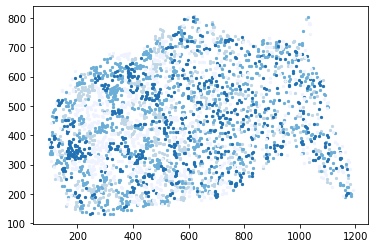

In [17]:
fig = plt.figure()
ax = fig.add_subplot()
xList = [pixelCoord[0] for pixelCoord in pixelCoordList0_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList0_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[0])/255.0)

xList = [pixelCoord[0] for pixelCoord in pixelCoordList1_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList1_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[1])/255.0)

xList = [pixelCoord[0] for pixelCoord in pixelCoordList2_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList2_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[2])/255.0)

xList = [pixelCoord[0] for pixelCoord in pixelCoordList3_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList3_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[3])/255.0)
plt.show()

In [18]:
def moransi(z, w):
    """
    Input
      z: list of values
      w: weight matrix
    Output
      I: Moran's I measure
    """
    n = len(z)
    mean = float(sum(z))/n
    S0 = 0
    d = 0
    var = 0
    for i in range(n):
        var += (z[i]-mean)**2
        for j in range(i):
            if w[i][j]:
                S0 += w[i][j]
                d += w[i][j] * (z[i]-mean) * (z[j]-mean)
    I = n*d/S0/var
    return I

In [19]:
len0 = len(pixelCoordList0_sample)
len1 = len(pixelCoordList1_sample)
len2 = len(pixelCoordList2_sample)
len3 = len(pixelCoordList3_sample)

In [20]:
zList0 = [colorGrey0 for i in range(len0)]
zList1 = [colorGrey1 for i in range(len1)]
zList2 = [colorGrey2 for i in range(len2)]
zList3 = [colorGrey3 for i in range(len3)]

In [21]:
# attribute list and coordinate list
zList = zList0 + zList1 + zList2 + zList3
pixelCoordList_sample = pixelCoordList0_sample + pixelCoordList1_sample + pixelCoordList2_sample + pixelCoordList3_sample

In [22]:
wMatrix = np.zeros(shape=(len(zList), len(zList)))

In [23]:
import math

In [24]:
def distance(coord1, coord2):
    x1, y1 = coord1[0], coord1[1]
    x2, y2 = coord2[0], coord2[1]
    dist = math.sqrt((x1 - x2)**2 + (y1 - y2)**2)
    return dist

In [25]:
# 1/(distance(pixelCoordList_sample[i], pixelCoordList_sample[j]) + 0.0000001)
def calculateKNeighWeight(i, coordList, k = 6): 
    # i is the currently target, k includes the point itself
    # k nearest neighborhood, only consider the k nearest neighbors
    # based on distance to calcuate weight, and normalize weight
    distList = []
    for j in range(len(coordList)):
        dist = distance(coordList[i], coordList[j])
        distList.append(dist)
    
    neighIndice = sorted(range(len(distList)), key = lambda sub: distList[sub])[:k]
    distNeigh = [distList[ind] for ind in neighIndice]

    neighIndice = neighIndice[1:]
    distNeigh = distNeigh[1:]
    wNeigh = [1/distNeigh[j] for j in range(len(distNeigh))]
    
    # normalize weights
    wNeighNorm = (np.asarray(wNeigh)/sum(wNeigh)).tolist()
    
    # put weights together
    wList = [0 for j in range(len(coordList))]
    for ind, j in enumerate(neighIndice):
        wList[j] = wNeighNorm[ind]
        
    return wList

In [26]:
for i in range(len(pixelCoordList_sample)):
    if i % 100 == 0:
        print(i)
    wMatrix[i] = calculateKNeighWeight(i, pixelCoordList_sample)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100


In [27]:
w = wMatrix.tolist()

In [28]:
moransi(zList, w)

0.4987813634165944

In [29]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [30]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList0_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans0 = KMeans(n_clusters = numClusters).fit(x)
kmeans0.cluster_centers_

[0.3625539015106683, 0.40459842877120916, 0.40943967828814515, 0.40806665243832485, 0.41329639831558873, 0.41942105080854986, 0.4192405547968254, 0.43506680385999186, 0.43071319634165944, 0.4311744914690436, 0.44205296948561473, 0.44513710546898017, 0.4401342669624427, 0.4382722098230695, 0.44887431670882305, 0.44162397965543915, 0.4476152276332792, 0.45687669158817706, 0.44349661619981556, 0.44692040744537603, 0.45495092287382144, 0.4515823079475006, 0.45412204103115034, 0.4525941251443794, 0.4663656511207354, 0.45174193103567617, 0.4486306970606338, 0.4528163315294481, 0.45386841185352733, 0.4428001438142906, 0.4437138471005859, 0.4411479846114006, 0.45829135135164195, 0.45980397008678653, 0.4442398768223191, 0.4548993746181739, 0.44143822430392615, 0.4463418940374006, 0.45697665750314825, 0.45281652461848126, 0.4400157501245453, 0.44370216403089696, 0.446102901271361, 0.43696337779718597, 0.4623963869369289, 0.4430584645930394, 0.4495689037157734, 0.4594564028510439, 0.4538314555547

array([[ 672.        ,  451.        ],
       [ 251.875     ,  564.        ],
       [ 429.25      ,  192.75      ],
       [ 885.77777778,  474.88888889],
       [ 579.6       ,  719.6       ],
       [ 190.57142857,  226.        ],
       [ 576.2       ,  349.86666667],
       [1068.25      ,  293.25      ],
       [ 392.69230769,  416.07692308],
       [1011.        ,  661.5       ],
       [ 686.6       ,  641.6       ],
       [ 134.75      ,  390.75      ],
       [ 609.        ,  547.66666667],
       [ 439.875     ,  559.25      ],
       [ 797.4       ,  281.        ],
       [ 685.28571429,  226.14285714],
       [1044.625     ,  547.125     ],
       [ 241.91666667,  402.08333333],
       [ 516.72727273,  273.27272727],
       [ 487.8       ,  693.8       ],
       [ 687.85714286,  765.85714286],
       [ 308.23076923,  223.84615385],
       [ 494.71428571,  464.64285714],
       [ 780.36363636,  541.        ],
       [ 892.77777778,  697.88888889],
       [ 603.4       ,  2

In [31]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList1_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans1 = KMeans(n_clusters = numClusters).fit(x)
kmeans1.cluster_centers_

[0.39038113370236494, 0.398768187924574, 0.40427399587901786, 0.41035917651653975, 0.4107738330946465, 0.40571196452193614, 0.3905999813220884, 0.38843593186224845, 0.3961501297607912, 0.39579915741518484, 0.39001142317590415, 0.4005633555122894, 0.4141484062933174, 0.41460057104052395, 0.40766227951877443, 0.41427241615423865, 0.4190703575279656, 0.41828592584348423, 0.40368524499310177, 0.41762919467441884, 0.4101716690998459, 0.40890199628944485, 0.4210274619208108, 0.4135010068523897, 0.4165515975721972, 0.42478750706900303, 0.42822054101644524, 0.42795281348508457, 0.42253925054936825, 0.42013095156997365, 0.4319086914096929, 0.42972272194552896, 0.4398892204155644, 0.4363674818116154, 0.42755242175351293, 0.43514026170203934, 0.4354944892215208, 0.4352827024822726, 0.4327377616674076, 0.44069548689197396, 0.4278544211295363, 0.4344646045378391, 0.43242293700425144, 0.42835085753319696, 0.4328268453838147, 0.4311270931298046, 0.43235865345251434, 0.4377302236601803, 0.435757731074

array([[ 450.94444444,  677.94444444],
       [ 651.42857143,  282.42857143],
       [ 225.42857143,  238.28571429],
       [ 867.125     ,  626.875     ],
       [1117.83333333,  287.83333333],
       [ 262.64705882,  616.70588235],
       [ 451.625     ,  374.5625    ],
       [ 631.        ,  610.25      ],
       [ 944.36363636,  422.63636364],
       [ 443.5       ,  167.625     ],
       [ 121.88888889,  464.66666667],
       [ 800.66666667,  303.77777778],
       [ 284.70588235,  422.82352941],
       [1044.44444444,  550.44444444],
       [ 339.375     ,  555.58333333],
       [ 563.33333333,  489.77777778],
       [ 570.        ,  747.8       ],
       [ 931.        ,  695.        ],
       [ 774.25      ,  360.375     ],
       [ 836.8       ,  488.7       ],
       [ 727.875     ,  609.5       ],
       [ 294.2       ,  163.2       ],
       [ 481.25      ,  300.91666667],
       [ 144.78571429,  309.92857143],
       [ 606.        ,  421.22222222],
       [ 646.85714286,  2

In [32]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList2_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans2 = KMeans(n_clusters = numClusters).fit(x)
kmeans2.cluster_centers_

[0.38422876754306523, 0.4000170213756548, 0.40525879920165814, 0.4207218336412396, 0.43054587321950194, 0.44170421747908695, 0.44002730826027925, 0.4432262722642777, 0.43404596238806287, 0.4440480090489961, 0.43040392814529776, 0.43836248355185703, 0.44792718312182556, 0.43873562571420005, 0.42706715799206324, 0.4465967800992933, 0.4499032183314945, 0.4418737063388691, 0.4362636986766613, 0.43197829546281047, 0.42923267141780025, 0.44500537681767377, 0.4295614478781507, 0.43252999605531917, 0.443120600835678, 0.4312073141523787, 0.42642008394840847, 0.42815186815721096, 0.43970802878496884, 0.4305854011679269, 0.4296443698424125, 0.4363319908699918, 0.43033427247162137, 0.4225778680998811, 0.4460822940638247, 0.44663689575153215, 0.4261857317015753, 0.44150313129526536, 0.44300320796007403, 0.4374693999019075, 0.4606143014243766, 0.45642231087697593, 0.4703308850922392, 0.46449717695908943, 0.45209376047764077, 0.4508207718320945, 0.44980423007551396, 0.45838360207953677, 0.45078005917

array([[ 720.92857143,  461.71428571],
       [ 176.89473684,  334.26315789],
       [ 391.73333333,  604.53333333],
       [1097.75      ,  316.5       ],
       [ 329.        ,  360.41666667],
       [ 983.        ,  577.5       ],
       [ 515.        ,  415.8       ],
       [ 776.33333333,  676.66666667],
       [ 615.25      ,  298.625     ],
       [ 452.53846154,  258.30769231],
       [ 815.33333333,  332.33333333],
       [ 684.7       ,  582.2       ],
       [ 199.5       ,  599.5       ],
       [ 542.5       ,  600.        ],
       [ 196.8       ,  198.4       ],
       [ 668.125     ,  709.75      ],
       [ 166.53333333,  437.06666667],
       [1026.83333333,  432.        ],
       [ 488.85714286,  550.71428571],
       [ 341.81818182,  480.18181818],
       [ 795.41666667,  262.33333333],
       [ 657.        ,  507.88888889],
       [ 924.875     ,  680.5       ],
       [ 895.5       ,  479.25      ],
       [ 555.        ,  268.71428571],
       [ 731.28571429,  5

In [33]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList3_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans3 = KMeans(n_clusters = numClusters).fit(x)
kmeans3.cluster_centers_

[0.38591943122746974, 0.4262471898224676, 0.38943178617047985, 0.38295423407083384, 0.38512270949440225, 0.4154084836670924, 0.4304875126183341, 0.44690024145841084, 0.4454778247039531, 0.4444504424292372, 0.4355609215275225, 0.4301943586209329, 0.43151865451417803, 0.4257905803370259, 0.43271084304147783, 0.4199251525483696, 0.42396152950299715, 0.40714092670740354, 0.42221721666781, 0.42806014089595446, 0.44519008835124807, 0.409687203685176, 0.4312685900865841, 0.4261541693276187, 0.4206606412914614, 0.43509521753654223, 0.4394913639410975, 0.4308172832431361, 0.435381557881388, 0.4311962841436508, 0.44535609618682775, 0.43388494517922677, 0.4345961818212724, 0.42703081584984265, 0.4403702091186293, 0.4285985782893706, 0.4381999045754571, 0.44304612094314283, 0.44102086943366253, 0.44428557523082773, 0.43950347173958754, 0.4448470286811737, 0.435891886680849, 0.4444225939094476, 0.4402432080582191, 0.45265174573810363, 0.4447178363353838, 0.4454584579548756, 0.4542453240305763, 0.44

array([[ 190.        ,  296.        ],
       [ 845.8       ,  430.6       ],
       [ 517.5       ,  317.5       ],
       [ 380.35714286,  553.07142857],
       [1083.14285714,  273.42857143],
       [ 701.36363636,  620.27272727],
       [ 935.66666667,  708.        ],
       [ 247.91304348,  445.08695652],
       [ 419.77777778,  281.77777778],
       [ 511.        ,  574.        ],
       [1029.25      ,  455.25      ],
       [ 718.28571429,  302.57142857],
       [ 378.        ,  405.42857143],
       [ 575.625     ,  417.75      ],
       [ 373.83333333,  672.33333333],
       [ 450.875     ,  227.25      ],
       [ 963.25      ,  523.5       ],
       [ 284.45454545,  363.77272727],
       [ 277.14285714,  546.78571429],
       [ 509.83333333,  717.16666667],
       [ 666.28571429,  193.28571429],
       [ 643.5       ,  735.5       ],
       [ 625.75      ,  471.25      ],
       [ 789.5       ,  612.625     ],
       [ 213.11764706,  495.47058824],
       [ 536.85714286,  2

In [34]:
kmeans3.cluster_centers_.shape

(96, 2)

In [35]:
zCenters0 = [colorGrey0 for i in range(kmeans0.cluster_centers_.shape[0])]
zCenters1 = [colorGrey1 for i in range(kmeans1.cluster_centers_.shape[0])]
zCenters2 = [colorGrey2 for i in range(kmeans2.cluster_centers_.shape[0])]
zCenters3 = [colorGrey3 for i in range(kmeans3.cluster_centers_.shape[0])]

In [36]:
coordCenters0 = kmeans0.cluster_centers_.tolist()
coordCenters1 = kmeans1.cluster_centers_.tolist()
coordCenters2 = kmeans2.cluster_centers_.tolist()
coordCenters3 = kmeans3.cluster_centers_.tolist()

In [37]:
zCenters = zCenters0 + zCenters1 + zCenters2 + zCenters3
coordCenters = coordCenters0 + coordCenters1 + coordCenters2 + coordCenters3

In [38]:
def calculateKNeighWeight(i, coordList, k = 6): 
    # i is the currently target, k includes the point itself
    distList = []
#     print('len of coordList: '+ str(len(coordList)))
    for j in range(len(coordList)):
        dist = distance(coordList[i], coordList[j])
        distList.append(dist)
    
#     for i in range(len(distList)):
#         print(str(i) + ': ' + str(distList[i]))
    neighIndice = sorted(range(len(distList)), key = lambda sub: distList[sub])[:k]
#     print(neighIndice)
    distNeigh = [distList[ind] for ind in neighIndice]
#     print(distNeigh)
    neighIndice = neighIndice[1:]
    distNeigh = distNeigh[1:]
    wNeigh = [1/distNeigh[j] for j in range(len(distNeigh))]
    
    # normalize weights
    wNeighNorm = (np.asarray(wNeigh)/sum(wNeigh)).tolist()
#     print(wNeighNorm)
    wList = [0 for j in range(len(coordList))]
#     print(len(wList))
    for ind, j in enumerate(neighIndice):
#         print('j:' + str(j))
        wList[j] = wNeighNorm[ind]
#     print(len(wList))
    return wList

In [39]:
wMatrix = np.zeros(shape=(len(zCenters), len(zCenters)))

In [40]:
for i in range(len(zCenters)):
    wMatrix[i] = calculateKNeighWeight(i, coordCenters)
    print(wMatrix[i])

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.11541899
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.17013218
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.20001907 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.19374799 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17408818 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.2309148  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.14394032 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.1925104

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.15514681 0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.33306543 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.08317422 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06962446 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

 0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.12299933 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.24327597 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.       

In [41]:
w = wMatrix.tolist()
moransi(zCenters, w)

-0.20778469132528724

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

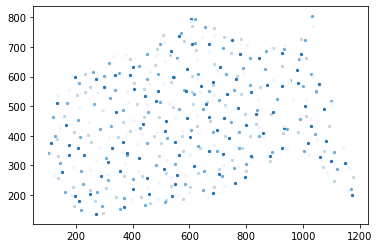

In [42]:
fig = plt.figure()
ax = fig.add_subplot()
xList = [pixelCoord[0] for pixelCoord in coordCenters0]
yList = [pixelCoord[1] for pixelCoord in coordCenters0]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[0])/255.0)

xList = [pixelCoord[0] for pixelCoord in coordCenters1]
yList = [pixelCoord[1] for pixelCoord in coordCenters1]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[1])/255.0)

xList = [pixelCoord[0] for pixelCoord in coordCenters2]
yList = [pixelCoord[1] for pixelCoord in coordCenters2]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[2])/255.0)

xList = [pixelCoord[0] for pixelCoord in coordCenters3]
yList = [pixelCoord[1] for pixelCoord in coordCenters3]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[3])/255.0)
plt.show()